In [1]:
import torch
import torch.nn as nn
import torch.nn.init as init
import random
import copy
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
import DeepTreeEnsemble
import torch.nn.functional as F
from importlib import reload
reload(DeepTreeEnsemble)
from DeepTreeEnsemble import DeepTreeEnsemble, create_dataloaders_for_dataset 
# if this ^ doesn't work, try 'pip install -e .' in the root directory of it. Make sure you are in 
# the desired environment. 

In [2]:
train_dataloader, test_dataloader, input_size, output_size = create_dataloaders_for_dataset(dataset_name='covertype', task='multi-classification', batch_size=64)

xtrain size 464809
xtest size 116203
y_train size 464809
y_test size 116203


In [3]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, dropout=.5):
        super(MLP, self).__init__()
        self.layers = nn.ModuleList()
        self.batch_norms = nn.ModuleList()

        # Create the first hidden layer
        self.layers.append(nn.Linear(input_size, hidden_layers[0]))
        self.batch_norms.append(nn.BatchNorm1d(hidden_layers[0]))

        # Create additional hidden layers
        for i in range(1, len(hidden_layers)):
            self.layers.append(nn.Linear(hidden_layers[i-1], hidden_layers[i]))
            self.batch_norms.append(nn.BatchNorm1d(hidden_layers[i]))

        # Output layer
        self.output = nn.Linear(hidden_layers[-1], output_size)

        # Dropout layer
        self.dropout = nn.Dropout(dropout)


    def forward(self, x):
        i = 0
        for layer, batch_norm in zip(self.layers, self.batch_norms):
            # x = F.relu(batch_norm(layer(x)))
            i=i+1
            x = self.dropout(x)
            # print('Layer dtype: ', layer.weight.dtype)
            x = x.to(torch.float32) # <-- area of concern
            # print('tensor dytpe: ', x.dtype)
            # layer.weight = layer.weight.to(torch.float32)
            x = F.relu(batch_norm(layer(x)))
            
            # print(f'dtype is {x.dtype} after layer {i}')

        x = self.output(x)
        return x

helper

# Changing the base

## Base 4, 3 Trails

In [4]:
hidden_layers = [50, 100, 50]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
coverDTEmlp4b = DeepTreeEnsemble(task_name='multi-classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=4,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.00001)

Randomly initializing 4 models
Training Model with id 1


Training Process:   0%|          | 0/10 [00:00<?, ?it/s]

Training Process:  10%|█         | 1/10 [00:39<05:59, 39.89s/it]

Epoch [1/10], Train F1:0.39165060876371155, Train Loss: 1.9382, Train Acc: 0.3868, Test F1:0.3576269534670701, Test Loss: 1.8081, Test Acc: 0.4919


Training Process:  20%|██        | 2/10 [01:18<05:13, 39.24s/it]

Epoch [2/10], Train F1:0.42627384580940625, Train Loss: 1.8651, Train Acc: 0.4442, Test F1:0.3573338718100371, Test Loss: 1.7811, Test Acc: 0.4953


Training Process:  30%|███       | 3/10 [01:58<04:37, 39.61s/it]

Epoch [3/10], Train F1:0.4404723414760483, Train Loss: 1.8269, Train Acc: 0.4713, Test F1:0.3885647650302919, Test Loss: 1.7634, Test Acc: 0.5109


Training Process:  40%|████      | 4/10 [02:40<04:01, 40.31s/it]

Epoch [4/10], Train F1:0.4507723210093627, Train Loss: 1.8034, Train Acc: 0.4884, Test F1:0.4149079502491278, Test Loss: 1.7509, Test Acc: 0.5240


Training Process:  50%|█████     | 5/10 [03:22<03:24, 40.99s/it]

Epoch [5/10], Train F1:0.4595424640992147, Train Loss: 1.7871, Train Acc: 0.5009, Test F1:0.436662730568581, Test Loss: 1.7404, Test Acc: 0.5348


Training Process:  60%|██████    | 6/10 [04:07<02:49, 42.47s/it]

Epoch [6/10], Train F1:0.4668473312648546, Train Loss: 1.7749, Train Acc: 0.5104, Test F1:0.45178036199796945, Test Loss: 1.7324, Test Acc: 0.5427


Training Process:  70%|███████   | 7/10 [04:53<02:10, 43.57s/it]

Epoch [7/10], Train F1:0.4728391899000143, Train Loss: 1.7654, Train Acc: 0.5180, Test F1:0.46125105537597144, Test Loss: 1.7267, Test Acc: 0.5481


Training Process:  80%|████████  | 8/10 [05:41<01:29, 44.87s/it]

Epoch [8/10], Train F1:0.477982601300558, Train Loss: 1.7577, Train Acc: 0.5242, Test F1:0.4687185619259986, Test Loss: 1.7221, Test Acc: 0.5524


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.26s/it]

Epoch [9/10], Train F1:0.48259952935371475, Train Loss: 1.7513, Train Acc: 0.5295, Test F1:0.47386414308345143, Test Loss: 1.7184, Test Acc: 0.5555


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.21s/it]


Epoch [10/10], Train F1:0.4874301718868612, Train Loss: 1.7456, Train Acc: 0.5342, Test F1:0.48032702216013173, Test Loss: 1.7141, Test Acc: 0.5592
Total Epochs: 10
Train loss start: 2.0868661403656006, Train loss end: 1.6820883750915527
Highest Mean Train Accuracy (over epoch): 0.5341970390351364
Test loss start: 1.778775691986084, Test loss end: 1.6042760610580444
Highest mean Test Accuracy (over epoch): 0.5591641001178157


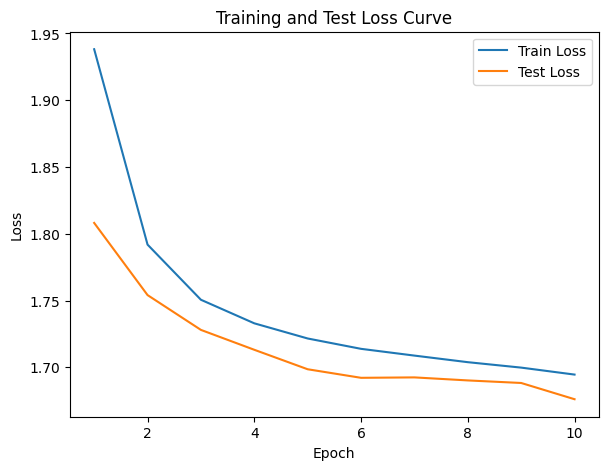

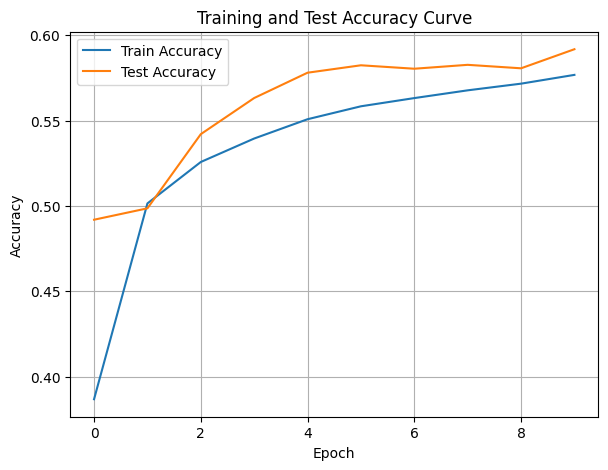

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.01s/it]

Epoch [1/10], Train F1:0.4149447392929332, Train Loss: 1.9280, Train Acc: 0.4315, Test F1:0.39711367069556, Test Loss: 1.8060, Test Acc: 0.5086


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.12s/it]

Epoch [2/10], Train F1:0.43856491321200725, Train Loss: 1.8532, Train Acc: 0.4769, Test F1:0.42246747617597874, Test Loss: 1.7706, Test Acc: 0.5248


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.96s/it]

Epoch [3/10], Train F1:0.45684897722121587, Train Loss: 1.8133, Train Acc: 0.5003, Test F1:0.4542473984037973, Test Loss: 1.7466, Test Acc: 0.5427


Training Process:  40%|████      | 4/10 [02:54<04:39, 46.66s/it]

Epoch [4/10], Train F1:0.47283750085931764, Train Loss: 1.7883, Train Acc: 0.5161, Test F1:0.47787608483557764, Test Loss: 1.7292, Test Acc: 0.5558


Training Process:  50%|█████     | 5/10 [03:58<04:24, 52.88s/it]

Epoch [5/10], Train F1:0.4856642535569238, Train Loss: 1.7707, Train Acc: 0.5278, Test F1:0.4919652755940274, Test Loss: 1.7175, Test Acc: 0.5640


Training Process:  60%|██████    | 6/10 [04:49<03:28, 52.18s/it]

Epoch [6/10], Train F1:0.4958645320536881, Train Loss: 1.7576, Train Acc: 0.5369, Test F1:0.5014109835969123, Test Loss: 1.7086, Test Acc: 0.5699


Training Process:  70%|███████   | 7/10 [05:35<02:30, 50.29s/it]

Epoch [7/10], Train F1:0.503923940755036, Train Loss: 1.7475, Train Acc: 0.5441, Test F1:0.5139584010902857, Test Loss: 1.7003, Test Acc: 0.5775


Training Process:  80%|████████  | 8/10 [06:24<01:39, 49.80s/it]

Epoch [8/10], Train F1:0.5106256323117537, Train Loss: 1.7392, Train Acc: 0.5502, Test F1:0.5250768790613567, Test Loss: 1.6932, Test Acc: 0.5842


Training Process:  90%|█████████ | 9/10 [07:13<00:49, 49.68s/it]

Epoch [9/10], Train F1:0.5163198574666058, Train Loss: 1.7323, Train Acc: 0.5553, Test F1:0.5303337698085093, Test Loss: 1.6889, Test Acc: 0.5877


Training Process: 100%|██████████| 10/10 [08:05<00:00, 48.55s/it]

Epoch [10/10], Train F1:0.5211107527358313, Train Loss: 1.7265, Train Acc: 0.5596, Test F1:0.5363152684838929, Test Loss: 1.6846, Test Acc: 0.5917
Total Epochs: 10
Train loss start: 2.0522704124450684, Train loss end: 1.8031997680664062
Highest Mean Train Accuracy (over epoch): 0.5596023729947647
Test loss start: 1.800840973854065, Test loss end: 1.6089080572128296
Highest mean Test Accuracy (over epoch): 0.5916607705409281


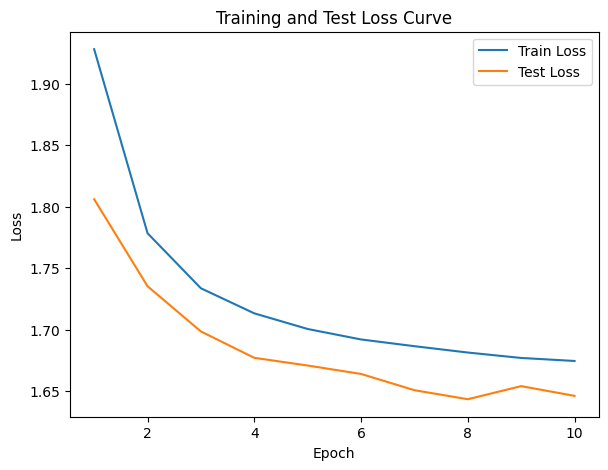

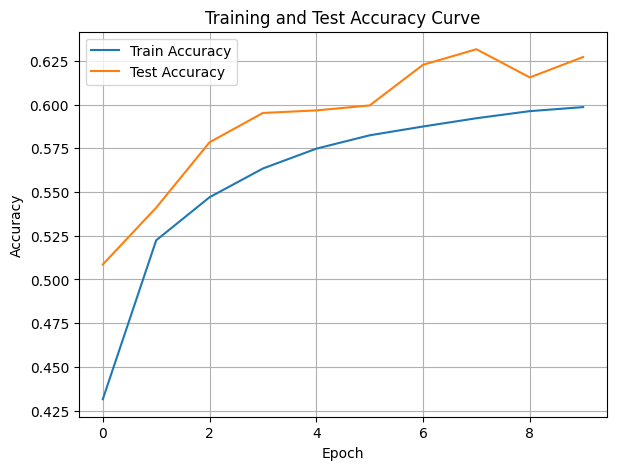

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.88s/it]

Epoch [1/10], Train F1:0.3928265919315781, Train Loss: 1.9643, Train Acc: 0.3822, Test F1:0.3781739869962601, Test Loss: 1.8227, Test Acc: 0.5004


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.79s/it]

Epoch [2/10], Train F1:0.42794821955950185, Train Loss: 1.8775, Train Acc: 0.4488, Test F1:0.4043396117480575, Test Loss: 1.7827, Test Acc: 0.5146


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.74s/it]

Epoch [3/10], Train F1:0.44620221310283453, Train Loss: 1.8322, Train Acc: 0.4785, Test F1:0.41833048492646174, Test Loss: 1.7640, Test Acc: 0.5226


Training Process:  40%|████      | 4/10 [02:36<03:57, 39.58s/it]

Epoch [4/10], Train F1:0.46247892947795016, Train Loss: 1.8040, Train Acc: 0.4978, Test F1:0.4442446244260733, Test Loss: 1.7476, Test Acc: 0.5359


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.83s/it]

Epoch [5/10], Train F1:0.47614172105263897, Train Loss: 1.7845, Train Acc: 0.5118, Test F1:0.4656469925194924, Test Loss: 1.7343, Test Acc: 0.5476


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.12s/it]

Epoch [6/10], Train F1:0.4874153190407646, Train Loss: 1.7697, Train Acc: 0.5229, Test F1:0.48220114964131616, Test Loss: 1.7244, Test Acc: 0.5569


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.25s/it]

Epoch [7/10], Train F1:0.49649576994837946, Train Loss: 1.7582, Train Acc: 0.5316, Test F1:0.49713280683670924, Test Loss: 1.7153, Test Acc: 0.5658


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.79s/it]

Epoch [8/10], Train F1:0.5040768633639354, Train Loss: 1.7489, Train Acc: 0.5389, Test F1:0.5078370713637212, Test Loss: 1.7078, Test Acc: 0.5725


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.38s/it]

Epoch [9/10], Train F1:0.5103632287753734, Train Loss: 1.7411, Train Acc: 0.5450, Test F1:0.5157224509030937, Test Loss: 1.7015, Test Acc: 0.5776


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.85s/it]

Epoch [10/10], Train F1:0.5156163619164414, Train Loss: 1.7346, Train Acc: 0.5502, Test F1:0.5220947944265953, Test Loss: 1.6967, Test Acc: 0.5819
Total Epochs: 10
Train loss start: 2.078310489654541, Train loss end: 1.6518903970718384
Highest Mean Train Accuracy (over epoch): 0.550188219063882
Test loss start: 1.8181196451187134, Test loss end: 1.615052342414856
Highest mean Test Accuracy (over epoch): 0.5819378257542773


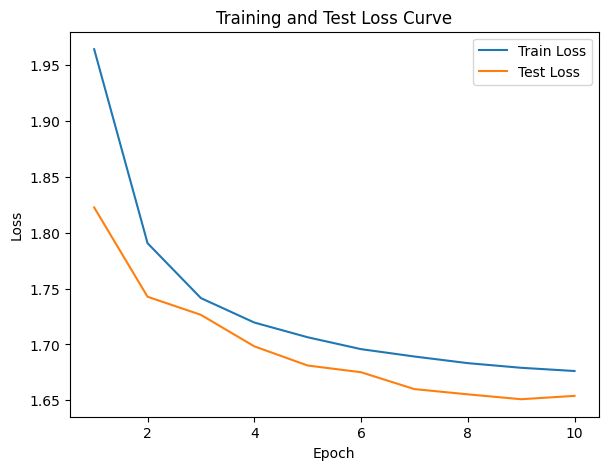

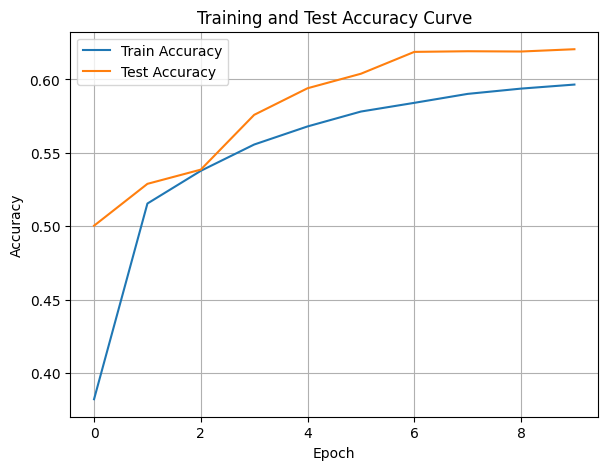

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.99s/it]

Epoch [1/10], Train F1:0.3752139132427491, Train Loss: 1.9792, Train Acc: 0.3428, Test F1:0.344998366072696, Test Loss: 1.8251, Test Acc: 0.4901


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.64s/it]

Epoch [2/10], Train F1:0.4314934875140515, Train Loss: 1.8870, Train Acc: 0.4290, Test F1:0.3709013629285114, Test Loss: 1.7902, Test Acc: 0.5021


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.92s/it]

Epoch [3/10], Train F1:0.4532927680706883, Train Loss: 1.8381, Train Acc: 0.4662, Test F1:0.39314274634508556, Test Loss: 1.7695, Test Acc: 0.5126


Training Process:  40%|████      | 4/10 [02:36<03:59, 39.87s/it]

Epoch [4/10], Train F1:0.4684333348458793, Train Loss: 1.8081, Train Acc: 0.4890, Test F1:0.4151266515047715, Test Loss: 1.7536, Test Acc: 0.5241


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.92s/it]

Epoch [5/10], Train F1:0.4803255917475101, Train Loss: 1.7876, Train Acc: 0.5049, Test F1:0.42254000856793245, Test Loss: 1.7454, Test Acc: 0.5283


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.09s/it]

Epoch [6/10], Train F1:0.4901579076906445, Train Loss: 1.7724, Train Acc: 0.5170, Test F1:0.4410704265136674, Test Loss: 1.7354, Test Acc: 0.5375


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.74s/it]

Epoch [7/10], Train F1:0.49823351951780226, Train Loss: 1.7605, Train Acc: 0.5265, Test F1:0.46091733074607627, Test Loss: 1.7259, Test Acc: 0.5479


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.24s/it]

Epoch [8/10], Train F1:0.5050706779049805, Train Loss: 1.7510, Train Acc: 0.5343, Test F1:0.4756221742927699, Test Loss: 1.7186, Test Acc: 0.5556


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.65s/it]

Epoch [9/10], Train F1:0.510869258710394, Train Loss: 1.7431, Train Acc: 0.5408, Test F1:0.4821299543284385, Test Loss: 1.7140, Test Acc: 0.5598


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.12s/it]

Epoch [10/10], Train F1:0.515920320506968, Train Loss: 1.7365, Train Acc: 0.5464, Test F1:0.4900439555114012, Test Loss: 1.7091, Test Acc: 0.5646
Total Epochs: 10
Train loss start: 2.104633092880249, Train loss end: 1.6726634502410889
Highest Mean Train Accuracy (over epoch): 0.5463829050852467
Test loss start: 1.8117759227752686, Test loss end: 1.6502819061279297
Highest mean Test Accuracy (over epoch): 0.5645968130506608


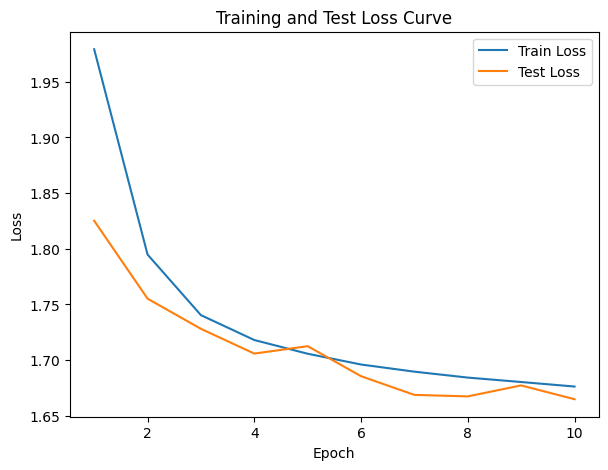

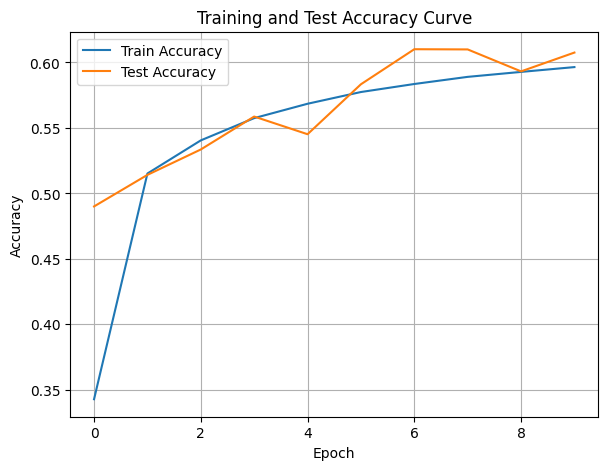

./saved_models/model_4.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:36<05:27, 36.40s/it]

Epoch [1/10], Train F1:0.5623527979039717, Train Loss: 1.6744, Train Acc: 0.5982, Test F1:0.5664518928877438, Test Loss: 1.6579, Test Acc: 0.6146


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.34s/it]

Epoch [2/10], Train F1:0.5637843173839175, Train Loss: 1.6731, Train Acc: 0.5996, Test F1:0.559822438088789, Test Loss: 1.6594, Test Acc: 0.6116


Training Process:  30%|███       | 3/10 [01:55<04:30, 38.66s/it]

Epoch [3/10], Train F1:0.5649263776336321, Train Loss: 1.6719, Train Acc: 0.6006, Test F1:0.5640793433325905, Test Loss: 1.6579, Test Acc: 0.6137


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.13s/it]

Epoch [4/10], Train F1:0.5657771999497355, Train Loss: 1.6711, Train Acc: 0.6014, Test F1:0.5607416358929709, Test Loss: 1.6594, Test Acc: 0.6114


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.74s/it]

Epoch [5/10], Train F1:0.5666381740400982, Train Loss: 1.6703, Train Acc: 0.6022, Test F1:0.5635812311369713, Test Loss: 1.6574, Test Acc: 0.6135


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.20s/it]

Epoch [6/10], Train F1:0.5675057502497751, Train Loss: 1.6694, Train Acc: 0.6030, Test F1:0.5682299448600628, Test Loss: 1.6550, Test Acc: 0.6165


Training Process:  70%|███████   | 7/10 [04:52<02:12, 44.01s/it]

Epoch [7/10], Train F1:0.5683464275600127, Train Loss: 1.6686, Train Acc: 0.6038, Test F1:0.5707247719667848, Test Loss: 1.6536, Test Acc: 0.6182


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.23s/it]

Epoch [8/10], Train F1:0.5691015729258155, Train Loss: 1.6679, Train Acc: 0.6045, Test F1:0.571127617402642, Test Loss: 1.6536, Test Acc: 0.6181


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.72s/it]

Epoch [9/10], Train F1:0.5697776335224958, Train Loss: 1.6673, Train Acc: 0.6052, Test F1:0.5712329215744416, Test Loss: 1.6532, Test Acc: 0.6184


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.47s/it]

Epoch [10/10], Train F1:0.5703149811877387, Train Loss: 1.6667, Train Acc: 0.6057, Test F1:0.5723356838073211, Test Loss: 1.6522, Test Acc: 0.6193
Total Epochs: 10
Train loss start: 1.5731086730957031, Train loss end: 1.6576929092407227
Highest Mean Train Accuracy (over epoch): 0.6056813969820306
Test loss start: 1.6414291858673096, Test loss end: 1.616919994354248
Highest mean Test Accuracy (over epoch): 0.6193215706958816


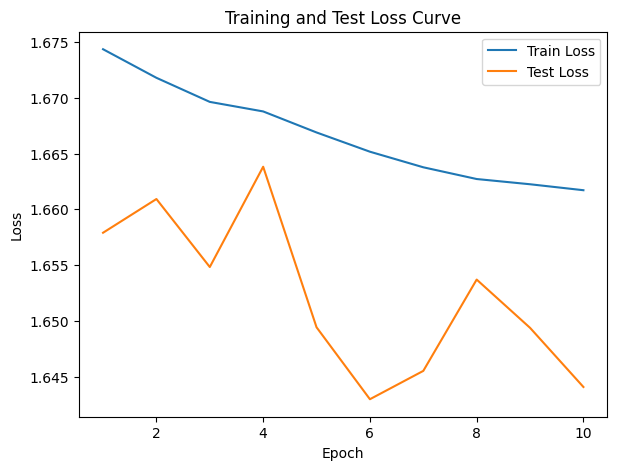

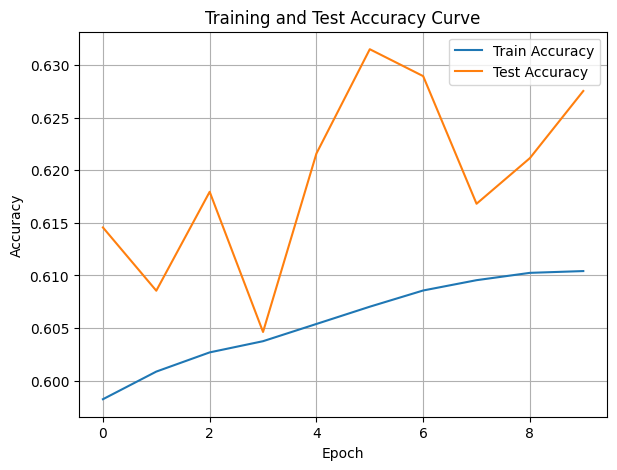

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.63s/it]

Epoch [1/10], Train F1:0.5761288364993538, Train Loss: 1.6610, Train Acc: 0.6113, Test F1:0.5894805445302072, Test Loss: 1.6440, Test Acc: 0.6316


Training Process:  20%|██        | 2/10 [01:16<05:05, 38.14s/it]

Epoch [2/10], Train F1:0.5762980231826583, Train Loss: 1.6607, Train Acc: 0.6116, Test F1:0.5849054989224783, Test Loss: 1.6434, Test Acc: 0.6298


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.29s/it]

Epoch [3/10], Train F1:0.5767297731681885, Train Loss: 1.6603, Train Acc: 0.6120, Test F1:0.5860204674429468, Test Loss: 1.6431, Test Acc: 0.6303


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.90s/it]

Epoch [4/10], Train F1:0.5772984632844427, Train Loss: 1.6597, Train Acc: 0.6125, Test F1:0.5842955144264674, Test Loss: 1.6440, Test Acc: 0.6289


Training Process:  50%|█████     | 5/10 [03:20<03:24, 40.88s/it]

Epoch [5/10], Train F1:0.5776452057289689, Train Loss: 1.6595, Train Acc: 0.6128, Test F1:0.583979894404811, Test Loss: 1.6443, Test Acc: 0.6283


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.18s/it]

Epoch [6/10], Train F1:0.577886568756871, Train Loss: 1.6592, Train Acc: 0.6130, Test F1:0.5808896866028028, Test Loss: 1.6459, Test Acc: 0.6258


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.49s/it]

Epoch [7/10], Train F1:0.5781331890113038, Train Loss: 1.6590, Train Acc: 0.6133, Test F1:0.5797099494015638, Test Loss: 1.6465, Test Acc: 0.6247


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.23s/it]

Epoch [8/10], Train F1:0.5783730476937042, Train Loss: 1.6588, Train Acc: 0.6135, Test F1:0.581054501179187, Test Loss: 1.6457, Test Acc: 0.6257


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.81s/it]

Epoch [9/10], Train F1:0.5786108845771665, Train Loss: 1.6585, Train Acc: 0.6138, Test F1:0.5797327012125516, Test Loss: 1.6460, Test Acc: 0.6251


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.16s/it]

Epoch [10/10], Train F1:0.5787873305514999, Train Loss: 1.6584, Train Acc: 0.6139, Test F1:0.5801775120378911, Test Loss: 1.6454, Test Acc: 0.6257
Total Epochs: 10
Train loss start: 1.7753119468688965, Train loss end: 1.7634811401367188
Highest Mean Train Accuracy (over epoch): 0.6139225805788109
Test loss start: 1.62019944190979, Test loss end: 1.6135061979293823
Highest mean Test Accuracy (over epoch): 0.6315879200389304


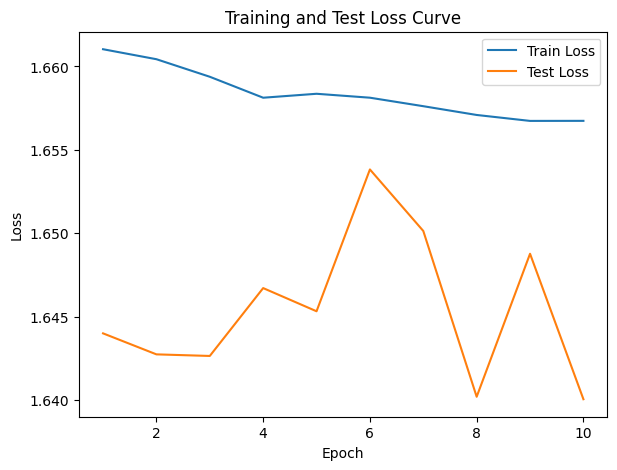

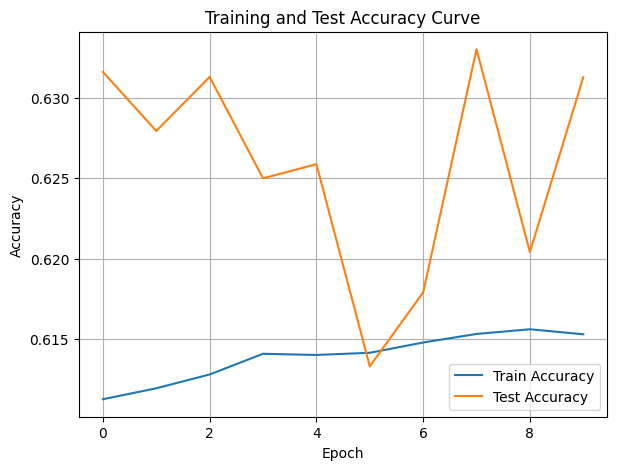

./saved_models/model_8.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.03s/it]

Epoch [1/10], Train F1:0.5802295514239612, Train Loss: 1.6568, Train Acc: 0.6153, Test F1:0.5860457299422624, Test Loss: 1.6453, Test Acc: 0.6282


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.75s/it]

Epoch [2/10], Train F1:0.5801663437387996, Train Loss: 1.6567, Train Acc: 0.6153, Test F1:0.5855079071192664, Test Loss: 1.6425, Test Acc: 0.6300


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.04s/it]

Epoch [3/10], Train F1:0.5810080121036401, Train Loss: 1.6561, Train Acc: 0.6162, Test F1:0.5850346937091899, Test Loss: 1.6420, Test Acc: 0.6299


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.78s/it]

Epoch [4/10], Train F1:0.5814022044934771, Train Loss: 1.6557, Train Acc: 0.6165, Test F1:0.5848652493900577, Test Loss: 1.6418, Test Acc: 0.6301


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.82s/it]

Epoch [5/10], Train F1:0.5816925975656208, Train Loss: 1.6555, Train Acc: 0.6168, Test F1:0.5869842084258851, Test Loss: 1.6411, Test Acc: 0.6313


Training Process:  60%|██████    | 6/10 [04:04<02:49, 42.27s/it]

Epoch [6/10], Train F1:0.5818032986281345, Train Loss: 1.6554, Train Acc: 0.6169, Test F1:0.5887022272635527, Test Loss: 1.6401, Test Acc: 0.6326


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.20s/it]

Epoch [7/10], Train F1:0.5819716813337358, Train Loss: 1.6552, Train Acc: 0.6171, Test F1:0.588353039973177, Test Loss: 1.6401, Test Acc: 0.6325


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.67s/it]

Epoch [8/10], Train F1:0.5821130264290423, Train Loss: 1.6551, Train Acc: 0.6172, Test F1:0.5867985028837107, Test Loss: 1.6409, Test Acc: 0.6313


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.39s/it]

Epoch [9/10], Train F1:0.5822460952751236, Train Loss: 1.6549, Train Acc: 0.6173, Test F1:0.5872433514242441, Test Loss: 1.6410, Test Acc: 0.6312


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.99s/it]

Epoch [10/10], Train F1:0.5824211031098003, Train Loss: 1.6548, Train Acc: 0.6175, Test F1:0.5886087175001824, Test Loss: 1.6402, Test Acc: 0.6322
Total Epochs: 10
Train loss start: 1.6880956888198853, Train loss end: 1.6977304220199585
Highest Mean Train Accuracy (over epoch): 0.6175062041822401
Test loss start: 1.6155589818954468, Test loss end: 1.6009068489074707
Highest mean Test Accuracy (over epoch): 0.6326447538887751


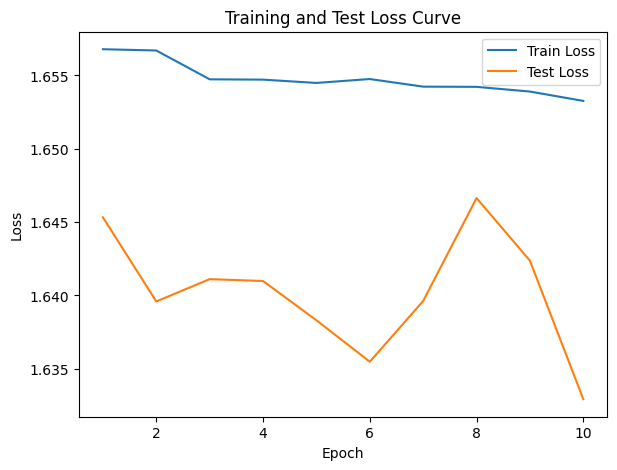

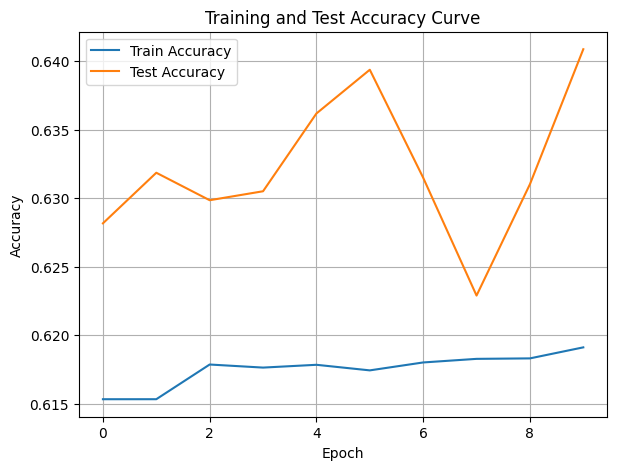

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [5]:
coverDTEmlp4b.train_DTE()

Training Process:   0%|          | 0/70 [00:00<?, ?it/s]

Training Process:   1%|▏         | 1/70 [00:37<42:51, 37.27s/it]

Epoch [1/70], Train F1:0.3937068375716162, Train Loss: 1.9426, Train Acc: 0.3985, Test F1:0.3916332463708193, Test Loss: 1.8192, Test Acc: 0.5134


Training Process:   3%|▎         | 2/70 [01:16<43:30, 38.40s/it]

Epoch [2/70], Train F1:0.43063282290963245, Train Loss: 1.8614, Train Acc: 0.4604, Test F1:0.4276583102550322, Test Loss: 1.7770, Test Acc: 0.5315


Training Process:   4%|▍         | 3/70 [01:57<44:09, 39.54s/it]

Epoch [3/70], Train F1:0.45115449013006154, Train Loss: 1.8197, Train Acc: 0.4881, Test F1:0.46485920529308666, Test Loss: 1.7505, Test Acc: 0.5490


Training Process:   6%|▌         | 4/70 [02:37<43:47, 39.81s/it]

Epoch [4/70], Train F1:0.467637509462405, Train Loss: 1.7939, Train Acc: 0.5060, Test F1:0.4912756242762567, Test Loss: 1.7320, Test Acc: 0.5632


Training Process:   7%|▋         | 5/70 [03:20<44:29, 41.07s/it]

Epoch [5/70], Train F1:0.48085245387514663, Train Loss: 1.7757, Train Acc: 0.5192, Test F1:0.5080432107851197, Test Loss: 1.7189, Test Acc: 0.5730


Training Process:   9%|▊         | 6/70 [04:06<45:16, 42.45s/it]

Epoch [6/70], Train F1:0.49140730863855175, Train Loss: 1.7622, Train Acc: 0.5292, Test F1:0.5203889416545361, Test Loss: 1.7085, Test Acc: 0.5805


Training Process:  10%|█         | 7/70 [04:51<45:42, 43.53s/it]

Epoch [7/70], Train F1:0.4999070542005416, Train Loss: 1.7516, Train Acc: 0.5373, Test F1:0.5295790318366786, Test Loss: 1.7003, Test Acc: 0.5864


Training Process:  11%|█▏        | 8/70 [05:40<46:32, 45.04s/it]

Epoch [8/70], Train F1:0.5071520457585668, Train Loss: 1.7428, Train Acc: 0.5442, Test F1:0.5362028092936879, Test Loss: 1.6940, Test Acc: 0.5909


Training Process:  13%|█▎        | 9/70 [06:30<47:38, 46.86s/it]

Epoch [9/70], Train F1:0.5130675391816983, Train Loss: 1.7356, Train Acc: 0.5498, Test F1:0.5424148945187522, Test Loss: 1.6884, Test Acc: 0.5952


Training Process:  14%|█▍        | 10/70 [07:21<48:06, 48.12s/it]

Epoch [10/70], Train F1:0.5182444983858747, Train Loss: 1.7295, Train Acc: 0.5547, Test F1:0.5468233723653261, Test Loss: 1.6842, Test Acc: 0.5983


Training Process:  16%|█▌        | 11/70 [08:14<48:41, 49.52s/it]

Epoch [11/70], Train F1:0.5227249629695735, Train Loss: 1.7242, Train Acc: 0.5589, Test F1:0.551840601569066, Test Loss: 1.6797, Test Acc: 0.6019


Training Process:  17%|█▋        | 12/70 [09:10<49:37, 51.34s/it]

Epoch [12/70], Train F1:0.5264940140593528, Train Loss: 1.7197, Train Acc: 0.5625, Test F1:0.5548388357339377, Test Loss: 1.6768, Test Acc: 0.6040


Training Process:  19%|█▊        | 13/70 [10:06<50:18, 52.95s/it]

Epoch [13/70], Train F1:0.5298230331005183, Train Loss: 1.7158, Train Acc: 0.5657, Test F1:0.5571403956627172, Test Loss: 1.6744, Test Acc: 0.6057


Training Process:  20%|██        | 14/70 [11:04<50:54, 54.55s/it]

Epoch [14/70], Train F1:0.5327774936696082, Train Loss: 1.7123, Train Acc: 0.5685, Test F1:0.5603569559865669, Test Loss: 1.6715, Test Acc: 0.6081


Training Process:  21%|██▏       | 15/70 [12:03<51:10, 55.83s/it]

Epoch [15/70], Train F1:0.5353895902071043, Train Loss: 1.7092, Train Acc: 0.5710, Test F1:0.5633291271339058, Test Loss: 1.6690, Test Acc: 0.6104


Training Process:  23%|██▎       | 16/70 [13:03<51:25, 57.15s/it]

Epoch [16/70], Train F1:0.5378482827554959, Train Loss: 1.7063, Train Acc: 0.5734, Test F1:0.5657002854790831, Test Loss: 1.6669, Test Acc: 0.6122


Training Process:  24%|██▍       | 17/70 [14:08<52:24, 59.34s/it]

Epoch [17/70], Train F1:0.5400109472477598, Train Loss: 1.7038, Train Acc: 0.5755, Test F1:0.5669753982078896, Test Loss: 1.6656, Test Acc: 0.6131


Training Process:  26%|██▌       | 18/70 [15:13<52:57, 61.11s/it]

Epoch [18/70], Train F1:0.5419877256669599, Train Loss: 1.7015, Train Acc: 0.5774, Test F1:0.5683918200077502, Test Loss: 1.6642, Test Acc: 0.6141


Training Process:  27%|██▋       | 19/70 [16:20<53:32, 62.99s/it]

Epoch [19/70], Train F1:0.5438510758293228, Train Loss: 1.6993, Train Acc: 0.5792, Test F1:0.5700186283026099, Test Loss: 1.6627, Test Acc: 0.6153


Training Process:  29%|██▊       | 20/70 [17:28<53:31, 64.23s/it]

Epoch [20/70], Train F1:0.5455131296654296, Train Loss: 1.6974, Train Acc: 0.5808, Test F1:0.572051175940821, Test Loss: 1.6610, Test Acc: 0.6168


Training Process:  30%|███       | 21/70 [18:36<53:23, 65.38s/it]

Epoch [21/70], Train F1:0.5470354917761118, Train Loss: 1.6957, Train Acc: 0.5823, Test F1:0.573885791881948, Test Loss: 1.6596, Test Acc: 0.6181


Training Process:  31%|███▏      | 22/70 [19:46<53:31, 66.91s/it]

Epoch [22/70], Train F1:0.5484655706054922, Train Loss: 1.6940, Train Acc: 0.5837, Test F1:0.575928901518079, Test Loss: 1.6580, Test Acc: 0.6196


Training Process:  33%|███▎      | 23/70 [20:58<53:38, 68.48s/it]

Epoch [23/70], Train F1:0.5498030054293118, Train Loss: 1.6925, Train Acc: 0.5850, Test F1:0.5772335209830664, Test Loss: 1.6569, Test Acc: 0.6206


Training Process:  34%|███▍      | 24/70 [22:12<53:41, 70.03s/it]

Epoch [24/70], Train F1:0.5510252070716595, Train Loss: 1.6911, Train Acc: 0.5862, Test F1:0.578123475864394, Test Loss: 1.6560, Test Acc: 0.6214


Training Process:  36%|███▌      | 25/70 [23:28<53:46, 71.71s/it]

Epoch [25/70], Train F1:0.5522112564281735, Train Loss: 1.6897, Train Acc: 0.5873, Test F1:0.5790636557797549, Test Loss: 1.6551, Test Acc: 0.6222


Training Process:  37%|███▋      | 26/70 [24:45<53:51, 73.43s/it]

Epoch [26/70], Train F1:0.5532175768992396, Train Loss: 1.6885, Train Acc: 0.5883, Test F1:0.5801785033315666, Test Loss: 1.6541, Test Acc: 0.6231


Training Process:  39%|███▊      | 27/70 [26:04<53:48, 75.07s/it]

Epoch [27/70], Train F1:0.5542219434151481, Train Loss: 1.6874, Train Acc: 0.5893, Test F1:0.5813318991878746, Test Loss: 1.6532, Test Acc: 0.6240


Training Process:  40%|████      | 28/70 [27:24<53:35, 76.56s/it]

Epoch [28/70], Train F1:0.5551688194886792, Train Loss: 1.6863, Train Acc: 0.5902, Test F1:0.5818583643626238, Test Loss: 1.6526, Test Acc: 0.6244


Training Process:  41%|████▏     | 29/70 [28:47<53:37, 78.48s/it]

Epoch [29/70], Train F1:0.5560933306174978, Train Loss: 1.6852, Train Acc: 0.5911, Test F1:0.5827153563268619, Test Loss: 1.6519, Test Acc: 0.6250


Training Process:  43%|████▎     | 30/70 [30:10<53:17, 79.95s/it]

Epoch [30/70], Train F1:0.5569689305894062, Train Loss: 1.6842, Train Acc: 0.5920, Test F1:0.5836501102087055, Test Loss: 1.6511, Test Acc: 0.6257


Training Process:  44%|████▍     | 31/70 [31:35<52:56, 81.44s/it]

Epoch [31/70], Train F1:0.5577525998433717, Train Loss: 1.6833, Train Acc: 0.5928, Test F1:0.5844398653298726, Test Loss: 1.6504, Test Acc: 0.6264


Training Process:  46%|████▌     | 32/70 [33:03<52:43, 83.25s/it]

Epoch [32/70], Train F1:0.5585267919581796, Train Loss: 1.6825, Train Acc: 0.5935, Test F1:0.5851574917795264, Test Loss: 1.6498, Test Acc: 0.6269


Training Process:  47%|████▋     | 33/70 [34:33<52:35, 85.29s/it]

Epoch [33/70], Train F1:0.5592891720348784, Train Loss: 1.6816, Train Acc: 0.5942, Test F1:0.585778856891479, Test Loss: 1.6493, Test Acc: 0.6274


Training Process:  49%|████▊     | 34/70 [36:04<52:14, 87.07s/it]

Epoch [34/70], Train F1:0.5599781489118921, Train Loss: 1.6808, Train Acc: 0.5949, Test F1:0.5860988384145689, Test Loss: 1.6490, Test Acc: 0.6277


Training Process:  50%|█████     | 35/70 [37:35<51:30, 88.31s/it]

Epoch [35/70], Train F1:0.5606541543570428, Train Loss: 1.6801, Train Acc: 0.5956, Test F1:0.5867586135183536, Test Loss: 1.6484, Test Acc: 0.6282


Training Process:  51%|█████▏    | 36/70 [39:09<51:03, 90.09s/it]

Epoch [36/70], Train F1:0.5612746098845822, Train Loss: 1.6794, Train Acc: 0.5962, Test F1:0.5873793617923896, Test Loss: 1.6479, Test Acc: 0.6287


Training Process:  53%|█████▎    | 37/70 [40:45<50:26, 91.72s/it]

Epoch [37/70], Train F1:0.5618736936278294, Train Loss: 1.6787, Train Acc: 0.5968, Test F1:0.587695240164155, Test Loss: 1.6476, Test Acc: 0.6290


Training Process:  54%|█████▍    | 38/70 [42:20<49:29, 92.80s/it]

Epoch [38/70], Train F1:0.5624423745329341, Train Loss: 1.6780, Train Acc: 0.5973, Test F1:0.5882318952209263, Test Loss: 1.6471, Test Acc: 0.6294


Training Process:  56%|█████▌    | 39/70 [43:58<48:42, 94.28s/it]

Epoch [39/70], Train F1:0.5630044730526905, Train Loss: 1.6774, Train Acc: 0.5979, Test F1:0.5884617619428962, Test Loss: 1.6469, Test Acc: 0.6295


Training Process:  57%|█████▋    | 40/70 [45:40<48:14, 96.50s/it]

Epoch [40/70], Train F1:0.5635169062545636, Train Loss: 1.6768, Train Acc: 0.5984, Test F1:0.5888005633916134, Test Loss: 1.6465, Test Acc: 0.6298


Training Process:  59%|█████▊    | 41/70 [47:21<47:20, 97.96s/it]

Epoch [41/70], Train F1:0.5640352926873116, Train Loss: 1.6762, Train Acc: 0.5989, Test F1:0.5889844562394603, Test Loss: 1.6463, Test Acc: 0.6300


Training Process:  60%|██████    | 42/70 [49:04<46:28, 99.59s/it]

Epoch [42/70], Train F1:0.56452091681689, Train Loss: 1.6757, Train Acc: 0.5994, Test F1:0.5892375388079045, Test Loss: 1.6460, Test Acc: 0.6303


Training Process:  61%|██████▏   | 43/70 [50:50<45:35, 101.30s/it]

Epoch [43/70], Train F1:0.565008210949273, Train Loss: 1.6751, Train Acc: 0.5999, Test F1:0.5896656778544924, Test Loss: 1.6456, Test Acc: 0.6306


Training Process:  63%|██████▎   | 44/70 [52:35<44:26, 102.56s/it]

Epoch [44/70], Train F1:0.5654546679690065, Train Loss: 1.6746, Train Acc: 0.6003, Test F1:0.5900680498541137, Test Loss: 1.6453, Test Acc: 0.6309


Training Process:  64%|██████▍   | 45/70 [54:24<43:27, 104.31s/it]

Epoch [45/70], Train F1:0.5658803275325296, Train Loss: 1.6741, Train Acc: 0.6007, Test F1:0.5904335371054436, Test Loss: 1.6450, Test Acc: 0.6312


Training Process:  66%|██████▌   | 46/70 [56:13<42:22, 105.95s/it]

Epoch [46/70], Train F1:0.5663085605383102, Train Loss: 1.6737, Train Acc: 0.6012, Test F1:0.5908096092251841, Test Loss: 1.6447, Test Acc: 0.6315


Training Process:  67%|██████▋   | 47/70 [58:05<41:16, 107.67s/it]

Epoch [47/70], Train F1:0.5667086150639403, Train Loss: 1.6732, Train Acc: 0.6016, Test F1:0.5907934237171203, Test Loss: 1.6445, Test Acc: 0.6315


Training Process:  69%|██████▊   | 48/70 [59:58<40:05, 109.33s/it]

Epoch [48/70], Train F1:0.5670992211040241, Train Loss: 1.6728, Train Acc: 0.6019, Test F1:0.591032081592263, Test Loss: 1.6444, Test Acc: 0.6317


Training Process:  70%|███████   | 49/70 [1:01:52<38:42, 110.59s/it]

Epoch [49/70], Train F1:0.5674877095114839, Train Loss: 1.6723, Train Acc: 0.6023, Test F1:0.591449316106111, Test Loss: 1.6440, Test Acc: 0.6320


Training Process:  71%|███████▏  | 50/70 [1:03:48<37:25, 112.26s/it]

Epoch [50/70], Train F1:0.5678479467974252, Train Loss: 1.6719, Train Acc: 0.6027, Test F1:0.5915967853957508, Test Loss: 1.6439, Test Acc: 0.6321


Training Process:  73%|███████▎  | 51/70 [1:05:46<36:08, 114.14s/it]

Epoch [51/70], Train F1:0.5681876515785232, Train Loss: 1.6715, Train Acc: 0.6030, Test F1:0.591802722721676, Test Loss: 1.6437, Test Acc: 0.6323


Training Process:  74%|███████▍  | 52/70 [1:07:46<34:42, 115.69s/it]

Epoch [52/70], Train F1:0.5685458648019414, Train Loss: 1.6711, Train Acc: 0.6034, Test F1:0.5922669234090615, Test Loss: 1.6433, Test Acc: 0.6327


Training Process:  76%|███████▌  | 53/70 [1:09:47<33:16, 117.45s/it]

Epoch [53/70], Train F1:0.568874520991209, Train Loss: 1.6708, Train Acc: 0.6037, Test F1:0.5923522696238108, Test Loss: 1.6432, Test Acc: 0.6327


Training Process:  77%|███████▋  | 54/70 [1:11:49<31:41, 118.86s/it]

Epoch [54/70], Train F1:0.5692028952667745, Train Loss: 1.6704, Train Acc: 0.6040, Test F1:0.5926641768926046, Test Loss: 1.6429, Test Acc: 0.6329


Training Process:  79%|███████▊  | 55/70 [1:13:55<30:11, 120.78s/it]

Epoch [55/70], Train F1:0.5695179408354831, Train Loss: 1.6700, Train Acc: 0.6043, Test F1:0.5928440860358329, Test Loss: 1.6428, Test Acc: 0.6330


Training Process:  80%|████████  | 56/70 [1:16:01<28:31, 122.27s/it]

Epoch [56/70], Train F1:0.5698114417490698, Train Loss: 1.6697, Train Acc: 0.6046, Test F1:0.5928993009470586, Test Loss: 1.6427, Test Acc: 0.6331


Training Process:  81%|████████▏ | 57/70 [1:18:08<26:48, 123.74s/it]

Epoch [57/70], Train F1:0.5701008368970846, Train Loss: 1.6694, Train Acc: 0.6049, Test F1:0.5933124568349267, Test Loss: 1.6424, Test Acc: 0.6334


Training Process:  83%|████████▎ | 58/70 [1:20:16<25:02, 125.18s/it]

Epoch [58/70], Train F1:0.5703920078941451, Train Loss: 1.6691, Train Acc: 0.6052, Test F1:0.5933218182594002, Test Loss: 1.6423, Test Acc: 0.6334


Training Process:  84%|████████▍ | 59/70 [1:22:27<23:14, 126.78s/it]

Epoch [59/70], Train F1:0.5706713700824545, Train Loss: 1.6687, Train Acc: 0.6055, Test F1:0.5933463675370262, Test Loss: 1.6423, Test Acc: 0.6334


Training Process:  86%|████████▌ | 60/70 [1:24:51<21:59, 131.93s/it]

Epoch [60/70], Train F1:0.570945969889895, Train Loss: 1.6684, Train Acc: 0.6057, Test F1:0.593595369614302, Test Loss: 1.6421, Test Acc: 0.6336


Training Process:  87%|████████▋ | 61/70 [1:27:05<19:54, 132.67s/it]

Epoch [61/70], Train F1:0.5712087143784694, Train Loss: 1.6681, Train Acc: 0.6060, Test F1:0.5938109881580748, Test Loss: 1.6419, Test Acc: 0.6338


Training Process:  89%|████████▊ | 62/70 [1:29:21<17:48, 133.54s/it]

Epoch [62/70], Train F1:0.571475074672094, Train Loss: 1.6678, Train Acc: 0.6063, Test F1:0.5939941634089546, Test Loss: 1.6417, Test Acc: 0.6339


Training Process:  90%|█████████ | 63/70 [1:31:38<15:43, 134.74s/it]

Epoch [63/70], Train F1:0.5717313353825525, Train Loss: 1.6676, Train Acc: 0.6065, Test F1:0.594092759164874, Test Loss: 1.6416, Test Acc: 0.6340


Training Process:  91%|█████████▏| 64/70 [1:33:56<13:34, 135.72s/it]

Epoch [64/70], Train F1:0.5719858752887103, Train Loss: 1.6673, Train Acc: 0.6068, Test F1:0.5943929078503328, Test Loss: 1.6414, Test Acc: 0.6343


Training Process:  93%|█████████▎| 65/70 [1:36:17<11:25, 137.11s/it]

Epoch [65/70], Train F1:0.5722154296010891, Train Loss: 1.6670, Train Acc: 0.6070, Test F1:0.5946446368582705, Test Loss: 1.6412, Test Acc: 0.6345


Training Process:  94%|█████████▍| 66/70 [1:38:37<09:13, 138.26s/it]

Epoch [66/70], Train F1:0.5724498255095737, Train Loss: 1.6668, Train Acc: 0.6072, Test F1:0.5947274337503488, Test Loss: 1.6411, Test Acc: 0.6346


Training Process:  96%|█████████▌| 67/70 [1:41:01<06:59, 139.96s/it]

Epoch [67/70], Train F1:0.5726894263190004, Train Loss: 1.6665, Train Acc: 0.6075, Test F1:0.5949373519513722, Test Loss: 1.6409, Test Acc: 0.6347


Training Process:  97%|█████████▋| 68/70 [1:43:25<04:42, 141.17s/it]

Epoch [68/70], Train F1:0.5729172606200518, Train Loss: 1.6662, Train Acc: 0.6077, Test F1:0.5950160186688506, Test Loss: 1.6408, Test Acc: 0.6348


Training Process:  99%|█████████▊| 69/70 [1:45:52<02:22, 142.90s/it]

Epoch [69/70], Train F1:0.5731249939661814, Train Loss: 1.6660, Train Acc: 0.6079, Test F1:0.5950116749991167, Test Loss: 1.6408, Test Acc: 0.6348


Training Process: 100%|██████████| 70/70 [1:48:21<00:00, 92.88s/it] 


Epoch [70/70], Train F1:0.5733369364620878, Train Loss: 1.6658, Train Acc: 0.6081, Test F1:0.5951255630490038, Test Loss: 1.6407, Test Acc: 0.6348
Total Epochs: 70
Train loss start: 2.082256555557251, Train loss end: 1.6821885108947754
Highest Mean Train Accuracy (over epoch): 0.6081114030902657
Test loss start: 1.837512493133545, Test loss end: 1.589308500289917
Highest Mean Test Accuracy (over epoch): 0.6348263852046042


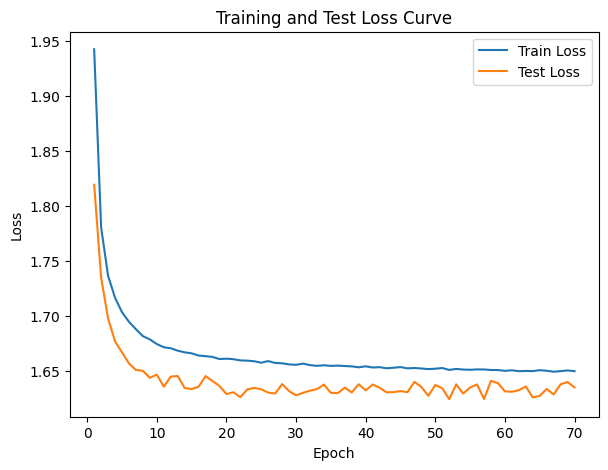

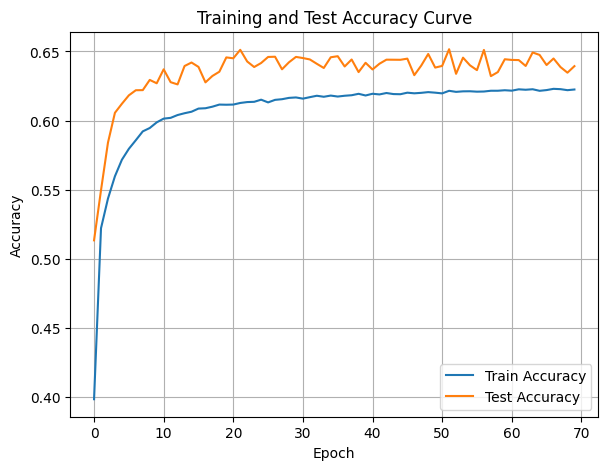

In [6]:
coverDTEmlp4b.train_single_model()

Randomly initializing 4 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:36<05:24, 36.04s/it]

Epoch [1/10], Train F1:0.31355671806198665, Train Loss: 1.9658, Train Acc: 0.3566, Test F1:0.4315941542225549, Test Loss: 1.8812, Test Acc: 0.5063


Training Process:  20%|██        | 2/10 [01:14<04:58, 37.35s/it]

Epoch [2/10], Train F1:0.3989644079691209, Train Loss: 1.8891, Train Acc: 0.4205, Test F1:0.42100012621689037, Test Loss: 1.8199, Test Acc: 0.5096


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.97s/it]

Epoch [3/10], Train F1:0.43558461703309326, Train Loss: 1.8429, Train Acc: 0.4568, Test F1:0.41512501357578435, Test Loss: 1.7933, Test Acc: 0.5120


Training Process:  40%|████      | 4/10 [02:35<03:56, 39.50s/it]

Epoch [4/10], Train F1:0.4553606313756465, Train Loss: 1.8135, Train Acc: 0.4801, Test F1:0.4322324843056363, Test Loss: 1.7720, Test Acc: 0.5229


Training Process:  50%|█████     | 5/10 [03:17<03:22, 40.46s/it]

Epoch [5/10], Train F1:0.4701362774864749, Train Loss: 1.7928, Train Acc: 0.4971, Test F1:0.4429617630228952, Test Loss: 1.7580, Test Acc: 0.5300


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.13s/it]

Epoch [6/10], Train F1:0.4819331725440847, Train Loss: 1.7772, Train Acc: 0.5100, Test F1:0.4577819222851071, Test Loss: 1.7458, Test Acc: 0.5392


Training Process:  70%|███████   | 7/10 [04:47<02:08, 42.99s/it]

Epoch [7/10], Train F1:0.49181050534001874, Train Loss: 1.7647, Train Acc: 0.5207, Test F1:0.47540797506801785, Test Loss: 1.7344, Test Acc: 0.5495


Training Process:  80%|████████  | 8/10 [05:35<01:29, 44.51s/it]

Epoch [8/10], Train F1:0.4996309425656104, Train Loss: 1.7548, Train Acc: 0.5290, Test F1:0.4884000788856555, Test Loss: 1.7254, Test Acc: 0.5575


Training Process:  90%|█████████ | 9/10 [06:25<00:46, 46.20s/it]

Epoch [9/10], Train F1:0.5061929839845242, Train Loss: 1.7466, Train Acc: 0.5360, Test F1:0.49958642626571054, Test Loss: 1.7175, Test Acc: 0.5646


Training Process: 100%|██████████| 10/10 [07:17<00:00, 43.74s/it]

Epoch [10/10], Train F1:0.5117847090743445, Train Loss: 1.7397, Train Acc: 0.5420, Test F1:0.5092065059128685, Test Loss: 1.7104, Test Acc: 0.5708
Total Epochs: 10
Train loss start: 2.085118293762207, Train loss end: 1.6842412948608398
Highest Mean Train Accuracy (over epoch): 0.5419828364950317
Test loss start: 1.8701046705245972, Test loss end: 1.638720154762268
Highest mean Test Accuracy (over epoch): 0.5707780404799713


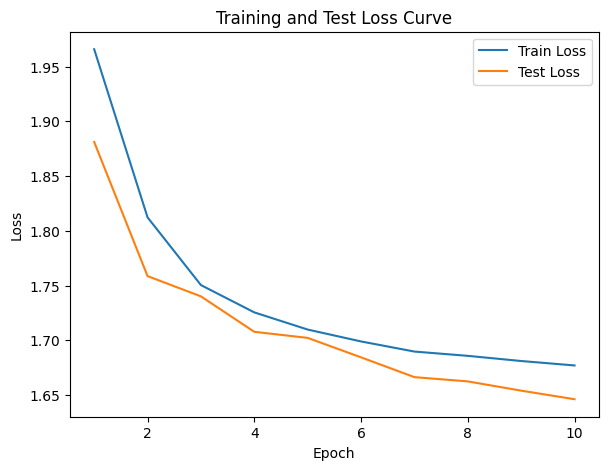

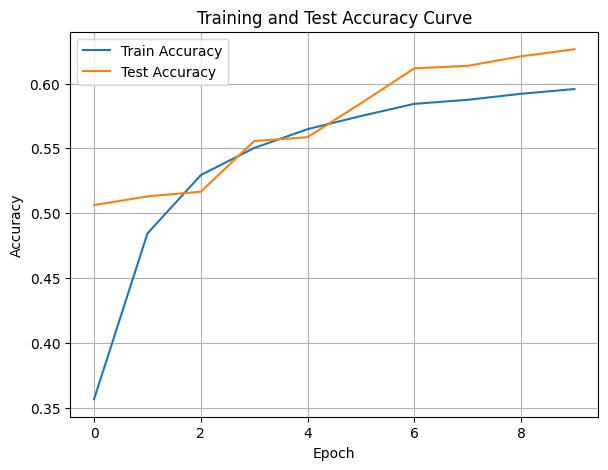

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.11s/it]

Epoch [1/10], Train F1:0.39122259904282797, Train Loss: 1.9579, Train Acc: 0.3801, Test F1:0.4593039935504564, Test Loss: 1.8531, Test Acc: 0.5382


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.12s/it]

Epoch [2/10], Train F1:0.42679596258023644, Train Loss: 1.8749, Train Acc: 0.4444, Test F1:0.45927953290938, Test Loss: 1.7972, Test Acc: 0.5417


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.06s/it]

Epoch [3/10], Train F1:0.4418335662617225, Train Loss: 1.8316, Train Acc: 0.4735, Test F1:0.4756894972017752, Test Loss: 1.7679, Test Acc: 0.5518


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.92s/it]

Epoch [4/10], Train F1:0.45395979021522215, Train Loss: 1.8054, Train Acc: 0.4916, Test F1:0.4919200341870842, Test Loss: 1.7479, Test Acc: 0.5612


Training Process:  50%|█████     | 5/10 [03:18<03:22, 40.54s/it]

Epoch [5/10], Train F1:0.46586276968564155, Train Loss: 1.7868, Train Acc: 0.5055, Test F1:0.5019853267590118, Test Loss: 1.7344, Test Acc: 0.5674


Training Process:  60%|██████    | 6/10 [04:04<02:49, 42.26s/it]

Epoch [6/10], Train F1:0.47665918005642943, Train Loss: 1.7728, Train Acc: 0.5163, Test F1:0.5115823930969134, Test Loss: 1.7239, Test Acc: 0.5728


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.80s/it]

Epoch [7/10], Train F1:0.4860142598715579, Train Loss: 1.7617, Train Acc: 0.5252, Test F1:0.5209128832535456, Test Loss: 1.7150, Test Acc: 0.5782


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.21s/it]

Epoch [8/10], Train F1:0.4940623156619881, Train Loss: 1.7525, Train Acc: 0.5327, Test F1:0.5279284255622634, Test Loss: 1.7080, Test Acc: 0.5826


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.78s/it]

Epoch [9/10], Train F1:0.5008690753820769, Train Loss: 1.7449, Train Acc: 0.5390, Test F1:0.5359514456180249, Test Loss: 1.7016, Test Acc: 0.5875


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.06s/it]


Epoch [10/10], Train F1:0.5066783341940537, Train Loss: 1.7384, Train Acc: 0.5443, Test F1:0.5418986329089466, Test Loss: 1.6963, Test Acc: 0.5914
Total Epochs: 10
Train loss start: 2.0923008918762207, Train loss end: 1.7553293704986572
Highest Mean Train Accuracy (over epoch): 0.5443274443974304
Test loss start: 1.8260141611099243, Test loss end: 1.6390260457992554
Highest mean Test Accuracy (over epoch): 0.5914479697584777


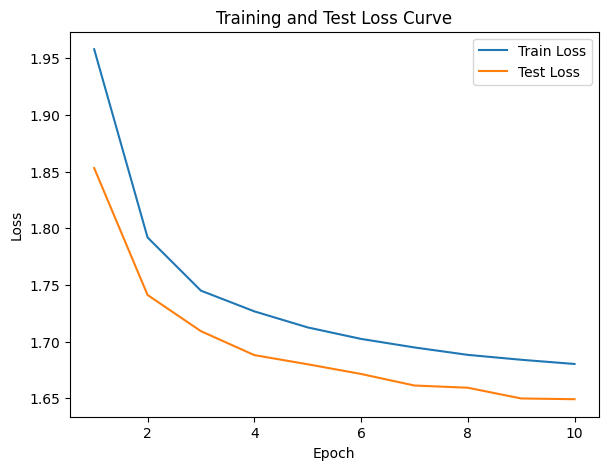

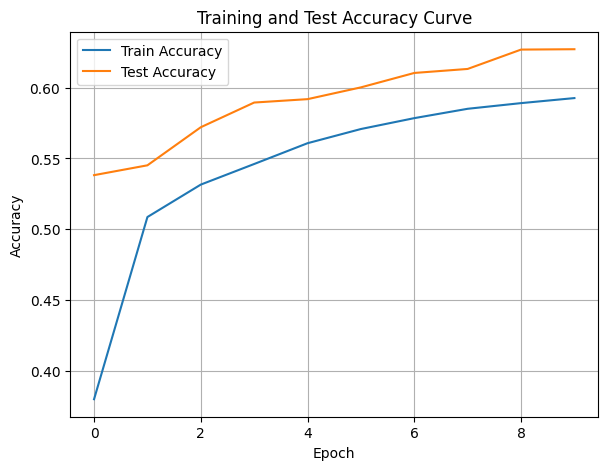

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.95s/it]

Epoch [1/10], Train F1:0.3368083048594672, Train Loss: 1.9908, Train Acc: 0.3142, Test F1:0.48728762210163074, Test Loss: 1.8551, Test Acc: 0.5443


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.76s/it]

Epoch [2/10], Train F1:0.4117804520893285, Train Loss: 1.8974, Train Acc: 0.4083, Test F1:0.47738183977174625, Test Loss: 1.7976, Test Acc: 0.5473


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.04s/it]

Epoch [3/10], Train F1:0.4399578423556987, Train Loss: 1.8463, Train Acc: 0.4508, Test F1:0.4787823950585783, Test Loss: 1.7707, Test Acc: 0.5519


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.94s/it]

Epoch [4/10], Train F1:0.4550281317799289, Train Loss: 1.8160, Train Acc: 0.4753, Test F1:0.48881333861126447, Test Loss: 1.7526, Test Acc: 0.5592


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.64s/it]

Epoch [5/10], Train F1:0.4668021963421255, Train Loss: 1.7953, Train Acc: 0.4922, Test F1:0.4966374170805115, Test Loss: 1.7398, Test Acc: 0.5646


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.13s/it]

Epoch [6/10], Train F1:0.47752847742512416, Train Loss: 1.7800, Train Acc: 0.5050, Test F1:0.504666542321094, Test Loss: 1.7297, Test Acc: 0.5696


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.55s/it]

Epoch [7/10], Train F1:0.4873362451392142, Train Loss: 1.7678, Train Acc: 0.5155, Test F1:0.5118134571986219, Test Loss: 1.7215, Test Acc: 0.5739


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.95s/it]

Epoch [8/10], Train F1:0.49569756094329376, Train Loss: 1.7579, Train Acc: 0.5242, Test F1:0.5206621606280476, Test Loss: 1.7139, Test Acc: 0.5789


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.69s/it]

Epoch [9/10], Train F1:0.5026761383768054, Train Loss: 1.7497, Train Acc: 0.5314, Test F1:0.5264002709702108, Test Loss: 1.7079, Test Acc: 0.5825


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.05s/it]

Epoch [10/10], Train F1:0.508655132614661, Train Loss: 1.7427, Train Acc: 0.5375, Test F1:0.5327549134992153, Test Loss: 1.7021, Test Acc: 0.5864
Total Epochs: 10
Train loss start: 2.117826461791992, Train loss end: 1.6116937398910522
Highest Mean Train Accuracy (over epoch): 0.5375357695452728
Test loss start: 1.8412280082702637, Test loss end: 1.6712703704833984
Highest mean Test Accuracy (over epoch): 0.5864001391058806


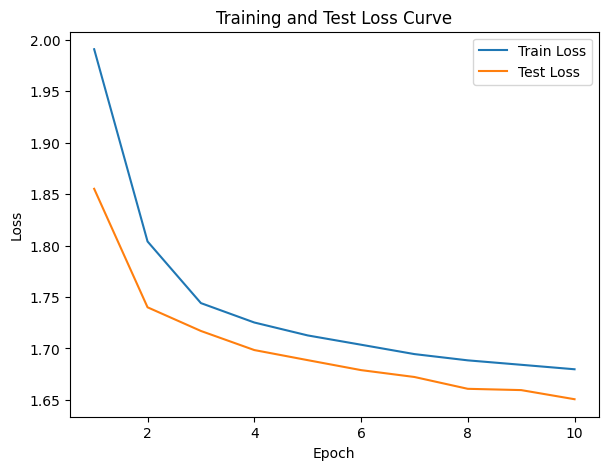

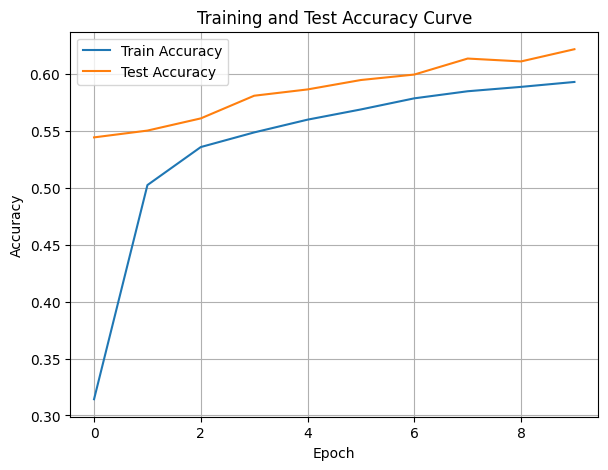

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.14s/it]

Epoch [1/10], Train F1:0.36426400174128265, Train Loss: 1.9850, Train Acc: 0.3318, Test F1:0.3678215876558303, Test Loss: 1.8212, Test Acc: 0.4906


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.94s/it]

Epoch [2/10], Train F1:0.42410978122690907, Train Loss: 1.8946, Train Acc: 0.4201, Test F1:0.3687133989372618, Test Loss: 1.7940, Test Acc: 0.4952


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.76s/it]

Epoch [3/10], Train F1:0.45038290538036635, Train Loss: 1.8432, Train Acc: 0.4615, Test F1:0.38507165497436824, Test Loss: 1.7752, Test Acc: 0.5056


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.75s/it]

Epoch [4/10], Train F1:0.4672262140008019, Train Loss: 1.8117, Train Acc: 0.4860, Test F1:0.40477970576108113, Test Loss: 1.7600, Test Acc: 0.5164


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.86s/it]

Epoch [5/10], Train F1:0.48012747430901764, Train Loss: 1.7901, Train Acc: 0.5031, Test F1:0.42581962111714455, Test Loss: 1.7472, Test Acc: 0.5274


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.14s/it]

Epoch [6/10], Train F1:0.4902450906493228, Train Loss: 1.7743, Train Acc: 0.5157, Test F1:0.4440213989368833, Test Loss: 1.7365, Test Acc: 0.5373


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.53s/it]

Epoch [7/10], Train F1:0.4990454271188611, Train Loss: 1.7617, Train Acc: 0.5261, Test F1:0.45949910935142113, Test Loss: 1.7272, Test Acc: 0.5457


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.24s/it]

Epoch [8/10], Train F1:0.5061248042660959, Train Loss: 1.7518, Train Acc: 0.5342, Test F1:0.4730001359056951, Test Loss: 1.7189, Test Acc: 0.5533


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.77s/it]

Epoch [9/10], Train F1:0.512105237011603, Train Loss: 1.7436, Train Acc: 0.5410, Test F1:0.4838679020669831, Test Loss: 1.7123, Test Acc: 0.5595


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.11s/it]


Epoch [10/10], Train F1:0.5172308922692502, Train Loss: 1.7367, Train Acc: 0.5468, Test F1:0.4925712795689047, Test Loss: 1.7063, Test Acc: 0.5648
Total Epochs: 10
Train loss start: 2.1173882484436035, Train loss end: 1.6801469326019287
Highest Mean Train Accuracy (over epoch): 0.5467517611398234
Test loss start: 1.810964584350586, Test loss end: 1.623721957206726
Highest mean Test Accuracy (over epoch): 0.5648290830537342


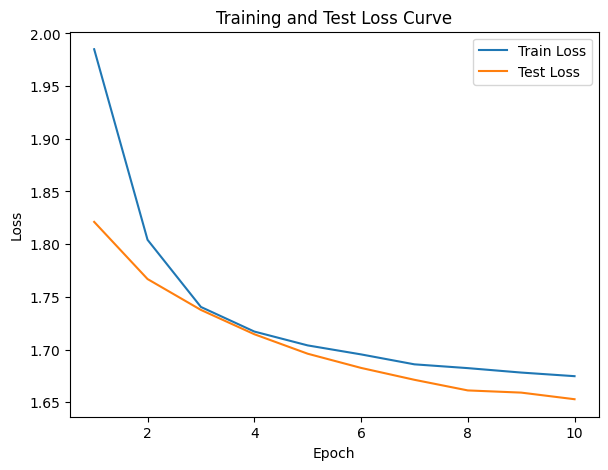

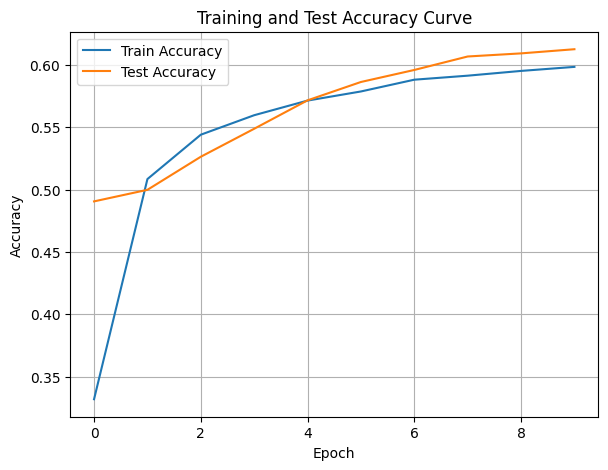

./saved_models/model_4.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.94s/it]

Epoch [1/10], Train F1:0.5638075521668995, Train Loss: 1.6731, Train Acc: 0.5997, Test F1:0.5657083352034123, Test Loss: 1.6545, Test Acc: 0.6140


Training Process:  20%|██        | 2/10 [01:16<05:08, 38.51s/it]

Epoch [2/10], Train F1:0.565647710947637, Train Loss: 1.6714, Train Acc: 0.6014, Test F1:0.5683932077952455, Test Loss: 1.6523, Test Acc: 0.6163


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.44s/it]

Epoch [3/10], Train F1:0.5667616102885239, Train Loss: 1.6703, Train Acc: 0.6025, Test F1:0.5653618337409163, Test Loss: 1.6526, Test Acc: 0.6148


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.42s/it]

Epoch [4/10], Train F1:0.5678140131671519, Train Loss: 1.6692, Train Acc: 0.6035, Test F1:0.5638190239937121, Test Loss: 1.6533, Test Acc: 0.6137


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.20s/it]

Epoch [5/10], Train F1:0.5686200411977511, Train Loss: 1.6685, Train Acc: 0.6042, Test F1:0.5667997668433243, Test Loss: 1.6516, Test Acc: 0.6156


Training Process:  60%|██████    | 6/10 [04:06<02:49, 42.31s/it]

Epoch [6/10], Train F1:0.5694103386476391, Train Loss: 1.6677, Train Acc: 0.6050, Test F1:0.5668498816056388, Test Loss: 1.6515, Test Acc: 0.6154


Training Process:  70%|███████   | 7/10 [04:52<02:10, 43.56s/it]

Epoch [7/10], Train F1:0.5701327972861042, Train Loss: 1.6670, Train Acc: 0.6057, Test F1:0.5716270113296161, Test Loss: 1.6494, Test Acc: 0.6187


Training Process:  80%|████████  | 8/10 [05:40<01:29, 44.95s/it]

Epoch [8/10], Train F1:0.5706271061801201, Train Loss: 1.6665, Train Acc: 0.6062, Test F1:0.571451633355814, Test Loss: 1.6493, Test Acc: 0.6185


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.42s/it]

Epoch [9/10], Train F1:0.5712888751086013, Train Loss: 1.6658, Train Acc: 0.6068, Test F1:0.5726881497919126, Test Loss: 1.6482, Test Acc: 0.6196


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.10s/it]

Epoch [10/10], Train F1:0.5719068964265314, Train Loss: 1.6651, Train Acc: 0.6074, Test F1:0.5722382087425316, Test Loss: 1.6485, Test Acc: 0.6191
Total Epochs: 10
Train loss start: 1.7201176881790161, Train loss end: 1.74114191532135
Highest Mean Train Accuracy (over epoch): 0.6074162802695252
Test loss start: 1.6255568265914917, Test loss end: 1.6055021286010742
Highest mean Test Accuracy (over epoch): 0.6195780099232774


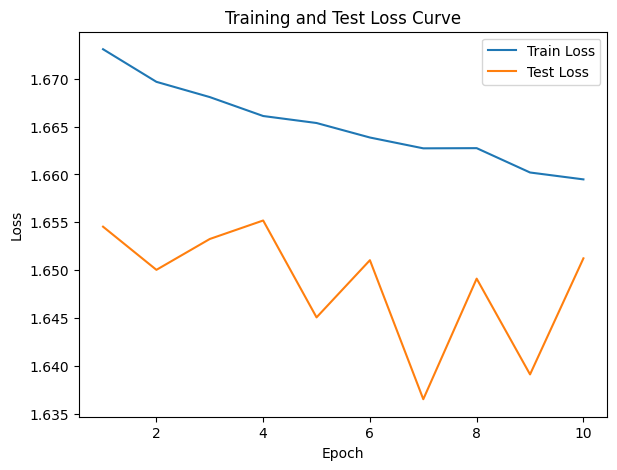

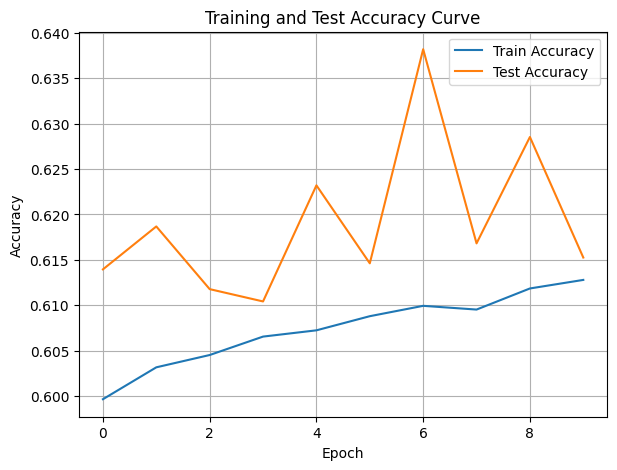

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:36<05:27, 36.36s/it]

Epoch [1/10], Train F1:0.577587728677995, Train Loss: 1.6597, Train Acc: 0.6127, Test F1:0.575169845783562, Test Loss: 1.6443, Test Acc: 0.6231


Training Process:  20%|██        | 2/10 [01:14<05:00, 37.58s/it]

Epoch [2/10], Train F1:0.5781466521952013, Train Loss: 1.6591, Train Acc: 0.6132, Test F1:0.576463768572822, Test Loss: 1.6441, Test Acc: 0.6235


Training Process:  30%|███       | 3/10 [01:54<04:30, 38.63s/it]

Epoch [3/10], Train F1:0.5782794458557216, Train Loss: 1.6590, Train Acc: 0.6133, Test F1:0.5794155067344013, Test Loss: 1.6428, Test Acc: 0.6253


Training Process:  40%|████      | 4/10 [02:36<03:59, 39.85s/it]

Epoch [4/10], Train F1:0.57845267425705, Train Loss: 1.6588, Train Acc: 0.6135, Test F1:0.5782445854334114, Test Loss: 1.6437, Test Acc: 0.6242


Training Process:  50%|█████     | 5/10 [03:18<03:23, 40.63s/it]

Epoch [5/10], Train F1:0.5786512999848756, Train Loss: 1.6586, Train Acc: 0.6137, Test F1:0.5746839463401654, Test Loss: 1.6458, Test Acc: 0.6218


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.23s/it]

Epoch [6/10], Train F1:0.5789794977740679, Train Loss: 1.6583, Train Acc: 0.6141, Test F1:0.5731355095042249, Test Loss: 1.6466, Test Acc: 0.6207


Training Process:  70%|███████   | 7/10 [04:50<02:11, 43.67s/it]

Epoch [7/10], Train F1:0.579270925931434, Train Loss: 1.6579, Train Acc: 0.6144, Test F1:0.5774635495438034, Test Loss: 1.6444, Test Acc: 0.6239


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.49s/it]

Epoch [8/10], Train F1:0.5795549814051317, Train Loss: 1.6577, Train Acc: 0.6147, Test F1:0.5780496117453421, Test Loss: 1.6438, Test Acc: 0.6246


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.75s/it]

Epoch [9/10], Train F1:0.5797312560300614, Train Loss: 1.6575, Train Acc: 0.6148, Test F1:0.5784281781524427, Test Loss: 1.6436, Test Acc: 0.6248


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.88s/it]

Epoch [10/10], Train F1:0.5799510714692854, Train Loss: 1.6572, Train Acc: 0.6150, Test F1:0.5776019809490797, Test Loss: 1.6441, Test Acc: 0.6241
Total Epochs: 10
Train loss start: 1.6683422327041626, Train loss end: 1.6908354759216309
Highest Mean Train Accuracy (over epoch): 0.6150393806060118
Test loss start: 1.626171350479126, Test loss end: 1.6032754182815552
Highest mean Test Accuracy (over epoch): 0.6252839344713657


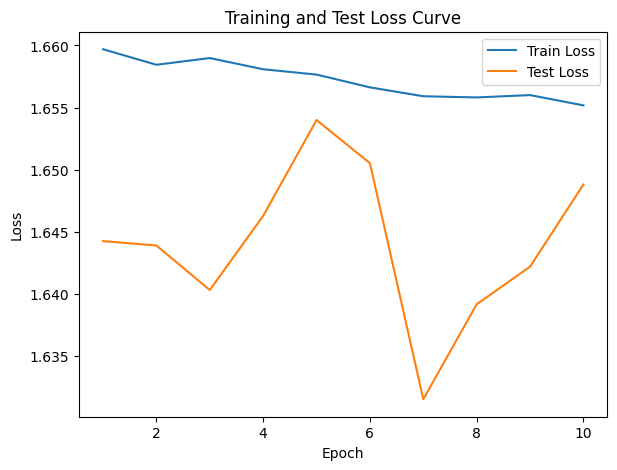

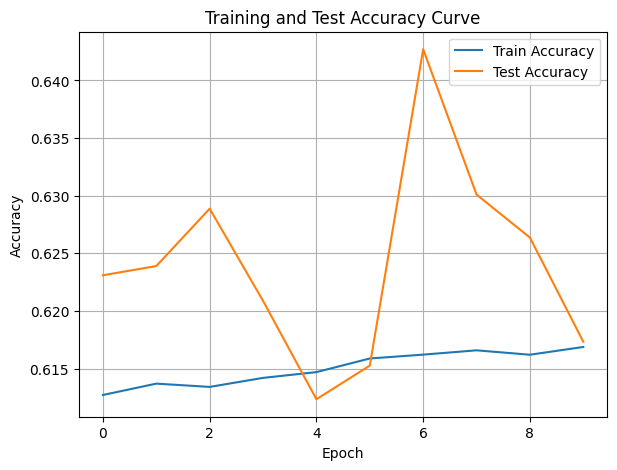

./saved_models/model_8.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.11s/it]

Epoch [1/10], Train F1:0.582491293813712, Train Loss: 1.6548, Train Acc: 0.6175, Test F1:0.5846238295555902, Test Loss: 1.6406, Test Acc: 0.6285


Training Process:  20%|██        | 2/10 [01:16<05:05, 38.24s/it]

Epoch [2/10], Train F1:0.58242269717528, Train Loss: 1.6548, Train Acc: 0.6175, Test F1:0.5890690844772287, Test Loss: 1.6393, Test Acc: 0.6319


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.09s/it]

Epoch [3/10], Train F1:0.5825585184329993, Train Loss: 1.6547, Train Acc: 0.6176, Test F1:0.5782399092775489, Test Loss: 1.6445, Test Acc: 0.6248


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.10s/it]

Epoch [4/10], Train F1:0.5826400451142685, Train Loss: 1.6547, Train Acc: 0.6177, Test F1:0.5849569407859183, Test Loss: 1.6418, Test Acc: 0.6288


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.27s/it]

Epoch [5/10], Train F1:0.5827217118021942, Train Loss: 1.6546, Train Acc: 0.6178, Test F1:0.5857121324724086, Test Loss: 1.6425, Test Acc: 0.6285


Training Process:  60%|██████    | 6/10 [04:04<02:47, 41.94s/it]

Epoch [6/10], Train F1:0.5828111771485514, Train Loss: 1.6545, Train Acc: 0.6179, Test F1:0.5874231050823361, Test Loss: 1.6415, Test Acc: 0.6299


Training Process:  70%|███████   | 7/10 [04:50<02:09, 43.27s/it]

Epoch [7/10], Train F1:0.5830634968577557, Train Loss: 1.6543, Train Acc: 0.6181, Test F1:0.5875630394138468, Test Loss: 1.6410, Test Acc: 0.6302


Training Process:  80%|████████  | 8/10 [05:39<01:29, 44.95s/it]

Epoch [8/10], Train F1:0.5832058581095523, Train Loss: 1.6541, Train Acc: 0.6182, Test F1:0.5860478652840633, Test Loss: 1.6415, Test Acc: 0.6291


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.55s/it]

Epoch [9/10], Train F1:0.583352939632205, Train Loss: 1.6540, Train Acc: 0.6184, Test F1:0.5859055360799101, Test Loss: 1.6411, Test Acc: 0.6293


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.04s/it]

Epoch [10/10], Train F1:0.5834832656706554, Train Loss: 1.6538, Train Acc: 0.6185, Test F1:0.5878603473313936, Test Loss: 1.6402, Test Acc: 0.6305
Total Epochs: 10
Train loss start: 1.6176962852478027, Train loss end: 1.6609632968902588
Highest Mean Train Accuracy (over epoch): 0.6184889772921892
Test loss start: 1.6117613315582275, Test loss end: 1.5902546644210815
Highest mean Test Accuracy (over epoch): 0.6318782575427723


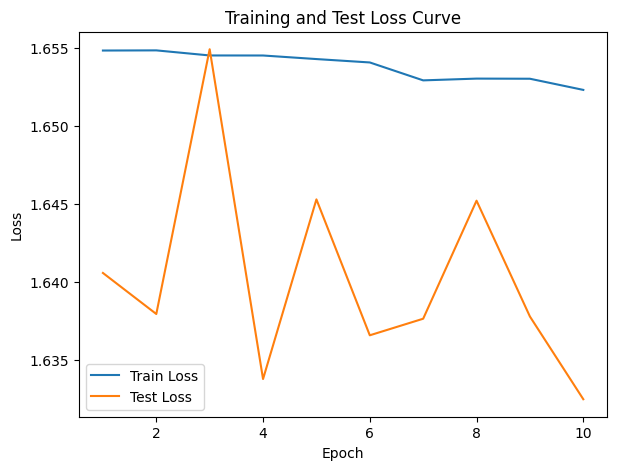

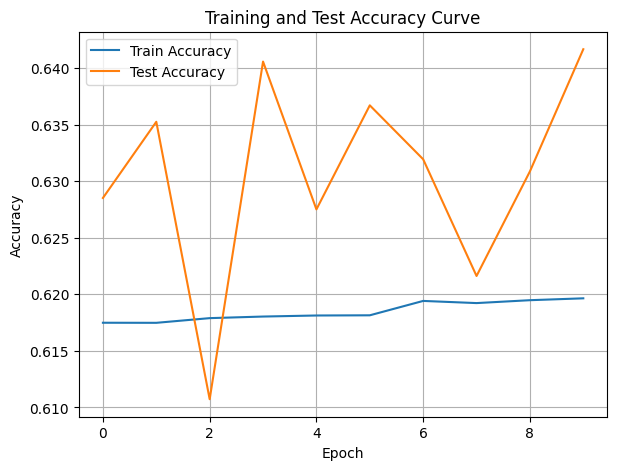

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [7]:
coverDTEmlp4b.train_DTE()

Training Process:   1%|▏         | 1/70 [00:40<47:06, 40.96s/it]

Epoch [1/70], Train F1:0.4073338138211404, Train Loss: 1.9339, Train Acc: 0.4130, Test F1:0.4776186921882808, Test Loss: 1.8209, Test Acc: 0.5533


Training Process:   3%|▎         | 2/70 [01:26<49:08, 43.36s/it]

Epoch [2/70], Train F1:0.4420890094899388, Train Loss: 1.8576, Train Acc: 0.4654, Test F1:0.46029071412958655, Test Loss: 1.7806, Test Acc: 0.5471


Training Process:   4%|▍         | 3/70 [02:09<48:22, 43.32s/it]

Epoch [3/70], Train F1:0.4552806361660042, Train Loss: 1.8183, Train Acc: 0.4895, Test F1:0.4688514155077529, Test Loss: 1.7576, Test Acc: 0.5529


Training Process:   6%|▌         | 4/70 [02:53<48:00, 43.65s/it]

Epoch [4/70], Train F1:0.46483089782525355, Train Loss: 1.7945, Train Acc: 0.5049, Test F1:0.47277986463451677, Test Loss: 1.7455, Test Acc: 0.5558


Training Process:   7%|▋         | 5/70 [03:38<47:47, 44.12s/it]

Epoch [5/70], Train F1:0.4719569979472784, Train Loss: 1.7787, Train Acc: 0.5153, Test F1:0.4803794154861129, Test Loss: 1.7360, Test Acc: 0.5601


Training Process:   9%|▊         | 6/70 [04:25<48:02, 45.04s/it]

Epoch [6/70], Train F1:0.4778786984704707, Train Loss: 1.7671, Train Acc: 0.5233, Test F1:0.4867236858444165, Test Loss: 1.7286, Test Acc: 0.5638


Training Process:  10%|█         | 7/70 [05:14<48:48, 46.49s/it]

Epoch [7/70], Train F1:0.48294679852177386, Train Loss: 1.7580, Train Acc: 0.5298, Test F1:0.4926636023111649, Test Loss: 1.7224, Test Acc: 0.5672


Training Process:  11%|█▏        | 8/70 [06:03<48:45, 47.19s/it]

Epoch [8/70], Train F1:0.48713111545371734, Train Loss: 1.7508, Train Acc: 0.5350, Test F1:0.49626902876866597, Test Loss: 1.7180, Test Acc: 0.5694


Training Process:  13%|█▎        | 9/70 [06:53<48:56, 48.13s/it]

Epoch [9/70], Train F1:0.4907694339526251, Train Loss: 1.7449, Train Acc: 0.5394, Test F1:0.49970583172290883, Test Loss: 1.7141, Test Acc: 0.5716


Training Process:  14%|█▍        | 10/70 [07:48<50:05, 50.09s/it]

Epoch [10/70], Train F1:0.49386687886803765, Train Loss: 1.7399, Train Acc: 0.5430, Test F1:0.5022237796167723, Test Loss: 1.7111, Test Acc: 0.5732


Training Process:  16%|█▌        | 11/70 [08:44<51:07, 51.99s/it]

Epoch [11/70], Train F1:0.49660005272305074, Train Loss: 1.7357, Train Acc: 0.5462, Test F1:0.5047757654940312, Test Loss: 1.7084, Test Acc: 0.5749


Training Process:  17%|█▋        | 12/70 [09:40<51:34, 53.36s/it]

Epoch [12/70], Train F1:0.4990027883256358, Train Loss: 1.7321, Train Acc: 0.5490, Test F1:0.5077706098229877, Test Loss: 1.7057, Test Acc: 0.5769


Training Process:  19%|█▊        | 13/70 [10:39<52:10, 54.92s/it]

Epoch [13/70], Train F1:0.5011045850269381, Train Loss: 1.7289, Train Acc: 0.5515, Test F1:0.50973239496182, Test Loss: 1.7037, Test Acc: 0.5782


Training Process:  20%|██        | 14/70 [11:37<52:12, 55.94s/it]

Epoch [14/70], Train F1:0.5031367416856061, Train Loss: 1.7260, Train Acc: 0.5537, Test F1:0.5122047261472337, Test Loss: 1.7015, Test Acc: 0.5799


Training Process:  21%|██▏       | 15/70 [12:40<53:12, 58.04s/it]

Epoch [15/70], Train F1:0.5053194874448605, Train Loss: 1.7233, Train Acc: 0.5558, Test F1:0.5138180307187645, Test Loss: 1.6999, Test Acc: 0.5809


Training Process:  23%|██▎       | 16/70 [13:44<53:52, 59.86s/it]

Epoch [16/70], Train F1:0.5082909075527035, Train Loss: 1.7207, Train Acc: 0.5580, Test F1:0.5155912065757232, Test Loss: 1.6983, Test Acc: 0.5820


Training Process:  24%|██▍       | 17/70 [14:48<53:56, 61.06s/it]

Epoch [17/70], Train F1:0.5117132550412121, Train Loss: 1.7181, Train Acc: 0.5602, Test F1:0.5182216908678914, Test Loss: 1.6966, Test Acc: 0.5833


Training Process:  26%|██▌       | 18/70 [15:53<54:02, 62.35s/it]

Epoch [18/70], Train F1:0.5152067343734319, Train Loss: 1.7155, Train Acc: 0.5625, Test F1:0.5210033825444466, Test Loss: 1.6946, Test Acc: 0.5847


Training Process:  27%|██▋       | 19/70 [17:00<54:03, 63.61s/it]

Epoch [19/70], Train F1:0.5184832499404669, Train Loss: 1.7131, Train Acc: 0.5646, Test F1:0.5240532274681959, Test Loss: 1.6926, Test Acc: 0.5861


Training Process:  29%|██▊       | 20/70 [18:09<54:22, 65.25s/it]

Epoch [20/70], Train F1:0.5215229353666445, Train Loss: 1.7109, Train Acc: 0.5666, Test F1:0.5279036448813373, Test Loss: 1.6903, Test Acc: 0.5881


Training Process:  30%|███       | 21/70 [19:19<54:21, 66.56s/it]

Epoch [21/70], Train F1:0.5243633201912473, Train Loss: 1.7088, Train Acc: 0.5685, Test F1:0.5309562379156337, Test Loss: 1.6884, Test Acc: 0.5898


Training Process:  31%|███▏      | 22/70 [20:31<54:34, 68.23s/it]

Epoch [22/70], Train F1:0.5269697970865465, Train Loss: 1.7068, Train Acc: 0.5702, Test F1:0.5349764766945, Test Loss: 1.6861, Test Acc: 0.5920


Training Process:  33%|███▎      | 23/70 [21:44<54:37, 69.73s/it]

Epoch [23/70], Train F1:0.529408464557897, Train Loss: 1.7049, Train Acc: 0.5719, Test F1:0.5377114121579342, Test Loss: 1.6844, Test Acc: 0.5935


Training Process:  34%|███▍      | 24/70 [23:02<55:16, 72.09s/it]

Epoch [24/70], Train F1:0.531637266684905, Train Loss: 1.7031, Train Acc: 0.5735, Test F1:0.5391283862754302, Test Loss: 1.6832, Test Acc: 0.5943


Training Process:  36%|███▌      | 25/70 [24:18<55:05, 73.45s/it]

Epoch [25/70], Train F1:0.5336659039601869, Train Loss: 1.7015, Train Acc: 0.5750, Test F1:0.5414740993584682, Test Loss: 1.6816, Test Acc: 0.5956


Training Process:  37%|███▋      | 26/70 [25:38<55:11, 75.26s/it]

Epoch [26/70], Train F1:0.5355745996908331, Train Loss: 1.7000, Train Acc: 0.5764, Test F1:0.5438417692512317, Test Loss: 1.6800, Test Acc: 0.5971


Training Process:  39%|███▊      | 27/70 [26:58<55:05, 76.88s/it]

Epoch [27/70], Train F1:0.5373847852235283, Train Loss: 1.6985, Train Acc: 0.5777, Test F1:0.5459938436879873, Test Loss: 1.6785, Test Acc: 0.5985


Training Process:  40%|████      | 28/70 [28:20<54:48, 78.31s/it]

Epoch [28/70], Train F1:0.5390302051872317, Train Loss: 1.6971, Train Acc: 0.5789, Test F1:0.5482542994142272, Test Loss: 1.6769, Test Acc: 0.5999


Training Process:  41%|████▏     | 29/70 [29:44<54:36, 79.90s/it]

Epoch [29/70], Train F1:0.5406061523776491, Train Loss: 1.6958, Train Acc: 0.5801, Test F1:0.5501469524138544, Test Loss: 1.6756, Test Acc: 0.6011


Training Process:  43%|████▎     | 30/70 [31:08<54:09, 81.23s/it]

Epoch [30/70], Train F1:0.5421060618048641, Train Loss: 1.6945, Train Acc: 0.5813, Test F1:0.552120918657427, Test Loss: 1.6741, Test Acc: 0.6024


Training Process:  44%|████▍     | 31/70 [32:35<54:01, 83.12s/it]

Epoch [31/70], Train F1:0.5434725001866701, Train Loss: 1.6933, Train Acc: 0.5824, Test F1:0.5535782084337116, Test Loss: 1.6730, Test Acc: 0.6034


Training Process:  46%|████▌     | 32/70 [34:03<53:31, 84.52s/it]

Epoch [32/70], Train F1:0.5448096717597238, Train Loss: 1.6922, Train Acc: 0.5834, Test F1:0.5545212952163514, Test Loss: 1.6721, Test Acc: 0.6040


Training Process:  47%|████▋     | 33/70 [35:35<53:23, 86.58s/it]

Epoch [33/70], Train F1:0.5460111565807122, Train Loss: 1.6911, Train Acc: 0.5844, Test F1:0.5553670940353819, Test Loss: 1.6713, Test Acc: 0.6046


Training Process:  49%|████▊     | 34/70 [37:09<53:17, 88.83s/it]

Epoch [34/70], Train F1:0.5471696902091338, Train Loss: 1.6901, Train Acc: 0.5853, Test F1:0.5557956798971069, Test Loss: 1.6707, Test Acc: 0.6050


Training Process:  50%|█████     | 35/70 [38:41<52:27, 89.93s/it]

Epoch [35/70], Train F1:0.5482550309716272, Train Loss: 1.6891, Train Acc: 0.5862, Test F1:0.557083790479722, Test Loss: 1.6698, Test Acc: 0.6059


Training Process:  51%|█████▏    | 36/70 [40:19<52:17, 92.27s/it]

Epoch [36/70], Train F1:0.5492811415185538, Train Loss: 1.6882, Train Acc: 0.5870, Test F1:0.5583478561177844, Test Loss: 1.6688, Test Acc: 0.6068


Training Process:  53%|█████▎    | 37/70 [41:58<51:48, 94.20s/it]

Epoch [37/70], Train F1:0.5502693497269597, Train Loss: 1.6873, Train Acc: 0.5879, Test F1:0.5594751003713092, Test Loss: 1.6679, Test Acc: 0.6076


Training Process:  54%|█████▍    | 38/70 [43:36<50:58, 95.56s/it]

Epoch [38/70], Train F1:0.5512027023378617, Train Loss: 1.6864, Train Acc: 0.5886, Test F1:0.5603492829045101, Test Loss: 1.6672, Test Acc: 0.6082


Training Process:  56%|█████▌    | 39/70 [45:18<50:14, 97.26s/it]

Epoch [39/70], Train F1:0.552093474684078, Train Loss: 1.6856, Train Acc: 0.5894, Test F1:0.5614996646205669, Test Loss: 1.6663, Test Acc: 0.6091


Training Process:  57%|█████▋    | 40/70 [47:00<49:27, 98.92s/it]

Epoch [40/70], Train F1:0.5529328207178772, Train Loss: 1.6848, Train Acc: 0.5901, Test F1:0.5627213006811389, Test Loss: 1.6654, Test Acc: 0.6099


Training Process:  59%|█████▊    | 41/70 [48:44<48:28, 100.31s/it]

Epoch [41/70], Train F1:0.553716917989395, Train Loss: 1.6841, Train Acc: 0.5907, Test F1:0.5638095112524873, Test Loss: 1.6645, Test Acc: 0.6107


Training Process:  60%|██████    | 42/70 [50:29<47:29, 101.78s/it]

Epoch [42/70], Train F1:0.5544887292474319, Train Loss: 1.6834, Train Acc: 0.5914, Test F1:0.5645458806375511, Test Loss: 1.6639, Test Acc: 0.6113


Training Process:  61%|██████▏   | 43/70 [52:18<46:41, 103.77s/it]

Epoch [43/70], Train F1:0.5552219806540758, Train Loss: 1.6827, Train Acc: 0.5920, Test F1:0.56542544472206, Test Loss: 1.6632, Test Acc: 0.6119


Training Process:  63%|██████▎   | 44/70 [54:07<45:39, 105.35s/it]

Epoch [44/70], Train F1:0.5559141449095799, Train Loss: 1.6821, Train Acc: 0.5926, Test F1:0.5654879995124373, Test Loss: 1.6629, Test Acc: 0.6120


Training Process:  64%|██████▍   | 45/70 [55:57<44:35, 107.02s/it]

Epoch [45/70], Train F1:0.5565720028906672, Train Loss: 1.6814, Train Acc: 0.5932, Test F1:0.5661248893047257, Test Loss: 1.6624, Test Acc: 0.6125


Training Process:  66%|██████▌   | 46/70 [57:51<43:32, 108.84s/it]

Epoch [46/70], Train F1:0.5572153125216445, Train Loss: 1.6808, Train Acc: 0.5938, Test F1:0.5664294043774838, Test Loss: 1.6620, Test Acc: 0.6128


Training Process:  67%|██████▋   | 47/70 [59:45<42:23, 110.57s/it]

Epoch [47/70], Train F1:0.5578337008913794, Train Loss: 1.6802, Train Acc: 0.5943, Test F1:0.5671986958407538, Test Loss: 1.6614, Test Acc: 0.6133


Training Process:  69%|██████▊   | 48/70 [1:01:42<41:15, 112.53s/it]

Epoch [48/70], Train F1:0.558421804402006, Train Loss: 1.6797, Train Acc: 0.5948, Test F1:0.5680689376504969, Test Loss: 1.6607, Test Acc: 0.6140


Training Process:  70%|███████   | 49/70 [1:03:39<39:51, 113.89s/it]

Epoch [49/70], Train F1:0.5589856296156902, Train Loss: 1.6791, Train Acc: 0.5953, Test F1:0.5679452816592104, Test Loss: 1.6606, Test Acc: 0.6139


Training Process:  71%|███████▏  | 50/70 [1:05:38<38:27, 115.36s/it]

Epoch [50/70], Train F1:0.559533596733458, Train Loss: 1.6786, Train Acc: 0.5958, Test F1:0.5681447620254033, Test Loss: 1.6602, Test Acc: 0.6141


Training Process:  73%|███████▎  | 51/70 [1:07:38<37:00, 116.84s/it]

Epoch [51/70], Train F1:0.560066177930283, Train Loss: 1.6781, Train Acc: 0.5963, Test F1:0.5687497600708337, Test Loss: 1.6598, Test Acc: 0.6146


Training Process:  74%|███████▍  | 52/70 [1:09:40<35:31, 118.41s/it]

Epoch [52/70], Train F1:0.5605819928857713, Train Loss: 1.6776, Train Acc: 0.5967, Test F1:0.5690585362134819, Test Loss: 1.6595, Test Acc: 0.6148


Training Process:  76%|███████▌  | 53/70 [1:11:49<34:26, 121.57s/it]

Epoch [53/70], Train F1:0.561062373757036, Train Loss: 1.6771, Train Acc: 0.5972, Test F1:0.5697223202025511, Test Loss: 1.6590, Test Acc: 0.6153


Training Process:  77%|███████▋  | 54/70 [1:13:54<32:41, 122.59s/it]

Epoch [54/70], Train F1:0.5615367188438087, Train Loss: 1.6766, Train Acc: 0.5976, Test F1:0.5703354847900172, Test Loss: 1.6585, Test Acc: 0.6158


Training Process:  79%|███████▊  | 55/70 [1:16:02<31:03, 124.20s/it]

Epoch [55/70], Train F1:0.5619966627749226, Train Loss: 1.6762, Train Acc: 0.5980, Test F1:0.5703048277123287, Test Loss: 1.6583, Test Acc: 0.6158


Training Process:  80%|████████  | 56/70 [1:18:10<29:12, 125.20s/it]

Epoch [56/70], Train F1:0.5624348516171468, Train Loss: 1.6758, Train Acc: 0.5984, Test F1:0.5705364632869013, Test Loss: 1.6581, Test Acc: 0.6160


Training Process:  81%|████████▏ | 57/70 [1:20:22<27:34, 127.25s/it]

Epoch [57/70], Train F1:0.5628890806992443, Train Loss: 1.6753, Train Acc: 0.5988, Test F1:0.5708728272996817, Test Loss: 1.6577, Test Acc: 0.6163


Training Process:  83%|████████▎ | 58/70 [1:22:34<25:43, 128.64s/it]

Epoch [58/70], Train F1:0.5633140254549193, Train Loss: 1.6749, Train Acc: 0.5992, Test F1:0.5710594036388303, Test Loss: 1.6575, Test Acc: 0.6164


Training Process:  84%|████████▍ | 59/70 [1:24:48<23:54, 130.41s/it]

Epoch [59/70], Train F1:0.5637189774997375, Train Loss: 1.6745, Train Acc: 0.5996, Test F1:0.5714954436841182, Test Loss: 1.6572, Test Acc: 0.6168


Training Process:  86%|████████▌ | 60/70 [1:27:03<21:57, 131.71s/it]

Epoch [60/70], Train F1:0.5641085109234238, Train Loss: 1.6741, Train Acc: 0.5999, Test F1:0.5720774043854712, Test Loss: 1.6567, Test Acc: 0.6172


Training Process:  87%|████████▋ | 61/70 [1:29:20<20:00, 133.35s/it]

Epoch [61/70], Train F1:0.5644868595024447, Train Loss: 1.6738, Train Acc: 0.6003, Test F1:0.5726932890617663, Test Loss: 1.6563, Test Acc: 0.6177


Training Process:  89%|████████▊ | 62/70 [1:31:38<17:57, 134.67s/it]

Epoch [62/70], Train F1:0.5648659389653377, Train Loss: 1.6734, Train Acc: 0.6006, Test F1:0.573090030353886, Test Loss: 1.6559, Test Acc: 0.6180


Training Process:  90%|█████████ | 63/70 [1:33:58<15:54, 136.31s/it]

Epoch [63/70], Train F1:0.5652129995240367, Train Loss: 1.6730, Train Acc: 0.6009, Test F1:0.5733946125830587, Test Loss: 1.6557, Test Acc: 0.6182


Training Process:  91%|█████████▏| 64/70 [1:36:19<13:46, 137.73s/it]

Epoch [64/70], Train F1:0.565549015483901, Train Loss: 1.6727, Train Acc: 0.6012, Test F1:0.5739402431581859, Test Loss: 1.6553, Test Acc: 0.6187


Training Process:  93%|█████████▎| 65/70 [1:38:43<11:37, 139.54s/it]

Epoch [65/70], Train F1:0.565898414619797, Train Loss: 1.6724, Train Acc: 0.6016, Test F1:0.574414271029739, Test Loss: 1.6549, Test Acc: 0.6190


Training Process:  94%|█████████▍| 66/70 [1:41:10<09:26, 141.65s/it]

Epoch [66/70], Train F1:0.5662286627230282, Train Loss: 1.6720, Train Acc: 0.6019, Test F1:0.5743989403901566, Test Loss: 1.6548, Test Acc: 0.6191


Training Process:  96%|█████████▌| 67/70 [1:43:36<07:08, 142.97s/it]

Epoch [67/70], Train F1:0.5665689064142874, Train Loss: 1.6717, Train Acc: 0.6022, Test F1:0.5745990856267718, Test Loss: 1.6546, Test Acc: 0.6192


Training Process:  97%|█████████▋| 68/70 [1:46:03<04:48, 144.38s/it]

Epoch [68/70], Train F1:0.5668777625013368, Train Loss: 1.6714, Train Acc: 0.6025, Test F1:0.5748930324140386, Test Loss: 1.6543, Test Acc: 0.6195


Training Process:  99%|█████████▊| 69/70 [1:48:35<02:26, 146.62s/it]

Epoch [69/70], Train F1:0.5671839734281554, Train Loss: 1.6711, Train Acc: 0.6027, Test F1:0.5754075723540322, Test Loss: 1.6539, Test Acc: 0.6198


Training Process: 100%|██████████| 70/70 [1:51:08<00:00, 95.27s/it] 


Epoch [70/70], Train F1:0.5674786784653967, Train Loss: 1.6708, Train Acc: 0.6030, Test F1:0.5755120408710307, Test Loss: 1.6538, Test Acc: 0.6199
Total Epochs: 70
Train loss start: 2.057312488555908, Train loss end: 1.6335824728012085
Highest Mean Train Accuracy (over epoch): 0.6030045585987595
Test loss start: 1.78793203830719, Test loss end: 1.594138741493225
Highest Mean Test Accuracy (over epoch): 0.6199152490047858


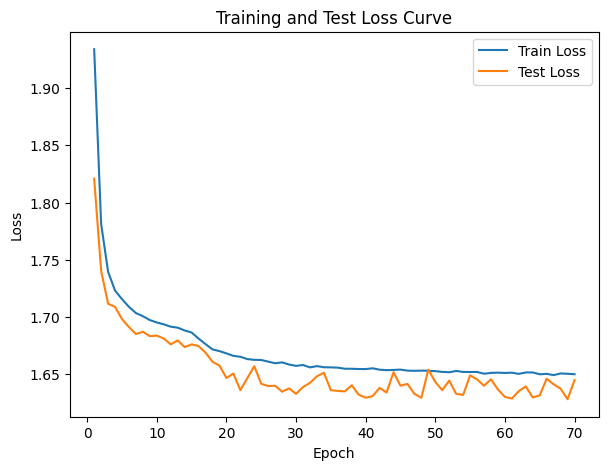

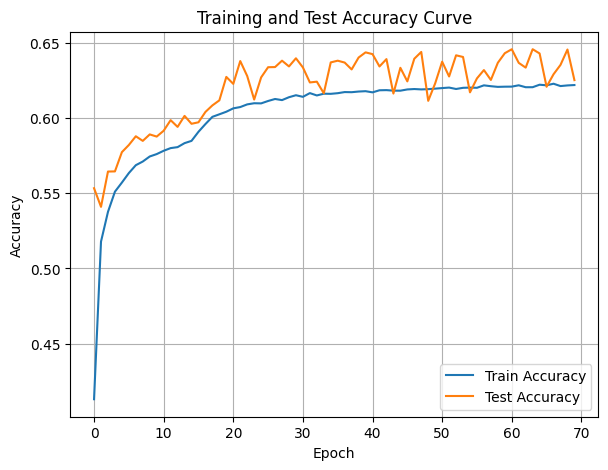

In [8]:
coverDTEmlp4b.train_single_model()

Randomly initializing 4 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:36<05:30, 36.68s/it]

Epoch [1/10], Train F1:0.34375721542515286, Train Loss: 1.9319, Train Acc: 0.4259, Test F1:0.35480553953191835, Test Loss: 1.8128, Test Acc: 0.4985


Training Process:  20%|██        | 2/10 [01:14<04:59, 37.41s/it]

Epoch [2/10], Train F1:0.3796716242296932, Train Loss: 1.8569, Train Acc: 0.4689, Test F1:0.36517089388791696, Test Loss: 1.7846, Test Acc: 0.5028


Training Process:  30%|███       | 3/10 [01:54<04:28, 38.35s/it]

Epoch [3/10], Train F1:0.41358948519051325, Train Loss: 1.8177, Train Acc: 0.4916, Test F1:0.3971162445421637, Test Loss: 1.7635, Test Acc: 0.5168


Training Process:  40%|████      | 4/10 [02:34<03:54, 39.04s/it]

Epoch [4/10], Train F1:0.4410660916152379, Train Loss: 1.7927, Train Acc: 0.5081, Test F1:0.42791702590533875, Test Loss: 1.7475, Test Acc: 0.5311


Training Process:  50%|█████     | 5/10 [03:17<03:22, 40.59s/it]

Epoch [5/10], Train F1:0.4610582436669076, Train Loss: 1.7750, Train Acc: 0.5204, Test F1:0.44689866912237197, Test Loss: 1.7347, Test Acc: 0.5408


Training Process:  60%|██████    | 6/10 [04:00<02:46, 41.54s/it]

Epoch [6/10], Train F1:0.47610667060915446, Train Loss: 1.7616, Train Acc: 0.5302, Test F1:0.46008584925002005, Test Loss: 1.7249, Test Acc: 0.5479


Training Process:  70%|███████   | 7/10 [04:47<02:09, 43.26s/it]

Epoch [7/10], Train F1:0.48757858625253125, Train Loss: 1.7512, Train Acc: 0.5380, Test F1:0.4700256271481393, Test Loss: 1.7173, Test Acc: 0.5534


Training Process:  80%|████████  | 8/10 [05:35<01:29, 44.68s/it]

Epoch [8/10], Train F1:0.4967867915350234, Train Loss: 1.7426, Train Acc: 0.5446, Test F1:0.4724732273985358, Test Loss: 1.7162, Test Acc: 0.5549


Training Process:  90%|█████████ | 9/10 [06:24<00:46, 46.08s/it]

Epoch [9/10], Train F1:0.5041859039214377, Train Loss: 1.7356, Train Acc: 0.5501, Test F1:0.48659448005569145, Test Loss: 1.7089, Test Acc: 0.5625


Training Process: 100%|██████████| 10/10 [07:15<00:00, 43.52s/it]

Epoch [10/10], Train F1:0.5103554642697095, Train Loss: 1.7296, Train Acc: 0.5548, Test F1:0.4966465193718385, Test Loss: 1.7033, Test Acc: 0.5682
Total Epochs: 10
Train loss start: 2.082113265991211, Train loss end: 1.6798715591430664
Highest Mean Train Accuracy (over epoch): 0.5547803738376603
Test loss start: 1.8192321062088013, Test loss end: 1.6288412809371948
Highest mean Test Accuracy (over epoch): 0.5681872734927262


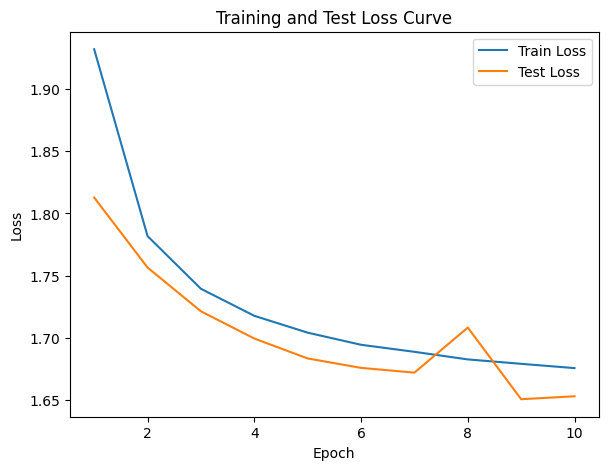

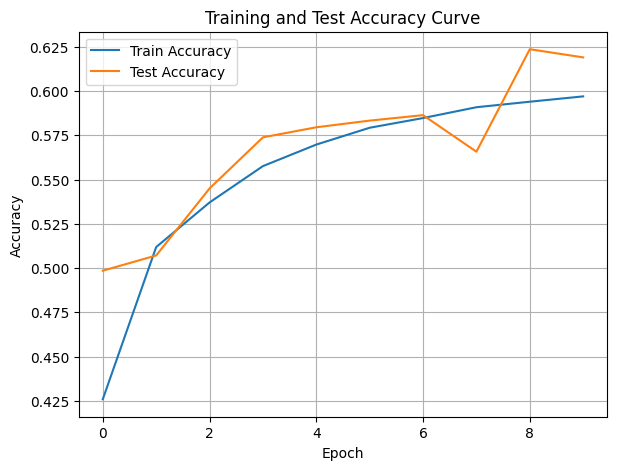

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:37<05:40, 37.79s/it]

Epoch [1/10], Train F1:0.33021508625355606, Train Loss: 2.0021, Train Acc: 0.3038, Test F1:0.35460960263421587, Test Loss: 1.8283, Test Acc: 0.4912


Training Process:  20%|██        | 2/10 [01:14<04:58, 37.30s/it]

Epoch [2/10], Train F1:0.4078635783895254, Train Loss: 1.8995, Train Acc: 0.4120, Test F1:0.3821051663380978, Test Loss: 1.7889, Test Acc: 0.5037


Training Process:  30%|███       | 3/10 [01:54<04:29, 38.44s/it]

Epoch [3/10], Train F1:0.44151918086236935, Train Loss: 1.8448, Train Acc: 0.4573, Test F1:0.4076467235328269, Test Loss: 1.7666, Test Acc: 0.5168


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.80s/it]

Epoch [4/10], Train F1:0.46362094716651187, Train Loss: 1.8118, Train Acc: 0.4841, Test F1:0.4413254281024411, Test Loss: 1.7476, Test Acc: 0.5342


Training Process:  50%|█████     | 5/10 [03:18<03:22, 40.50s/it]

Epoch [5/10], Train F1:0.47944250119246595, Train Loss: 1.7894, Train Acc: 0.5023, Test F1:0.465623507717664, Test Loss: 1.7342, Test Acc: 0.5465


Training Process:  60%|██████    | 6/10 [04:02<02:46, 41.73s/it]

Epoch [6/10], Train F1:0.4910974176655724, Train Loss: 1.7732, Train Acc: 0.5156, Test F1:0.48281083141129294, Test Loss: 1.7241, Test Acc: 0.5560


Training Process:  70%|███████   | 7/10 [04:48<02:09, 43.18s/it]

Epoch [7/10], Train F1:0.5001116100693811, Train Loss: 1.7608, Train Acc: 0.5258, Test F1:0.49840395989702757, Test Loss: 1.7144, Test Acc: 0.5649


Training Process:  80%|████████  | 8/10 [05:36<01:29, 44.70s/it]

Epoch [8/10], Train F1:0.5073914461691904, Train Loss: 1.7510, Train Acc: 0.5340, Test F1:0.5072861755181148, Test Loss: 1.7084, Test Acc: 0.5704


Training Process:  90%|█████████ | 9/10 [06:25<00:46, 46.11s/it]

Epoch [9/10], Train F1:0.5133270129961738, Train Loss: 1.7429, Train Acc: 0.5407, Test F1:0.5136797925552409, Test Loss: 1.7035, Test Acc: 0.5747


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.66s/it]

Epoch [10/10], Train F1:0.5183889250973891, Train Loss: 1.7362, Train Acc: 0.5463, Test F1:0.5202048634937092, Test Loss: 1.6985, Test Acc: 0.5792
Total Epochs: 10
Train loss start: 2.12992525100708, Train loss end: 1.6780458688735962
Highest Mean Train Accuracy (over epoch): 0.5463491661713394
Test loss start: 1.8173556327819824, Test loss end: 1.65361750125885
Highest mean Test Accuracy (over epoch): 0.579192005333726


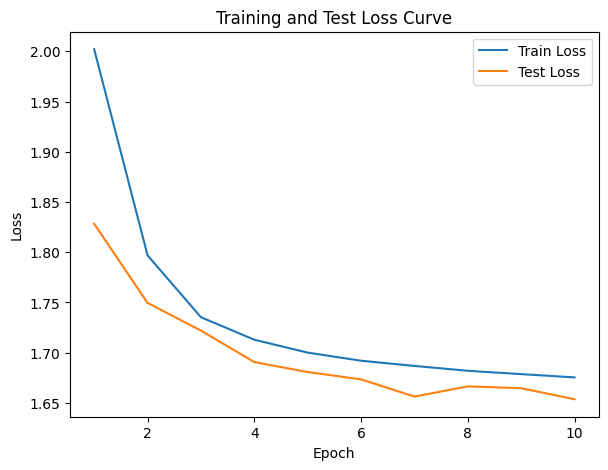

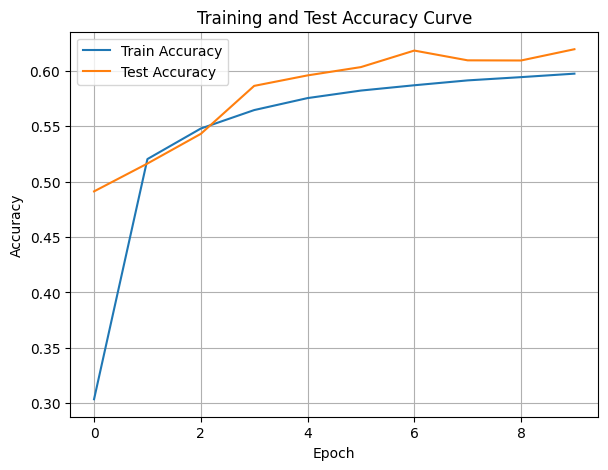

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.84s/it]

Epoch [1/10], Train F1:0.35217645338213655, Train Loss: 1.9898, Train Acc: 0.3106, Test F1:0.36611827871718094, Test Loss: 1.8403, Test Acc: 0.4957


Training Process:  20%|██        | 2/10 [01:14<05:00, 37.52s/it]

Epoch [2/10], Train F1:0.4162276399081677, Train Loss: 1.8935, Train Acc: 0.4130, Test F1:0.39295377313358526, Test Loss: 1.7946, Test Acc: 0.5103


Training Process:  30%|███       | 3/10 [01:54<04:28, 38.41s/it]

Epoch [3/10], Train F1:0.4401887906176129, Train Loss: 1.8432, Train Acc: 0.4544, Test F1:0.4149646783435984, Test Loss: 1.7713, Test Acc: 0.5231


Training Process:  40%|████      | 4/10 [02:35<03:57, 39.64s/it]

Epoch [4/10], Train F1:0.4584229582222662, Train Loss: 1.8123, Train Acc: 0.4799, Test F1:0.4369468354146735, Test Loss: 1.7528, Test Acc: 0.5352


Training Process:  50%|█████     | 5/10 [03:19<03:25, 41.01s/it]

Epoch [5/10], Train F1:0.47337134640663914, Train Loss: 1.7907, Train Acc: 0.4980, Test F1:0.45550838530996757, Test Loss: 1.7390, Test Acc: 0.5452


Training Process:  60%|██████    | 6/10 [04:02<02:46, 41.68s/it]

Epoch [6/10], Train F1:0.4853302699326047, Train Loss: 1.7748, Train Acc: 0.5115, Test F1:0.47167833615240723, Test Loss: 1.7280, Test Acc: 0.5539


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.66s/it]

Epoch [7/10], Train F1:0.4949296366339551, Train Loss: 1.7623, Train Acc: 0.5222, Test F1:0.48174217181770496, Test Loss: 1.7198, Test Acc: 0.5597


Training Process:  80%|████████  | 8/10 [05:37<01:29, 45.00s/it]

Epoch [8/10], Train F1:0.5028156580918733, Train Loss: 1.7524, Train Acc: 0.5308, Test F1:0.4903730239525229, Test Loss: 1.7133, Test Acc: 0.5646


Training Process:  90%|█████████ | 9/10 [06:26<00:46, 46.21s/it]

Epoch [9/10], Train F1:0.5094066981416032, Train Loss: 1.7441, Train Acc: 0.5379, Test F1:0.4975116165606214, Test Loss: 1.7078, Test Acc: 0.5687


Training Process: 100%|██████████| 10/10 [07:17<00:00, 43.79s/it]


Epoch [10/10], Train F1:0.5149976828515119, Train Loss: 1.7372, Train Acc: 0.5439, Test F1:0.5040101599509982, Test Loss: 1.7031, Test Acc: 0.5724
Total Epochs: 10
Train loss start: 2.12615704536438, Train loss end: 1.7231601476669312
Highest Mean Train Accuracy (over epoch): 0.5439276251498574
Test loss start: 1.8211359977722168, Test loss end: 1.6085994243621826
Highest mean Test Accuracy (over epoch): 0.5724392872464399


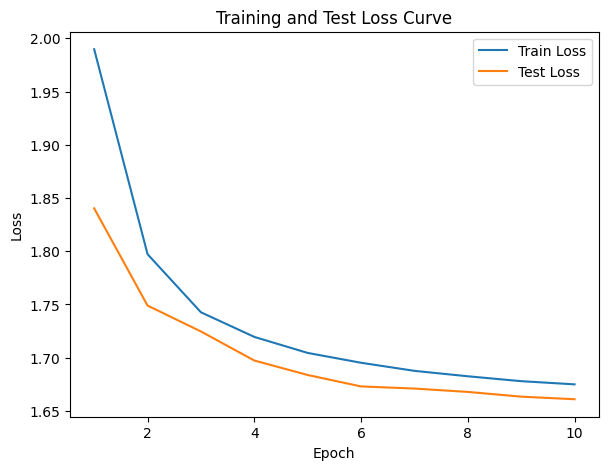

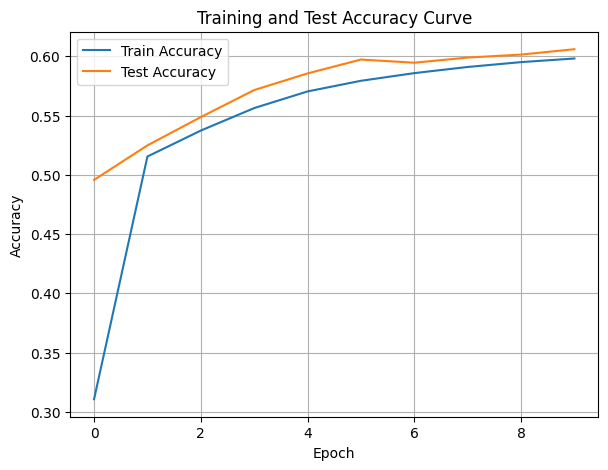

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.41s/it]

Epoch [1/10], Train F1:0.39343779075355423, Train Loss: 1.9362, Train Acc: 0.4225, Test F1:0.4532253158505824, Test Loss: 1.8095, Test Acc: 0.5408


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.87s/it]

Epoch [2/10], Train F1:0.42072154795026595, Train Loss: 1.8580, Train Acc: 0.4695, Test F1:0.4659307781465454, Test Loss: 1.7693, Test Acc: 0.5496


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.93s/it]

Epoch [3/10], Train F1:0.44111737279495056, Train Loss: 1.8181, Train Acc: 0.4925, Test F1:0.480268909372126, Test Loss: 1.7456, Test Acc: 0.5576


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.11s/it]

Epoch [4/10], Train F1:0.45827546085044896, Train Loss: 1.7936, Train Acc: 0.5077, Test F1:0.4890171630894405, Test Loss: 1.7310, Test Acc: 0.5627


Training Process:  50%|█████     | 5/10 [03:19<03:22, 40.56s/it]

Epoch [5/10], Train F1:0.472482570141563, Train Loss: 1.7762, Train Acc: 0.5196, Test F1:0.5059776120909221, Test Loss: 1.7181, Test Acc: 0.5721


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.81s/it]

Epoch [6/10], Train F1:0.4841028560258791, Train Loss: 1.7631, Train Acc: 0.5290, Test F1:0.520422946374182, Test Loss: 1.7081, Test Acc: 0.5803


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.22s/it]

Epoch [7/10], Train F1:0.49335995271308275, Train Loss: 1.7527, Train Acc: 0.5367, Test F1:0.5297821484024434, Test Loss: 1.7002, Test Acc: 0.5862


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.90s/it]

Epoch [8/10], Train F1:0.5010896035047941, Train Loss: 1.7442, Train Acc: 0.5431, Test F1:0.538041902855835, Test Loss: 1.6934, Test Acc: 0.5915


Training Process:  90%|█████████ | 9/10 [06:25<00:45, 45.78s/it]

Epoch [9/10], Train F1:0.5073557987523197, Train Loss: 1.7373, Train Acc: 0.5484, Test F1:0.5453033717805537, Test Loss: 1.6878, Test Acc: 0.5962


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.84s/it]


Epoch [10/10], Train F1:0.5128161158670623, Train Loss: 1.7313, Train Acc: 0.5530, Test F1:0.5517968168046636, Test Loss: 1.6828, Test Acc: 0.6005
Total Epochs: 10
Train loss start: 2.078974485397339, Train loss end: 1.6340019702911377
Highest Mean Train Accuracy (over epoch): 0.553038149844014
Test loss start: 1.7983957529067993, Test loss end: 1.626613736152649
Highest mean Test Accuracy (over epoch): 0.6005390753060651


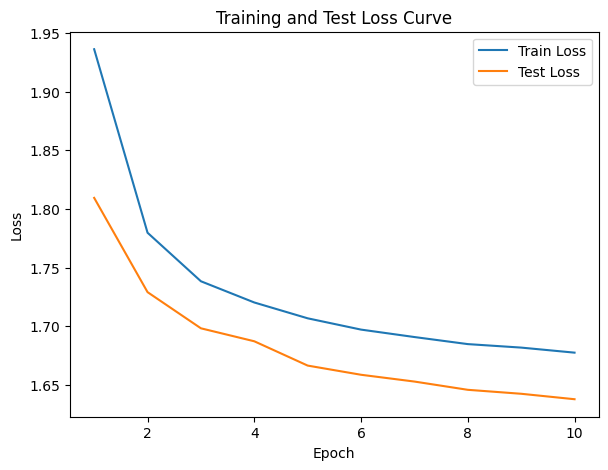

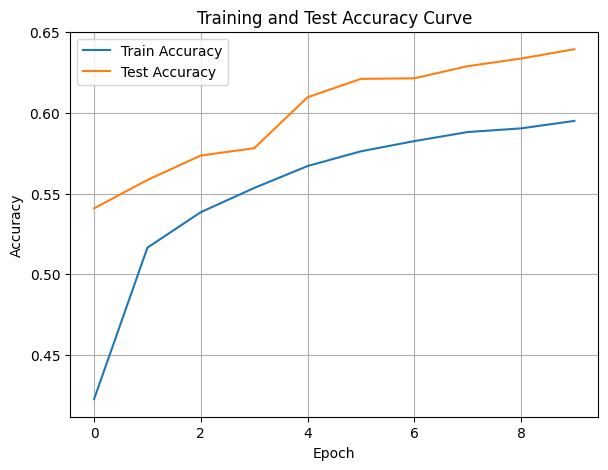

./saved_models/model_4.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:35<05:15, 35.03s/it]

Epoch [1/10], Train F1:0.560540767831874, Train Loss: 1.6758, Train Acc: 0.5963, Test F1:0.5989024267543396, Test Loss: 1.6392, Test Acc: 0.6364


Training Process:  20%|██        | 2/10 [01:12<04:52, 36.53s/it]

Epoch [2/10], Train F1:0.5619860173314611, Train Loss: 1.6744, Train Acc: 0.5977, Test F1:0.6006970082535599, Test Loss: 1.6380, Test Acc: 0.6379


Training Process:  30%|███       | 3/10 [01:52<04:25, 37.96s/it]

Epoch [3/10], Train F1:0.5636098606137921, Train Loss: 1.6729, Train Acc: 0.5993, Test F1:0.598262866443264, Test Loss: 1.6388, Test Acc: 0.6363


Training Process:  40%|████      | 4/10 [02:32<03:53, 38.97s/it]

Epoch [4/10], Train F1:0.5648883771274573, Train Loss: 1.6717, Train Acc: 0.6005, Test F1:0.5974730187368513, Test Loss: 1.6388, Test Acc: 0.6359


Training Process:  50%|█████     | 5/10 [03:15<03:22, 40.45s/it]

Epoch [5/10], Train F1:0.5657906154564915, Train Loss: 1.6709, Train Acc: 0.6014, Test F1:0.597610338314702, Test Loss: 1.6384, Test Acc: 0.6362


Training Process:  60%|██████    | 6/10 [04:00<02:48, 42.00s/it]

Epoch [6/10], Train F1:0.5664544169110821, Train Loss: 1.6703, Train Acc: 0.6020, Test F1:0.6001617323313557, Test Loss: 1.6367, Test Acc: 0.6382


Training Process:  70%|███████   | 7/10 [04:46<02:09, 43.20s/it]

Epoch [7/10], Train F1:0.5672562872519863, Train Loss: 1.6695, Train Acc: 0.6027, Test F1:0.6013716925256758, Test Loss: 1.6357, Test Acc: 0.6391


Training Process:  80%|████████  | 8/10 [05:34<01:29, 44.59s/it]

Epoch [8/10], Train F1:0.5678082816160926, Train Loss: 1.6689, Train Acc: 0.6033, Test F1:0.6014071598615734, Test Loss: 1.6355, Test Acc: 0.6391


Training Process:  90%|█████████ | 9/10 [06:22<00:45, 45.66s/it]

Epoch [9/10], Train F1:0.5684781509948565, Train Loss: 1.6683, Train Acc: 0.6039, Test F1:0.6020604145774638, Test Loss: 1.6349, Test Acc: 0.6397


Training Process: 100%|██████████| 10/10 [07:13<00:00, 43.34s/it]

Epoch [10/10], Train F1:0.5690501614737187, Train Loss: 1.6677, Train Acc: 0.6045, Test F1:0.6022053210304137, Test Loss: 1.6346, Test Acc: 0.6400
Total Epochs: 10
Train loss start: 1.6412758827209473, Train loss end: 1.6563807725906372
Highest Mean Train Accuracy (over epoch): 0.6044695822965045
Test loss start: 1.5885107517242432, Test loss end: 1.6208608150482178
Highest mean Test Accuracy (over epoch): 0.6399867777379368


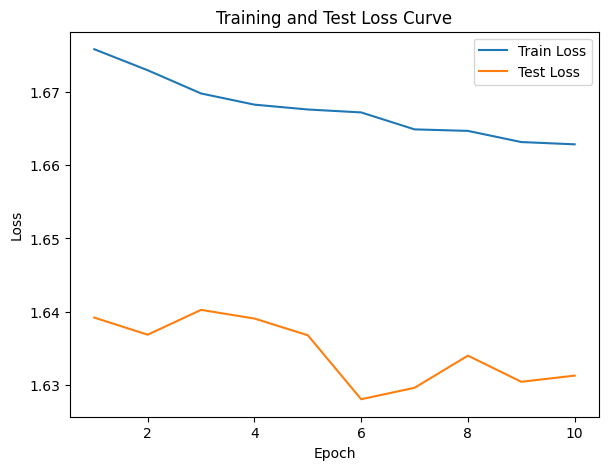

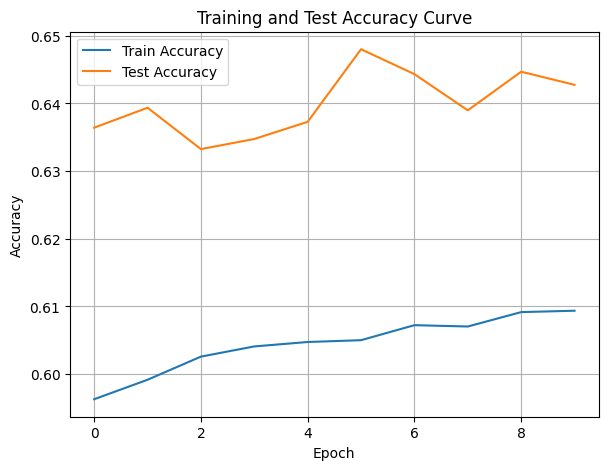

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.40s/it]

Epoch [1/10], Train F1:0.5753719063376802, Train Loss: 1.6616, Train Acc: 0.6105, Test F1:0.6021866914998574, Test Loss: 1.6334, Test Acc: 0.6409


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.79s/it]

Epoch [2/10], Train F1:0.5759142245396057, Train Loss: 1.6610, Train Acc: 0.6111, Test F1:0.6043651075757234, Test Loss: 1.6327, Test Acc: 0.6425


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.76s/it]

Epoch [3/10], Train F1:0.5760963003318974, Train Loss: 1.6608, Train Acc: 0.6113, Test F1:0.6043102594467981, Test Loss: 1.6326, Test Acc: 0.6426


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.07s/it]

Epoch [4/10], Train F1:0.5763060972504042, Train Loss: 1.6606, Train Acc: 0.6115, Test F1:0.6041940486293732, Test Loss: 1.6328, Test Acc: 0.6425


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.61s/it]

Epoch [5/10], Train F1:0.576610650582884, Train Loss: 1.6603, Train Acc: 0.6118, Test F1:0.6055515215038199, Test Loss: 1.6316, Test Acc: 0.6435


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.82s/it]

Epoch [6/10], Train F1:0.5769454571277957, Train Loss: 1.6600, Train Acc: 0.6121, Test F1:0.6055599787832123, Test Loss: 1.6317, Test Acc: 0.6436


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.21s/it]

Epoch [7/10], Train F1:0.577326568366768, Train Loss: 1.6597, Train Acc: 0.6125, Test F1:0.6049472904402134, Test Loss: 1.6320, Test Acc: 0.6432


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.81s/it]

Epoch [8/10], Train F1:0.5776191003826934, Train Loss: 1.6594, Train Acc: 0.6127, Test F1:0.6054212369342665, Test Loss: 1.6315, Test Acc: 0.6435


Training Process:  90%|█████████ | 9/10 [06:26<00:46, 46.11s/it]

Epoch [9/10], Train F1:0.5778746634516819, Train Loss: 1.6592, Train Acc: 0.6130, Test F1:0.6059620325130737, Test Loss: 1.6312, Test Acc: 0.6440


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.86s/it]

Epoch [10/10], Train F1:0.5781792483098751, Train Loss: 1.6589, Train Acc: 0.6133, Test F1:0.605672557454918, Test Loss: 1.6314, Test Acc: 0.6438
Total Epochs: 10
Train loss start: 1.646012306213379, Train loss end: 1.7165616750717163
Highest Mean Train Accuracy (over epoch): 0.6132694938512272
Test loss start: 1.5982856750488281, Test loss end: 1.605094075202942
Highest mean Test Accuracy (over epoch): 0.6439682277971291


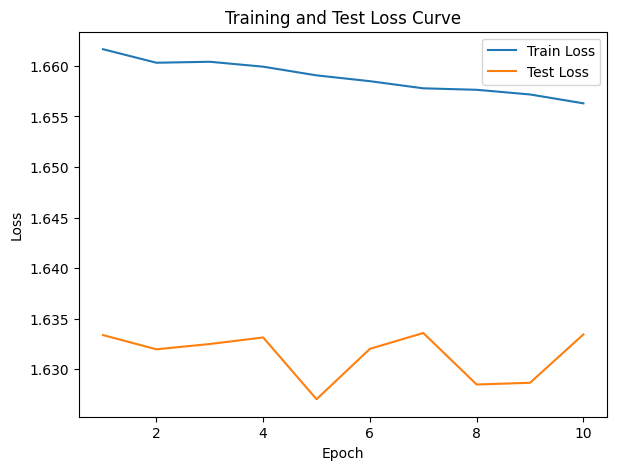

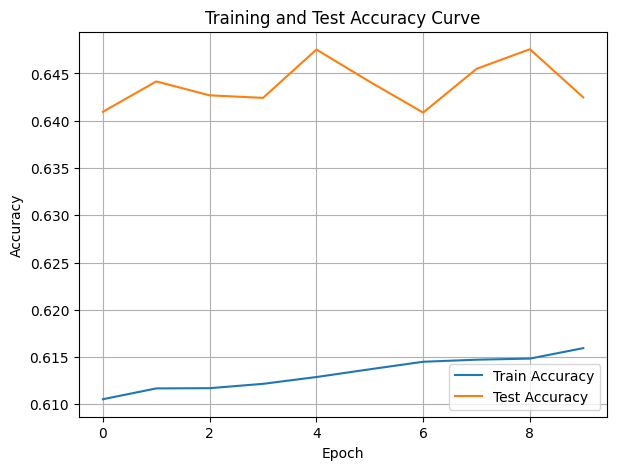

./saved_models/model_8.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.94s/it]

Epoch [1/10], Train F1:0.5811487328804252, Train Loss: 1.6559, Train Acc: 0.6162, Test F1:0.6075265569547093, Test Loss: 1.6296, Test Acc: 0.6458


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.63s/it]

Epoch [2/10], Train F1:0.5805783935593025, Train Loss: 1.6563, Train Acc: 0.6157, Test F1:0.6082820262013947, Test Loss: 1.6290, Test Acc: 0.6459


Training Process:  30%|███       | 3/10 [01:54<04:29, 38.49s/it]

Epoch [3/10], Train F1:0.5808204562216059, Train Loss: 1.6561, Train Acc: 0.6159, Test F1:0.6069438996220652, Test Loss: 1.6298, Test Acc: 0.6445


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.72s/it]

Epoch [4/10], Train F1:0.5813227397015692, Train Loss: 1.6557, Train Acc: 0.6164, Test F1:0.6051677044112461, Test Loss: 1.6310, Test Acc: 0.6431


Training Process:  50%|█████     | 5/10 [03:17<03:22, 40.45s/it]

Epoch [5/10], Train F1:0.5814470222803652, Train Loss: 1.6556, Train Acc: 0.6165, Test F1:0.6062563988426377, Test Loss: 1.6304, Test Acc: 0.6439


Training Process:  60%|██████    | 6/10 [04:02<02:47, 41.92s/it]

Epoch [6/10], Train F1:0.5814590960764126, Train Loss: 1.6555, Train Acc: 0.6165, Test F1:0.605642885680221, Test Loss: 1.6306, Test Acc: 0.6436


Training Process:  70%|███████   | 7/10 [04:49<02:10, 43.58s/it]

Epoch [7/10], Train F1:0.581545341848543, Train Loss: 1.6555, Train Acc: 0.6166, Test F1:0.6069963112349281, Test Loss: 1.6295, Test Acc: 0.6447


Training Process:  80%|████████  | 8/10 [05:35<01:28, 44.35s/it]

Epoch [8/10], Train F1:0.5817602095588807, Train Loss: 1.6553, Train Acc: 0.6168, Test F1:0.6082780567354162, Test Loss: 1.6287, Test Acc: 0.6457


Training Process:  90%|█████████ | 9/10 [06:24<00:45, 45.89s/it]

Epoch [9/10], Train F1:0.5818363516430038, Train Loss: 1.6552, Train Acc: 0.6168, Test F1:0.6085045248683323, Test Loss: 1.6286, Test Acc: 0.6459


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.67s/it]

Epoch [10/10], Train F1:0.581985522595078, Train Loss: 1.6551, Train Acc: 0.6170, Test F1:0.6082929707025545, Test Loss: 1.6288, Test Acc: 0.6457
Total Epochs: 10
Train loss start: 1.6614540815353394, Train loss end: 1.617531418800354
Highest Mean Train Accuracy (over epoch): 0.616980286399828
Test loss start: 1.5928910970687866, Test loss end: 1.5935126543045044
Highest mean Test Accuracy (over epoch): 0.6459266108428952


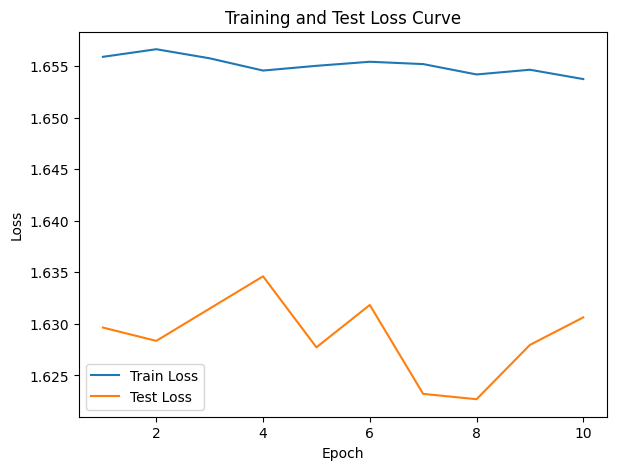

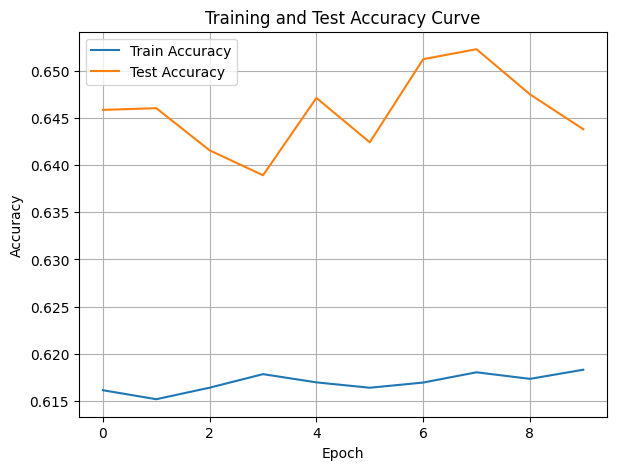

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [9]:
coverDTEmlp4b.train_DTE()

Training Process:   1%|▏         | 1/70 [00:37<42:39, 37.10s/it]

Epoch [1/70], Train F1:0.349215829985119, Train Loss: 1.9709, Train Acc: 0.3480, Test F1:0.42020767299308565, Test Loss: 1.8593, Test Acc: 0.4792


Training Process:   3%|▎         | 2/70 [01:15<42:43, 37.69s/it]

Epoch [2/70], Train F1:0.4254294630628174, Train Loss: 1.8866, Train Acc: 0.4254, Test F1:0.5055227044932814, Test Loss: 1.7976, Test Acc: 0.5338


Training Process:   4%|▍         | 3/70 [01:55<43:31, 38.98s/it]

Epoch [3/70], Train F1:0.45326190768652164, Train Loss: 1.8392, Train Acc: 0.4630, Test F1:0.5275323100516883, Test Loss: 1.7633, Test Acc: 0.5567


Training Process:   6%|▌         | 4/70 [02:37<43:58, 39.98s/it]

Epoch [4/70], Train F1:0.4693787109611184, Train Loss: 1.8097, Train Acc: 0.4861, Test F1:0.5351835593551458, Test Loss: 1.7446, Test Acc: 0.5673


Training Process:   7%|▋         | 5/70 [03:18<43:53, 40.52s/it]

Epoch [5/70], Train F1:0.48155607165521347, Train Loss: 1.7892, Train Acc: 0.5025, Test F1:0.543793686316589, Test Loss: 1.7290, Test Acc: 0.5766


Training Process:   9%|▊         | 6/70 [04:02<44:32, 41.76s/it]

Epoch [6/70], Train F1:0.4914709382072899, Train Loss: 1.7738, Train Acc: 0.5150, Test F1:0.5506328349197829, Test Loss: 1.7163, Test Acc: 0.5840


Training Process:  10%|█         | 7/70 [04:49<45:32, 43.37s/it]

Epoch [7/70], Train F1:0.4996925982672022, Train Loss: 1.7617, Train Acc: 0.5249, Test F1:0.5585929258453574, Test Loss: 1.7055, Test Acc: 0.5917


Training Process:  11%|█▏        | 8/70 [05:37<46:22, 44.88s/it]

Epoch [8/70], Train F1:0.5065360903232704, Train Loss: 1.7520, Train Acc: 0.5330, Test F1:0.5631414701828974, Test Loss: 1.6978, Test Acc: 0.5966


Training Process:  13%|█▎        | 9/70 [06:27<47:08, 46.37s/it]

Epoch [9/70], Train F1:0.5123635710744091, Train Loss: 1.7439, Train Acc: 0.5398, Test F1:0.5673378795995224, Test Loss: 1.6913, Test Acc: 0.6009


Training Process:  14%|█▍        | 10/70 [07:18<47:59, 47.99s/it]

Epoch [10/70], Train F1:0.5173388097988956, Train Loss: 1.7371, Train Acc: 0.5455, Test F1:0.5710313288547733, Test Loss: 1.6858, Test Acc: 0.6048


Training Process:  16%|█▌        | 11/70 [08:11<48:30, 49.33s/it]

Epoch [11/70], Train F1:0.521632736269448, Train Loss: 1.7313, Train Acc: 0.5504, Test F1:0.5750765233344577, Test Loss: 1.6808, Test Acc: 0.6088


Training Process:  17%|█▋        | 12/70 [09:05<49:02, 50.73s/it]

Epoch [12/70], Train F1:0.5253777521371071, Train Loss: 1.7263, Train Acc: 0.5546, Test F1:0.57804064378655, Test Loss: 1.6767, Test Acc: 0.6118


Training Process:  19%|█▊        | 13/70 [10:01<49:46, 52.40s/it]

Epoch [13/70], Train F1:0.5286786322819048, Train Loss: 1.7220, Train Acc: 0.5583, Test F1:0.5807536093031521, Test Loss: 1.6730, Test Acc: 0.6145


Training Process:  20%|██        | 14/70 [10:58<50:04, 53.65s/it]

Epoch [14/70], Train F1:0.5316243515299376, Train Loss: 1.7181, Train Acc: 0.5616, Test F1:0.5821978707022474, Test Loss: 1.6703, Test Acc: 0.6162


Training Process:  21%|██▏       | 15/70 [11:57<50:51, 55.47s/it]

Epoch [15/70], Train F1:0.5343319294134465, Train Loss: 1.7146, Train Acc: 0.5646, Test F1:0.5843040771353715, Test Loss: 1.6675, Test Acc: 0.6184


Training Process:  23%|██▎       | 16/70 [12:57<51:02, 56.71s/it]

Epoch [16/70], Train F1:0.5367513705686952, Train Loss: 1.7115, Train Acc: 0.5673, Test F1:0.5844659865674441, Test Loss: 1.6662, Test Acc: 0.6189


Training Process:  24%|██▍       | 17/70 [13:59<51:27, 58.25s/it]

Epoch [17/70], Train F1:0.5389372268242455, Train Loss: 1.7087, Train Acc: 0.5697, Test F1:0.5862001153736247, Test Loss: 1.6639, Test Acc: 0.6207


Training Process:  26%|██▌       | 18/70 [15:02<51:55, 59.91s/it]

Epoch [18/70], Train F1:0.540942229928792, Train Loss: 1.7061, Train Acc: 0.5720, Test F1:0.586885134359355, Test Loss: 1.6624, Test Acc: 0.6215


Training Process:  27%|██▋       | 19/70 [16:08<52:26, 61.69s/it]

Epoch [19/70], Train F1:0.5427741553511077, Train Loss: 1.7038, Train Acc: 0.5740, Test F1:0.5883452808243353, Test Loss: 1.6605, Test Acc: 0.6230


Training Process:  29%|██▊       | 20/70 [17:16<52:57, 63.54s/it]

Epoch [20/70], Train F1:0.5444799823821563, Train Loss: 1.7016, Train Acc: 0.5759, Test F1:0.5890076939599438, Test Loss: 1.6591, Test Acc: 0.6238


Training Process:  30%|███       | 21/70 [18:24<53:04, 64.99s/it]

Epoch [21/70], Train F1:0.5460096200521931, Train Loss: 1.6997, Train Acc: 0.5776, Test F1:0.5896701597976602, Test Loss: 1.6579, Test Acc: 0.6246


Training Process:  31%|███▏      | 22/70 [19:35<53:25, 66.77s/it]

Epoch [22/70], Train F1:0.5474381937268021, Train Loss: 1.6979, Train Acc: 0.5791, Test F1:0.5905827805736528, Test Loss: 1.6565, Test Acc: 0.6256


Training Process:  33%|███▎      | 23/70 [20:47<53:22, 68.14s/it]

Epoch [23/70], Train F1:0.5487650863674169, Train Loss: 1.6962, Train Acc: 0.5806, Test F1:0.5913786940363969, Test Loss: 1.6553, Test Acc: 0.6264


Training Process:  34%|███▍      | 24/70 [22:00<53:20, 69.57s/it]

Epoch [24/70], Train F1:0.5500267437940944, Train Loss: 1.6946, Train Acc: 0.5820, Test F1:0.5921211899557722, Test Loss: 1.6542, Test Acc: 0.6272


Training Process:  36%|███▌      | 25/70 [23:15<53:24, 71.21s/it]

Epoch [25/70], Train F1:0.5512261321180896, Train Loss: 1.6931, Train Acc: 0.5833, Test F1:0.5931243343541536, Test Loss: 1.6529, Test Acc: 0.6282


Training Process:  37%|███▋      | 26/70 [24:33<53:53, 73.50s/it]

Epoch [26/70], Train F1:0.5523270746163003, Train Loss: 1.6918, Train Acc: 0.5845, Test F1:0.5937996164698062, Test Loss: 1.6519, Test Acc: 0.6289


Training Process:  39%|███▊      | 27/70 [25:51<53:29, 74.64s/it]

Epoch [27/70], Train F1:0.5533950160227222, Train Loss: 1.6905, Train Acc: 0.5857, Test F1:0.5942557004165536, Test Loss: 1.6511, Test Acc: 0.6294


Training Process:  40%|████      | 28/70 [27:12<53:32, 76.50s/it]

Epoch [28/70], Train F1:0.554386016357591, Train Loss: 1.6892, Train Acc: 0.5867, Test F1:0.5947771552221538, Test Loss: 1.6503, Test Acc: 0.6300


Training Process:  41%|████▏     | 29/70 [28:33<53:19, 78.04s/it]

Epoch [29/70], Train F1:0.5553012846379004, Train Loss: 1.6881, Train Acc: 0.5877, Test F1:0.5949952700735657, Test Loss: 1.6498, Test Acc: 0.6303


Training Process:  43%|████▎     | 30/70 [29:57<53:10, 79.77s/it]

Epoch [30/70], Train F1:0.5561735822645661, Train Loss: 1.6870, Train Acc: 0.5887, Test F1:0.595107853074897, Test Loss: 1.6493, Test Acc: 0.6305


Training Process:  44%|████▍     | 31/70 [31:22<52:57, 81.46s/it]

Epoch [31/70], Train F1:0.5569865381014724, Train Loss: 1.6860, Train Acc: 0.5896, Test F1:0.5955761198587215, Test Loss: 1.6486, Test Acc: 0.6310


Training Process:  46%|████▌     | 32/70 [32:48<52:22, 82.69s/it]

Epoch [32/70], Train F1:0.5577717017447685, Train Loss: 1.6851, Train Acc: 0.5904, Test F1:0.596041064566654, Test Loss: 1.6479, Test Acc: 0.6315


Training Process:  47%|████▋     | 33/70 [34:15<51:49, 84.05s/it]

Epoch [33/70], Train F1:0.558504781669769, Train Loss: 1.6842, Train Acc: 0.5912, Test F1:0.596168234894741, Test Loss: 1.6475, Test Acc: 0.6317


Training Process:  49%|████▊     | 34/70 [35:44<51:11, 85.32s/it]

Epoch [34/70], Train F1:0.5591829329240229, Train Loss: 1.6833, Train Acc: 0.5920, Test F1:0.596438989130844, Test Loss: 1.6470, Test Acc: 0.6321


Training Process:  50%|█████     | 35/70 [37:13<50:33, 86.66s/it]

Epoch [35/70], Train F1:0.5598370652018495, Train Loss: 1.6825, Train Acc: 0.5927, Test F1:0.5967415693197706, Test Loss: 1.6465, Test Acc: 0.6324


Training Process:  51%|█████▏    | 36/70 [38:47<50:14, 88.66s/it]

Epoch [36/70], Train F1:0.5604886777797501, Train Loss: 1.6818, Train Acc: 0.5934, Test F1:0.5969224163357556, Test Loss: 1.6461, Test Acc: 0.6326


Training Process:  53%|█████▎    | 37/70 [40:21<49:38, 90.26s/it]

Epoch [37/70], Train F1:0.5611000065715596, Train Loss: 1.6810, Train Acc: 0.5940, Test F1:0.5968686989132654, Test Loss: 1.6459, Test Acc: 0.6326


Training Process:  54%|█████▍    | 38/70 [41:57<49:02, 91.96s/it]

Epoch [38/70], Train F1:0.5616920978132793, Train Loss: 1.6803, Train Acc: 0.5947, Test F1:0.5968053831230392, Test Loss: 1.6457, Test Acc: 0.6327


Training Process:  56%|█████▌    | 39/70 [43:34<48:23, 93.65s/it]

Epoch [39/70], Train F1:0.5622657421301238, Train Loss: 1.6796, Train Acc: 0.5953, Test F1:0.596938583920849, Test Loss: 1.6454, Test Acc: 0.6328


Training Process:  57%|█████▋    | 40/70 [45:13<47:33, 95.12s/it]

Epoch [40/70], Train F1:0.5628083261990594, Train Loss: 1.6790, Train Acc: 0.5959, Test F1:0.5972293048583156, Test Loss: 1.6450, Test Acc: 0.6331


Training Process:  59%|█████▊    | 41/70 [46:54<46:50, 96.91s/it]

Epoch [41/70], Train F1:0.5633272845223908, Train Loss: 1.6783, Train Acc: 0.5964, Test F1:0.5975046428941985, Test Loss: 1.6446, Test Acc: 0.6334


Training Process:  60%|██████    | 42/70 [48:36<45:59, 98.54s/it]

Epoch [42/70], Train F1:0.563831990759783, Train Loss: 1.6777, Train Acc: 0.5970, Test F1:0.5975331739059515, Test Loss: 1.6444, Test Acc: 0.6335


Training Process:  61%|██████▏   | 43/70 [50:19<44:57, 99.92s/it]

Epoch [43/70], Train F1:0.5643201599131382, Train Loss: 1.6772, Train Acc: 0.5975, Test F1:0.5973807654060871, Test Loss: 1.6443, Test Acc: 0.6334


Training Process:  63%|██████▎   | 44/70 [52:05<44:02, 101.63s/it]

Epoch [44/70], Train F1:0.5647851354027978, Train Loss: 1.6766, Train Acc: 0.5980, Test F1:0.5973335330941958, Test Loss: 1.6441, Test Acc: 0.6334


Training Process:  64%|██████▍   | 45/70 [53:53<43:11, 103.67s/it]

Epoch [45/70], Train F1:0.5652150461844735, Train Loss: 1.6761, Train Acc: 0.5985, Test F1:0.5974335307573068, Test Loss: 1.6439, Test Acc: 0.6336


Training Process:  66%|██████▌   | 46/70 [55:43<42:12, 105.51s/it]

Epoch [46/70], Train F1:0.5656343971240543, Train Loss: 1.6756, Train Acc: 0.5989, Test F1:0.597435036146527, Test Loss: 1.6437, Test Acc: 0.6336


Training Process:  67%|██████▋   | 47/70 [57:34<41:03, 107.09s/it]

Epoch [47/70], Train F1:0.5660404611071209, Train Loss: 1.6751, Train Acc: 0.5993, Test F1:0.597486362429948, Test Loss: 1.6435, Test Acc: 0.6337


Training Process:  69%|██████▊   | 48/70 [59:27<39:53, 108.78s/it]

Epoch [48/70], Train F1:0.5664378544333736, Train Loss: 1.6746, Train Acc: 0.5998, Test F1:0.5977133065791097, Test Loss: 1.6432, Test Acc: 0.6339


Training Process:  70%|███████   | 49/70 [1:01:19<38:28, 109.92s/it]

Epoch [49/70], Train F1:0.5668354040176656, Train Loss: 1.6741, Train Acc: 0.6002, Test F1:0.5978944386832336, Test Loss: 1.6429, Test Acc: 0.6341


Training Process:  71%|███████▏  | 50/70 [1:03:13<37:04, 111.23s/it]

Epoch [50/70], Train F1:0.567192477453134, Train Loss: 1.6737, Train Acc: 0.6006, Test F1:0.5976890695557252, Test Loss: 1.6429, Test Acc: 0.6340


Training Process:  73%|███████▎  | 51/70 [1:05:11<35:51, 113.25s/it]

Epoch [51/70], Train F1:0.5675612888116688, Train Loss: 1.6733, Train Acc: 0.6010, Test F1:0.5979427545946182, Test Loss: 1.6426, Test Acc: 0.6342


Training Process:  74%|███████▍  | 52/70 [1:07:10<34:27, 114.87s/it]

Epoch [52/70], Train F1:0.5679179808550517, Train Loss: 1.6729, Train Acc: 0.6014, Test F1:0.5981127830912596, Test Loss: 1.6424, Test Acc: 0.6343


Training Process:  76%|███████▌  | 53/70 [1:09:11<33:01, 116.59s/it]

Epoch [53/70], Train F1:0.5682575006205327, Train Loss: 1.6724, Train Acc: 0.6017, Test F1:0.5982514097550773, Test Loss: 1.6422, Test Acc: 0.6345


Training Process:  77%|███████▋  | 54/70 [1:11:13<31:30, 118.15s/it]

Epoch [54/70], Train F1:0.5685712978405818, Train Loss: 1.6721, Train Acc: 0.6021, Test F1:0.5984445595849539, Test Loss: 1.6419, Test Acc: 0.6347


Training Process:  79%|███████▊  | 55/70 [1:13:16<29:57, 119.85s/it]

Epoch [55/70], Train F1:0.5688875761776514, Train Loss: 1.6717, Train Acc: 0.6024, Test F1:0.5986268450223688, Test Loss: 1.6417, Test Acc: 0.6348


Training Process:  80%|████████  | 56/70 [1:15:20<28:15, 121.13s/it]

Epoch [56/70], Train F1:0.5691942159761764, Train Loss: 1.6713, Train Acc: 0.6027, Test F1:0.5986727297510207, Test Loss: 1.6415, Test Acc: 0.6349


Training Process:  81%|████████▏ | 57/70 [1:17:27<26:36, 122.79s/it]

Epoch [57/70], Train F1:0.5694989426634982, Train Loss: 1.6710, Train Acc: 0.6030, Test F1:0.5988719120173045, Test Loss: 1.6413, Test Acc: 0.6351


Training Process:  83%|████████▎ | 58/70 [1:19:35<24:50, 124.20s/it]

Epoch [58/70], Train F1:0.5697888667402768, Train Loss: 1.6706, Train Acc: 0.6034, Test F1:0.5991091555338539, Test Loss: 1.6410, Test Acc: 0.6353


Training Process:  84%|████████▍ | 59/70 [1:21:44<23:03, 125.77s/it]

Epoch [59/70], Train F1:0.5700866944239953, Train Loss: 1.6703, Train Acc: 0.6037, Test F1:0.5991609624915517, Test Loss: 1.6409, Test Acc: 0.6353


Training Process:  86%|████████▌ | 60/70 [1:23:58<21:23, 128.34s/it]

Epoch [60/70], Train F1:0.5703597934912751, Train Loss: 1.6700, Train Acc: 0.6040, Test F1:0.5992594791200794, Test Loss: 1.6407, Test Acc: 0.6355


Training Process:  87%|████████▋ | 61/70 [1:26:13<19:32, 130.25s/it]

Epoch [61/70], Train F1:0.5706368198019649, Train Loss: 1.6696, Train Acc: 0.6043, Test F1:0.5993101266463451, Test Loss: 1.6406, Test Acc: 0.6355


Training Process:  89%|████████▊ | 62/70 [1:28:30<17:38, 132.28s/it]

Epoch [62/70], Train F1:0.5709051397032593, Train Loss: 1.6693, Train Acc: 0.6045, Test F1:0.5995886606051246, Test Loss: 1.6403, Test Acc: 0.6357


Training Process:  90%|█████████ | 63/70 [1:30:47<15:34, 133.55s/it]

Epoch [63/70], Train F1:0.5711718651527271, Train Loss: 1.6690, Train Acc: 0.6048, Test F1:0.5997315321236962, Test Loss: 1.6401, Test Acc: 0.6359


Training Process:  91%|█████████▏| 64/70 [1:33:05<13:30, 135.01s/it]

Epoch [64/70], Train F1:0.5714341326033031, Train Loss: 1.6687, Train Acc: 0.6051, Test F1:0.5996019317033034, Test Loss: 1.6401, Test Acc: 0.6358


Training Process:  93%|█████████▎| 65/70 [1:35:24<11:21, 136.23s/it]

Epoch [65/70], Train F1:0.5716783102144419, Train Loss: 1.6684, Train Acc: 0.6054, Test F1:0.599635017899623, Test Loss: 1.6400, Test Acc: 0.6358


Training Process:  94%|█████████▍| 66/70 [1:37:44<09:09, 137.36s/it]

Epoch [66/70], Train F1:0.5719082848814863, Train Loss: 1.6682, Train Acc: 0.6056, Test F1:0.5996963539167819, Test Loss: 1.6398, Test Acc: 0.6359


Training Process:  96%|█████████▌| 67/70 [1:40:07<06:57, 139.05s/it]

Epoch [67/70], Train F1:0.5721350473886104, Train Loss: 1.6679, Train Acc: 0.6059, Test F1:0.5997676814947529, Test Loss: 1.6397, Test Acc: 0.6360


Training Process:  97%|█████████▋| 68/70 [1:42:33<04:42, 141.18s/it]

Epoch [68/70], Train F1:0.5723700244324171, Train Loss: 1.6676, Train Acc: 0.6061, Test F1:0.599750694584056, Test Loss: 1.6396, Test Acc: 0.6360


Training Process:  99%|█████████▊| 69/70 [1:45:00<02:22, 142.82s/it]

Epoch [69/70], Train F1:0.5725886431619723, Train Loss: 1.6674, Train Acc: 0.6063, Test F1:0.5998721552304787, Test Loss: 1.6394, Test Acc: 0.6361


Training Process: 100%|██████████| 70/70 [1:47:30<00:00, 92.15s/it] 


Epoch [70/70], Train F1:0.5728147557435485, Train Loss: 1.6671, Train Acc: 0.6066, Test F1:0.5998258071818631, Test Loss: 1.6394, Test Acc: 0.6361
Total Epochs: 70
Train loss start: 2.091916561126709, Train loss end: 1.6406512260437012
Highest Mean Train Accuracy (over epoch): 0.6065669156674971
Test loss start: 1.7960155010223389, Test loss end: 1.605236530303955
Highest Mean Test Accuracy (over epoch): 0.6361150611944308


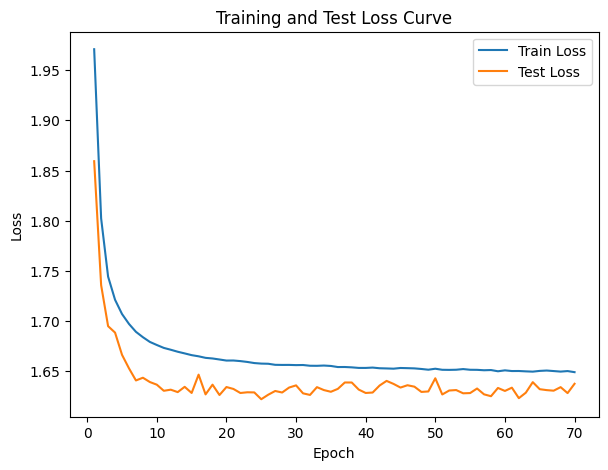

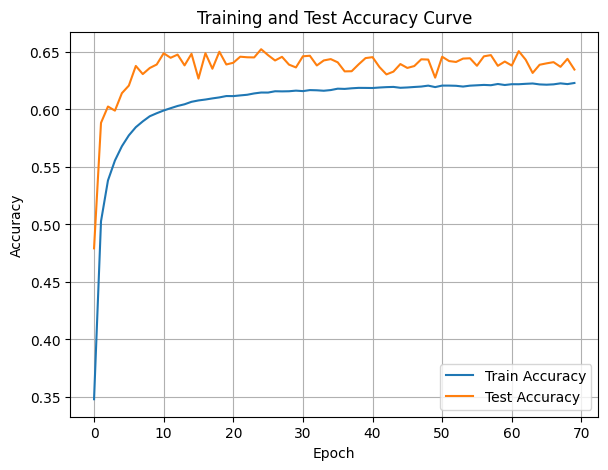

In [10]:
coverDTEmlp4b.train_single_model()

### Changing model complexity base 4, more epochs

In [11]:
hidden_layers = [100, 200, 100]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
coverDTEmlp4b = DeepTreeEnsemble(task_name='multi-classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=4,
                                epochs=20,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.00001)

Randomly initializing 4 models
Training Model with id 1


Training Process:   5%|▌         | 1/20 [00:37<11:53, 37.54s/it]

Epoch [1/20], Train F1:0.4238443912790611, Train Loss: 1.8624, Train Acc: 0.4584, Test F1:0.39294956341143406, Test Loss: 1.7569, Test Acc: 0.5128


Training Process:  10%|█         | 2/20 [01:14<11:09, 37.18s/it]

Epoch [2/20], Train F1:0.4541918068111585, Train Loss: 1.7975, Train Acc: 0.5025, Test F1:0.4412549646170393, Test Loss: 1.7332, Test Acc: 0.5389


Training Process:  15%|█▌        | 3/20 [01:53<10:45, 37.97s/it]

Epoch [3/20], Train F1:0.4728371373649949, Train Loss: 1.7682, Train Acc: 0.5230, Test F1:0.45700682979604995, Test Loss: 1.7222, Test Acc: 0.5484


Training Process:  20%|██        | 4/20 [02:34<10:26, 39.18s/it]

Epoch [4/20], Train F1:0.4884423028300944, Train Loss: 1.7500, Train Acc: 0.5367, Test F1:0.47724018202266927, Test Loss: 1.7119, Test Acc: 0.5586


Training Process:  25%|██▌       | 5/20 [03:17<10:11, 40.77s/it]

Epoch [5/20], Train F1:0.5026381956881927, Train Loss: 1.7367, Train Acc: 0.5473, Test F1:0.49060026618606245, Test Loss: 1.7041, Test Acc: 0.5657


Training Process:  30%|███       | 6/20 [04:02<09:48, 42.01s/it]

Epoch [6/20], Train F1:0.5135562951364417, Train Loss: 1.7266, Train Acc: 0.5556, Test F1:0.49807075444762483, Test Loss: 1.6987, Test Acc: 0.5700


Training Process:  35%|███▌      | 7/20 [04:49<09:26, 43.57s/it]

Epoch [7/20], Train F1:0.5219707066678173, Train Loss: 1.7186, Train Acc: 0.5624, Test F1:0.5074953288669433, Test Loss: 1.6927, Test Acc: 0.5755


Training Process:  40%|████      | 8/20 [05:37<08:59, 44.92s/it]

Epoch [8/20], Train F1:0.528389794947798, Train Loss: 1.7123, Train Acc: 0.5677, Test F1:0.5143784396146929, Test Loss: 1.6881, Test Acc: 0.5798


Training Process:  45%|████▌     | 9/20 [06:24<08:23, 45.77s/it]

Epoch [9/20], Train F1:0.5336211713300782, Train Loss: 1.7070, Train Acc: 0.5721, Test F1:0.5214309095084334, Test Loss: 1.6838, Test Acc: 0.5842


Training Process:  50%|█████     | 10/20 [07:14<07:48, 46.88s/it]

Epoch [10/20], Train F1:0.5379912745422628, Train Loss: 1.7026, Train Acc: 0.5759, Test F1:0.5289893266295715, Test Loss: 1.6796, Test Acc: 0.5889


Training Process:  55%|█████▌    | 11/20 [08:07<07:19, 48.86s/it]

Epoch [11/20], Train F1:0.5416426017300904, Train Loss: 1.6989, Train Acc: 0.5791, Test F1:0.5346845021803481, Test Loss: 1.6763, Test Acc: 0.5925


Training Process:  60%|██████    | 12/20 [09:01<06:44, 50.53s/it]

Epoch [12/20], Train F1:0.544810654967573, Train Loss: 1.6956, Train Acc: 0.5819, Test F1:0.540123543826376, Test Loss: 1.6731, Test Acc: 0.5961


Training Process:  65%|██████▌   | 13/20 [09:56<06:03, 51.91s/it]

Epoch [13/20], Train F1:0.5475187852358228, Train Loss: 1.6927, Train Acc: 0.5843, Test F1:0.5417202946318236, Test Loss: 1.6717, Test Acc: 0.5973


Training Process:  70%|███████   | 14/20 [10:53<05:20, 53.34s/it]

Epoch [14/20], Train F1:0.5498279432304252, Train Loss: 1.6903, Train Acc: 0.5864, Test F1:0.544769788985016, Test Loss: 1.6696, Test Acc: 0.5994


Training Process:  75%|███████▌  | 15/20 [11:52<04:35, 55.03s/it]

Epoch [15/20], Train F1:0.5519504462011088, Train Loss: 1.6881, Train Acc: 0.5884, Test F1:0.5471713040576022, Test Loss: 1.6680, Test Acc: 0.6010


Training Process:  80%|████████  | 16/20 [12:52<03:45, 56.48s/it]

Epoch [16/20], Train F1:0.5538586395947473, Train Loss: 1.6861, Train Acc: 0.5901, Test F1:0.5497476714890439, Test Loss: 1.6664, Test Acc: 0.6027


Training Process:  85%|████████▌ | 17/20 [13:55<02:55, 58.39s/it]

Epoch [17/20], Train F1:0.5554712775593224, Train Loss: 1.6843, Train Acc: 0.5916, Test F1:0.5525483762775705, Test Loss: 1.6646, Test Acc: 0.6046


Training Process:  90%|█████████ | 18/20 [14:59<02:00, 60.30s/it]

Epoch [18/20], Train F1:0.5570084780553911, Train Loss: 1.6827, Train Acc: 0.5931, Test F1:0.5548410062228939, Test Loss: 1.6631, Test Acc: 0.6062


Training Process:  95%|█████████▌| 19/20 [16:05<01:01, 61.81s/it]

Epoch [19/20], Train F1:0.5584227872597474, Train Loss: 1.6812, Train Acc: 0.5944, Test F1:0.5561707027391473, Test Loss: 1.6625, Test Acc: 0.6070


Training Process: 100%|██████████| 20/20 [17:11<00:00, 51.56s/it]


Epoch [20/20], Train F1:0.559706493579163, Train Loss: 1.6798, Train Acc: 0.5956, Test F1:0.5583989097544593, Test Loss: 1.6611, Test Acc: 0.6086
Total Epochs: 20
Train loss start: 2.0771305561065674, Train loss end: 1.7540454864501953
Highest Mean Train Accuracy (over epoch): 0.5955666673592851
Test loss start: 1.7545911073684692, Test loss end: 1.6083022356033325
Highest mean Test Accuracy (over epoch): 0.6085802936270618


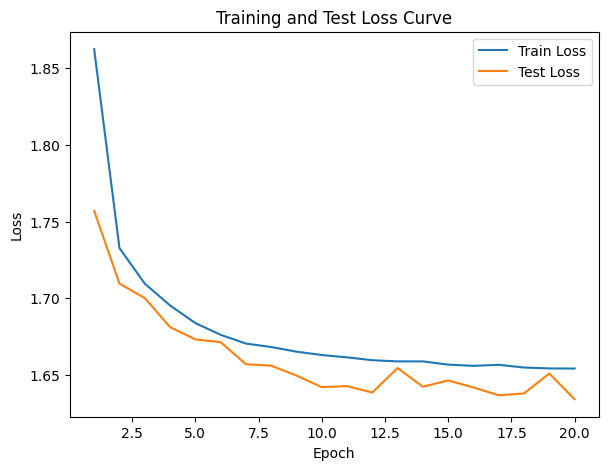

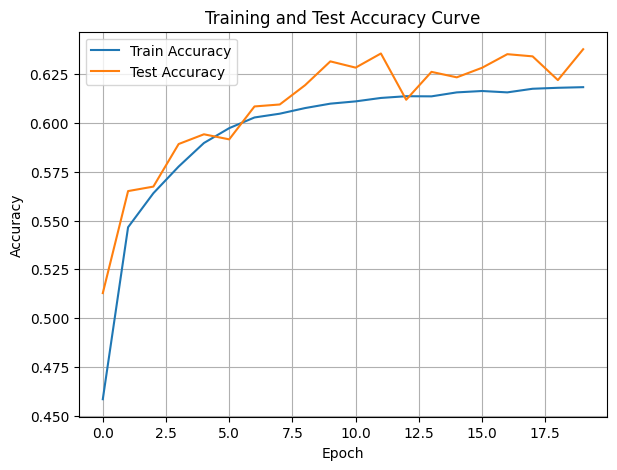

./saved_models/model_1.pth
Training Model with id 2


Training Process:   5%|▌         | 1/20 [00:37<11:57, 37.75s/it]

Epoch [1/20], Train F1:0.43623955208330223, Train Loss: 1.8901, Train Acc: 0.4290, Test F1:0.3900224314323159, Test Loss: 1.7580, Test Acc: 0.5101


Training Process:  10%|█         | 2/20 [01:16<11:26, 38.14s/it]

Epoch [2/20], Train F1:0.4781329095815192, Train Loss: 1.8092, Train Acc: 0.4931, Test F1:0.46003238909736965, Test Loss: 1.7250, Test Acc: 0.5452


Training Process:  15%|█▌        | 3/20 [01:55<10:59, 38.81s/it]

Epoch [3/20], Train F1:0.4996987238602054, Train Loss: 1.7718, Train Acc: 0.5221, Test F1:0.48787059814918216, Test Loss: 1.7084, Test Acc: 0.5618


Training Process:  20%|██        | 4/20 [02:36<10:31, 39.46s/it]

Epoch [4/20], Train F1:0.5135170488671792, Train Loss: 1.7498, Train Acc: 0.5394, Test F1:0.5069431996894785, Test Loss: 1.6964, Test Acc: 0.5733


Training Process:  25%|██▌       | 5/20 [03:18<10:09, 40.60s/it]

Epoch [5/20], Train F1:0.5233260524877962, Train Loss: 1.7350, Train Acc: 0.5511, Test F1:0.5225066736466407, Test Loss: 1.6868, Test Acc: 0.5833


Training Process:  30%|███       | 6/20 [04:03<09:46, 41.92s/it]

Epoch [6/20], Train F1:0.5307000199662112, Train Loss: 1.7243, Train Acc: 0.5597, Test F1:0.5306853665222464, Test Loss: 1.6811, Test Acc: 0.5889


Training Process:  35%|███▌      | 7/20 [04:49<09:22, 43.27s/it]

Epoch [7/20], Train F1:0.5362666992492089, Train Loss: 1.7163, Train Acc: 0.5661, Test F1:0.5375412379116777, Test Loss: 1.6762, Test Acc: 0.5937


Training Process:  40%|████      | 8/20 [05:37<08:57, 44.77s/it]

Epoch [8/20], Train F1:0.5407950920904045, Train Loss: 1.7099, Train Acc: 0.5713, Test F1:0.5428474736151657, Test Loss: 1.6726, Test Acc: 0.5973


Training Process:  45%|████▌     | 9/20 [06:25<08:25, 45.96s/it]

Epoch [9/20], Train F1:0.544608819606864, Train Loss: 1.7046, Train Acc: 0.5756, Test F1:0.5471739160475962, Test Loss: 1.6699, Test Acc: 0.6003


Training Process:  50%|█████     | 10/20 [07:16<07:53, 47.35s/it]

Epoch [10/20], Train F1:0.5476750015661088, Train Loss: 1.7004, Train Acc: 0.5791, Test F1:0.548888116129652, Test Loss: 1.6683, Test Acc: 0.6015


Training Process:  55%|█████▌    | 11/20 [08:08<07:19, 48.78s/it]

Epoch [11/20], Train F1:0.5503745617566964, Train Loss: 1.6966, Train Acc: 0.5822, Test F1:0.5527405266093306, Test Loss: 1.6655, Test Acc: 0.6043


Training Process:  60%|██████    | 12/20 [09:02<06:43, 50.48s/it]

Epoch [12/20], Train F1:0.5527008359602744, Train Loss: 1.6935, Train Acc: 0.5848, Test F1:0.5539206448471159, Test Loss: 1.6644, Test Acc: 0.6052


Training Process:  65%|██████▌   | 13/20 [09:58<06:04, 52.09s/it]

Epoch [13/20], Train F1:0.5547541009339821, Train Loss: 1.6907, Train Acc: 0.5871, Test F1:0.5566982325672908, Test Loss: 1.6626, Test Acc: 0.6072


Training Process:  70%|███████   | 14/20 [10:55<05:21, 53.61s/it]

Epoch [14/20], Train F1:0.5565493390082388, Train Loss: 1.6884, Train Acc: 0.5891, Test F1:0.5574263034756982, Test Loss: 1.6617, Test Acc: 0.6078


Training Process:  75%|███████▌  | 15/20 [11:54<04:36, 55.24s/it]

Epoch [15/20], Train F1:0.5581870757978701, Train Loss: 1.6862, Train Acc: 0.5909, Test F1:0.558572411859962, Test Loss: 1.6609, Test Acc: 0.6086


Training Process:  80%|████████  | 16/20 [12:55<03:47, 56.96s/it]

Epoch [16/20], Train F1:0.5596118109402514, Train Loss: 1.6843, Train Acc: 0.5924, Test F1:0.5606051611985836, Test Loss: 1.6596, Test Acc: 0.6100


Training Process:  85%|████████▌ | 17/20 [13:58<02:55, 58.58s/it]

Epoch [17/20], Train F1:0.5609443227873363, Train Loss: 1.6826, Train Acc: 0.5939, Test F1:0.560468585179187, Test Loss: 1.6594, Test Acc: 0.6100


Training Process:  90%|█████████ | 18/20 [15:02<02:00, 60.36s/it]

Epoch [18/20], Train F1:0.5622214633881034, Train Loss: 1.6810, Train Acc: 0.5953, Test F1:0.5627383157633654, Test Loss: 1.6581, Test Acc: 0.6116


Training Process:  95%|█████████▌| 19/20 [16:07<01:01, 61.84s/it]

Epoch [19/20], Train F1:0.5633393466573687, Train Loss: 1.6795, Train Acc: 0.5965, Test F1:0.5645506893059773, Test Loss: 1.6569, Test Acc: 0.6129


Training Process: 100%|██████████| 20/20 [17:16<00:00, 51.84s/it]


Epoch [20/20], Train F1:0.5643432822584699, Train Loss: 1.6783, Train Acc: 0.5976, Test F1:0.564573409878047, Test Loss: 1.6567, Test Acc: 0.6130
Total Epochs: 20
Train loss start: 2.0931203365325928, Train loss end: 1.7680509090423584
Highest Mean Train Accuracy (over epoch): 0.5975848263458626
Test loss start: 1.7562193870544434, Test loss end: 1.611536979675293
Highest mean Test Accuracy (over epoch): 0.6129753851424034


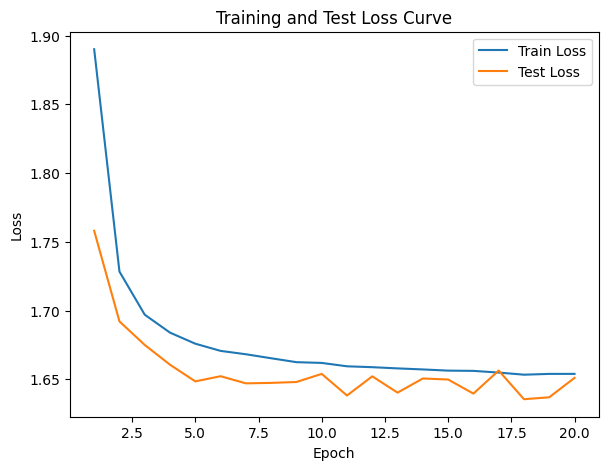

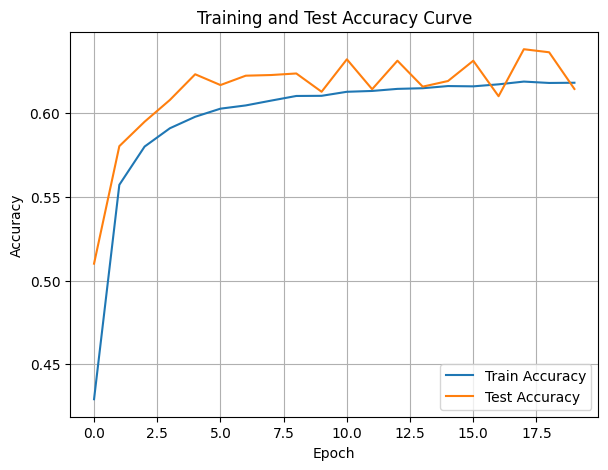

./saved_models/model_2.pth
Training Model with id 3


Training Process:   5%|▌         | 1/20 [00:37<11:55, 37.67s/it]

Epoch [1/20], Train F1:0.4276175877643076, Train Loss: 1.8711, Train Acc: 0.4587, Test F1:0.41737367353913035, Test Loss: 1.7451, Test Acc: 0.5257


Training Process:  10%|█         | 2/20 [01:16<11:31, 38.44s/it]

Epoch [2/20], Train F1:0.46780057127642316, Train Loss: 1.7984, Train Acc: 0.5075, Test F1:0.4582644903274019, Test Loss: 1.7238, Test Acc: 0.5471


Training Process:  15%|█▌        | 3/20 [01:56<11:05, 39.15s/it]

Epoch [3/20], Train F1:0.49227058164407733, Train Loss: 1.7648, Train Acc: 0.5314, Test F1:0.4918392426101606, Test Loss: 1.7075, Test Acc: 0.5660


Training Process:  20%|██        | 4/20 [02:38<10:46, 40.40s/it]

Epoch [4/20], Train F1:0.5079066033950741, Train Loss: 1.7448, Train Acc: 0.5460, Test F1:0.508914824676203, Test Loss: 1.6959, Test Acc: 0.5764


Training Process:  25%|██▌       | 5/20 [03:21<10:19, 41.33s/it]

Epoch [5/20], Train F1:0.5185647283324292, Train Loss: 1.7314, Train Acc: 0.5560, Test F1:0.5175899264351398, Test Loss: 1.6889, Test Acc: 0.5823


Training Process:  30%|███       | 6/20 [04:06<09:55, 42.57s/it]

Epoch [6/20], Train F1:0.5266756397200003, Train Loss: 1.7215, Train Acc: 0.5636, Test F1:0.5250999249213147, Test Loss: 1.6827, Test Acc: 0.5873


Training Process:  35%|███▌      | 7/20 [04:54<09:33, 44.08s/it]

Epoch [7/20], Train F1:0.5328569596328961, Train Loss: 1.7139, Train Acc: 0.5695, Test F1:0.5331774916796567, Test Loss: 1.6774, Test Acc: 0.5922


Training Process:  40%|████      | 8/20 [05:41<09:01, 45.11s/it]

Epoch [8/20], Train F1:0.5378738331571766, Train Loss: 1.7078, Train Acc: 0.5742, Test F1:0.5369830184015596, Test Loss: 1.6744, Test Acc: 0.5950


Training Process:  45%|████▌     | 9/20 [06:29<08:24, 45.89s/it]

Epoch [9/20], Train F1:0.5421017198116768, Train Loss: 1.7028, Train Acc: 0.5782, Test F1:0.5391156568123003, Test Loss: 1.6723, Test Acc: 0.5966


Training Process:  50%|█████     | 10/20 [07:18<07:50, 47.07s/it]

Epoch [10/20], Train F1:0.5456170347806089, Train Loss: 1.6986, Train Acc: 0.5816, Test F1:0.5428706987907642, Test Loss: 1.6693, Test Acc: 0.5991


Training Process:  55%|█████▌    | 11/20 [08:11<07:20, 48.90s/it]

Epoch [11/20], Train F1:0.5485076726386235, Train Loss: 1.6951, Train Acc: 0.5843, Test F1:0.544466241778706, Test Loss: 1.6677, Test Acc: 0.6003


Training Process:  60%|██████    | 12/20 [09:05<06:42, 50.29s/it]

Epoch [12/20], Train F1:0.5510454147888388, Train Loss: 1.6921, Train Acc: 0.5868, Test F1:0.5466971878080683, Test Loss: 1.6657, Test Acc: 0.6018


Training Process:  65%|██████▌   | 13/20 [10:01<06:03, 51.94s/it]

Epoch [13/20], Train F1:0.5533375386023158, Train Loss: 1.6894, Train Acc: 0.5890, Test F1:0.5483124279769469, Test Loss: 1.6642, Test Acc: 0.6030


Training Process:  70%|███████   | 14/20 [10:59<05:22, 53.80s/it]

Epoch [14/20], Train F1:0.5553184141873583, Train Loss: 1.6871, Train Acc: 0.5909, Test F1:0.5505690436899084, Test Loss: 1.6625, Test Acc: 0.6048


Training Process:  75%|███████▌  | 15/20 [11:58<04:37, 55.41s/it]

Epoch [15/20], Train F1:0.5571049417041062, Train Loss: 1.6850, Train Acc: 0.5926, Test F1:0.5532080332743159, Test Loss: 1.6611, Test Acc: 0.6065


Training Process:  80%|████████  | 16/20 [12:58<03:47, 56.81s/it]

Epoch [16/20], Train F1:0.5586234154070251, Train Loss: 1.6832, Train Acc: 0.5940, Test F1:0.5558733979401446, Test Loss: 1.6596, Test Acc: 0.6083


Training Process:  85%|████████▌ | 17/20 [14:00<02:54, 58.31s/it]

Epoch [17/20], Train F1:0.5600506497905547, Train Loss: 1.6815, Train Acc: 0.5954, Test F1:0.5565966963981174, Test Loss: 1.6588, Test Acc: 0.6090


Training Process:  90%|█████████ | 18/20 [15:03<01:59, 59.82s/it]

Epoch [18/20], Train F1:0.5612696442678246, Train Loss: 1.6800, Train Acc: 0.5966, Test F1:0.5589535493918408, Test Loss: 1.6575, Test Acc: 0.6106


Training Process:  95%|█████████▌| 19/20 [16:09<01:01, 61.67s/it]

Epoch [19/20], Train F1:0.5624567938132337, Train Loss: 1.6786, Train Acc: 0.5978, Test F1:0.5595125633332481, Test Loss: 1.6569, Test Acc: 0.6111


Training Process: 100%|██████████| 20/20 [17:17<00:00, 51.90s/it]


Epoch [20/20], Train F1:0.5635995071650183, Train Loss: 1.6773, Train Acc: 0.5989, Test F1:0.5599319472296106, Test Loss: 1.6565, Test Acc: 0.6115
Total Epochs: 20
Train loss start: 2.0898122787475586, Train loss end: 1.6869381666183472
Highest Mean Train Accuracy (over epoch): 0.5988973514270459
Test loss start: 1.7478324174880981, Test loss end: 1.595288634300232
Highest mean Test Accuracy (over epoch): 0.6114965147493854


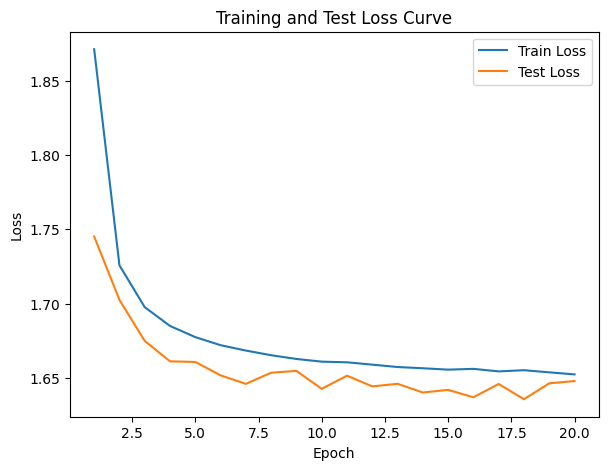

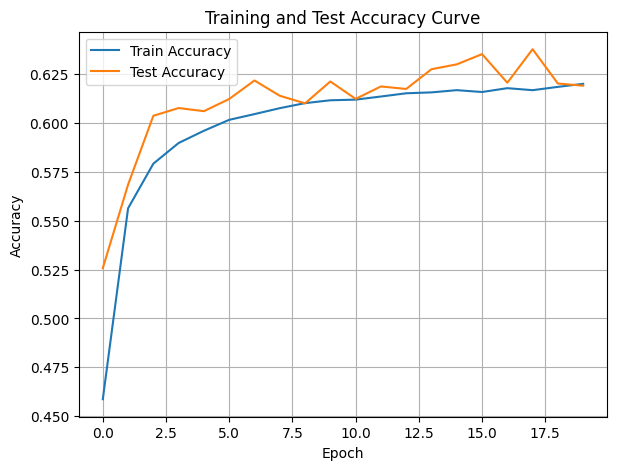

./saved_models/model_3.pth
Training Model with id 4


Training Process:   5%|▌         | 1/20 [00:35<11:11, 35.32s/it]

Epoch [1/20], Train F1:0.45597685940989796, Train Loss: 1.8545, Train Acc: 0.4813, Test F1:0.4006917754210466, Test Loss: 1.7506, Test Acc: 0.5180


Training Process:  10%|█         | 2/20 [01:13<11:06, 37.02s/it]

Epoch [2/20], Train F1:0.4862646761106435, Train Loss: 1.7867, Train Acc: 0.5221, Test F1:0.45010626543235105, Test Loss: 1.7269, Test Acc: 0.5424


Training Process:  15%|█▌        | 3/20 [01:53<10:55, 38.58s/it]

Epoch [3/20], Train F1:0.5060641377683623, Train Loss: 1.7553, Train Acc: 0.5425, Test F1:0.4834546511848585, Test Loss: 1.7085, Test Acc: 0.5610


Training Process:  20%|██        | 4/20 [02:35<10:35, 39.70s/it]

Epoch [4/20], Train F1:0.5190332396532604, Train Loss: 1.7367, Train Acc: 0.5552, Test F1:0.502143077695693, Test Loss: 1.6973, Test Acc: 0.5719


Training Process:  25%|██▌       | 5/20 [03:17<10:06, 40.41s/it]

Epoch [5/20], Train F1:0.5280840015716145, Train Loss: 1.7243, Train Acc: 0.5640, Test F1:0.5130497347976778, Test Loss: 1.6899, Test Acc: 0.5791


Training Process:  30%|███       | 6/20 [04:01<09:46, 41.92s/it]

Epoch [6/20], Train F1:0.5348724218154038, Train Loss: 1.7153, Train Acc: 0.5706, Test F1:0.5244336570431232, Test Loss: 1.6826, Test Acc: 0.5863


Training Process:  35%|███▌      | 7/20 [04:48<09:25, 43.48s/it]

Epoch [7/20], Train F1:0.5400454325198251, Train Loss: 1.7084, Train Acc: 0.5756, Test F1:0.5329969424481636, Test Loss: 1.6771, Test Acc: 0.5918


Training Process:  40%|████      | 8/20 [05:34<08:52, 44.37s/it]

Epoch [8/20], Train F1:0.5443839240954825, Train Loss: 1.7028, Train Acc: 0.5798, Test F1:0.5419230368911179, Test Loss: 1.6722, Test Acc: 0.5973


Training Process:  45%|████▌     | 9/20 [06:24<08:24, 45.90s/it]

Epoch [9/20], Train F1:0.5478097162859411, Train Loss: 1.6983, Train Acc: 0.5832, Test F1:0.5468338501583447, Test Loss: 1.6688, Test Acc: 0.6008


Training Process:  50%|█████     | 10/20 [07:13<07:50, 47.00s/it]

Epoch [10/20], Train F1:0.5507403977915519, Train Loss: 1.6945, Train Acc: 0.5860, Test F1:0.5498930510913972, Test Loss: 1.6665, Test Acc: 0.6031


Training Process:  55%|█████▌    | 11/20 [08:05<07:15, 48.36s/it]

Epoch [11/20], Train F1:0.5532675292155872, Train Loss: 1.6913, Train Acc: 0.5885, Test F1:0.5533765224822423, Test Loss: 1.6642, Test Acc: 0.6054


Training Process:  60%|██████    | 12/20 [08:59<06:42, 50.36s/it]

Epoch [12/20], Train F1:0.5554035001616435, Train Loss: 1.6886, Train Acc: 0.5906, Test F1:0.5565234501044072, Test Loss: 1.6620, Test Acc: 0.6076


Training Process:  65%|██████▌   | 13/20 [09:56<06:04, 52.14s/it]

Epoch [13/20], Train F1:0.5572844950639815, Train Loss: 1.6862, Train Acc: 0.5924, Test F1:0.5599446864384839, Test Loss: 1.6599, Test Acc: 0.6100


Training Process:  70%|███████   | 14/20 [10:53<05:22, 53.67s/it]

Epoch [14/20], Train F1:0.5589276405786496, Train Loss: 1.6841, Train Acc: 0.5941, Test F1:0.5616007399366605, Test Loss: 1.6586, Test Acc: 0.6112


Training Process:  75%|███████▌  | 15/20 [11:51<04:35, 55.12s/it]

Epoch [15/20], Train F1:0.5604201556038078, Train Loss: 1.6823, Train Acc: 0.5955, Test F1:0.564773782227539, Test Loss: 1.6567, Test Acc: 0.6136


Training Process:  80%|████████  | 16/20 [12:53<03:47, 57.00s/it]

Epoch [16/20], Train F1:0.5618277555334042, Train Loss: 1.6805, Train Acc: 0.5969, Test F1:0.5667945622902283, Test Loss: 1.6555, Test Acc: 0.6151


Training Process:  85%|████████▌ | 17/20 [13:56<02:56, 58.73s/it]

Epoch [17/20], Train F1:0.5630877604039114, Train Loss: 1.6790, Train Acc: 0.5982, Test F1:0.5673156101128154, Test Loss: 1.6547, Test Acc: 0.6156


Training Process:  90%|█████████ | 18/20 [14:58<01:59, 59.97s/it]

Epoch [18/20], Train F1:0.564184937595878, Train Loss: 1.6776, Train Acc: 0.5992, Test F1:0.5686640821654272, Test Loss: 1.6537, Test Acc: 0.6166


Training Process:  95%|█████████▌| 19/20 [16:05<01:01, 61.88s/it]

Epoch [19/20], Train F1:0.565171702577682, Train Loss: 1.6764, Train Acc: 0.6002, Test F1:0.5704131460191324, Test Loss: 1.6526, Test Acc: 0.6180


Training Process: 100%|██████████| 20/20 [17:12<00:00, 51.61s/it]


Epoch [20/20], Train F1:0.566057764232408, Train Loss: 1.6753, Train Acc: 0.6011, Test F1:0.5705268817428996, Test Loss: 1.6523, Test Acc: 0.6181
Total Epochs: 20
Train loss start: 2.0816659927368164, Train loss end: 1.653609275817871
Highest Mean Train Accuracy (over epoch): 0.6011086958666209
Test loss start: 1.7470674514770508, Test loss end: 1.5942102670669556
Highest mean Test Accuracy (over epoch): 0.6180962603889202


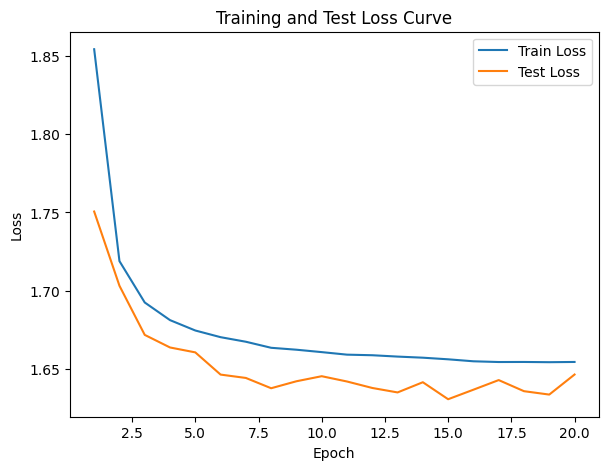

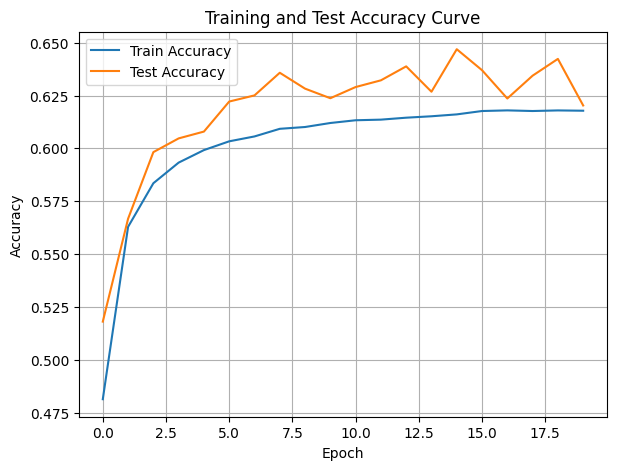

./saved_models/model_4.pth
Training Model with id 7


Training Process:   5%|▌         | 1/20 [00:37<11:43, 37.03s/it]

Epoch [1/20], Train F1:0.5837945551463296, Train Loss: 1.6531, Train Acc: 0.6190, Test F1:0.5843581448730644, Test Loss: 1.6400, Test Acc: 0.6286


Training Process:  10%|█         | 2/20 [01:15<11:21, 37.88s/it]

Epoch [2/20], Train F1:0.5841213104606957, Train Loss: 1.6529, Train Acc: 0.6193, Test F1:0.5873563000813169, Test Loss: 1.6400, Test Acc: 0.6303


Training Process:  15%|█▌        | 3/20 [01:54<10:52, 38.36s/it]

Epoch [3/20], Train F1:0.5844877443684877, Train Loss: 1.6526, Train Acc: 0.6196, Test F1:0.5923572808753872, Test Loss: 1.6369, Test Acc: 0.6342


Training Process:  20%|██        | 4/20 [02:35<10:29, 39.36s/it]

Epoch [4/20], Train F1:0.5846379385949212, Train Loss: 1.6525, Train Acc: 0.6197, Test F1:0.5887402594341878, Test Loss: 1.6387, Test Acc: 0.6316


Training Process:  25%|██▌       | 5/20 [03:18<10:09, 40.67s/it]

Epoch [5/20], Train F1:0.5848358852410588, Train Loss: 1.6523, Train Acc: 0.6199, Test F1:0.589504825418183, Test Loss: 1.6386, Test Acc: 0.6320


Training Process:  30%|███       | 6/20 [04:03<09:50, 42.16s/it]

Epoch [6/20], Train F1:0.5849165334012253, Train Loss: 1.6522, Train Acc: 0.6199, Test F1:0.5881159711838018, Test Loss: 1.6390, Test Acc: 0.6310


Training Process:  35%|███▌      | 7/20 [04:49<09:25, 43.47s/it]

Epoch [7/20], Train F1:0.585069189284954, Train Loss: 1.6521, Train Acc: 0.6201, Test F1:0.5895049642990744, Test Loss: 1.6385, Test Acc: 0.6321


Training Process:  40%|████      | 8/20 [05:36<08:56, 44.69s/it]

Epoch [8/20], Train F1:0.5852779432239783, Train Loss: 1.6519, Train Acc: 0.6203, Test F1:0.5903216836756097, Test Loss: 1.6381, Test Acc: 0.6326


Training Process:  45%|████▌     | 9/20 [06:24<08:22, 45.68s/it]

Epoch [9/20], Train F1:0.5853849901067799, Train Loss: 1.6518, Train Acc: 0.6204, Test F1:0.5891520989199459, Test Loss: 1.6388, Test Acc: 0.6316


Training Process:  50%|█████     | 10/20 [07:14<07:49, 46.99s/it]

Epoch [10/20], Train F1:0.5855121150260606, Train Loss: 1.6516, Train Acc: 0.6205, Test F1:0.5901008811796286, Test Loss: 1.6385, Test Acc: 0.6322


Training Process:  55%|█████▌    | 11/20 [08:06<07:16, 48.54s/it]

Epoch [11/20], Train F1:0.5856760153441974, Train Loss: 1.6515, Train Acc: 0.6206, Test F1:0.5912834508339029, Test Loss: 1.6378, Test Acc: 0.6331


Training Process:  60%|██████    | 12/20 [09:01<06:43, 50.44s/it]

Epoch [12/20], Train F1:0.5857717307223268, Train Loss: 1.6514, Train Acc: 0.6207, Test F1:0.5908791655029936, Test Loss: 1.6379, Test Acc: 0.6328


Training Process:  65%|██████▌   | 13/20 [09:56<06:01, 51.69s/it]

Epoch [13/20], Train F1:0.5858569820330388, Train Loss: 1.6513, Train Acc: 0.6208, Test F1:0.5900823923704918, Test Loss: 1.6381, Test Acc: 0.6323


Training Process:  70%|███████   | 14/20 [10:53<05:19, 53.29s/it]

Epoch [14/20], Train F1:0.5860069529407268, Train Loss: 1.6512, Train Acc: 0.6209, Test F1:0.5903426900558174, Test Loss: 1.6380, Test Acc: 0.6324


Training Process:  75%|███████▌  | 15/20 [11:51<04:34, 54.92s/it]

Epoch [15/20], Train F1:0.5861591665530769, Train Loss: 1.6510, Train Acc: 0.6211, Test F1:0.5911505220608458, Test Loss: 1.6374, Test Acc: 0.6331


Training Process:  80%|████████  | 16/20 [12:52<03:46, 56.56s/it]

Epoch [16/20], Train F1:0.586258984727246, Train Loss: 1.6509, Train Acc: 0.6212, Test F1:0.5906578916040616, Test Loss: 1.6375, Test Acc: 0.6329


Training Process:  85%|████████▌ | 17/20 [13:53<02:54, 58.01s/it]

Epoch [17/20], Train F1:0.5863659579871521, Train Loss: 1.6508, Train Acc: 0.6213, Test F1:0.5917309617985375, Test Loss: 1.6369, Test Acc: 0.6337


Training Process:  90%|█████████ | 18/20 [14:57<01:59, 59.80s/it]

Epoch [18/20], Train F1:0.5864408538390861, Train Loss: 1.6507, Train Acc: 0.6214, Test F1:0.5910542156971059, Test Loss: 1.6372, Test Acc: 0.6332


Training Process:  95%|█████████▌| 19/20 [16:02<01:01, 61.45s/it]

Epoch [19/20], Train F1:0.5865963942091806, Train Loss: 1.6506, Train Acc: 0.6215, Test F1:0.5902857106257814, Test Loss: 1.6376, Test Acc: 0.6326


Training Process: 100%|██████████| 20/20 [17:09<00:00, 51.46s/it]


Epoch [20/20], Train F1:0.5866695825566076, Train Loss: 1.6505, Train Acc: 0.6216, Test F1:0.5904757596609261, Test Loss: 1.6375, Test Acc: 0.6327
Total Epochs: 20
Train loss start: 1.7775028944015503, Train loss end: 1.636120319366455
Highest Mean Train Accuracy (over epoch): 0.6216032968008584
Test loss start: 1.6211869716644287, Test loss end: 1.5864635705947876
Highest mean Test Accuracy (over epoch): 0.634209161458867


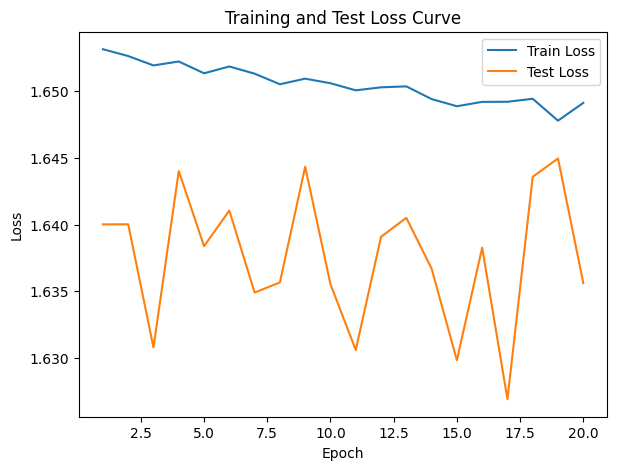

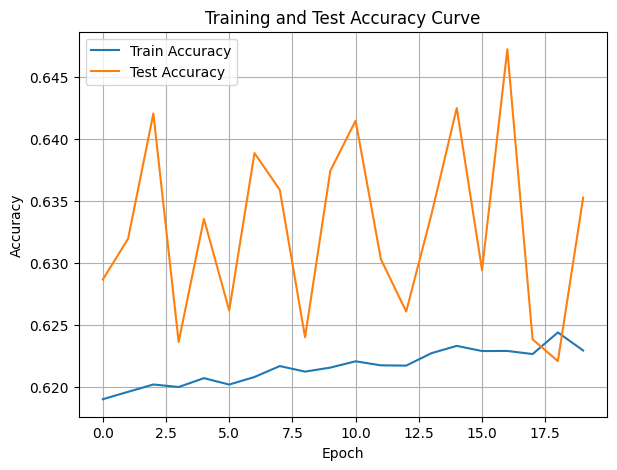

./saved_models/model_7.pth
Training Model with id 8


Training Process:   5%|▌         | 1/20 [00:37<11:55, 37.67s/it]

Epoch [1/20], Train F1:0.589248047895356, Train Loss: 1.6480, Train Acc: 0.6240, Test F1:0.5930262483633635, Test Loss: 1.6372, Test Acc: 0.6338


Training Process:  10%|█         | 2/20 [01:16<11:28, 38.25s/it]

Epoch [2/20], Train F1:0.5891288012826791, Train Loss: 1.6481, Train Acc: 0.6239, Test F1:0.592805152304949, Test Loss: 1.6368, Test Acc: 0.6338


Training Process:  15%|█▌        | 3/20 [01:56<11:02, 38.95s/it]

Epoch [3/20], Train F1:0.5892739164993206, Train Loss: 1.6480, Train Acc: 0.6240, Test F1:0.5906389883697272, Test Loss: 1.6385, Test Acc: 0.6317


Training Process:  20%|██        | 4/20 [02:37<10:39, 39.98s/it]

Epoch [4/20], Train F1:0.5893344596429269, Train Loss: 1.6480, Train Acc: 0.6241, Test F1:0.5909809580454227, Test Loss: 1.6386, Test Acc: 0.6319


Training Process:  25%|██▌       | 5/20 [03:21<10:18, 41.26s/it]

Epoch [5/20], Train F1:0.5894322787464997, Train Loss: 1.6479, Train Acc: 0.6242, Test F1:0.5930503839963003, Test Loss: 1.6372, Test Acc: 0.6340


Training Process:  30%|███       | 6/20 [04:06<09:56, 42.64s/it]

Epoch [6/20], Train F1:0.5894985319042638, Train Loss: 1.6478, Train Acc: 0.6242, Test F1:0.5924307482230048, Test Loss: 1.6377, Test Acc: 0.6334


Training Process:  35%|███▌      | 7/20 [04:51<09:24, 43.39s/it]

Epoch [7/20], Train F1:0.5895766121636333, Train Loss: 1.6477, Train Acc: 0.6243, Test F1:0.5931500183051581, Test Loss: 1.6376, Test Acc: 0.6338


Training Process:  40%|████      | 8/20 [05:40<09:01, 45.12s/it]

Epoch [8/20], Train F1:0.5896139415565197, Train Loss: 1.6477, Train Acc: 0.6243, Test F1:0.5940164020866726, Test Loss: 1.6369, Test Acc: 0.6345


Training Process:  45%|████▌     | 9/20 [06:28<08:28, 46.19s/it]

Epoch [9/20], Train F1:0.5897003737462467, Train Loss: 1.6476, Train Acc: 0.6244, Test F1:0.5921786367194034, Test Loss: 1.6379, Test Acc: 0.6331


Training Process:  50%|█████     | 10/20 [07:19<07:56, 47.68s/it]

Epoch [10/20], Train F1:0.5898070879811222, Train Loss: 1.6475, Train Acc: 0.6245, Test F1:0.5925112031886945, Test Loss: 1.6375, Test Acc: 0.6334


Training Process:  55%|█████▌    | 11/20 [08:14<07:27, 49.69s/it]

Epoch [11/20], Train F1:0.5898815835118122, Train Loss: 1.6475, Train Acc: 0.6246, Test F1:0.5927093470082331, Test Loss: 1.6373, Test Acc: 0.6336


Training Process:  60%|██████    | 12/20 [09:07<06:47, 50.94s/it]

Epoch [12/20], Train F1:0.5899764853948138, Train Loss: 1.6474, Train Acc: 0.6246, Test F1:0.5912185825081544, Test Loss: 1.6382, Test Acc: 0.6325


Training Process:  65%|██████▌   | 13/20 [10:03<06:06, 52.31s/it]

Epoch [13/20], Train F1:0.5900494114293514, Train Loss: 1.6473, Train Acc: 0.6247, Test F1:0.5916017373555744, Test Loss: 1.6381, Test Acc: 0.6327


Training Process:  70%|███████   | 14/20 [11:00<05:23, 53.89s/it]

Epoch [14/20], Train F1:0.5901429316241361, Train Loss: 1.6472, Train Acc: 0.6248, Test F1:0.5919258686724691, Test Loss: 1.6379, Test Acc: 0.6329


Training Process:  75%|███████▌  | 15/20 [12:00<04:37, 55.53s/it]

Epoch [15/20], Train F1:0.5903023568997192, Train Loss: 1.6471, Train Acc: 0.6250, Test F1:0.5925184691933983, Test Loss: 1.6375, Test Acc: 0.6334


Training Process:  80%|████████  | 16/20 [13:00<03:47, 56.91s/it]

Epoch [16/20], Train F1:0.5902978281576342, Train Loss: 1.6471, Train Acc: 0.6250, Test F1:0.5920798786569773, Test Loss: 1.6379, Test Acc: 0.6330


Training Process:  85%|████████▌ | 17/20 [14:03<02:56, 58.71s/it]

Epoch [17/20], Train F1:0.5903432733106783, Train Loss: 1.6470, Train Acc: 0.6250, Test F1:0.5924669692053354, Test Loss: 1.6376, Test Acc: 0.6333


Training Process:  90%|█████████ | 18/20 [15:06<02:00, 60.21s/it]

Epoch [18/20], Train F1:0.5904081478309832, Train Loss: 1.6470, Train Acc: 0.6251, Test F1:0.5925783515297208, Test Loss: 1.6376, Test Acc: 0.6334


Training Process:  95%|█████████▌| 19/20 [16:12<01:01, 61.70s/it]

Epoch [19/20], Train F1:0.5904873974621954, Train Loss: 1.6469, Train Acc: 0.6251, Test F1:0.5924944068559319, Test Loss: 1.6376, Test Acc: 0.6333


Training Process: 100%|██████████| 20/20 [17:19<00:00, 51.97s/it]


Epoch [20/20], Train F1:0.590514332792989, Train Loss: 1.6469, Train Acc: 0.6252, Test F1:0.5922481884872591, Test Loss: 1.6378, Test Acc: 0.6331
Total Epochs: 20
Train loss start: 1.68736732006073, Train loss end: 1.763001799583435
Highest Mean Train Accuracy (over epoch): 0.6251725590656619
Test loss start: 1.5986696481704712, Test loss end: 1.5785540342330933
Highest mean Test Accuracy (over epoch): 0.6345169072072534


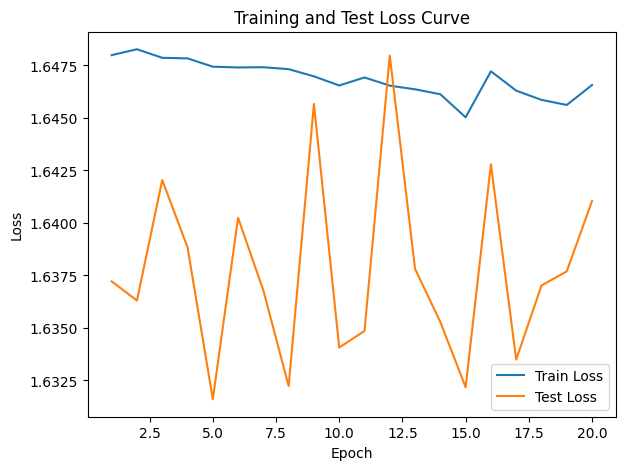

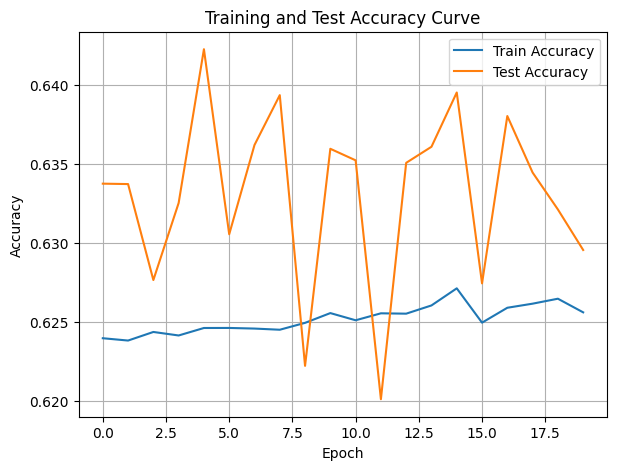

./saved_models/model_8.pth
Training Model with id 6


Training Process:   5%|▌         | 1/20 [00:36<11:24, 36.03s/it]

Epoch [1/20], Train F1:0.5913710232557606, Train Loss: 1.6462, Train Acc: 0.6260, Test F1:0.5941841484640317, Test Loss: 1.6344, Test Acc: 0.6356


Training Process:  10%|█         | 2/20 [01:14<11:13, 37.41s/it]

Epoch [2/20], Train F1:0.5915669464092952, Train Loss: 1.6460, Train Acc: 0.6261, Test F1:0.5937714783547513, Test Loss: 1.6368, Test Acc: 0.6343


Training Process:  15%|█▌        | 3/20 [01:55<11:03, 39.01s/it]

Epoch [3/20], Train F1:0.5914343529743433, Train Loss: 1.6461, Train Acc: 0.6259, Test F1:0.5923228176186348, Test Loss: 1.6375, Test Acc: 0.6334


Training Process:  20%|██        | 4/20 [02:37<10:43, 40.24s/it]

Epoch [4/20], Train F1:0.5916437523328149, Train Loss: 1.6459, Train Acc: 0.6261, Test F1:0.5925213819153692, Test Loss: 1.6371, Test Acc: 0.6336


Training Process:  25%|██▌       | 5/20 [03:19<10:13, 40.91s/it]

Epoch [5/20], Train F1:0.5916708361607442, Train Loss: 1.6459, Train Acc: 0.6261, Test F1:0.5893224232157538, Test Loss: 1.6385, Test Acc: 0.6313


Training Process:  30%|███       | 6/20 [04:03<09:48, 42.07s/it]

Epoch [6/20], Train F1:0.5915885624088552, Train Loss: 1.6459, Train Acc: 0.6260, Test F1:0.5892681129836672, Test Loss: 1.6387, Test Acc: 0.6312


Training Process:  35%|███▌      | 7/20 [04:49<09:23, 43.36s/it]

Epoch [7/20], Train F1:0.5916907047247228, Train Loss: 1.6458, Train Acc: 0.6262, Test F1:0.5887778110996903, Test Loss: 1.6392, Test Acc: 0.6307


Training Process:  40%|████      | 8/20 [05:38<08:58, 44.89s/it]

Epoch [8/20], Train F1:0.5917968963171002, Train Loss: 1.6457, Train Acc: 0.6263, Test F1:0.5881782643543034, Test Loss: 1.6395, Test Acc: 0.6303


Training Process:  45%|████▌     | 9/20 [06:27<08:27, 46.18s/it]

Epoch [9/20], Train F1:0.5918664453553503, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.5871202853993283, Test Loss: 1.6403, Test Acc: 0.6295


Training Process:  50%|█████     | 10/20 [07:18<07:58, 47.89s/it]

Epoch [10/20], Train F1:0.5919262760542247, Train Loss: 1.6455, Train Acc: 0.6264, Test F1:0.5868895128244068, Test Loss: 1.6408, Test Acc: 0.6292


Training Process:  55%|█████▌    | 11/20 [08:10<07:22, 49.12s/it]

Epoch [11/20], Train F1:0.5919787993780212, Train Loss: 1.6455, Train Acc: 0.6265, Test F1:0.586309392879626, Test Loss: 1.6409, Test Acc: 0.6288


Training Process:  60%|██████    | 12/20 [09:04<06:44, 50.51s/it]

Epoch [12/20], Train F1:0.5920146343770298, Train Loss: 1.6454, Train Acc: 0.6265, Test F1:0.5873305121272938, Test Loss: 1.6403, Test Acc: 0.6296


Training Process:  65%|██████▌   | 13/20 [10:00<06:05, 52.27s/it]

Epoch [13/20], Train F1:0.5920267758138447, Train Loss: 1.6454, Train Acc: 0.6265, Test F1:0.5880716572617436, Test Loss: 1.6400, Test Acc: 0.6301


Training Process:  70%|███████   | 14/20 [10:58<05:23, 53.84s/it]

Epoch [14/20], Train F1:0.592121348218661, Train Loss: 1.6453, Train Acc: 0.6266, Test F1:0.5887859557483529, Test Loss: 1.6397, Test Acc: 0.6306


Training Process:  75%|███████▌  | 15/20 [11:59<04:40, 56.11s/it]

Epoch [15/20], Train F1:0.5921953875741587, Train Loss: 1.6452, Train Acc: 0.6267, Test F1:0.5866170529484076, Test Loss: 1.6410, Test Acc: 0.6290


Training Process:  80%|████████  | 16/20 [12:59<03:49, 57.40s/it]

Epoch [16/20], Train F1:0.5923022609918787, Train Loss: 1.6451, Train Acc: 0.6268, Test F1:0.5851241463873514, Test Loss: 1.6418, Test Acc: 0.6279


Training Process:  85%|████████▌ | 17/20 [14:00<02:55, 58.42s/it]

Epoch [17/20], Train F1:0.5923243272010877, Train Loss: 1.6451, Train Acc: 0.6268, Test F1:0.5847956657203133, Test Loss: 1.6419, Test Acc: 0.6277


Training Process:  90%|█████████ | 18/20 [15:04<02:00, 60.18s/it]

Epoch [18/20], Train F1:0.5923657445662773, Train Loss: 1.6451, Train Acc: 0.6269, Test F1:0.5844518528942276, Test Loss: 1.6420, Test Acc: 0.6275


Training Process:  95%|█████████▌| 19/20 [16:09<01:01, 61.57s/it]

Epoch [19/20], Train F1:0.5924549906488207, Train Loss: 1.6450, Train Acc: 0.6269, Test F1:0.5839832086028901, Test Loss: 1.6424, Test Acc: 0.6271


Training Process: 100%|██████████| 20/20 [17:16<00:00, 51.83s/it]


Epoch [20/20], Train F1:0.5924497489935024, Train Loss: 1.6450, Train Acc: 0.6269, Test F1:0.5846404032977542, Test Loss: 1.6422, Test Acc: 0.6275
Total Epochs: 20
Train loss start: 1.5719282627105713, Train loss end: 1.638777732849121
Highest Mean Train Accuracy (over epoch): 0.6269428693174136
Test loss start: 1.6046475172042847, Test loss end: 1.5709514617919922
Highest mean Test Accuracy (over epoch): 0.6356402392172934


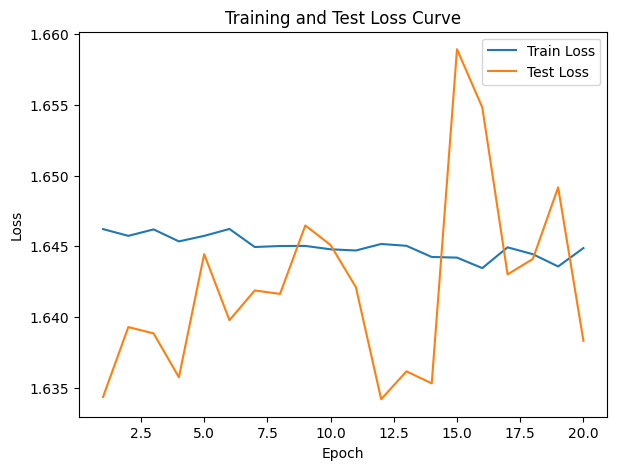

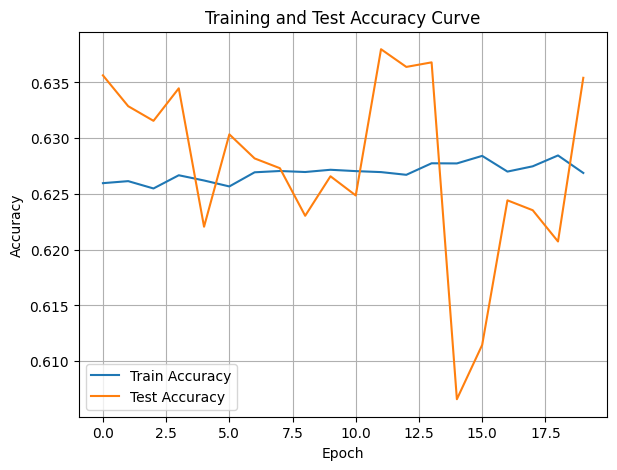

./saved_models/model_6.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=200, bias=True)
    (2): Linear(in_features=200, out_features=100, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=100, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [12]:
coverDTEmlp4b.train_DTE()

Training Process:   1%|          | 1/140 [00:35<1:22:47, 35.74s/it]

Epoch [1/140], Train F1:0.4291528082854489, Train Loss: 1.8668, Train Acc: 0.4631, Test F1:0.4957438693076951, Test Loss: 1.7400, Test Acc: 0.5674


Training Process:   1%|▏         | 2/140 [01:13<1:25:03, 36.98s/it]

Epoch [2/140], Train F1:0.4719689651799224, Train Loss: 1.7951, Train Acc: 0.5116, Test F1:0.5314145588312572, Test Loss: 1.7095, Test Acc: 0.5871


Training Process:   2%|▏         | 3/140 [01:53<1:27:22, 38.27s/it]

Epoch [3/140], Train F1:0.49618269527952796, Train Loss: 1.7620, Train Acc: 0.5347, Test F1:0.5484548569612641, Test Loss: 1.6922, Test Acc: 0.5981


Training Process:   3%|▎         | 4/140 [02:34<1:29:40, 39.56s/it]

Epoch [4/140], Train F1:0.5108359739493231, Train Loss: 1.7426, Train Acc: 0.5485, Test F1:0.5618590146188848, Test Loss: 1.6799, Test Acc: 0.6075


Training Process:   4%|▎         | 5/140 [03:18<1:31:54, 40.85s/it]

Epoch [5/140], Train F1:0.5209366349281763, Train Loss: 1.7296, Train Acc: 0.5580, Test F1:0.5699263465147822, Test Loss: 1.6716, Test Acc: 0.6138


Training Process:   4%|▍         | 6/140 [04:01<1:33:25, 41.83s/it]

Epoch [6/140], Train F1:0.5284172913220497, Train Loss: 1.7201, Train Acc: 0.5650, Test F1:0.5719147706479847, Test Loss: 1.6675, Test Acc: 0.6157


Training Process:   5%|▌         | 7/140 [04:48<1:36:19, 43.46s/it]

Epoch [7/140], Train F1:0.5344182817278552, Train Loss: 1.7127, Train Acc: 0.5707, Test F1:0.5781914555333985, Test Loss: 1.6619, Test Acc: 0.6206


Training Process:   6%|▌         | 8/140 [05:36<1:38:29, 44.77s/it]

Epoch [8/140], Train F1:0.5390986078262742, Train Loss: 1.7069, Train Acc: 0.5752, Test F1:0.5820918307654397, Test Loss: 1.6582, Test Acc: 0.6236


Training Process:   6%|▋         | 9/140 [06:25<1:41:02, 46.28s/it]

Epoch [9/140], Train F1:0.543063193459166, Train Loss: 1.7021, Train Acc: 0.5790, Test F1:0.5816123016442906, Test Loss: 1.6573, Test Acc: 0.6234


Training Process:   7%|▋         | 10/140 [07:16<1:43:15, 47.66s/it]

Epoch [10/140], Train F1:0.5462344928433291, Train Loss: 1.6981, Train Acc: 0.5820, Test F1:0.5834818736182954, Test Loss: 1.6550, Test Acc: 0.6251


Training Process:   8%|▊         | 11/140 [08:08<1:45:05, 48.88s/it]

Epoch [11/140], Train F1:0.5489678613088073, Train Loss: 1.6948, Train Acc: 0.5847, Test F1:0.5859324850961012, Test Loss: 1.6527, Test Acc: 0.6272


Training Process:   9%|▊         | 12/140 [09:02<1:48:03, 50.65s/it]

Epoch [12/140], Train F1:0.5513858342409974, Train Loss: 1.6918, Train Acc: 0.5870, Test F1:0.5885928994959795, Test Loss: 1.6504, Test Acc: 0.6294


Training Process:   9%|▉         | 13/140 [09:57<1:50:01, 51.98s/it]

Epoch [13/140], Train F1:0.5535200114564164, Train Loss: 1.6893, Train Acc: 0.5891, Test F1:0.5908694006427407, Test Loss: 1.6485, Test Acc: 0.6313


Training Process:  10%|█         | 14/140 [10:55<1:52:54, 53.76s/it]

Epoch [14/140], Train F1:0.5554567111207055, Train Loss: 1.6870, Train Acc: 0.5910, Test F1:0.5924886417659706, Test Loss: 1.6468, Test Acc: 0.6327


Training Process:  11%|█         | 15/140 [11:53<1:54:30, 54.97s/it]

Epoch [15/140], Train F1:0.5571647332040393, Train Loss: 1.6849, Train Acc: 0.5926, Test F1:0.5930136752720453, Test Loss: 1.6459, Test Acc: 0.6333


Training Process:  11%|█▏        | 16/140 [12:54<1:57:15, 56.74s/it]

Epoch [16/140], Train F1:0.5586447654149559, Train Loss: 1.6831, Train Acc: 0.5941, Test F1:0.5924104521786736, Test Loss: 1.6458, Test Acc: 0.6329


Training Process:  12%|█▏        | 17/140 [13:55<1:59:17, 58.19s/it]

Epoch [17/140], Train F1:0.5599940411651672, Train Loss: 1.6815, Train Acc: 0.5954, Test F1:0.5931791206588061, Test Loss: 1.6448, Test Acc: 0.6336


Training Process:  13%|█▎        | 18/140 [15:00<2:02:19, 60.16s/it]

Epoch [18/140], Train F1:0.5613287185815118, Train Loss: 1.6800, Train Acc: 0.5967, Test F1:0.5942345550386219, Test Loss: 1.6438, Test Acc: 0.6345


Training Process:  14%|█▎        | 19/140 [16:05<2:03:55, 61.45s/it]

Epoch [19/140], Train F1:0.5625279055403505, Train Loss: 1.6786, Train Acc: 0.5979, Test F1:0.5930017026015612, Test Loss: 1.6439, Test Acc: 0.6336


Training Process:  14%|█▍        | 20/140 [17:11<2:05:42, 62.86s/it]

Epoch [20/140], Train F1:0.563535506987133, Train Loss: 1.6774, Train Acc: 0.5988, Test F1:0.5942182960737143, Test Loss: 1.6429, Test Acc: 0.6346


Training Process:  15%|█▌        | 21/140 [18:20<2:08:15, 64.67s/it]

Epoch [21/140], Train F1:0.5644898484921622, Train Loss: 1.6762, Train Acc: 0.5998, Test F1:0.5947808018873991, Test Loss: 1.6423, Test Acc: 0.6349


Training Process:  16%|█▌        | 22/140 [19:29<2:10:06, 66.15s/it]

Epoch [22/140], Train F1:0.5654544112498094, Train Loss: 1.6751, Train Acc: 0.6007, Test F1:0.5956852624518236, Test Loss: 1.6415, Test Acc: 0.6357


Training Process:  16%|█▋        | 23/140 [20:40<2:11:44, 67.56s/it]

Epoch [23/140], Train F1:0.566316580380556, Train Loss: 1.6741, Train Acc: 0.6016, Test F1:0.5959723006151509, Test Loss: 1.6411, Test Acc: 0.6359


Training Process:  17%|█▋        | 24/140 [21:55<2:14:35, 69.62s/it]

Epoch [24/140], Train F1:0.5670859845255962, Train Loss: 1.6732, Train Acc: 0.6023, Test F1:0.5964063659675448, Test Loss: 1.6406, Test Acc: 0.6362


Training Process:  18%|█▊        | 25/140 [23:10<2:16:51, 71.40s/it]

Epoch [25/140], Train F1:0.567839484209437, Train Loss: 1.6724, Train Acc: 0.6030, Test F1:0.5967286695500215, Test Loss: 1.6402, Test Acc: 0.6364


Training Process:  19%|█▊        | 26/140 [24:27<2:18:41, 72.99s/it]

Epoch [26/140], Train F1:0.5685464017009443, Train Loss: 1.6715, Train Acc: 0.6037, Test F1:0.5972102293310707, Test Loss: 1.6397, Test Acc: 0.6368


Training Process:  19%|█▉        | 27/140 [25:44<2:19:46, 74.22s/it]

Epoch [27/140], Train F1:0.5692069797131084, Train Loss: 1.6708, Train Acc: 0.6044, Test F1:0.5978152637393344, Test Loss: 1.6392, Test Acc: 0.6374


Training Process:  20%|██        | 28/140 [27:03<2:21:02, 75.56s/it]

Epoch [28/140], Train F1:0.569840114733879, Train Loss: 1.6701, Train Acc: 0.6050, Test F1:0.5977871903584188, Test Loss: 1.6390, Test Acc: 0.6374


Training Process:  21%|██        | 29/140 [28:24<2:22:45, 77.16s/it]

Epoch [29/140], Train F1:0.5704340698077006, Train Loss: 1.6694, Train Acc: 0.6056, Test F1:0.5981667113230131, Test Loss: 1.6386, Test Acc: 0.6377


Training Process:  21%|██▏       | 30/140 [29:46<2:24:11, 78.65s/it]

Epoch [30/140], Train F1:0.5709681966035519, Train Loss: 1.6688, Train Acc: 0.6061, Test F1:0.5983997270070296, Test Loss: 1.6383, Test Acc: 0.6379


Training Process:  22%|██▏       | 31/140 [31:11<2:26:22, 80.57s/it]

Epoch [31/140], Train F1:0.5715150025338648, Train Loss: 1.6682, Train Acc: 0.6066, Test F1:0.5982521051187383, Test Loss: 1.6383, Test Acc: 0.6377


Training Process:  23%|██▎       | 32/140 [32:36<2:27:20, 81.86s/it]

Epoch [32/140], Train F1:0.5720095141657404, Train Loss: 1.6676, Train Acc: 0.6071, Test F1:0.5981895675408265, Test Loss: 1.6382, Test Acc: 0.6377


Training Process:  24%|██▎       | 33/140 [34:04<2:29:32, 83.85s/it]

Epoch [33/140], Train F1:0.5724970299713086, Train Loss: 1.6670, Train Acc: 0.6076, Test F1:0.5976986576775254, Test Loss: 1.6385, Test Acc: 0.6373


Training Process:  24%|██▍       | 34/140 [35:32<2:30:17, 85.07s/it]

Epoch [34/140], Train F1:0.5729570946010951, Train Loss: 1.6665, Train Acc: 0.6080, Test F1:0.597732765678388, Test Loss: 1.6383, Test Acc: 0.6373


Training Process:  25%|██▌       | 35/140 [37:04<2:32:19, 87.04s/it]

Epoch [35/140], Train F1:0.5733879898813388, Train Loss: 1.6660, Train Acc: 0.6084, Test F1:0.5977306913578564, Test Loss: 1.6382, Test Acc: 0.6373


Training Process:  26%|██▌       | 36/140 [38:37<2:34:00, 88.85s/it]

Epoch [36/140], Train F1:0.5738016193422314, Train Loss: 1.6655, Train Acc: 0.6088, Test F1:0.5977412389508628, Test Loss: 1.6381, Test Acc: 0.6373


Training Process:  26%|██▋       | 37/140 [40:12<2:35:43, 90.72s/it]

Epoch [37/140], Train F1:0.5742127760580034, Train Loss: 1.6651, Train Acc: 0.6092, Test F1:0.5981410384779349, Test Loss: 1.6378, Test Acc: 0.6376


Training Process:  27%|██▋       | 38/140 [41:47<2:36:40, 92.16s/it]

Epoch [38/140], Train F1:0.574605265991946, Train Loss: 1.6646, Train Acc: 0.6096, Test F1:0.5980389827865845, Test Loss: 1.6377, Test Acc: 0.6375


Training Process:  28%|██▊       | 39/140 [43:24<2:37:11, 93.39s/it]

Epoch [39/140], Train F1:0.5749829545607796, Train Loss: 1.6642, Train Acc: 0.6100, Test F1:0.5978899671626712, Test Loss: 1.6378, Test Acc: 0.6374


Training Process:  29%|██▊       | 40/140 [45:02<2:38:22, 95.02s/it]

Epoch [40/140], Train F1:0.5753365317273131, Train Loss: 1.6638, Train Acc: 0.6103, Test F1:0.5982299191108146, Test Loss: 1.6375, Test Acc: 0.6376


Training Process:  29%|██▉       | 41/140 [46:42<2:38:50, 96.27s/it]

Epoch [41/140], Train F1:0.5756859113008342, Train Loss: 1.6634, Train Acc: 0.6107, Test F1:0.5984072478159892, Test Loss: 1.6374, Test Acc: 0.6377


Training Process:  30%|███       | 42/140 [48:23<2:39:52, 97.89s/it]

Epoch [42/140], Train F1:0.5760290149601868, Train Loss: 1.6631, Train Acc: 0.6110, Test F1:0.5985072813981155, Test Loss: 1.6373, Test Acc: 0.6378


Training Process:  31%|███       | 43/140 [50:05<2:40:20, 99.19s/it]

Epoch [43/140], Train F1:0.5763755801172502, Train Loss: 1.6627, Train Acc: 0.6113, Test F1:0.5985551054379408, Test Loss: 1.6372, Test Acc: 0.6378


Training Process:  31%|███▏      | 44/140 [51:51<2:41:43, 101.08s/it]

Epoch [44/140], Train F1:0.5766768526502772, Train Loss: 1.6623, Train Acc: 0.6116, Test F1:0.5983529876634814, Test Loss: 1.6373, Test Acc: 0.6376


Training Process:  32%|███▏      | 45/140 [53:37<2:42:39, 102.73s/it]

Epoch [45/140], Train F1:0.5769838248885591, Train Loss: 1.6620, Train Acc: 0.6119, Test F1:0.5985870673707648, Test Loss: 1.6370, Test Acc: 0.6378


Training Process:  33%|███▎      | 46/140 [55:26<2:43:39, 104.47s/it]

Epoch [46/140], Train F1:0.5772810474514243, Train Loss: 1.6617, Train Acc: 0.6122, Test F1:0.5985759085459096, Test Loss: 1.6370, Test Acc: 0.6378


Training Process:  34%|███▎      | 47/140 [57:17<2:44:45, 106.29s/it]

Epoch [47/140], Train F1:0.5775441761075094, Train Loss: 1.6614, Train Acc: 0.6125, Test F1:0.5986498060455951, Test Loss: 1.6369, Test Acc: 0.6379


Training Process:  34%|███▍      | 48/140 [59:08<2:45:16, 107.79s/it]

Epoch [48/140], Train F1:0.5778089979759956, Train Loss: 1.6611, Train Acc: 0.6127, Test F1:0.5986264872939533, Test Loss: 1.6368, Test Acc: 0.6379


Training Process:  35%|███▌      | 49/140 [1:01:00<2:45:29, 109.11s/it]

Epoch [49/140], Train F1:0.5780640758318907, Train Loss: 1.6608, Train Acc: 0.6130, Test F1:0.5987045441845965, Test Loss: 1.6367, Test Acc: 0.6379


Training Process:  36%|███▌      | 50/140 [1:02:55<2:46:08, 110.77s/it]

Epoch [50/140], Train F1:0.5783150472704175, Train Loss: 1.6605, Train Acc: 0.6132, Test F1:0.5989133460765544, Test Loss: 1.6366, Test Acc: 0.6380


Training Process:  36%|███▋      | 51/140 [1:04:52<2:47:01, 112.60s/it]

Epoch [51/140], Train F1:0.5785612784720109, Train Loss: 1.6603, Train Acc: 0.6134, Test F1:0.5988419844290749, Test Loss: 1.6366, Test Acc: 0.6380


Training Process:  37%|███▋      | 52/140 [1:06:50<2:47:53, 114.47s/it]

Epoch [52/140], Train F1:0.5788053193226683, Train Loss: 1.6600, Train Acc: 0.6137, Test F1:0.5988321560399796, Test Loss: 1.6366, Test Acc: 0.6380


Training Process:  38%|███▊      | 53/140 [1:08:50<2:48:21, 116.11s/it]

Epoch [53/140], Train F1:0.5790345342498242, Train Loss: 1.6597, Train Acc: 0.6139, Test F1:0.5989124427620027, Test Loss: 1.6365, Test Acc: 0.6380


Training Process:  39%|███▊      | 54/140 [1:10:51<2:48:21, 117.46s/it]

Epoch [54/140], Train F1:0.5792665007381622, Train Loss: 1.6595, Train Acc: 0.6141, Test F1:0.5989703005004933, Test Loss: 1.6363, Test Acc: 0.6381


Training Process:  39%|███▉      | 55/140 [1:12:53<2:48:17, 118.80s/it]

Epoch [55/140], Train F1:0.5794830391085497, Train Loss: 1.6592, Train Acc: 0.6143, Test F1:0.5990241262734024, Test Loss: 1.6363, Test Acc: 0.6381


Training Process:  40%|████      | 56/140 [1:14:58<2:48:49, 120.59s/it]

Epoch [56/140], Train F1:0.5797139169576082, Train Loss: 1.6590, Train Acc: 0.6146, Test F1:0.5991050146618304, Test Loss: 1.6363, Test Acc: 0.6381


Training Process:  41%|████      | 57/140 [1:17:04<2:49:17, 122.38s/it]

Epoch [57/140], Train F1:0.5799375050818916, Train Loss: 1.6588, Train Acc: 0.6148, Test F1:0.5992497669858514, Test Loss: 1.6361, Test Acc: 0.6382


Training Process:  41%|████▏     | 58/140 [1:19:11<2:49:00, 123.66s/it]

Epoch [58/140], Train F1:0.5801314624526366, Train Loss: 1.6585, Train Acc: 0.6149, Test F1:0.5993119114926976, Test Loss: 1.6360, Test Acc: 0.6383


Training Process:  42%|████▏     | 59/140 [1:21:20<2:49:10, 125.32s/it]

Epoch [59/140], Train F1:0.5803242742276743, Train Loss: 1.6583, Train Acc: 0.6151, Test F1:0.5993536139056574, Test Loss: 1.6360, Test Acc: 0.6383


Training Process:  43%|████▎     | 60/140 [1:23:31<2:49:24, 127.06s/it]

Epoch [60/140], Train F1:0.5805200617356612, Train Loss: 1.6581, Train Acc: 0.6153, Test F1:0.5994508044070113, Test Loss: 1.6359, Test Acc: 0.6384


Training Process:  44%|████▎     | 61/140 [1:25:45<2:50:08, 129.22s/it]

Epoch [61/140], Train F1:0.5806994894686957, Train Loss: 1.6579, Train Acc: 0.6155, Test F1:0.5995022320781478, Test Loss: 1.6359, Test Acc: 0.6384


Training Process:  44%|████▍     | 62/140 [1:28:00<2:50:03, 130.81s/it]

Epoch [62/140], Train F1:0.5808771541948198, Train Loss: 1.6577, Train Acc: 0.6157, Test F1:0.5994372422361576, Test Loss: 1.6359, Test Acc: 0.6384


Training Process:  45%|████▌     | 63/140 [1:30:15<2:49:34, 132.14s/it]

Epoch [63/140], Train F1:0.5810384185262426, Train Loss: 1.6575, Train Acc: 0.6158, Test F1:0.599598605022975, Test Loss: 1.6358, Test Acc: 0.6385


Training Process:  46%|████▌     | 64/140 [1:32:33<2:49:41, 133.97s/it]

Epoch [64/140], Train F1:0.5812217272180412, Train Loss: 1.6573, Train Acc: 0.6160, Test F1:0.5996983113338795, Test Loss: 1.6357, Test Acc: 0.6386


Training Process:  46%|████▋     | 65/140 [1:34:52<2:49:12, 135.37s/it]

Epoch [65/140], Train F1:0.5813925928250877, Train Loss: 1.6572, Train Acc: 0.6162, Test F1:0.5996441616484691, Test Loss: 1.6357, Test Acc: 0.6385


Training Process:  47%|████▋     | 66/140 [1:37:12<2:48:47, 136.85s/it]

Epoch [66/140], Train F1:0.5815609218533839, Train Loss: 1.6570, Train Acc: 0.6163, Test F1:0.5996395440806891, Test Loss: 1.6357, Test Acc: 0.6385


Training Process:  48%|████▊     | 67/140 [1:39:37<2:49:18, 139.16s/it]

Epoch [67/140], Train F1:0.5817200760770376, Train Loss: 1.6568, Train Acc: 0.6165, Test F1:0.5996428508846087, Test Loss: 1.6357, Test Acc: 0.6385


Training Process:  49%|████▊     | 68/140 [1:42:01<2:48:45, 140.63s/it]

Epoch [68/140], Train F1:0.5818748029104, Train Loss: 1.6566, Train Acc: 0.6166, Test F1:0.5996552649563809, Test Loss: 1.6357, Test Acc: 0.6385


Training Process:  49%|████▉     | 69/140 [1:44:28<2:48:35, 142.47s/it]

Epoch [69/140], Train F1:0.5820402481216487, Train Loss: 1.6565, Train Acc: 0.6168, Test F1:0.5996566382127951, Test Loss: 1.6357, Test Acc: 0.6385


Training Process:  50%|█████     | 70/140 [1:46:54<2:47:34, 143.63s/it]

Epoch [70/140], Train F1:0.5821931610925535, Train Loss: 1.6563, Train Acc: 0.6169, Test F1:0.5995698768421402, Test Loss: 1.6357, Test Acc: 0.6384


Training Process:  51%|█████     | 71/140 [1:49:23<2:47:03, 145.27s/it]

Epoch [71/140], Train F1:0.5823528453890546, Train Loss: 1.6561, Train Acc: 0.6171, Test F1:0.5995046269080113, Test Loss: 1.6357, Test Acc: 0.6384


Training Process:  51%|█████▏    | 72/140 [1:51:52<2:46:01, 146.49s/it]

Epoch [72/140], Train F1:0.5825024189312062, Train Loss: 1.6560, Train Acc: 0.6172, Test F1:0.5996215618112931, Test Loss: 1.6356, Test Acc: 0.6384


Training Process:  52%|█████▏    | 73/140 [1:54:26<2:45:52, 148.54s/it]

Epoch [73/140], Train F1:0.5826494239468273, Train Loss: 1.6558, Train Acc: 0.6174, Test F1:0.5997658201495865, Test Loss: 1.6355, Test Acc: 0.6385


Training Process:  53%|█████▎    | 74/140 [1:57:01<2:45:25, 150.38s/it]

Epoch [74/140], Train F1:0.5827859454462181, Train Loss: 1.6557, Train Acc: 0.6175, Test F1:0.5997346505070447, Test Loss: 1.6356, Test Acc: 0.6385


Training Process:  54%|█████▎    | 75/140 [1:59:37<2:44:58, 152.29s/it]

Epoch [75/140], Train F1:0.5829394305831389, Train Loss: 1.6555, Train Acc: 0.6176, Test F1:0.5997442773710644, Test Loss: 1.6356, Test Acc: 0.6385


Training Process:  54%|█████▍    | 76/140 [2:02:15<2:44:10, 153.92s/it]

Epoch [76/140], Train F1:0.5830735368949909, Train Loss: 1.6554, Train Acc: 0.6178, Test F1:0.599840412704204, Test Loss: 1.6355, Test Acc: 0.6386


Training Process:  55%|█████▌    | 77/140 [2:05:55<3:02:17, 173.61s/it]

Epoch [77/140], Train F1:0.5832059151811552, Train Loss: 1.6552, Train Acc: 0.6179, Test F1:0.6000616650257513, Test Loss: 1.6353, Test Acc: 0.6387


Training Process:  56%|█████▌    | 78/140 [2:08:44<2:58:06, 172.36s/it]

Epoch [78/140], Train F1:0.5833397297721366, Train Loss: 1.6551, Train Acc: 0.6180, Test F1:0.6001425161947289, Test Loss: 1.6353, Test Acc: 0.6388


Training Process:  56%|█████▋    | 79/140 [2:11:34<2:54:35, 171.73s/it]

Epoch [79/140], Train F1:0.5834604074876927, Train Loss: 1.6549, Train Acc: 0.6181, Test F1:0.600060535741088, Test Loss: 1.6353, Test Acc: 0.6387


Training Process:  57%|█████▋    | 80/140 [2:14:13<2:47:43, 167.73s/it]

Epoch [80/140], Train F1:0.5835937912848634, Train Loss: 1.6548, Train Acc: 0.6183, Test F1:0.6000860777206402, Test Loss: 1.6353, Test Acc: 0.6387


Training Process:  58%|█████▊    | 81/140 [2:17:02<2:45:16, 168.08s/it]

Epoch [81/140], Train F1:0.5837233962132812, Train Loss: 1.6547, Train Acc: 0.6184, Test F1:0.6001057009162979, Test Loss: 1.6353, Test Acc: 0.6387


Training Process:  59%|█████▊    | 82/140 [2:19:49<2:42:22, 167.98s/it]

Epoch [82/140], Train F1:0.5838410109459684, Train Loss: 1.6545, Train Acc: 0.6185, Test F1:0.6000740411866163, Test Loss: 1.6353, Test Acc: 0.6387


Training Process:  59%|█████▉    | 83/140 [2:22:37<2:39:26, 167.84s/it]

Epoch [83/140], Train F1:0.5839538559195931, Train Loss: 1.6544, Train Acc: 0.6186, Test F1:0.6000377266459287, Test Loss: 1.6354, Test Acc: 0.6387


Training Process:  60%|██████    | 84/140 [2:25:28<2:37:32, 168.80s/it]

Epoch [84/140], Train F1:0.5840827445317753, Train Loss: 1.6543, Train Acc: 0.6187, Test F1:0.5992916279746877, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  61%|██████    | 85/140 [2:28:22<2:36:11, 170.40s/it]

Epoch [85/140], Train F1:0.5842002728136246, Train Loss: 1.6542, Train Acc: 0.6188, Test F1:0.5993647181659644, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  61%|██████▏   | 86/140 [2:31:17<2:34:43, 171.91s/it]

Epoch [86/140], Train F1:0.5843087840562202, Train Loss: 1.6541, Train Acc: 0.6189, Test F1:0.5994656126503307, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  62%|██████▏   | 87/140 [2:34:21<2:34:54, 175.37s/it]

Epoch [87/140], Train F1:0.5844263479512173, Train Loss: 1.6539, Train Acc: 0.6190, Test F1:0.5995707500030258, Test Loss: 1.6357, Test Acc: 0.6383


Training Process:  63%|██████▎   | 88/140 [2:37:25<2:34:13, 177.96s/it]

Epoch [88/140], Train F1:0.5845388469893286, Train Loss: 1.6538, Train Acc: 0.6192, Test F1:0.5993601780681923, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  64%|██████▎   | 89/140 [2:40:25<2:31:43, 178.49s/it]

Epoch [89/140], Train F1:0.5846492519565307, Train Loss: 1.6537, Train Acc: 0.6193, Test F1:0.5993807956944898, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  64%|██████▍   | 90/140 [2:43:28<2:29:58, 179.98s/it]

Epoch [90/140], Train F1:0.5847615616389181, Train Loss: 1.6536, Train Acc: 0.6194, Test F1:0.5994129882323767, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  65%|██████▌   | 91/140 [2:46:33<2:28:12, 181.48s/it]

Epoch [91/140], Train F1:0.5848617538156683, Train Loss: 1.6535, Train Acc: 0.6195, Test F1:0.5994214995141813, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  66%|██████▌   | 92/140 [2:49:38<2:26:05, 182.61s/it]

Epoch [92/140], Train F1:0.5849682832402654, Train Loss: 1.6534, Train Acc: 0.6196, Test F1:0.5994681430094914, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  66%|██████▋   | 93/140 [2:52:48<2:24:37, 184.64s/it]

Epoch [93/140], Train F1:0.5850718477335568, Train Loss: 1.6532, Train Acc: 0.6197, Test F1:0.599524693121164, Test Loss: 1.6356, Test Acc: 0.6382


Training Process:  67%|██████▋   | 94/140 [2:55:59<2:23:06, 186.66s/it]

Epoch [94/140], Train F1:0.5851756823078047, Train Loss: 1.6531, Train Acc: 0.6198, Test F1:0.5995255955061825, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  68%|██████▊   | 95/140 [2:59:20<2:23:10, 190.90s/it]

Epoch [95/140], Train F1:0.5852634832227089, Train Loss: 1.6530, Train Acc: 0.6198, Test F1:0.5995139434304424, Test Loss: 1.6356, Test Acc: 0.6382


Training Process:  69%|██████▊   | 96/140 [3:02:39<2:21:51, 193.44s/it]

Epoch [96/140], Train F1:0.5853513297464951, Train Loss: 1.6529, Train Acc: 0.6199, Test F1:0.5994423061985702, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  69%|██████▉   | 97/140 [3:06:04<2:21:11, 197.01s/it]

Epoch [97/140], Train F1:0.5854475273047914, Train Loss: 1.6528, Train Acc: 0.6200, Test F1:0.5993906028715348, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  70%|███████   | 98/140 [3:09:30<2:19:39, 199.50s/it]

Epoch [98/140], Train F1:0.5855477365034183, Train Loss: 1.6527, Train Acc: 0.6201, Test F1:0.5994688504037686, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  71%|███████   | 99/140 [3:12:57<2:17:53, 201.80s/it]

Epoch [99/140], Train F1:0.5856423621487563, Train Loss: 1.6526, Train Acc: 0.6202, Test F1:0.5994952628641107, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  71%|███████▏  | 100/140 [3:16:34<2:17:30, 206.27s/it]

Epoch [100/140], Train F1:0.5857385701051344, Train Loss: 1.6525, Train Acc: 0.6203, Test F1:0.5994898626217467, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  72%|███████▏  | 101/140 [3:20:14<2:16:49, 210.49s/it]

Epoch [101/140], Train F1:0.5858251482261155, Train Loss: 1.6524, Train Acc: 0.6204, Test F1:0.5994876630941622, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  73%|███████▎  | 102/140 [3:23:50<2:14:26, 212.28s/it]

Epoch [102/140], Train F1:0.5859213718140127, Train Loss: 1.6523, Train Acc: 0.6205, Test F1:0.5995183304444799, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  74%|███████▎  | 103/140 [3:27:29<2:11:59, 214.04s/it]

Epoch [103/140], Train F1:0.5860141359759895, Train Loss: 1.6523, Train Acc: 0.6206, Test F1:0.5995036560134873, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  74%|███████▍  | 104/140 [3:31:09<2:09:34, 215.95s/it]

Epoch [104/140], Train F1:0.5861066614282314, Train Loss: 1.6522, Train Acc: 0.6206, Test F1:0.5994679836346976, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  75%|███████▌  | 105/140 [3:34:53<2:07:25, 218.43s/it]

Epoch [105/140], Train F1:0.5861957256555913, Train Loss: 1.6521, Train Acc: 0.6207, Test F1:0.599480582669425, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  76%|███████▌  | 106/140 [3:38:39<2:04:58, 220.54s/it]

Epoch [106/140], Train F1:0.5862889858909438, Train Loss: 1.6520, Train Acc: 0.6208, Test F1:0.5995320130336235, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  76%|███████▋  | 107/140 [3:42:23<2:01:59, 221.80s/it]

Epoch [107/140], Train F1:0.5863765256656547, Train Loss: 1.6519, Train Acc: 0.6209, Test F1:0.5995978613847075, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  77%|███████▋  | 108/140 [3:46:25<2:01:29, 227.80s/it]

Epoch [108/140], Train F1:0.5864663788404008, Train Loss: 1.6518, Train Acc: 0.6210, Test F1:0.5995275063736263, Test Loss: 1.6357, Test Acc: 0.6382


Training Process:  78%|███████▊  | 109/140 [3:50:20<1:58:46, 229.88s/it]

Epoch [109/140], Train F1:0.5865498398531959, Train Loss: 1.6517, Train Acc: 0.6211, Test F1:0.599469860406432, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  79%|███████▊  | 110/140 [3:54:29<1:57:53, 235.77s/it]

Epoch [110/140], Train F1:0.5866341015735674, Train Loss: 1.6516, Train Acc: 0.6211, Test F1:0.5994615235010858, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  79%|███████▉  | 111/140 [3:58:28<1:54:25, 236.73s/it]

Epoch [111/140], Train F1:0.5867129536944321, Train Loss: 1.6515, Train Acc: 0.6212, Test F1:0.5995147573793774, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  80%|████████  | 112/140 [4:02:44<1:53:06, 242.37s/it]

Epoch [112/140], Train F1:0.5867956939731752, Train Loss: 1.6514, Train Acc: 0.6213, Test F1:0.5994883104979764, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  81%|████████  | 113/140 [4:07:08<1:51:57, 248.81s/it]

Epoch [113/140], Train F1:0.586877592305292, Train Loss: 1.6514, Train Acc: 0.6214, Test F1:0.5994973305207009, Test Loss: 1.6357, Test Acc: 0.6381


Training Process:  81%|████████▏ | 114/140 [4:11:31<1:49:40, 253.11s/it]

Epoch [114/140], Train F1:0.5869538348925151, Train Loss: 1.6513, Train Acc: 0.6215, Test F1:0.5994199672337476, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  82%|████████▏ | 115/140 [4:15:54<1:46:44, 256.19s/it]

Epoch [115/140], Train F1:0.5870267803612467, Train Loss: 1.6512, Train Acc: 0.6215, Test F1:0.5994232848455888, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  83%|████████▎ | 116/140 [4:20:23<1:43:55, 259.83s/it]

Epoch [116/140], Train F1:0.5871075966678043, Train Loss: 1.6511, Train Acc: 0.6216, Test F1:0.5994502696547817, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  84%|████████▎ | 117/140 [4:24:51<1:40:37, 262.52s/it]

Epoch [117/140], Train F1:0.5871872138551855, Train Loss: 1.6510, Train Acc: 0.6217, Test F1:0.5994768610585575, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  84%|████████▍ | 118/140 [4:29:41<1:39:12, 270.55s/it]

Epoch [118/140], Train F1:0.5872618861401364, Train Loss: 1.6510, Train Acc: 0.6217, Test F1:0.5994645225867151, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  85%|████████▌ | 119/140 [4:34:29<1:36:33, 275.87s/it]

Epoch [119/140], Train F1:0.5873234942050728, Train Loss: 1.6509, Train Acc: 0.6218, Test F1:0.5994652260540361, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  86%|████████▌ | 120/140 [4:39:23<1:33:48, 281.44s/it]

Epoch [120/140], Train F1:0.5873902390066005, Train Loss: 1.6508, Train Acc: 0.6219, Test F1:0.5995389444310838, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  86%|████████▋ | 121/140 [4:44:11<1:29:39, 283.13s/it]

Epoch [121/140], Train F1:0.5874556467298699, Train Loss: 1.6508, Train Acc: 0.6219, Test F1:0.5995300793601988, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  87%|████████▋ | 122/140 [4:49:06<1:26:03, 286.86s/it]

Epoch [122/140], Train F1:0.5875279654748887, Train Loss: 1.6507, Train Acc: 0.6220, Test F1:0.5994775345855287, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  88%|████████▊ | 123/140 [4:54:05<1:22:17, 290.46s/it]

Epoch [123/140], Train F1:0.5875996579185744, Train Loss: 1.6506, Train Acc: 0.6221, Test F1:0.5993994449193493, Test Loss: 1.6359, Test Acc: 0.6380


Training Process:  89%|████████▊ | 124/140 [4:59:05<1:18:12, 293.30s/it]

Epoch [124/140], Train F1:0.5876734326883085, Train Loss: 1.6505, Train Acc: 0.6221, Test F1:0.5994274807686825, Test Loss: 1.6359, Test Acc: 0.6380


Training Process:  89%|████████▉ | 125/140 [5:06:33<1:24:57, 339.84s/it]

Epoch [125/140], Train F1:0.5877434997367778, Train Loss: 1.6505, Train Acc: 0.6222, Test F1:0.5994660433476228, Test Loss: 1.6358, Test Acc: 0.6381


Training Process:  90%|█████████ | 126/140 [5:13:25<1:24:18, 361.35s/it]

Epoch [126/140], Train F1:0.5878106215281893, Train Loss: 1.6504, Train Acc: 0.6223, Test F1:0.5994403591771265, Test Loss: 1.6358, Test Acc: 0.6380


Training Process:  91%|█████████ | 127/140 [5:20:00<1:20:29, 371.50s/it]

Epoch [127/140], Train F1:0.5878760030805918, Train Loss: 1.6503, Train Acc: 0.6223, Test F1:0.5994469318644488, Test Loss: 1.6358, Test Acc: 0.6380


Training Process:  91%|█████████▏| 128/140 [5:26:05<1:13:53, 369.42s/it]

Epoch [128/140], Train F1:0.5879363188102849, Train Loss: 1.6503, Train Acc: 0.6224, Test F1:0.5993525565808017, Test Loss: 1.6359, Test Acc: 0.6380


Training Process:  92%|█████████▏| 129/140 [5:31:43<1:06:01, 360.10s/it]

Epoch [129/140], Train F1:0.5879917887873717, Train Loss: 1.6502, Train Acc: 0.6224, Test F1:0.5993417767018976, Test Loss: 1.6359, Test Acc: 0.6380


Training Process:  93%|█████████▎| 130/140 [5:37:47<1:00:12, 361.20s/it]

Epoch [130/140], Train F1:0.5880541841035848, Train Loss: 1.6501, Train Acc: 0.6225, Test F1:0.5993146702096749, Test Loss: 1.6359, Test Acc: 0.6379


Training Process:  94%|█████████▎| 131/140 [5:43:58<54:37, 364.18s/it]  

Epoch [131/140], Train F1:0.5881170105801643, Train Loss: 1.6501, Train Acc: 0.6226, Test F1:0.5991768252547909, Test Loss: 1.6360, Test Acc: 0.6378


Training Process:  94%|█████████▍| 132/140 [5:49:56<48:18, 362.26s/it]

Epoch [132/140], Train F1:0.5881835749544485, Train Loss: 1.6500, Train Acc: 0.6226, Test F1:0.5991804393488532, Test Loss: 1.6360, Test Acc: 0.6378


Training Process:  95%|█████████▌| 133/140 [5:55:53<42:05, 360.81s/it]

Epoch [133/140], Train F1:0.5882491168152763, Train Loss: 1.6499, Train Acc: 0.6227, Test F1:0.5991853198193022, Test Loss: 1.6360, Test Acc: 0.6378


Training Process:  96%|█████████▌| 134/140 [6:02:12<36:37, 366.29s/it]

Epoch [134/140], Train F1:0.5883124924576957, Train Loss: 1.6499, Train Acc: 0.6227, Test F1:0.5990102410594137, Test Loss: 1.6361, Test Acc: 0.6377


Training Process:  96%|█████████▋| 135/140 [6:08:47<31:13, 374.73s/it]

Epoch [135/140], Train F1:0.5883731624716195, Train Loss: 1.6498, Train Acc: 0.6228, Test F1:0.598989222554981, Test Loss: 1.6361, Test Acc: 0.6377


Training Process:  97%|█████████▋| 136/140 [6:15:14<25:14, 378.64s/it]

Epoch [136/140], Train F1:0.5884360997064314, Train Loss: 1.6497, Train Acc: 0.6229, Test F1:0.5988839380564422, Test Loss: 1.6361, Test Acc: 0.6376


Training Process:  98%|█████████▊| 137/140 [6:21:49<19:09, 383.32s/it]

Epoch [137/140], Train F1:0.5884948959812983, Train Loss: 1.6497, Train Acc: 0.6229, Test F1:0.598810567320488, Test Loss: 1.6362, Test Acc: 0.6375


Training Process:  99%|█████████▊| 138/140 [6:28:34<13:00, 390.06s/it]

Epoch [138/140], Train F1:0.5885597521364516, Train Loss: 1.6496, Train Acc: 0.6230, Test F1:0.5987922693093032, Test Loss: 1.6362, Test Acc: 0.6375


Training Process:  99%|█████████▉| 139/140 [6:36:18<06:52, 412.12s/it]

Epoch [139/140], Train F1:0.588621092669591, Train Loss: 1.6495, Train Acc: 0.6230, Test F1:0.5986991530961874, Test Loss: 1.6363, Test Acc: 0.6374


Training Process: 100%|██████████| 140/140 [6:43:11<00:00, 172.79s/it]


Epoch [140/140], Train F1:0.5886760828779736, Train Loss: 1.6495, Train Acc: 0.6231, Test F1:0.598674713509887, Test Loss: 1.6363, Test Acc: 0.6374
Total Epochs: 140
Train loss start: 2.072110176086426, Train loss end: 1.6347994804382324
Highest Mean Train Accuracy (over epoch): 0.6230919028825399
Test loss start: 1.721462607383728, Test loss end: 1.5782667398452759
Highest Mean Test Accuracy (over epoch): 0.6387917522867034


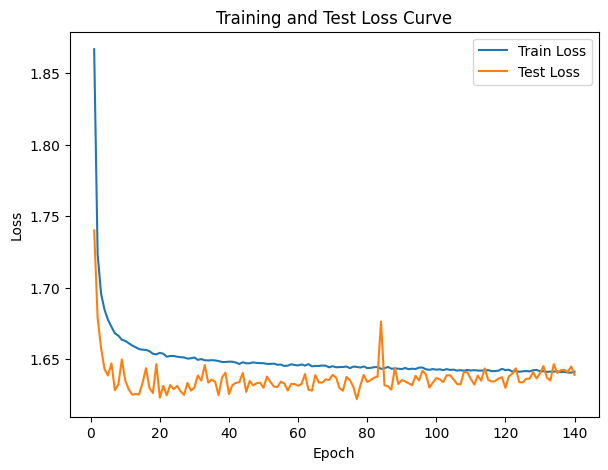

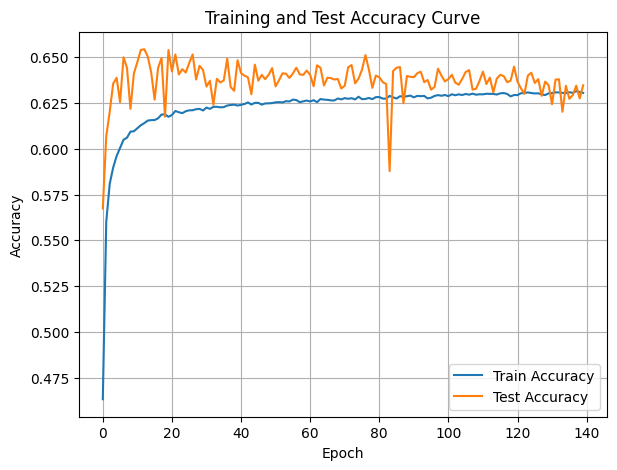

In [13]:
coverDTEmlp4b.train_single_model()

# Base 8, 3 Trails

In [14]:
hidden_layers = [50, 100, 50]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
coverDTEmlp8b = DeepTreeEnsemble(task_name='multi-classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=8,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.00001)

Randomly initializing 8 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:37<05:40, 37.81s/it]

Epoch [1/10], Train F1:0.40697502228912585, Train Loss: 1.9285, Train Acc: 0.4137, Test F1:0.5061435379046146, Test Loss: 1.8270, Test Acc: 0.5633


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.28s/it]

Epoch [2/10], Train F1:0.4299747889310589, Train Loss: 1.8573, Train Acc: 0.4625, Test F1:0.4795786323492528, Test Loss: 1.7862, Test Acc: 0.5492


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.46s/it]

Epoch [3/10], Train F1:0.4444958272387327, Train Loss: 1.8194, Train Acc: 0.4866, Test F1:0.49259800061088976, Test Loss: 1.7598, Test Acc: 0.5592


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.94s/it]

Epoch [4/10], Train F1:0.4589123000694325, Train Loss: 1.7953, Train Acc: 0.5030, Test F1:0.5003337096021995, Test Loss: 1.7451, Test Acc: 0.5661


Training Process:  50%|█████     | 5/10 [03:21<03:25, 41.14s/it]

Epoch [5/10], Train F1:0.4714425887656977, Train Loss: 1.7782, Train Acc: 0.5153, Test F1:0.5062065414536419, Test Loss: 1.7339, Test Acc: 0.5709


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.64s/it]

Epoch [6/10], Train F1:0.4821517485477278, Train Loss: 1.7652, Train Acc: 0.5250, Test F1:0.5151435534112669, Test Loss: 1.7234, Test Acc: 0.5762


Training Process:  70%|███████   | 7/10 [04:53<02:12, 44.05s/it]

Epoch [7/10], Train F1:0.49128901923997126, Train Loss: 1.7547, Train Acc: 0.5331, Test F1:0.5257210161455409, Test Loss: 1.7139, Test Acc: 0.5823


Training Process:  80%|████████  | 8/10 [05:41<01:30, 45.12s/it]

Epoch [8/10], Train F1:0.49888601309279923, Train Loss: 1.7463, Train Acc: 0.5397, Test F1:0.5327573478482402, Test Loss: 1.7068, Test Acc: 0.5867


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.78s/it]

Epoch [9/10], Train F1:0.5053864851043066, Train Loss: 1.7391, Train Acc: 0.5454, Test F1:0.5387852966691091, Test Loss: 1.7009, Test Acc: 0.5906


Training Process: 100%|██████████| 10/10 [07:23<00:00, 44.30s/it]


Epoch [10/10], Train F1:0.5108812150870944, Train Loss: 1.7331, Train Acc: 0.5502, Test F1:0.5441741754481604, Test Loss: 1.6957, Test Acc: 0.5944
Total Epochs: 10
Train loss start: 2.046779155731201, Train loss end: 1.6358340978622437
Highest Mean Train Accuracy (over epoch): 0.5502482774789024
Test loss start: 1.7970476150512695, Test loss end: 1.6274585723876953
Highest mean Test Accuracy (over epoch): 0.5943587082842435


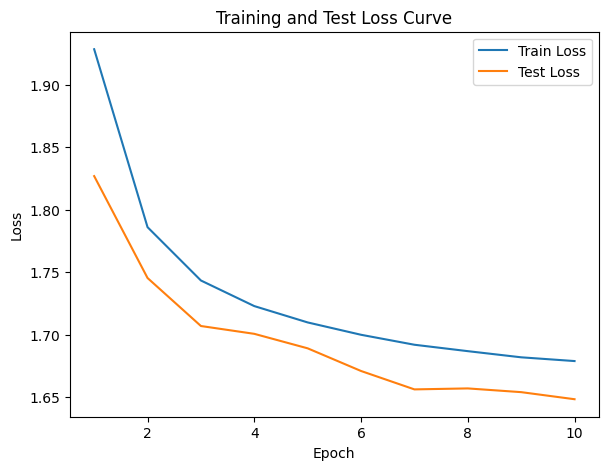

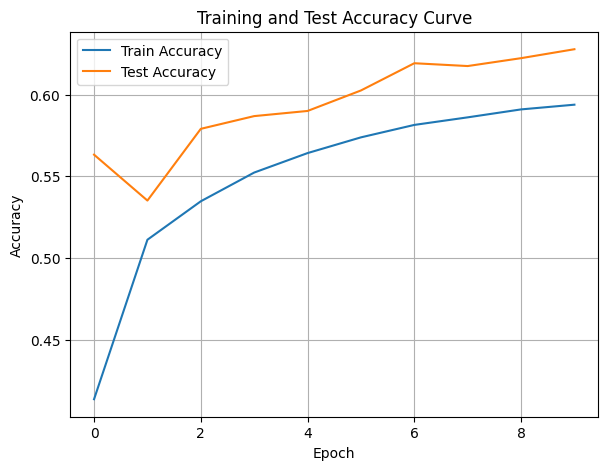

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.88s/it]

Epoch [1/10], Train F1:0.341668153728184, Train Loss: 1.9531, Train Acc: 0.4021, Test F1:0.3294577878195803, Test Loss: 1.8245, Test Acc: 0.4849


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.99s/it]

Epoch [2/10], Train F1:0.3837160490790212, Train Loss: 1.8697, Train Acc: 0.4569, Test F1:0.3628850061418264, Test Loss: 1.7861, Test Acc: 0.5004


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.37s/it]

Epoch [3/10], Train F1:0.4103589437431916, Train Loss: 1.8275, Train Acc: 0.4820, Test F1:0.4237172459327646, Test Loss: 1.7594, Test Acc: 0.5270


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.98s/it]

Epoch [4/10], Train F1:0.43220966687763174, Train Loss: 1.8017, Train Acc: 0.4987, Test F1:0.4535484354211792, Test Loss: 1.7426, Test Acc: 0.5416


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.34s/it]

Epoch [5/10], Train F1:0.44785855638210975, Train Loss: 1.7843, Train Acc: 0.5105, Test F1:0.4710419512308101, Test Loss: 1.7310, Test Acc: 0.5509


Training Process:  60%|██████    | 6/10 [04:07<02:51, 42.83s/it]

Epoch [6/10], Train F1:0.45941039093436326, Train Loss: 1.7716, Train Acc: 0.5193, Test F1:0.48267102174018317, Test Loss: 1.7228, Test Acc: 0.5576


Training Process:  70%|███████   | 7/10 [04:52<02:10, 43.66s/it]

Epoch [7/10], Train F1:0.4687837625828668, Train Loss: 1.7617, Train Acc: 0.5265, Test F1:0.4905376305502072, Test Loss: 1.7166, Test Acc: 0.5624


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.03s/it]

Epoch [8/10], Train F1:0.4775500763533781, Train Loss: 1.7533, Train Acc: 0.5329, Test F1:0.4981293908072617, Test Loss: 1.7111, Test Acc: 0.5667


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.56s/it]

Epoch [9/10], Train F1:0.485956238371718, Train Loss: 1.7461, Train Acc: 0.5386, Test F1:0.5056872508216768, Test Loss: 1.7060, Test Acc: 0.5709


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.19s/it]

Epoch [10/10], Train F1:0.4936627652866226, Train Loss: 1.7397, Train Acc: 0.5438, Test F1:0.5096961129522652, Test Loss: 1.7028, Test Acc: 0.5734
Total Epochs: 10
Train loss start: 2.0961389541625977, Train loss end: 1.655443549156189
Highest Mean Train Accuracy (over epoch): 0.5437626875107041
Test loss start: 1.8205327987670898, Test loss end: 1.6260110139846802
Highest mean Test Accuracy (over epoch): 0.5733970408385413


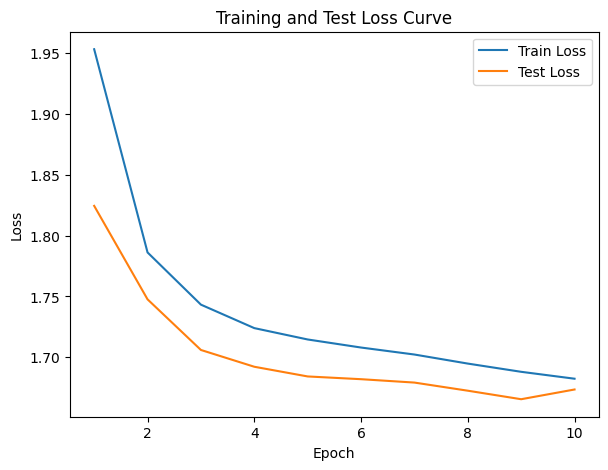

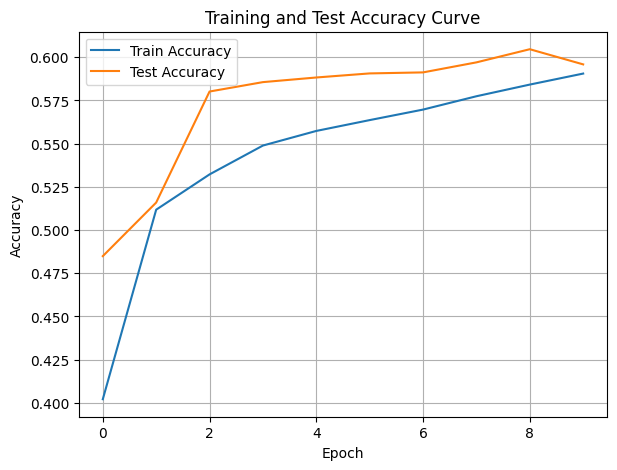

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.06s/it]

Epoch [1/10], Train F1:0.3912927533796651, Train Loss: 1.9526, Train Acc: 0.3833, Test F1:0.35088038306642744, Test Loss: 1.8158, Test Acc: 0.4912


Training Process:  20%|██        | 2/10 [01:17<05:12, 39.04s/it]

Epoch [2/10], Train F1:0.4389308476945667, Train Loss: 1.8696, Train Acc: 0.4485, Test F1:0.3755990224209052, Test Loss: 1.7848, Test Acc: 0.5017


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.61s/it]

Epoch [3/10], Train F1:0.4605136316272247, Train Loss: 1.8253, Train Acc: 0.4802, Test F1:0.38672216095589407, Test Loss: 1.7694, Test Acc: 0.5073


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.43s/it]

Epoch [4/10], Train F1:0.47537517827002257, Train Loss: 1.7976, Train Acc: 0.5005, Test F1:0.4016652661108628, Test Loss: 1.7577, Test Acc: 0.5151


Training Process:  50%|█████     | 5/10 [03:21<03:25, 41.18s/it]

Epoch [5/10], Train F1:0.4871509120207044, Train Loss: 1.7783, Train Acc: 0.5151, Test F1:0.4142861841621228, Test Loss: 1.7482, Test Acc: 0.5222


Training Process:  60%|██████    | 6/10 [04:07<02:51, 42.78s/it]

Epoch [6/10], Train F1:0.49664542222535263, Train Loss: 1.7639, Train Acc: 0.5263, Test F1:0.4277839158436224, Test Loss: 1.7392, Test Acc: 0.5296


Training Process:  70%|███████   | 7/10 [04:52<02:10, 43.52s/it]

Epoch [7/10], Train F1:0.5044452753654356, Train Loss: 1.7527, Train Acc: 0.5351, Test F1:0.4435334630816591, Test Loss: 1.7306, Test Acc: 0.5380


Training Process:  80%|████████  | 8/10 [05:39<01:29, 44.62s/it]

Epoch [8/10], Train F1:0.5108316621075, Train Loss: 1.7438, Train Acc: 0.5422, Test F1:0.4553958522473603, Test Loss: 1.7235, Test Acc: 0.5446


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.39s/it]

Epoch [9/10], Train F1:0.5164038630613563, Train Loss: 1.7364, Train Acc: 0.5482, Test F1:0.46412657728803547, Test Loss: 1.7179, Test Acc: 0.5497


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.15s/it]

Epoch [10/10], Train F1:0.5210041617902513, Train Loss: 1.7302, Train Acc: 0.5532, Test F1:0.47251227896101117, Test Loss: 1.7129, Test Acc: 0.5545
Total Epochs: 10
Train loss start: 2.059539794921875, Train loss end: 1.5954967737197876
Highest Mean Train Accuracy (over epoch): 0.553164358568152
Test loss start: 1.8057010173797607, Test loss end: 1.6276856660842896
Highest mean Test Accuracy (over epoch): 0.5544615529914968


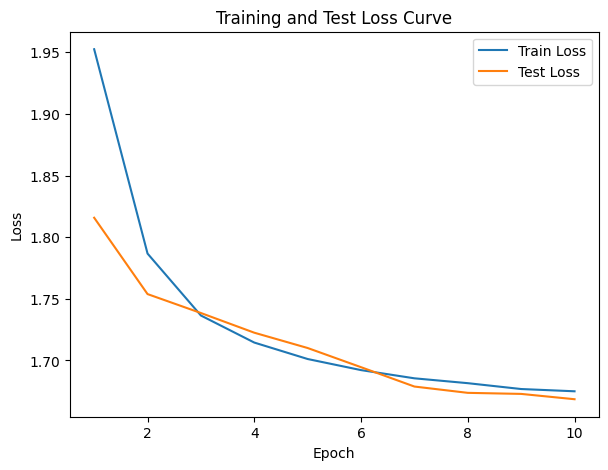

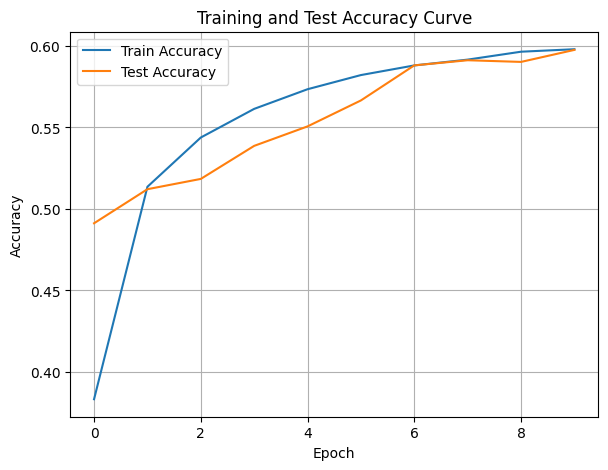

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.79s/it]

Epoch [1/10], Train F1:0.29452093827029646, Train Loss: 1.9511, Train Acc: 0.3700, Test F1:0.5104834565652407, Test Loss: 1.8716, Test Acc: 0.5493


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.10s/it]

Epoch [2/10], Train F1:0.4087433931592071, Train Loss: 1.8742, Train Acc: 0.4353, Test F1:0.5100177053364882, Test Loss: 1.8054, Test Acc: 0.5537


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.29s/it]

Epoch [3/10], Train F1:0.4469306091231287, Train Loss: 1.8297, Train Acc: 0.4701, Test F1:0.5007499230724015, Test Loss: 1.7792, Test Acc: 0.5529


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.29s/it]

Epoch [4/10], Train F1:0.4653631951064423, Train Loss: 1.8024, Train Acc: 0.4913, Test F1:0.5017364153564514, Test Loss: 1.7602, Test Acc: 0.5581


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.26s/it]

Epoch [5/10], Train F1:0.4781963579434505, Train Loss: 1.7834, Train Acc: 0.5063, Test F1:0.5068147030231239, Test Loss: 1.7453, Test Acc: 0.5638


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.62s/it]

Epoch [6/10], Train F1:0.48840429551220693, Train Loss: 1.7692, Train Acc: 0.5178, Test F1:0.51378633255937, Test Loss: 1.7334, Test Acc: 0.5694


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.83s/it]

Epoch [7/10], Train F1:0.4966709850957881, Train Loss: 1.7582, Train Acc: 0.5269, Test F1:0.5196449564981445, Test Loss: 1.7245, Test Acc: 0.5741


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.18s/it]

Epoch [8/10], Train F1:0.5035672782204983, Train Loss: 1.7492, Train Acc: 0.5344, Test F1:0.524347229348991, Test Loss: 1.7172, Test Acc: 0.5779


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.83s/it]

Epoch [9/10], Train F1:0.5094652218386417, Train Loss: 1.7417, Train Acc: 0.5407, Test F1:0.527500328569512, Test Loss: 1.7115, Test Acc: 0.5806


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.29s/it]

Epoch [10/10], Train F1:0.5146098415635083, Train Loss: 1.7352, Train Acc: 0.5462, Test F1:0.5328986694110969, Test Loss: 1.7055, Test Acc: 0.5846
Total Epochs: 10
Train loss start: 2.0491702556610107, Train loss end: 1.6751011610031128
Highest Mean Train Accuracy (over epoch): 0.5461953891340339
Test loss start: 1.8281272649765015, Test loss end: 1.61973237991333
Highest mean Test Accuracy (over epoch): 0.5845799770771437


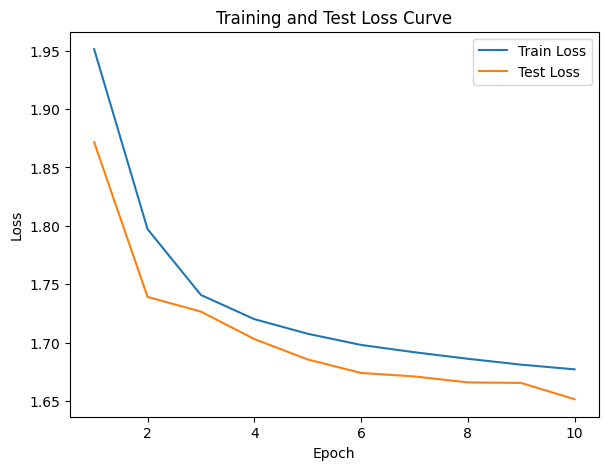

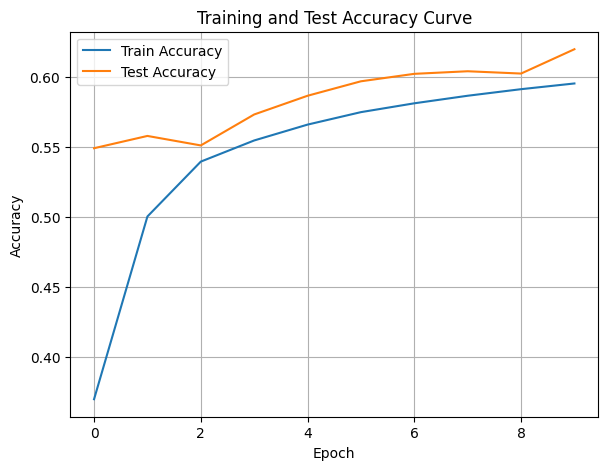

./saved_models/model_4.pth
Training Model with id 5


Training Process:  10%|█         | 1/10 [00:36<05:26, 36.30s/it]

Epoch [1/10], Train F1:0.3444716362083912, Train Loss: 1.9480, Train Acc: 0.3802, Test F1:0.5258409248766361, Test Loss: 1.8364, Test Acc: 0.5771


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.98s/it]

Epoch [2/10], Train F1:0.4241427728902517, Train Loss: 1.8677, Train Acc: 0.4463, Test F1:0.5041847308595692, Test Loss: 1.7848, Test Acc: 0.5660


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.07s/it]

Epoch [3/10], Train F1:0.4487173310970822, Train Loss: 1.8249, Train Acc: 0.4775, Test F1:0.5019135324872835, Test Loss: 1.7603, Test Acc: 0.5673


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.79s/it]

Epoch [4/10], Train F1:0.46156095300071076, Train Loss: 1.7992, Train Acc: 0.4963, Test F1:0.5072933564247878, Test Loss: 1.7437, Test Acc: 0.5721


Training Process:  50%|█████     | 5/10 [03:20<03:25, 41.15s/it]

Epoch [5/10], Train F1:0.4704056282961787, Train Loss: 1.7821, Train Acc: 0.5090, Test F1:0.5097634204030065, Test Loss: 1.7333, Test Acc: 0.5747


Training Process:  60%|██████    | 6/10 [04:05<02:50, 42.68s/it]

Epoch [6/10], Train F1:0.4771116841920211, Train Loss: 1.7696, Train Acc: 0.5184, Test F1:0.5134490849274311, Test Loss: 1.7250, Test Acc: 0.5777


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.67s/it]

Epoch [7/10], Train F1:0.4824795499407345, Train Loss: 1.7601, Train Acc: 0.5257, Test F1:0.5157595583929944, Test Loss: 1.7189, Test Acc: 0.5797


Training Process:  80%|████████  | 8/10 [05:39<01:29, 44.95s/it]

Epoch [8/10], Train F1:0.4869797189526207, Train Loss: 1.7524, Train Acc: 0.5317, Test F1:0.517937492794323, Test Loss: 1.7139, Test Acc: 0.5815


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.65s/it]

Epoch [9/10], Train F1:0.4908997131594331, Train Loss: 1.7460, Train Acc: 0.5366, Test F1:0.5195796221337472, Test Loss: 1.7099, Test Acc: 0.5828


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.98s/it]

Epoch [10/10], Train F1:0.4948089121920385, Train Loss: 1.7406, Train Acc: 0.5410, Test F1:0.5221378709805, Test Loss: 1.7064, Test Acc: 0.5844
Total Epochs: 10
Train loss start: 2.079404592514038, Train loss end: 1.7152173519134521
Highest Mean Train Accuracy (over epoch): 0.5409744627379668
Test loss start: 1.7887548208236694, Test loss end: 1.6379916667938232
Highest mean Test Accuracy (over epoch): 0.584446253745774


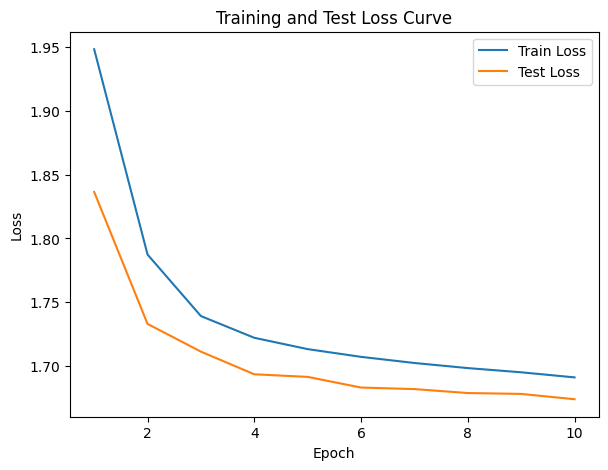

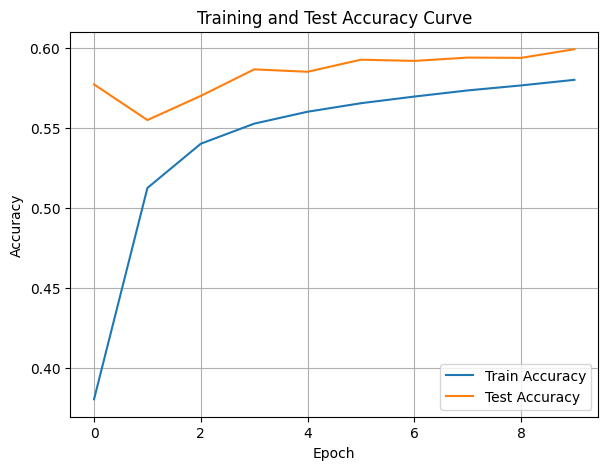

./saved_models/model_5.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.11s/it]

Epoch [1/10], Train F1:0.3247981545619441, Train Loss: 2.0070, Train Acc: 0.3016, Test F1:0.42592465620711245, Test Loss: 1.8689, Test Acc: 0.5147


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.31s/it]

Epoch [2/10], Train F1:0.405024168078537, Train Loss: 1.9112, Train Acc: 0.3984, Test F1:0.4192323736770651, Test Loss: 1.8137, Test Acc: 0.5162


Training Process:  30%|███       | 3/10 [01:56<04:34, 39.23s/it]

Epoch [3/10], Train F1:0.4339728250879422, Train Loss: 1.8571, Train Acc: 0.4425, Test F1:0.4376184076936347, Test Loss: 1.7835, Test Acc: 0.5289


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.22s/it]

Epoch [4/10], Train F1:0.45001859124988663, Train Loss: 1.8244, Train Acc: 0.4688, Test F1:0.4474252733734213, Test Loss: 1.7657, Test Acc: 0.5364


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.29s/it]

Epoch [5/10], Train F1:0.46104112573109524, Train Loss: 1.8026, Train Acc: 0.4864, Test F1:0.45994925733102543, Test Loss: 1.7520, Test Acc: 0.5445


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.56s/it]

Epoch [6/10], Train F1:0.4698449883802522, Train Loss: 1.7866, Train Acc: 0.4995, Test F1:0.4717288613581497, Test Loss: 1.7411, Test Acc: 0.5518


Training Process:  70%|███████   | 7/10 [04:53<02:11, 43.87s/it]

Epoch [7/10], Train F1:0.4773984623959234, Train Loss: 1.7744, Train Acc: 0.5097, Test F1:0.478105109473678, Test Loss: 1.7336, Test Acc: 0.5562


Training Process:  80%|████████  | 8/10 [05:40<01:29, 44.94s/it]

Epoch [8/10], Train F1:0.4842343619072357, Train Loss: 1.7646, Train Acc: 0.5180, Test F1:0.48347144805755954, Test Loss: 1.7275, Test Acc: 0.5599


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.38s/it]

Epoch [9/10], Train F1:0.49051855753621065, Train Loss: 1.7564, Train Acc: 0.5251, Test F1:0.4875989320367895, Test Loss: 1.7224, Test Acc: 0.5627


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.15s/it]

Epoch [10/10], Train F1:0.4964384994574962, Train Loss: 1.7493, Train Acc: 0.5312, Test F1:0.49267990582732274, Test Loss: 1.7175, Test Acc: 0.5660
Total Epochs: 10
Train loss start: 2.0940229892730713, Train loss end: 1.5888084173202515
Highest Mean Train Accuracy (over epoch): 0.5311774901942018
Test loss start: 1.825291633605957, Test loss end: 1.5846415758132935
Highest mean Test Accuracy (over epoch): 0.5659521549405798


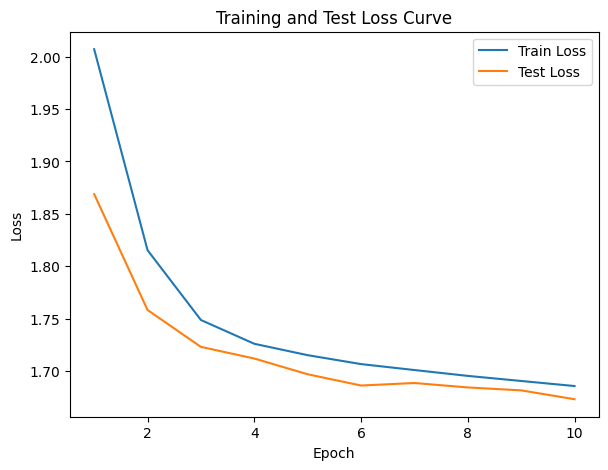

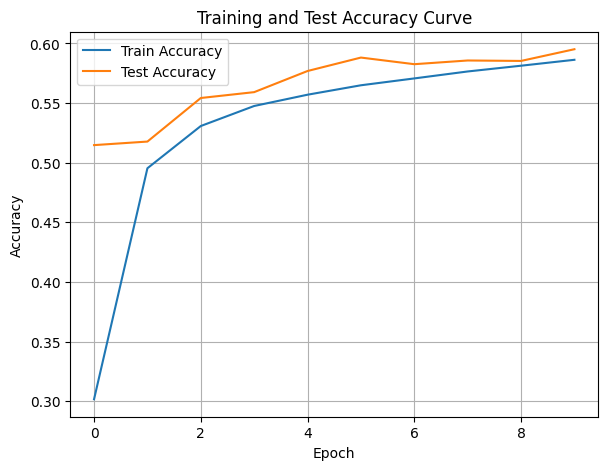

./saved_models/model_6.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:37<05:35, 37.25s/it]

Epoch [1/10], Train F1:0.3762379624276119, Train Loss: 1.9553, Train Acc: 0.3729, Test F1:0.34245115097020234, Test Loss: 1.8490, Test Acc: 0.4954


Training Process:  20%|██        | 2/10 [01:16<05:05, 38.14s/it]

Epoch [2/10], Train F1:0.40614120961274613, Train Loss: 1.8756, Train Acc: 0.4387, Test F1:0.35300559167797124, Test Loss: 1.8040, Test Acc: 0.4998


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.09s/it]

Epoch [3/10], Train F1:0.4251599116806764, Train Loss: 1.8335, Train Acc: 0.4687, Test F1:0.3919143602547509, Test Loss: 1.7782, Test Acc: 0.5159


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.07s/it]

Epoch [4/10], Train F1:0.4410321799418768, Train Loss: 1.8074, Train Acc: 0.4878, Test F1:0.42924013277904477, Test Loss: 1.7588, Test Acc: 0.5325


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.34s/it]

Epoch [5/10], Train F1:0.45327045974081326, Train Loss: 1.7896, Train Acc: 0.5011, Test F1:0.4515505007058137, Test Loss: 1.7450, Test Acc: 0.5435


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.71s/it]

Epoch [6/10], Train F1:0.4625643773514672, Train Loss: 1.7767, Train Acc: 0.5109, Test F1:0.4668275467307849, Test Loss: 1.7345, Test Acc: 0.5513


Training Process:  70%|███████   | 7/10 [04:53<02:12, 44.00s/it]

Epoch [7/10], Train F1:0.47001300173802707, Train Loss: 1.7666, Train Acc: 0.5187, Test F1:0.47565295014680825, Test Loss: 1.7275, Test Acc: 0.5564


Training Process:  80%|████████  | 8/10 [05:41<01:30, 45.24s/it]

Epoch [8/10], Train F1:0.47638058754082846, Train Loss: 1.7584, Train Acc: 0.5252, Test F1:0.48355748655602016, Test Loss: 1.7215, Test Acc: 0.5610


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.72s/it]

Epoch [9/10], Train F1:0.4824996452103511, Train Loss: 1.7514, Train Acc: 0.5309, Test F1:0.4902969710284637, Test Loss: 1.7164, Test Acc: 0.5650


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.26s/it]

Epoch [10/10], Train F1:0.4887518503584136, Train Loss: 1.7453, Train Acc: 0.5360, Test F1:0.4949592798855569, Test Loss: 1.7124, Test Acc: 0.5679
Total Epochs: 10
Train loss start: 2.0729150772094727, Train loss end: 1.726295828819275
Highest Mean Train Accuracy (over epoch): 0.5359935076465077
Test loss start: 1.8323566913604736, Test loss end: 1.6410481929779053
Highest mean Test Accuracy (over epoch): 0.5678651609402212


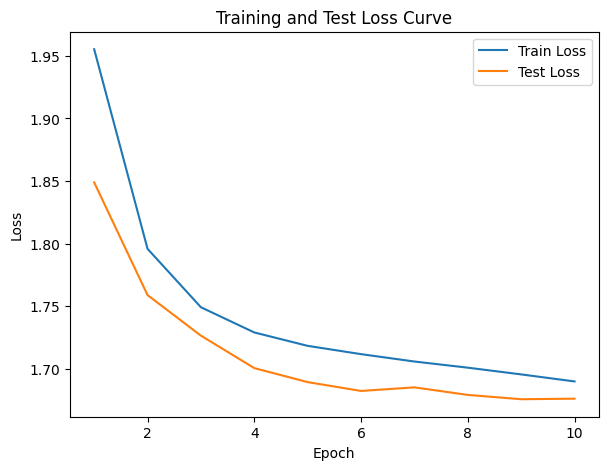

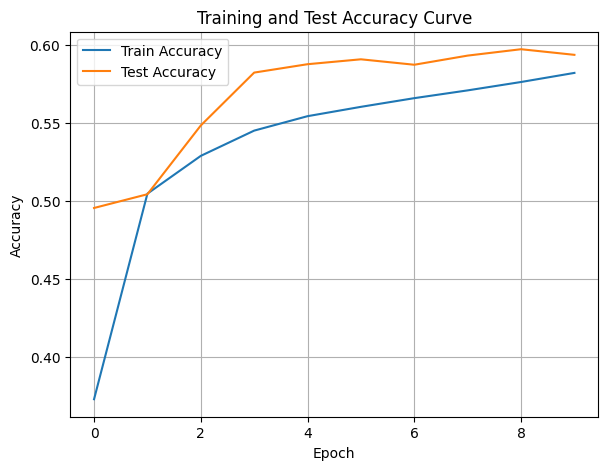

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.20s/it]

Epoch [1/10], Train F1:0.3317654462820254, Train Loss: 1.9907, Train Acc: 0.3196, Test F1:0.35957705608927054, Test Loss: 1.8843, Test Acc: 0.4343


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.28s/it]

Epoch [2/10], Train F1:0.4156195548694109, Train Loss: 1.9009, Train Acc: 0.4112, Test F1:0.4704817585074352, Test Loss: 1.8159, Test Acc: 0.5037


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.09s/it]

Epoch [3/10], Train F1:0.44580584144967794, Train Loss: 1.8494, Train Acc: 0.4534, Test F1:0.4938390082874485, Test Loss: 1.7801, Test Acc: 0.5286


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.29s/it]

Epoch [4/10], Train F1:0.46362962829143606, Train Loss: 1.8176, Train Acc: 0.4788, Test F1:0.5049810022579034, Test Loss: 1.7588, Test Acc: 0.5423


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.23s/it]

Epoch [5/10], Train F1:0.47715688859975486, Train Loss: 1.7956, Train Acc: 0.4965, Test F1:0.5145376130690583, Test Loss: 1.7428, Test Acc: 0.5531


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.52s/it]

Epoch [6/10], Train F1:0.4878277559511873, Train Loss: 1.7794, Train Acc: 0.5097, Test F1:0.5231815607733062, Test Loss: 1.7298, Test Acc: 0.5622


Training Process:  70%|███████   | 7/10 [04:53<02:11, 43.89s/it]

Epoch [7/10], Train F1:0.4966872293332295, Train Loss: 1.7667, Train Acc: 0.5202, Test F1:0.5335075309752746, Test Loss: 1.7185, Test Acc: 0.5714


Training Process:  80%|████████  | 8/10 [05:42<01:31, 45.56s/it]

Epoch [8/10], Train F1:0.504092478943312, Train Loss: 1.7563, Train Acc: 0.5289, Test F1:0.5411630726090698, Test Loss: 1.7095, Test Acc: 0.5785


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.99s/it]

Epoch [9/10], Train F1:0.5101211346791072, Train Loss: 1.7479, Train Acc: 0.5359, Test F1:0.545409240147443, Test Loss: 1.7029, Test Acc: 0.5831


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.40s/it]

Epoch [10/10], Train F1:0.5152544831162347, Train Loss: 1.7409, Train Acc: 0.5418, Test F1:0.551529257562164, Test Loss: 1.6964, Test Acc: 0.5887
Total Epochs: 10
Train loss start: 2.10295033454895, Train loss end: 1.7289916276931763
Highest Mean Train Accuracy (over epoch): 0.5417825595735821
Test loss start: 1.8274129629135132, Test loss end: 1.5943984985351562
Highest mean Test Accuracy (over epoch): 0.5887193574877062


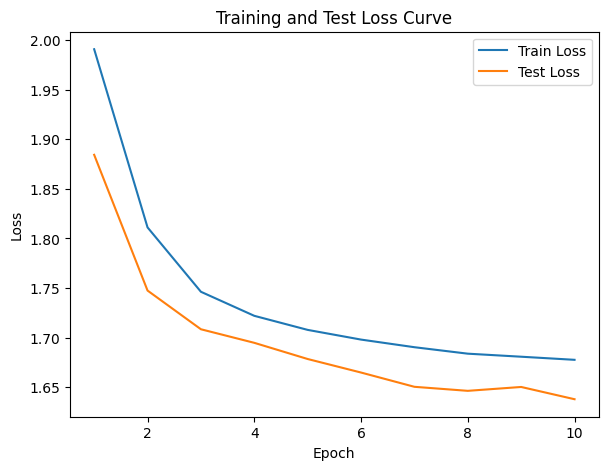

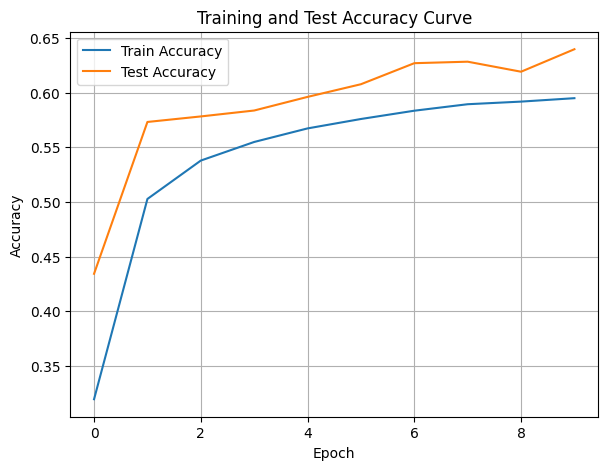

./saved_models/model_8.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:36<05:26, 36.30s/it]

Epoch [1/10], Train F1:0.5639709528025253, Train Loss: 1.6736, Train Acc: 0.5994, Test F1:0.5949705494549942, Test Loss: 1.6402, Test Acc: 0.6332


Training Process:  20%|██        | 2/10 [01:14<04:59, 37.47s/it]

Epoch [2/10], Train F1:0.5649291525213744, Train Loss: 1.6726, Train Acc: 0.6002, Test F1:0.599791533266267, Test Loss: 1.6379, Test Acc: 0.6376


Training Process:  30%|███       | 3/10 [01:54<04:30, 38.57s/it]

Epoch [3/10], Train F1:0.5659025421469016, Train Loss: 1.6715, Train Acc: 0.6012, Test F1:0.6024708758258792, Test Loss: 1.6362, Test Acc: 0.6399


Training Process:  40%|████      | 4/10 [02:34<03:55, 39.26s/it]

Epoch [4/10], Train F1:0.5668730290504986, Train Loss: 1.6705, Train Acc: 0.6022, Test F1:0.6017445789590777, Test Loss: 1.6364, Test Acc: 0.6392


Training Process:  50%|█████     | 5/10 [03:18<03:24, 40.84s/it]

Epoch [5/10], Train F1:0.5680129045346751, Train Loss: 1.6695, Train Acc: 0.6032, Test F1:0.600078330808802, Test Loss: 1.6367, Test Acc: 0.6378


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.17s/it]

Epoch [6/10], Train F1:0.5689352329594759, Train Loss: 1.6686, Train Acc: 0.6041, Test F1:0.6008178256345555, Test Loss: 1.6361, Test Acc: 0.6387


Training Process:  70%|███████   | 7/10 [04:49<02:10, 43.60s/it]

Epoch [7/10], Train F1:0.569620907029059, Train Loss: 1.6679, Train Acc: 0.6048, Test F1:0.6011312886881934, Test Loss: 1.6357, Test Acc: 0.6391


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.98s/it]

Epoch [8/10], Train F1:0.5702553501613855, Train Loss: 1.6672, Train Acc: 0.6054, Test F1:0.5995008654135876, Test Loss: 1.6366, Test Acc: 0.6377


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.54s/it]

Epoch [9/10], Train F1:0.5709219005602882, Train Loss: 1.6665, Train Acc: 0.6060, Test F1:0.6002035695094796, Test Loss: 1.6361, Test Acc: 0.6383


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.91s/it]

Epoch [10/10], Train F1:0.571472859124938, Train Loss: 1.6659, Train Acc: 0.6066, Test F1:0.6022157944501664, Test Loss: 1.6349, Test Acc: 0.6401
Total Epochs: 10
Train loss start: 1.6031285524368286, Train loss end: 1.635511040687561
Highest Mean Train Accuracy (over epoch): 0.6065622764731365
Test loss start: 1.5901687145233154, Test loss end: 1.5761507749557495
Highest mean Test Accuracy (over epoch): 0.6400579714552813


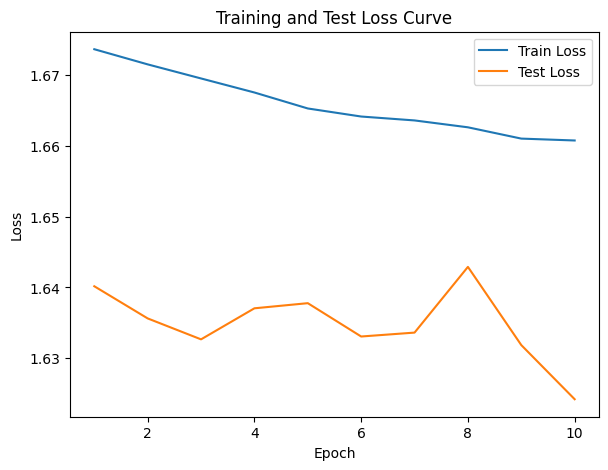

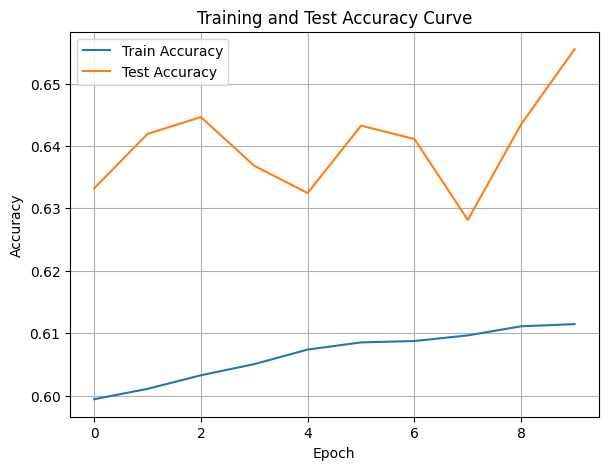

./saved_models/model_12.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:36<05:28, 36.52s/it]

Epoch [1/10], Train F1:0.5773581066233082, Train Loss: 1.6600, Train Acc: 0.6123, Test F1:0.6038522174507882, Test Loss: 1.6331, Test Acc: 0.6405


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.95s/it]

Epoch [2/10], Train F1:0.5772007845855104, Train Loss: 1.6600, Train Acc: 0.6122, Test F1:0.606442658920013, Test Loss: 1.6315, Test Acc: 0.6429


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.05s/it]

Epoch [3/10], Train F1:0.5774423666308663, Train Loss: 1.6597, Train Acc: 0.6125, Test F1:0.6061357623596431, Test Loss: 1.6316, Test Acc: 0.6429


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.95s/it]

Epoch [4/10], Train F1:0.577772913560724, Train Loss: 1.6594, Train Acc: 0.6127, Test F1:0.6087229828287953, Test Loss: 1.6302, Test Acc: 0.6455


Training Process:  50%|█████     | 5/10 [03:20<03:25, 41.16s/it]

Epoch [5/10], Train F1:0.57806602028846, Train Loss: 1.6591, Train Acc: 0.6130, Test F1:0.6079646274427123, Test Loss: 1.6307, Test Acc: 0.6447


Training Process:  60%|██████    | 6/10 [04:05<02:49, 42.40s/it]

Epoch [6/10], Train F1:0.5782764066168055, Train Loss: 1.6589, Train Acc: 0.6132, Test F1:0.6058301061830147, Test Loss: 1.6323, Test Acc: 0.6429


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.53s/it]

Epoch [7/10], Train F1:0.5786244539300802, Train Loss: 1.6586, Train Acc: 0.6135, Test F1:0.6047448258328822, Test Loss: 1.6328, Test Acc: 0.6421


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.32s/it]

Epoch [8/10], Train F1:0.578730499939163, Train Loss: 1.6585, Train Acc: 0.6137, Test F1:0.6066057445107925, Test Loss: 1.6316, Test Acc: 0.6437


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.65s/it]

Epoch [9/10], Train F1:0.5789148881813659, Train Loss: 1.6583, Train Acc: 0.6138, Test F1:0.6077342727864122, Test Loss: 1.6310, Test Acc: 0.6449


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.44s/it]

Epoch [10/10], Train F1:0.579226270027814, Train Loss: 1.6580, Train Acc: 0.6141, Test F1:0.6082814553834979, Test Loss: 1.6306, Test Acc: 0.6454
Total Epochs: 10
Train loss start: 1.5652390718460083, Train loss end: 1.5936475992202759
Highest Mean Train Accuracy (over epoch): 0.6141406819311378
Test loss start: 1.574439525604248, Test loss end: 1.5803898572921753
Highest mean Test Accuracy (over epoch): 0.645547781429285


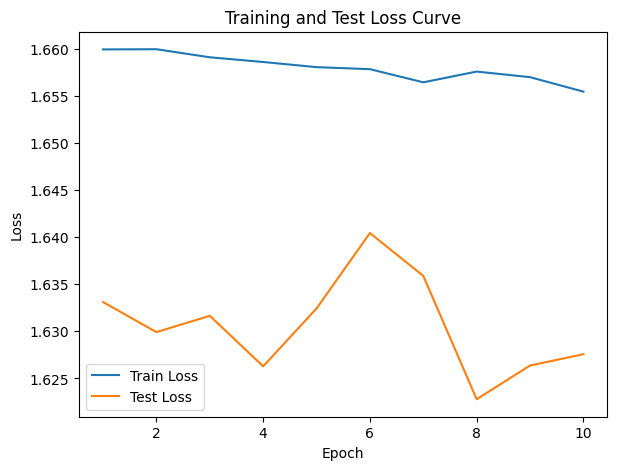

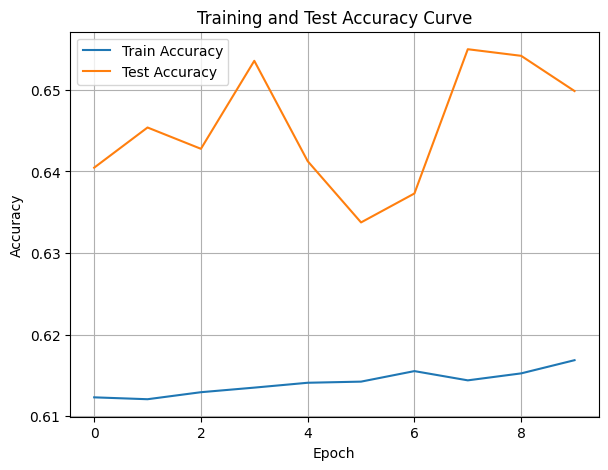

./saved_models/model_13.pth
Training Model with id 11


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.09s/it]

Epoch [1/10], Train F1:0.5808203956078107, Train Loss: 1.6561, Train Acc: 0.6157, Test F1:0.6075984959049434, Test Loss: 1.6296, Test Acc: 0.6433


Training Process:  20%|██        | 2/10 [01:16<05:05, 38.25s/it]

Epoch [2/10], Train F1:0.5816857036508112, Train Loss: 1.6555, Train Acc: 0.6166, Test F1:0.6128135475631941, Test Loss: 1.6270, Test Acc: 0.6488


Training Process:  30%|███       | 3/10 [01:56<04:34, 39.20s/it]

Epoch [3/10], Train F1:0.5817211420066182, Train Loss: 1.6555, Train Acc: 0.6166, Test F1:0.6098333418456651, Test Loss: 1.6289, Test Acc: 0.6460


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.05s/it]

Epoch [4/10], Train F1:0.5818461390541861, Train Loss: 1.6554, Train Acc: 0.6167, Test F1:0.61014357986607, Test Loss: 1.6284, Test Acc: 0.6461


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.37s/it]

Epoch [5/10], Train F1:0.5822382308857975, Train Loss: 1.6551, Train Acc: 0.6171, Test F1:0.6077076840000558, Test Loss: 1.6300, Test Acc: 0.6442


Training Process:  60%|██████    | 6/10 [04:05<02:48, 42.25s/it]

Epoch [6/10], Train F1:0.5823714685110457, Train Loss: 1.6550, Train Acc: 0.6172, Test F1:0.6072545244701392, Test Loss: 1.6302, Test Acc: 0.6437


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.83s/it]

Epoch [7/10], Train F1:0.5825858113820832, Train Loss: 1.6548, Train Acc: 0.6174, Test F1:0.6076792579004181, Test Loss: 1.6300, Test Acc: 0.6441


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.23s/it]

Epoch [8/10], Train F1:0.5827876698336585, Train Loss: 1.6546, Train Acc: 0.6176, Test F1:0.6080222462141935, Test Loss: 1.6299, Test Acc: 0.6447


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.65s/it]

Epoch [9/10], Train F1:0.5829275122593391, Train Loss: 1.6545, Train Acc: 0.6178, Test F1:0.6084403519286444, Test Loss: 1.6296, Test Acc: 0.6451


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.29s/it]

Epoch [10/10], Train F1:0.5830338360914158, Train Loss: 1.6544, Train Acc: 0.6178, Test F1:0.6095188661892261, Test Loss: 1.6289, Test Acc: 0.6460
Total Epochs: 10
Train loss start: 1.588858962059021, Train loss end: 1.5783253908157349
Highest Mean Train Accuracy (over epoch): 0.6178428115019998
Test loss start: 1.564781904220581, Test loss end: 1.576578140258789
Highest mean Test Accuracy (over epoch): 0.6488259839860158


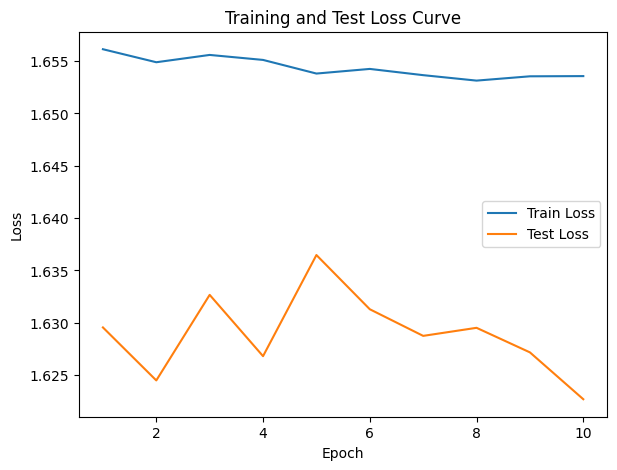

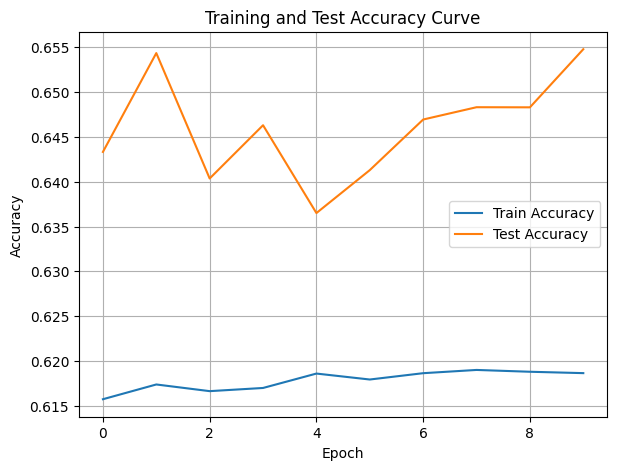

./saved_models/model_11.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:35<05:19, 35.47s/it]

Epoch [1/10], Train F1:0.5846033605567709, Train Loss: 1.6533, Train Acc: 0.6192, Test F1:0.6050129299776548, Test Loss: 1.6314, Test Acc: 0.6418


Training Process:  20%|██        | 2/10 [01:13<04:55, 36.95s/it]

Epoch [2/10], Train F1:0.5846349035799681, Train Loss: 1.6532, Train Acc: 0.6193, Test F1:0.6098310042567852, Test Loss: 1.6285, Test Acc: 0.6459


Training Process:  30%|███       | 3/10 [01:53<04:29, 38.57s/it]

Epoch [3/10], Train F1:0.5844425743922782, Train Loss: 1.6532, Train Acc: 0.6191, Test F1:0.6077618085675264, Test Loss: 1.6297, Test Acc: 0.6445


Training Process:  40%|████      | 4/10 [02:34<03:56, 39.46s/it]

Epoch [4/10], Train F1:0.5846732249668966, Train Loss: 1.6530, Train Acc: 0.6193, Test F1:0.6050868299281286, Test Loss: 1.6319, Test Acc: 0.6420


Training Process:  50%|█████     | 5/10 [03:17<03:23, 40.76s/it]

Epoch [5/10], Train F1:0.5847213889308924, Train Loss: 1.6529, Train Acc: 0.6194, Test F1:0.6050343539644093, Test Loss: 1.6318, Test Acc: 0.6419


Training Process:  60%|██████    | 6/10 [04:03<02:49, 42.27s/it]

Epoch [6/10], Train F1:0.5847791598018697, Train Loss: 1.6528, Train Acc: 0.6194, Test F1:0.6076592219338619, Test Loss: 1.6300, Test Acc: 0.6440


Training Process:  70%|███████   | 7/10 [04:48<02:10, 43.45s/it]

Epoch [7/10], Train F1:0.5848829986285651, Train Loss: 1.6527, Train Acc: 0.6195, Test F1:0.6083798167595037, Test Loss: 1.6296, Test Acc: 0.6447


Training Process:  80%|████████  | 8/10 [05:37<01:30, 45.16s/it]

Epoch [8/10], Train F1:0.5849810339896824, Train Loss: 1.6526, Train Acc: 0.6196, Test F1:0.607441511265943, Test Loss: 1.6302, Test Acc: 0.6440


Training Process:  90%|█████████ | 9/10 [06:26<00:46, 46.32s/it]

Epoch [9/10], Train F1:0.5851540233284949, Train Loss: 1.6524, Train Acc: 0.6198, Test F1:0.6074703499936973, Test Loss: 1.6303, Test Acc: 0.6441


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.90s/it]

Epoch [10/10], Train F1:0.5851966719235772, Train Loss: 1.6523, Train Acc: 0.6199, Test F1:0.6078151935839947, Test Loss: 1.6300, Test Acc: 0.6445
Total Epochs: 10
Train loss start: 1.7982449531555176, Train loss end: 1.6653176546096802
Highest Mean Train Accuracy (over epoch): 0.619882074362875
Test loss start: 1.566749930381775, Test loss end: 1.57563054561615
Highest mean Test Accuracy (over epoch): 0.6458919944485709


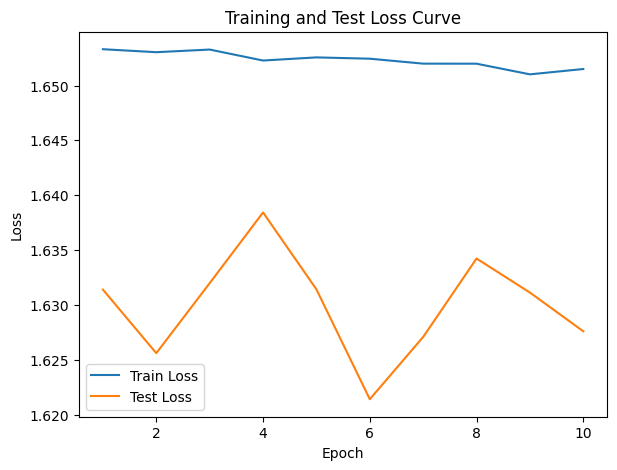

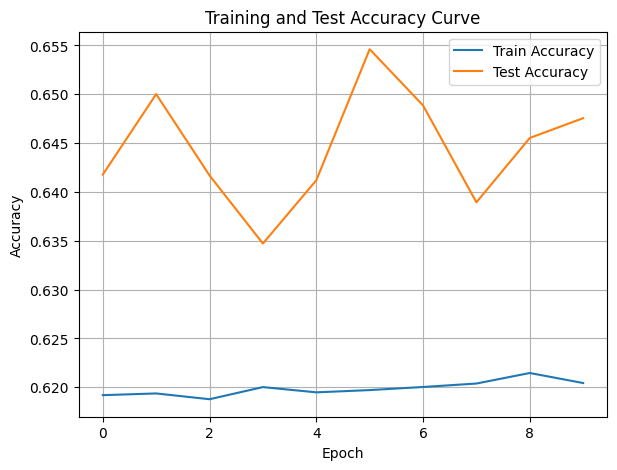

./saved_models/model_13.pth
Training Model with id 14


Training Process:  10%|█         | 1/10 [00:36<05:29, 36.63s/it]

Epoch [1/10], Train F1:0.5865624852429422, Train Loss: 1.6512, Train Acc: 0.6213, Test F1:0.6130830654887104, Test Loss: 1.6257, Test Acc: 0.6501


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.66s/it]

Epoch [2/10], Train F1:0.5864449379801796, Train Loss: 1.6512, Train Acc: 0.6212, Test F1:0.6171504000796044, Test Loss: 1.6238, Test Acc: 0.6535


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.85s/it]

Epoch [3/10], Train F1:0.5864668388325951, Train Loss: 1.6512, Train Acc: 0.6212, Test F1:0.6151169593531804, Test Loss: 1.6252, Test Acc: 0.6515


Training Process:  40%|████      | 4/10 [02:37<04:02, 40.35s/it]

Epoch [4/10], Train F1:0.5866744584846866, Train Loss: 1.6510, Train Acc: 0.6214, Test F1:0.6104728542035908, Test Loss: 1.6289, Test Acc: 0.6471


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.88s/it]

Epoch [5/10], Train F1:0.5868142022464347, Train Loss: 1.6509, Train Acc: 0.6215, Test F1:0.6104343917834383, Test Loss: 1.6287, Test Acc: 0.6471


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.25s/it]

Epoch [6/10], Train F1:0.5866794125286456, Train Loss: 1.6509, Train Acc: 0.6214, Test F1:0.6087078613873185, Test Loss: 1.6298, Test Acc: 0.6455


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.87s/it]

Epoch [7/10], Train F1:0.5866925985545576, Train Loss: 1.6508, Train Acc: 0.6214, Test F1:0.608867493615536, Test Loss: 1.6296, Test Acc: 0.6457


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.83s/it]

Epoch [8/10], Train F1:0.586785716846667, Train Loss: 1.6507, Train Acc: 0.6215, Test F1:0.6080011169319121, Test Loss: 1.6302, Test Acc: 0.6447


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.00s/it]

Epoch [9/10], Train F1:0.5867475226719218, Train Loss: 1.6508, Train Acc: 0.6215, Test F1:0.6080776046231987, Test Loss: 1.6301, Test Acc: 0.6448


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.04s/it]


Epoch [10/10], Train F1:0.5868156761982585, Train Loss: 1.6507, Train Acc: 0.6216, Test F1:0.6089958213879854, Test Loss: 1.6296, Test Acc: 0.6456
Total Epochs: 10
Train loss start: 1.6699793338775635, Train loss end: 1.7682119607925415
Highest Mean Train Accuracy (over epoch): 0.6215816393565113
Test loss start: 1.57574462890625, Test loss end: 1.5832136869430542
Highest mean Test Accuracy (over epoch): 0.6534915936187378


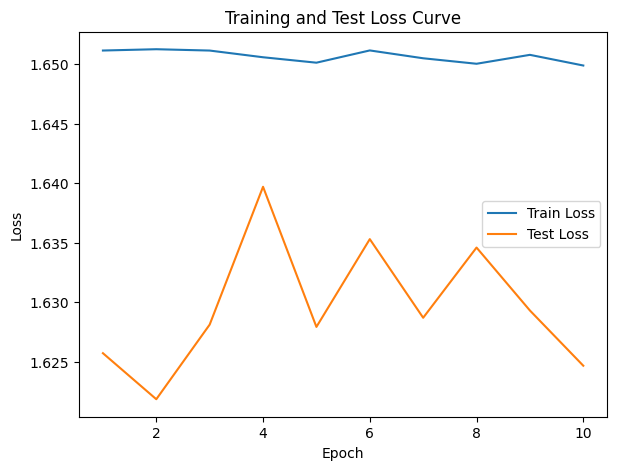

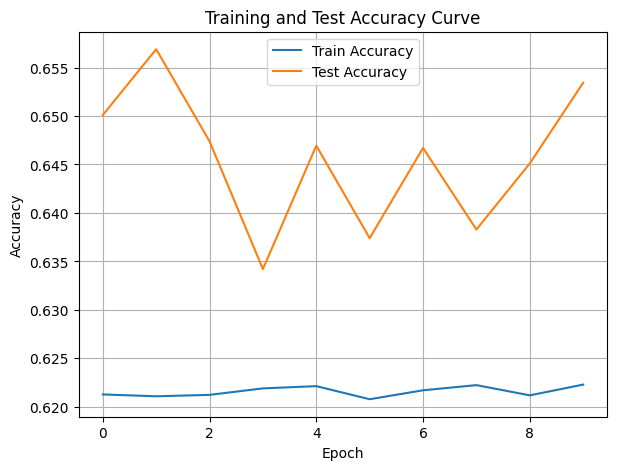

./saved_models/model_14.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.64s/it]

Epoch [1/10], Train F1:0.5877317855294704, Train Loss: 1.6498, Train Acc: 0.6225, Test F1:0.6063529821253983, Test Loss: 1.6314, Test Acc: 0.6440


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.26s/it]

Epoch [2/10], Train F1:0.5877463924191962, Train Loss: 1.6497, Train Acc: 0.6225, Test F1:0.6116981842544852, Test Loss: 1.6282, Test Acc: 0.6489


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.34s/it]

Epoch [3/10], Train F1:0.5877701870247065, Train Loss: 1.6497, Train Acc: 0.6225, Test F1:0.6139746553415627, Test Loss: 1.6263, Test Acc: 0.6508


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.99s/it]

Epoch [4/10], Train F1:0.587698091640294, Train Loss: 1.6498, Train Acc: 0.6224, Test F1:0.6134444088771807, Test Loss: 1.6267, Test Acc: 0.6506


Training Process:  50%|█████     | 5/10 [03:20<03:25, 41.02s/it]

Epoch [5/10], Train F1:0.5877776866941005, Train Loss: 1.6497, Train Acc: 0.6224, Test F1:0.6146916446480378, Test Loss: 1.6254, Test Acc: 0.6517


Training Process:  60%|██████    | 6/10 [04:05<02:49, 42.27s/it]

Epoch [6/10], Train F1:0.5878557011492684, Train Loss: 1.6497, Train Acc: 0.6225, Test F1:0.6158634517393888, Test Loss: 1.6246, Test Acc: 0.6526


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.69s/it]

Epoch [7/10], Train F1:0.5878841926789846, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.6154321426635733, Test Loss: 1.6247, Test Acc: 0.6522


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.20s/it]

Epoch [8/10], Train F1:0.5878450735677618, Train Loss: 1.6497, Train Acc: 0.6225, Test F1:0.6142685107239202, Test Loss: 1.6255, Test Acc: 0.6509


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.75s/it]

Epoch [9/10], Train F1:0.5878707532353783, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.6145560898816765, Test Loss: 1.6252, Test Acc: 0.6513


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.24s/it]


Epoch [10/10], Train F1:0.587856083634179, Train Loss: 1.6496, Train Acc: 0.6225, Test F1:0.6132015827813261, Test Loss: 1.6265, Test Acc: 0.6496
Total Epochs: 10
Train loss start: 1.6608761548995972, Train loss end: 1.5871363878250122
Highest Mean Train Accuracy (over epoch): 0.6225647040558296
Test loss start: 1.5802637338638306, Test loss end: 1.5655394792556763
Highest mean Test Accuracy (over epoch): 0.6526218817231841


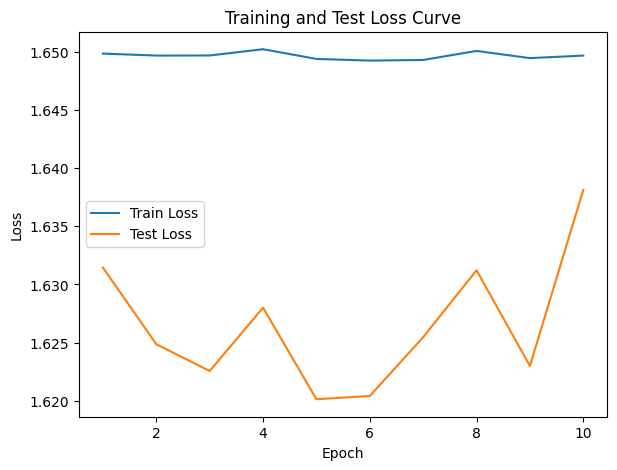

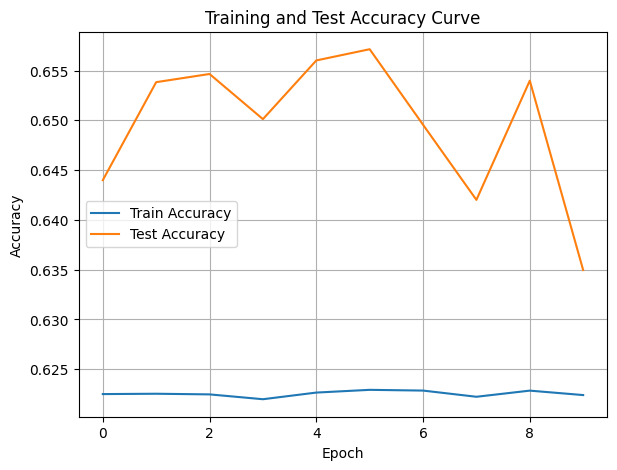

./saved_models/model_12.pth
Training Model with id 10


Training Process:  10%|█         | 1/10 [00:35<05:17, 35.32s/it]

Epoch [1/10], Train F1:0.5895937419706747, Train Loss: 1.6480, Train Acc: 0.6243, Test F1:0.5948810155064138, Test Loss: 1.6382, Test Acc: 0.6338


Training Process:  20%|██        | 2/10 [01:14<04:59, 37.48s/it]

Epoch [2/10], Train F1:0.5889719268781574, Train Loss: 1.6486, Train Acc: 0.6237, Test F1:0.5955665216906081, Test Loss: 1.6382, Test Acc: 0.6346


Training Process:  30%|███       | 3/10 [01:54<04:32, 38.93s/it]

Epoch [3/10], Train F1:0.5886441246311137, Train Loss: 1.6488, Train Acc: 0.6234, Test F1:0.6025216709998508, Test Loss: 1.6340, Test Acc: 0.6397


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.77s/it]

Epoch [4/10], Train F1:0.5886088566704006, Train Loss: 1.6488, Train Acc: 0.6233, Test F1:0.6021061980525457, Test Loss: 1.6342, Test Acc: 0.6393


Training Process:  50%|█████     | 5/10 [03:18<03:24, 40.92s/it]

Epoch [5/10], Train F1:0.5886878579372296, Train Loss: 1.6488, Train Acc: 0.6234, Test F1:0.6019826584135762, Test Loss: 1.6342, Test Acc: 0.6393


Training Process:  60%|██████    | 6/10 [04:04<02:50, 42.59s/it]

Epoch [6/10], Train F1:0.5886723591784973, Train Loss: 1.6488, Train Acc: 0.6234, Test F1:0.602638325528264, Test Loss: 1.6338, Test Acc: 0.6399


Training Process:  70%|███████   | 7/10 [04:50<02:11, 43.71s/it]

Epoch [7/10], Train F1:0.5886945185012922, Train Loss: 1.6487, Train Acc: 0.6234, Test F1:0.6022798932361979, Test Loss: 1.6340, Test Acc: 0.6395


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.69s/it]

Epoch [8/10], Train F1:0.5886430115498033, Train Loss: 1.6488, Train Acc: 0.6234, Test F1:0.6023571778300645, Test Loss: 1.6338, Test Acc: 0.6396


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.52s/it]

Epoch [9/10], Train F1:0.5886971922525596, Train Loss: 1.6487, Train Acc: 0.6234, Test F1:0.6029369808371757, Test Loss: 1.6334, Test Acc: 0.6400


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.94s/it]


Epoch [10/10], Train F1:0.5886323556439131, Train Loss: 1.6488, Train Acc: 0.6233, Test F1:0.6028787754355509, Test Loss: 1.6335, Test Acc: 0.6400
Total Epochs: 10
Train loss start: 1.5724537372589111, Train loss end: 1.7402230501174927
Highest Mean Train Accuracy (over epoch): 0.6243035511597371
Test loss start: 1.5740199089050293, Test loss end: 1.5756069421768188
Highest mean Test Accuracy (over epoch): 0.6399684890764267


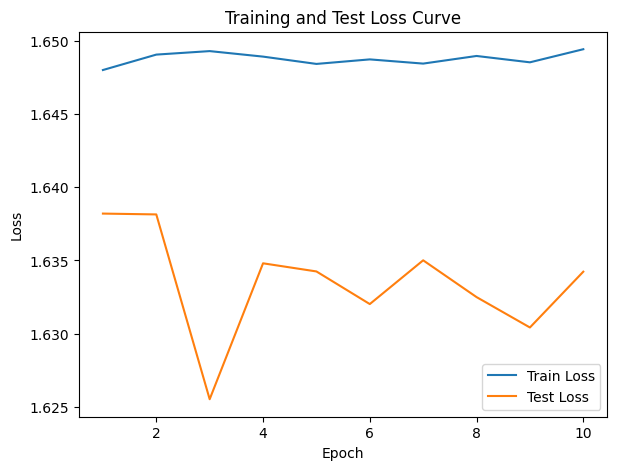

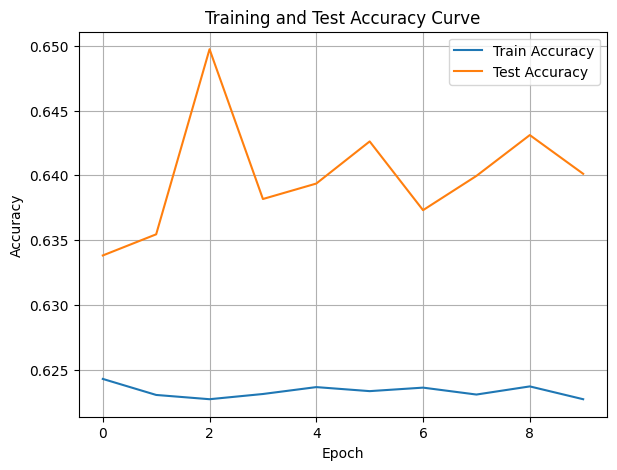

./saved_models/model_10.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [15]:
coverDTEmlp8b.train_DTE()

Training Process:   1%|          | 1/150 [00:37<1:32:50, 37.38s/it]

Epoch [1/150], Train F1:0.40826903268557907, Train Loss: 1.9345, Train Acc: 0.4119, Test F1:0.38609560308334756, Test Loss: 1.8285, Test Acc: 0.5012


Training Process:   1%|▏         | 2/150 [01:16<1:34:32, 38.33s/it]

Epoch [2/150], Train F1:0.4356743272093151, Train Loss: 1.8598, Train Acc: 0.4611, Test F1:0.3981634882583458, Test Loss: 1.7909, Test Acc: 0.5107


Training Process:   2%|▏         | 3/150 [01:56<1:36:06, 39.23s/it]

Epoch [3/150], Train F1:0.446781936344325, Train Loss: 1.8214, Train Acc: 0.4842, Test F1:0.4101384634174199, Test Loss: 1.7710, Test Acc: 0.5179


Training Process:   3%|▎         | 4/150 [02:36<1:36:30, 39.66s/it]

Epoch [4/150], Train F1:0.4557056007903775, Train Loss: 1.7981, Train Acc: 0.4993, Test F1:0.42912768382152494, Test Loss: 1.7562, Test Acc: 0.5290


Training Process:   3%|▎         | 5/150 [03:20<1:39:09, 41.03s/it]

Epoch [5/150], Train F1:0.4634958595845656, Train Loss: 1.7822, Train Acc: 0.5102, Test F1:0.4415348985335217, Test Loss: 1.7454, Test Acc: 0.5367


Training Process:   4%|▍         | 6/150 [04:05<1:41:58, 42.49s/it]

Epoch [6/150], Train F1:0.4702888229688198, Train Loss: 1.7703, Train Acc: 0.5187, Test F1:0.4499950373270785, Test Loss: 1.7379, Test Acc: 0.5421


Training Process:   5%|▍         | 7/150 [04:51<1:44:06, 43.68s/it]

Epoch [7/150], Train F1:0.4759536636652103, Train Loss: 1.7611, Train Acc: 0.5255, Test F1:0.4565802281866357, Test Loss: 1.7319, Test Acc: 0.5463


Training Process:   5%|▌         | 8/150 [05:40<1:46:53, 45.17s/it]

Epoch [8/150], Train F1:0.48076450456140063, Train Loss: 1.7536, Train Acc: 0.5311, Test F1:0.46272636540924234, Test Loss: 1.7268, Test Acc: 0.5501


Training Process:   6%|▌         | 9/150 [06:29<1:49:06, 46.43s/it]

Epoch [9/150], Train F1:0.48484127860585446, Train Loss: 1.7475, Train Acc: 0.5357, Test F1:0.46853084522464356, Test Loss: 1.7223, Test Acc: 0.5535


Training Process:   7%|▋         | 10/150 [07:20<1:51:56, 47.97s/it]

Epoch [10/150], Train F1:0.48839824078860217, Train Loss: 1.7424, Train Acc: 0.5397, Test F1:0.47350922274670887, Test Loss: 1.7186, Test Acc: 0.5566


Training Process:   7%|▋         | 11/150 [08:12<1:53:57, 49.19s/it]

Epoch [11/150], Train F1:0.4915575272258826, Train Loss: 1.7380, Train Acc: 0.5432, Test F1:0.47812015867089913, Test Loss: 1.7154, Test Acc: 0.5593


Training Process:   8%|▊         | 12/150 [09:07<1:56:53, 50.82s/it]

Epoch [12/150], Train F1:0.4943472501638758, Train Loss: 1.7341, Train Acc: 0.5463, Test F1:0.4817255180799166, Test Loss: 1.7126, Test Acc: 0.5615


Training Process:   9%|▊         | 13/150 [10:03<1:59:33, 52.36s/it]

Epoch [13/150], Train F1:0.4968038245244786, Train Loss: 1.7308, Train Acc: 0.5490, Test F1:0.48473349928781406, Test Loss: 1.7104, Test Acc: 0.5634


Training Process:   9%|▉         | 14/150 [10:59<2:01:28, 53.59s/it]

Epoch [14/150], Train F1:0.4989762044577598, Train Loss: 1.7278, Train Acc: 0.5513, Test F1:0.4879911256830975, Test Loss: 1.7081, Test Acc: 0.5655


Training Process:  10%|█         | 15/150 [11:59<2:04:38, 55.40s/it]

Epoch [15/150], Train F1:0.500912979613741, Train Loss: 1.7252, Train Acc: 0.5534, Test F1:0.4912035990417844, Test Loss: 1.7060, Test Acc: 0.5674


Training Process:  11%|█         | 16/150 [13:01<2:08:01, 57.32s/it]

Epoch [16/150], Train F1:0.5026119863738043, Train Loss: 1.7229, Train Acc: 0.5552, Test F1:0.49236746342666426, Test Loss: 1.7049, Test Acc: 0.5683


Training Process:  11%|█▏        | 17/150 [14:04<2:10:52, 59.04s/it]

Epoch [17/150], Train F1:0.5042326118535713, Train Loss: 1.7208, Train Acc: 0.5570, Test F1:0.4945176621043685, Test Loss: 1.7034, Test Acc: 0.5697


Training Process:  12%|█▏        | 18/150 [15:08<2:13:16, 60.58s/it]

Epoch [18/150], Train F1:0.505687215816042, Train Loss: 1.7189, Train Acc: 0.5585, Test F1:0.4975095102753508, Test Loss: 1.7016, Test Acc: 0.5715


Training Process:  13%|█▎        | 19/150 [16:13<2:15:24, 62.02s/it]

Epoch [19/150], Train F1:0.50702744240803, Train Loss: 1.7172, Train Acc: 0.5599, Test F1:0.4996919672911018, Test Loss: 1.7002, Test Acc: 0.5729


Training Process:  13%|█▎        | 20/150 [17:21<2:18:06, 63.74s/it]

Epoch [20/150], Train F1:0.5082413170415029, Train Loss: 1.7157, Train Acc: 0.5612, Test F1:0.5008486688722226, Test Loss: 1.6992, Test Acc: 0.5737


Training Process:  14%|█▍        | 21/150 [18:30<2:20:34, 65.38s/it]

Epoch [21/150], Train F1:0.509359130934597, Train Loss: 1.7142, Train Acc: 0.5624, Test F1:0.5026911891264368, Test Loss: 1.6980, Test Acc: 0.5748


Training Process:  15%|█▍        | 22/150 [19:41<2:22:59, 67.03s/it]

Epoch [22/150], Train F1:0.5104128171096027, Train Loss: 1.7129, Train Acc: 0.5635, Test F1:0.5047293315779673, Test Loss: 1.6968, Test Acc: 0.5761


Training Process:  15%|█▌        | 23/150 [20:53<2:24:50, 68.43s/it]

Epoch [23/150], Train F1:0.5114112171038713, Train Loss: 1.7116, Train Acc: 0.5646, Test F1:0.5061917676317212, Test Loss: 1.6958, Test Acc: 0.5771


Training Process:  16%|█▌        | 24/150 [22:07<2:27:05, 70.05s/it]

Epoch [24/150], Train F1:0.5123496474914786, Train Loss: 1.7105, Train Acc: 0.5656, Test F1:0.506912911371062, Test Loss: 1.6952, Test Acc: 0.5776


Training Process:  17%|█▋        | 25/150 [23:22<2:29:01, 71.54s/it]

Epoch [25/150], Train F1:0.5132101642689957, Train Loss: 1.7094, Train Acc: 0.5665, Test F1:0.5079114184682271, Test Loss: 1.6944, Test Acc: 0.5782


Training Process:  17%|█▋        | 26/150 [24:40<2:31:58, 73.54s/it]

Epoch [26/150], Train F1:0.5140344770756557, Train Loss: 1.7084, Train Acc: 0.5673, Test F1:0.509156459313907, Test Loss: 1.6936, Test Acc: 0.5791


Training Process:  18%|█▊        | 27/150 [25:59<2:33:59, 75.12s/it]

Epoch [27/150], Train F1:0.5147844575305092, Train Loss: 1.7074, Train Acc: 0.5681, Test F1:0.5100423316670252, Test Loss: 1.6930, Test Acc: 0.5797


Training Process:  19%|█▊        | 28/150 [27:18<2:35:33, 76.50s/it]

Epoch [28/150], Train F1:0.5154538545334738, Train Loss: 1.7066, Train Acc: 0.5688, Test F1:0.51079438160467, Test Loss: 1.6924, Test Acc: 0.5802


Training Process:  19%|█▉        | 29/150 [28:40<2:37:43, 78.21s/it]

Epoch [29/150], Train F1:0.5161297195419364, Train Loss: 1.7058, Train Acc: 0.5695, Test F1:0.5119698541095731, Test Loss: 1.6917, Test Acc: 0.5810


Training Process:  20%|██        | 30/150 [30:04<2:39:21, 79.68s/it]

Epoch [30/150], Train F1:0.5168138396297226, Train Loss: 1.7049, Train Acc: 0.5703, Test F1:0.5131568535731587, Test Loss: 1.6909, Test Acc: 0.5817


Training Process:  21%|██        | 31/150 [31:29<2:41:19, 81.34s/it]

Epoch [31/150], Train F1:0.517382952959766, Train Loss: 1.7042, Train Acc: 0.5709, Test F1:0.5144523643006442, Test Loss: 1.6902, Test Acc: 0.5826


Training Process:  21%|██▏       | 32/150 [32:56<2:43:28, 83.12s/it]

Epoch [32/150], Train F1:0.5179452986262061, Train Loss: 1.7035, Train Acc: 0.5714, Test F1:0.5151233074198509, Test Loss: 1.6897, Test Acc: 0.5831


Training Process:  22%|██▏       | 33/150 [34:25<2:45:42, 84.98s/it]

Epoch [33/150], Train F1:0.5184831067350345, Train Loss: 1.7029, Train Acc: 0.5720, Test F1:0.5159825679591437, Test Loss: 1.6891, Test Acc: 0.5836


Training Process:  23%|██▎       | 34/150 [35:56<2:47:23, 86.58s/it]

Epoch [34/150], Train F1:0.5189914846059399, Train Loss: 1.7023, Train Acc: 0.5725, Test F1:0.5167192118708236, Test Loss: 1.6886, Test Acc: 0.5842


Training Process:  23%|██▎       | 35/150 [37:26<2:48:15, 87.78s/it]

Epoch [35/150], Train F1:0.5194960345087579, Train Loss: 1.7017, Train Acc: 0.5731, Test F1:0.5176893785799966, Test Loss: 1.6880, Test Acc: 0.5848


Training Process:  24%|██▍       | 36/150 [39:00<2:50:05, 89.52s/it]

Epoch [36/150], Train F1:0.5199456484467391, Train Loss: 1.7011, Train Acc: 0.5735, Test F1:0.5181365962762561, Test Loss: 1.6877, Test Acc: 0.5851


Training Process:  25%|██▍       | 37/150 [40:35<2:51:54, 91.28s/it]

Epoch [37/150], Train F1:0.5203796805889292, Train Loss: 1.7006, Train Acc: 0.5740, Test F1:0.5191269097546679, Test Loss: 1.6871, Test Acc: 0.5858


Training Process:  25%|██▌       | 38/150 [42:10<2:52:14, 92.28s/it]

Epoch [38/150], Train F1:0.520780833070585, Train Loss: 1.7001, Train Acc: 0.5744, Test F1:0.5199019738503665, Test Loss: 1.6866, Test Acc: 0.5863


Training Process:  26%|██▌       | 39/150 [43:48<2:54:09, 94.14s/it]

Epoch [39/150], Train F1:0.5211669771189181, Train Loss: 1.6996, Train Acc: 0.5748, Test F1:0.5204988689536051, Test Loss: 1.6862, Test Acc: 0.5867


Training Process:  27%|██▋       | 40/150 [45:27<2:55:12, 95.57s/it]

Epoch [40/150], Train F1:0.521543387689711, Train Loss: 1.6992, Train Acc: 0.5752, Test F1:0.5214171591517648, Test Loss: 1.6856, Test Acc: 0.5873


Training Process:  27%|██▋       | 41/150 [47:08<2:56:41, 97.26s/it]

Epoch [41/150], Train F1:0.5219010403733577, Train Loss: 1.6987, Train Acc: 0.5756, Test F1:0.5222263464948835, Test Loss: 1.6850, Test Acc: 0.5879


Training Process:  28%|██▊       | 42/150 [49:10<3:08:12, 104.56s/it]

Epoch [42/150], Train F1:0.5222450852878597, Train Loss: 1.6983, Train Acc: 0.5760, Test F1:0.5228827744920082, Test Loss: 1.6846, Test Acc: 0.5884


Training Process:  29%|██▊       | 43/150 [50:57<3:07:52, 105.35s/it]

Epoch [43/150], Train F1:0.5225868842417685, Train Loss: 1.6979, Train Acc: 0.5763, Test F1:0.5235917917478191, Test Loss: 1.6842, Test Acc: 0.5888


Training Process:  29%|██▉       | 44/150 [52:43<3:06:12, 105.40s/it]

Epoch [44/150], Train F1:0.5228961447172279, Train Loss: 1.6975, Train Acc: 0.5766, Test F1:0.5241537424098593, Test Loss: 1.6838, Test Acc: 0.5892


Training Process:  30%|███       | 45/150 [54:30<3:05:29, 106.00s/it]

Epoch [45/150], Train F1:0.5232168142813203, Train Loss: 1.6971, Train Acc: 0.5770, Test F1:0.5245483681401594, Test Loss: 1.6835, Test Acc: 0.5895


Training Process:  31%|███       | 46/150 [56:20<3:05:45, 107.17s/it]

Epoch [46/150], Train F1:0.5235201983599714, Train Loss: 1.6968, Train Acc: 0.5773, Test F1:0.5249229332258974, Test Loss: 1.6833, Test Acc: 0.5898


Training Process:  31%|███▏      | 47/150 [58:12<3:06:13, 108.48s/it]

Epoch [47/150], Train F1:0.5238125691222586, Train Loss: 1.6964, Train Acc: 0.5776, Test F1:0.525336102756911, Test Loss: 1.6830, Test Acc: 0.5901


Training Process:  32%|███▏      | 48/150 [1:00:06<3:07:25, 110.25s/it]

Epoch [48/150], Train F1:0.5240907100387381, Train Loss: 1.6961, Train Acc: 0.5779, Test F1:0.5257804251811452, Test Loss: 1.6827, Test Acc: 0.5904


Training Process:  33%|███▎      | 49/150 [1:02:03<3:08:55, 112.23s/it]

Epoch [49/150], Train F1:0.5243901950702684, Train Loss: 1.6957, Train Acc: 0.5782, Test F1:0.5261746590699582, Test Loss: 1.6824, Test Acc: 0.5907


Training Process:  33%|███▎      | 50/150 [1:03:58<3:08:37, 113.17s/it]

Epoch [50/150], Train F1:0.5246466501242977, Train Loss: 1.6954, Train Acc: 0.5785, Test F1:0.5266896366327898, Test Loss: 1.6821, Test Acc: 0.5911


Training Process:  34%|███▍      | 51/150 [1:05:55<3:08:22, 114.17s/it]

Epoch [51/150], Train F1:0.5249006016819784, Train Loss: 1.6951, Train Acc: 0.5787, Test F1:0.5271982407091758, Test Loss: 1.6817, Test Acc: 0.5914


Training Process:  35%|███▍      | 52/150 [1:07:56<3:10:07, 116.40s/it]

Epoch [52/150], Train F1:0.5251448926740151, Train Loss: 1.6948, Train Acc: 0.5790, Test F1:0.5274372545844543, Test Loss: 1.6816, Test Acc: 0.5916


Training Process:  35%|███▌      | 53/150 [1:09:58<3:10:42, 117.97s/it]

Epoch [53/150], Train F1:0.5253982352176922, Train Loss: 1.6945, Train Acc: 0.5792, Test F1:0.5275570051221872, Test Loss: 1.6814, Test Acc: 0.5917


Training Process:  36%|███▌      | 54/150 [1:12:02<3:11:29, 119.69s/it]

Epoch [54/150], Train F1:0.5256342800107534, Train Loss: 1.6943, Train Acc: 0.5795, Test F1:0.5279391406114048, Test Loss: 1.6812, Test Acc: 0.5920


Training Process:  37%|███▋      | 55/150 [1:14:05<3:11:19, 120.84s/it]

Epoch [55/150], Train F1:0.5258442447049724, Train Loss: 1.6940, Train Acc: 0.5797, Test F1:0.5280571521325421, Test Loss: 1.6810, Test Acc: 0.5921


Training Process:  37%|███▋      | 56/150 [1:16:10<3:11:19, 122.12s/it]

Epoch [56/150], Train F1:0.5260568713276399, Train Loss: 1.6937, Train Acc: 0.5799, Test F1:0.5283515307235699, Test Loss: 1.6808, Test Acc: 0.5923


Training Process:  38%|███▊      | 57/150 [1:18:17<3:11:27, 123.52s/it]

Epoch [57/150], Train F1:0.5262803105759863, Train Loss: 1.6935, Train Acc: 0.5802, Test F1:0.5287998730791564, Test Loss: 1.6805, Test Acc: 0.5926


Training Process:  39%|███▊      | 58/150 [1:20:26<3:11:52, 125.13s/it]

Epoch [58/150], Train F1:0.526482763267097, Train Loss: 1.6932, Train Acc: 0.5804, Test F1:0.5292823546543695, Test Loss: 1.6802, Test Acc: 0.5929


Training Process:  39%|███▉      | 59/150 [1:22:35<3:11:47, 126.46s/it]

Epoch [59/150], Train F1:0.5266818323637251, Train Loss: 1.6930, Train Acc: 0.5806, Test F1:0.5296007409118689, Test Loss: 1.6800, Test Acc: 0.5931


Training Process:  40%|████      | 60/150 [1:24:47<3:11:54, 127.94s/it]

Epoch [60/150], Train F1:0.526881216481947, Train Loss: 1.6928, Train Acc: 0.5808, Test F1:0.529931334267746, Test Loss: 1.6798, Test Acc: 0.5934


Training Process:  41%|████      | 61/150 [1:26:59<3:11:37, 129.19s/it]

Epoch [61/150], Train F1:0.5270722888347354, Train Loss: 1.6925, Train Acc: 0.5810, Test F1:0.530117697238626, Test Loss: 1.6796, Test Acc: 0.5935


Training Process:  41%|████▏     | 62/150 [1:29:13<3:11:46, 130.75s/it]

Epoch [62/150], Train F1:0.5272529100426558, Train Loss: 1.6923, Train Acc: 0.5812, Test F1:0.5304148801108124, Test Loss: 1.6794, Test Acc: 0.5937


Training Process:  42%|████▏     | 63/150 [1:31:31<3:12:22, 132.68s/it]

Epoch [63/150], Train F1:0.5274351232704083, Train Loss: 1.6921, Train Acc: 0.5814, Test F1:0.5306119338973402, Test Loss: 1.6793, Test Acc: 0.5939


Training Process:  43%|████▎     | 64/150 [1:33:49<3:12:38, 134.41s/it]

Epoch [64/150], Train F1:0.5276248357080903, Train Loss: 1.6919, Train Acc: 0.5815, Test F1:0.5306930407176217, Test Loss: 1.6792, Test Acc: 0.5939


Training Process:  43%|████▎     | 65/150 [1:36:09<3:12:37, 135.97s/it]

Epoch [65/150], Train F1:0.5278148717019179, Train Loss: 1.6917, Train Acc: 0.5817, Test F1:0.5308727781464375, Test Loss: 1.6791, Test Acc: 0.5941


Training Process:  44%|████▍     | 66/150 [1:38:30<3:12:26, 137.46s/it]

Epoch [66/150], Train F1:0.5279959639434825, Train Loss: 1.6915, Train Acc: 0.5819, Test F1:0.5310399870595033, Test Loss: 1.6789, Test Acc: 0.5942


Training Process:  45%|████▍     | 67/150 [1:40:52<3:12:10, 138.92s/it]

Epoch [67/150], Train F1:0.5281546886745222, Train Loss: 1.6913, Train Acc: 0.5821, Test F1:0.5311533714657164, Test Loss: 1.6788, Test Acc: 0.5943


Training Process:  45%|████▌     | 68/150 [1:43:15<3:11:44, 140.30s/it]

Epoch [68/150], Train F1:0.5283096160657148, Train Loss: 1.6911, Train Acc: 0.5822, Test F1:0.5314933911070807, Test Loss: 1.6786, Test Acc: 0.5945


Training Process:  46%|████▌     | 69/150 [1:45:41<3:11:32, 141.88s/it]

Epoch [69/150], Train F1:0.5284650936493819, Train Loss: 1.6909, Train Acc: 0.5824, Test F1:0.5317715333867405, Test Loss: 1.6784, Test Acc: 0.5947


Training Process:  47%|████▋     | 70/150 [1:48:07<3:11:00, 143.26s/it]

Epoch [70/150], Train F1:0.5286196616855888, Train Loss: 1.6907, Train Acc: 0.5826, Test F1:0.5319328694868145, Test Loss: 1.6783, Test Acc: 0.5948


Training Process:  47%|████▋     | 71/150 [1:50:35<3:10:28, 144.67s/it]

Epoch [71/150], Train F1:0.5287583320638958, Train Loss: 1.6906, Train Acc: 0.5827, Test F1:0.5321561274893374, Test Loss: 1.6782, Test Acc: 0.5950


Training Process:  48%|████▊     | 72/150 [1:53:06<3:10:20, 146.42s/it]

Epoch [72/150], Train F1:0.5289002305147577, Train Loss: 1.6904, Train Acc: 0.5829, Test F1:0.532422382479742, Test Loss: 1.6780, Test Acc: 0.5952


Training Process:  49%|████▊     | 73/150 [1:55:39<3:10:24, 148.37s/it]

Epoch [73/150], Train F1:0.5290513327263401, Train Loss: 1.6902, Train Acc: 0.5830, Test F1:0.5325561117313582, Test Loss: 1.6779, Test Acc: 0.5953


Training Process:  49%|████▉     | 74/150 [1:58:14<3:10:24, 150.32s/it]

Epoch [74/150], Train F1:0.5291860484093756, Train Loss: 1.6901, Train Acc: 0.5831, Test F1:0.5327663318760109, Test Loss: 1.6777, Test Acc: 0.5955


Training Process:  50%|█████     | 75/150 [2:00:55<3:11:49, 153.47s/it]

Epoch [75/150], Train F1:0.529329985767297, Train Loss: 1.6899, Train Acc: 0.5833, Test F1:0.5330243894767249, Test Loss: 1.6776, Test Acc: 0.5956


Training Process:  51%|█████     | 76/150 [2:03:31<3:10:33, 154.50s/it]

Epoch [76/150], Train F1:0.5294597111378054, Train Loss: 1.6898, Train Acc: 0.5834, Test F1:0.5332484613976044, Test Loss: 1.6774, Test Acc: 0.5958


Training Process:  51%|█████▏    | 77/150 [2:06:14<3:10:45, 156.79s/it]

Epoch [77/150], Train F1:0.5295910200663887, Train Loss: 1.6896, Train Acc: 0.5836, Test F1:0.5334852328973391, Test Loss: 1.6773, Test Acc: 0.5960


Training Process:  52%|█████▏    | 78/150 [2:08:53<3:09:02, 157.54s/it]

Epoch [78/150], Train F1:0.5297087061613579, Train Loss: 1.6895, Train Acc: 0.5837, Test F1:0.5337292299829224, Test Loss: 1.6771, Test Acc: 0.5962


Training Process:  53%|█████▎    | 79/150 [2:11:36<3:08:18, 159.14s/it]

Epoch [79/150], Train F1:0.5298304306264111, Train Loss: 1.6893, Train Acc: 0.5838, Test F1:0.5339656807011152, Test Loss: 1.6769, Test Acc: 0.5963


Training Process:  53%|█████▎    | 80/150 [2:14:19<3:07:05, 160.37s/it]

Epoch [80/150], Train F1:0.5299529408502973, Train Loss: 1.6892, Train Acc: 0.5839, Test F1:0.5341479005310285, Test Loss: 1.6768, Test Acc: 0.5965


Training Process:  54%|█████▍    | 81/150 [2:17:06<3:06:52, 162.50s/it]

Epoch [81/150], Train F1:0.5300720938331619, Train Loss: 1.6891, Train Acc: 0.5841, Test F1:0.5343400726350843, Test Loss: 1.6767, Test Acc: 0.5966


Training Process:  55%|█████▍    | 82/150 [2:19:54<3:05:55, 164.05s/it]

Epoch [82/150], Train F1:0.5301900985660738, Train Loss: 1.6889, Train Acc: 0.5842, Test F1:0.5345814904018974, Test Loss: 1.6765, Test Acc: 0.5968


Training Process:  55%|█████▌    | 83/150 [2:22:43<3:04:58, 165.65s/it]

Epoch [83/150], Train F1:0.530312971576266, Train Loss: 1.6888, Train Acc: 0.5843, Test F1:0.5346673401454668, Test Loss: 1.6764, Test Acc: 0.5968


Training Process:  56%|█████▌    | 84/150 [2:25:37<3:04:44, 167.94s/it]

Epoch [84/150], Train F1:0.5304312607393616, Train Loss: 1.6887, Train Acc: 0.5844, Test F1:0.534855809510649, Test Loss: 1.6763, Test Acc: 0.5970


Training Process:  57%|█████▋    | 85/150 [2:28:29<3:03:19, 169.23s/it]

Epoch [85/150], Train F1:0.5305379337663094, Train Loss: 1.6885, Train Acc: 0.5845, Test F1:0.5349740212984841, Test Loss: 1.6762, Test Acc: 0.5971


Training Process:  57%|█████▋    | 86/150 [2:31:25<3:02:34, 171.16s/it]

Epoch [86/150], Train F1:0.5306448304206015, Train Loss: 1.6884, Train Acc: 0.5846, Test F1:0.5351908527659942, Test Loss: 1.6761, Test Acc: 0.5972


Training Process:  58%|█████▊    | 87/150 [2:34:21<3:01:29, 172.85s/it]

Epoch [87/150], Train F1:0.5307474615961085, Train Loss: 1.6883, Train Acc: 0.5847, Test F1:0.5354254225131827, Test Loss: 1.6759, Test Acc: 0.5974


Training Process:  59%|█████▊    | 88/150 [2:37:20<3:00:13, 174.41s/it]

Epoch [88/150], Train F1:0.5308540136870621, Train Loss: 1.6882, Train Acc: 0.5849, Test F1:0.5354990561013869, Test Loss: 1.6759, Test Acc: 0.5974


Training Process:  59%|█████▉    | 89/150 [2:40:20<2:59:02, 176.11s/it]

Epoch [89/150], Train F1:0.5309479598224759, Train Loss: 1.6881, Train Acc: 0.5849, Test F1:0.5354534935233084, Test Loss: 1.6759, Test Acc: 0.5974


Training Process:  60%|██████    | 90/150 [2:43:21<2:57:46, 177.77s/it]

Epoch [90/150], Train F1:0.5310595024202311, Train Loss: 1.6879, Train Acc: 0.5851, Test F1:0.5355580021447995, Test Loss: 1.6758, Test Acc: 0.5975


Training Process:  61%|██████    | 91/150 [2:46:24<2:56:22, 179.37s/it]

Epoch [91/150], Train F1:0.5311567377105042, Train Loss: 1.6878, Train Acc: 0.5852, Test F1:0.5356970391292364, Test Loss: 1.6757, Test Acc: 0.5976


Training Process:  61%|██████▏   | 92/150 [2:50:00<3:03:48, 190.15s/it]

Epoch [92/150], Train F1:0.5312566344737921, Train Loss: 1.6877, Train Acc: 0.5853, Test F1:0.5358699352635089, Test Loss: 1.6756, Test Acc: 0.5977


Training Process:  62%|██████▏   | 93/150 [2:53:24<3:04:39, 194.37s/it]

Epoch [93/150], Train F1:0.5313624443017112, Train Loss: 1.6876, Train Acc: 0.5854, Test F1:0.5360568010531039, Test Loss: 1.6754, Test Acc: 0.5979


Training Process:  63%|██████▎   | 94/150 [2:56:50<3:04:35, 197.78s/it]

Epoch [94/150], Train F1:0.5314551411577199, Train Loss: 1.6875, Train Acc: 0.5855, Test F1:0.5360909865995176, Test Loss: 1.6754, Test Acc: 0.5979


Training Process:  63%|██████▎   | 95/150 [3:00:04<3:00:21, 196.76s/it]

Epoch [95/150], Train F1:0.5315530555075771, Train Loss: 1.6874, Train Acc: 0.5856, Test F1:0.5362533287550088, Test Loss: 1.6753, Test Acc: 0.5980


Training Process:  64%|██████▍   | 96/150 [3:03:24<2:57:52, 197.63s/it]

Epoch [96/150], Train F1:0.5316444911332309, Train Loss: 1.6873, Train Acc: 0.5857, Test F1:0.5364340836256378, Test Loss: 1.6752, Test Acc: 0.5981


Training Process:  65%|██████▍   | 97/150 [3:06:52<2:57:31, 200.97s/it]

Epoch [97/150], Train F1:0.5317339973472603, Train Loss: 1.6872, Train Acc: 0.5857, Test F1:0.5365218643936226, Test Loss: 1.6751, Test Acc: 0.5982


Training Process:  65%|██████▌   | 98/150 [3:10:17<2:55:07, 202.06s/it]

Epoch [98/150], Train F1:0.5318199789004675, Train Loss: 1.6871, Train Acc: 0.5858, Test F1:0.5366916218259762, Test Loss: 1.6750, Test Acc: 0.5983


Training Process:  66%|██████▌   | 99/150 [3:13:45<2:53:19, 203.92s/it]

Epoch [99/150], Train F1:0.5319034418988943, Train Loss: 1.6870, Train Acc: 0.5859, Test F1:0.5369390941652564, Test Loss: 1.6749, Test Acc: 0.5985


Training Process:  67%|██████▋   | 100/150 [3:17:22<2:53:03, 207.67s/it]

Epoch [100/150], Train F1:0.5319906061029308, Train Loss: 1.6869, Train Acc: 0.5860, Test F1:0.5371060179437864, Test Loss: 1.6748, Test Acc: 0.5986


Training Process:  67%|██████▋   | 101/150 [3:20:51<2:49:54, 208.05s/it]

Epoch [101/150], Train F1:0.5320808061007473, Train Loss: 1.6868, Train Acc: 0.5861, Test F1:0.5372061928465545, Test Loss: 1.6747, Test Acc: 0.5987


Training Process:  68%|██████▊   | 102/150 [3:24:23<2:47:22, 209.21s/it]

Epoch [102/150], Train F1:0.532165423902579, Train Loss: 1.6867, Train Acc: 0.5862, Test F1:0.5372827731924646, Test Loss: 1.6746, Test Acc: 0.5988


Training Process:  69%|██████▊   | 103/150 [3:28:01<2:46:01, 211.94s/it]

Epoch [103/150], Train F1:0.5322458572693022, Train Loss: 1.6866, Train Acc: 0.5863, Test F1:0.5374197749888826, Test Loss: 1.6745, Test Acc: 0.5989


Training Process:  69%|██████▉   | 104/150 [3:31:43<2:44:45, 214.90s/it]

Epoch [104/150], Train F1:0.5323210341704355, Train Loss: 1.6865, Train Acc: 0.5863, Test F1:0.5375212649412583, Test Loss: 1.6745, Test Acc: 0.5989


Training Process:  70%|███████   | 105/150 [3:35:30<2:44:04, 218.77s/it]

Epoch [105/150], Train F1:0.5323905947831301, Train Loss: 1.6864, Train Acc: 0.5864, Test F1:0.5375876345618539, Test Loss: 1.6744, Test Acc: 0.5990


Training Process:  71%|███████   | 106/150 [3:39:20<2:42:43, 221.91s/it]

Epoch [106/150], Train F1:0.5324732922968094, Train Loss: 1.6863, Train Acc: 0.5865, Test F1:0.5377057488017725, Test Loss: 1.6743, Test Acc: 0.5991


Training Process:  71%|███████▏  | 107/150 [3:43:11<2:41:01, 224.68s/it]

Epoch [107/150], Train F1:0.5325486880164604, Train Loss: 1.6863, Train Acc: 0.5866, Test F1:0.537838040898505, Test Loss: 1.6742, Test Acc: 0.5992


Training Process:  72%|███████▏  | 108/150 [3:47:09<2:40:05, 228.71s/it]

Epoch [108/150], Train F1:0.5326283707572936, Train Loss: 1.6862, Train Acc: 0.5866, Test F1:0.5378781366199021, Test Loss: 1.6742, Test Acc: 0.5992


Training Process:  73%|███████▎  | 109/150 [3:51:21<2:41:05, 235.75s/it]

Epoch [109/150], Train F1:0.5327057784057191, Train Loss: 1.6861, Train Acc: 0.5867, Test F1:0.5379372815326362, Test Loss: 1.6741, Test Acc: 0.5992


Training Process:  73%|███████▎  | 110/150 [3:55:33<2:40:22, 240.56s/it]

Epoch [110/150], Train F1:0.5327821320818896, Train Loss: 1.6860, Train Acc: 0.5868, Test F1:0.5379810515359862, Test Loss: 1.6741, Test Acc: 0.5993


Training Process:  74%|███████▍  | 111/150 [3:59:49<2:39:28, 245.36s/it]

Epoch [111/150], Train F1:0.5328604915745435, Train Loss: 1.6859, Train Acc: 0.5869, Test F1:0.5381354875868685, Test Loss: 1.6740, Test Acc: 0.5994


Training Process:  75%|███████▍  | 112/150 [4:04:18<2:39:43, 252.20s/it]

Epoch [112/150], Train F1:0.5329488383132055, Train Loss: 1.6858, Train Acc: 0.5869, Test F1:0.5383041049535603, Test Loss: 1.6739, Test Acc: 0.5995


Training Process:  75%|███████▌  | 113/150 [4:08:40<2:37:24, 255.26s/it]

Epoch [113/150], Train F1:0.5330758530473257, Train Loss: 1.6857, Train Acc: 0.5870, Test F1:0.5384996014257328, Test Loss: 1.6738, Test Acc: 0.5996


Training Process:  76%|███████▌  | 114/150 [4:13:15<2:36:38, 261.06s/it]

Epoch [114/150], Train F1:0.5332921801966987, Train Loss: 1.6856, Train Acc: 0.5871, Test F1:0.5387459072445027, Test Loss: 1.6737, Test Acc: 0.5997


Training Process:  77%|███████▋  | 115/150 [4:17:47<2:34:15, 264.45s/it]

Epoch [115/150], Train F1:0.5336331919791237, Train Loss: 1.6854, Train Acc: 0.5873, Test F1:0.5389723000766504, Test Loss: 1.6736, Test Acc: 0.5998


Training Process:  77%|███████▋  | 116/150 [4:22:24<2:31:56, 268.12s/it]

Epoch [116/150], Train F1:0.5340747347009934, Train Loss: 1.6853, Train Acc: 0.5875, Test F1:0.5392211493047814, Test Loss: 1.6735, Test Acc: 0.5999


Training Process:  78%|███████▊  | 117/150 [4:27:02<2:29:04, 271.04s/it]

Epoch [117/150], Train F1:0.5345681499691728, Train Loss: 1.6851, Train Acc: 0.5877, Test F1:0.5395992842165304, Test Loss: 1.6733, Test Acc: 0.6001


Training Process:  79%|███████▊  | 118/150 [4:31:47<2:26:55, 275.48s/it]

Epoch [118/150], Train F1:0.5351036853413499, Train Loss: 1.6849, Train Acc: 0.5879, Test F1:0.5399595249817859, Test Loss: 1.6731, Test Acc: 0.6002


Training Process:  79%|███████▉  | 119/150 [4:36:38<2:24:37, 279.91s/it]

Epoch [119/150], Train F1:0.5356542915109093, Train Loss: 1.6846, Train Acc: 0.5881, Test F1:0.5406677202324582, Test Loss: 1.6728, Test Acc: 0.6005


Training Process:  80%|████████  | 120/150 [4:41:25<2:21:04, 282.15s/it]

Epoch [120/150], Train F1:0.5362233670273823, Train Loss: 1.6844, Train Acc: 0.5883, Test F1:0.5410829275542265, Test Loss: 1.6726, Test Acc: 0.6007


Training Process:  81%|████████  | 121/150 [4:46:16<2:17:42, 284.93s/it]

Epoch [121/150], Train F1:0.5367972901866169, Train Loss: 1.6842, Train Acc: 0.5885, Test F1:0.5417429628709531, Test Loss: 1.6723, Test Acc: 0.6010


Training Process:  81%|████████▏ | 122/150 [4:51:04<2:13:17, 285.63s/it]

Epoch [122/150], Train F1:0.537369547025087, Train Loss: 1.6839, Train Acc: 0.5887, Test F1:0.5423389184929911, Test Loss: 1.6721, Test Acc: 0.6012


Training Process:  82%|████████▏ | 123/150 [4:55:59<2:09:51, 288.57s/it]

Epoch [123/150], Train F1:0.5379481211962399, Train Loss: 1.6837, Train Acc: 0.5890, Test F1:0.5428391814301922, Test Loss: 1.6719, Test Acc: 0.6015


Training Process:  83%|████████▎ | 124/150 [5:01:27<2:10:07, 300.27s/it]

Epoch [124/150], Train F1:0.5385146883712919, Train Loss: 1.6835, Train Acc: 0.5892, Test F1:0.5433897896846551, Test Loss: 1.6716, Test Acc: 0.6017


Training Process:  83%|████████▎ | 125/150 [5:06:55<2:08:34, 308.57s/it]

Epoch [125/150], Train F1:0.5390695826177797, Train Loss: 1.6832, Train Acc: 0.5894, Test F1:0.5438560382463259, Test Loss: 1.6714, Test Acc: 0.6019


Training Process:  84%|████████▍ | 126/150 [5:12:12<2:04:26, 311.09s/it]

Epoch [126/150], Train F1:0.5396211417026224, Train Loss: 1.6830, Train Acc: 0.5897, Test F1:0.5443545792048302, Test Loss: 1.6711, Test Acc: 0.6022


Training Process:  85%|████████▍ | 127/150 [5:17:39<2:01:05, 315.90s/it]

Epoch [127/150], Train F1:0.5401665537528124, Train Loss: 1.6828, Train Acc: 0.5899, Test F1:0.5451039769080456, Test Loss: 1.6708, Test Acc: 0.6025


Training Process:  85%|████████▌ | 128/150 [5:23:11<1:57:35, 320.69s/it]

Epoch [128/150], Train F1:0.5407097349932879, Train Loss: 1.6825, Train Acc: 0.5901, Test F1:0.5456042191611467, Test Loss: 1.6706, Test Acc: 0.6027


Training Process:  86%|████████▌ | 129/150 [5:28:54<1:54:39, 327.61s/it]

Epoch [129/150], Train F1:0.5412446010977793, Train Loss: 1.6823, Train Acc: 0.5904, Test F1:0.5461712772151125, Test Loss: 1.6703, Test Acc: 0.6030


Training Process:  87%|████████▋ | 130/150 [5:34:52<1:52:13, 336.67s/it]

Epoch [130/150], Train F1:0.5417616784626057, Train Loss: 1.6820, Train Acc: 0.5906, Test F1:0.5465308301092022, Test Loss: 1.6701, Test Acc: 0.6032


Training Process:  87%|████████▋ | 131/150 [5:41:41<1:53:29, 358.39s/it]

Epoch [131/150], Train F1:0.5422832581630616, Train Loss: 1.6818, Train Acc: 0.5908, Test F1:0.5469799315244857, Test Loss: 1.6699, Test Acc: 0.6034


Training Process:  88%|████████▊ | 132/150 [5:48:19<1:51:05, 370.33s/it]

Epoch [132/150], Train F1:0.5427924256188047, Train Loss: 1.6816, Train Acc: 0.5911, Test F1:0.5473210093151354, Test Loss: 1.6697, Test Acc: 0.6035


Training Process:  89%|████████▊ | 133/150 [5:54:33<1:45:14, 371.42s/it]

Epoch [133/150], Train F1:0.5432895020074323, Train Loss: 1.6813, Train Acc: 0.5913, Test F1:0.547978268203798, Test Loss: 1.6694, Test Acc: 0.6038


Training Process:  89%|████████▉ | 134/150 [6:01:18<1:41:42, 381.43s/it]

Epoch [134/150], Train F1:0.5437744421774018, Train Loss: 1.6811, Train Acc: 0.5915, Test F1:0.5483061584760499, Test Loss: 1.6692, Test Acc: 0.6040


Training Process:  90%|█████████ | 135/150 [6:08:16<1:38:04, 392.33s/it]

Epoch [135/150], Train F1:0.5442493313572453, Train Loss: 1.6809, Train Acc: 0.5917, Test F1:0.5487466412054683, Test Loss: 1.6690, Test Acc: 0.6042


Training Process:  91%|█████████ | 136/150 [6:14:55<1:32:02, 394.45s/it]

Epoch [136/150], Train F1:0.5447222049378523, Train Loss: 1.6807, Train Acc: 0.5919, Test F1:0.5491313244532493, Test Loss: 1.6688, Test Acc: 0.6044


Training Process:  91%|█████████▏| 137/150 [6:22:10<1:28:06, 406.66s/it]

Epoch [137/150], Train F1:0.5451878507562026, Train Loss: 1.6804, Train Acc: 0.5922, Test F1:0.5494788788526395, Test Loss: 1.6686, Test Acc: 0.6046


Training Process:  92%|█████████▏| 138/150 [6:29:00<1:21:32, 407.67s/it]

Epoch [138/150], Train F1:0.5456379530317046, Train Loss: 1.6802, Train Acc: 0.5924, Test F1:0.5498636591557593, Test Loss: 1.6684, Test Acc: 0.6048


Training Process:  93%|█████████▎| 139/150 [6:36:41<1:17:37, 423.39s/it]

Epoch [139/150], Train F1:0.5460839367574941, Train Loss: 1.6800, Train Acc: 0.5926, Test F1:0.5503338503120494, Test Loss: 1.6682, Test Acc: 0.6050


Training Process:  93%|█████████▎| 140/150 [6:44:01<1:11:25, 428.54s/it]

Epoch [140/150], Train F1:0.546515295559579, Train Loss: 1.6798, Train Acc: 0.5928, Test F1:0.5507805009251558, Test Loss: 1.6680, Test Acc: 0.6052


Training Process:  94%|█████████▍| 141/150 [6:51:36<1:05:27, 436.43s/it]

Epoch [141/150], Train F1:0.5469431099497165, Train Loss: 1.6796, Train Acc: 0.5930, Test F1:0.5510915498607325, Test Loss: 1.6678, Test Acc: 0.6054


Training Process:  95%|█████████▍| 142/150 [6:59:11<58:55, 441.96s/it]  

Epoch [142/150], Train F1:0.5473615132424403, Train Loss: 1.6794, Train Acc: 0.5932, Test F1:0.5515497516132557, Test Loss: 1.6676, Test Acc: 0.6056


Training Process:  95%|█████████▌| 143/150 [7:07:09<52:50, 452.91s/it]

Epoch [143/150], Train F1:0.5477788635424691, Train Loss: 1.6791, Train Acc: 0.5934, Test F1:0.5519732785343751, Test Loss: 1.6674, Test Acc: 0.6058


Training Process:  96%|█████████▌| 144/150 [7:15:42<47:05, 470.89s/it]

Epoch [144/150], Train F1:0.5481853564338418, Train Loss: 1.6789, Train Acc: 0.5936, Test F1:0.5524870007119106, Test Loss: 1.6671, Test Acc: 0.6061


Training Process:  97%|█████████▋| 145/150 [7:23:58<39:52, 478.51s/it]

Epoch [145/150], Train F1:0.5485855106350865, Train Loss: 1.6787, Train Acc: 0.5938, Test F1:0.552970868563077, Test Loss: 1.6669, Test Acc: 0.6063


Training Process:  97%|█████████▋| 146/150 [7:32:44<32:50, 492.61s/it]

Epoch [146/150], Train F1:0.5489784853006666, Train Loss: 1.6785, Train Acc: 0.5941, Test F1:0.5534174556778846, Test Loss: 1.6666, Test Acc: 0.6065


Training Process:  98%|█████████▊| 147/150 [7:41:37<25:14, 504.85s/it]

Epoch [147/150], Train F1:0.5493640074688504, Train Loss: 1.6783, Train Acc: 0.5943, Test F1:0.5537269186542412, Test Loss: 1.6664, Test Acc: 0.6067


Training Process:  99%|█████████▊| 148/150 [7:50:25<17:03, 511.81s/it]

Epoch [148/150], Train F1:0.5497407481463634, Train Loss: 1.6781, Train Acc: 0.5944, Test F1:0.554040310325311, Test Loss: 1.6662, Test Acc: 0.6069


Training Process:  99%|█████████▉| 149/150 [8:00:19<08:56, 536.30s/it]

Epoch [149/150], Train F1:0.5501087752921183, Train Loss: 1.6779, Train Acc: 0.5946, Test F1:0.5542129418398194, Test Loss: 1.6661, Test Acc: 0.6070


Training Process: 100%|██████████| 150/150 [8:09:25<00:00, 195.77s/it]


Epoch [150/150], Train F1:0.5504737136799762, Train Loss: 1.6777, Train Acc: 0.5948, Test F1:0.5545009950222846, Test Loss: 1.6660, Test Acc: 0.6071
Total Epochs: 150
Train loss start: 2.071394205093384, Train loss end: 1.5536675453186035
Highest Mean Train Accuracy (over epoch): 0.5948320043454464
Test loss start: 1.8353849649429321, Test loss end: 1.5874314308166504
Highest Mean Test Accuracy (over epoch): 0.6071233389466585


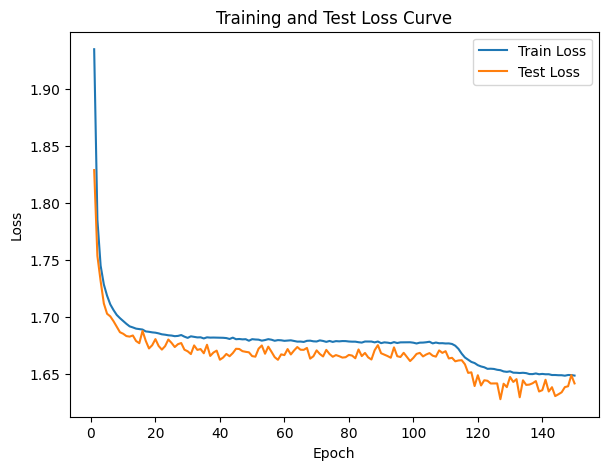

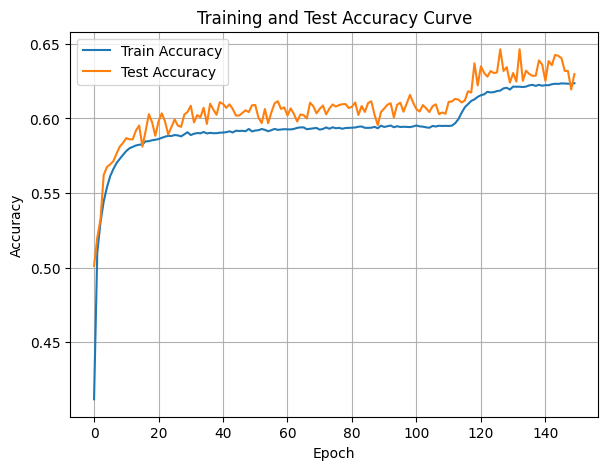

In [16]:
coverDTEmlp8b.train_single_model()

Randomly initializing 8 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.92s/it]

Epoch [1/10], Train F1:0.3863160909513067, Train Loss: 1.9406, Train Acc: 0.3906, Test F1:0.34101284186924197, Test Loss: 1.8540, Test Acc: 0.4370


Training Process:  20%|██        | 2/10 [01:17<05:09, 38.74s/it]

Epoch [2/10], Train F1:0.43015741785980594, Train Loss: 1.8650, Train Acc: 0.4489, Test F1:0.47008338132066313, Test Loss: 1.7958, Test Acc: 0.5128


Training Process:  30%|███       | 3/10 [01:56<04:34, 39.21s/it]

Epoch [3/10], Train F1:0.4458014073523868, Train Loss: 1.8253, Train Acc: 0.4764, Test F1:0.49742197458422527, Test Loss: 1.7651, Test Acc: 0.5405


Training Process:  40%|████      | 4/10 [02:39<04:01, 40.31s/it]

Epoch [4/10], Train F1:0.4561610417921427, Train Loss: 1.8014, Train Acc: 0.4934, Test F1:0.5097112160778083, Test Loss: 1.7465, Test Acc: 0.5548


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.77s/it]

Epoch [5/10], Train F1:0.46433904261525505, Train Loss: 1.7851, Train Acc: 0.5054, Test F1:0.5179269296313157, Test Loss: 1.7335, Test Acc: 0.5647


Training Process:  60%|██████    | 6/10 [04:07<02:50, 42.60s/it]

Epoch [6/10], Train F1:0.47100876394882707, Train Loss: 1.7730, Train Acc: 0.5144, Test F1:0.5238370194579506, Test Loss: 1.7238, Test Acc: 0.5718


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.97s/it]

Epoch [7/10], Train F1:0.4766668396836014, Train Loss: 1.7636, Train Acc: 0.5217, Test F1:0.5283212931701793, Test Loss: 1.7163, Test Acc: 0.5771


Training Process:  80%|████████  | 8/10 [05:43<01:30, 45.48s/it]

Epoch [8/10], Train F1:0.48133257876411273, Train Loss: 1.7561, Train Acc: 0.5275, Test F1:0.5315955432911772, Test Loss: 1.7105, Test Acc: 0.5811


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.15s/it]

Epoch [9/10], Train F1:0.48545516566332697, Train Loss: 1.7499, Train Acc: 0.5324, Test F1:0.5341695045682273, Test Loss: 1.7058, Test Acc: 0.5843


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.55s/it]


Epoch [10/10], Train F1:0.4899669428427784, Train Loss: 1.7443, Train Acc: 0.5368, Test F1:0.5363596976968406, Test Loss: 1.7014, Test Acc: 0.5870
Total Epochs: 10
Train loss start: 2.043959856033325, Train loss end: 1.7194923162460327
Highest Mean Train Accuracy (over epoch): 0.5368484769110391
Test loss start: 1.8042439222335815, Test loss end: 1.628613829612732
Highest mean Test Accuracy (over epoch): 0.5869686283423831


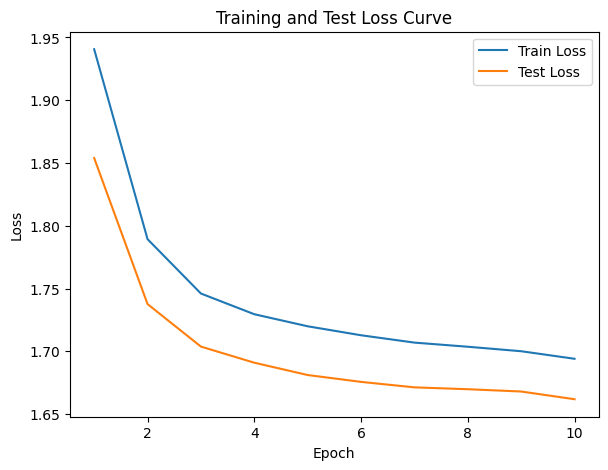

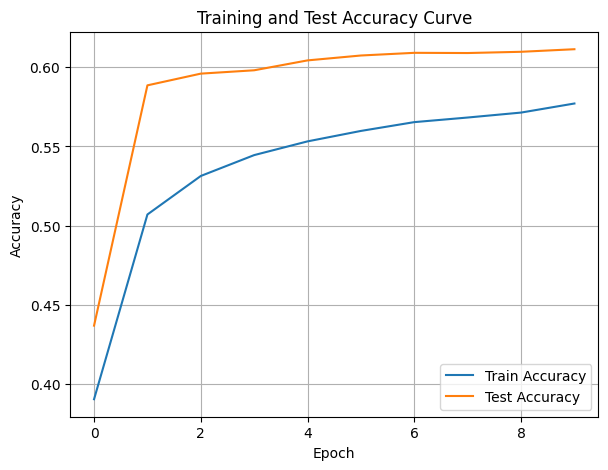

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:36<05:30, 36.68s/it]

Epoch [1/10], Train F1:0.32102387034512886, Train Loss: 1.9728, Train Acc: 0.3759, Test F1:0.3299072166307814, Test Loss: 1.8441, Test Acc: 0.4903


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.07s/it]

Epoch [2/10], Train F1:0.34516761362257625, Train Loss: 1.8877, Train Acc: 0.4374, Test F1:0.3382065199961293, Test Loss: 1.8034, Test Acc: 0.4927


Training Process:  30%|███       | 3/10 [01:57<04:39, 39.96s/it]

Epoch [3/10], Train F1:0.3750757550548819, Train Loss: 1.8438, Train Acc: 0.4651, Test F1:0.3966968590737695, Test Loss: 1.7762, Test Acc: 0.5150


Training Process:  40%|████      | 4/10 [02:40<04:05, 40.90s/it]

Epoch [4/10], Train F1:0.4092869730003447, Train Loss: 1.8154, Train Acc: 0.4853, Test F1:0.43983653995175354, Test Loss: 1.7556, Test Acc: 0.5341


Training Process:  50%|█████     | 5/10 [03:24<03:30, 42.01s/it]

Epoch [5/10], Train F1:0.43548926780623703, Train Loss: 1.7951, Train Acc: 0.5006, Test F1:0.4731109201786485, Test Loss: 1.7393, Test Acc: 0.5508


Training Process:  60%|██████    | 6/10 [04:08<02:50, 42.74s/it]

Epoch [6/10], Train F1:0.45493414689611544, Train Loss: 1.7795, Train Acc: 0.5127, Test F1:0.4938741168930996, Test Loss: 1.7269, Test Acc: 0.5624


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.31s/it]

Epoch [7/10], Train F1:0.46970330842721786, Train Loss: 1.7670, Train Acc: 0.5226, Test F1:0.5084046060107658, Test Loss: 1.7168, Test Acc: 0.5711


Training Process:  80%|████████  | 8/10 [05:45<01:31, 45.94s/it]

Epoch [8/10], Train F1:0.4811353296739854, Train Loss: 1.7570, Train Acc: 0.5306, Test F1:0.5200185394353735, Test Loss: 1.7082, Test Acc: 0.5784


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.24s/it]

Epoch [9/10], Train F1:0.4902014423557333, Train Loss: 1.7488, Train Acc: 0.5373, Test F1:0.5296739866879724, Test Loss: 1.7007, Test Acc: 0.5848


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.70s/it]


Epoch [10/10], Train F1:0.4976862621004052, Train Loss: 1.7419, Train Acc: 0.5429, Test F1:0.5377364837190479, Test Loss: 1.6946, Test Acc: 0.5903
Total Epochs: 10
Train loss start: 2.0979397296905518, Train loss end: 1.719595193862915
Highest Mean Train Accuracy (over epoch): 0.5428529541646099
Test loss start: 1.8280246257781982, Test loss end: 1.6461821794509888
Highest mean Test Accuracy (over epoch): 0.5902658499065156


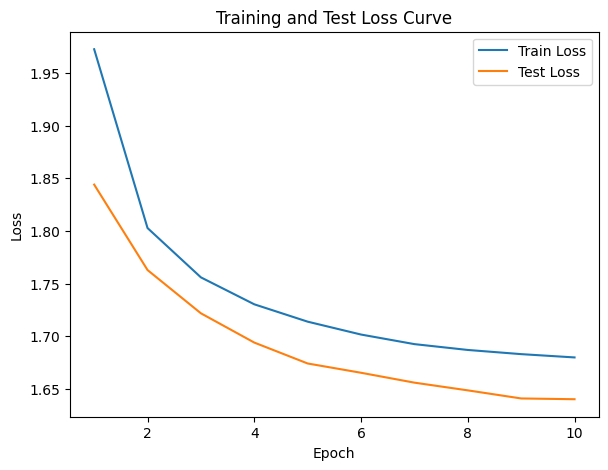

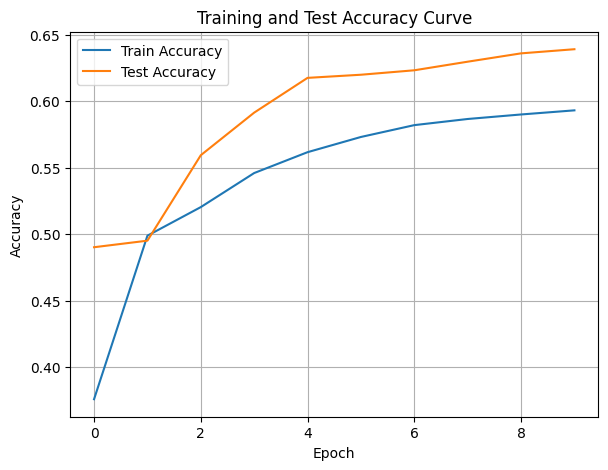

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:36<05:25, 36.21s/it]

Epoch [1/10], Train F1:0.3315311780863856, Train Loss: 1.8841, Train Acc: 0.4766, Test F1:0.3185289398554824, Test Loss: 1.8105, Test Acc: 0.4862


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.81s/it]

Epoch [2/10], Train F1:0.3474150976780396, Train Loss: 1.8325, Train Acc: 0.4874, Test F1:0.34968100936686497, Test Loss: 1.7804, Test Acc: 0.4980


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.99s/it]

Epoch [3/10], Train F1:0.38696039480439504, Train Loss: 1.8037, Train Acc: 0.5008, Test F1:0.405537051395224, Test Loss: 1.7571, Test Acc: 0.5220


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.45s/it]

Epoch [4/10], Train F1:0.41908403195074606, Train Loss: 1.7844, Train Acc: 0.5128, Test F1:0.43841500304841624, Test Loss: 1.7411, Test Acc: 0.5371


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.36s/it]

Epoch [5/10], Train F1:0.43976594501528954, Train Loss: 1.7705, Train Acc: 0.5220, Test F1:0.4500123816505227, Test Loss: 1.7325, Test Acc: 0.5437


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.59s/it]

Epoch [6/10], Train F1:0.4539265294313885, Train Loss: 1.7599, Train Acc: 0.5293, Test F1:0.4609870748400807, Test Loss: 1.7250, Test Acc: 0.5497


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.69s/it]

Epoch [7/10], Train F1:0.4642140941938486, Train Loss: 1.7516, Train Acc: 0.5351, Test F1:0.47258001938998456, Test Loss: 1.7184, Test Acc: 0.5559


Training Process:  80%|████████  | 8/10 [05:39<01:29, 44.99s/it]

Epoch [8/10], Train F1:0.4732587258395972, Train Loss: 1.7446, Train Acc: 0.5402, Test F1:0.48021773355654435, Test Loss: 1.7133, Test Acc: 0.5601


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.59s/it]

Epoch [9/10], Train F1:0.48204318582554984, Train Loss: 1.7384, Train Acc: 0.5451, Test F1:0.4900380862989333, Test Loss: 1.7075, Test Acc: 0.5653


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.19s/it]

Epoch [10/10], Train F1:0.49037248996197647, Train Loss: 1.7328, Train Acc: 0.5497, Test F1:0.5005211737341467, Test Loss: 1.7021, Test Acc: 0.5707
Total Epochs: 10
Train loss start: 1.9885945320129395, Train loss end: 1.7589863538742065
Highest Mean Train Accuracy (over epoch): 0.5496584026791321
Test loss start: 1.814994215965271, Test loss end: 1.6305450201034546
Highest mean Test Accuracy (over epoch): 0.5706901988781886


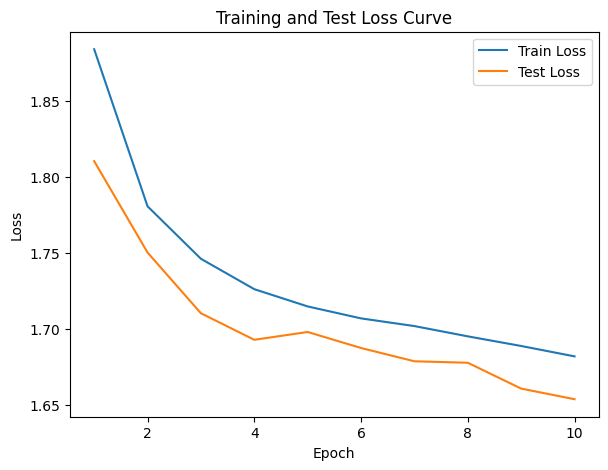

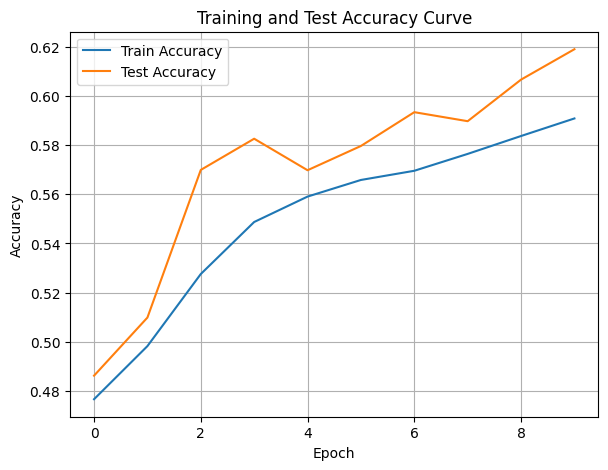

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:37<05:40, 37.81s/it]

Epoch [1/10], Train F1:0.3658737950292704, Train Loss: 1.9390, Train Acc: 0.4245, Test F1:0.34516439078011857, Test Loss: 1.8102, Test Acc: 0.4948


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.50s/it]

Epoch [2/10], Train F1:0.3934843951958234, Train Loss: 1.8599, Train Acc: 0.4699, Test F1:0.38025370271242104, Test Loss: 1.7802, Test Acc: 0.5102


Training Process:  30%|███       | 3/10 [01:57<04:35, 39.43s/it]

Epoch [3/10], Train F1:0.41550986657715994, Train Loss: 1.8203, Train Acc: 0.4914, Test F1:0.4076218722708453, Test Loss: 1.7630, Test Acc: 0.5234


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.24s/it]

Epoch [4/10], Train F1:0.4371029004501132, Train Loss: 1.7957, Train Acc: 0.5065, Test F1:0.4295647919781824, Test Loss: 1.7477, Test Acc: 0.5342


Training Process:  50%|█████     | 5/10 [03:22<03:28, 41.66s/it]

Epoch [5/10], Train F1:0.45569327699575946, Train Loss: 1.7781, Train Acc: 0.5185, Test F1:0.4450511566983141, Test Loss: 1.7365, Test Acc: 0.5421


Training Process:  60%|██████    | 6/10 [04:06<02:49, 42.45s/it]

Epoch [6/10], Train F1:0.4705379683937536, Train Loss: 1.7648, Train Acc: 0.5280, Test F1:0.45737938763495123, Test Loss: 1.7278, Test Acc: 0.5485


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.97s/it]

Epoch [7/10], Train F1:0.482591286838856, Train Loss: 1.7542, Train Acc: 0.5360, Test F1:0.46881546777230654, Test Loss: 1.7201, Test Acc: 0.5544


Training Process:  80%|████████  | 8/10 [05:42<01:31, 45.52s/it]

Epoch [8/10], Train F1:0.49218692832791616, Train Loss: 1.7455, Train Acc: 0.5425, Test F1:0.48110668519812205, Test Loss: 1.7127, Test Acc: 0.5607


Training Process:  90%|█████████ | 9/10 [06:33<00:46, 46.96s/it]

Epoch [9/10], Train F1:0.5001078485392537, Train Loss: 1.7383, Train Acc: 0.5481, Test F1:0.4912500282464285, Test Loss: 1.7062, Test Acc: 0.5662


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.50s/it]

Epoch [10/10], Train F1:0.5067194624287845, Train Loss: 1.7322, Train Acc: 0.5529, Test F1:0.5004557843610705, Test Loss: 1.7005, Test Acc: 0.5715
Total Epochs: 10
Train loss start: 2.0765726566314697, Train loss end: 1.5476939678192139
Highest Mean Train Accuracy (over epoch): 0.5528555504343766
Test loss start: 1.80765962600708, Test loss end: 1.6579350233078003
Highest mean Test Accuracy (over epoch): 0.5715300366253458


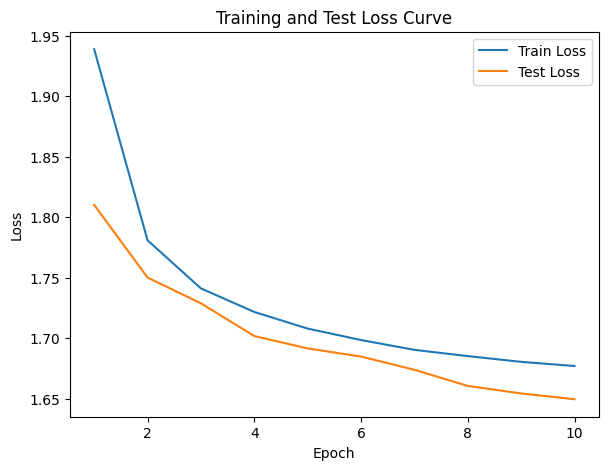

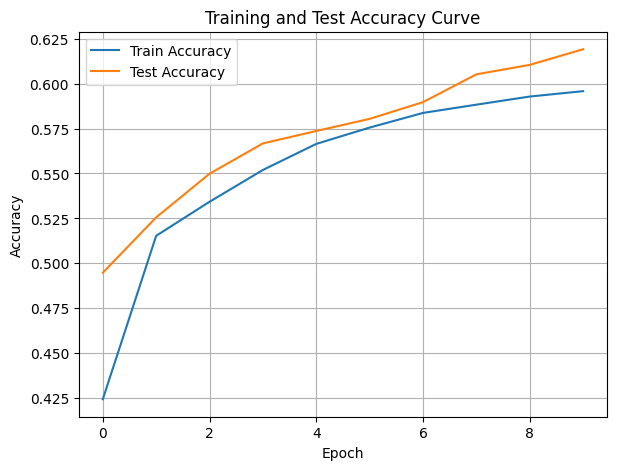

./saved_models/model_4.pth
Training Model with id 5


Training Process:  10%|█         | 1/10 [00:36<05:29, 36.66s/it]

Epoch [1/10], Train F1:0.3763849264843236, Train Loss: 1.9607, Train Acc: 0.3736, Test F1:0.36291654414413366, Test Loss: 1.8155, Test Acc: 0.4965


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.79s/it]

Epoch [2/10], Train F1:0.41214881381308155, Train Loss: 1.8758, Train Acc: 0.4424, Test F1:0.3860178183180077, Test Loss: 1.7802, Test Acc: 0.5079


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.05s/it]

Epoch [3/10], Train F1:0.4312684718531045, Train Loss: 1.8324, Train Acc: 0.4723, Test F1:0.4195621032271056, Test Loss: 1.7590, Test Acc: 0.5243


Training Process:  40%|████      | 4/10 [02:38<04:03, 40.57s/it]

Epoch [4/10], Train F1:0.44833237096504797, Train Loss: 1.8055, Train Acc: 0.4915, Test F1:0.44610985404581555, Test Loss: 1.7440, Test Acc: 0.5374


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.36s/it]

Epoch [5/10], Train F1:0.4633009203361133, Train Loss: 1.7866, Train Acc: 0.5057, Test F1:0.4678087265862123, Test Loss: 1.7313, Test Acc: 0.5483


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.57s/it]

Epoch [6/10], Train F1:0.47608326733457257, Train Loss: 1.7722, Train Acc: 0.5171, Test F1:0.48475031771098986, Test Loss: 1.7210, Test Acc: 0.5576


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.67s/it]

Epoch [7/10], Train F1:0.486464298716233, Train Loss: 1.7609, Train Acc: 0.5261, Test F1:0.49770888470621527, Test Loss: 1.7129, Test Acc: 0.5651


Training Process:  80%|████████  | 8/10 [05:41<01:30, 45.46s/it]

Epoch [8/10], Train F1:0.49497675890964954, Train Loss: 1.7517, Train Acc: 0.5336, Test F1:0.505878121043335, Test Loss: 1.7069, Test Acc: 0.5702


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.87s/it]

Epoch [9/10], Train F1:0.5019987582936033, Train Loss: 1.7440, Train Acc: 0.5398, Test F1:0.5147741836714372, Test Loss: 1.7010, Test Acc: 0.5756


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.42s/it]


Epoch [10/10], Train F1:0.5080242230594951, Train Loss: 1.7375, Train Acc: 0.5453, Test F1:0.522965977941768, Test Loss: 1.6956, Test Acc: 0.5807
Total Epochs: 10
Train loss start: 2.095102071762085, Train loss end: 1.7373303174972534
Highest Mean Train Accuracy (over epoch): 0.5452602178012177
Test loss start: 1.7906062602996826, Test loss end: 1.6509954929351807
Highest mean Test Accuracy (over epoch): 0.5807234906451695


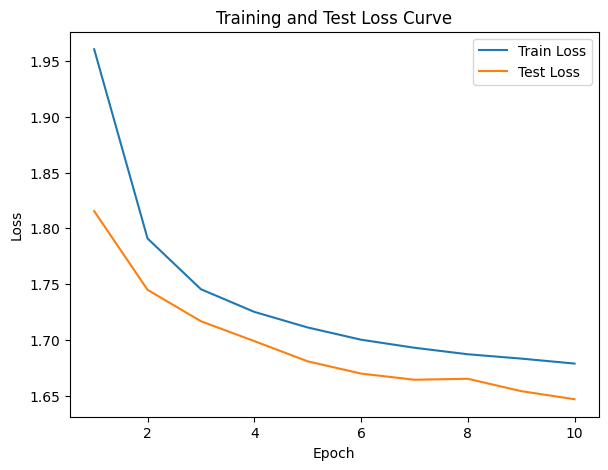

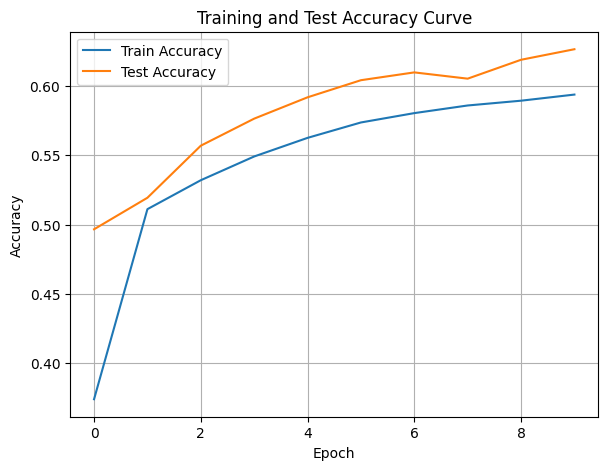

./saved_models/model_5.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.41s/it]

Epoch [1/10], Train F1:0.34542072881713093, Train Loss: 1.9505, Train Acc: 0.3943, Test F1:0.3258116454406055, Test Loss: 1.8421, Test Acc: 0.4820


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.49s/it]

Epoch [2/10], Train F1:0.37701348253721306, Train Loss: 1.8697, Train Acc: 0.4507, Test F1:0.343765466569624, Test Loss: 1.8003, Test Acc: 0.4892


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.46s/it]

Epoch [3/10], Train F1:0.4060760936988734, Train Loss: 1.8286, Train Acc: 0.4770, Test F1:0.40910767738399845, Test Loss: 1.7719, Test Acc: 0.5160


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.30s/it]

Epoch [4/10], Train F1:0.4285511859520584, Train Loss: 1.8034, Train Acc: 0.4941, Test F1:0.43769448742106654, Test Loss: 1.7548, Test Acc: 0.5300


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.51s/it]

Epoch [5/10], Train F1:0.4446528411377444, Train Loss: 1.7862, Train Acc: 0.5065, Test F1:0.45653492421613434, Test Loss: 1.7427, Test Acc: 0.5406


Training Process:  60%|██████    | 6/10 [04:07<02:51, 42.80s/it]

Epoch [6/10], Train F1:0.45622576219246114, Train Loss: 1.7736, Train Acc: 0.5156, Test F1:0.46995298464294105, Test Loss: 1.7333, Test Acc: 0.5488


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.93s/it]

Epoch [7/10], Train F1:0.46510983536956735, Train Loss: 1.7639, Train Acc: 0.5229, Test F1:0.48155464958988053, Test Loss: 1.7255, Test Acc: 0.5560


Training Process:  80%|████████  | 8/10 [05:40<01:29, 44.87s/it]

Epoch [8/10], Train F1:0.4719030441045295, Train Loss: 1.7563, Train Acc: 0.5287, Test F1:0.4896772713665368, Test Loss: 1.7196, Test Acc: 0.5613


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.52s/it]

Epoch [9/10], Train F1:0.47752581260735766, Train Loss: 1.7500, Train Acc: 0.5336, Test F1:0.4966933614769072, Test Loss: 1.7146, Test Acc: 0.5660


Training Process: 100%|██████████| 10/10 [07:23<00:00, 44.40s/it]

Epoch [10/10], Train F1:0.4821726110695573, Train Loss: 1.7446, Train Acc: 0.5378, Test F1:0.5014413931470112, Test Loss: 1.7108, Test Acc: 0.5694
Total Epochs: 10
Train loss start: 2.089327335357666, Train loss end: 1.8774118423461914
Highest Mean Train Accuracy (over epoch): 0.5377785900303242
Test loss start: 1.828582525253296, Test loss end: 1.6537398099899292
Highest mean Test Accuracy (over epoch): 0.5693761165287881


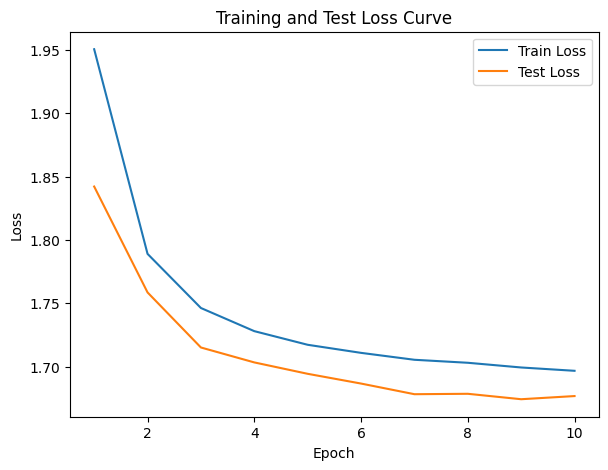

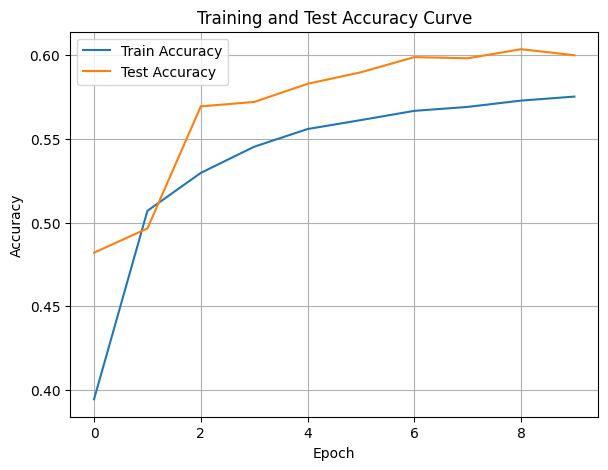

./saved_models/model_6.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:37<05:39, 37.70s/it]

Epoch [1/10], Train F1:0.40408134233601234, Train Loss: 1.9445, Train Acc: 0.3925, Test F1:0.43379052456866934, Test Loss: 1.8136, Test Acc: 0.5242


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.30s/it]

Epoch [2/10], Train F1:0.44307741695571523, Train Loss: 1.8632, Train Acc: 0.4571, Test F1:0.4448605728041435, Test Loss: 1.7746, Test Acc: 0.5352


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.59s/it]

Epoch [3/10], Train F1:0.45856394398145217, Train Loss: 1.8211, Train Acc: 0.4854, Test F1:0.4604160650593119, Test Loss: 1.7533, Test Acc: 0.5457


Training Process:  40%|████      | 4/10 [02:39<04:03, 40.65s/it]

Epoch [4/10], Train F1:0.4682660038826728, Train Loss: 1.7964, Train Acc: 0.5020, Test F1:0.48200563134704044, Test Loss: 1.7367, Test Acc: 0.5579


Training Process:  50%|█████     | 5/10 [03:22<03:26, 41.30s/it]

Epoch [5/10], Train F1:0.47569504397410767, Train Loss: 1.7797, Train Acc: 0.5135, Test F1:0.4964301231043064, Test Loss: 1.7252, Test Acc: 0.5666


Training Process:  60%|██████    | 6/10 [04:07<02:50, 42.67s/it]

Epoch [6/10], Train F1:0.4815611855919339, Train Loss: 1.7676, Train Acc: 0.5221, Test F1:0.5059180775415707, Test Loss: 1.7166, Test Acc: 0.5727


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.97s/it]

Epoch [7/10], Train F1:0.4864149771261055, Train Loss: 1.7583, Train Acc: 0.5288, Test F1:0.5124820474923574, Test Loss: 1.7103, Test Acc: 0.5772


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.57s/it]

Epoch [8/10], Train F1:0.4903602299037353, Train Loss: 1.7510, Train Acc: 0.5342, Test F1:0.5172422088535668, Test Loss: 1.7056, Test Acc: 0.5806


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.09s/it]

Epoch [9/10], Train F1:0.4937094746719309, Train Loss: 1.7450, Train Acc: 0.5387, Test F1:0.5218015300032985, Test Loss: 1.7014, Test Acc: 0.5838


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.56s/it]

Epoch [10/10], Train F1:0.4964648748557664, Train Loss: 1.7401, Train Acc: 0.5424, Test F1:0.5253805448196839, Test Loss: 1.6979, Test Acc: 0.5864
Total Epochs: 10
Train loss start: 2.094060182571411, Train loss end: 1.678968071937561
Highest Mean Train Accuracy (over epoch): 0.5423983970710216
Test loss start: 1.7804867029190063, Test loss end: 1.6212177276611328
Highest mean Test Accuracy (over epoch): 0.5864115845264317


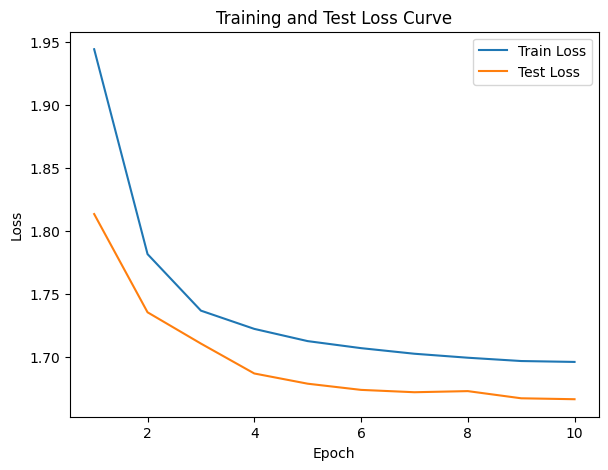

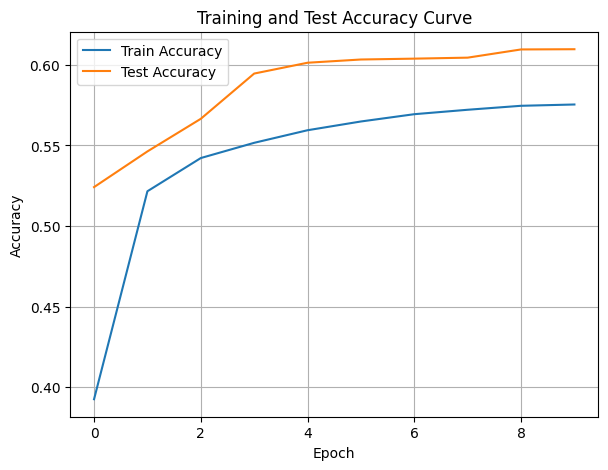

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.60s/it]

Epoch [1/10], Train F1:0.3864072040221058, Train Loss: 1.9741, Train Acc: 0.3614, Test F1:0.3382232754143861, Test Loss: 1.8170, Test Acc: 0.4823


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.46s/it]

Epoch [2/10], Train F1:0.4320408760933272, Train Loss: 1.8858, Train Acc: 0.4338, Test F1:0.3583445144820436, Test Loss: 1.7843, Test Acc: 0.4921


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.63s/it]

Epoch [3/10], Train F1:0.4549494055793186, Train Loss: 1.8371, Train Acc: 0.4697, Test F1:0.38788505777047855, Test Loss: 1.7641, Test Acc: 0.5061


Training Process:  40%|████      | 4/10 [02:40<04:04, 40.77s/it]

Epoch [4/10], Train F1:0.4712944435059401, Train Loss: 1.8068, Train Acc: 0.4925, Test F1:0.41964534117102104, Test Loss: 1.7483, Test Acc: 0.5218


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.71s/it]

Epoch [5/10], Train F1:0.483762929447607, Train Loss: 1.7861, Train Acc: 0.5082, Test F1:0.44112679124367427, Test Loss: 1.7370, Test Acc: 0.5331


Training Process:  60%|██████    | 6/10 [04:08<02:50, 42.73s/it]

Epoch [6/10], Train F1:0.49385903645522855, Train Loss: 1.7707, Train Acc: 0.5202, Test F1:0.4573568318426812, Test Loss: 1.7276, Test Acc: 0.5423


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.10s/it]

Epoch [7/10], Train F1:0.5021207379541855, Train Loss: 1.7587, Train Acc: 0.5297, Test F1:0.46939411043720997, Test Loss: 1.7203, Test Acc: 0.5494


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.61s/it]

Epoch [8/10], Train F1:0.5087486617100209, Train Loss: 1.7493, Train Acc: 0.5372, Test F1:0.4811714999462107, Test Loss: 1.7137, Test Acc: 0.5563


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.06s/it]

Epoch [9/10], Train F1:0.5143238665035434, Train Loss: 1.7415, Train Acc: 0.5435, Test F1:0.4913669228204608, Test Loss: 1.7078, Test Acc: 0.5625


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.68s/it]


Epoch [10/10], Train F1:0.5192017062307407, Train Loss: 1.7348, Train Acc: 0.5489, Test F1:0.5012056073609442, Test Loss: 1.7023, Test Acc: 0.5685
Total Epochs: 10
Train loss start: 2.106598377227783, Train loss end: 1.6369807720184326
Highest Mean Train Accuracy (over epoch): 0.5488943133506614
Test loss start: 1.8128271102905273, Test loss end: 1.616553544998169
Highest mean Test Accuracy (over epoch): 0.5684837338963734


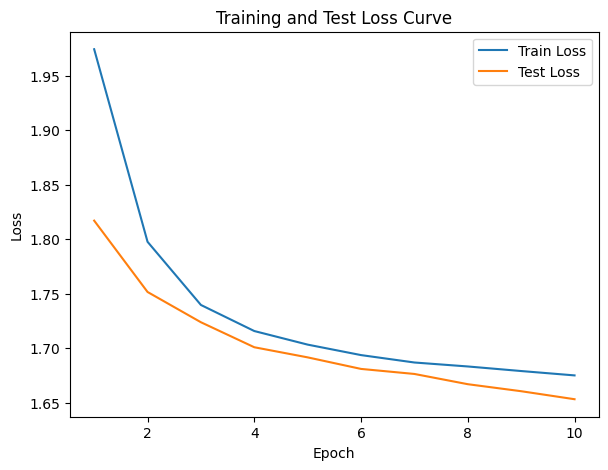

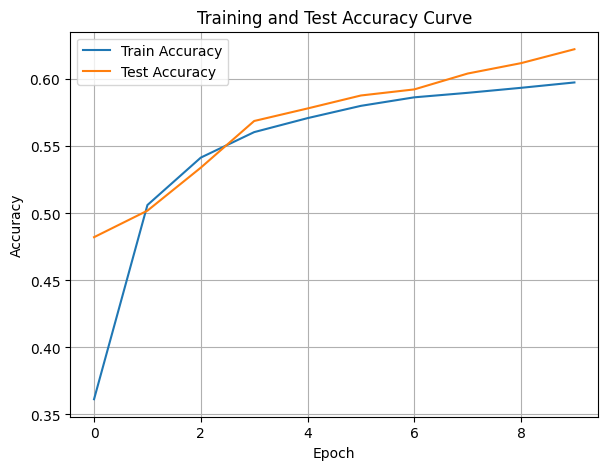

./saved_models/model_8.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.02s/it]

Epoch [1/10], Train F1:0.5637367327766862, Train Loss: 1.6728, Train Acc: 0.5994, Test F1:0.5729643405939052, Test Loss: 1.6556, Test Acc: 0.6187


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.31s/it]

Epoch [2/10], Train F1:0.5650546717555314, Train Loss: 1.6716, Train Acc: 0.6006, Test F1:0.5732436361304363, Test Loss: 1.6529, Test Acc: 0.6195


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.47s/it]

Epoch [3/10], Train F1:0.56591446142658, Train Loss: 1.6708, Train Acc: 0.6014, Test F1:0.5777983959838747, Test Loss: 1.6500, Test Acc: 0.6225


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.45s/it]

Epoch [4/10], Train F1:0.5666564917152829, Train Loss: 1.6700, Train Acc: 0.6022, Test F1:0.5768697254170243, Test Loss: 1.6501, Test Acc: 0.6220


Training Process:  50%|█████     | 5/10 [03:21<03:25, 41.20s/it]

Epoch [5/10], Train F1:0.5673445108576084, Train Loss: 1.6693, Train Acc: 0.6029, Test F1:0.5805678719547971, Test Loss: 1.6477, Test Acc: 0.6249


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.55s/it]

Epoch [6/10], Train F1:0.5682527180902618, Train Loss: 1.6684, Train Acc: 0.6037, Test F1:0.5790670521010995, Test Loss: 1.6479, Test Acc: 0.6240


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.74s/it]

Epoch [7/10], Train F1:0.5689705565391278, Train Loss: 1.6677, Train Acc: 0.6044, Test F1:0.5798062475003051, Test Loss: 1.6475, Test Acc: 0.6244


Training Process:  80%|████████  | 8/10 [05:41<01:30, 45.42s/it]

Epoch [8/10], Train F1:0.5695844360252426, Train Loss: 1.6671, Train Acc: 0.6050, Test F1:0.5809580024497343, Test Loss: 1.6467, Test Acc: 0.6252


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 47.00s/it]

Epoch [9/10], Train F1:0.5702388077715553, Train Loss: 1.6665, Train Acc: 0.6057, Test F1:0.5820361040219738, Test Loss: 1.6460, Test Acc: 0.6259


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.42s/it]

Epoch [10/10], Train F1:0.5708098975119554, Train Loss: 1.6659, Train Acc: 0.6062, Test F1:0.5837234324963392, Test Loss: 1.6450, Test Acc: 0.6270
Total Epochs: 10
Train loss start: 1.6002908945083618, Train loss end: 1.6514859199523926
Highest Mean Train Accuracy (over epoch): 0.6062317400590364
Test loss start: 1.6298328638076782, Test loss end: 1.595423698425293
Highest mean Test Accuracy (over epoch): 0.6269959052607315


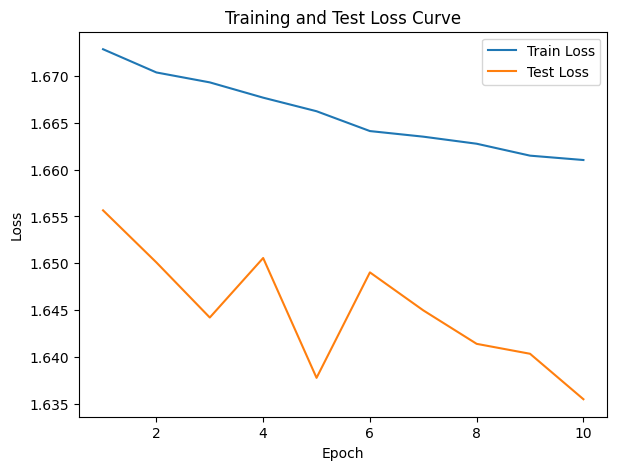

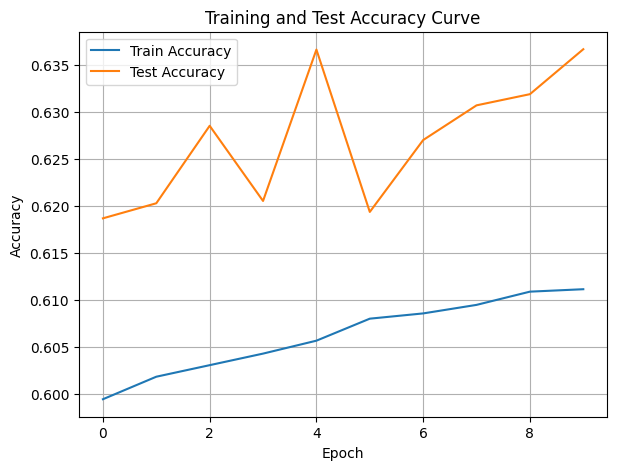

./saved_models/model_12.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:37<05:35, 37.30s/it]

Epoch [1/10], Train F1:0.5759964366280358, Train Loss: 1.6611, Train Acc: 0.6111, Test F1:0.5924465452693978, Test Loss: 1.6401, Test Acc: 0.6326


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.31s/it]

Epoch [2/10], Train F1:0.5766463363601182, Train Loss: 1.6603, Train Acc: 0.6118, Test F1:0.5924914636638693, Test Loss: 1.6397, Test Acc: 0.6331


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.71s/it]

Epoch [3/10], Train F1:0.5770154119618159, Train Loss: 1.6601, Train Acc: 0.6121, Test F1:0.5948901307804443, Test Loss: 1.6378, Test Acc: 0.6351


Training Process:  40%|████      | 4/10 [02:39<04:04, 40.73s/it]

Epoch [4/10], Train F1:0.5772443178324015, Train Loss: 1.6598, Train Acc: 0.6124, Test F1:0.5985033647286846, Test Loss: 1.6356, Test Acc: 0.6384


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.48s/it]

Epoch [5/10], Train F1:0.5775508807782292, Train Loss: 1.6595, Train Acc: 0.6127, Test F1:0.598604989608536, Test Loss: 1.6357, Test Acc: 0.6385


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.95s/it]

Epoch [6/10], Train F1:0.5778486004127696, Train Loss: 1.6592, Train Acc: 0.6130, Test F1:0.5979412161859707, Test Loss: 1.6360, Test Acc: 0.6380


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.77s/it]

Epoch [7/10], Train F1:0.5781493743878044, Train Loss: 1.6589, Train Acc: 0.6133, Test F1:0.5982646861621821, Test Loss: 1.6358, Test Acc: 0.6386


Training Process:  80%|████████  | 8/10 [05:42<01:30, 45.35s/it]

Epoch [8/10], Train F1:0.5783765515032571, Train Loss: 1.6587, Train Acc: 0.6135, Test F1:0.5965631290584643, Test Loss: 1.6364, Test Acc: 0.6374


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.09s/it]

Epoch [9/10], Train F1:0.5786834651000047, Train Loss: 1.6584, Train Acc: 0.6138, Test F1:0.5955640525808474, Test Loss: 1.6370, Test Acc: 0.6366


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.59s/it]


Epoch [10/10], Train F1:0.5789542011600184, Train Loss: 1.6581, Train Acc: 0.6141, Test F1:0.5939682315781887, Test Loss: 1.6377, Test Acc: 0.6355
Total Epochs: 10
Train loss start: 1.8137041330337524, Train loss end: 1.643789291381836
Highest Mean Train Accuracy (over epoch): 0.6140692110530152
Test loss start: 1.5985472202301025, Test loss end: 1.5981894731521606
Highest mean Test Accuracy (over epoch): 0.638589693221567


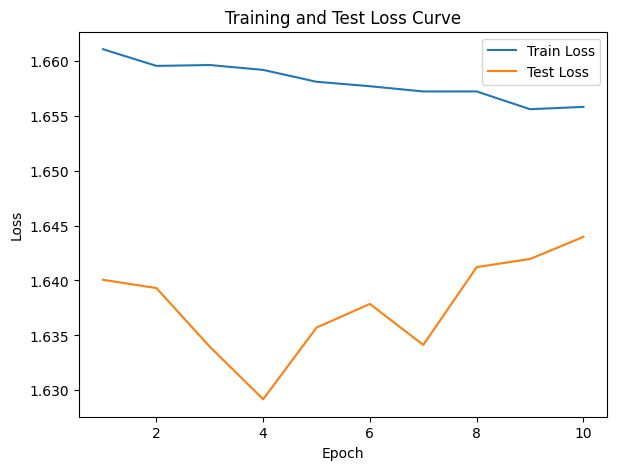

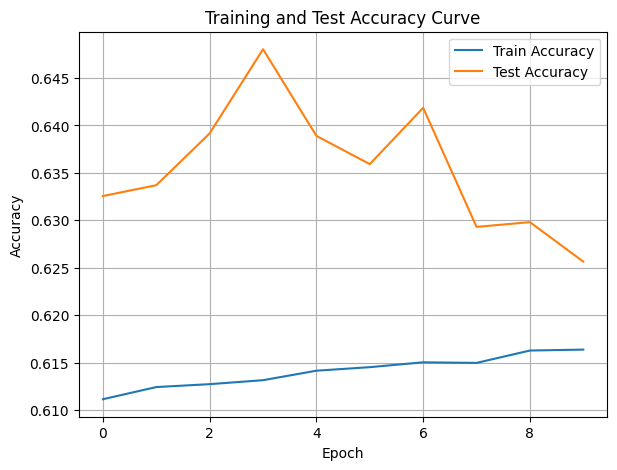

./saved_models/model_13.pth
Training Model with id 11


Training Process:  10%|█         | 1/10 [00:37<05:39, 37.75s/it]

Epoch [1/10], Train F1:0.5817960919829842, Train Loss: 1.6556, Train Acc: 0.6168, Test F1:0.5922848254690906, Test Loss: 1.6389, Test Acc: 0.6323


Training Process:  20%|██        | 2/10 [01:17<05:11, 38.88s/it]

Epoch [2/10], Train F1:0.5820914846419706, Train Loss: 1.6553, Train Acc: 0.6171, Test F1:0.5926031799598138, Test Loss: 1.6381, Test Acc: 0.6325


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.81s/it]

Epoch [3/10], Train F1:0.5818954483871209, Train Loss: 1.6554, Train Acc: 0.6169, Test F1:0.5937432147704435, Test Loss: 1.6377, Test Acc: 0.6336


Training Process:  40%|████      | 4/10 [02:40<04:04, 40.74s/it]

Epoch [4/10], Train F1:0.5819981854089245, Train Loss: 1.6552, Train Acc: 0.6170, Test F1:0.5983415814410266, Test Loss: 1.6350, Test Acc: 0.6374


Training Process:  50%|█████     | 5/10 [03:23<03:27, 41.49s/it]

Epoch [5/10], Train F1:0.5820610330650303, Train Loss: 1.6551, Train Acc: 0.6171, Test F1:0.5991231613525309, Test Loss: 1.6346, Test Acc: 0.6381


Training Process:  60%|██████    | 6/10 [04:09<02:51, 42.93s/it]

Epoch [6/10], Train F1:0.5822278534026951, Train Loss: 1.6550, Train Acc: 0.6173, Test F1:0.598139013825071, Test Loss: 1.6353, Test Acc: 0.6374


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.89s/it]

Epoch [7/10], Train F1:0.5822713542371355, Train Loss: 1.6549, Train Acc: 0.6173, Test F1:0.5939391910043308, Test Loss: 1.6374, Test Acc: 0.6343


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.52s/it]

Epoch [8/10], Train F1:0.5823586775297357, Train Loss: 1.6548, Train Acc: 0.6174, Test F1:0.5936744210571671, Test Loss: 1.6376, Test Acc: 0.6340


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.14s/it]

Epoch [9/10], Train F1:0.5824724302349512, Train Loss: 1.6547, Train Acc: 0.6175, Test F1:0.5943698032321242, Test Loss: 1.6373, Test Acc: 0.6346


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.48s/it]


Epoch [10/10], Train F1:0.5825172741747767, Train Loss: 1.6546, Train Acc: 0.6176, Test F1:0.5952882286016201, Test Loss: 1.6368, Test Acc: 0.6354
Total Epochs: 10
Train loss start: 1.7443798780441284, Train loss end: 1.5214617252349854
Highest Mean Train Accuracy (over epoch): 0.6176034541092004
Test loss start: 1.5879637002944946, Test loss end: 1.5909186601638794
Highest mean Test Accuracy (over epoch): 0.6380813153109313


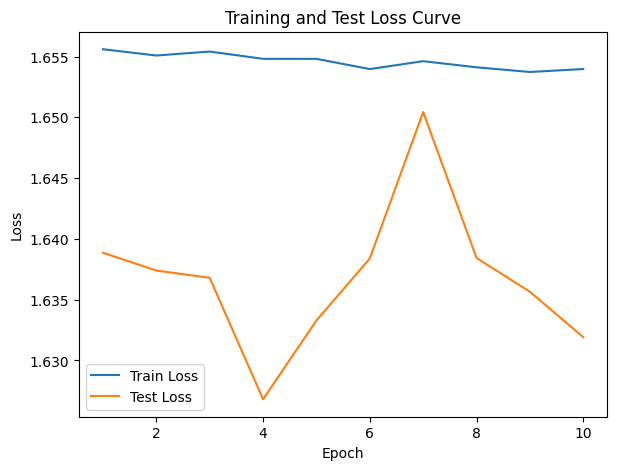

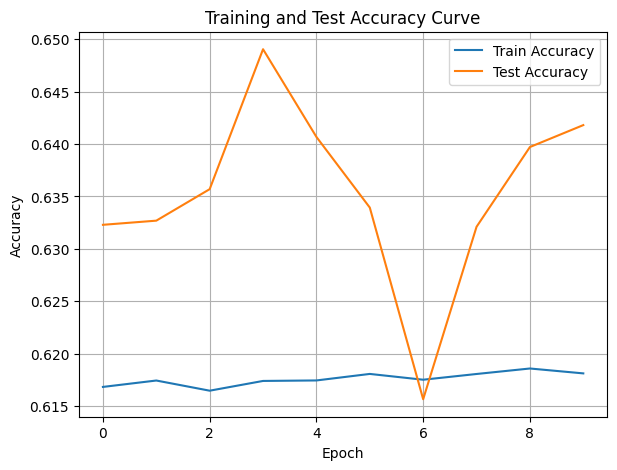

./saved_models/model_11.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.21s/it]

Epoch [1/10], Train F1:0.5832534313573109, Train Loss: 1.6536, Train Acc: 0.6184, Test F1:0.5907717735544199, Test Loss: 1.6399, Test Acc: 0.6324


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.47s/it]

Epoch [2/10], Train F1:0.5839647144934452, Train Loss: 1.6531, Train Acc: 0.6190, Test F1:0.5826986376647262, Test Loss: 1.6426, Test Acc: 0.6271


Training Process:  30%|███       | 3/10 [01:57<04:38, 39.80s/it]

Epoch [3/10], Train F1:0.5844342402117099, Train Loss: 1.6527, Train Acc: 0.6194, Test F1:0.5885088178510398, Test Loss: 1.6403, Test Acc: 0.6312


Training Process:  40%|████      | 4/10 [02:40<04:04, 40.75s/it]

Epoch [4/10], Train F1:0.5843988953417512, Train Loss: 1.6528, Train Acc: 0.6194, Test F1:0.5881034850510716, Test Loss: 1.6410, Test Acc: 0.6305


Training Process:  50%|█████     | 5/10 [03:23<03:27, 41.57s/it]

Epoch [5/10], Train F1:0.5847170596765634, Train Loss: 1.6525, Train Acc: 0.6198, Test F1:0.5874343507106888, Test Loss: 1.6416, Test Acc: 0.6298


Training Process:  60%|██████    | 6/10 [04:08<02:50, 42.74s/it]

Epoch [6/10], Train F1:0.5847485867332705, Train Loss: 1.6524, Train Acc: 0.6198, Test F1:0.5871565250961247, Test Loss: 1.6419, Test Acc: 0.6293


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.01s/it]

Epoch [7/10], Train F1:0.5847619461422381, Train Loss: 1.6524, Train Acc: 0.6198, Test F1:0.5877117162362836, Test Loss: 1.6416, Test Acc: 0.6298


Training Process:  80%|████████  | 8/10 [05:43<01:30, 45.49s/it]

Epoch [8/10], Train F1:0.5848021918668552, Train Loss: 1.6524, Train Acc: 0.6199, Test F1:0.5876721259203734, Test Loss: 1.6416, Test Acc: 0.6297


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.68s/it]

Epoch [9/10], Train F1:0.5848401165945805, Train Loss: 1.6523, Train Acc: 0.6199, Test F1:0.5873101769616599, Test Loss: 1.6419, Test Acc: 0.6293


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.45s/it]


Epoch [10/10], Train F1:0.5848763142152271, Train Loss: 1.6523, Train Acc: 0.6199, Test F1:0.5889037790987415, Test Loss: 1.6410, Test Acc: 0.6306
Total Epochs: 10
Train loss start: 1.676867127418518, Train loss end: 1.6953715085983276
Highest Mean Train Accuracy (over epoch): 0.619918001321432
Test loss start: 1.6055643558502197, Test loss end: 1.5924992561340332
Highest mean Test Accuracy (over epoch): 0.6324439254430899


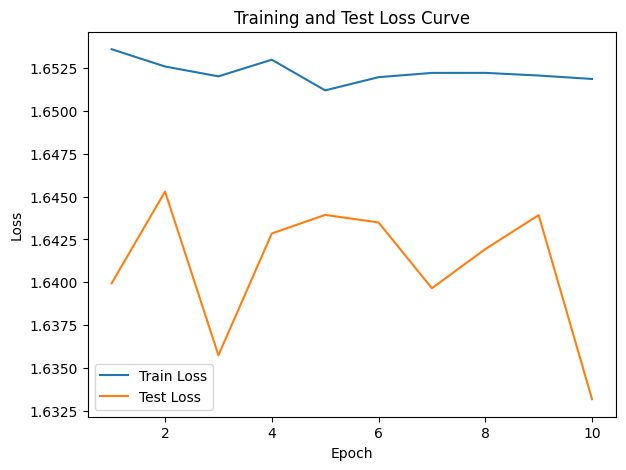

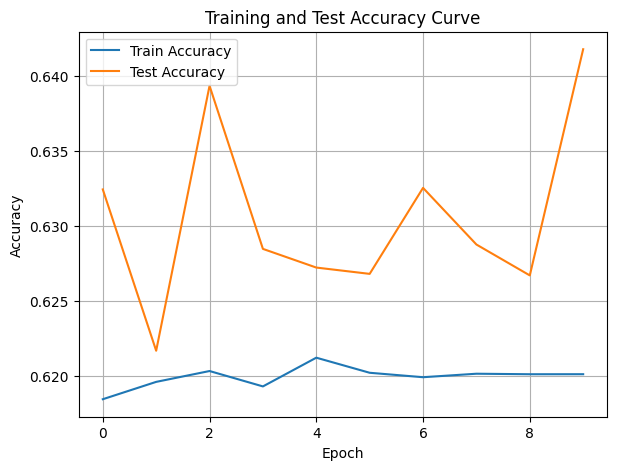

./saved_models/model_13.pth
Training Model with id 14


Training Process:  10%|█         | 1/10 [00:36<05:28, 36.54s/it]

Epoch [1/10], Train F1:0.5862192521471814, Train Loss: 1.6511, Train Acc: 0.6211, Test F1:0.5966256971322584, Test Loss: 1.6368, Test Acc: 0.6369


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.80s/it]

Epoch [2/10], Train F1:0.5860333857600845, Train Loss: 1.6514, Train Acc: 0.6208, Test F1:0.5956785655038553, Test Loss: 1.6370, Test Acc: 0.6351


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.94s/it]

Epoch [3/10], Train F1:0.5862227145615807, Train Loss: 1.6511, Train Acc: 0.6210, Test F1:0.5958515183391973, Test Loss: 1.6371, Test Acc: 0.6356


Training Process:  40%|████      | 4/10 [02:36<03:57, 39.61s/it]

Epoch [4/10], Train F1:0.5864656701911892, Train Loss: 1.6509, Train Acc: 0.6213, Test F1:0.5962968263092198, Test Loss: 1.6367, Test Acc: 0.6360


Training Process:  50%|█████     | 5/10 [03:19<03:25, 41.11s/it]

Epoch [5/10], Train F1:0.58635665521441, Train Loss: 1.6510, Train Acc: 0.6212, Test F1:0.5964402226793856, Test Loss: 1.6364, Test Acc: 0.6361


Training Process:  60%|██████    | 6/10 [04:05<02:50, 42.61s/it]

Epoch [6/10], Train F1:0.5864541932750286, Train Loss: 1.6509, Train Acc: 0.6213, Test F1:0.5952820968576177, Test Loss: 1.6369, Test Acc: 0.6351


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.62s/it]

Epoch [7/10], Train F1:0.5863456574398829, Train Loss: 1.6510, Train Acc: 0.6212, Test F1:0.5940756352390829, Test Loss: 1.6379, Test Acc: 0.6341


Training Process:  80%|████████  | 8/10 [05:40<01:31, 45.52s/it]

Epoch [8/10], Train F1:0.5862843463302784, Train Loss: 1.6510, Train Acc: 0.6212, Test F1:0.593959833876953, Test Loss: 1.6379, Test Acc: 0.6341


Training Process:  90%|█████████ | 9/10 [06:31<00:47, 47.03s/it]

Epoch [9/10], Train F1:0.5862688259966224, Train Loss: 1.6510, Train Acc: 0.6212, Test F1:0.5939903848243693, Test Loss: 1.6379, Test Acc: 0.6340


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.27s/it]

Epoch [10/10], Train F1:0.5864032184452531, Train Loss: 1.6508, Train Acc: 0.6213, Test F1:0.5944223821613932, Test Loss: 1.6375, Test Acc: 0.6343
Total Epochs: 10
Train loss start: 1.7076795101165771, Train loss end: 1.5709269046783447
Highest Mean Train Accuracy (over epoch): 0.6212823879581215
Test loss start: 1.596685528755188, Test loss end: 1.586199402809143
Highest mean Test Accuracy (over epoch): 0.6368578158615921


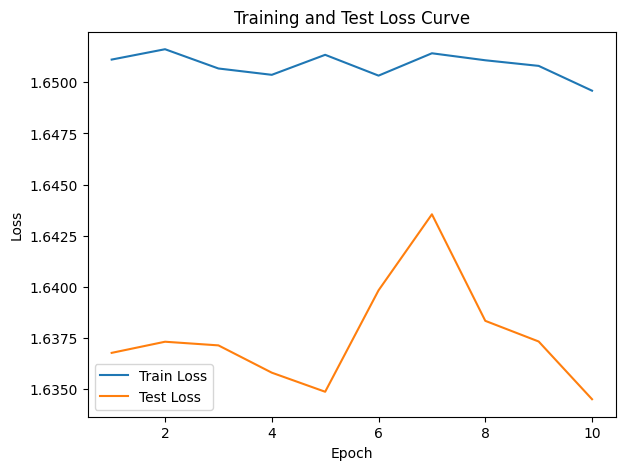

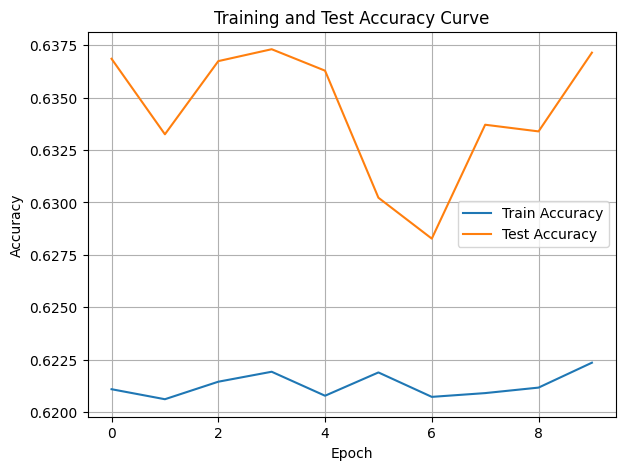

./saved_models/model_14.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:36<05:26, 36.26s/it]

Epoch [1/10], Train F1:0.5872513810072115, Train Loss: 1.6501, Train Acc: 0.6220, Test F1:0.5922276623659619, Test Loss: 1.6380, Test Acc: 0.6323


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.95s/it]

Epoch [2/10], Train F1:0.5869825707144614, Train Loss: 1.6503, Train Acc: 0.6218, Test F1:0.5938340751784016, Test Loss: 1.6369, Test Acc: 0.6337


Training Process:  30%|███       | 3/10 [01:54<04:30, 38.64s/it]

Epoch [3/10], Train F1:0.586900212263901, Train Loss: 1.6504, Train Acc: 0.6217, Test F1:0.5911930985756131, Test Loss: 1.6389, Test Acc: 0.6319


Training Process:  40%|████      | 4/10 [02:36<04:00, 40.01s/it]

Epoch [4/10], Train F1:0.5872723814562812, Train Loss: 1.6501, Train Acc: 0.6221, Test F1:0.5893744919454659, Test Loss: 1.6402, Test Acc: 0.6306


Training Process:  50%|█████     | 5/10 [03:21<03:27, 41.50s/it]

Epoch [5/10], Train F1:0.5875713704640517, Train Loss: 1.6498, Train Acc: 0.6224, Test F1:0.5922368161124618, Test Loss: 1.6386, Test Acc: 0.6329


Training Process:  60%|██████    | 6/10 [04:05<02:49, 42.35s/it]

Epoch [6/10], Train F1:0.5875027330531915, Train Loss: 1.6498, Train Acc: 0.6224, Test F1:0.591574654021291, Test Loss: 1.6393, Test Acc: 0.6322


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.71s/it]

Epoch [7/10], Train F1:0.5875386816520881, Train Loss: 1.6498, Train Acc: 0.6224, Test F1:0.5939504208201336, Test Loss: 1.6380, Test Acc: 0.6340


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.49s/it]

Epoch [8/10], Train F1:0.587692035643356, Train Loss: 1.6497, Train Acc: 0.6225, Test F1:0.5956381832920055, Test Loss: 1.6370, Test Acc: 0.6353


Training Process:  90%|█████████ | 9/10 [06:31<00:47, 47.05s/it]

Epoch [9/10], Train F1:0.5877229345258685, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.5950999471265657, Test Loss: 1.6374, Test Acc: 0.6348


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.41s/it]

Epoch [10/10], Train F1:0.5878041432979813, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.5957498397061254, Test Loss: 1.6370, Test Acc: 0.6354
Total Epochs: 10
Train loss start: 1.6571811437606812, Train loss end: 1.612752079963684
Highest Mean Train Accuracy (over epoch): 0.6226466714016583
Test loss start: 1.584907054901123, Test loss end: 1.5878437757492065
Highest mean Test Accuracy (over epoch): 0.6353835176339515


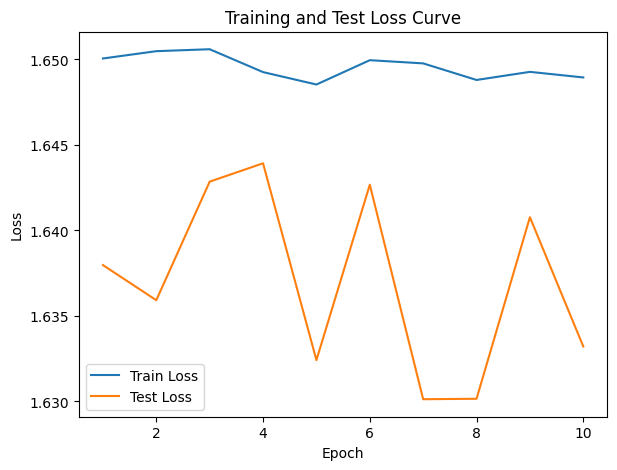

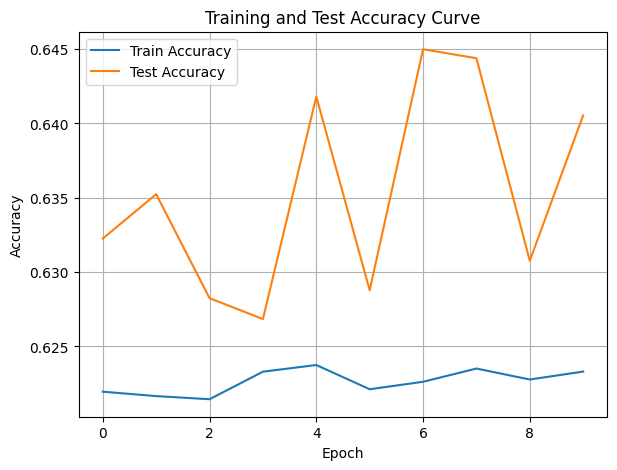

./saved_models/model_12.pth
Training Model with id 10


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.97s/it]

Epoch [1/10], Train F1:0.5879526088626925, Train Loss: 1.6494, Train Acc: 0.6228, Test F1:0.6075142821969386, Test Loss: 1.6295, Test Acc: 0.6455


Training Process:  20%|██        | 2/10 [01:16<05:08, 38.59s/it]

Epoch [2/10], Train F1:0.5881322613283968, Train Loss: 1.6491, Train Acc: 0.6230, Test F1:0.5988424178193749, Test Loss: 1.6346, Test Acc: 0.6380


Training Process:  30%|███       | 3/10 [01:57<04:35, 39.34s/it]

Epoch [3/10], Train F1:0.5884235670528699, Train Loss: 1.6489, Train Acc: 0.6232, Test F1:0.5985222891587685, Test Loss: 1.6346, Test Acc: 0.6375


Training Process:  40%|████      | 4/10 [02:38<04:00, 40.01s/it]

Epoch [4/10], Train F1:0.5883625020923406, Train Loss: 1.6489, Train Acc: 0.6231, Test F1:0.591238858982583, Test Loss: 1.6382, Test Acc: 0.6322


Training Process:  50%|█████     | 5/10 [03:22<03:28, 41.63s/it]

Epoch [5/10], Train F1:0.5884747275739854, Train Loss: 1.6488, Train Acc: 0.6233, Test F1:0.5901316701207956, Test Loss: 1.6393, Test Acc: 0.6313


Training Process:  60%|██████    | 6/10 [04:06<02:49, 42.42s/it]

Epoch [6/10], Train F1:0.5886306811294854, Train Loss: 1.6487, Train Acc: 0.6234, Test F1:0.588949847753808, Test Loss: 1.6406, Test Acc: 0.6303


Training Process:  70%|███████   | 7/10 [04:56<02:14, 44.70s/it]

Epoch [7/10], Train F1:0.5887489779439707, Train Loss: 1.6486, Train Acc: 0.6235, Test F1:0.5897881932114623, Test Loss: 1.6403, Test Acc: 0.6310


Training Process:  80%|████████  | 8/10 [05:46<01:32, 46.37s/it]

Epoch [8/10], Train F1:0.5887695708676752, Train Loss: 1.6486, Train Acc: 0.6235, Test F1:0.5893908140818529, Test Loss: 1.6405, Test Acc: 0.6307


Training Process:  90%|█████████ | 9/10 [06:36<00:47, 47.60s/it]

Epoch [9/10], Train F1:0.5888160421199707, Train Loss: 1.6485, Train Acc: 0.6235, Test F1:0.5903165677558768, Test Loss: 1.6400, Test Acc: 0.6314


Training Process: 100%|██████████| 10/10 [07:30<00:00, 45.05s/it]

Epoch [10/10], Train F1:0.5888008208313619, Train Loss: 1.6486, Train Acc: 0.6235, Test F1:0.5881985681581723, Test Loss: 1.6412, Test Acc: 0.6299
Total Epochs: 10
Train loss start: 1.6315040588378906, Train loss end: 1.6239773035049438
Highest Mean Train Accuracy (over epoch): 0.6235363188126926
Test loss start: 1.5823030471801758, Test loss end: 1.5876768827438354
Highest mean Test Accuracy (over epoch): 0.6455479315003586


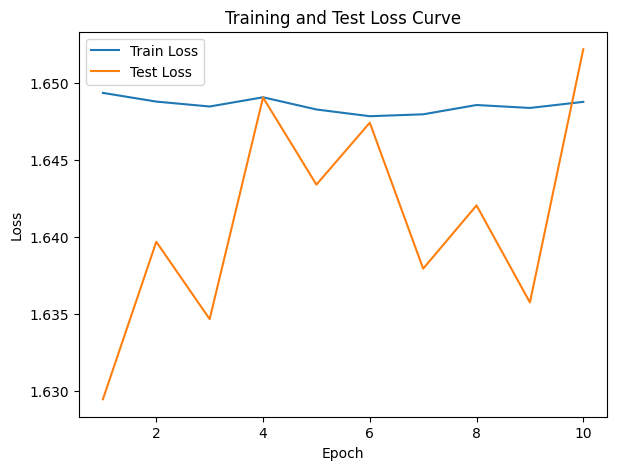

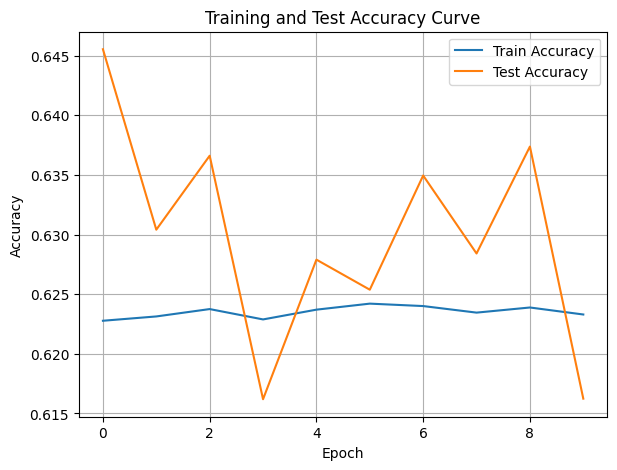

./saved_models/model_10.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [17]:
coverDTEmlp8b.train_DTE()

Training Process:   1%|          | 1/150 [00:36<1:30:10, 36.31s/it]

Epoch [1/150], Train F1:0.37414785971638154, Train Loss: 1.9153, Train Acc: 0.4538, Test F1:0.3262335911239522, Test Loss: 1.8172, Test Acc: 0.4867


Training Process:   1%|▏         | 2/150 [01:15<1:33:08, 37.76s/it]

Epoch [2/150], Train F1:0.39009616760550664, Train Loss: 1.8483, Train Acc: 0.4810, Test F1:0.36526851152106354, Test Loss: 1.7843, Test Acc: 0.5041


Training Process:   2%|▏         | 3/150 [01:54<1:34:07, 38.42s/it]

Epoch [3/150], Train F1:0.4108656974673565, Train Loss: 1.8139, Train Acc: 0.4970, Test F1:0.38465247607385306, Test Loss: 1.7679, Test Acc: 0.5139


Training Process:   3%|▎         | 4/150 [02:36<1:37:02, 39.88s/it]

Epoch [4/150], Train F1:0.43036028454846087, Train Loss: 1.7923, Train Acc: 0.5093, Test F1:0.41791713753184806, Test Loss: 1.7527, Test Acc: 0.5287


Training Process:   3%|▎         | 5/150 [03:18<1:38:32, 40.77s/it]

Epoch [5/150], Train F1:0.44530416314592813, Train Loss: 1.7772, Train Acc: 0.5186, Test F1:0.4309598167100973, Test Loss: 1.7443, Test Acc: 0.5358


Training Process:   4%|▍         | 6/150 [04:03<1:41:12, 42.17s/it]

Epoch [6/150], Train F1:0.45662414481382996, Train Loss: 1.7660, Train Acc: 0.5258, Test F1:0.4463058513083673, Test Loss: 1.7358, Test Acc: 0.5429


Training Process:   5%|▍         | 7/150 [04:48<1:42:58, 43.21s/it]

Epoch [7/150], Train F1:0.46605079767113144, Train Loss: 1.7570, Train Acc: 0.5319, Test F1:0.45613010011660443, Test Loss: 1.7299, Test Acc: 0.5475


Training Process:   5%|▌         | 8/150 [05:37<1:46:23, 44.96s/it]

Epoch [8/150], Train F1:0.47469970639250947, Train Loss: 1.7496, Train Acc: 0.5372, Test F1:0.4651225689538665, Test Loss: 1.7242, Test Acc: 0.5519


Training Process:   6%|▌         | 9/150 [06:27<1:49:03, 46.41s/it]

Epoch [9/150], Train F1:0.4828978440228985, Train Loss: 1.7430, Train Acc: 0.5421, Test F1:0.47189691251399035, Test Loss: 1.7197, Test Acc: 0.5553


Training Process:   7%|▋         | 10/150 [07:19<1:52:30, 48.22s/it]

Epoch [10/150], Train F1:0.4903941898768568, Train Loss: 1.7373, Train Acc: 0.5465, Test F1:0.48140046862564184, Test Loss: 1.7144, Test Acc: 0.5598


Training Process:   7%|▋         | 11/150 [08:13<1:55:43, 49.95s/it]

Epoch [11/150], Train F1:0.49714168829070665, Train Loss: 1.7321, Train Acc: 0.5506, Test F1:0.4880858835325964, Test Loss: 1.7099, Test Acc: 0.5632


Training Process:   8%|▊         | 12/150 [09:07<1:57:26, 51.06s/it]

Epoch [12/150], Train F1:0.5031309239112433, Train Loss: 1.7276, Train Acc: 0.5544, Test F1:0.4959535052201591, Test Loss: 1.7055, Test Acc: 0.5674


Training Process:   9%|▊         | 13/150 [10:02<1:59:41, 52.42s/it]

Epoch [13/150], Train F1:0.5084065025220257, Train Loss: 1.7234, Train Acc: 0.5578, Test F1:0.5028901705256236, Test Loss: 1.7015, Test Acc: 0.5712


Training Process:   9%|▉         | 14/150 [10:59<2:02:08, 53.89s/it]

Epoch [14/150], Train F1:0.5130233044880524, Train Loss: 1.7198, Train Acc: 0.5609, Test F1:0.5092956468050889, Test Loss: 1.6976, Test Acc: 0.5750


Training Process:  10%|█         | 15/150 [11:59<2:04:54, 55.52s/it]

Epoch [15/150], Train F1:0.5171294865906251, Train Loss: 1.7164, Train Acc: 0.5637, Test F1:0.5129030631893272, Test Loss: 1.6950, Test Acc: 0.5773


Training Process:  11%|█         | 16/150 [12:59<2:07:28, 57.08s/it]

Epoch [16/150], Train F1:0.5207568374847173, Train Loss: 1.7134, Train Acc: 0.5662, Test F1:0.5172294123515357, Test Loss: 1.6922, Test Acc: 0.5801


Training Process:  11%|█▏        | 17/150 [14:01<2:09:20, 58.35s/it]

Epoch [17/150], Train F1:0.5239805650535255, Train Loss: 1.7107, Train Acc: 0.5685, Test F1:0.5223526851508505, Test Loss: 1.6892, Test Acc: 0.5833


Training Process:  12%|█▏        | 18/150 [15:06<2:12:47, 60.36s/it]

Epoch [18/150], Train F1:0.5269378672612374, Train Loss: 1.7081, Train Acc: 0.5707, Test F1:0.5248747290967823, Test Loss: 1.6871, Test Acc: 0.5851


Training Process:  13%|█▎        | 19/150 [16:12<2:15:21, 62.00s/it]

Epoch [19/150], Train F1:0.5295521078645834, Train Loss: 1.7059, Train Acc: 0.5726, Test F1:0.5275577221197046, Test Loss: 1.6852, Test Acc: 0.5869


Training Process:  13%|█▎        | 20/150 [17:20<2:18:13, 63.80s/it]

Epoch [20/150], Train F1:0.5319598467838795, Train Loss: 1.7037, Train Acc: 0.5745, Test F1:0.5306143270839311, Test Loss: 1.6832, Test Acc: 0.5889


Training Process:  14%|█▍        | 21/150 [18:28<2:20:10, 65.20s/it]

Epoch [21/150], Train F1:0.5342100542605319, Train Loss: 1.7018, Train Acc: 0.5762, Test F1:0.5338602137171093, Test Loss: 1.6811, Test Acc: 0.5911


Training Process:  15%|█▍        | 22/150 [19:38<2:22:09, 66.64s/it]

Epoch [22/150], Train F1:0.5361964081648571, Train Loss: 1.7000, Train Acc: 0.5777, Test F1:0.5368499614415482, Test Loss: 1.6791, Test Acc: 0.5931


Training Process:  15%|█▌        | 23/150 [20:49<2:24:00, 68.04s/it]

Epoch [23/150], Train F1:0.5380703226636099, Train Loss: 1.6983, Train Acc: 0.5791, Test F1:0.5400041321457195, Test Loss: 1.6771, Test Acc: 0.5952


Training Process:  16%|█▌        | 24/150 [22:03<2:26:34, 69.80s/it]

Epoch [24/150], Train F1:0.5398384974303893, Train Loss: 1.6967, Train Acc: 0.5805, Test F1:0.5425055491326847, Test Loss: 1.6753, Test Acc: 0.5969


Training Process:  17%|█▋        | 25/150 [23:18<2:28:20, 71.20s/it]

Epoch [25/150], Train F1:0.5414916526623436, Train Loss: 1.6952, Train Acc: 0.5818, Test F1:0.5449548104964782, Test Loss: 1.6737, Test Acc: 0.5986


Training Process:  17%|█▋        | 26/150 [24:34<2:30:20, 72.74s/it]

Epoch [26/150], Train F1:0.5429698656306756, Train Loss: 1.6938, Train Acc: 0.5830, Test F1:0.5464539483868118, Test Loss: 1.6726, Test Acc: 0.5996


Training Process:  18%|█▊        | 27/150 [25:53<2:33:08, 74.71s/it]

Epoch [27/150], Train F1:0.5443590758430652, Train Loss: 1.6925, Train Acc: 0.5841, Test F1:0.5481588125227939, Test Loss: 1.6713, Test Acc: 0.6009


Training Process:  19%|█▊        | 28/150 [27:14<2:35:39, 76.55s/it]

Epoch [28/150], Train F1:0.5456721507745145, Train Loss: 1.6913, Train Acc: 0.5852, Test F1:0.549737771979956, Test Loss: 1.6701, Test Acc: 0.6020


Training Process:  19%|█▉        | 29/150 [28:36<2:37:19, 78.01s/it]

Epoch [29/150], Train F1:0.546923136631932, Train Loss: 1.6901, Train Acc: 0.5862, Test F1:0.5517958056302944, Test Loss: 1.6688, Test Acc: 0.6034


Training Process:  20%|██        | 30/150 [29:59<2:39:20, 79.67s/it]

Epoch [30/150], Train F1:0.5480612441920433, Train Loss: 1.6891, Train Acc: 0.5872, Test F1:0.5532492186489055, Test Loss: 1.6677, Test Acc: 0.6045


Training Process:  21%|██        | 31/150 [31:23<2:40:44, 81.05s/it]

Epoch [31/150], Train F1:0.5491562577643699, Train Loss: 1.6880, Train Acc: 0.5881, Test F1:0.5546110977390694, Test Loss: 1.6666, Test Acc: 0.6055


Training Process:  21%|██▏       | 32/150 [32:50<2:42:32, 82.65s/it]

Epoch [32/150], Train F1:0.5501973051366206, Train Loss: 1.6870, Train Acc: 0.5890, Test F1:0.5558565526736335, Test Loss: 1.6657, Test Acc: 0.6064


Training Process:  22%|██▏       | 33/150 [34:19<2:44:48, 84.52s/it]

Epoch [33/150], Train F1:0.5511733811208283, Train Loss: 1.6861, Train Acc: 0.5898, Test F1:0.5572997772551805, Test Loss: 1.6648, Test Acc: 0.6074


Training Process:  23%|██▎       | 34/150 [35:48<2:46:27, 86.10s/it]

Epoch [34/150], Train F1:0.5521150880409202, Train Loss: 1.6852, Train Acc: 0.5906, Test F1:0.558087699229961, Test Loss: 1.6641, Test Acc: 0.6080


Training Process:  23%|██▎       | 35/150 [37:20<2:48:01, 87.67s/it]

Epoch [35/150], Train F1:0.553014190861153, Train Loss: 1.6844, Train Acc: 0.5913, Test F1:0.5595703148311878, Test Loss: 1.6631, Test Acc: 0.6091


Training Process:  24%|██▍       | 36/150 [38:52<2:49:17, 89.10s/it]

Epoch [36/150], Train F1:0.5538750226654066, Train Loss: 1.6836, Train Acc: 0.5920, Test F1:0.5605209225917529, Test Loss: 1.6623, Test Acc: 0.6098


Training Process:  25%|██▍       | 37/150 [40:26<2:50:32, 90.55s/it]

Epoch [37/150], Train F1:0.5546687425937632, Train Loss: 1.6828, Train Acc: 0.5927, Test F1:0.5613092098572119, Test Loss: 1.6616, Test Acc: 0.6104


Training Process:  25%|██▌       | 38/150 [42:02<2:51:57, 92.12s/it]

Epoch [38/150], Train F1:0.5553991031504082, Train Loss: 1.6821, Train Acc: 0.5933, Test F1:0.561996291516667, Test Loss: 1.6611, Test Acc: 0.6109


Training Process:  26%|██▌       | 39/150 [43:39<2:52:58, 93.50s/it]

Epoch [39/150], Train F1:0.556103687961769, Train Loss: 1.6814, Train Acc: 0.5939, Test F1:0.5630550175826794, Test Loss: 1.6604, Test Acc: 0.6117


Training Process:  27%|██▋       | 40/150 [45:18<2:54:26, 95.15s/it]

Epoch [40/150], Train F1:0.5567868645186402, Train Loss: 1.6807, Train Acc: 0.5945, Test F1:0.5642600429325834, Test Loss: 1.6595, Test Acc: 0.6126


Training Process:  27%|██▋       | 41/150 [47:00<2:56:32, 97.18s/it]

Epoch [41/150], Train F1:0.5574608313386143, Train Loss: 1.6801, Train Acc: 0.5951, Test F1:0.5652512057537458, Test Loss: 1.6589, Test Acc: 0.6133


Training Process:  28%|██▊       | 42/150 [48:41<2:57:26, 98.58s/it]

Epoch [42/150], Train F1:0.5580908156787052, Train Loss: 1.6795, Train Acc: 0.5957, Test F1:0.5663258359941103, Test Loss: 1.6582, Test Acc: 0.6141


Training Process:  29%|██▊       | 43/150 [50:25<2:58:14, 99.95s/it]

Epoch [43/150], Train F1:0.5587166665960884, Train Loss: 1.6788, Train Acc: 0.5962, Test F1:0.5674685216902469, Test Loss: 1.6574, Test Acc: 0.6149


Training Process:  29%|██▉       | 44/150 [52:09<2:59:11, 101.43s/it]

Epoch [44/150], Train F1:0.559281631800867, Train Loss: 1.6783, Train Acc: 0.5967, Test F1:0.5683266867233256, Test Loss: 1.6568, Test Acc: 0.6156


Training Process:  30%|███       | 45/150 [53:57<3:00:32, 103.17s/it]

Epoch [45/150], Train F1:0.5598703275614827, Train Loss: 1.6777, Train Acc: 0.5972, Test F1:0.569006227428288, Test Loss: 1.6563, Test Acc: 0.6161


Training Process:  31%|███       | 46/150 [55:45<3:01:33, 104.74s/it]

Epoch [46/150], Train F1:0.560415488985235, Train Loss: 1.6772, Train Acc: 0.5977, Test F1:0.5697381769692466, Test Loss: 1.6558, Test Acc: 0.6166


Training Process:  31%|███▏      | 47/150 [57:35<3:02:27, 106.29s/it]

Epoch [47/150], Train F1:0.5609445373951959, Train Loss: 1.6767, Train Acc: 0.5981, Test F1:0.5704457708155235, Test Loss: 1.6553, Test Acc: 0.6172


Training Process:  32%|███▏      | 48/150 [59:27<3:03:46, 108.10s/it]

Epoch [48/150], Train F1:0.5614533879127656, Train Loss: 1.6762, Train Acc: 0.5986, Test F1:0.5712341169911874, Test Loss: 1.6548, Test Acc: 0.6177


Training Process:  33%|███▎      | 49/150 [1:01:20<3:04:26, 109.57s/it]

Epoch [49/150], Train F1:0.5619307815156547, Train Loss: 1.6757, Train Acc: 0.5990, Test F1:0.5719677939341673, Test Loss: 1.6542, Test Acc: 0.6183


Training Process:  33%|███▎      | 50/150 [1:03:16<3:05:40, 111.41s/it]

Epoch [50/150], Train F1:0.5624130826530913, Train Loss: 1.6752, Train Acc: 0.5994, Test F1:0.5726487032919573, Test Loss: 1.6538, Test Acc: 0.6188


Training Process:  34%|███▍      | 51/150 [1:05:12<3:06:09, 112.82s/it]

Epoch [51/150], Train F1:0.5628648245271309, Train Loss: 1.6748, Train Acc: 0.5998, Test F1:0.5733826587044115, Test Loss: 1.6533, Test Acc: 0.6194


Training Process:  35%|███▍      | 52/150 [1:07:10<3:06:35, 114.24s/it]

Epoch [52/150], Train F1:0.5633051974295598, Train Loss: 1.6744, Train Acc: 0.6002, Test F1:0.5739543120678878, Test Loss: 1.6529, Test Acc: 0.6199


Training Process:  35%|███▌      | 53/150 [1:09:09<3:07:17, 115.85s/it]

Epoch [53/150], Train F1:0.5637136249622557, Train Loss: 1.6740, Train Acc: 0.6006, Test F1:0.5737411459858329, Test Loss: 1.6529, Test Acc: 0.6198


Training Process:  36%|███▌      | 54/150 [1:11:11<3:08:15, 117.66s/it]

Epoch [54/150], Train F1:0.564135652068931, Train Loss: 1.6735, Train Acc: 0.6010, Test F1:0.5741478612748061, Test Loss: 1.6525, Test Acc: 0.6201


Training Process:  37%|███▋      | 55/150 [1:13:15<3:09:09, 119.47s/it]

Epoch [55/150], Train F1:0.5645335774025003, Train Loss: 1.6732, Train Acc: 0.6013, Test F1:0.5747698567562444, Test Loss: 1.6521, Test Acc: 0.6206


Training Process:  37%|███▋      | 56/150 [1:15:18<3:09:06, 120.70s/it]

Epoch [56/150], Train F1:0.5649123655716195, Train Loss: 1.6728, Train Acc: 0.6016, Test F1:0.5753228315729466, Test Loss: 1.6517, Test Acc: 0.6210


Training Process:  38%|███▊      | 57/150 [1:17:25<3:09:42, 122.39s/it]

Epoch [57/150], Train F1:0.5652939916645577, Train Loss: 1.6724, Train Acc: 0.6020, Test F1:0.5755075440187464, Test Loss: 1.6515, Test Acc: 0.6212


Training Process:  39%|███▊      | 58/150 [1:19:33<3:10:18, 124.12s/it]

Epoch [58/150], Train F1:0.5656651850318548, Train Loss: 1.6720, Train Acc: 0.6023, Test F1:0.5759125955801396, Test Loss: 1.6512, Test Acc: 0.6215


Training Process:  39%|███▉      | 59/150 [1:21:42<3:10:29, 125.60s/it]

Epoch [59/150], Train F1:0.5660228386016567, Train Loss: 1.6717, Train Acc: 0.6026, Test F1:0.576599188626889, Test Loss: 1.6507, Test Acc: 0.6219


Training Process:  40%|████      | 60/150 [1:23:55<3:11:32, 127.70s/it]

Epoch [60/150], Train F1:0.5663632405692274, Train Loss: 1.6713, Train Acc: 0.6029, Test F1:0.5769923664713722, Test Loss: 1.6505, Test Acc: 0.6223


Training Process:  41%|████      | 61/150 [1:26:07<3:11:31, 129.12s/it]

Epoch [61/150], Train F1:0.5666889127745153, Train Loss: 1.6710, Train Acc: 0.6032, Test F1:0.5773199680365929, Test Loss: 1.6502, Test Acc: 0.6225


Training Process:  41%|████▏     | 62/150 [1:28:22<3:12:05, 130.97s/it]

Epoch [62/150], Train F1:0.5670138405604468, Train Loss: 1.6707, Train Acc: 0.6035, Test F1:0.5777129597274955, Test Loss: 1.6500, Test Acc: 0.6228


Training Process:  42%|████▏     | 63/150 [1:30:39<3:12:26, 132.71s/it]

Epoch [63/150], Train F1:0.5673281114245715, Train Loss: 1.6704, Train Acc: 0.6038, Test F1:0.5781083561876896, Test Loss: 1.6497, Test Acc: 0.6231


Training Process:  43%|████▎     | 64/150 [1:32:58<3:12:55, 134.60s/it]

Epoch [64/150], Train F1:0.5676353796201291, Train Loss: 1.6701, Train Acc: 0.6041, Test F1:0.5785611482577969, Test Loss: 1.6494, Test Acc: 0.6234


Training Process:  43%|████▎     | 65/150 [1:35:18<3:12:45, 136.06s/it]

Epoch [65/150], Train F1:0.5679227976668125, Train Loss: 1.6698, Train Acc: 0.6043, Test F1:0.5788992630029642, Test Loss: 1.6491, Test Acc: 0.6236


Training Process:  44%|████▍     | 66/150 [1:37:37<3:12:03, 137.19s/it]

Epoch [66/150], Train F1:0.5682172311528318, Train Loss: 1.6695, Train Acc: 0.6046, Test F1:0.5793438989971528, Test Loss: 1.6488, Test Acc: 0.6240


Training Process:  45%|████▍     | 67/150 [1:40:00<3:12:08, 138.90s/it]

Epoch [67/150], Train F1:0.5684939488646288, Train Loss: 1.6692, Train Acc: 0.6048, Test F1:0.5798049450208682, Test Loss: 1.6485, Test Acc: 0.6243


Training Process:  45%|████▌     | 68/150 [1:42:25<3:12:13, 140.65s/it]

Epoch [68/150], Train F1:0.5687734653729366, Train Loss: 1.6689, Train Acc: 0.6051, Test F1:0.5801772316035025, Test Loss: 1.6482, Test Acc: 0.6246


Training Process:  46%|████▌     | 69/150 [1:44:50<3:11:46, 142.05s/it]

Epoch [69/150], Train F1:0.5690500392368542, Train Loss: 1.6687, Train Acc: 0.6053, Test F1:0.5803959218589813, Test Loss: 1.6481, Test Acc: 0.6248


Training Process:  47%|████▋     | 70/150 [1:47:18<3:11:30, 143.63s/it]

Epoch [70/150], Train F1:0.5693068073226022, Train Loss: 1.6684, Train Acc: 0.6056, Test F1:0.5805798990190766, Test Loss: 1.6479, Test Acc: 0.6249


Training Process:  47%|████▋     | 71/150 [1:49:46<3:11:04, 145.12s/it]

Epoch [71/150], Train F1:0.5695682431785339, Train Loss: 1.6682, Train Acc: 0.6058, Test F1:0.5809677265317358, Test Loss: 1.6477, Test Acc: 0.6252


Training Process:  48%|████▊     | 72/150 [1:52:16<3:10:30, 146.54s/it]

Epoch [72/150], Train F1:0.5698284572610289, Train Loss: 1.6679, Train Acc: 0.6060, Test F1:0.5814317048034607, Test Loss: 1.6474, Test Acc: 0.6256


Training Process:  49%|████▊     | 73/150 [1:54:47<3:09:48, 147.91s/it]

Epoch [73/150], Train F1:0.5700746082932854, Train Loss: 1.6676, Train Acc: 0.6063, Test F1:0.5818341293209555, Test Loss: 1.6471, Test Acc: 0.6258


Training Process:  49%|████▉     | 74/150 [1:57:20<3:09:08, 149.32s/it]

Epoch [74/150], Train F1:0.5703234723510039, Train Loss: 1.6674, Train Acc: 0.6065, Test F1:0.5820579991798368, Test Loss: 1.6469, Test Acc: 0.6260


Training Process:  50%|█████     | 75/150 [1:59:55<3:08:56, 151.16s/it]

Epoch [75/150], Train F1:0.5705785119990328, Train Loss: 1.6672, Train Acc: 0.6067, Test F1:0.5821369308704732, Test Loss: 1.6468, Test Acc: 0.6261


Training Process:  51%|█████     | 76/150 [2:02:35<3:09:34, 153.71s/it]

Epoch [76/150], Train F1:0.5708023633639534, Train Loss: 1.6669, Train Acc: 0.6069, Test F1:0.5824674188545784, Test Loss: 1.6466, Test Acc: 0.6264


Training Process:  51%|█████▏    | 77/150 [2:05:14<3:08:50, 155.22s/it]

Epoch [77/150], Train F1:0.5710291916546191, Train Loss: 1.6667, Train Acc: 0.6071, Test F1:0.5827561099204948, Test Loss: 1.6464, Test Acc: 0.6266


Training Process:  52%|█████▏    | 78/150 [2:07:55<3:08:18, 156.92s/it]

Epoch [78/150], Train F1:0.5712590567098526, Train Loss: 1.6665, Train Acc: 0.6073, Test F1:0.5827746690448803, Test Loss: 1.6463, Test Acc: 0.6266


Training Process:  53%|█████▎    | 79/150 [2:10:40<3:08:41, 159.46s/it]

Epoch [79/150], Train F1:0.5714786875818127, Train Loss: 1.6662, Train Acc: 0.6075, Test F1:0.5828688990635358, Test Loss: 1.6462, Test Acc: 0.6266


Training Process:  53%|█████▎    | 80/150 [2:13:22<3:07:05, 160.36s/it]

Epoch [80/150], Train F1:0.5716989362105267, Train Loss: 1.6660, Train Acc: 0.6077, Test F1:0.5831250128422253, Test Loss: 1.6461, Test Acc: 0.6268


Training Process:  54%|█████▍    | 81/150 [2:16:08<3:06:11, 161.90s/it]

Epoch [81/150], Train F1:0.571910332807682, Train Loss: 1.6658, Train Acc: 0.6079, Test F1:0.5834184295079606, Test Loss: 1.6459, Test Acc: 0.6271


Training Process:  55%|█████▍    | 82/150 [2:18:56<3:05:34, 163.74s/it]

Epoch [82/150], Train F1:0.5721208633864171, Train Loss: 1.6656, Train Acc: 0.6081, Test F1:0.5835154480174785, Test Loss: 1.6458, Test Acc: 0.6272


Training Process:  55%|█████▌    | 83/150 [2:21:47<3:05:09, 165.81s/it]

Epoch [83/150], Train F1:0.5723301689109761, Train Loss: 1.6654, Train Acc: 0.6083, Test F1:0.5836898303230197, Test Loss: 1.6456, Test Acc: 0.6273


Training Process:  56%|█████▌    | 84/150 [2:24:37<3:03:57, 167.23s/it]

Epoch [84/150], Train F1:0.5725264523834105, Train Loss: 1.6652, Train Acc: 0.6085, Test F1:0.5838032408816151, Test Loss: 1.6455, Test Acc: 0.6273


Training Process:  57%|█████▋    | 85/150 [2:27:28<3:02:19, 168.30s/it]

Epoch [85/150], Train F1:0.5727226529229706, Train Loss: 1.6650, Train Acc: 0.6087, Test F1:0.5839209188505192, Test Loss: 1.6455, Test Acc: 0.6274


Training Process:  57%|█████▋    | 86/150 [2:30:22<3:01:17, 169.96s/it]

Epoch [86/150], Train F1:0.5729114144983911, Train Loss: 1.6648, Train Acc: 0.6088, Test F1:0.5839065789510282, Test Loss: 1.6454, Test Acc: 0.6274


Training Process:  58%|█████▊    | 87/150 [2:33:16<2:59:45, 171.20s/it]

Epoch [87/150], Train F1:0.5731049985395616, Train Loss: 1.6646, Train Acc: 0.6090, Test F1:0.5840136881485821, Test Loss: 1.6453, Test Acc: 0.6275


Training Process:  59%|█████▊    | 88/150 [2:36:14<2:59:03, 173.29s/it]

Epoch [88/150], Train F1:0.5732946120323056, Train Loss: 1.6644, Train Acc: 0.6092, Test F1:0.5840575508624416, Test Loss: 1.6453, Test Acc: 0.6275


Training Process:  59%|█████▉    | 89/150 [2:39:16<2:58:52, 175.94s/it]

Epoch [89/150], Train F1:0.5734782340516512, Train Loss: 1.6643, Train Acc: 0.6094, Test F1:0.5841979976739697, Test Loss: 1.6452, Test Acc: 0.6276


Training Process:  60%|██████    | 90/150 [2:42:15<2:56:50, 176.85s/it]

Epoch [90/150], Train F1:0.57365252792016, Train Loss: 1.6641, Train Acc: 0.6095, Test F1:0.5842892071248247, Test Loss: 1.6451, Test Acc: 0.6277


Training Process:  61%|██████    | 91/150 [2:45:17<2:55:28, 178.45s/it]

Epoch [91/150], Train F1:0.5738276377213108, Train Loss: 1.6639, Train Acc: 0.6097, Test F1:0.5843836938388804, Test Loss: 1.6450, Test Acc: 0.6278


Training Process:  61%|██████▏   | 92/150 [2:48:22<2:54:20, 180.36s/it]

Epoch [92/150], Train F1:0.5740035097434746, Train Loss: 1.6637, Train Acc: 0.6098, Test F1:0.5845733853199577, Test Loss: 1.6449, Test Acc: 0.6279


Training Process:  62%|██████▏   | 93/150 [2:51:29<2:53:10, 182.28s/it]

Epoch [93/150], Train F1:0.5741730454077083, Train Loss: 1.6636, Train Acc: 0.6100, Test F1:0.5845858877151888, Test Loss: 1.6449, Test Acc: 0.6279


Training Process:  63%|██████▎   | 94/150 [2:54:36<2:51:28, 183.73s/it]

Epoch [94/150], Train F1:0.5743475628782196, Train Loss: 1.6634, Train Acc: 0.6101, Test F1:0.5848710563079745, Test Loss: 1.6447, Test Acc: 0.6281


Training Process:  63%|██████▎   | 95/150 [2:57:46<2:50:09, 185.62s/it]

Epoch [95/150], Train F1:0.5745129072239281, Train Loss: 1.6632, Train Acc: 0.6103, Test F1:0.5849137223801921, Test Loss: 1.6446, Test Acc: 0.6282


Training Process:  64%|██████▍   | 96/150 [3:00:58<2:48:51, 187.62s/it]

Epoch [96/150], Train F1:0.5746688154579971, Train Loss: 1.6631, Train Acc: 0.6104, Test F1:0.5850232822721846, Test Loss: 1.6446, Test Acc: 0.6282


Training Process:  65%|██████▍   | 97/150 [3:04:14<2:47:47, 189.95s/it]

Epoch [97/150], Train F1:0.574824559091923, Train Loss: 1.6629, Train Acc: 0.6106, Test F1:0.5849549050944504, Test Loss: 1.6445, Test Acc: 0.6282


Training Process:  65%|██████▌   | 98/150 [3:07:31<2:46:25, 192.03s/it]

Epoch [98/150], Train F1:0.5749791061939732, Train Loss: 1.6628, Train Acc: 0.6107, Test F1:0.584847762674339, Test Loss: 1.6446, Test Acc: 0.6281


Training Process:  66%|██████▌   | 99/150 [3:10:53<2:45:51, 195.12s/it]

Epoch [99/150], Train F1:0.5751291036090109, Train Loss: 1.6626, Train Acc: 0.6108, Test F1:0.5849375500357022, Test Loss: 1.6445, Test Acc: 0.6282


Training Process:  67%|██████▋   | 100/150 [3:14:14<2:44:04, 196.89s/it]

Epoch [100/150], Train F1:0.5752681720035797, Train Loss: 1.6625, Train Acc: 0.6110, Test F1:0.5847714666193176, Test Loss: 1.6446, Test Acc: 0.6281


Training Process:  67%|██████▋   | 101/150 [3:17:36<2:42:03, 198.44s/it]

Epoch [101/150], Train F1:0.5754133349223333, Train Loss: 1.6623, Train Acc: 0.6111, Test F1:0.5850230930127954, Test Loss: 1.6444, Test Acc: 0.6283


Training Process:  68%|██████▊   | 102/150 [3:21:00<2:40:03, 200.08s/it]

Epoch [102/150], Train F1:0.5755646531304385, Train Loss: 1.6622, Train Acc: 0.6112, Test F1:0.58512845669317, Test Loss: 1.6443, Test Acc: 0.6283


Training Process:  69%|██████▊   | 103/150 [3:24:34<2:39:56, 204.18s/it]

Epoch [103/150], Train F1:0.5757040009907273, Train Loss: 1.6620, Train Acc: 0.6114, Test F1:0.5851814319847893, Test Loss: 1.6443, Test Acc: 0.6283


Training Process:  69%|██████▉   | 104/150 [3:28:10<2:39:27, 207.98s/it]

Epoch [104/150], Train F1:0.5758334579172468, Train Loss: 1.6619, Train Acc: 0.6115, Test F1:0.5852686087838571, Test Loss: 1.6442, Test Acc: 0.6284


Training Process:  70%|███████   | 105/150 [3:32:03<2:41:27, 215.27s/it]

Epoch [105/150], Train F1:0.5759676160739257, Train Loss: 1.6618, Train Acc: 0.6116, Test F1:0.5851949472850466, Test Loss: 1.6443, Test Acc: 0.6284


Training Process:  71%|███████   | 106/150 [3:35:47<2:39:55, 218.09s/it]

Epoch [106/150], Train F1:0.5761009458356519, Train Loss: 1.6617, Train Acc: 0.6117, Test F1:0.585149098695997, Test Loss: 1.6443, Test Acc: 0.6283


Training Process:  71%|███████▏  | 107/150 [3:39:41<2:39:35, 222.68s/it]

Epoch [107/150], Train F1:0.5762373664352044, Train Loss: 1.6615, Train Acc: 0.6118, Test F1:0.5851718475486912, Test Loss: 1.6443, Test Acc: 0.6283


Training Process:  72%|███████▏  | 108/150 [3:43:35<2:38:17, 226.13s/it]

Epoch [108/150], Train F1:0.5763659803144904, Train Loss: 1.6614, Train Acc: 0.6120, Test F1:0.5852862308746881, Test Loss: 1.6442, Test Acc: 0.6284


Training Process:  73%|███████▎  | 109/150 [3:47:27<2:35:44, 227.91s/it]

Epoch [109/150], Train F1:0.5764964790991649, Train Loss: 1.6613, Train Acc: 0.6121, Test F1:0.5852921508748226, Test Loss: 1.6441, Test Acc: 0.6284


Training Process:  73%|███████▎  | 110/150 [3:51:20<2:32:59, 229.49s/it]

Epoch [110/150], Train F1:0.5766389226721171, Train Loss: 1.6611, Train Acc: 0.6122, Test F1:0.5853641323821861, Test Loss: 1.6441, Test Acc: 0.6285


Training Process:  74%|███████▍  | 111/150 [3:55:18<2:30:50, 232.05s/it]

Epoch [111/150], Train F1:0.5767704685597882, Train Loss: 1.6610, Train Acc: 0.6123, Test F1:0.5854747400750616, Test Loss: 1.6440, Test Acc: 0.6285


Training Process:  75%|███████▍  | 112/150 [3:59:37<2:32:04, 240.11s/it]

Epoch [112/150], Train F1:0.5768949160681442, Train Loss: 1.6609, Train Acc: 0.6124, Test F1:0.5855566380598246, Test Loss: 1.6439, Test Acc: 0.6286


Training Process:  75%|███████▌  | 113/150 [4:04:00<2:32:15, 246.89s/it]

Epoch [113/150], Train F1:0.577024449843631, Train Loss: 1.6607, Train Acc: 0.6126, Test F1:0.5857067649123039, Test Loss: 1.6439, Test Acc: 0.6287


Training Process:  76%|███████▌  | 114/150 [4:08:24<2:31:18, 252.17s/it]

Epoch [114/150], Train F1:0.5771431301597512, Train Loss: 1.6606, Train Acc: 0.6127, Test F1:0.5858026933145986, Test Loss: 1.6438, Test Acc: 0.6288


Training Process:  77%|███████▋  | 115/150 [4:12:49<2:29:16, 255.91s/it]

Epoch [115/150], Train F1:0.5772587234828238, Train Loss: 1.6605, Train Acc: 0.6128, Test F1:0.585933734921056, Test Loss: 1.6437, Test Acc: 0.6289


Training Process:  77%|███████▋  | 116/150 [4:17:18<2:27:14, 259.83s/it]

Epoch [116/150], Train F1:0.5773857114039354, Train Loss: 1.6604, Train Acc: 0.6129, Test F1:0.5860128581091429, Test Loss: 1.6436, Test Acc: 0.6289


Training Process:  78%|███████▊  | 117/150 [4:21:54<2:25:35, 264.72s/it]

Epoch [117/150], Train F1:0.577503412819349, Train Loss: 1.6603, Train Acc: 0.6130, Test F1:0.5860643977755999, Test Loss: 1.6436, Test Acc: 0.6289


Training Process:  79%|███████▊  | 118/150 [4:26:29<2:22:48, 267.77s/it]

Epoch [118/150], Train F1:0.5776206198630227, Train Loss: 1.6601, Train Acc: 0.6131, Test F1:0.5860037072613068, Test Loss: 1.6436, Test Acc: 0.6289


Training Process:  79%|███████▉  | 119/150 [4:31:10<2:20:23, 271.72s/it]

Epoch [119/150], Train F1:0.5777397422959587, Train Loss: 1.6600, Train Acc: 0.6132, Test F1:0.586068250106365, Test Loss: 1.6436, Test Acc: 0.6289


Training Process:  80%|████████  | 120/150 [4:35:54<2:17:43, 275.45s/it]

Epoch [120/150], Train F1:0.5778515057811754, Train Loss: 1.6599, Train Acc: 0.6133, Test F1:0.5859175061535256, Test Loss: 1.6437, Test Acc: 0.6288


Training Process:  81%|████████  | 121/150 [4:40:45<2:15:18, 279.96s/it]

Epoch [121/150], Train F1:0.5779597091493598, Train Loss: 1.6598, Train Acc: 0.6134, Test F1:0.5858761342638867, Test Loss: 1.6437, Test Acc: 0.6288


Training Process:  81%|████████▏ | 122/150 [4:45:39<2:12:41, 284.35s/it]

Epoch [122/150], Train F1:0.578069079928209, Train Loss: 1.6597, Train Acc: 0.6135, Test F1:0.5858504011046246, Test Loss: 1.6437, Test Acc: 0.6288


Training Process:  82%|████████▏ | 123/150 [4:50:32<2:09:10, 287.05s/it]

Epoch [123/150], Train F1:0.5781841457516126, Train Loss: 1.6596, Train Acc: 0.6136, Test F1:0.5856879474247396, Test Loss: 1.6438, Test Acc: 0.6286


Training Process:  83%|████████▎ | 124/150 [4:55:34<2:06:15, 291.36s/it]

Epoch [124/150], Train F1:0.5782861997324271, Train Loss: 1.6595, Train Acc: 0.6137, Test F1:0.5855887536061403, Test Loss: 1.6438, Test Acc: 0.6286


Training Process:  83%|████████▎ | 125/150 [5:00:39<2:03:05, 295.42s/it]

Epoch [125/150], Train F1:0.5783954654116166, Train Loss: 1.6594, Train Acc: 0.6138, Test F1:0.5856087380784817, Test Loss: 1.6438, Test Acc: 0.6286


Training Process:  84%|████████▍ | 126/150 [5:05:49<1:59:58, 299.93s/it]

Epoch [126/150], Train F1:0.5784994297335194, Train Loss: 1.6593, Train Acc: 0.6139, Test F1:0.5855889894908323, Test Loss: 1.6438, Test Acc: 0.6286


Training Process:  85%|████████▍ | 127/150 [5:11:06<1:56:54, 304.97s/it]

Epoch [127/150], Train F1:0.5785988162850697, Train Loss: 1.6592, Train Acc: 0.6140, Test F1:0.5854416015400083, Test Loss: 1.6439, Test Acc: 0.6284


Training Process:  85%|████████▌ | 128/150 [5:16:30<1:53:57, 310.77s/it]

Epoch [128/150], Train F1:0.5786927140313304, Train Loss: 1.6591, Train Acc: 0.6141, Test F1:0.5852754387602231, Test Loss: 1.6439, Test Acc: 0.6283


Training Process:  86%|████████▌ | 129/150 [5:21:56<1:50:20, 315.27s/it]

Epoch [129/150], Train F1:0.5787890353834348, Train Loss: 1.6590, Train Acc: 0.6141, Test F1:0.5852189485064336, Test Loss: 1.6440, Test Acc: 0.6283


Training Process:  87%|████████▋ | 130/150 [5:27:29<1:46:49, 320.48s/it]

Epoch [130/150], Train F1:0.578893901394693, Train Loss: 1.6589, Train Acc: 0.6142, Test F1:0.5851667283057601, Test Loss: 1.6440, Test Acc: 0.6283


Training Process:  87%|████████▋ | 131/150 [5:33:13<1:43:44, 327.58s/it]

Epoch [131/150], Train F1:0.5789886271309429, Train Loss: 1.6588, Train Acc: 0.6143, Test F1:0.5851957575373901, Test Loss: 1.6439, Test Acc: 0.6283


Training Process:  88%|████████▊ | 132/150 [5:39:01<1:40:05, 333.66s/it]

Epoch [132/150], Train F1:0.5790812269723683, Train Loss: 1.6587, Train Acc: 0.6144, Test F1:0.5852144532650934, Test Loss: 1.6439, Test Acc: 0.6283


Training Process:  89%|████████▊ | 133/150 [5:44:50<1:35:50, 338.24s/it]

Epoch [133/150], Train F1:0.5791819285187753, Train Loss: 1.6586, Train Acc: 0.6145, Test F1:0.5851465362778945, Test Loss: 1.6439, Test Acc: 0.6282


Training Process:  89%|████████▉ | 134/150 [5:50:58<1:32:34, 347.16s/it]

Epoch [134/150], Train F1:0.5792822804163585, Train Loss: 1.6585, Train Acc: 0.6146, Test F1:0.5852806174102165, Test Loss: 1.6438, Test Acc: 0.6283


Training Process:  90%|█████████ | 135/150 [5:57:06<1:28:24, 353.63s/it]

Epoch [135/150], Train F1:0.5793775428741914, Train Loss: 1.6584, Train Acc: 0.6147, Test F1:0.5851565814440484, Test Loss: 1.6439, Test Acc: 0.6283


Training Process:  91%|█████████ | 136/150 [6:03:34<1:24:55, 363.95s/it]

Epoch [136/150], Train F1:0.5794685765522936, Train Loss: 1.6583, Train Acc: 0.6148, Test F1:0.5851827363332346, Test Loss: 1.6439, Test Acc: 0.6283


Training Process:  91%|█████████▏| 137/150 [6:09:56<1:20:00, 369.28s/it]

Epoch [137/150], Train F1:0.5795510140677785, Train Loss: 1.6582, Train Acc: 0.6148, Test F1:0.5852155553588426, Test Loss: 1.6438, Test Acc: 0.6283


Training Process:  92%|█████████▏| 138/150 [6:16:34<1:15:35, 377.99s/it]

Epoch [138/150], Train F1:0.5796436892545772, Train Loss: 1.6581, Train Acc: 0.6149, Test F1:0.5851920316154458, Test Loss: 1.6439, Test Acc: 0.6283


Training Process:  93%|█████████▎| 139/150 [6:22:57<1:09:34, 379.50s/it]

Epoch [139/150], Train F1:0.5797354514868177, Train Loss: 1.6581, Train Acc: 0.6150, Test F1:0.5852389935163794, Test Loss: 1.6438, Test Acc: 0.6283


Training Process:  93%|█████████▎| 140/150 [6:29:55<1:05:08, 390.88s/it]

Epoch [140/150], Train F1:0.5798226126675595, Train Loss: 1.6580, Train Acc: 0.6151, Test F1:0.5853789934220266, Test Loss: 1.6437, Test Acc: 0.6284


Training Process:  94%|█████████▍| 141/150 [6:36:59<1:00:07, 400.84s/it]

Epoch [141/150], Train F1:0.579910044795956, Train Loss: 1.6579, Train Acc: 0.6152, Test F1:0.5853297875188648, Test Loss: 1.6437, Test Acc: 0.6284


Training Process:  95%|█████████▍| 142/150 [6:44:25<55:16, 414.54s/it]  

Epoch [142/150], Train F1:0.5799929790882604, Train Loss: 1.6578, Train Acc: 0.6152, Test F1:0.5853394919850006, Test Loss: 1.6437, Test Acc: 0.6284


Training Process:  95%|█████████▌| 143/150 [6:51:42<49:08, 421.15s/it]

Epoch [143/150], Train F1:0.5800855774865493, Train Loss: 1.6577, Train Acc: 0.6153, Test F1:0.585333155137391, Test Loss: 1.6437, Test Acc: 0.6284


Training Process:  96%|█████████▌| 144/150 [6:59:52<44:09, 441.67s/it]

Epoch [144/150], Train F1:0.580170619494956, Train Loss: 1.6576, Train Acc: 0.6154, Test F1:0.5852109157334151, Test Loss: 1.6438, Test Acc: 0.6283


Training Process:  97%|█████████▋| 145/150 [7:07:41<37:30, 450.08s/it]

Epoch [145/150], Train F1:0.5802470893259032, Train Loss: 1.6575, Train Acc: 0.6155, Test F1:0.585263005980946, Test Loss: 1.6438, Test Acc: 0.6283


Training Process:  97%|█████████▋| 146/150 [7:15:47<30:43, 460.82s/it]

Epoch [146/150], Train F1:0.5803267387476386, Train Loss: 1.6575, Train Acc: 0.6155, Test F1:0.5851774387440942, Test Loss: 1.6438, Test Acc: 0.6282


Training Process:  98%|█████████▊| 147/150 [7:23:46<23:18, 466.27s/it]

Epoch [147/150], Train F1:0.5804085697852208, Train Loss: 1.6574, Train Acc: 0.6156, Test F1:0.5851483387438856, Test Loss: 1.6438, Test Acc: 0.6282


Training Process:  99%|█████████▊| 148/150 [7:32:04<15:51, 475.90s/it]

Epoch [148/150], Train F1:0.5804877852275628, Train Loss: 1.6573, Train Acc: 0.6157, Test F1:0.5851761140167911, Test Loss: 1.6438, Test Acc: 0.6282


Training Process:  99%|█████████▉| 149/150 [7:40:32<08:05, 485.43s/it]

Epoch [149/150], Train F1:0.5805651753973129, Train Loss: 1.6572, Train Acc: 0.6158, Test F1:0.5851678704774834, Test Loss: 1.6438, Test Acc: 0.6282


Training Process: 100%|██████████| 150/150 [7:49:18<00:00, 187.73s/it]


Epoch [150/150], Train F1:0.5806426724191275, Train Loss: 1.6571, Train Acc: 0.6158, Test F1:0.5851456281399955, Test Loss: 1.6438, Test Acc: 0.6282
Total Epochs: 150
Train loss start: 2.068397283554077, Train loss end: 1.7594127655029297
Highest Mean Train Accuracy (over epoch): 0.6158347143725466
Test loss start: 1.8361603021621704, Test loss end: 1.5813639163970947
Highest Mean Test Accuracy (over epoch): 0.6289313336745002


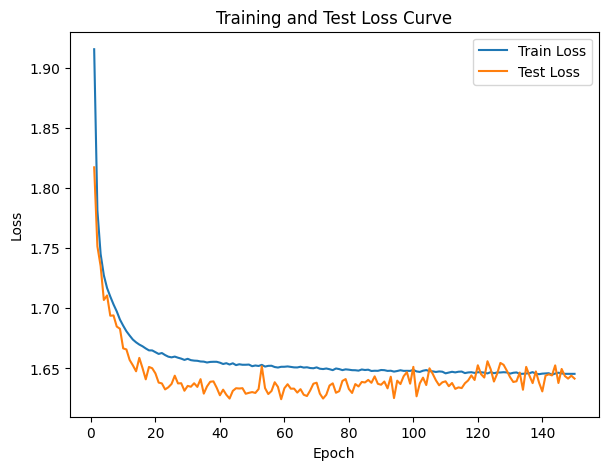

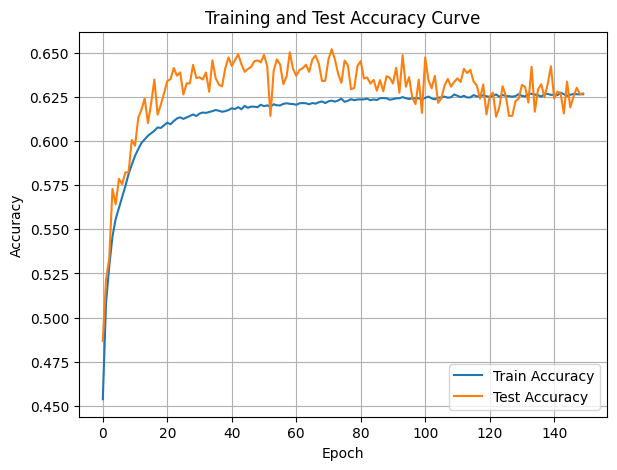

In [18]:
coverDTEmlp8b.train_single_model()

Randomly initializing 8 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.92s/it]

Epoch [1/10], Train F1:0.3674292710306652, Train Loss: 1.9743, Train Acc: 0.3723, Test F1:0.3961017510474586, Test Loss: 1.8327, Test Acc: 0.5137


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.42s/it]

Epoch [2/10], Train F1:0.41182414571213644, Train Loss: 1.8812, Train Acc: 0.4456, Test F1:0.435005754165307, Test Loss: 1.7855, Test Acc: 0.5356


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.74s/it]

Epoch [3/10], Train F1:0.4349596329322453, Train Loss: 1.8336, Train Acc: 0.4772, Test F1:0.46939505892707567, Test Loss: 1.7574, Test Acc: 0.5532


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.19s/it]

Epoch [4/10], Train F1:0.4512011082581456, Train Loss: 1.8055, Train Acc: 0.4960, Test F1:0.48640194960433186, Test Loss: 1.7406, Test Acc: 0.5631


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.58s/it]

Epoch [5/10], Train F1:0.46285653593845394, Train Loss: 1.7869, Train Acc: 0.5089, Test F1:0.4974911284335478, Test Loss: 1.7292, Test Acc: 0.5698


Training Process:  60%|██████    | 6/10 [04:07<02:49, 42.49s/it]

Epoch [6/10], Train F1:0.4712730348560911, Train Loss: 1.7736, Train Acc: 0.5182, Test F1:0.5036864443000622, Test Loss: 1.7215, Test Acc: 0.5738


Training Process:  70%|███████   | 7/10 [04:53<02:11, 43.75s/it]

Epoch [7/10], Train F1:0.4777435434250053, Train Loss: 1.7636, Train Acc: 0.5253, Test F1:0.5091457438962709, Test Loss: 1.7153, Test Acc: 0.5774


Training Process:  80%|████████  | 8/10 [05:42<01:31, 45.55s/it]

Epoch [8/10], Train F1:0.4829801416384169, Train Loss: 1.7557, Train Acc: 0.5311, Test F1:0.51371013409839, Test Loss: 1.7102, Test Acc: 0.5804


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.92s/it]

Epoch [9/10], Train F1:0.48736972642949555, Train Loss: 1.7491, Train Acc: 0.5360, Test F1:0.5181276447493266, Test Loss: 1.7058, Test Acc: 0.5834


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.48s/it]

Epoch [10/10], Train F1:0.49102925457704266, Train Loss: 1.7438, Train Acc: 0.5400, Test F1:0.5207974222434126, Test Loss: 1.7025, Test Acc: 0.5853
Total Epochs: 10
Train loss start: 2.0933890342712402, Train loss end: 1.7064849138259888
Highest Mean Train Accuracy (over epoch): 0.5399825229277696
Test loss start: 1.8213374614715576, Test loss end: 1.6189864873886108
Highest mean Test Accuracy (over epoch): 0.5852568176288291


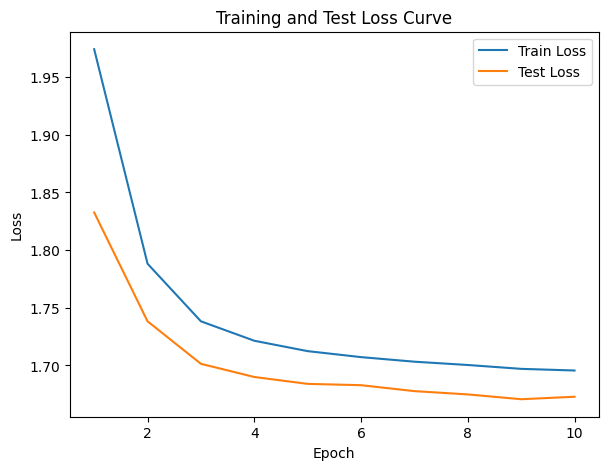

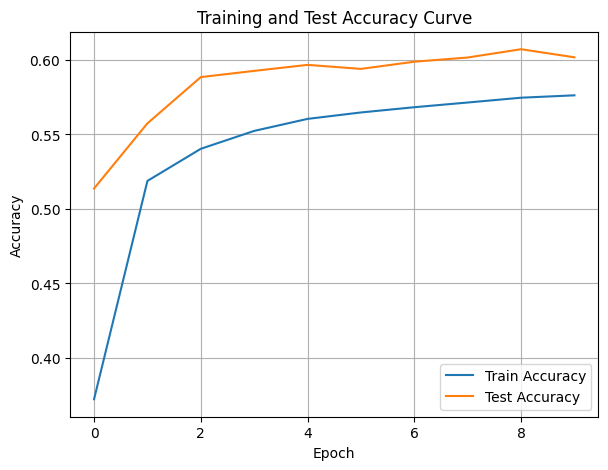

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.93s/it]

Epoch [1/10], Train F1:0.3383864886653512, Train Loss: 1.9744, Train Acc: 0.3378, Test F1:0.5040476205188842, Test Loss: 1.8372, Test Acc: 0.5619


Training Process:  20%|██        | 2/10 [01:17<05:09, 38.68s/it]

Epoch [2/10], Train F1:0.4222653753243865, Train Loss: 1.8847, Train Acc: 0.4247, Test F1:0.49285608816052195, Test Loss: 1.7857, Test Acc: 0.5601


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.45s/it]

Epoch [3/10], Train F1:0.4535956562309215, Train Loss: 1.8349, Train Acc: 0.4649, Test F1:0.49805797106667, Test Loss: 1.7584, Test Acc: 0.5658


Training Process:  40%|████      | 4/10 [02:40<04:04, 40.71s/it]

Epoch [4/10], Train F1:0.47294099344818924, Train Loss: 1.8044, Train Acc: 0.4894, Test F1:0.503498824284494, Test Loss: 1.7420, Test Acc: 0.5702


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.44s/it]

Epoch [5/10], Train F1:0.4872997922535967, Train Loss: 1.7835, Train Acc: 0.5064, Test F1:0.5082681659863654, Test Loss: 1.7307, Test Acc: 0.5735


Training Process:  60%|██████    | 6/10 [04:14<03:00, 45.05s/it]

Epoch [6/10], Train F1:0.49831411011538185, Train Loss: 1.7680, Train Acc: 0.5192, Test F1:0.4914449682670397, Test Loss: 1.7327, Test Acc: 0.5634


Training Process:  70%|███████   | 7/10 [04:59<02:14, 44.84s/it]

Epoch [7/10], Train F1:0.50700070036239, Train Loss: 1.7560, Train Acc: 0.5293, Test F1:0.5017595518191401, Test Loss: 1.7233, Test Acc: 0.5693


Training Process:  80%|████████  | 8/10 [05:47<01:31, 45.90s/it]

Epoch [8/10], Train F1:0.5139355180978983, Train Loss: 1.7463, Train Acc: 0.5374, Test F1:0.5108224246837807, Test Loss: 1.7154, Test Acc: 0.5747


Training Process:  90%|█████████ | 9/10 [06:36<00:46, 46.90s/it]

Epoch [9/10], Train F1:0.5197187283777719, Train Loss: 1.7384, Train Acc: 0.5441, Test F1:0.5163592096422362, Test Loss: 1.7098, Test Acc: 0.5781


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.87s/it]


Epoch [10/10], Train F1:0.5244808948543973, Train Loss: 1.7318, Train Acc: 0.5497, Test F1:0.5218764582099785, Test Loss: 1.7046, Test Acc: 0.5815
Total Epochs: 10
Train loss start: 2.119385242462158, Train loss end: 1.6918487548828125
Highest Mean Train Accuracy (over epoch): 0.5497326073012899
Test loss start: 1.804091453552246, Test loss end: 1.6265876293182373
Highest mean Test Accuracy (over epoch): 0.5815290521591026


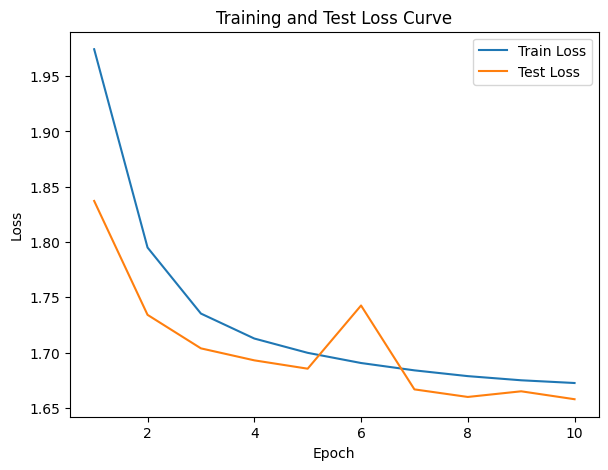

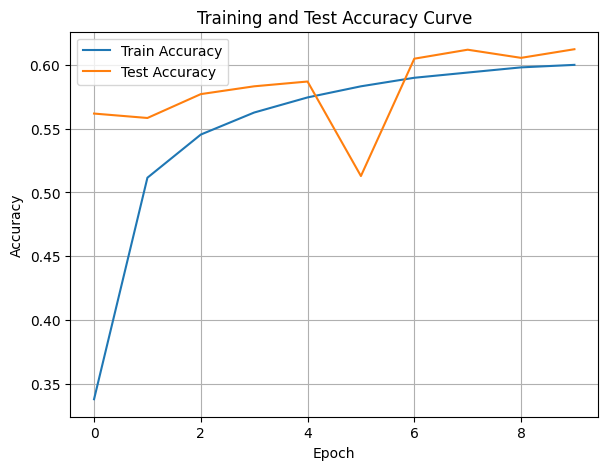

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.65s/it]

Epoch [1/10], Train F1:0.3955469391357842, Train Loss: 1.9566, Train Acc: 0.3889, Test F1:0.3944502587439234, Test Loss: 1.8278, Test Acc: 0.5097


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.38s/it]

Epoch [2/10], Train F1:0.4338438632523338, Train Loss: 1.8727, Train Acc: 0.4514, Test F1:0.4036327473778146, Test Loss: 1.7871, Test Acc: 0.5177


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.77s/it]

Epoch [3/10], Train F1:0.45133703379636625, Train Loss: 1.8280, Train Acc: 0.4812, Test F1:0.4229370697825451, Test Loss: 1.7652, Test Acc: 0.5284


Training Process:  40%|████      | 4/10 [02:38<04:01, 40.18s/it]

Epoch [4/10], Train F1:0.46529277326704266, Train Loss: 1.8005, Train Acc: 0.5001, Test F1:0.44133675084005003, Test Loss: 1.7485, Test Acc: 0.5384


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.34s/it]

Epoch [5/10], Train F1:0.4779506748235214, Train Loss: 1.7812, Train Acc: 0.5141, Test F1:0.4543260667703376, Test Loss: 1.7364, Test Acc: 0.5455


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.61s/it]

Epoch [6/10], Train F1:0.48830167999989477, Train Loss: 1.7671, Train Acc: 0.5246, Test F1:0.4642861397932609, Test Loss: 1.7285, Test Acc: 0.5509


Training Process:  70%|███████   | 7/10 [04:53<02:11, 43.99s/it]

Epoch [7/10], Train F1:0.4970516928589794, Train Loss: 1.7559, Train Acc: 0.5332, Test F1:0.47441812947363105, Test Loss: 1.7204, Test Acc: 0.5565


Training Process:  80%|████████  | 8/10 [05:42<01:30, 45.50s/it]

Epoch [8/10], Train F1:0.5041835006618147, Train Loss: 1.7469, Train Acc: 0.5401, Test F1:0.4840370196076882, Test Loss: 1.7134, Test Acc: 0.5619


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.94s/it]

Epoch [9/10], Train F1:0.510214772886258, Train Loss: 1.7395, Train Acc: 0.5459, Test F1:0.49208232916569367, Test Loss: 1.7076, Test Acc: 0.5666


Training Process: 100%|██████████| 10/10 [07:24<00:00, 44.41s/it]

Epoch [10/10], Train F1:0.5154458200330054, Train Loss: 1.7332, Train Acc: 0.5510, Test F1:0.4990569094908698, Test Loss: 1.7029, Test Acc: 0.5707
Total Epochs: 10
Train loss start: 2.089209794998169, Train loss end: 1.72480309009552
Highest Mean Train Accuracy (over epoch): 0.5509730029921116
Test loss start: 1.815771460533142, Test loss end: 1.614391803741455
Highest mean Test Accuracy (over epoch): 0.57066466678619


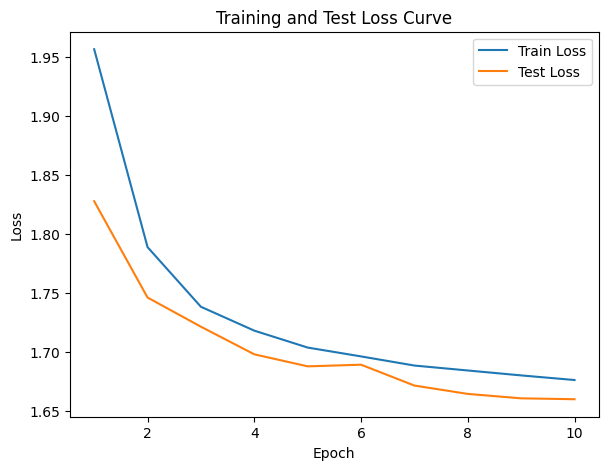

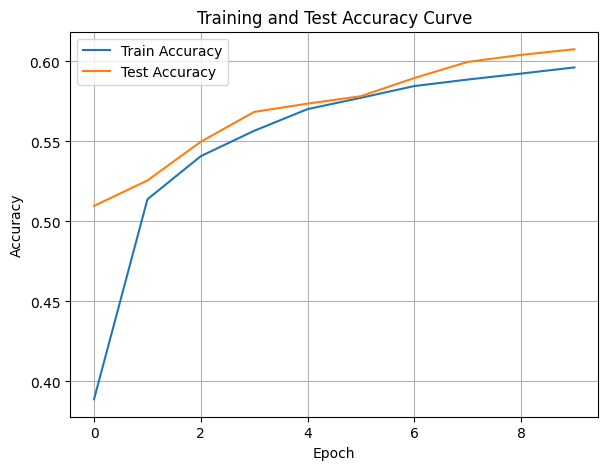

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:37<05:40, 37.86s/it]

Epoch [1/10], Train F1:0.3931763961443102, Train Loss: 1.9118, Train Acc: 0.4293, Test F1:0.34889289438294563, Test Loss: 1.8085, Test Acc: 0.4955


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.47s/it]

Epoch [2/10], Train F1:0.4132858030478858, Train Loss: 1.8450, Train Acc: 0.4713, Test F1:0.3840674931936996, Test Loss: 1.7759, Test Acc: 0.5111


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.45s/it]

Epoch [3/10], Train F1:0.43326079219496944, Train Loss: 1.8098, Train Acc: 0.4936, Test F1:0.4114863960991675, Test Loss: 1.7573, Test Acc: 0.5246


Training Process:  40%|████      | 4/10 [02:39<04:03, 40.63s/it]

Epoch [4/10], Train F1:0.4491767724552525, Train Loss: 1.7879, Train Acc: 0.5081, Test F1:0.4342503885958084, Test Loss: 1.7438, Test Acc: 0.5364


Training Process:  50%|█████     | 5/10 [03:22<03:26, 41.37s/it]

Epoch [5/10], Train F1:0.46084390625909766, Train Loss: 1.7730, Train Acc: 0.5184, Test F1:0.4494597162874438, Test Loss: 1.7336, Test Acc: 0.5444


Training Process:  60%|██████    | 6/10 [04:07<02:50, 42.66s/it]

Epoch [6/10], Train F1:0.4696357141749175, Train Loss: 1.7619, Train Acc: 0.5263, Test F1:0.4597520533056473, Test Loss: 1.7262, Test Acc: 0.5501


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.08s/it]

Epoch [7/10], Train F1:0.4764954778329811, Train Loss: 1.7534, Train Acc: 0.5325, Test F1:0.466876046349155, Test Loss: 1.7208, Test Acc: 0.5541


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.67s/it]

Epoch [8/10], Train F1:0.48204649122611026, Train Loss: 1.7465, Train Acc: 0.5376, Test F1:0.47294669760755836, Test Loss: 1.7164, Test Acc: 0.5575


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.04s/it]

Epoch [9/10], Train F1:0.48665044539357927, Train Loss: 1.7409, Train Acc: 0.5419, Test F1:0.47792606869457754, Test Loss: 1.7126, Test Acc: 0.5604


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.63s/it]

Epoch [10/10], Train F1:0.4903877529644082, Train Loss: 1.7362, Train Acc: 0.5455, Test F1:0.48499641249182285, Test Loss: 1.7087, Test Acc: 0.5643
Total Epochs: 10
Train loss start: 2.0679469108581543, Train loss end: 1.7377723455429077
Highest Mean Train Accuracy (over epoch): 0.5454727729588323
Test loss start: 1.8011221885681152, Test loss end: 1.6098659038543701
Highest mean Test Accuracy (over epoch): 0.5643295464732098


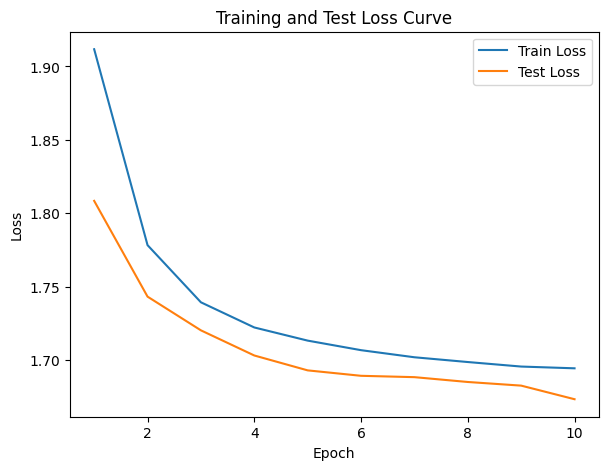

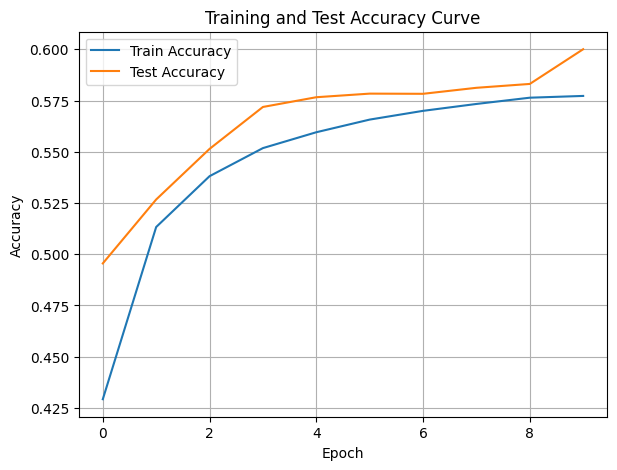

./saved_models/model_4.pth
Training Model with id 5


Training Process:  10%|█         | 1/10 [00:36<05:24, 36.09s/it]

Epoch [1/10], Train F1:0.3398220698862374, Train Loss: 1.9925, Train Acc: 0.3269, Test F1:0.46562981744954, Test Loss: 1.8445, Test Acc: 0.5208


Training Process:  20%|██        | 2/10 [01:14<05:00, 37.54s/it]

Epoch [2/10], Train F1:0.4219093345161061, Train Loss: 1.8992, Train Acc: 0.4169, Test F1:0.4447885724504203, Test Loss: 1.7977, Test Acc: 0.5217


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.92s/it]

Epoch [3/10], Train F1:0.45309416199124103, Train Loss: 1.8462, Train Acc: 0.4592, Test F1:0.45757023464443, Test Loss: 1.7699, Test Acc: 0.5350


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.47s/it]

Epoch [4/10], Train F1:0.4717380680516765, Train Loss: 1.8132, Train Acc: 0.4853, Test F1:0.4694872002860484, Test Loss: 1.7517, Test Acc: 0.5450


Training Process:  50%|█████     | 5/10 [03:20<03:26, 41.31s/it]

Epoch [5/10], Train F1:0.4850068515887775, Train Loss: 1.7908, Train Acc: 0.5031, Test F1:0.47889663461213283, Test Loss: 1.7384, Test Acc: 0.5522


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.65s/it]

Epoch [6/10], Train F1:0.49540574596611836, Train Loss: 1.7742, Train Acc: 0.5165, Test F1:0.4892990866821385, Test Loss: 1.7272, Test Acc: 0.5592


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.81s/it]

Epoch [7/10], Train F1:0.5035392168043379, Train Loss: 1.7616, Train Acc: 0.5267, Test F1:0.49330962012022034, Test Loss: 1.7208, Test Acc: 0.5626


Training Process:  80%|████████  | 8/10 [05:41<01:30, 45.40s/it]

Epoch [8/10], Train F1:0.5102256271154256, Train Loss: 1.7515, Train Acc: 0.5349, Test F1:0.5008199491193801, Test Loss: 1.7138, Test Acc: 0.5675


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.94s/it]

Epoch [9/10], Train F1:0.5159217751356581, Train Loss: 1.7432, Train Acc: 0.5417, Test F1:0.5044230123770559, Test Loss: 1.7092, Test Acc: 0.5702


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.21s/it]


Epoch [10/10], Train F1:0.5207018470257936, Train Loss: 1.7363, Train Acc: 0.5474, Test F1:0.5116507250054226, Test Loss: 1.7036, Test Acc: 0.5748
Total Epochs: 10
Train loss start: 2.1079137325286865, Train loss end: 1.7880135774612427
Highest Mean Train Accuracy (over epoch): 0.5473943536484621
Test loss start: 1.814274549484253, Test loss end: 1.6323139667510986
Highest mean Test Accuracy (over epoch): 0.5748287589002152


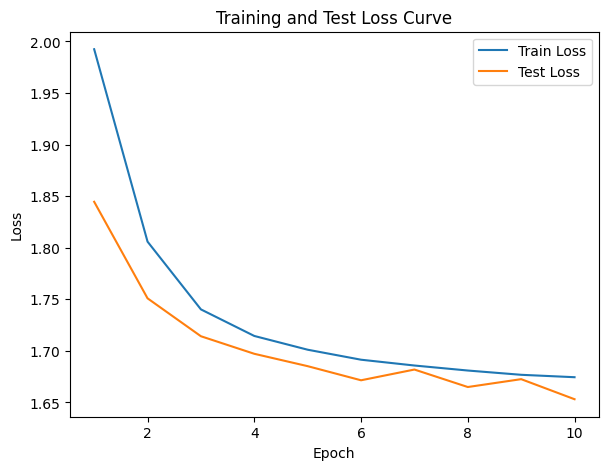

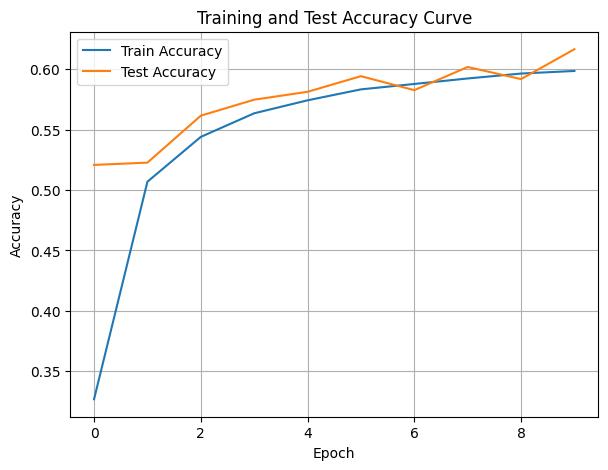

./saved_models/model_5.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.93s/it]

Epoch [1/10], Train F1:0.38601270592709563, Train Loss: 1.9646, Train Acc: 0.3744, Test F1:0.45601344815532857, Test Loss: 1.8671, Test Acc: 0.5320


Training Process:  20%|██        | 2/10 [01:17<05:10, 38.86s/it]

Epoch [2/10], Train F1:0.42293110207404355, Train Loss: 1.8804, Train Acc: 0.4407, Test F1:0.465676291016014, Test Loss: 1.8081, Test Acc: 0.5450


Training Process:  30%|███       | 3/10 [01:58<04:39, 39.90s/it]

Epoch [3/10], Train F1:0.4393544444656111, Train Loss: 1.8356, Train Acc: 0.4715, Test F1:0.48680892821848676, Test Loss: 1.7757, Test Acc: 0.5598


Training Process:  40%|████      | 4/10 [02:39<04:01, 40.30s/it]

Epoch [4/10], Train F1:0.4515675042498341, Train Loss: 1.8086, Train Acc: 0.4905, Test F1:0.49890529462213123, Test Loss: 1.7557, Test Acc: 0.5687


Training Process:  50%|█████     | 5/10 [03:23<03:27, 41.49s/it]

Epoch [5/10], Train F1:0.4615318212011391, Train Loss: 1.7900, Train Acc: 0.5041, Test F1:0.5079651950261329, Test Loss: 1.7411, Test Acc: 0.5752


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.78s/it]

Epoch [6/10], Train F1:0.4695114023006219, Train Loss: 1.7764, Train Acc: 0.5142, Test F1:0.5143614509068896, Test Loss: 1.7304, Test Acc: 0.5799


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.05s/it]

Epoch [7/10], Train F1:0.4758419727574388, Train Loss: 1.7661, Train Acc: 0.5220, Test F1:0.518125220174668, Test Loss: 1.7230, Test Acc: 0.5829


Training Process:  80%|████████  | 8/10 [05:42<01:30, 45.22s/it]

Epoch [8/10], Train F1:0.48102224984705305, Train Loss: 1.7579, Train Acc: 0.5283, Test F1:0.522051292552476, Test Loss: 1.7165, Test Acc: 0.5858


Training Process:  90%|█████████ | 9/10 [06:33<00:46, 46.98s/it]

Epoch [9/10], Train F1:0.4853464164867261, Train Loss: 1.7512, Train Acc: 0.5334, Test F1:0.5241646931992264, Test Loss: 1.7119, Test Acc: 0.5874


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.61s/it]

Epoch [10/10], Train F1:0.4890728275469958, Train Loss: 1.7456, Train Acc: 0.5378, Test F1:0.5267735723293346, Test Loss: 1.7076, Test Acc: 0.5893
Total Epochs: 10
Train loss start: 2.100888729095459, Train loss end: 1.8514058589935303
Highest Mean Train Accuracy (over epoch): 0.537762192813223
Test loss start: 1.8408986330032349, Test loss end: 1.6292164325714111
Highest mean Test Accuracy (over epoch): 0.5893386507850117


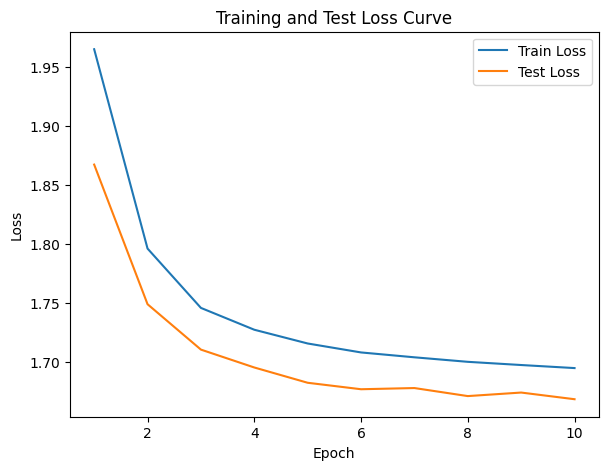

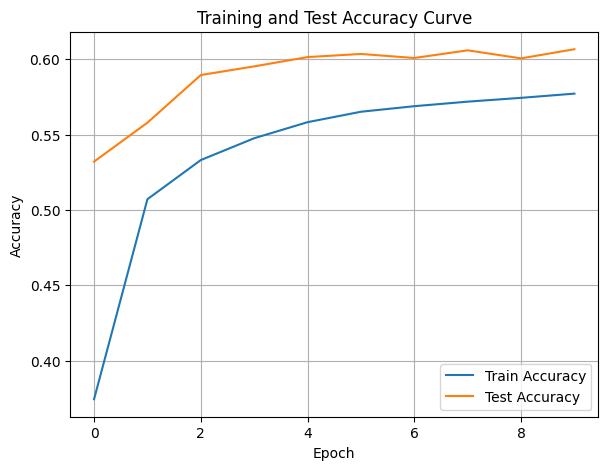

./saved_models/model_6.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.43s/it]

Epoch [1/10], Train F1:0.3951623859336506, Train Loss: 1.9577, Train Acc: 0.3819, Test F1:0.4550531136515563, Test Loss: 1.8539, Test Acc: 0.5309


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.39s/it]

Epoch [2/10], Train F1:0.4331545233346971, Train Loss: 1.8747, Train Acc: 0.4465, Test F1:0.4404138097167283, Test Loss: 1.8008, Test Acc: 0.5314


Training Process:  30%|███       | 3/10 [01:57<04:38, 39.73s/it]

Epoch [3/10], Train F1:0.4484151717690174, Train Loss: 1.8313, Train Acc: 0.4757, Test F1:0.45237791081483725, Test Loss: 1.7733, Test Acc: 0.5409


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.43s/it]

Epoch [4/10], Train F1:0.4591005859156038, Train Loss: 1.8051, Train Acc: 0.4937, Test F1:0.4613017930351059, Test Loss: 1.7570, Test Acc: 0.5475


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.61s/it]

Epoch [5/10], Train F1:0.4678205531862509, Train Loss: 1.7871, Train Acc: 0.5064, Test F1:0.47229623251956826, Test Loss: 1.7443, Test Acc: 0.5541


Training Process:  60%|██████    | 6/10 [04:09<02:52, 43.13s/it]

Epoch [6/10], Train F1:0.4756358897210592, Train Loss: 1.7736, Train Acc: 0.5165, Test F1:0.48152718208281864, Test Loss: 1.7345, Test Acc: 0.5597


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.10s/it]

Epoch [7/10], Train F1:0.482893251679509, Train Loss: 1.7631, Train Acc: 0.5245, Test F1:0.4840227102848962, Test Loss: 1.7282, Test Acc: 0.5615


Training Process:  80%|████████  | 8/10 [05:42<01:30, 45.07s/it]

Epoch [8/10], Train F1:0.4897500950308778, Train Loss: 1.7544, Train Acc: 0.5313, Test F1:0.48854674767338996, Test Loss: 1.7225, Test Acc: 0.5644


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.79s/it]

Epoch [9/10], Train F1:0.4962490318111427, Train Loss: 1.7471, Train Acc: 0.5372, Test F1:0.4936415108418465, Test Loss: 1.7169, Test Acc: 0.5673


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.58s/it]


Epoch [10/10], Train F1:0.5021736957773141, Train Loss: 1.7407, Train Acc: 0.5424, Test F1:0.5003064302554348, Test Loss: 1.7115, Test Acc: 0.5710
Total Epochs: 10
Train loss start: 2.091614007949829, Train loss end: 1.7530465126037598
Highest Mean Train Accuracy (over epoch): 0.5424290979085441
Test loss start: 1.8153411149978638, Test loss end: 1.6410115957260132
Highest mean Test Accuracy (over epoch): 0.571001706408155


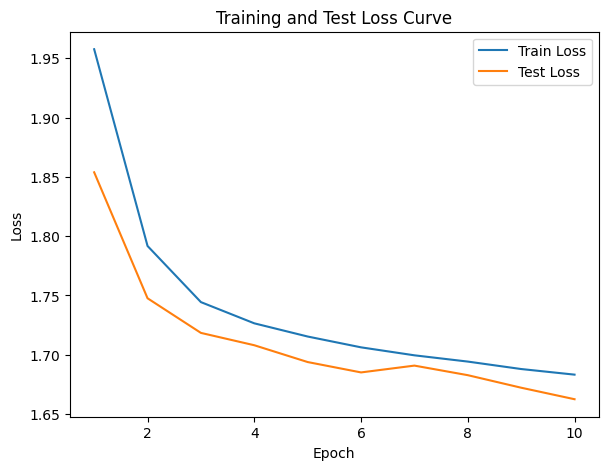

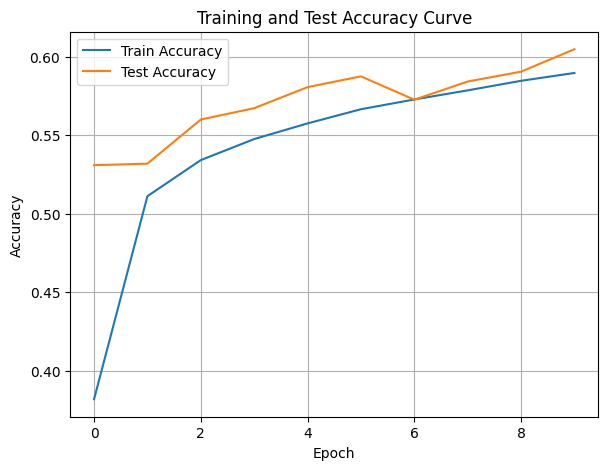

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.34s/it]

Epoch [1/10], Train F1:0.38777680935789094, Train Loss: 1.9356, Train Acc: 0.4082, Test F1:0.39289970467422664, Test Loss: 1.8292, Test Acc: 0.5033


Training Process:  20%|██        | 2/10 [01:17<05:11, 38.94s/it]

Epoch [2/10], Train F1:0.42013070441496536, Train Loss: 1.8590, Train Acc: 0.4636, Test F1:0.44134706120552447, Test Loss: 1.7818, Test Acc: 0.5294


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.79s/it]

Epoch [3/10], Train F1:0.4420655577576044, Train Loss: 1.8185, Train Acc: 0.4899, Test F1:0.4714893856881843, Test Loss: 1.7551, Test Acc: 0.5469


Training Process:  40%|████      | 4/10 [02:39<04:01, 40.22s/it]

Epoch [4/10], Train F1:0.460135094241111, Train Loss: 1.7933, Train Acc: 0.5071, Test F1:0.4935850707396289, Test Loss: 1.7377, Test Acc: 0.5600


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.40s/it]

Epoch [5/10], Train F1:0.4741895638924961, Train Loss: 1.7757, Train Acc: 0.5196, Test F1:0.5104841457897359, Test Loss: 1.7243, Test Acc: 0.5706


Training Process:  60%|██████    | 6/10 [04:07<02:49, 42.49s/it]

Epoch [6/10], Train F1:0.4853755537485796, Train Loss: 1.7624, Train Acc: 0.5294, Test F1:0.5216943575986361, Test Loss: 1.7147, Test Acc: 0.5780


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.99s/it]

Epoch [7/10], Train F1:0.49430623595685, Train Loss: 1.7521, Train Acc: 0.5371, Test F1:0.5312968043359435, Test Loss: 1.7058, Test Acc: 0.5846


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.53s/it]

Epoch [8/10], Train F1:0.5017837791087275, Train Loss: 1.7436, Train Acc: 0.5436, Test F1:0.5392151913488255, Test Loss: 1.6981, Test Acc: 0.5901


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.29s/it]

Epoch [9/10], Train F1:0.5079878673391617, Train Loss: 1.7366, Train Acc: 0.5490, Test F1:0.5450205740623028, Test Loss: 1.6926, Test Acc: 0.5943


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.62s/it]


Epoch [10/10], Train F1:0.5134015229630121, Train Loss: 1.7306, Train Acc: 0.5538, Test F1:0.5505432266085932, Test Loss: 1.6875, Test Acc: 0.5983
Total Epochs: 10
Train loss start: 2.0669541358947754, Train loss end: 1.5711716413497925
Highest Mean Train Accuracy (over epoch): 0.5537644599842839
Test loss start: 1.8074517250061035, Test loss end: 1.6207078695297241
Highest mean Test Accuracy (over epoch): 0.5983120005634668


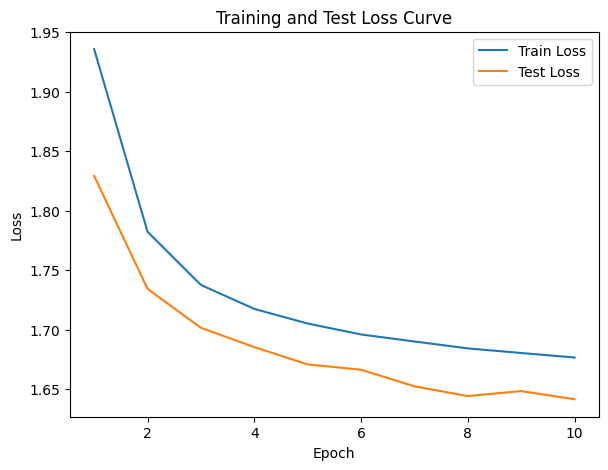

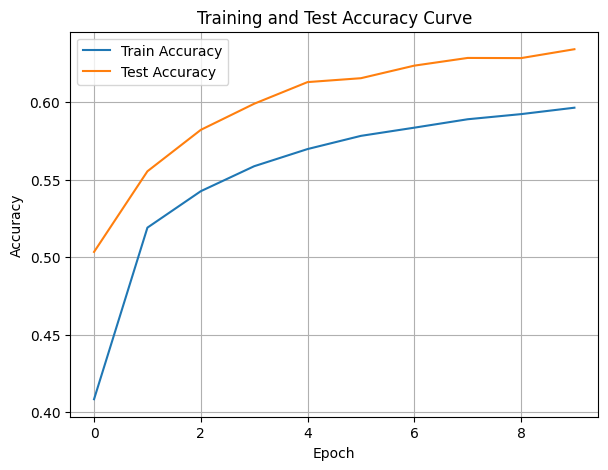

./saved_models/model_8.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.39s/it]

Epoch [1/10], Train F1:0.5624313083306084, Train Loss: 1.6741, Train Acc: 0.5987, Test F1:0.6065545809694532, Test Loss: 1.6311, Test Acc: 0.6443


Training Process:  20%|██        | 2/10 [01:16<05:08, 38.51s/it]

Epoch [2/10], Train F1:0.5636180859278963, Train Loss: 1.6729, Train Acc: 0.5998, Test F1:0.5997446529640006, Test Loss: 1.6359, Test Acc: 0.6383


Training Process:  30%|███       | 3/10 [01:58<04:39, 39.92s/it]

Epoch [3/10], Train F1:0.5647173512505894, Train Loss: 1.6718, Train Acc: 0.6009, Test F1:0.5987437741970256, Test Loss: 1.6366, Test Acc: 0.6374


Training Process:  40%|████      | 4/10 [02:40<04:05, 40.87s/it]

Epoch [4/10], Train F1:0.565807929096186, Train Loss: 1.6708, Train Acc: 0.6019, Test F1:0.6009131005905863, Test Loss: 1.6351, Test Acc: 0.6388


Training Process:  50%|█████     | 5/10 [03:24<03:30, 42.09s/it]

Epoch [5/10], Train F1:0.5665900841047659, Train Loss: 1.6700, Train Acc: 0.6026, Test F1:0.6025950910522931, Test Loss: 1.6338, Test Acc: 0.6403


Training Process:  60%|██████    | 6/10 [04:09<02:51, 42.89s/it]

Epoch [6/10], Train F1:0.5671501174832986, Train Loss: 1.6695, Train Acc: 0.6031, Test F1:0.6031774618462797, Test Loss: 1.6333, Test Acc: 0.6407


Training Process:  70%|███████   | 7/10 [04:56<02:12, 44.23s/it]

Epoch [7/10], Train F1:0.5678425054963026, Train Loss: 1.6688, Train Acc: 0.6037, Test F1:0.6021194605168796, Test Loss: 1.6341, Test Acc: 0.6401


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.62s/it]

Epoch [8/10], Train F1:0.568561241738233, Train Loss: 1.6681, Train Acc: 0.6044, Test F1:0.6019788955376068, Test Loss: 1.6343, Test Acc: 0.6399


Training Process:  90%|█████████ | 9/10 [06:36<00:47, 47.48s/it]

Epoch [9/10], Train F1:0.5691883647782225, Train Loss: 1.6675, Train Acc: 0.6050, Test F1:0.6026785165252871, Test Loss: 1.6339, Test Acc: 0.6405


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.85s/it]

Epoch [10/10], Train F1:0.5697807572028464, Train Loss: 1.6669, Train Acc: 0.6055, Test F1:0.6037439325323722, Test Loss: 1.6329, Test Acc: 0.6413
Total Epochs: 10
Train loss start: 1.6787779331207275, Train loss end: 1.703718662261963
Highest Mean Train Accuracy (over epoch): 0.6055495738507571
Test loss start: 1.5963174104690552, Test loss end: 1.599804401397705
Highest mean Test Accuracy (over epoch): 0.6443005407360927


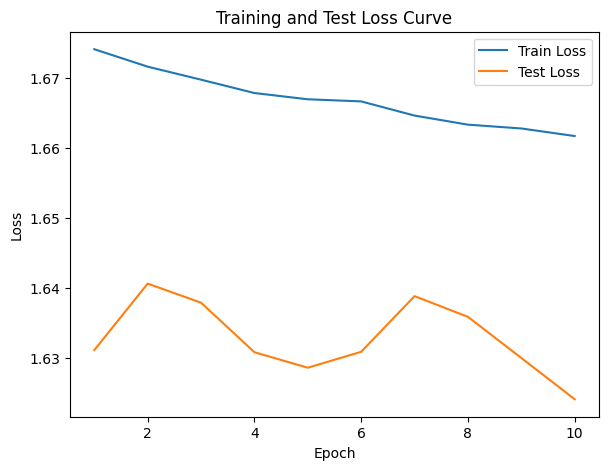

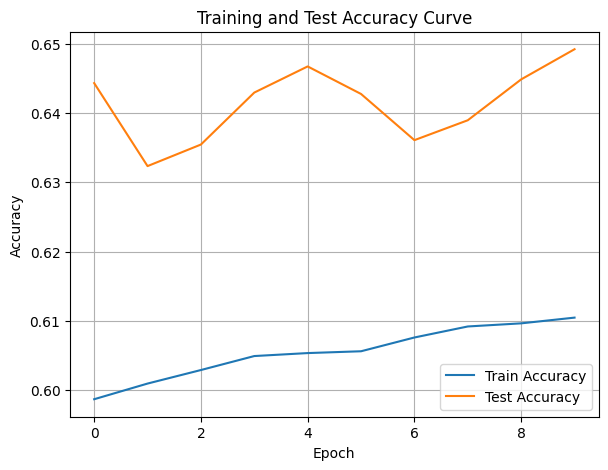

./saved_models/model_12.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.88s/it]

Epoch [1/10], Train F1:0.5756657179161069, Train Loss: 1.6612, Train Acc: 0.6111, Test F1:0.6105238515595497, Test Loss: 1.6260, Test Acc: 0.6480


Training Process:  20%|██        | 2/10 [01:16<05:08, 38.51s/it]

Epoch [2/10], Train F1:0.5761742894355508, Train Loss: 1.6608, Train Acc: 0.6116, Test F1:0.6055139028689859, Test Loss: 1.6305, Test Acc: 0.6442


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.55s/it]

Epoch [3/10], Train F1:0.5763940395011143, Train Loss: 1.6606, Train Acc: 0.6117, Test F1:0.6070335457448033, Test Loss: 1.6294, Test Acc: 0.6454


Training Process:  40%|████      | 4/10 [02:39<04:03, 40.60s/it]

Epoch [4/10], Train F1:0.5765388821602745, Train Loss: 1.6604, Train Acc: 0.6119, Test F1:0.6074489206492268, Test Loss: 1.6294, Test Acc: 0.6453


Training Process:  50%|█████     | 5/10 [03:22<03:26, 41.38s/it]

Epoch [5/10], Train F1:0.5769577681593927, Train Loss: 1.6600, Train Acc: 0.6122, Test F1:0.6081550395811903, Test Loss: 1.6285, Test Acc: 0.6457


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.96s/it]

Epoch [6/10], Train F1:0.5771836994873363, Train Loss: 1.6598, Train Acc: 0.6125, Test F1:0.6095900237498408, Test Loss: 1.6276, Test Acc: 0.6472


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.98s/it]

Epoch [7/10], Train F1:0.5774811542160241, Train Loss: 1.6595, Train Acc: 0.6128, Test F1:0.6096248358642452, Test Loss: 1.6275, Test Acc: 0.6470


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.98s/it]

Epoch [8/10], Train F1:0.5778498570587698, Train Loss: 1.6592, Train Acc: 0.6131, Test F1:0.6097083508287131, Test Loss: 1.6273, Test Acc: 0.6470


Training Process:  90%|█████████ | 9/10 [06:33<00:46, 46.96s/it]

Epoch [9/10], Train F1:0.578112940562055, Train Loss: 1.6589, Train Acc: 0.6134, Test F1:0.6094265358465354, Test Loss: 1.6277, Test Acc: 0.6468


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.58s/it]


Epoch [10/10], Train F1:0.5783540912233236, Train Loss: 1.6587, Train Acc: 0.6136, Test F1:0.6101170298136959, Test Loss: 1.6270, Test Acc: 0.6473
Total Epochs: 10
Train loss start: 1.5920835733413696, Train loss end: 1.6051430702209473
Highest Mean Train Accuracy (over epoch): 0.613633039831018
Test loss start: 1.5873792171478271, Test loss end: 1.5966218709945679
Highest mean Test Accuracy (over epoch): 0.6479786827041286


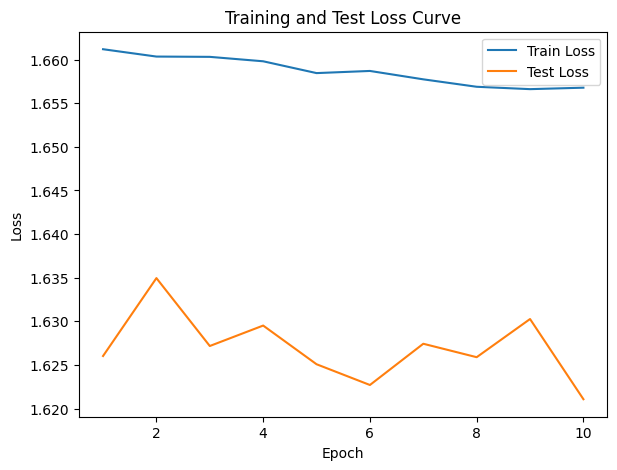

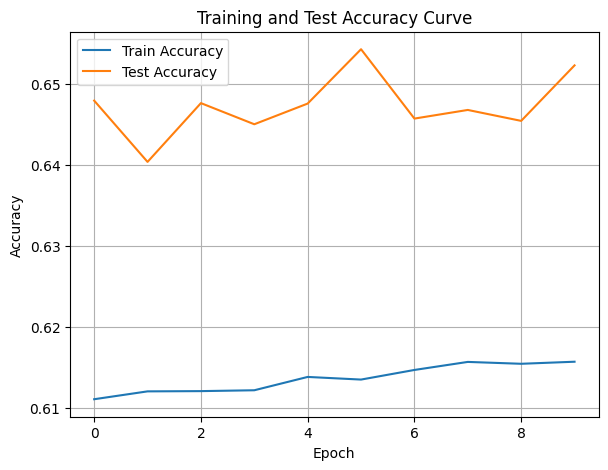

./saved_models/model_13.pth
Training Model with id 11


Training Process:  10%|█         | 1/10 [00:37<05:37, 37.49s/it]

Epoch [1/10], Train F1:0.5807843052703742, Train Loss: 1.6562, Train Acc: 0.6160, Test F1:0.6043694662786628, Test Loss: 1.6339, Test Acc: 0.6422


Training Process:  20%|██        | 2/10 [01:17<05:11, 38.99s/it]

Epoch [2/10], Train F1:0.5802449985776806, Train Loss: 1.6565, Train Acc: 0.6155, Test F1:0.6094087637982115, Test Loss: 1.6287, Test Acc: 0.6471


Training Process:  30%|███       | 3/10 [01:57<04:35, 39.41s/it]

Epoch [3/10], Train F1:0.5803773564999114, Train Loss: 1.6564, Train Acc: 0.6157, Test F1:0.6110275704585648, Test Loss: 1.6268, Test Acc: 0.6480


Training Process:  40%|████      | 4/10 [02:39<04:03, 40.56s/it]

Epoch [4/10], Train F1:0.5804847243798309, Train Loss: 1.6563, Train Acc: 0.6158, Test F1:0.6110614131612737, Test Loss: 1.6264, Test Acc: 0.6480


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.66s/it]

Epoch [5/10], Train F1:0.5807792936612605, Train Loss: 1.6561, Train Acc: 0.6161, Test F1:0.6108524611172536, Test Loss: 1.6263, Test Acc: 0.6479


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.90s/it]

Epoch [6/10], Train F1:0.5809763945220947, Train Loss: 1.6559, Train Acc: 0.6162, Test F1:0.6105001246192551, Test Loss: 1.6265, Test Acc: 0.6474


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.92s/it]

Epoch [7/10], Train F1:0.5812432635974619, Train Loss: 1.6557, Train Acc: 0.6165, Test F1:0.6106288658646786, Test Loss: 1.6262, Test Acc: 0.6475


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.53s/it]

Epoch [8/10], Train F1:0.5813623371829796, Train Loss: 1.6556, Train Acc: 0.6166, Test F1:0.6097509263379742, Test Loss: 1.6273, Test Acc: 0.6466


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.24s/it]

Epoch [9/10], Train F1:0.5814850933818796, Train Loss: 1.6555, Train Acc: 0.6167, Test F1:0.6098252138211264, Test Loss: 1.6271, Test Acc: 0.6468


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.51s/it]


Epoch [10/10], Train F1:0.5817053251528645, Train Loss: 1.6553, Train Acc: 0.6169, Test F1:0.6095791318863155, Test Loss: 1.6273, Test Acc: 0.6466
Total Epochs: 10
Train loss start: 1.6562302112579346, Train loss end: 1.715470314025879
Highest Mean Train Accuracy (over epoch): 0.6169397105022785
Test loss start: 1.5893484354019165, Test loss end: 1.5995076894760132
Highest mean Test Accuracy (over epoch): 0.648029206632261


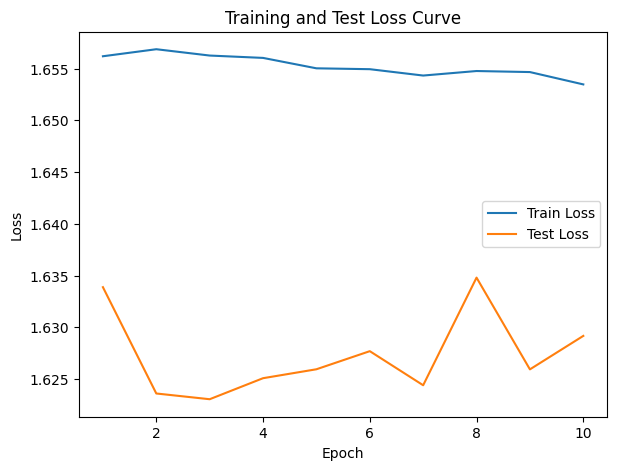

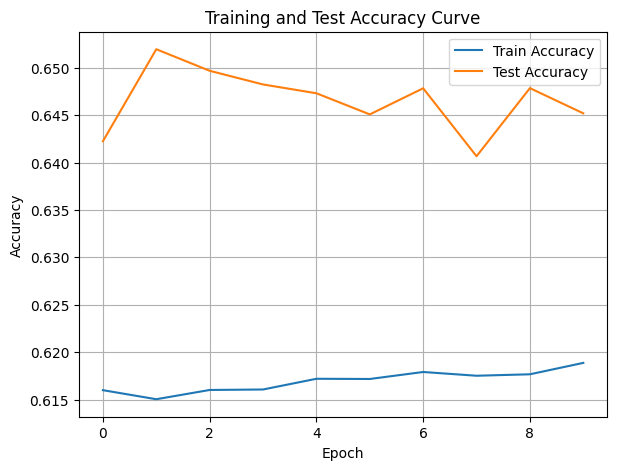

./saved_models/model_11.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:38<05:45, 38.34s/it]

Epoch [1/10], Train F1:0.5838341540659457, Train Loss: 1.6533, Train Acc: 0.6188, Test F1:0.6179464937133758, Test Loss: 1.6206, Test Acc: 0.6559


Training Process:  20%|██        | 2/10 [01:17<05:11, 38.96s/it]

Epoch [2/10], Train F1:0.5837308471649302, Train Loss: 1.6534, Train Acc: 0.6187, Test F1:0.616613794379231, Test Loss: 1.6213, Test Acc: 0.6539


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.79s/it]

Epoch [3/10], Train F1:0.5835403155515783, Train Loss: 1.6536, Train Acc: 0.6186, Test F1:0.6139816761949969, Test Loss: 1.6239, Test Acc: 0.6514


Training Process:  40%|████      | 4/10 [02:40<04:05, 40.84s/it]

Epoch [4/10], Train F1:0.5836966288775277, Train Loss: 1.6535, Train Acc: 0.6187, Test F1:0.6116419273574719, Test Loss: 1.6262, Test Acc: 0.6490


Training Process:  50%|█████     | 5/10 [03:24<03:28, 41.70s/it]

Epoch [5/10], Train F1:0.5837170006291205, Train Loss: 1.6534, Train Acc: 0.6187, Test F1:0.6133086601988053, Test Loss: 1.6250, Test Acc: 0.6506


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.75s/it]

Epoch [6/10], Train F1:0.5839541222388652, Train Loss: 1.6532, Train Acc: 0.6190, Test F1:0.6143539571477256, Test Loss: 1.6242, Test Acc: 0.6516


Training Process:  70%|███████   | 7/10 [04:56<02:12, 44.26s/it]

Epoch [7/10], Train F1:0.5841462850439821, Train Loss: 1.6530, Train Acc: 0.6192, Test F1:0.6125592969564883, Test Loss: 1.6259, Test Acc: 0.6498


Training Process:  80%|████████  | 8/10 [05:45<01:31, 45.95s/it]

Epoch [8/10], Train F1:0.5841095320661869, Train Loss: 1.6530, Train Acc: 0.6191, Test F1:0.6127002769560969, Test Loss: 1.6258, Test Acc: 0.6502


Training Process:  90%|█████████ | 9/10 [06:36<00:47, 47.35s/it]

Epoch [9/10], Train F1:0.5842429762539479, Train Loss: 1.6529, Train Acc: 0.6193, Test F1:0.6123200093802665, Test Loss: 1.6260, Test Acc: 0.6497


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.85s/it]

Epoch [10/10], Train F1:0.5842988174682054, Train Loss: 1.6529, Train Acc: 0.6193, Test F1:0.6122774816228745, Test Loss: 1.6258, Test Acc: 0.6496
Total Epochs: 10
Train loss start: 1.6580898761749268, Train loss end: 1.64256751537323
Highest Mean Train Accuracy (over epoch): 0.6193122067915229
Test loss start: 1.583190679550171, Test loss end: 1.593240737915039
Highest mean Test Accuracy (over epoch): 0.6558600153032476


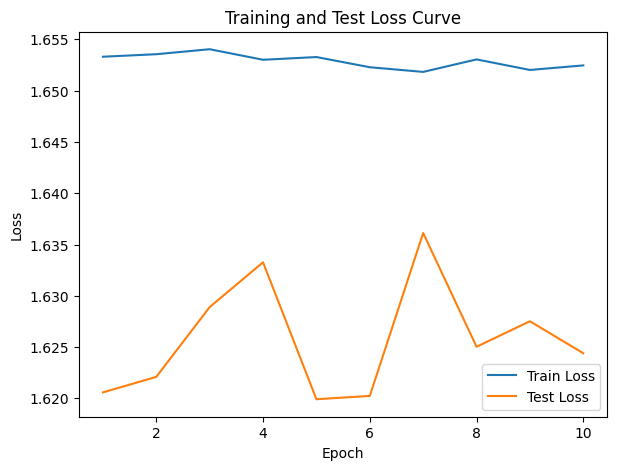

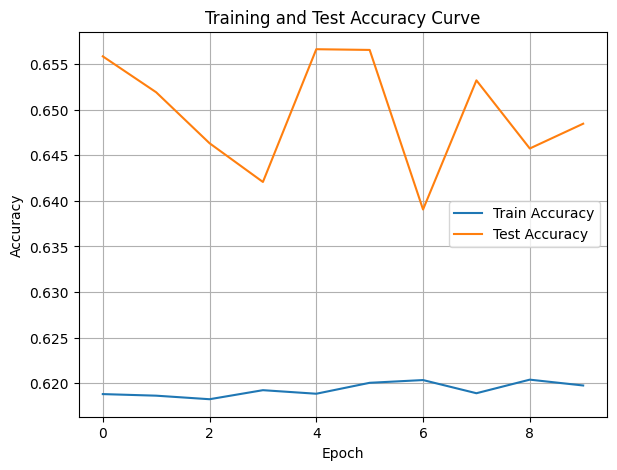

./saved_models/model_13.pth
Training Model with id 14


Training Process:  10%|█         | 1/10 [00:36<05:27, 36.43s/it]

Epoch [1/10], Train F1:0.5859630569331458, Train Loss: 1.6513, Train Acc: 0.6209, Test F1:0.6098667188459677, Test Loss: 1.6269, Test Acc: 0.6460


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.93s/it]

Epoch [2/10], Train F1:0.5859190150668405, Train Loss: 1.6514, Train Acc: 0.6208, Test F1:0.6107576846233315, Test Loss: 1.6258, Test Acc: 0.6470


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.38s/it]

Epoch [3/10], Train F1:0.5857521439102492, Train Loss: 1.6516, Train Acc: 0.6207, Test F1:0.6121131985063847, Test Loss: 1.6251, Test Acc: 0.6480


Training Process:  40%|████      | 4/10 [02:39<04:04, 40.81s/it]

Epoch [4/10], Train F1:0.585829414618912, Train Loss: 1.6515, Train Acc: 0.6208, Test F1:0.6121545778292896, Test Loss: 1.6249, Test Acc: 0.6481


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.59s/it]

Epoch [5/10], Train F1:0.5857683132615142, Train Loss: 1.6516, Train Acc: 0.6207, Test F1:0.6116497125160598, Test Loss: 1.6252, Test Acc: 0.6477


Training Process:  60%|██████    | 6/10 [04:07<02:51, 42.79s/it]

Epoch [6/10], Train F1:0.5858177966585939, Train Loss: 1.6515, Train Acc: 0.6207, Test F1:0.6109611322268944, Test Loss: 1.6260, Test Acc: 0.6473


Training Process:  70%|███████   | 7/10 [04:53<02:11, 43.83s/it]

Epoch [7/10], Train F1:0.5857827274735116, Train Loss: 1.6516, Train Acc: 0.6207, Test F1:0.6110862200700427, Test Loss: 1.6259, Test Acc: 0.6476


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.77s/it]

Epoch [8/10], Train F1:0.5857823899111678, Train Loss: 1.6515, Train Acc: 0.6207, Test F1:0.6109948787571463, Test Loss: 1.6259, Test Acc: 0.6475


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.31s/it]

Epoch [9/10], Train F1:0.5858329639811457, Train Loss: 1.6515, Train Acc: 0.6208, Test F1:0.6102995744947103, Test Loss: 1.6266, Test Acc: 0.6471


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.87s/it]


Epoch [10/10], Train F1:0.5858427916205803, Train Loss: 1.6515, Train Acc: 0.6208, Test F1:0.6101254084715195, Test Loss: 1.6269, Test Acc: 0.6470
Total Epochs: 10
Train loss start: 1.6752890348434448, Train loss end: 1.60438871383667
Highest Mean Train Accuracy (over epoch): 0.6209104028772631
Test loss start: 1.5723966360092163, Test loss end: 1.593225359916687
Highest mean Test Accuracy (over epoch): 0.648080781057909


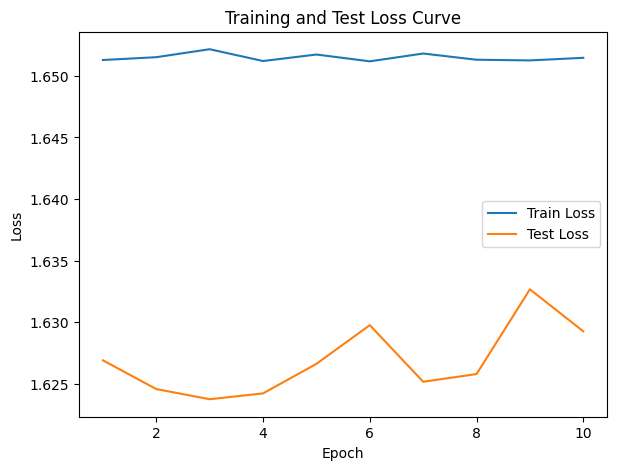

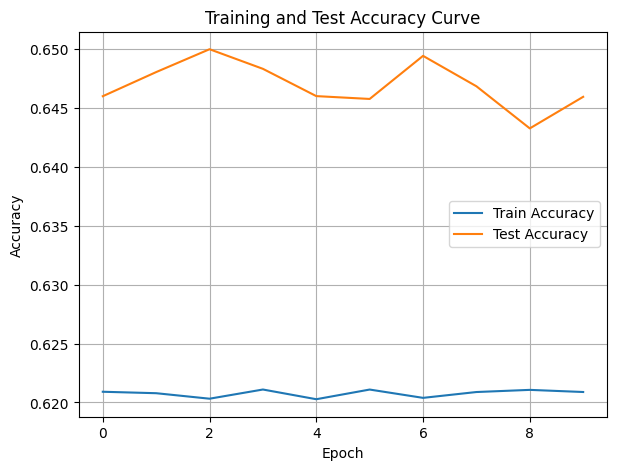

./saved_models/model_14.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:37<05:36, 37.38s/it]

Epoch [1/10], Train F1:0.5863580290115871, Train Loss: 1.6508, Train Acc: 0.6212, Test F1:0.6146379210000829, Test Loss: 1.6217, Test Acc: 0.6509


Training Process:  20%|██        | 2/10 [01:16<05:06, 38.29s/it]

Epoch [2/10], Train F1:0.5863839225615622, Train Loss: 1.6509, Train Acc: 0.6211, Test F1:0.6115896798181584, Test Loss: 1.6251, Test Acc: 0.6486


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.29s/it]

Epoch [3/10], Train F1:0.5862692343662387, Train Loss: 1.6510, Train Acc: 0.6211, Test F1:0.6111418563499736, Test Loss: 1.6251, Test Acc: 0.6489


Training Process:  40%|████      | 4/10 [02:38<04:00, 40.10s/it]

Epoch [4/10], Train F1:0.5862866535840737, Train Loss: 1.6509, Train Acc: 0.6212, Test F1:0.6100441935709183, Test Loss: 1.6265, Test Acc: 0.6475


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.39s/it]

Epoch [5/10], Train F1:0.5865047960645958, Train Loss: 1.6507, Train Acc: 0.6214, Test F1:0.6121767966025163, Test Loss: 1.6251, Test Acc: 0.6492


Training Process:  60%|██████    | 6/10 [04:06<02:49, 42.40s/it]

Epoch [6/10], Train F1:0.5865897149947487, Train Loss: 1.6507, Train Acc: 0.6215, Test F1:0.6101953635830396, Test Loss: 1.6268, Test Acc: 0.6476


Training Process:  70%|███████   | 7/10 [04:53<02:12, 44.07s/it]

Epoch [7/10], Train F1:0.5865928456228319, Train Loss: 1.6507, Train Acc: 0.6214, Test F1:0.6100553177388247, Test Loss: 1.6270, Test Acc: 0.6474


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.06s/it]

Epoch [8/10], Train F1:0.5866906271790772, Train Loss: 1.6506, Train Acc: 0.6216, Test F1:0.6099305311672354, Test Loss: 1.6272, Test Acc: 0.6472


Training Process:  90%|█████████ | 9/10 [06:31<00:46, 46.76s/it]

Epoch [9/10], Train F1:0.5867169576753889, Train Loss: 1.6506, Train Acc: 0.6216, Test F1:0.6102905515714087, Test Loss: 1.6269, Test Acc: 0.6475


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.24s/it]


Epoch [10/10], Train F1:0.5867629304273809, Train Loss: 1.6505, Train Acc: 0.6216, Test F1:0.6029374516393886, Test Loss: 1.6324, Test Acc: 0.6414
Total Epochs: 10
Train loss start: 1.61002779006958, Train loss end: 1.7228730916976929
Highest Mean Train Accuracy (over epoch): 0.6216414354160579
Test loss start: 1.574044942855835, Test loss end: 1.6059519052505493
Highest mean Test Accuracy (over epoch): 0.6508524437173444


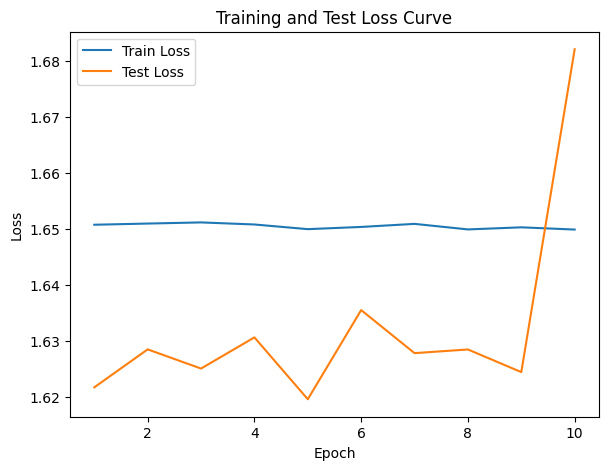

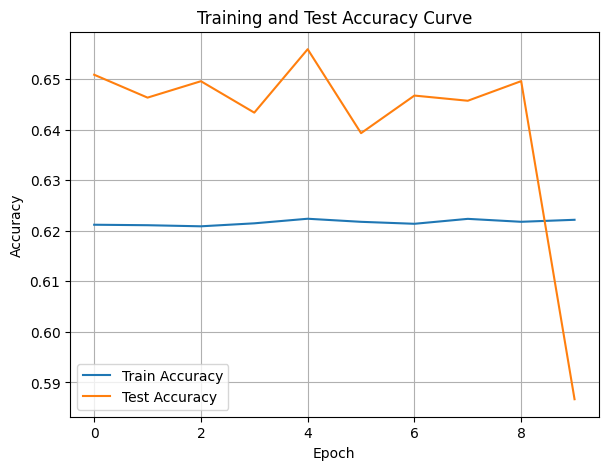

./saved_models/model_12.pth
Training Model with id 10


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.94s/it]

Epoch [1/10], Train F1:0.5884169052469679, Train Loss: 1.6492, Train Acc: 0.6233, Test F1:0.6007552726995866, Test Loss: 1.6360, Test Acc: 0.6401


Training Process:  20%|██        | 2/10 [01:16<05:08, 38.56s/it]

Epoch [2/10], Train F1:0.588408509942131, Train Loss: 1.6491, Train Acc: 0.6232, Test F1:0.602858527762642, Test Loss: 1.6348, Test Acc: 0.6410


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.63s/it]

Epoch [3/10], Train F1:0.5881441677602487, Train Loss: 1.6493, Train Acc: 0.6230, Test F1:0.6021957184931968, Test Loss: 1.6342, Test Acc: 0.6410


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.42s/it]

Epoch [4/10], Train F1:0.5881270976378913, Train Loss: 1.6493, Train Acc: 0.6229, Test F1:0.6029090719673914, Test Loss: 1.6343, Test Acc: 0.6414


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.61s/it]

Epoch [5/10], Train F1:0.5880082598678236, Train Loss: 1.6494, Train Acc: 0.6228, Test F1:0.6031078294186434, Test Loss: 1.6340, Test Acc: 0.6415


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.88s/it]

Epoch [6/10], Train F1:0.5879273387336071, Train Loss: 1.6494, Train Acc: 0.6228, Test F1:0.6034026125328128, Test Loss: 1.6340, Test Acc: 0.6417


Training Process:  70%|███████   | 7/10 [04:54<02:11, 43.94s/it]

Epoch [7/10], Train F1:0.5880743151231567, Train Loss: 1.6493, Train Acc: 0.6229, Test F1:0.6050266733344285, Test Loss: 1.6325, Test Acc: 0.6430


Training Process:  80%|████████  | 8/10 [05:42<01:30, 45.12s/it]

Epoch [8/10], Train F1:0.5881088436264266, Train Loss: 1.6493, Train Acc: 0.6230, Test F1:0.6049218751001533, Test Loss: 1.6323, Test Acc: 0.6430


Training Process:  90%|█████████ | 9/10 [06:33<00:46, 46.99s/it]

Epoch [9/10], Train F1:0.5881524826380877, Train Loss: 1.6492, Train Acc: 0.6230, Test F1:0.6052107879593921, Test Loss: 1.6323, Test Acc: 0.6430


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.56s/it]

Epoch [10/10], Train F1:0.5882561738819958, Train Loss: 1.6491, Train Acc: 0.6231, Test F1:0.6055526038673391, Test Loss: 1.6320, Test Acc: 0.6432
Total Epochs: 10
Train loss start: 1.6510288715362549, Train loss end: 1.5437846183776855
Highest Mean Train Accuracy (over epoch): 0.6232586942505112
Test loss start: 1.5953822135925293, Test loss end: 1.5819295644760132
Highest mean Test Accuracy (over epoch): 0.6431917556154595


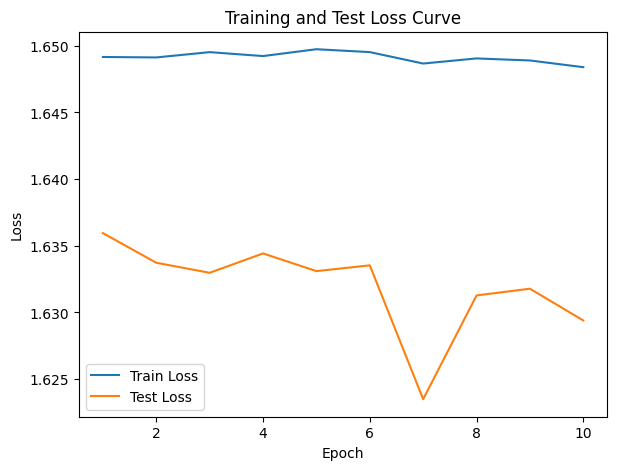

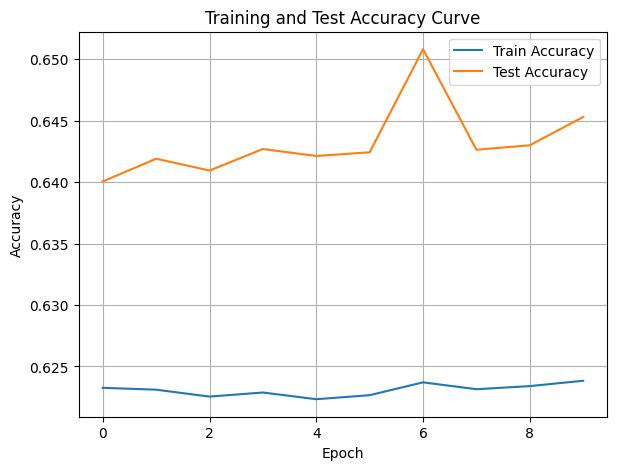

./saved_models/model_10.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [19]:
coverDTEmlp8b.train_DTE()

Training Process:   1%|          | 1/150 [00:37<1:33:10, 37.52s/it]

Epoch [1/150], Train F1:0.382035905099847, Train Loss: 1.9746, Train Acc: 0.3652, Test F1:0.40362143797945244, Test Loss: 1.8676, Test Acc: 0.5071


Training Process:   1%|▏         | 2/150 [01:16<1:34:35, 38.35s/it]

Epoch [2/150], Train F1:0.41982425725562283, Train Loss: 1.8862, Train Acc: 0.4368, Test F1:0.3975763709093099, Test Loss: 1.8103, Test Acc: 0.5103


Training Process:   2%|▏         | 3/150 [01:57<1:36:28, 39.38s/it]

Epoch [3/150], Train F1:0.43706376434667876, Train Loss: 1.8395, Train Acc: 0.4686, Test F1:0.42058211551776115, Test Loss: 1.7805, Test Acc: 0.5241


Training Process:   3%|▎         | 4/150 [02:39<1:38:57, 40.67s/it]

Epoch [4/150], Train F1:0.45013959079922716, Train Loss: 1.8111, Train Acc: 0.4883, Test F1:0.44856365492708605, Test Loss: 1.7595, Test Acc: 0.5388


Training Process:   3%|▎         | 5/150 [03:22<1:39:57, 41.36s/it]

Epoch [5/150], Train F1:0.4603028511726707, Train Loss: 1.7921, Train Acc: 0.5019, Test F1:0.4664406274972233, Test Loss: 1.7455, Test Acc: 0.5486


Training Process:   4%|▍         | 6/150 [04:07<1:42:41, 42.79s/it]

Epoch [6/150], Train F1:0.46835609717816745, Train Loss: 1.7783, Train Acc: 0.5121, Test F1:0.4779004099238081, Test Loss: 1.7351, Test Acc: 0.5554


Training Process:   5%|▍         | 7/150 [04:53<1:44:26, 43.83s/it]

Epoch [7/150], Train F1:0.47481800168674787, Train Loss: 1.7677, Train Acc: 0.5200, Test F1:0.48687015150745855, Test Loss: 1.7272, Test Acc: 0.5609


Training Process:   5%|▌         | 8/150 [05:42<1:47:15, 45.32s/it]

Epoch [8/150], Train F1:0.48020753632876, Train Loss: 1.7593, Train Acc: 0.5264, Test F1:0.4937275723799819, Test Loss: 1.7208, Test Acc: 0.5654


Training Process:   6%|▌         | 9/150 [06:33<1:50:45, 47.13s/it]

Epoch [9/150], Train F1:0.48473097564784207, Train Loss: 1.7524, Train Acc: 0.5317, Test F1:0.49916835315156627, Test Loss: 1.7158, Test Acc: 0.5690


Training Process:   7%|▋         | 10/150 [07:26<1:54:10, 48.93s/it]

Epoch [10/150], Train F1:0.48855077574652134, Train Loss: 1.7467, Train Acc: 0.5362, Test F1:0.5036239131740041, Test Loss: 1.7116, Test Acc: 0.5721


Training Process:   7%|▋         | 11/150 [08:18<1:55:55, 50.04s/it]

Epoch [11/150], Train F1:0.49193687643465717, Train Loss: 1.7418, Train Acc: 0.5402, Test F1:0.5066243902415958, Test Loss: 1.7083, Test Acc: 0.5744


Training Process:   8%|▊         | 12/150 [09:14<1:58:54, 51.70s/it]

Epoch [12/150], Train F1:0.49476563740262736, Train Loss: 1.7376, Train Acc: 0.5434, Test F1:0.510044357954561, Test Loss: 1.7053, Test Acc: 0.5768


Training Process:   9%|▊         | 13/150 [10:11<2:01:34, 53.24s/it]

Epoch [13/150], Train F1:0.4972355007869506, Train Loss: 1.7340, Train Acc: 0.5463, Test F1:0.5130148289895787, Test Loss: 1.7026, Test Acc: 0.5789


Training Process:   9%|▉         | 14/150 [11:08<2:03:29, 54.48s/it]

Epoch [14/150], Train F1:0.4994732708889169, Train Loss: 1.7308, Train Acc: 0.5489, Test F1:0.5149509668616042, Test Loss: 1.7005, Test Acc: 0.5804


Training Process:  10%|█         | 15/150 [12:09<2:07:05, 56.48s/it]

Epoch [15/150], Train F1:0.501513275586504, Train Loss: 1.7280, Train Acc: 0.5512, Test F1:0.5166302814260609, Test Loss: 1.6987, Test Acc: 0.5817


Training Process:  11%|█         | 16/150 [13:11<2:09:27, 57.97s/it]

Epoch [16/150], Train F1:0.5033113520386412, Train Loss: 1.7255, Train Acc: 0.5533, Test F1:0.5185809925248027, Test Loss: 1.6969, Test Acc: 0.5831


Training Process:  11%|█▏        | 17/150 [14:14<2:12:14, 59.66s/it]

Epoch [17/150], Train F1:0.5049038894273278, Train Loss: 1.7232, Train Acc: 0.5551, Test F1:0.5204035004747715, Test Loss: 1.6952, Test Acc: 0.5844


Training Process:  12%|█▏        | 18/150 [15:18<2:14:14, 61.02s/it]

Epoch [18/150], Train F1:0.5062917795110367, Train Loss: 1.7212, Train Acc: 0.5567, Test F1:0.5217326975795649, Test Loss: 1.6938, Test Acc: 0.5854


Training Process:  13%|█▎        | 19/150 [16:25<2:16:37, 62.58s/it]

Epoch [19/150], Train F1:0.5076442452867888, Train Loss: 1.7194, Train Acc: 0.5583, Test F1:0.5224713575457794, Test Loss: 1.6929, Test Acc: 0.5861


Training Process:  13%|█▎        | 20/150 [17:32<2:18:58, 64.14s/it]

Epoch [20/150], Train F1:0.5088769957572223, Train Loss: 1.7177, Train Acc: 0.5597, Test F1:0.5232688567301236, Test Loss: 1.6919, Test Acc: 0.5867


Training Process:  14%|█▍        | 21/150 [18:41<2:20:44, 65.46s/it]

Epoch [21/150], Train F1:0.5100237898648968, Train Loss: 1.7161, Train Acc: 0.5610, Test F1:0.5242758475996212, Test Loss: 1.6909, Test Acc: 0.5875


Training Process:  15%|█▍        | 22/150 [19:53<2:23:37, 67.33s/it]

Epoch [22/150], Train F1:0.5110931912587146, Train Loss: 1.7147, Train Acc: 0.5622, Test F1:0.5256332208356408, Test Loss: 1.6898, Test Acc: 0.5885


Training Process:  15%|█▌        | 23/150 [21:06<2:26:06, 69.03s/it]

Epoch [23/150], Train F1:0.5121210976179362, Train Loss: 1.7133, Train Acc: 0.5633, Test F1:0.5262781580190627, Test Loss: 1.6890, Test Acc: 0.5890


Training Process:  16%|█▌        | 24/150 [22:21<2:28:51, 70.89s/it]

Epoch [24/150], Train F1:0.5130194101109129, Train Loss: 1.7121, Train Acc: 0.5643, Test F1:0.5269327220732763, Test Loss: 1.6883, Test Acc: 0.5896


Training Process:  17%|█▋        | 25/150 [23:36<2:30:36, 72.29s/it]

Epoch [25/150], Train F1:0.5138728603865708, Train Loss: 1.7110, Train Acc: 0.5653, Test F1:0.527731971195586, Test Loss: 1.6875, Test Acc: 0.5902


Training Process:  17%|█▋        | 26/150 [24:54<2:32:40, 73.87s/it]

Epoch [26/150], Train F1:0.5146771273271232, Train Loss: 1.7099, Train Acc: 0.5662, Test F1:0.5282389281979744, Test Loss: 1.6869, Test Acc: 0.5906


Training Process:  18%|█▊        | 27/150 [26:12<2:34:12, 75.22s/it]

Epoch [27/150], Train F1:0.5154513584432628, Train Loss: 1.7089, Train Acc: 0.5671, Test F1:0.5285876006943895, Test Loss: 1.6864, Test Acc: 0.5909


Training Process:  19%|█▊        | 28/150 [27:32<2:35:57, 76.70s/it]

Epoch [28/150], Train F1:0.5161537153870854, Train Loss: 1.7079, Train Acc: 0.5679, Test F1:0.529334189900628, Test Loss: 1.6857, Test Acc: 0.5915


Training Process:  19%|█▉        | 29/150 [28:55<2:37:55, 78.31s/it]

Epoch [29/150], Train F1:0.5167876513948525, Train Loss: 1.7071, Train Acc: 0.5686, Test F1:0.5297967738682887, Test Loss: 1.6852, Test Acc: 0.5919


Training Process:  20%|██        | 30/150 [30:17<2:39:05, 79.55s/it]

Epoch [30/150], Train F1:0.517418824504407, Train Loss: 1.7062, Train Acc: 0.5693, Test F1:0.5305020537358625, Test Loss: 1.6846, Test Acc: 0.5924


Training Process:  21%|██        | 31/150 [31:43<2:41:23, 81.37s/it]

Epoch [31/150], Train F1:0.5179983471017516, Train Loss: 1.7055, Train Acc: 0.5700, Test F1:0.5304921844637599, Test Loss: 1.6843, Test Acc: 0.5924


Training Process:  21%|██▏       | 32/150 [33:09<2:43:01, 82.90s/it]

Epoch [32/150], Train F1:0.5185657009708973, Train Loss: 1.7047, Train Acc: 0.5706, Test F1:0.5313110494735664, Test Loss: 1.6837, Test Acc: 0.5930


Training Process:  22%|██▏       | 33/150 [34:38<2:45:13, 84.73s/it]

Epoch [33/150], Train F1:0.5190839353379562, Train Loss: 1.7040, Train Acc: 0.5712, Test F1:0.5316534976885688, Test Loss: 1.6833, Test Acc: 0.5933


Training Process:  23%|██▎       | 34/150 [36:08<2:46:37, 86.18s/it]

Epoch [34/150], Train F1:0.5196208861819995, Train Loss: 1.7034, Train Acc: 0.5718, Test F1:0.53223575576986, Test Loss: 1.6828, Test Acc: 0.5938


Training Process:  23%|██▎       | 35/150 [37:39<2:48:11, 87.75s/it]

Epoch [35/150], Train F1:0.5200937522954062, Train Loss: 1.7027, Train Acc: 0.5723, Test F1:0.5326205022637377, Test Loss: 1.6824, Test Acc: 0.5941


Training Process:  24%|██▍       | 36/150 [39:12<2:49:45, 89.35s/it]

Epoch [36/150], Train F1:0.5205312838370071, Train Loss: 1.7021, Train Acc: 0.5728, Test F1:0.5329825306189813, Test Loss: 1.6820, Test Acc: 0.5944


Training Process:  25%|██▍       | 37/150 [40:47<2:51:09, 90.88s/it]

Epoch [37/150], Train F1:0.5209960302066623, Train Loss: 1.7015, Train Acc: 0.5733, Test F1:0.5333714198043717, Test Loss: 1.6816, Test Acc: 0.5947


Training Process:  25%|██▌       | 38/150 [42:23<2:52:46, 92.56s/it]

Epoch [38/150], Train F1:0.5214307069496589, Train Loss: 1.7010, Train Acc: 0.5738, Test F1:0.5333712476604444, Test Loss: 1.6815, Test Acc: 0.5947


Training Process:  26%|██▌       | 39/150 [44:00<2:53:54, 94.01s/it]

Epoch [39/150], Train F1:0.5218704870312766, Train Loss: 1.7004, Train Acc: 0.5743, Test F1:0.5337705093496137, Test Loss: 1.6811, Test Acc: 0.5950


Training Process:  27%|██▋       | 40/150 [45:40<2:55:32, 95.75s/it]

Epoch [40/150], Train F1:0.5223170338208839, Train Loss: 1.6999, Train Acc: 0.5747, Test F1:0.5343028738667153, Test Loss: 1.6807, Test Acc: 0.5954


Training Process:  27%|██▋       | 41/150 [47:21<2:56:48, 97.32s/it]

Epoch [41/150], Train F1:0.52283159464313, Train Loss: 1.6994, Train Acc: 0.5752, Test F1:0.5345830648586368, Test Loss: 1.6804, Test Acc: 0.5956


Training Process:  28%|██▊       | 42/150 [49:04<2:58:06, 98.95s/it]

Epoch [42/150], Train F1:0.523491513930882, Train Loss: 1.6988, Train Acc: 0.5756, Test F1:0.5351866342976292, Test Loss: 1.6800, Test Acc: 0.5960


Training Process:  29%|██▊       | 43/150 [50:48<2:59:01, 100.38s/it]

Epoch [43/150], Train F1:0.5244061631178079, Train Loss: 1.6982, Train Acc: 0.5762, Test F1:0.5361334215625354, Test Loss: 1.6795, Test Acc: 0.5964


Training Process:  29%|██▉       | 44/150 [52:33<3:00:08, 101.97s/it]

Epoch [44/150], Train F1:0.5255124975724857, Train Loss: 1.6976, Train Acc: 0.5768, Test F1:0.5367090647584323, Test Loss: 1.6792, Test Acc: 0.5967


Training Process:  30%|███       | 45/150 [54:20<3:00:48, 103.32s/it]

Epoch [45/150], Train F1:0.526750904867091, Train Loss: 1.6969, Train Acc: 0.5774, Test F1:0.5374444960349671, Test Loss: 1.6788, Test Acc: 0.5970


Training Process:  31%|███       | 46/150 [56:18<3:06:47, 107.76s/it]

Epoch [46/150], Train F1:0.5280817952592262, Train Loss: 1.6962, Train Acc: 0.5780, Test F1:0.5383377086805684, Test Loss: 1.6782, Test Acc: 0.5974


Training Process:  31%|███▏      | 47/150 [58:07<3:05:50, 108.25s/it]

Epoch [47/150], Train F1:0.5294309401046995, Train Loss: 1.6955, Train Acc: 0.5787, Test F1:0.5391606037538396, Test Loss: 1.6777, Test Acc: 0.5978


Training Process:  32%|███▏      | 48/150 [1:00:00<3:06:08, 109.50s/it]

Epoch [48/150], Train F1:0.5307946528472837, Train Loss: 1.6948, Train Acc: 0.5794, Test F1:0.5398335878551146, Test Loss: 1.6773, Test Acc: 0.5981


Training Process:  33%|███▎      | 49/150 [1:01:54<3:06:42, 110.91s/it]

Epoch [49/150], Train F1:0.5321450643720104, Train Loss: 1.6941, Train Acc: 0.5801, Test F1:0.5408321986857677, Test Loss: 1.6767, Test Acc: 0.5986


Training Process:  33%|███▎      | 50/150 [1:03:49<3:06:58, 112.19s/it]

Epoch [50/150], Train F1:0.5334678481480981, Train Loss: 1.6934, Train Acc: 0.5807, Test F1:0.5417256473569344, Test Loss: 1.6762, Test Acc: 0.5991


Training Process:  34%|███▍      | 51/150 [1:06:10<3:19:18, 120.80s/it]

Epoch [51/150], Train F1:0.5347456636118398, Train Loss: 1.6927, Train Acc: 0.5814, Test F1:0.5424354916247899, Test Loss: 1.6757, Test Acc: 0.5994


Training Process:  35%|███▍      | 52/150 [1:08:28<3:25:37, 125.89s/it]

Epoch [52/150], Train F1:0.5359587359068442, Train Loss: 1.6920, Train Acc: 0.5821, Test F1:0.5432581411466827, Test Loss: 1.6752, Test Acc: 0.5998


Training Process:  35%|███▌      | 53/150 [1:10:46<3:29:33, 129.63s/it]

Epoch [53/150], Train F1:0.5370979924650988, Train Loss: 1.6913, Train Acc: 0.5827, Test F1:0.5441205667269778, Test Loss: 1.6747, Test Acc: 0.6002


Training Process:  36%|███▌      | 54/150 [1:13:04<3:31:10, 131.99s/it]

Epoch [54/150], Train F1:0.5382372548787159, Train Loss: 1.6907, Train Acc: 0.5833, Test F1:0.544980716062522, Test Loss: 1.6741, Test Acc: 0.6007


Training Process:  37%|███▋      | 55/150 [1:15:18<3:30:14, 132.78s/it]

Epoch [55/150], Train F1:0.5393251238035032, Train Loss: 1.6900, Train Acc: 0.5839, Test F1:0.5464882380835432, Test Loss: 1.6733, Test Acc: 0.6014


Training Process:  37%|███▋      | 56/150 [1:17:31<3:27:44, 132.61s/it]

Epoch [56/150], Train F1:0.5403738689682807, Train Loss: 1.6894, Train Acc: 0.5845, Test F1:0.547437091269291, Test Loss: 1.6728, Test Acc: 0.6019


Training Process:  38%|███▊      | 57/150 [1:19:42<3:25:08, 132.35s/it]

Epoch [57/150], Train F1:0.5413933535967377, Train Loss: 1.6888, Train Acc: 0.5851, Test F1:0.5487424658947622, Test Loss: 1.6721, Test Acc: 0.6025


Training Process:  39%|███▊      | 58/150 [1:22:01<3:25:40, 134.13s/it]

Epoch [58/150], Train F1:0.5423643944664533, Train Loss: 1.6881, Train Acc: 0.5857, Test F1:0.5497959057561215, Test Loss: 1.6715, Test Acc: 0.6031


Training Process:  39%|███▉      | 59/150 [1:24:14<3:23:07, 133.93s/it]

Epoch [59/150], Train F1:0.5432955893030021, Train Loss: 1.6876, Train Acc: 0.5863, Test F1:0.5505728393075342, Test Loss: 1.6710, Test Acc: 0.6035


Training Process:  40%|████      | 60/150 [1:26:40<3:26:17, 137.53s/it]

Epoch [60/150], Train F1:0.5441873899011467, Train Loss: 1.6870, Train Acc: 0.5868, Test F1:0.5513721314013512, Test Loss: 1.6704, Test Acc: 0.6040


Training Process:  41%|████      | 61/150 [1:29:15<3:31:37, 142.67s/it]

Epoch [61/150], Train F1:0.5450431268557726, Train Loss: 1.6864, Train Acc: 0.5873, Test F1:0.5528660579287538, Test Loss: 1.6697, Test Acc: 0.6047


Training Process:  41%|████▏     | 62/150 [1:31:28<3:25:13, 139.92s/it]

Epoch [62/150], Train F1:0.545861453669176, Train Loss: 1.6859, Train Acc: 0.5878, Test F1:0.5542685581045043, Test Loss: 1.6690, Test Acc: 0.6054


Training Process:  42%|████▏     | 63/150 [1:33:43<3:20:40, 138.40s/it]

Epoch [63/150], Train F1:0.5466591303731478, Train Loss: 1.6854, Train Acc: 0.5883, Test F1:0.5552787362259064, Test Loss: 1.6684, Test Acc: 0.6060


Training Process:  43%|████▎     | 64/150 [1:36:00<3:17:40, 137.91s/it]

Epoch [64/150], Train F1:0.5474084358037683, Train Loss: 1.6849, Train Acc: 0.5888, Test F1:0.556301835816982, Test Loss: 1.6678, Test Acc: 0.6066


Training Process:  43%|████▎     | 65/150 [1:38:19<3:15:53, 138.28s/it]

Epoch [65/150], Train F1:0.5481437589612064, Train Loss: 1.6844, Train Acc: 0.5893, Test F1:0.5569355887219393, Test Loss: 1.6674, Test Acc: 0.6070


Training Process:  44%|████▍     | 66/150 [1:40:38<3:14:08, 138.67s/it]

Epoch [66/150], Train F1:0.5488583696898915, Train Loss: 1.6839, Train Acc: 0.5898, Test F1:0.5575085385675297, Test Loss: 1.6670, Test Acc: 0.6073


Training Process:  45%|████▍     | 67/150 [1:43:00<3:12:56, 139.47s/it]

Epoch [67/150], Train F1:0.5495440344495884, Train Loss: 1.6834, Train Acc: 0.5902, Test F1:0.5583139004089754, Test Loss: 1.6665, Test Acc: 0.6078


Training Process:  45%|████▌     | 68/150 [1:45:23<3:11:58, 140.47s/it]

Epoch [68/150], Train F1:0.5502079899139345, Train Loss: 1.6829, Train Acc: 0.5907, Test F1:0.5594024955465202, Test Loss: 1.6659, Test Acc: 0.6084


Training Process:  46%|████▌     | 69/150 [1:47:44<3:10:12, 140.89s/it]

Epoch [69/150], Train F1:0.5508355435515253, Train Loss: 1.6825, Train Acc: 0.5911, Test F1:0.5601229175052486, Test Loss: 1.6654, Test Acc: 0.6088


Training Process:  47%|████▋     | 70/150 [1:50:08<3:08:42, 141.54s/it]

Epoch [70/150], Train F1:0.5514578078875824, Train Loss: 1.6820, Train Acc: 0.5915, Test F1:0.5609023402295454, Test Loss: 1.6649, Test Acc: 0.6093


Training Process:  47%|████▋     | 71/150 [1:52:35<3:08:41, 143.31s/it]

Epoch [71/150], Train F1:0.5520673622245065, Train Loss: 1.6816, Train Acc: 0.5919, Test F1:0.5615611769156541, Test Loss: 1.6645, Test Acc: 0.6097


Training Process:  48%|████▊     | 72/150 [1:55:04<3:08:36, 145.09s/it]

Epoch [72/150], Train F1:0.552643245595243, Train Loss: 1.6812, Train Acc: 0.5923, Test F1:0.5625088861350034, Test Loss: 1.6640, Test Acc: 0.6103


Training Process:  49%|████▊     | 73/150 [1:57:36<3:08:50, 147.15s/it]

Epoch [73/150], Train F1:0.5532156275727812, Train Loss: 1.6808, Train Acc: 0.5927, Test F1:0.5629132675942179, Test Loss: 1.6636, Test Acc: 0.6105


Training Process:  49%|████▉     | 74/150 [2:00:08<3:08:16, 148.64s/it]

Epoch [74/150], Train F1:0.5537643269868013, Train Loss: 1.6804, Train Acc: 0.5931, Test F1:0.5637688469115835, Test Loss: 1.6631, Test Acc: 0.6110


Training Process:  50%|█████     | 75/150 [2:02:43<3:08:04, 150.46s/it]

Epoch [75/150], Train F1:0.5542990875574003, Train Loss: 1.6800, Train Acc: 0.5935, Test F1:0.5643810425539487, Test Loss: 1.6627, Test Acc: 0.6114


Training Process:  51%|█████     | 76/150 [2:05:17<3:06:43, 151.40s/it]

Epoch [76/150], Train F1:0.5548159310177438, Train Loss: 1.6796, Train Acc: 0.5939, Test F1:0.5646913191720235, Test Loss: 1.6624, Test Acc: 0.6116


Training Process:  51%|█████▏    | 77/150 [2:07:56<3:07:02, 153.74s/it]

Epoch [77/150], Train F1:0.5553258493657959, Train Loss: 1.6792, Train Acc: 0.5942, Test F1:0.5643325293267056, Test Loss: 1.6626, Test Acc: 0.6113


Training Process:  52%|█████▏    | 78/150 [2:10:34<3:06:16, 155.23s/it]

Epoch [78/150], Train F1:0.5558189629621602, Train Loss: 1.6788, Train Acc: 0.5946, Test F1:0.5649669202830713, Test Loss: 1.6621, Test Acc: 0.6117


Training Process:  53%|█████▎    | 79/150 [2:13:16<3:05:46, 157.00s/it]

Epoch [79/150], Train F1:0.5562927813983022, Train Loss: 1.6785, Train Acc: 0.5949, Test F1:0.5655539439618203, Test Loss: 1.6617, Test Acc: 0.6121


Training Process:  53%|█████▎    | 80/150 [2:15:59<3:05:23, 158.91s/it]

Epoch [80/150], Train F1:0.5567668931347726, Train Loss: 1.6781, Train Acc: 0.5953, Test F1:0.5660480872460454, Test Loss: 1.6614, Test Acc: 0.6124


Training Process:  54%|█████▍    | 81/150 [2:18:44<3:04:44, 160.65s/it]

Epoch [81/150], Train F1:0.5572143956858233, Train Loss: 1.6778, Train Acc: 0.5956, Test F1:0.5667773993106527, Test Loss: 1.6609, Test Acc: 0.6129


Training Process:  55%|█████▍    | 82/150 [2:21:31<3:04:15, 162.58s/it]

Epoch [82/150], Train F1:0.5576582380865196, Train Loss: 1.6774, Train Acc: 0.5959, Test F1:0.5671285628672346, Test Loss: 1.6607, Test Acc: 0.6131


Training Process:  55%|█████▌    | 83/150 [2:24:17<3:02:51, 163.75s/it]

Epoch [83/150], Train F1:0.5580887694250789, Train Loss: 1.6771, Train Acc: 0.5963, Test F1:0.5674797126994308, Test Loss: 1.6604, Test Acc: 0.6134


Training Process:  56%|█████▌    | 84/150 [2:27:06<3:01:39, 165.14s/it]

Epoch [84/150], Train F1:0.5584967459112714, Train Loss: 1.6768, Train Acc: 0.5966, Test F1:0.5678411204951587, Test Loss: 1.6601, Test Acc: 0.6136


Training Process:  57%|█████▋    | 85/150 [2:29:55<3:00:08, 166.29s/it]

Epoch [85/150], Train F1:0.5589074775639016, Train Loss: 1.6764, Train Acc: 0.5969, Test F1:0.5681430194810011, Test Loss: 1.6599, Test Acc: 0.6138


Training Process:  57%|█████▋    | 86/150 [2:32:45<2:58:49, 167.64s/it]

Epoch [86/150], Train F1:0.5593053391151266, Train Loss: 1.6761, Train Acc: 0.5972, Test F1:0.5685332554240454, Test Loss: 1.6596, Test Acc: 0.6141


Training Process:  58%|█████▊    | 87/150 [2:35:37<2:57:19, 168.89s/it]

Epoch [87/150], Train F1:0.5596941650544467, Train Loss: 1.6758, Train Acc: 0.5975, Test F1:0.569118803405422, Test Loss: 1.6592, Test Acc: 0.6145


Training Process:  59%|█████▊    | 88/150 [2:38:33<2:56:46, 171.06s/it]

Epoch [88/150], Train F1:0.5600794378030308, Train Loss: 1.6755, Train Acc: 0.5978, Test F1:0.5695899119247798, Test Loss: 1.6588, Test Acc: 0.6148


Training Process:  59%|█████▉    | 89/150 [2:41:28<2:55:06, 172.24s/it]

Epoch [89/150], Train F1:0.5604475723374198, Train Loss: 1.6752, Train Acc: 0.5981, Test F1:0.5700423838753316, Test Loss: 1.6585, Test Acc: 0.6151


Training Process:  60%|██████    | 90/150 [2:44:27<2:54:18, 174.30s/it]

Epoch [90/150], Train F1:0.5608064030126476, Train Loss: 1.6749, Train Acc: 0.5983, Test F1:0.5695457076345717, Test Loss: 1.6588, Test Acc: 0.6148


Training Process:  61%|██████    | 91/150 [2:47:28<2:53:14, 176.19s/it]

Epoch [91/150], Train F1:0.5611581082303286, Train Loss: 1.6746, Train Acc: 0.5986, Test F1:0.5698200086463987, Test Loss: 1.6586, Test Acc: 0.6150


Training Process:  61%|██████▏   | 92/150 [2:50:28<2:51:33, 177.47s/it]

Epoch [92/150], Train F1:0.5614980536244497, Train Loss: 1.6743, Train Acc: 0.5989, Test F1:0.570145734688552, Test Loss: 1.6583, Test Acc: 0.6152


Training Process:  62%|██████▏   | 93/150 [2:53:33<2:50:31, 179.50s/it]

Epoch [93/150], Train F1:0.561835522089587, Train Loss: 1.6741, Train Acc: 0.5991, Test F1:0.5706411961468617, Test Loss: 1.6580, Test Acc: 0.6155


Training Process:  63%|██████▎   | 94/150 [2:56:44<2:50:46, 182.96s/it]

Epoch [94/150], Train F1:0.5621616525833718, Train Loss: 1.6738, Train Acc: 0.5994, Test F1:0.5708217665217984, Test Loss: 1.6578, Test Acc: 0.6156


Training Process:  63%|██████▎   | 95/150 [2:59:55<2:50:02, 185.51s/it]

Epoch [95/150], Train F1:0.5624915437041809, Train Loss: 1.6735, Train Acc: 0.5997, Test F1:0.570856551254483, Test Loss: 1.6578, Test Acc: 0.6157


Training Process:  64%|██████▍   | 96/150 [3:03:11<2:49:50, 188.71s/it]

Epoch [96/150], Train F1:0.5628046225832873, Train Loss: 1.6733, Train Acc: 0.5999, Test F1:0.5712588698061075, Test Loss: 1.6575, Test Acc: 0.6159


Training Process:  65%|██████▍   | 97/150 [3:06:33<2:50:14, 192.72s/it]

Epoch [97/150], Train F1:0.56311922617377, Train Loss: 1.6730, Train Acc: 0.6002, Test F1:0.5716324660899088, Test Loss: 1.6572, Test Acc: 0.6162


Training Process:  65%|██████▌   | 98/150 [3:09:57<2:49:55, 196.07s/it]

Epoch [98/150], Train F1:0.5634201675796463, Train Loss: 1.6728, Train Acc: 0.6004, Test F1:0.5719550126690812, Test Loss: 1.6569, Test Acc: 0.6164


Training Process:  66%|██████▌   | 99/150 [3:13:26<2:49:49, 199.80s/it]

Epoch [99/150], Train F1:0.5637076720914046, Train Loss: 1.6725, Train Acc: 0.6006, Test F1:0.5721242889956386, Test Loss: 1.6568, Test Acc: 0.6166


Training Process:  67%|██████▋   | 100/150 [3:17:07<2:51:47, 206.15s/it]

Epoch [100/150], Train F1:0.5640043563557497, Train Loss: 1.6723, Train Acc: 0.6009, Test F1:0.5723178365677994, Test Loss: 1.6566, Test Acc: 0.6167


Training Process:  67%|██████▋   | 101/150 [3:20:38<2:49:32, 207.59s/it]

Epoch [101/150], Train F1:0.5642904116232988, Train Loss: 1.6720, Train Acc: 0.6011, Test F1:0.5726103403287348, Test Loss: 1.6564, Test Acc: 0.6169


Training Process:  68%|██████▊   | 102/150 [3:24:12<2:47:43, 209.66s/it]

Epoch [102/150], Train F1:0.5645667218098807, Train Loss: 1.6718, Train Acc: 0.6013, Test F1:0.5728719057571624, Test Loss: 1.6561, Test Acc: 0.6171


Training Process:  69%|██████▊   | 103/150 [3:27:50<2:46:06, 212.06s/it]

Epoch [103/150], Train F1:0.5648374759567922, Train Loss: 1.6716, Train Acc: 0.6015, Test F1:0.5726871001381323, Test Loss: 1.6562, Test Acc: 0.6170


Training Process:  69%|██████▉   | 104/150 [3:31:31<2:44:36, 214.70s/it]

Epoch [104/150], Train F1:0.5651061794952206, Train Loss: 1.6713, Train Acc: 0.6018, Test F1:0.5728959864533419, Test Loss: 1.6560, Test Acc: 0.6171


Training Process:  70%|███████   | 105/150 [3:35:14<2:42:55, 217.24s/it]

Epoch [105/150], Train F1:0.5653594664107672, Train Loss: 1.6711, Train Acc: 0.6020, Test F1:0.5730782705199402, Test Loss: 1.6559, Test Acc: 0.6173


Training Process:  71%|███████   | 106/150 [3:38:56<2:40:17, 218.58s/it]

Epoch [106/150], Train F1:0.5656194903874942, Train Loss: 1.6709, Train Acc: 0.6022, Test F1:0.5733160181788084, Test Loss: 1.6557, Test Acc: 0.6174


Training Process:  71%|███████▏  | 107/150 [3:42:50<2:40:01, 223.29s/it]

Epoch [107/150], Train F1:0.5658805472985714, Train Loss: 1.6707, Train Acc: 0.6024, Test F1:0.5738594803123591, Test Loss: 1.6554, Test Acc: 0.6178


Training Process:  72%|███████▏  | 108/150 [3:46:59<2:41:46, 231.11s/it]

Epoch [108/150], Train F1:0.5661323181093078, Train Loss: 1.6705, Train Acc: 0.6026, Test F1:0.574267703901251, Test Loss: 1.6551, Test Acc: 0.6181


Training Process:  73%|███████▎  | 109/150 [3:50:54<2:38:42, 232.25s/it]

Epoch [109/150], Train F1:0.5663752908636532, Train Loss: 1.6702, Train Acc: 0.6028, Test F1:0.5746904505624376, Test Loss: 1.6548, Test Acc: 0.6184


Training Process:  73%|███████▎  | 110/150 [3:55:02<2:38:00, 237.02s/it]

Epoch [110/150], Train F1:0.5666114182720795, Train Loss: 1.6700, Train Acc: 0.6030, Test F1:0.5749439503581117, Test Loss: 1.6546, Test Acc: 0.6186


Training Process:  74%|███████▍  | 111/150 [3:59:18<2:37:38, 242.52s/it]

Epoch [111/150], Train F1:0.5668444070754156, Train Loss: 1.6698, Train Acc: 0.6032, Test F1:0.5750472947615177, Test Loss: 1.6545, Test Acc: 0.6186


Training Process:  75%|███████▍  | 112/150 [4:03:35<2:36:23, 246.94s/it]

Epoch [112/150], Train F1:0.5670730397832435, Train Loss: 1.6697, Train Acc: 0.6034, Test F1:0.5754949375409117, Test Loss: 1.6542, Test Acc: 0.6190


Training Process:  75%|███████▌  | 113/150 [4:07:57<2:35:04, 251.46s/it]

Epoch [113/150], Train F1:0.5673052010709198, Train Loss: 1.6694, Train Acc: 0.6036, Test F1:0.575493731448056, Test Loss: 1.6542, Test Acc: 0.6190


Training Process:  76%|███████▌  | 114/150 [4:12:22<2:33:15, 255.44s/it]

Epoch [114/150], Train F1:0.5675268591586025, Train Loss: 1.6693, Train Acc: 0.6037, Test F1:0.5756978645120883, Test Loss: 1.6540, Test Acc: 0.6191


Training Process:  77%|███████▋  | 115/150 [4:16:50<2:31:12, 259.22s/it]

Epoch [115/150], Train F1:0.5677479081216915, Train Loss: 1.6691, Train Acc: 0.6039, Test F1:0.5759150224028916, Test Loss: 1.6538, Test Acc: 0.6193


Training Process:  77%|███████▋  | 116/150 [4:21:10<2:27:02, 259.50s/it]

Epoch [116/150], Train F1:0.5679587898314556, Train Loss: 1.6689, Train Acc: 0.6041, Test F1:0.5760479676292805, Test Loss: 1.6537, Test Acc: 0.6194


Training Process:  78%|███████▊  | 117/150 [4:25:47<2:25:42, 264.91s/it]

Epoch [117/150], Train F1:0.5681632825458166, Train Loss: 1.6687, Train Acc: 0.6043, Test F1:0.5760897578923033, Test Loss: 1.6536, Test Acc: 0.6194


Training Process:  79%|███████▊  | 118/150 [4:30:22<2:22:47, 267.74s/it]

Epoch [118/150], Train F1:0.5683747320774049, Train Loss: 1.6685, Train Acc: 0.6045, Test F1:0.5760979361485767, Test Loss: 1.6536, Test Acc: 0.6194


Training Process:  79%|███████▉  | 119/150 [4:35:02<2:20:18, 271.56s/it]

Epoch [119/150], Train F1:0.5685771375742209, Train Loss: 1.6683, Train Acc: 0.6046, Test F1:0.5764048067832191, Test Loss: 1.6533, Test Acc: 0.6197


Training Process:  80%|████████  | 120/150 [4:39:50<2:18:16, 276.56s/it]

Epoch [120/150], Train F1:0.5687792068240635, Train Loss: 1.6682, Train Acc: 0.6048, Test F1:0.5765835808071977, Test Loss: 1.6532, Test Acc: 0.6198


Training Process:  81%|████████  | 121/150 [4:44:35<2:14:51, 279.01s/it]

Epoch [121/150], Train F1:0.5689785610016241, Train Loss: 1.6680, Train Acc: 0.6050, Test F1:0.5766848566271429, Test Loss: 1.6531, Test Acc: 0.6199


Training Process:  81%|████████▏ | 122/150 [4:49:22<2:11:15, 281.28s/it]

Epoch [122/150], Train F1:0.5691816951484664, Train Loss: 1.6678, Train Acc: 0.6051, Test F1:0.5766885171105987, Test Loss: 1.6530, Test Acc: 0.6199


Training Process:  82%|████████▏ | 123/150 [4:54:26<2:09:37, 288.05s/it]

Epoch [123/150], Train F1:0.5693759376375406, Train Loss: 1.6676, Train Acc: 0.6053, Test F1:0.5768168982997616, Test Loss: 1.6529, Test Acc: 0.6200


Training Process:  83%|████████▎ | 124/150 [4:59:33<2:07:18, 293.78s/it]

Epoch [124/150], Train F1:0.5695678681562528, Train Loss: 1.6675, Train Acc: 0.6055, Test F1:0.5767452437534268, Test Loss: 1.6529, Test Acc: 0.6199


Training Process:  83%|████████▎ | 125/150 [5:04:45<2:04:43, 299.33s/it]

Epoch [125/150], Train F1:0.569754270788955, Train Loss: 1.6673, Train Acc: 0.6056, Test F1:0.5767381464669346, Test Loss: 1.6529, Test Acc: 0.6200


Training Process:  84%|████████▍ | 126/150 [5:10:04<2:02:04, 305.17s/it]

Epoch [126/150], Train F1:0.5699428932155878, Train Loss: 1.6671, Train Acc: 0.6058, Test F1:0.5768277639165851, Test Loss: 1.6528, Test Acc: 0.6200


Training Process:  85%|████████▍ | 127/150 [5:15:29<1:59:16, 311.16s/it]

Epoch [127/150], Train F1:0.5701222014351813, Train Loss: 1.6670, Train Acc: 0.6059, Test F1:0.5770560285476162, Test Loss: 1.6526, Test Acc: 0.6202


Training Process:  85%|████████▌ | 128/150 [5:21:01<1:56:23, 317.45s/it]

Epoch [128/150], Train F1:0.5702956414387312, Train Loss: 1.6668, Train Acc: 0.6061, Test F1:0.5771251907566385, Test Loss: 1.6525, Test Acc: 0.6202


Training Process:  86%|████████▌ | 129/150 [5:26:40<1:53:18, 323.75s/it]

Epoch [129/150], Train F1:0.5704787450010954, Train Loss: 1.6666, Train Acc: 0.6063, Test F1:0.5771170049415637, Test Loss: 1.6525, Test Acc: 0.6202


Training Process:  87%|████████▋ | 130/150 [5:32:34<1:50:58, 332.92s/it]

Epoch [130/150], Train F1:0.5706490479408578, Train Loss: 1.6665, Train Acc: 0.6064, Test F1:0.5772465666726898, Test Loss: 1.6524, Test Acc: 0.6203


Training Process:  87%|████████▋ | 131/150 [5:38:24<1:47:01, 337.95s/it]

Epoch [131/150], Train F1:0.5708152902009185, Train Loss: 1.6663, Train Acc: 0.6065, Test F1:0.5774248854667432, Test Loss: 1.6523, Test Acc: 0.6205


Training Process:  88%|████████▊ | 132/150 [5:44:30<1:43:55, 346.40s/it]

Epoch [132/150], Train F1:0.5709842965828335, Train Loss: 1.6662, Train Acc: 0.6067, Test F1:0.5776002180271158, Test Loss: 1.6521, Test Acc: 0.6206


Training Process:  89%|████████▊ | 133/150 [5:50:36<1:39:52, 352.47s/it]

Epoch [133/150], Train F1:0.5711501447574017, Train Loss: 1.6660, Train Acc: 0.6068, Test F1:0.5777395685099259, Test Loss: 1.6520, Test Acc: 0.6207


Training Process:  89%|████████▉ | 134/150 [5:56:43<1:35:09, 356.84s/it]

Epoch [134/150], Train F1:0.5713119256880465, Train Loss: 1.6659, Train Acc: 0.6070, Test F1:0.5778288238780003, Test Loss: 1.6519, Test Acc: 0.6208


Training Process:  90%|█████████ | 135/150 [6:02:58<1:30:30, 362.06s/it]

Epoch [135/150], Train F1:0.5714718250294006, Train Loss: 1.6657, Train Acc: 0.6071, Test F1:0.5779400810432528, Test Loss: 1.6518, Test Acc: 0.6209


Training Process:  91%|█████████ | 136/150 [6:09:12<1:25:19, 365.67s/it]

Epoch [136/150], Train F1:0.5716323074797042, Train Loss: 1.6656, Train Acc: 0.6072, Test F1:0.5781034946476205, Test Loss: 1.6517, Test Acc: 0.6210


Training Process:  91%|█████████▏| 137/150 [6:16:01<1:22:02, 378.64s/it]

Epoch [137/150], Train F1:0.5717899944169303, Train Loss: 1.6655, Train Acc: 0.6074, Test F1:0.5782642470240312, Test Loss: 1.6515, Test Acc: 0.6211


Training Process:  92%|█████████▏| 138/150 [6:23:14<1:19:00, 395.05s/it]

Epoch [138/150], Train F1:0.5719498556952896, Train Loss: 1.6653, Train Acc: 0.6075, Test F1:0.5784487316574296, Test Loss: 1.6514, Test Acc: 0.6212


Training Process:  93%|█████████▎| 139/150 [6:30:17<1:13:58, 403.54s/it]

Epoch [139/150], Train F1:0.5721017250117657, Train Loss: 1.6652, Train Acc: 0.6077, Test F1:0.5785808240840961, Test Loss: 1.6513, Test Acc: 0.6213


Training Process:  93%|█████████▎| 140/150 [6:37:29<1:08:38, 411.87s/it]

Epoch [140/150], Train F1:0.5722586205145097, Train Loss: 1.6650, Train Acc: 0.6078, Test F1:0.5787022864289364, Test Loss: 1.6512, Test Acc: 0.6214


Training Process:  94%|█████████▍| 141/150 [6:45:06<1:03:49, 425.47s/it]

Epoch [141/150], Train F1:0.5724085178735304, Train Loss: 1.6649, Train Acc: 0.6079, Test F1:0.5788223200583624, Test Loss: 1.6511, Test Acc: 0.6215


Training Process:  95%|█████████▍| 142/150 [6:52:34<57:38, 432.36s/it]  

Epoch [142/150], Train F1:0.572553175287925, Train Loss: 1.6648, Train Acc: 0.6080, Test F1:0.5790049746873063, Test Loss: 1.6509, Test Acc: 0.6216


Training Process:  95%|█████████▌| 143/150 [7:00:23<51:43, 443.37s/it]

Epoch [143/150], Train F1:0.5727000619892478, Train Loss: 1.6646, Train Acc: 0.6082, Test F1:0.5790166367523591, Test Loss: 1.6509, Test Acc: 0.6216


Training Process:  96%|█████████▌| 144/150 [7:08:33<45:43, 457.32s/it]

Epoch [144/150], Train F1:0.5728399169061552, Train Loss: 1.6645, Train Acc: 0.6083, Test F1:0.579139791892667, Test Loss: 1.6508, Test Acc: 0.6217


Training Process:  97%|█████████▋| 145/150 [7:16:35<38:43, 464.77s/it]

Epoch [145/150], Train F1:0.5729757954285598, Train Loss: 1.6644, Train Acc: 0.6084, Test F1:0.5792263053392629, Test Loss: 1.6507, Test Acc: 0.6218


Training Process:  97%|█████████▋| 146/150 [7:25:13<32:02, 480.56s/it]

Epoch [146/150], Train F1:0.5731146046676818, Train Loss: 1.6643, Train Acc: 0.6085, Test F1:0.5793793032031247, Test Loss: 1.6506, Test Acc: 0.6219


Training Process:  98%|█████████▊| 147/150 [7:33:56<24:39, 493.29s/it]

Epoch [147/150], Train F1:0.5732515973107493, Train Loss: 1.6641, Train Acc: 0.6087, Test F1:0.5794511278048907, Test Loss: 1.6505, Test Acc: 0.6220


Training Process:  99%|█████████▊| 148/150 [7:42:53<16:53, 506.56s/it]

Epoch [148/150], Train F1:0.5733887191089292, Train Loss: 1.6640, Train Acc: 0.6088, Test F1:0.5795302709362888, Test Loss: 1.6505, Test Acc: 0.6220


Training Process:  99%|█████████▉| 149/150 [7:51:58<08:37, 517.99s/it]

Epoch [149/150], Train F1:0.5735249518576104, Train Loss: 1.6639, Train Acc: 0.6089, Test F1:0.5796092642941929, Test Loss: 1.6504, Test Acc: 0.6221


Training Process: 100%|██████████| 150/150 [8:00:43<00:00, 192.29s/it]


Epoch [150/150], Train F1:0.5736583341542908, Train Loss: 1.6638, Train Acc: 0.6090, Test F1:0.5795707119774002, Test Loss: 1.6504, Test Acc: 0.6221
Total Epochs: 150
Train loss start: 2.1084606647491455, Train loss end: 1.5643091201782227
Highest Mean Train Accuracy (over epoch): 0.6090236902794987
Test loss start: 1.8479299545288086, Test loss end: 1.5926742553710938
Highest Mean Test Accuracy (over epoch): 0.6220908531005116


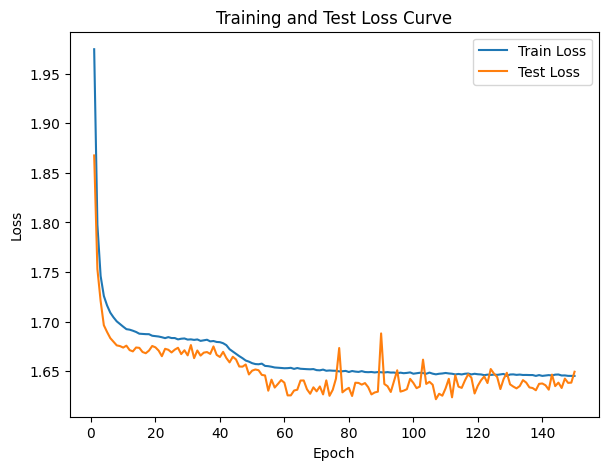

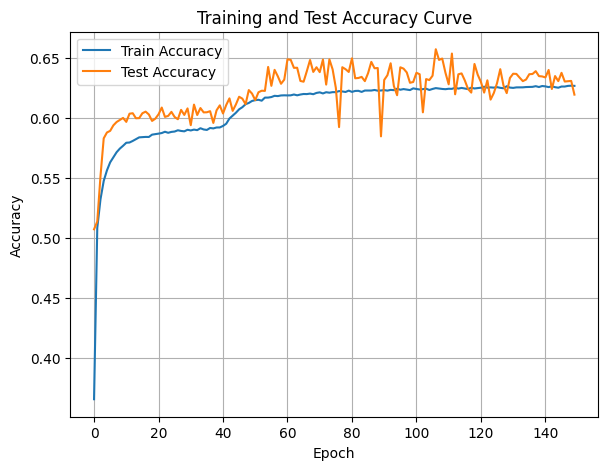

In [20]:
coverDTEmlp8b.train_single_model()

# Base 8 Increased Complextiy 20 epochs

In [24]:
hidden_layers = [100, 200, 100]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
coverDTEmlp8b20e = DeepTreeEnsemble(task_name='multi-classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=8,
                                epochs=20,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.00001)

In [25]:
coverDTEmlp8b20e.train_DTE()

Randomly initializing 8 models
Training Model with id 1


Training Process:   0%|          | 0/10 [00:13<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
coverDTEmlp8b20e.train_single_model()

## Base 16, 10 Epochs, 3 Trails

In [26]:
hidden_layers = [50, 100, 50]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
coverDTEmlp16b = DeepTreeEnsemble(task_name='multi-classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=16,
                                epochs=10,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.00001)

Randomly initializing 16 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:38<05:42, 38.06s/it]

Epoch [1/10], Train F1:0.3764175248832975, Train Loss: 1.9694, Train Acc: 0.3592, Test F1:0.406048252568071, Test Loss: 1.8388, Test Acc: 0.5058


Training Process:  20%|██        | 2/10 [01:19<05:20, 40.10s/it]

Epoch [2/10], Train F1:0.42264287182809, Train Loss: 1.8848, Train Acc: 0.4315, Test F1:0.4151824703640172, Test Loss: 1.7932, Test Acc: 0.5170


Training Process:  30%|███       | 3/10 [02:02<04:49, 41.34s/it]

Epoch [3/10], Train F1:0.44230168068719466, Train Loss: 1.8385, Train Acc: 0.4654, Test F1:0.44232773449325485, Test Loss: 1.7652, Test Acc: 0.5338


Training Process:  40%|████      | 4/10 [02:46<04:15, 42.55s/it]

Epoch [4/10], Train F1:0.4572307220258724, Train Loss: 1.8100, Train Acc: 0.4867, Test F1:0.4620984134056154, Test Loss: 1.7467, Test Acc: 0.5453


Training Process:  50%|█████     | 5/10 [03:31<03:35, 43.18s/it]

Epoch [5/10], Train F1:0.4700954077135142, Train Loss: 1.7899, Train Acc: 0.5024, Test F1:0.4738659282723899, Test Loss: 1.7339, Test Acc: 0.5526


Training Process:  60%|██████    | 6/10 [04:19<02:59, 44.80s/it]

Epoch [6/10], Train F1:0.48094970322189495, Train Loss: 1.7747, Train Acc: 0.5145, Test F1:0.4815881398824485, Test Loss: 1.7253, Test Acc: 0.5576


Training Process:  70%|███████   | 7/10 [05:19<02:29, 49.86s/it]

Epoch [7/10], Train F1:0.49001919389694015, Train Loss: 1.7628, Train Acc: 0.5242, Test F1:0.4911853214017953, Test Loss: 1.7180, Test Acc: 0.5631


Training Process:  80%|████████  | 8/10 [06:09<01:39, 49.88s/it]

Epoch [8/10], Train F1:0.4977467988107578, Train Loss: 1.7531, Train Acc: 0.5322, Test F1:0.502411061409009, Test Loss: 1.7106, Test Acc: 0.5697


Training Process:  90%|█████████ | 9/10 [07:00<00:50, 50.38s/it]

Epoch [9/10], Train F1:0.504267469124371, Train Loss: 1.7451, Train Acc: 0.5388, Test F1:0.5110825790292615, Test Loss: 1.7045, Test Acc: 0.5750


Training Process: 100%|██████████| 10/10 [07:53<00:00, 47.35s/it]


Epoch [10/10], Train F1:0.5098494391167494, Train Loss: 1.7383, Train Acc: 0.5444, Test F1:0.516228733987453, Test Loss: 1.7003, Test Acc: 0.5783
Total Epochs: 10
Train loss start: 2.094515562057495, Train loss end: 1.686340570449829
Highest Mean Train Accuracy (over epoch): 0.5444448274834359
Test loss start: 1.821908950805664, Test loss end: 1.6427953243255615
Highest mean Test Accuracy (over epoch): 0.578267467472595


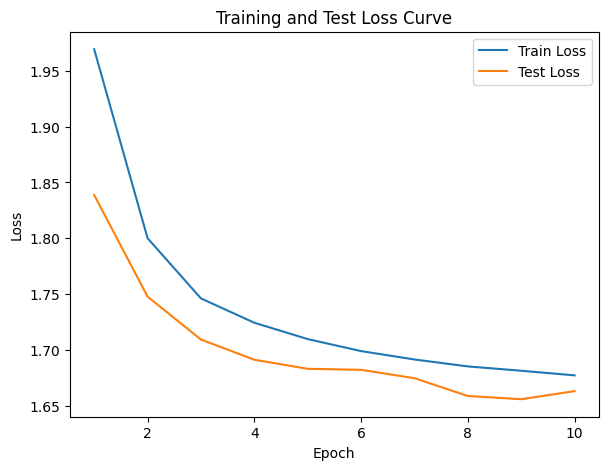

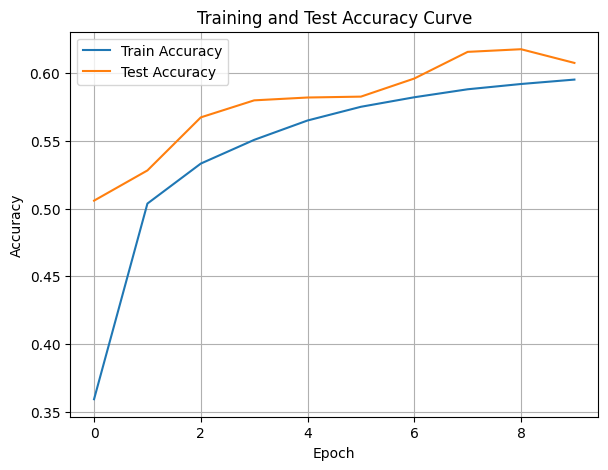

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:38<05:49, 38.85s/it]

Epoch [1/10], Train F1:0.380250028835536, Train Loss: 1.9676, Train Acc: 0.3584, Test F1:0.47069648076352916, Test Loss: 1.8478, Test Acc: 0.5134


Training Process:  20%|██        | 2/10 [01:19<05:20, 40.08s/it]

Epoch [2/10], Train F1:0.4324299968772738, Train Loss: 1.8799, Train Acc: 0.4358, Test F1:0.5006048811664123, Test Loss: 1.7897, Test Acc: 0.5446


Training Process:  30%|███       | 3/10 [02:01<04:47, 41.03s/it]

Epoch [3/10], Train F1:0.45408407173664894, Train Loss: 1.8328, Train Acc: 0.4711, Test F1:0.506083133306311, Test Loss: 1.7626, Test Acc: 0.5545


Training Process:  40%|████      | 4/10 [02:44<04:10, 41.75s/it]

Epoch [4/10], Train F1:0.46975444570233565, Train Loss: 1.8040, Train Acc: 0.4928, Test F1:0.5108885362100232, Test Loss: 1.7445, Test Acc: 0.5615


Training Process:  50%|█████     | 5/10 [03:30<03:35, 43.15s/it]

Epoch [5/10], Train F1:0.4829280774352933, Train Loss: 1.7839, Train Acc: 0.5085, Test F1:0.5131394788018111, Test Loss: 1.7332, Test Acc: 0.5655


Training Process:  60%|██████    | 6/10 [04:17<02:57, 44.36s/it]

Epoch [6/10], Train F1:0.4936033562658585, Train Loss: 1.7689, Train Acc: 0.5205, Test F1:0.5208510126245383, Test Loss: 1.7227, Test Acc: 0.5719


Training Process:  70%|███████   | 7/10 [05:05<02:17, 45.68s/it]

Epoch [7/10], Train F1:0.5022306467416444, Train Loss: 1.7573, Train Acc: 0.5300, Test F1:0.528963498428721, Test Loss: 1.7140, Test Acc: 0.5781


Training Process:  80%|████████  | 8/10 [05:56<01:34, 47.28s/it]

Epoch [8/10], Train F1:0.5091391064816926, Train Loss: 1.7479, Train Acc: 0.5376, Test F1:0.5358615348715868, Test Loss: 1.7067, Test Acc: 0.5832


Training Process:  90%|█████████ | 9/10 [06:48<00:48, 48.86s/it]

Epoch [9/10], Train F1:0.5149841835549963, Train Loss: 1.7402, Train Acc: 0.5440, Test F1:0.5433714674893826, Test Loss: 1.7001, Test Acc: 0.5887


Training Process: 100%|██████████| 10/10 [07:41<00:00, 46.15s/it]


Epoch [10/10], Train F1:0.5199369205574955, Train Loss: 1.7337, Train Acc: 0.5493, Test F1:0.550522719663959, Test Loss: 1.6941, Test Acc: 0.5938
Total Epochs: 10
Train loss start: 2.104689836502075, Train loss end: 1.6636557579040527
Highest Mean Train Accuracy (over epoch): 0.5493475114428964
Test loss start: 1.7974388599395752, Test loss end: 1.5975050926208496
Highest mean Test Accuracy (over epoch): 0.5938189926749309


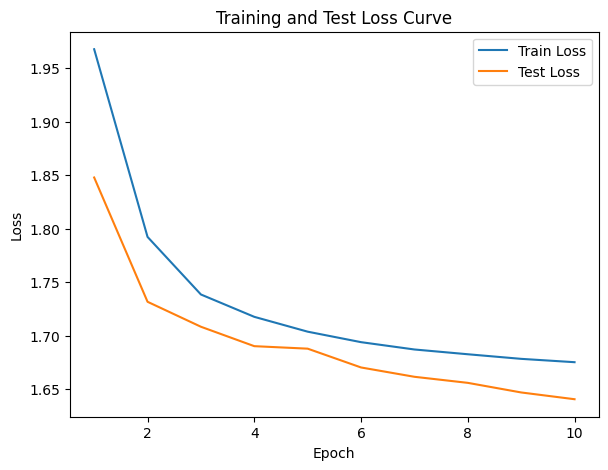

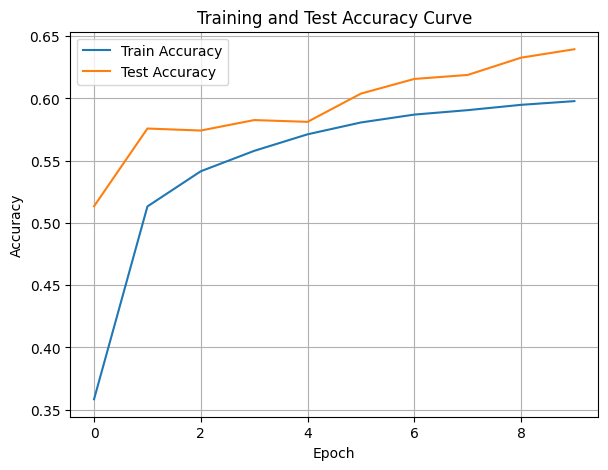

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:39<05:56, 39.61s/it]

Epoch [1/10], Train F1:0.3442128634242892, Train Loss: 2.0096, Train Acc: 0.3089, Test F1:0.34392065721612536, Test Loss: 1.8736, Test Acc: 0.4891


Training Process:  20%|██        | 2/10 [01:20<05:24, 40.54s/it]

Epoch [2/10], Train F1:0.4083020023936247, Train Loss: 1.9084, Train Acc: 0.4094, Test F1:0.3587622256057467, Test Loss: 1.8179, Test Acc: 0.4954


Training Process:  30%|███       | 3/10 [02:01<04:45, 40.72s/it]

Epoch [3/10], Train F1:0.43361974375548246, Train Loss: 1.8541, Train Acc: 0.4516, Test F1:0.38501984153914826, Test Loss: 1.7886, Test Acc: 0.5075


Training Process:  40%|████      | 4/10 [02:45<04:11, 41.93s/it]

Epoch [4/10], Train F1:0.4527355928618153, Train Loss: 1.8208, Train Acc: 0.4775, Test F1:0.4240974430587624, Test Loss: 1.7649, Test Acc: 0.5251


Training Process:  50%|█████     | 5/10 [03:30<03:34, 42.89s/it]

Epoch [5/10], Train F1:0.4681097187159169, Train Loss: 1.7979, Train Acc: 0.4957, Test F1:0.4550171877230624, Test Loss: 1.7469, Test Acc: 0.5397


Training Process:  60%|██████    | 6/10 [04:16<02:56, 44.10s/it]

Epoch [6/10], Train F1:0.48056828556941683, Train Loss: 1.7809, Train Acc: 0.5094, Test F1:0.4764487030244657, Test Loss: 1.7333, Test Acc: 0.5507


Training Process:  70%|███████   | 7/10 [05:03<02:15, 45.18s/it]

Epoch [7/10], Train F1:0.490512497808802, Train Loss: 1.7679, Train Acc: 0.5201, Test F1:0.4901568132277129, Test Loss: 1.7233, Test Acc: 0.5584


Training Process:  80%|████████  | 8/10 [05:53<01:33, 46.52s/it]

Epoch [8/10], Train F1:0.49866129504797596, Train Loss: 1.7574, Train Acc: 0.5287, Test F1:0.5019480186335181, Test Loss: 1.7148, Test Acc: 0.5653


Training Process:  90%|█████████ | 9/10 [06:45<00:48, 48.34s/it]

Epoch [9/10], Train F1:0.5054545349868217, Train Loss: 1.7488, Train Acc: 0.5359, Test F1:0.5104632591921626, Test Loss: 1.7081, Test Acc: 0.5705


Training Process: 100%|██████████| 10/10 [07:38<00:00, 45.89s/it]


Epoch [10/10], Train F1:0.5111142912675589, Train Loss: 1.7416, Train Acc: 0.5419, Test F1:0.5164134056674102, Test Loss: 1.7032, Test Acc: 0.5744
Total Epochs: 10
Train loss start: 2.1382851600646973, Train loss end: 1.6658626794815063
Highest Mean Train Accuracy (over epoch): 0.5418607257633914
Test loss start: 1.8745050430297852, Test loss end: 1.624762773513794
Highest mean Test Accuracy (over epoch): 0.574400776207612


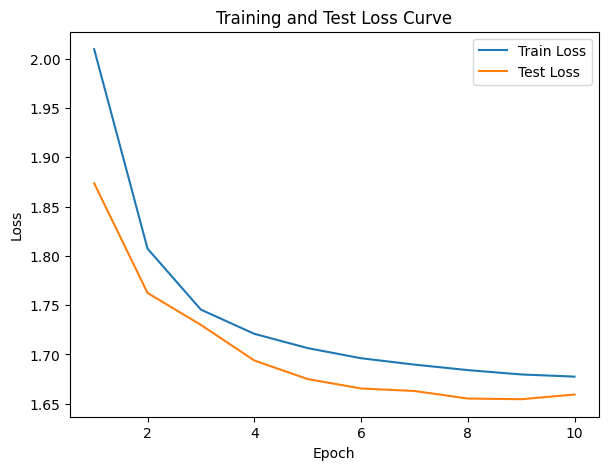

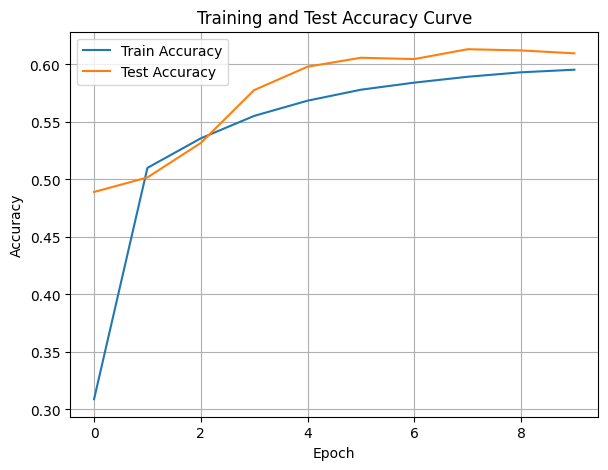

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:39<05:57, 39.72s/it]

Epoch [1/10], Train F1:0.3661823199864158, Train Loss: 1.9771, Train Acc: 0.3610, Test F1:0.3265055140054269, Test Loss: 1.8439, Test Acc: 0.4827


Training Process:  20%|██        | 2/10 [01:19<05:20, 40.04s/it]

Epoch [2/10], Train F1:0.41230562876477356, Train Loss: 1.8866, Train Acc: 0.4350, Test F1:0.3385281602301313, Test Loss: 1.8011, Test Acc: 0.4903


Training Process:  30%|███       | 3/10 [02:02<04:48, 41.17s/it]

Epoch [3/10], Train F1:0.4356649240964296, Train Loss: 1.8391, Train Acc: 0.4679, Test F1:0.3865332097896921, Test Loss: 1.7729, Test Acc: 0.5107


Training Process:  40%|████      | 4/10 [02:45<04:12, 42.04s/it]

Epoch [4/10], Train F1:0.4542195421572895, Train Loss: 1.8100, Train Acc: 0.4887, Test F1:0.4284169997449834, Test Loss: 1.7531, Test Acc: 0.5295


Training Process:  50%|█████     | 5/10 [03:31<03:36, 43.34s/it]

Epoch [5/10], Train F1:0.4690044517365952, Train Loss: 1.7898, Train Acc: 0.5038, Test F1:0.4591697142992392, Test Loss: 1.7370, Test Acc: 0.5444


Training Process:  60%|██████    | 6/10 [04:16<02:56, 44.04s/it]

Epoch [6/10], Train F1:0.48056598789902644, Train Loss: 1.7748, Train Acc: 0.5154, Test F1:0.477547532960573, Test Loss: 1.7256, Test Acc: 0.5545


Training Process:  70%|███████   | 7/10 [05:06<02:17, 45.98s/it]

Epoch [7/10], Train F1:0.48992194141583095, Train Loss: 1.7631, Train Acc: 0.5245, Test F1:0.49590699290974766, Test Loss: 1.7152, Test Acc: 0.5646


Training Process:  80%|████████  | 8/10 [06:07<01:41, 50.68s/it]

Epoch [8/10], Train F1:0.4976909821700314, Train Loss: 1.7537, Train Acc: 0.5322, Test F1:0.5095077423094749, Test Loss: 1.7070, Test Acc: 0.5728


Training Process:  90%|█████████ | 9/10 [06:58<00:50, 50.68s/it]

Epoch [9/10], Train F1:0.5040854068871098, Train Loss: 1.7459, Train Acc: 0.5385, Test F1:0.5189707592786452, Test Loss: 1.7002, Test Acc: 0.5790


Training Process: 100%|██████████| 10/10 [07:52<00:00, 47.22s/it]


Epoch [10/10], Train F1:0.5096420746502665, Train Loss: 1.7392, Train Acc: 0.5439, Test F1:0.5263228347081959, Test Loss: 1.6949, Test Acc: 0.5839
Total Epochs: 10
Train loss start: 2.103834390640259, Train loss end: 1.6222654581069946
Highest Mean Train Accuracy (over epoch): 0.5439404071085321
Test loss start: 1.8594484329223633, Test loss end: 1.6426029205322266
Highest mean Test Accuracy (over epoch): 0.5838660789750025


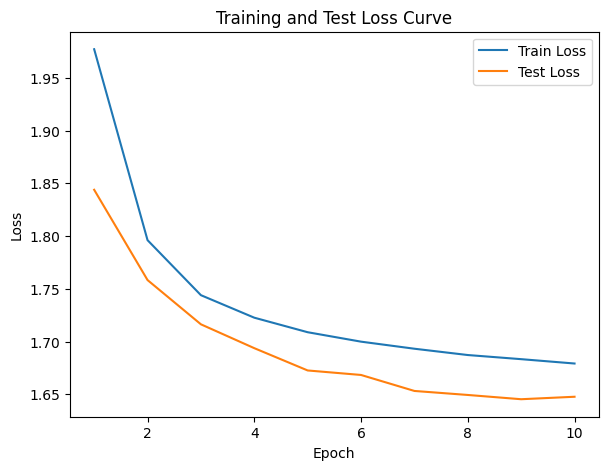

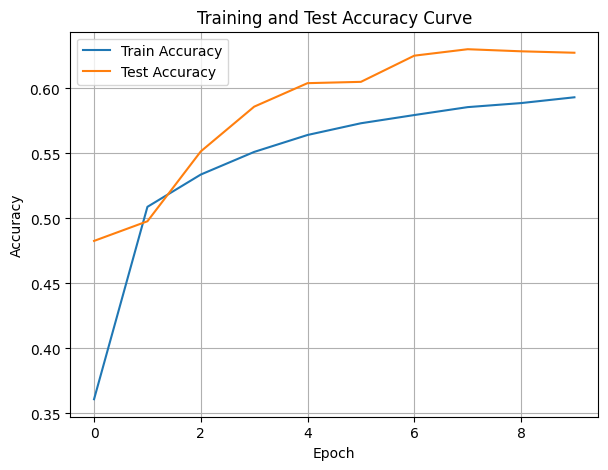

./saved_models/model_4.pth
Training Model with id 5


Training Process:  10%|█         | 1/10 [00:39<05:54, 39.38s/it]

Epoch [1/10], Train F1:0.35631317107947125, Train Loss: 1.9369, Train Acc: 0.3853, Test F1:0.46564449398655894, Test Loss: 1.8063, Test Acc: 0.5453


Training Process:  20%|██        | 2/10 [01:19<05:19, 39.96s/it]

Epoch [2/10], Train F1:0.42734100351074217, Train Loss: 1.8599, Train Acc: 0.4495, Test F1:0.4622510931070806, Test Loss: 1.7694, Test Acc: 0.5475


Training Process:  30%|███       | 3/10 [02:02<04:48, 41.21s/it]

Epoch [3/10], Train F1:0.4500019015456225, Train Loss: 1.8189, Train Acc: 0.4799, Test F1:0.4690158046710463, Test Loss: 1.7498, Test Acc: 0.5530


Training Process:  40%|████      | 4/10 [02:47<04:15, 42.65s/it]

Epoch [4/10], Train F1:0.46298882436499655, Train Loss: 1.7938, Train Acc: 0.4987, Test F1:0.47402858188532115, Test Loss: 1.7373, Test Acc: 0.5566


Training Process:  50%|█████     | 5/10 [03:34<03:41, 44.29s/it]

Epoch [5/10], Train F1:0.4719345846972243, Train Loss: 1.7771, Train Acc: 0.5114, Test F1:0.4767766979294789, Test Loss: 1.7303, Test Acc: 0.5587


Training Process:  60%|██████    | 6/10 [04:22<03:01, 45.48s/it]

Epoch [6/10], Train F1:0.47899746782111385, Train Loss: 1.7649, Train Acc: 0.5208, Test F1:0.4797468214433224, Test Loss: 1.7240, Test Acc: 0.5607


Training Process:  70%|███████   | 7/10 [05:10<02:19, 46.42s/it]

Epoch [7/10], Train F1:0.4855878990725302, Train Loss: 1.7552, Train Acc: 0.5285, Test F1:0.48155976681624285, Test Loss: 1.7196, Test Acc: 0.5620


Training Process:  80%|████████  | 8/10 [05:59<01:34, 47.13s/it]

Epoch [8/10], Train F1:0.4923515405405709, Train Loss: 1.7472, Train Acc: 0.5350, Test F1:0.4872319287777837, Test Loss: 1.7146, Test Acc: 0.5650


Training Process:  90%|█████████ | 9/10 [06:51<00:48, 48.78s/it]

Epoch [9/10], Train F1:0.4990522270562611, Train Loss: 1.7404, Train Acc: 0.5407, Test F1:0.4901451395010113, Test Loss: 1.7112, Test Acc: 0.5665


Training Process: 100%|██████████| 10/10 [07:44<00:00, 46.46s/it]


Epoch [10/10], Train F1:0.5051722870415943, Train Loss: 1.7345, Train Acc: 0.5457, Test F1:0.4927790904794265, Test Loss: 1.7082, Test Acc: 0.5679
Total Epochs: 10
Train loss start: 2.0816407203674316, Train loss end: 1.6009852886199951
Highest Mean Train Accuracy (over epoch): 0.5457197753901332
Test loss start: 1.7900410890579224, Test loss end: 1.6563174724578857
Highest mean Test Accuracy (over epoch): 0.5678839898575965


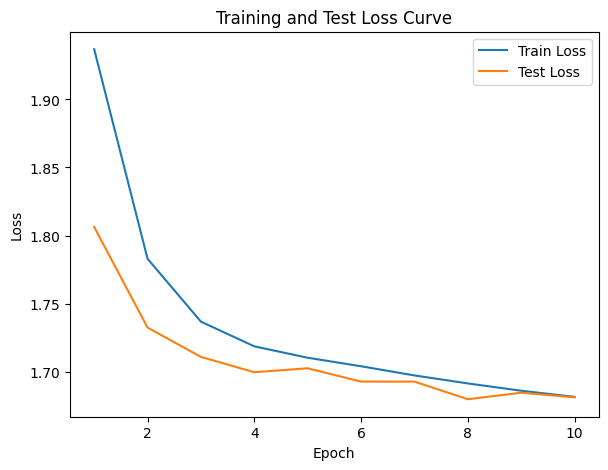

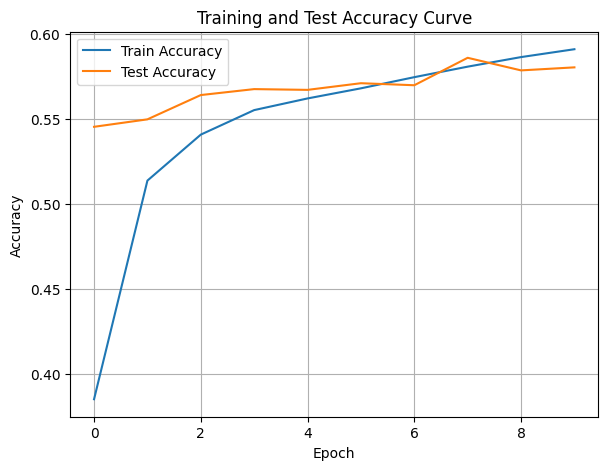

./saved_models/model_5.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:38<05:48, 38.75s/it]

Epoch [1/10], Train F1:0.35052196868908236, Train Loss: 1.9879, Train Acc: 0.3359, Test F1:0.36538146029742496, Test Loss: 1.8738, Test Acc: 0.4817


Training Process:  20%|██        | 2/10 [01:20<05:22, 40.29s/it]

Epoch [2/10], Train F1:0.40662706406939836, Train Loss: 1.9061, Train Acc: 0.4057, Test F1:0.3640648356765989, Test Loss: 1.8247, Test Acc: 0.4876


Training Process:  30%|███       | 3/10 [02:03<04:51, 41.60s/it]

Epoch [3/10], Train F1:0.4359519067728951, Train Loss: 1.8568, Train Acc: 0.4446, Test F1:0.3745071943112587, Test Loss: 1.7982, Test Acc: 0.4951


Training Process:  40%|████      | 4/10 [02:47<04:15, 42.57s/it]

Epoch [4/10], Train F1:0.4550042503518165, Train Loss: 1.8245, Train Acc: 0.4705, Test F1:0.3871960845236502, Test Loss: 1.7809, Test Acc: 0.5032


Training Process:  50%|█████     | 5/10 [03:32<03:37, 43.49s/it]

Epoch [5/10], Train F1:0.469136766746939, Train Loss: 1.8019, Train Acc: 0.4890, Test F1:0.4030003074119685, Test Loss: 1.7675, Test Acc: 0.5125


Training Process:  60%|██████    | 6/10 [04:19<02:58, 44.55s/it]

Epoch [6/10], Train F1:0.4802512752948476, Train Loss: 1.7851, Train Acc: 0.5028, Test F1:0.42332971274289516, Test Loss: 1.7546, Test Acc: 0.5237


Training Process:  70%|███████   | 7/10 [05:06<02:16, 45.40s/it]

Epoch [7/10], Train F1:0.4896425667522022, Train Loss: 1.7718, Train Acc: 0.5141, Test F1:0.4419485271877924, Test Loss: 1.7432, Test Acc: 0.5337


Training Process:  80%|████████  | 8/10 [05:55<01:33, 46.56s/it]

Epoch [8/10], Train F1:0.4975424426851955, Train Loss: 1.7609, Train Acc: 0.5233, Test F1:0.45374889372726773, Test Loss: 1.7351, Test Acc: 0.5407


Training Process:  90%|█████████ | 9/10 [06:46<00:48, 48.11s/it]

Epoch [9/10], Train F1:0.5041691202862749, Train Loss: 1.7520, Train Acc: 0.5310, Test F1:0.4635415802716207, Test Loss: 1.7281, Test Acc: 0.5465


Training Process: 100%|██████████| 10/10 [07:38<00:00, 45.89s/it]


Epoch [10/10], Train F1:0.5098739580209762, Train Loss: 1.7445, Train Acc: 0.5375, Test F1:0.4737606781822285, Test Loss: 1.7215, Test Acc: 0.5526
Total Epochs: 10
Train loss start: 2.1054468154907227, Train loss end: 1.6646977663040161
Highest Mean Train Accuracy (over epoch): 0.5374836237713368
Test loss start: 1.8664482831954956, Test loss end: 1.6230307817459106
Highest mean Test Accuracy (over epoch): 0.552607815061213


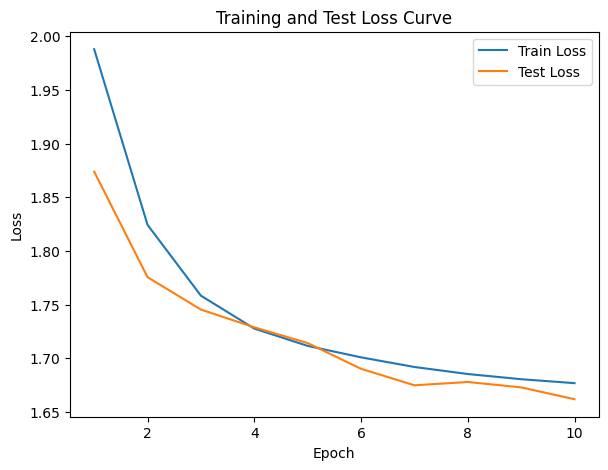

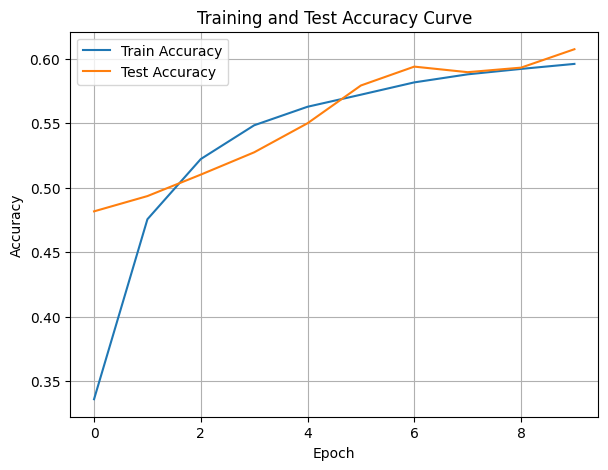

./saved_models/model_6.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:38<05:49, 38.88s/it]

Epoch [1/10], Train F1:0.25237939640352663, Train Loss: 1.9898, Train Acc: 0.3057, Test F1:0.22289511899178963, Test Loss: 1.8870, Test Acc: 0.3726


Training Process:  20%|██        | 2/10 [01:19<05:21, 40.18s/it]

Epoch [2/10], Train F1:0.36576845173966455, Train Loss: 1.9073, Train Acc: 0.3871, Test F1:0.4173852651291682, Test Loss: 1.8297, Test Acc: 0.4706


Training Process:  30%|███       | 3/10 [02:02<04:47, 41.08s/it]

Epoch [3/10], Train F1:0.4264117501876496, Train Loss: 1.8563, Train Acc: 0.4357, Test F1:0.4731003536582269, Test Loss: 1.7921, Test Acc: 0.5111


Training Process:  40%|████      | 4/10 [02:44<04:09, 41.60s/it]

Epoch [4/10], Train F1:0.4531608288996957, Train Loss: 1.8238, Train Acc: 0.4648, Test F1:0.5018025985912561, Test Loss: 1.7654, Test Acc: 0.5358


Training Process:  50%|█████     | 5/10 [03:33<03:41, 44.30s/it]

Epoch [5/10], Train F1:0.47020543606757104, Train Loss: 1.8012, Train Acc: 0.4850, Test F1:0.5178897202426375, Test Loss: 1.7468, Test Acc: 0.5513


Training Process:  60%|██████    | 6/10 [04:20<03:00, 45.02s/it]

Epoch [6/10], Train F1:0.4827350993252086, Train Loss: 1.7842, Train Acc: 0.5000, Test F1:0.5307996815166922, Test Loss: 1.7322, Test Acc: 0.5639


Training Process:  70%|███████   | 7/10 [05:06<02:16, 45.59s/it]

Epoch [7/10], Train F1:0.49259921139840646, Train Loss: 1.7710, Train Acc: 0.5117, Test F1:0.5398677689479149, Test Loss: 1.7214, Test Acc: 0.5734


Training Process:  80%|████████  | 8/10 [05:55<01:32, 46.47s/it]

Epoch [8/10], Train F1:0.500548150858472, Train Loss: 1.7604, Train Acc: 0.5212, Test F1:0.5459733713038287, Test Loss: 1.7131, Test Acc: 0.5800


Training Process:  90%|█████████ | 9/10 [06:45<00:47, 47.54s/it]

Epoch [9/10], Train F1:0.5071853885815844, Train Loss: 1.7515, Train Acc: 0.5291, Test F1:0.552238871079371, Test Loss: 1.7052, Test Acc: 0.5861


Training Process: 100%|██████████| 10/10 [07:36<00:00, 45.64s/it]


Epoch [10/10], Train F1:0.5126454133389363, Train Loss: 1.7442, Train Acc: 0.5356, Test F1:0.5576712782894964, Test Loss: 1.6984, Test Acc: 0.5915
Total Epochs: 10
Train loss start: 2.111133337020874, Train loss end: 1.705980658531189
Highest Mean Train Accuracy (over epoch): 0.535610809717143
Test loss start: 1.8252556324005127, Test loss end: 1.6345454454421997
Highest mean Test Accuracy (over epoch): 0.5914928109952874


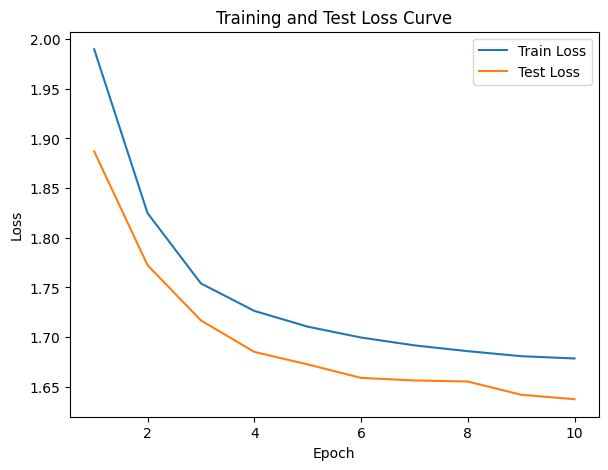

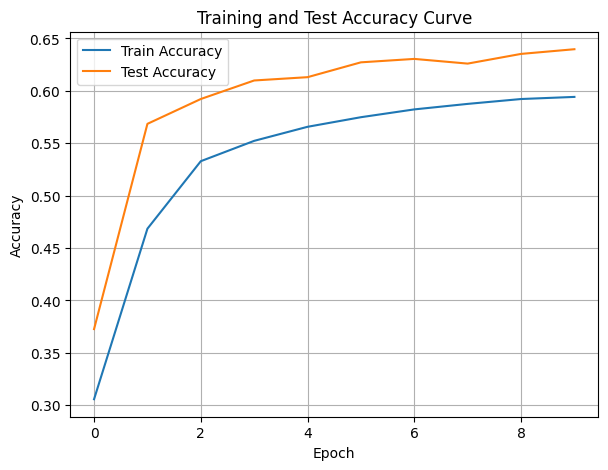

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:36<05:27, 36.41s/it]

Epoch [1/10], Train F1:0.3816359367030996, Train Loss: 1.9561, Train Acc: 0.3728, Test F1:0.3992777655857964, Test Loss: 1.8385, Test Acc: 0.5061


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.08s/it]

Epoch [2/10], Train F1:0.420793252106638, Train Loss: 1.8712, Train Acc: 0.4448, Test F1:0.40877031197055125, Test Loss: 1.7947, Test Acc: 0.5122


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.61s/it]

Epoch [3/10], Train F1:0.44201324268808667, Train Loss: 1.8273, Train Acc: 0.4765, Test F1:0.4251766180743151, Test Loss: 1.7712, Test Acc: 0.5212


Training Process:  40%|████      | 4/10 [02:39<04:04, 40.71s/it]

Epoch [4/10], Train F1:0.45889099839634045, Train Loss: 1.8004, Train Acc: 0.4963, Test F1:0.45119241456765863, Test Loss: 1.7534, Test Acc: 0.5346


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.58s/it]

Epoch [5/10], Train F1:0.47268111973785665, Train Loss: 1.7817, Train Acc: 0.5104, Test F1:0.46819675816249684, Test Loss: 1.7405, Test Acc: 0.5442


Training Process:  60%|██████    | 6/10 [04:08<02:52, 43.01s/it]

Epoch [6/10], Train F1:0.48365742186609906, Train Loss: 1.7679, Train Acc: 0.5211, Test F1:0.4807882515172641, Test Loss: 1.7305, Test Acc: 0.5515


Training Process:  70%|███████   | 7/10 [04:56<02:13, 44.56s/it]

Epoch [7/10], Train F1:0.49290262922725747, Train Loss: 1.7569, Train Acc: 0.5299, Test F1:0.4938073232283748, Test Loss: 1.7214, Test Acc: 0.5592


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.86s/it]

Epoch [8/10], Train F1:0.50038167323262, Train Loss: 1.7481, Train Acc: 0.5370, Test F1:0.505898689996413, Test Loss: 1.7135, Test Acc: 0.5667


Training Process:  90%|█████████ | 9/10 [06:36<00:47, 47.62s/it]

Epoch [9/10], Train F1:0.5067215924266208, Train Loss: 1.7407, Train Acc: 0.5430, Test F1:0.5146720275563422, Test Loss: 1.7066, Test Acc: 0.5724


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.81s/it]


Epoch [10/10], Train F1:0.5121669504233599, Train Loss: 1.7345, Train Acc: 0.5482, Test F1:0.5216200612318375, Test Loss: 1.7010, Test Acc: 0.5772
Total Epochs: 10
Train loss start: 2.075246572494507, Train loss end: 1.661378264427185
Highest Mean Train Accuracy (over epoch): 0.5481716656928031
Test loss start: 1.8052868843078613, Test loss end: 1.5939098596572876
Highest mean Test Accuracy (over epoch): 0.5771692473555476


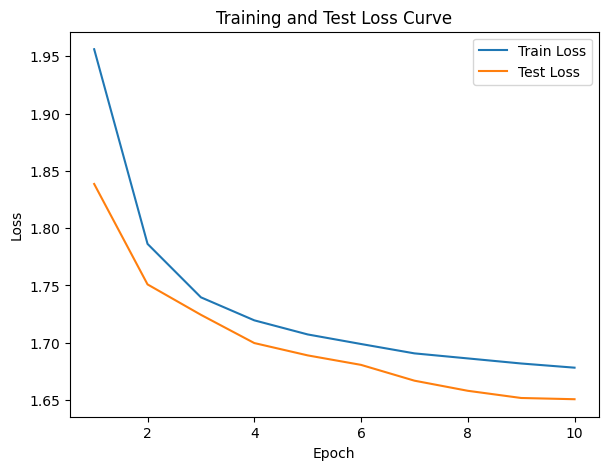

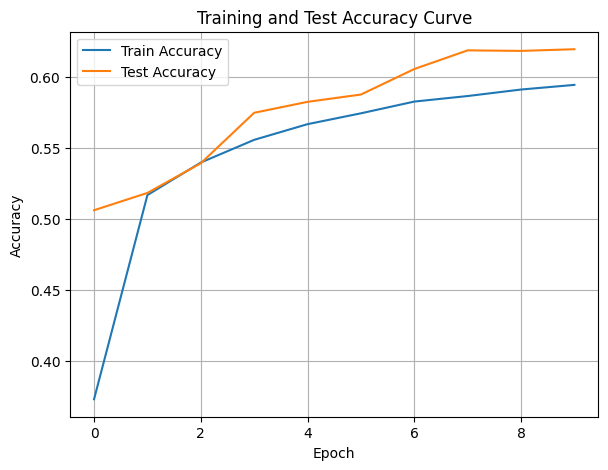

./saved_models/model_8.pth
Training Model with id 9


Training Process:  10%|█         | 1/10 [00:38<05:42, 38.05s/it]

Epoch [1/10], Train F1:0.37537617796626804, Train Loss: 1.9706, Train Acc: 0.3433, Test F1:0.41122988153751744, Test Loss: 1.8225, Test Acc: 0.5164


Training Process:  20%|██        | 2/10 [01:17<05:12, 39.02s/it]

Epoch [2/10], Train F1:0.4259415823398465, Train Loss: 1.8837, Train Acc: 0.4286, Test F1:0.3991023589664503, Test Loss: 1.7880, Test Acc: 0.5139


Training Process:  30%|███       | 3/10 [01:59<04:41, 40.18s/it]

Epoch [3/10], Train F1:0.44810317050750886, Train Loss: 1.8360, Train Acc: 0.4668, Test F1:0.4268138441292326, Test Loss: 1.7652, Test Acc: 0.5284


Training Process:  40%|████      | 4/10 [02:42<04:07, 41.25s/it]

Epoch [4/10], Train F1:0.4651013850496046, Train Loss: 1.8063, Train Acc: 0.4902, Test F1:0.44620208123825095, Test Loss: 1.7476, Test Acc: 0.5393


Training Process:  50%|█████     | 5/10 [03:25<03:29, 41.83s/it]

Epoch [5/10], Train F1:0.47854303434243484, Train Loss: 1.7859, Train Acc: 0.5064, Test F1:0.46235523088443875, Test Loss: 1.7347, Test Acc: 0.5482


Training Process:  60%|██████    | 6/10 [04:11<02:53, 43.30s/it]

Epoch [6/10], Train F1:0.4894690483225038, Train Loss: 1.7707, Train Acc: 0.5186, Test F1:0.4732626513797377, Test Loss: 1.7259, Test Acc: 0.5545


Training Process:  70%|███████   | 7/10 [04:57<02:13, 44.35s/it]

Epoch [7/10], Train F1:0.4983684209487197, Train Loss: 1.7588, Train Acc: 0.5283, Test F1:0.48350367831672336, Test Loss: 1.7186, Test Acc: 0.5601


Training Process:  80%|████████  | 8/10 [05:45<01:30, 45.45s/it]

Epoch [8/10], Train F1:0.5057383190252356, Train Loss: 1.7492, Train Acc: 0.5362, Test F1:0.49189411357151325, Test Loss: 1.7123, Test Acc: 0.5649


Training Process:  90%|█████████ | 9/10 [06:34<00:46, 46.59s/it]

Epoch [9/10], Train F1:0.5120018803827644, Train Loss: 1.7413, Train Acc: 0.5428, Test F1:0.5009412849606723, Test Loss: 1.7067, Test Acc: 0.5700


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.64s/it]


Epoch [10/10], Train F1:0.5171916449473796, Train Loss: 1.7347, Train Acc: 0.5483, Test F1:0.5071071868377347, Test Loss: 1.7022, Test Acc: 0.5736
Total Epochs: 10
Train loss start: 2.097604274749756, Train loss end: 1.6330732107162476
Highest Mean Train Accuracy (over epoch): 0.548310147405997
Test loss start: 1.7887238264083862, Test loss end: 1.6578114032745361
Highest mean Test Accuracy (over epoch): 0.5736487800622375


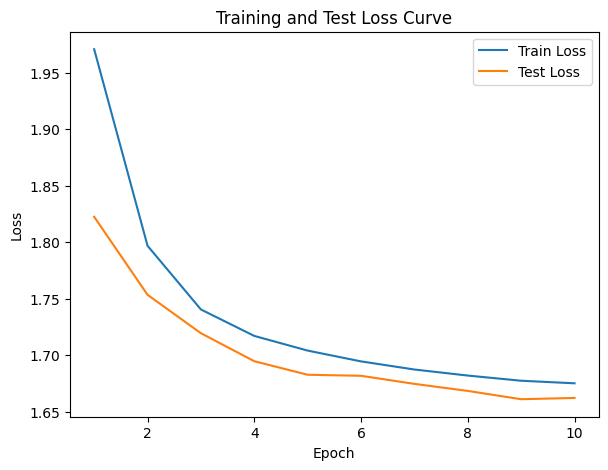

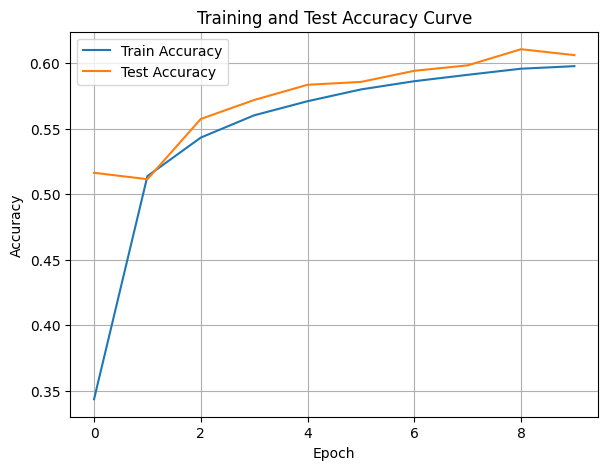

./saved_models/model_9.pth
Training Model with id 10


Training Process:  10%|█         | 1/10 [00:38<05:43, 38.22s/it]

Epoch [1/10], Train F1:0.4026012211100949, Train Loss: 1.9592, Train Acc: 0.3816, Test F1:0.3991421311004798, Test Loss: 1.8394, Test Acc: 0.5112


Training Process:  20%|██        | 2/10 [01:18<05:14, 39.26s/it]

Epoch [2/10], Train F1:0.4468267997759399, Train Loss: 1.8721, Train Acc: 0.4524, Test F1:0.42647486624088576, Test Loss: 1.7883, Test Acc: 0.5270


Training Process:  30%|███       | 3/10 [01:59<04:40, 40.01s/it]

Epoch [3/10], Train F1:0.4659105497148932, Train Loss: 1.8257, Train Acc: 0.4843, Test F1:0.4488479784303984, Test Loss: 1.7612, Test Acc: 0.5396


Training Process:  40%|████      | 4/10 [02:41<04:06, 41.03s/it]

Epoch [4/10], Train F1:0.4793686120211756, Train Loss: 1.7978, Train Acc: 0.5037, Test F1:0.46101296497276356, Test Loss: 1.7454, Test Acc: 0.5470


Training Process:  50%|█████     | 5/10 [03:24<03:28, 41.80s/it]

Epoch [5/10], Train F1:0.4900853397959499, Train Loss: 1.7786, Train Acc: 0.5174, Test F1:0.47546019079525553, Test Loss: 1.7320, Test Acc: 0.5547


Training Process:  60%|██████    | 6/10 [04:10<02:52, 43.09s/it]

Epoch [6/10], Train F1:0.4990619727723685, Train Loss: 1.7644, Train Acc: 0.5279, Test F1:0.4889267215201048, Test Loss: 1.7215, Test Acc: 0.5622


Training Process:  70%|███████   | 7/10 [04:57<02:13, 44.45s/it]

Epoch [7/10], Train F1:0.5063212537928902, Train Loss: 1.7534, Train Acc: 0.5362, Test F1:0.502016823090804, Test Loss: 1.7125, Test Acc: 0.5695


Training Process:  80%|████████  | 8/10 [05:47<01:32, 46.06s/it]

Epoch [8/10], Train F1:0.5123715173277273, Train Loss: 1.7446, Train Acc: 0.5429, Test F1:0.5107626043527672, Test Loss: 1.7055, Test Acc: 0.5748


Training Process:  90%|█████████ | 9/10 [06:36<00:47, 47.10s/it]

Epoch [9/10], Train F1:0.5175952734730369, Train Loss: 1.7372, Train Acc: 0.5486, Test F1:0.5177010242104485, Test Loss: 1.6999, Test Acc: 0.5791


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.87s/it]


Epoch [10/10], Train F1:0.5221064607456057, Train Loss: 1.7310, Train Acc: 0.5535, Test F1:0.5262640288346206, Test Loss: 1.6945, Test Acc: 0.5843
Total Epochs: 10
Train loss start: 2.1045002937316895, Train loss end: 1.6987961530685425
Highest Mean Train Accuracy (over epoch): 0.5534564126813822
Test loss start: 1.8183766603469849, Test loss end: 1.6067500114440918
Highest mean Test Accuracy (over epoch): 0.5843034261026021


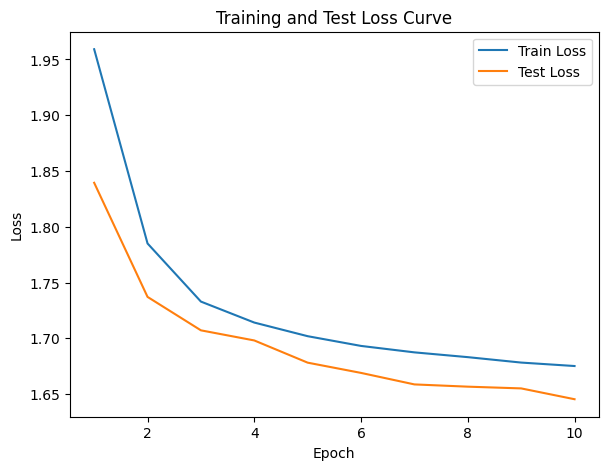

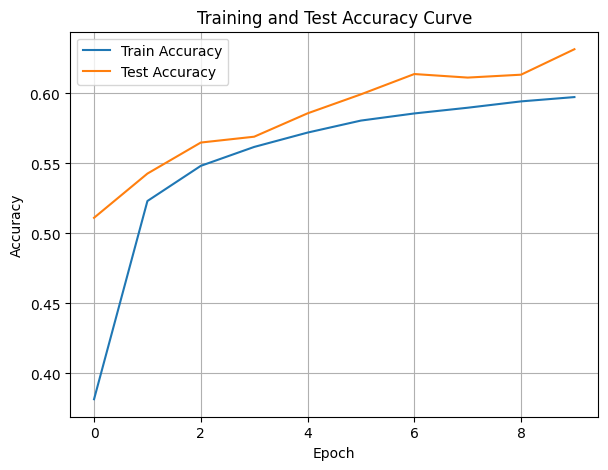

./saved_models/model_10.pth
Training Model with id 11


Training Process:  10%|█         | 1/10 [00:36<05:29, 36.65s/it]

Epoch [1/10], Train F1:0.37461907243167836, Train Loss: 1.9713, Train Acc: 0.3473, Test F1:0.42294778218528006, Test Loss: 1.8593, Test Acc: 0.5047


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.11s/it]

Epoch [2/10], Train F1:0.42110778830440815, Train Loss: 1.8865, Train Acc: 0.4256, Test F1:0.41137658241735015, Test Loss: 1.8084, Test Acc: 0.5100


Training Process:  30%|███       | 3/10 [01:57<04:36, 39.56s/it]

Epoch [3/10], Train F1:0.4403755985673079, Train Loss: 1.8407, Train Acc: 0.4608, Test F1:0.42055815866019036, Test Loss: 1.7816, Test Acc: 0.5191


Training Process:  40%|████      | 4/10 [02:39<04:04, 40.70s/it]

Epoch [4/10], Train F1:0.45562177033486806, Train Loss: 1.8122, Train Acc: 0.4828, Test F1:0.4338932711262754, Test Loss: 1.7643, Test Acc: 0.5282


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.59s/it]

Epoch [5/10], Train F1:0.46867326998601844, Train Loss: 1.7921, Train Acc: 0.4988, Test F1:0.4492500841020626, Test Loss: 1.7509, Test Acc: 0.5371


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.93s/it]

Epoch [6/10], Train F1:0.479804092871575, Train Loss: 1.7769, Train Acc: 0.5113, Test F1:0.46121751426296803, Test Loss: 1.7408, Test Acc: 0.5442


Training Process:  70%|███████   | 7/10 [04:56<02:14, 44.79s/it]

Epoch [7/10], Train F1:0.4891112936899266, Train Loss: 1.7649, Train Acc: 0.5213, Test F1:0.47447687701896296, Test Loss: 1.7320, Test Acc: 0.5516


Training Process:  80%|████████  | 8/10 [05:45<01:32, 46.13s/it]

Epoch [8/10], Train F1:0.4970066091104857, Train Loss: 1.7550, Train Acc: 0.5296, Test F1:0.48242947821629084, Test Loss: 1.7252, Test Acc: 0.5564


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.11s/it]

Epoch [9/10], Train F1:0.5036825158679611, Train Loss: 1.7468, Train Acc: 0.5365, Test F1:0.4908902838788249, Test Loss: 1.7192, Test Acc: 0.5613


Training Process: 100%|██████████| 10/10 [07:27<00:00, 44.75s/it]


Epoch [10/10], Train F1:0.5094302987330338, Train Loss: 1.7399, Train Acc: 0.5425, Test F1:0.4997472754402551, Test Loss: 1.7133, Test Acc: 0.5666
Total Epochs: 10
Train loss start: 2.0975425243377686, Train loss end: 1.6085147857666016
Highest Mean Train Accuracy (over epoch): 0.5424790766262682
Test loss start: 1.8463410139083862, Test loss end: 1.6165411472320557
Highest mean Test Accuracy (over epoch): 0.5666195310098863


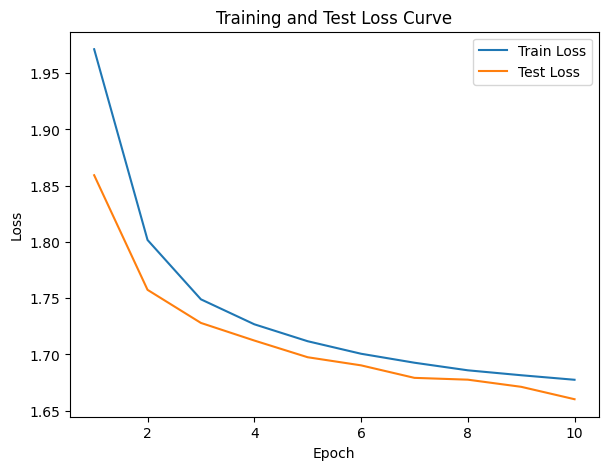

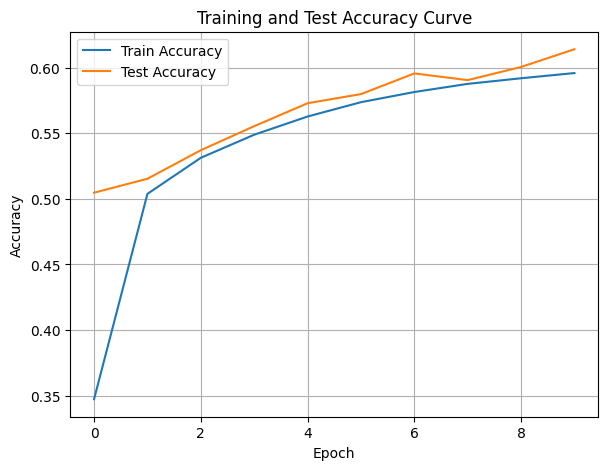

./saved_models/model_11.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:38<05:44, 38.31s/it]

Epoch [1/10], Train F1:0.38935147985664226, Train Loss: 1.9430, Train Acc: 0.3886, Test F1:0.3827105619114934, Test Loss: 1.8088, Test Acc: 0.5000


Training Process:  20%|██        | 2/10 [01:17<05:12, 39.10s/it]

Epoch [2/10], Train F1:0.43335135079741094, Train Loss: 1.8645, Train Acc: 0.4498, Test F1:0.3920349140841798, Test Loss: 1.7813, Test Acc: 0.5060


Training Process:  30%|███       | 3/10 [01:58<04:39, 39.86s/it]

Epoch [3/10], Train F1:0.45110765274497217, Train Loss: 1.8231, Train Acc: 0.4788, Test F1:0.40015862405859115, Test Loss: 1.7667, Test Acc: 0.5122


Training Process:  40%|████      | 4/10 [02:41<04:06, 41.12s/it]

Epoch [4/10], Train F1:0.46223937411466404, Train Loss: 1.7980, Train Acc: 0.4968, Test F1:0.4268492161099204, Test Loss: 1.7515, Test Acc: 0.5262


Training Process:  50%|█████     | 5/10 [03:24<03:28, 41.79s/it]

Epoch [5/10], Train F1:0.4702655619842893, Train Loss: 1.7812, Train Acc: 0.5091, Test F1:0.4406676323007819, Test Loss: 1.7416, Test Acc: 0.5344


Training Process:  60%|██████    | 6/10 [04:12<02:55, 43.80s/it]

Epoch [6/10], Train F1:0.47667434286372307, Train Loss: 1.7690, Train Acc: 0.5183, Test F1:0.45421003438153285, Test Loss: 1.7334, Test Acc: 0.5421


Training Process:  70%|███████   | 7/10 [05:01<02:16, 45.41s/it]

Epoch [7/10], Train F1:0.48171732477806617, Train Loss: 1.7598, Train Acc: 0.5253, Test F1:0.46499344479654203, Test Loss: 1.7268, Test Acc: 0.5484


Training Process:  80%|████████  | 8/10 [05:51<01:33, 46.98s/it]

Epoch [8/10], Train F1:0.48597511224042433, Train Loss: 1.7524, Train Acc: 0.5310, Test F1:0.4715224041956643, Test Loss: 1.7221, Test Acc: 0.5525


Training Process:  90%|█████████ | 9/10 [06:42<00:48, 48.15s/it]

Epoch [9/10], Train F1:0.4895397565054009, Train Loss: 1.7464, Train Acc: 0.5357, Test F1:0.4789843433870871, Test Loss: 1.7174, Test Acc: 0.5571


Training Process: 100%|██████████| 10/10 [07:34<00:00, 45.46s/it]


Epoch [10/10], Train F1:0.49267669407266934, Train Loss: 1.7413, Train Acc: 0.5397, Test F1:0.4827602697080582, Test Loss: 1.7144, Test Acc: 0.5597
Total Epochs: 10
Train loss start: 2.057347536087036, Train loss end: 1.7656289339065552
Highest Mean Train Accuracy (over epoch): 0.5397292397064306
Test loss start: 1.803697943687439, Test loss end: 1.6419509649276733
Highest mean Test Accuracy (over epoch): 0.5596515309650651


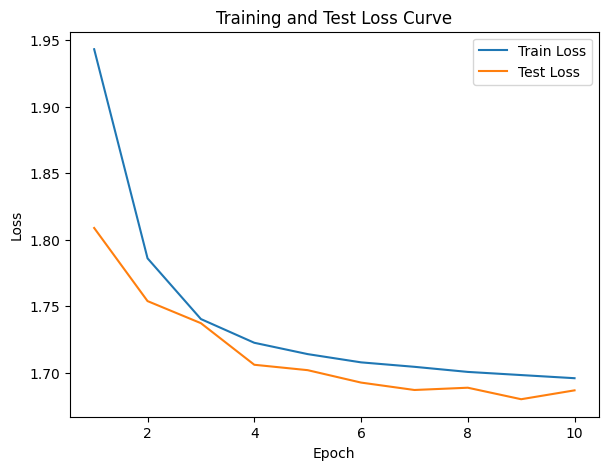

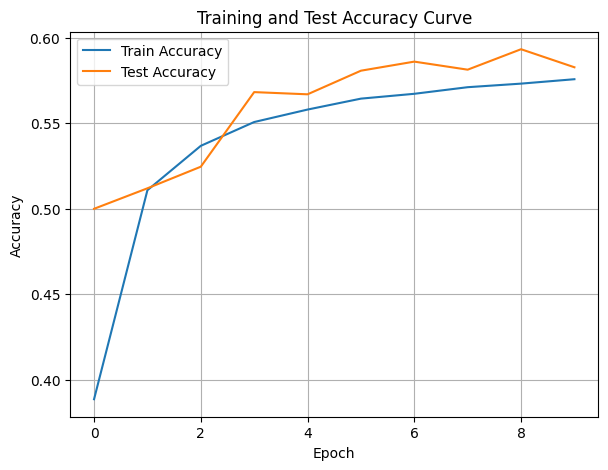

./saved_models/model_12.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.93s/it]

Epoch [1/10], Train F1:0.3657100444861413, Train Loss: 1.9499, Train Acc: 0.4072, Test F1:0.3800853285356657, Test Loss: 1.8540, Test Acc: 0.5124


Training Process:  20%|██        | 2/10 [01:17<05:11, 38.91s/it]

Epoch [2/10], Train F1:0.40593070169231904, Train Loss: 1.8644, Train Acc: 0.4653, Test F1:0.4331882619059567, Test Loss: 1.7915, Test Acc: 0.5376


Training Process:  30%|███       | 3/10 [01:59<04:40, 40.14s/it]

Epoch [3/10], Train F1:0.432341291332681, Train Loss: 1.8211, Train Acc: 0.4915, Test F1:0.4562362506693743, Test Loss: 1.7620, Test Acc: 0.5495


Training Process:  40%|████      | 4/10 [02:42<04:08, 41.34s/it]

Epoch [4/10], Train F1:0.45131341136442066, Train Loss: 1.7951, Train Acc: 0.5079, Test F1:0.476687793535652, Test Loss: 1.7433, Test Acc: 0.5599


Training Process:  50%|█████     | 5/10 [03:25<03:29, 41.95s/it]

Epoch [5/10], Train F1:0.46546569693570145, Train Loss: 1.7775, Train Acc: 0.5197, Test F1:0.48872893053760164, Test Loss: 1.7309, Test Acc: 0.5665


Training Process:  60%|██████    | 6/10 [04:10<02:52, 43.16s/it]

Epoch [6/10], Train F1:0.4770772089130905, Train Loss: 1.7644, Train Acc: 0.5290, Test F1:0.4986335730206724, Test Loss: 1.7207, Test Acc: 0.5719


Training Process:  70%|███████   | 7/10 [04:57<02:12, 44.31s/it]

Epoch [7/10], Train F1:0.48670419097225387, Train Loss: 1.7540, Train Acc: 0.5364, Test F1:0.5087294664575445, Test Loss: 1.7124, Test Acc: 0.5769


Training Process:  80%|████████  | 8/10 [05:46<01:31, 45.82s/it]

Epoch [8/10], Train F1:0.494612806712199, Train Loss: 1.7457, Train Acc: 0.5426, Test F1:0.5176653691055857, Test Loss: 1.7054, Test Acc: 0.5816


Training Process:  90%|█████████ | 9/10 [06:35<00:46, 46.94s/it]

Epoch [9/10], Train F1:0.5014704627087341, Train Loss: 1.7387, Train Acc: 0.5479, Test F1:0.5280806088250856, Test Loss: 1.6986, Test Acc: 0.5872


Training Process: 100%|██████████| 10/10 [07:29<00:00, 44.94s/it]


Epoch [10/10], Train F1:0.5073297348731016, Train Loss: 1.7327, Train Acc: 0.5525, Test F1:0.5355401427971402, Test Loss: 1.6930, Test Acc: 0.5915
Total Epochs: 10
Train loss start: 2.0764079093933105, Train loss end: 1.6869421005249023
Highest Mean Train Accuracy (over epoch): 0.552480639215469
Test loss start: 1.8468269109725952, Test loss end: 1.6387488842010498
Highest mean Test Accuracy (over epoch): 0.5915104193345968


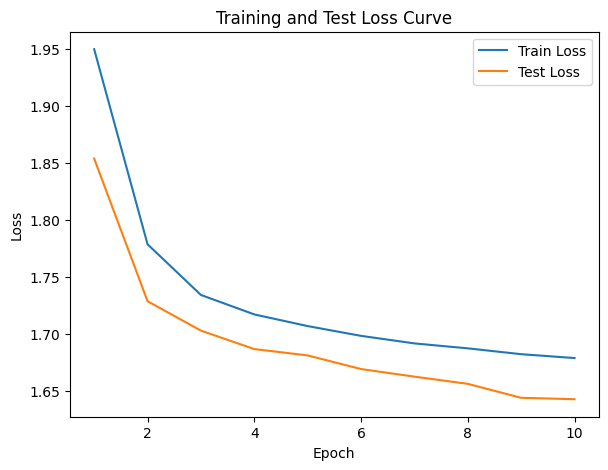

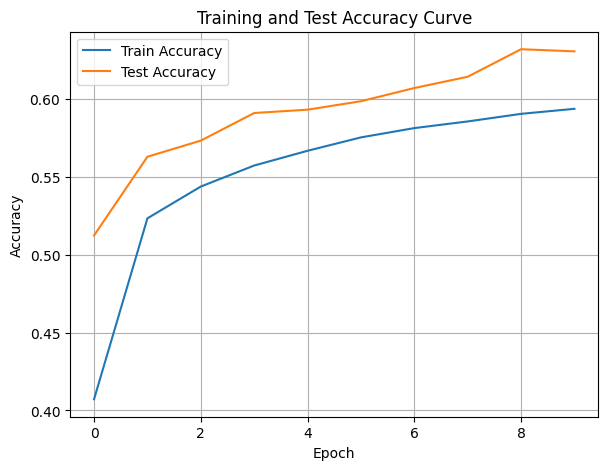

./saved_models/model_13.pth
Training Model with id 14


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.66s/it]

Epoch [1/10], Train F1:0.33958243810197813, Train Loss: 2.0126, Train Acc: 0.2919, Test F1:0.41679115588643173, Test Loss: 1.8722, Test Acc: 0.5162


Training Process:  20%|██        | 2/10 [01:16<05:08, 38.61s/it]

Epoch [2/10], Train F1:0.40691213049956826, Train Loss: 1.9152, Train Acc: 0.3970, Test F1:0.4327813665469049, Test Loss: 1.8150, Test Acc: 0.5295


Training Process:  30%|███       | 3/10 [01:57<04:35, 39.32s/it]

Epoch [3/10], Train F1:0.4327743556250618, Train Loss: 1.8602, Train Acc: 0.4424, Test F1:0.4469800764329736, Test Loss: 1.7827, Test Acc: 0.5388


Training Process:  40%|████      | 4/10 [02:39<04:03, 40.57s/it]

Epoch [4/10], Train F1:0.451563474131293, Train Loss: 1.8263, Train Acc: 0.4698, Test F1:0.46354380771303066, Test Loss: 1.7607, Test Acc: 0.5482


Training Process:  50%|█████     | 5/10 [03:22<03:26, 41.39s/it]

Epoch [5/10], Train F1:0.467013481280284, Train Loss: 1.8028, Train Acc: 0.4891, Test F1:0.48473890419188925, Test Loss: 1.7438, Test Acc: 0.5597


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.83s/it]

Epoch [6/10], Train F1:0.4796446905953006, Train Loss: 1.7853, Train Acc: 0.5037, Test F1:0.5020068344200674, Test Loss: 1.7306, Test Acc: 0.5696


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.07s/it]

Epoch [7/10], Train F1:0.4896078599216555, Train Loss: 1.7719, Train Acc: 0.5150, Test F1:0.5180000743849691, Test Loss: 1.7189, Test Acc: 0.5789


Training Process:  80%|████████  | 8/10 [05:42<01:30, 45.19s/it]

Epoch [8/10], Train F1:0.49773208023680815, Train Loss: 1.7611, Train Acc: 0.5240, Test F1:0.5283610874810446, Test Loss: 1.7104, Test Acc: 0.5854


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.80s/it]

Epoch [9/10], Train F1:0.5046812062993921, Train Loss: 1.7521, Train Acc: 0.5317, Test F1:0.5379095935022168, Test Loss: 1.7028, Test Acc: 0.5914


Training Process: 100%|██████████| 10/10 [07:23<00:00, 44.34s/it]


Epoch [10/10], Train F1:0.5104615122610334, Train Loss: 1.7447, Train Acc: 0.5380, Test F1:0.5445487794969145, Test Loss: 1.6969, Test Acc: 0.5958
Total Epochs: 10
Train loss start: 2.112912178039551, Train loss end: 1.6232373714447021
Highest Mean Train Accuracy (over epoch): 0.537993112853991
Test loss start: 1.8455309867858887, Test loss end: 1.627948522567749
Highest mean Test Accuracy (over epoch): 0.5958102157181642


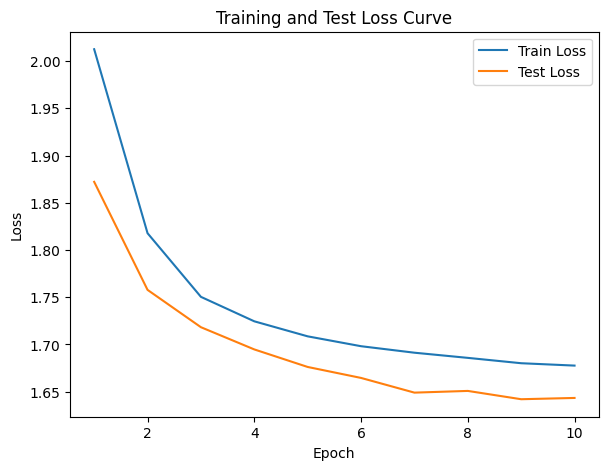

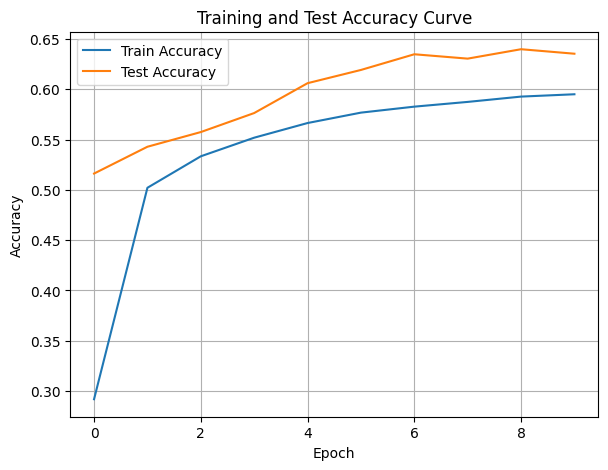

./saved_models/model_14.pth
Training Model with id 15


Training Process:  10%|█         | 1/10 [00:36<05:28, 36.47s/it]

Epoch [1/10], Train F1:0.4105828627979785, Train Loss: 1.9358, Train Acc: 0.4135, Test F1:0.3601327577962205, Test Loss: 1.8152, Test Acc: 0.4977


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.95s/it]

Epoch [2/10], Train F1:0.4387809551988744, Train Loss: 1.8562, Train Acc: 0.4679, Test F1:0.38345199752504067, Test Loss: 1.7802, Test Acc: 0.5089


Training Process:  30%|███       | 3/10 [01:57<04:37, 39.61s/it]

Epoch [3/10], Train F1:0.454404118402192, Train Loss: 1.8156, Train Acc: 0.4931, Test F1:0.4027544394516902, Test Loss: 1.7617, Test Acc: 0.5186


Training Process:  40%|████      | 4/10 [02:38<04:03, 40.52s/it]

Epoch [4/10], Train F1:0.4687546379988896, Train Loss: 1.7903, Train Acc: 0.5101, Test F1:0.4245053035716744, Test Loss: 1.7474, Test Acc: 0.5295


Training Process:  50%|█████     | 5/10 [03:22<03:28, 41.72s/it]

Epoch [5/10], Train F1:0.48111583367267546, Train Loss: 1.7726, Train Acc: 0.5227, Test F1:0.44558391555953436, Test Loss: 1.7352, Test Acc: 0.5402


Training Process:  60%|██████    | 6/10 [04:08<02:52, 43.07s/it]

Epoch [6/10], Train F1:0.4914348020042659, Train Loss: 1.7592, Train Acc: 0.5325, Test F1:0.4617247732427593, Test Loss: 1.7259, Test Acc: 0.5488


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.12s/it]

Epoch [7/10], Train F1:0.4997791424372354, Train Loss: 1.7488, Train Acc: 0.5403, Test F1:0.47461120193875683, Test Loss: 1.7180, Test Acc: 0.5559


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.69s/it]

Epoch [8/10], Train F1:0.5067778808917365, Train Loss: 1.7404, Train Acc: 0.5467, Test F1:0.48634670405449804, Test Loss: 1.7112, Test Acc: 0.5625


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.29s/it]

Epoch [9/10], Train F1:0.5126764311921975, Train Loss: 1.7335, Train Acc: 0.5520, Test F1:0.4968607541554031, Test Loss: 1.7051, Test Acc: 0.5685


Training Process: 100%|██████████| 10/10 [07:33<00:00, 45.35s/it]


Epoch [10/10], Train F1:0.5177470879386945, Train Loss: 1.7277, Train Acc: 0.5566, Test F1:0.5062126520909951, Test Loss: 1.6995, Test Acc: 0.5740
Total Epochs: 10
Train loss start: 2.0770602226257324, Train loss end: 1.4700723886489868
Highest Mean Train Accuracy (over epoch): 0.5565865915784312
Test loss start: 1.811955213546753, Test loss end: 1.6391477584838867
Highest mean Test Accuracy (over epoch): 0.5740346428068333


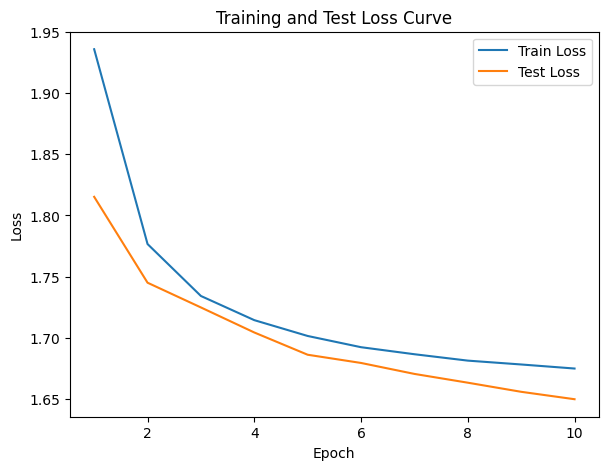

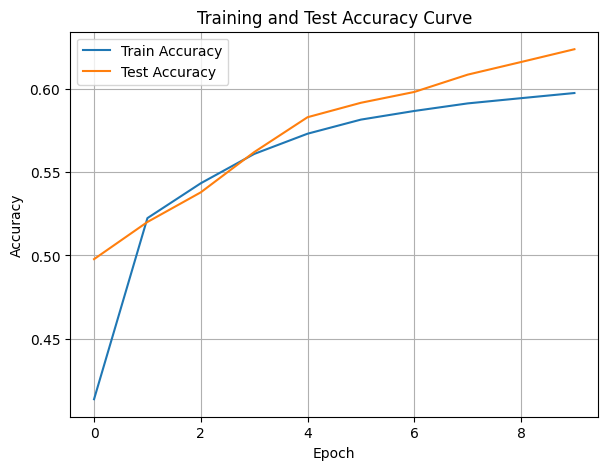

./saved_models/model_15.pth
Training Model with id 16


Training Process:  10%|█         | 1/10 [00:43<06:30, 43.42s/it]

Epoch [1/10], Train F1:0.3646805685502304, Train Loss: 1.9774, Train Acc: 0.3504, Test F1:0.3700694349712742, Test Loss: 1.8218, Test Acc: 0.4908


Training Process:  20%|██        | 2/10 [01:21<05:23, 40.46s/it]

Epoch [2/10], Train F1:0.4166398841383956, Train Loss: 1.8877, Train Acc: 0.4291, Test F1:0.3966814819699914, Test Loss: 1.7845, Test Acc: 0.5030


Training Process:  30%|███       | 3/10 [02:01<04:41, 40.16s/it]

Epoch [3/10], Train F1:0.44201233504411436, Train Loss: 1.8392, Train Acc: 0.4655, Test F1:0.42612883925429407, Test Loss: 1.7617, Test Acc: 0.5188


Training Process:  40%|████      | 4/10 [02:42<04:03, 40.59s/it]

Epoch [4/10], Train F1:0.4601927218185597, Train Loss: 1.8093, Train Acc: 0.4882, Test F1:0.44917417975386226, Test Loss: 1.7458, Test Acc: 0.5318


Training Process:  50%|█████     | 5/10 [03:28<03:32, 42.55s/it]

Epoch [5/10], Train F1:0.4738234674342026, Train Loss: 1.7888, Train Acc: 0.5040, Test F1:0.4687770773045916, Test Loss: 1.7321, Test Acc: 0.5446


Training Process:  60%|██████    | 6/10 [04:15<02:56, 44.08s/it]

Epoch [6/10], Train F1:0.48479986770358047, Train Loss: 1.7735, Train Acc: 0.5161, Test F1:0.4848799161259726, Test Loss: 1.7209, Test Acc: 0.5553


Training Process:  70%|███████   | 7/10 [05:03<02:15, 45.31s/it]

Epoch [7/10], Train F1:0.49365781027757916, Train Loss: 1.7617, Train Acc: 0.5257, Test F1:0.4947042031199473, Test Loss: 1.7129, Test Acc: 0.5625


Training Process:  80%|████████  | 8/10 [05:53<01:33, 46.64s/it]

Epoch [8/10], Train F1:0.5012145298849471, Train Loss: 1.7519, Train Acc: 0.5337, Test F1:0.507486552771625, Test Loss: 1.7051, Test Acc: 0.5706


Training Process:  90%|█████████ | 9/10 [06:42<00:47, 47.44s/it]

Epoch [9/10], Train F1:0.5073992061794064, Train Loss: 1.7439, Train Acc: 0.5403, Test F1:0.5148692058817131, Test Loss: 1.7001, Test Acc: 0.5755


Training Process: 100%|██████████| 10/10 [07:34<00:00, 45.47s/it]


Epoch [10/10], Train F1:0.5128297298157541, Train Loss: 1.7371, Train Acc: 0.5459, Test F1:0.5239414187380096, Test Loss: 1.6943, Test Acc: 0.5815
Total Epochs: 10
Train loss start: 2.094282388687134, Train loss end: 1.6014949083328247
Highest Mean Train Accuracy (over epoch): 0.5459295810623843
Test loss start: 1.8229079246520996, Test loss end: 1.615037441253662
Highest mean Test Accuracy (over epoch): 0.5815119040377522


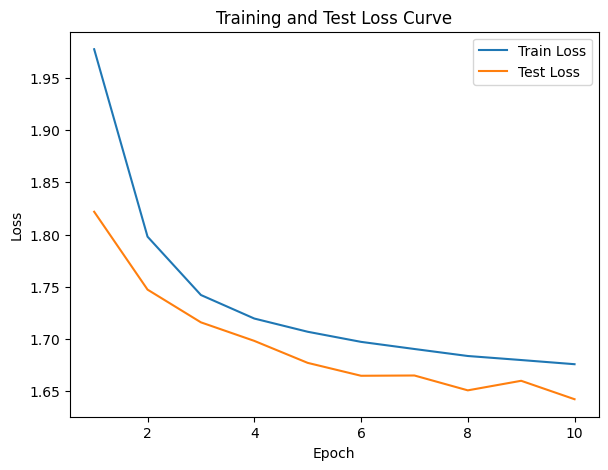

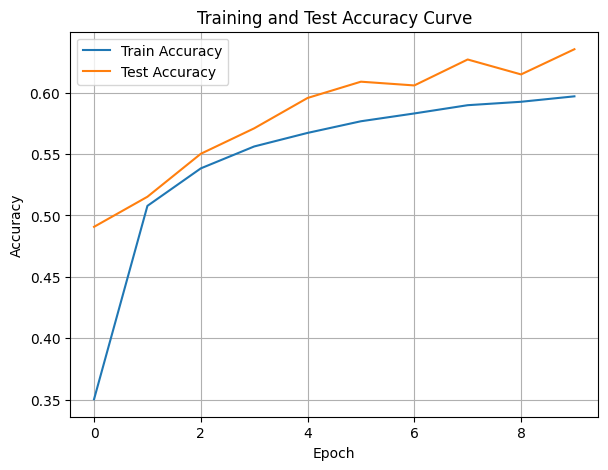

./saved_models/model_16.pth
Training Model with id 21


Training Process:  10%|█         | 1/10 [00:36<05:28, 36.49s/it]

Epoch [1/10], Train F1:0.5644777643264748, Train Loss: 1.6729, Train Acc: 0.6001, Test F1:0.5627151529889544, Test Loss: 1.6547, Test Acc: 0.6133


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.43s/it]

Epoch [2/10], Train F1:0.5655636648365044, Train Loss: 1.6716, Train Acc: 0.6012, Test F1:0.5778205966455201, Test Loss: 1.6487, Test Acc: 0.6234


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.30s/it]

Epoch [3/10], Train F1:0.5665436961760523, Train Loss: 1.6707, Train Acc: 0.6022, Test F1:0.5835335864022339, Test Loss: 1.6465, Test Acc: 0.6274


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.46s/it]

Epoch [4/10], Train F1:0.5672980286222232, Train Loss: 1.6699, Train Acc: 0.6029, Test F1:0.5859948196087412, Test Loss: 1.6457, Test Acc: 0.6292


Training Process:  50%|█████     | 5/10 [03:22<03:28, 41.78s/it]

Epoch [5/10], Train F1:0.5680387382865001, Train Loss: 1.6692, Train Acc: 0.6036, Test F1:0.5898545866936837, Test Loss: 1.6431, Test Acc: 0.6317


Training Process:  60%|██████    | 6/10 [04:07<02:50, 42.74s/it]

Epoch [6/10], Train F1:0.5687417929631793, Train Loss: 1.6684, Train Acc: 0.6042, Test F1:0.5920821192260037, Test Loss: 1.6420, Test Acc: 0.6333


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.18s/it]

Epoch [7/10], Train F1:0.5695582346456736, Train Loss: 1.6676, Train Acc: 0.6050, Test F1:0.5921434935243778, Test Loss: 1.6417, Test Acc: 0.6334


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.85s/it]

Epoch [8/10], Train F1:0.5701784180218863, Train Loss: 1.6670, Train Acc: 0.6056, Test F1:0.5930983128036347, Test Loss: 1.6409, Test Acc: 0.6342


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.62s/it]

Epoch [9/10], Train F1:0.570743633041369, Train Loss: 1.6664, Train Acc: 0.6062, Test F1:0.5928743926543216, Test Loss: 1.6413, Test Acc: 0.6341


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.62s/it]


Epoch [10/10], Train F1:0.5712947855246032, Train Loss: 1.6659, Train Acc: 0.6067, Test F1:0.5939342662667765, Test Loss: 1.6406, Test Acc: 0.6349
Total Epochs: 10
Train loss start: 1.6556352376937866, Train loss end: 1.6172455549240112
Highest Mean Train Accuracy (over epoch): 0.6066870474892792
Test loss start: 1.6342216730117798, Test loss end: 1.5964821577072144
Highest mean Test Accuracy (over epoch): 0.634861270297613


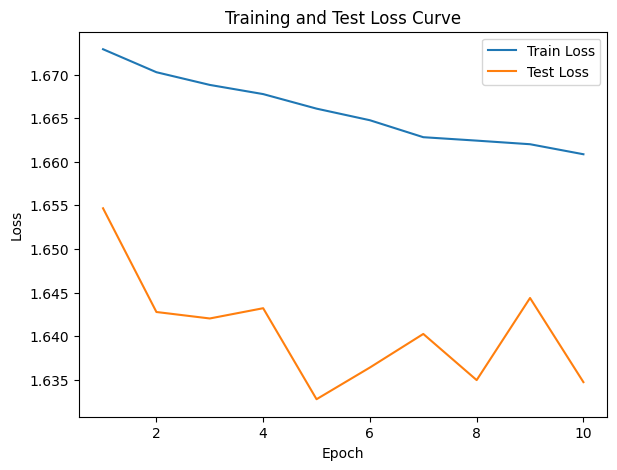

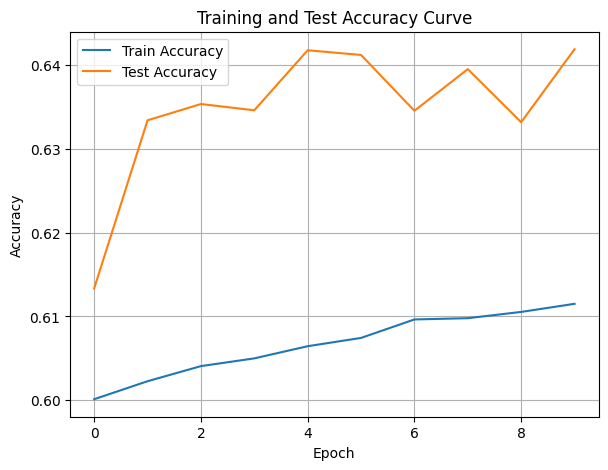

./saved_models/model_21.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:41<06:11, 41.24s/it]

Epoch [1/10], Train F1:0.5776005792271635, Train Loss: 1.6598, Train Acc: 0.6128, Test F1:0.6039370031328267, Test Loss: 1.6351, Test Acc: 0.6418


Training Process:  20%|██        | 2/10 [01:21<05:26, 40.75s/it]

Epoch [2/10], Train F1:0.5777352278654515, Train Loss: 1.6595, Train Acc: 0.6129, Test F1:0.6003821204627516, Test Loss: 1.6378, Test Acc: 0.6393


Training Process:  30%|███       | 3/10 [02:02<04:45, 40.77s/it]

Epoch [3/10], Train F1:0.5780916678025739, Train Loss: 1.6591, Train Acc: 0.6132, Test F1:0.6015207431101981, Test Loss: 1.6367, Test Acc: 0.6403


Training Process:  40%|████      | 4/10 [02:43<04:06, 41.01s/it]

Epoch [4/10], Train F1:0.5784293554394754, Train Loss: 1.6588, Train Acc: 0.6136, Test F1:0.6003890463574522, Test Loss: 1.6370, Test Acc: 0.6397


Training Process:  50%|█████     | 5/10 [03:28<03:31, 42.32s/it]

Epoch [5/10], Train F1:0.578741364245254, Train Loss: 1.6585, Train Acc: 0.6139, Test F1:0.6020525524379428, Test Loss: 1.6353, Test Acc: 0.6409


Training Process:  60%|██████    | 6/10 [04:14<02:54, 43.50s/it]

Epoch [6/10], Train F1:0.5790211164238463, Train Loss: 1.6583, Train Acc: 0.6142, Test F1:0.6030899886424426, Test Loss: 1.6340, Test Acc: 0.6418


Training Process:  70%|███████   | 7/10 [05:00<02:13, 44.43s/it]

Epoch [7/10], Train F1:0.5792258535207023, Train Loss: 1.6580, Train Acc: 0.6144, Test F1:0.6022667874450465, Test Loss: 1.6346, Test Acc: 0.6413


Training Process:  80%|████████  | 8/10 [05:49<01:31, 45.76s/it]

Epoch [8/10], Train F1:0.5793213991616324, Train Loss: 1.6579, Train Acc: 0.6145, Test F1:0.601670668441458, Test Loss: 1.6349, Test Acc: 0.6410


Training Process:  90%|█████████ | 9/10 [06:38<00:46, 46.89s/it]

Epoch [9/10], Train F1:0.57957580441499, Train Loss: 1.6577, Train Acc: 0.6147, Test F1:0.6024203779087203, Test Loss: 1.6343, Test Acc: 0.6415


Training Process: 100%|██████████| 10/10 [07:30<00:00, 45.07s/it]


Epoch [10/10], Train F1:0.5797514953907676, Train Loss: 1.6575, Train Acc: 0.6149, Test F1:0.602866520123026, Test Loss: 1.6339, Test Acc: 0.6419
Total Epochs: 10
Train loss start: 1.5630253553390503, Train loss end: 1.6527550220489502
Highest Mean Train Accuracy (over epoch): 0.6148797687829728
Test loss start: 1.5826854705810547, Test loss end: 1.5918382406234741
Highest mean Test Accuracy (over epoch): 0.6419049862014651


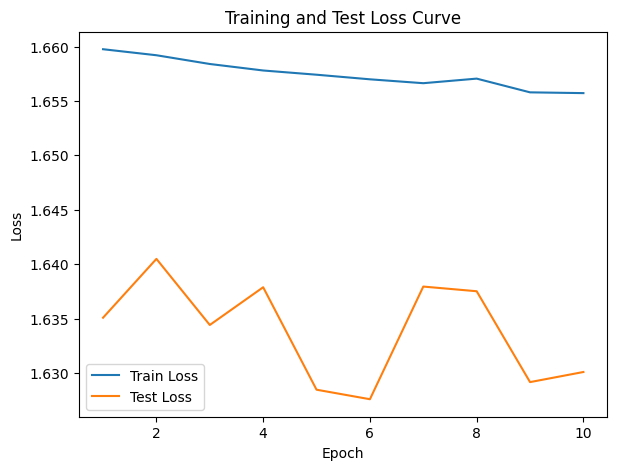

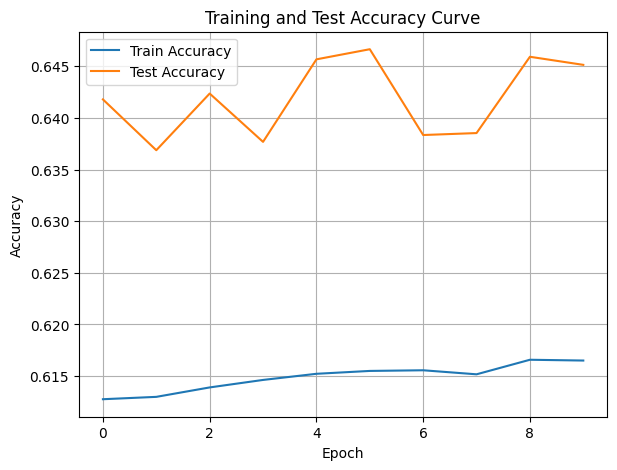

./saved_models/model_22.pth
Training Model with id 20


Training Process:  10%|█         | 1/10 [00:38<05:43, 38.17s/it]

Epoch [1/10], Train F1:0.5808750657054262, Train Loss: 1.6560, Train Acc: 0.6162, Test F1:0.6097678362295381, Test Loss: 1.6272, Test Acc: 0.6471


Training Process:  20%|██        | 2/10 [01:18<05:14, 39.33s/it]

Epoch [2/10], Train F1:0.5815190001324563, Train Loss: 1.6555, Train Acc: 0.6168, Test F1:0.6065275890161654, Test Loss: 1.6300, Test Acc: 0.6450


Training Process:  30%|███       | 3/10 [01:59<04:41, 40.28s/it]

Epoch [3/10], Train F1:0.5818350736881833, Train Loss: 1.6552, Train Acc: 0.6170, Test F1:0.6058789852837373, Test Loss: 1.6299, Test Acc: 0.6447


Training Process:  40%|████      | 4/10 [02:41<04:04, 40.83s/it]

Epoch [4/10], Train F1:0.5821399701295453, Train Loss: 1.6550, Train Acc: 0.6174, Test F1:0.6042513759594268, Test Loss: 1.6312, Test Acc: 0.6436


Training Process:  50%|█████     | 5/10 [03:25<03:30, 42.10s/it]

Epoch [5/10], Train F1:0.582260547203366, Train Loss: 1.6549, Train Acc: 0.6175, Test F1:0.6044046294782187, Test Loss: 1.6309, Test Acc: 0.6437


Training Process:  60%|██████    | 6/10 [04:11<02:53, 43.44s/it]

Epoch [6/10], Train F1:0.5822548080167664, Train Loss: 1.6549, Train Acc: 0.6174, Test F1:0.6022649288839217, Test Loss: 1.6327, Test Acc: 0.6418


Training Process:  70%|███████   | 7/10 [04:58<02:13, 44.40s/it]

Epoch [7/10], Train F1:0.5824176329910169, Train Loss: 1.6547, Train Acc: 0.6176, Test F1:0.6028045610283387, Test Loss: 1.6321, Test Acc: 0.6423


Training Process:  80%|████████  | 8/10 [05:48<01:32, 46.19s/it]

Epoch [8/10], Train F1:0.5825571133462384, Train Loss: 1.6546, Train Acc: 0.6177, Test F1:0.6037557077445885, Test Loss: 1.6314, Test Acc: 0.6431


Training Process:  90%|█████████ | 9/10 [06:39<00:47, 47.65s/it]

Epoch [9/10], Train F1:0.5827590507145839, Train Loss: 1.6544, Train Acc: 0.6179, Test F1:0.6045303901888294, Test Loss: 1.6309, Test Acc: 0.6436


Training Process: 100%|██████████| 10/10 [07:31<00:00, 45.14s/it]


Epoch [10/10], Train F1:0.5828548520685639, Train Loss: 1.6543, Train Acc: 0.6180, Test F1:0.6048991594554137, Test Loss: 1.6306, Test Acc: 0.6439
Total Epochs: 10
Train loss start: 1.5589051246643066, Train loss end: 1.614881992340088
Highest Mean Train Accuracy (over epoch): 0.6179863304402871
Test loss start: 1.5774006843566895, Test loss end: 1.5894073247909546
Highest mean Test Accuracy (over epoch): 0.6470666507658026


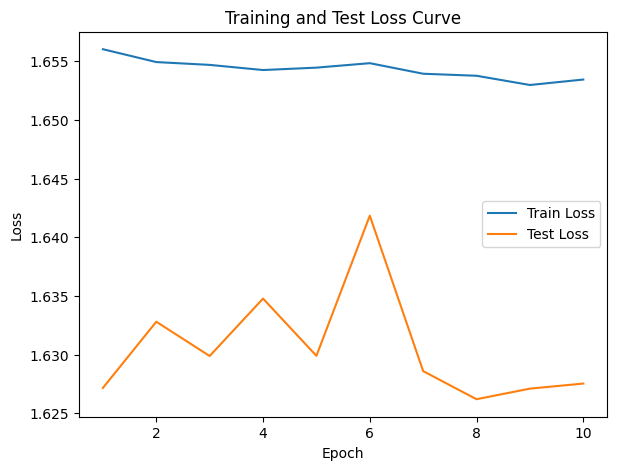

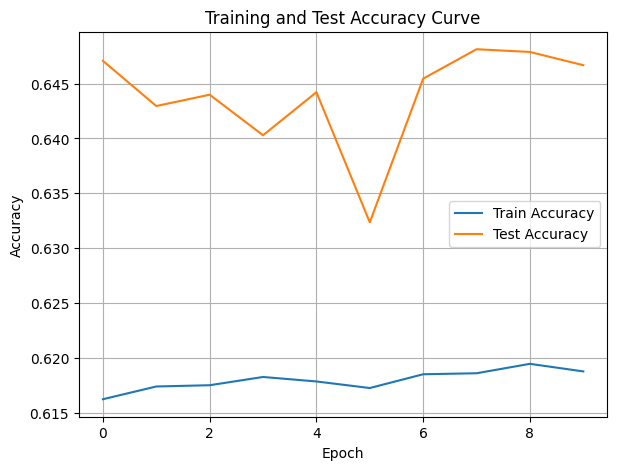

./saved_models/model_20.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:36<05:29, 36.62s/it]

Epoch [1/10], Train F1:0.5844937512566858, Train Loss: 1.6530, Train Acc: 0.6193, Test F1:0.6086356896179349, Test Loss: 1.6278, Test Acc: 0.6471


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.10s/it]

Epoch [2/10], Train F1:0.5842944873957382, Train Loss: 1.6530, Train Acc: 0.6192, Test F1:0.6105635564517088, Test Loss: 1.6262, Test Acc: 0.6484


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.35s/it]

Epoch [3/10], Train F1:0.5843992225082693, Train Loss: 1.6529, Train Acc: 0.6193, Test F1:0.6094205553243742, Test Loss: 1.6269, Test Acc: 0.6476


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.44s/it]

Epoch [4/10], Train F1:0.5845224012588706, Train Loss: 1.6528, Train Acc: 0.6194, Test F1:0.6080777427713254, Test Loss: 1.6279, Test Acc: 0.6465


Training Process:  50%|█████     | 5/10 [03:23<03:29, 41.94s/it]

Epoch [5/10], Train F1:0.584619726350435, Train Loss: 1.6527, Train Acc: 0.6195, Test F1:0.607938463954059, Test Loss: 1.6282, Test Acc: 0.6463


Training Process:  60%|██████    | 6/10 [04:09<02:52, 43.24s/it]

Epoch [6/10], Train F1:0.5848368841923994, Train Loss: 1.6525, Train Acc: 0.6198, Test F1:0.6080996987278398, Test Loss: 1.6280, Test Acc: 0.6465


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.25s/it]

Epoch [7/10], Train F1:0.5849582339738628, Train Loss: 1.6524, Train Acc: 0.6199, Test F1:0.6068510092458554, Test Loss: 1.6287, Test Acc: 0.6456


Training Process:  80%|████████  | 8/10 [05:45<01:31, 45.98s/it]

Epoch [8/10], Train F1:0.584971925070282, Train Loss: 1.6524, Train Acc: 0.6199, Test F1:0.6079574694314189, Test Loss: 1.6281, Test Acc: 0.6463


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.42s/it]

Epoch [9/10], Train F1:0.5850730320357274, Train Loss: 1.6523, Train Acc: 0.6200, Test F1:0.6080913561020455, Test Loss: 1.6279, Test Acc: 0.6465


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.68s/it]


Epoch [10/10], Train F1:0.5850850335836619, Train Loss: 1.6523, Train Acc: 0.6200, Test F1:0.607326340613674, Test Loss: 1.6286, Test Acc: 0.6457
Total Epochs: 10
Train loss start: 1.6289857625961304, Train loss end: 1.8027466535568237
Highest Mean Train Accuracy (over epoch): 0.6199965715386707
Test loss start: 1.585509181022644, Test loss end: 1.5914620161056519
Highest mean Test Accuracy (over epoch): 0.6483830742239524


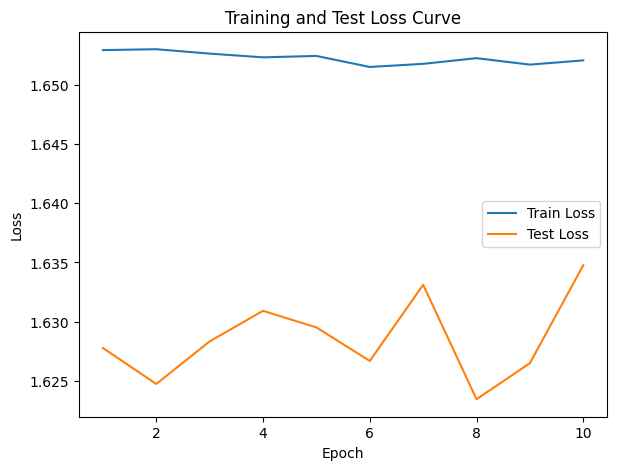

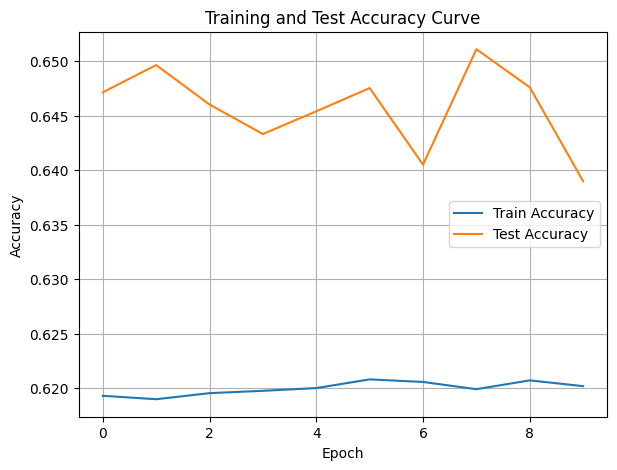

./saved_models/model_22.pth
Training Model with id 23


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.00s/it]

Epoch [1/10], Train F1:0.5866423700275522, Train Loss: 1.6505, Train Acc: 0.6218, Test F1:0.6092587943782389, Test Loss: 1.6271, Test Acc: 0.6475


Training Process:  20%|██        | 2/10 [01:16<05:07, 38.40s/it]

Epoch [2/10], Train F1:0.5866675873831476, Train Loss: 1.6506, Train Acc: 0.6218, Test F1:0.6098235185951991, Test Loss: 1.6277, Test Acc: 0.6472


Training Process:  30%|███       | 3/10 [01:57<04:38, 39.79s/it]

Epoch [3/10], Train F1:0.5866488094095194, Train Loss: 1.6507, Train Acc: 0.6217, Test F1:0.6088173827590627, Test Loss: 1.6277, Test Acc: 0.6466


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.50s/it]

Epoch [4/10], Train F1:0.5868286491041872, Train Loss: 1.6506, Train Acc: 0.6218, Test F1:0.6090116705437187, Test Loss: 1.6275, Test Acc: 0.6469


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.63s/it]

Epoch [5/10], Train F1:0.5867929133367366, Train Loss: 1.6506, Train Acc: 0.6218, Test F1:0.609851617748422, Test Loss: 1.6269, Test Acc: 0.6476


Training Process:  60%|██████    | 6/10 [04:08<02:52, 43.03s/it]

Epoch [6/10], Train F1:0.5869219492912836, Train Loss: 1.6504, Train Acc: 0.6219, Test F1:0.6092431562065477, Test Loss: 1.6276, Test Acc: 0.6469


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.14s/it]

Epoch [7/10], Train F1:0.5869408900221464, Train Loss: 1.6504, Train Acc: 0.6219, Test F1:0.6106930039508564, Test Loss: 1.6265, Test Acc: 0.6479


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.73s/it]

Epoch [8/10], Train F1:0.5869435418470444, Train Loss: 1.6504, Train Acc: 0.6219, Test F1:0.6099079705213045, Test Loss: 1.6270, Test Acc: 0.6475


Training Process:  90%|█████████ | 9/10 [06:33<00:46, 46.92s/it]

Epoch [9/10], Train F1:0.5869472761656319, Train Loss: 1.6504, Train Acc: 0.6219, Test F1:0.6094107283131796, Test Loss: 1.6272, Test Acc: 0.6472


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.65s/it]


Epoch [10/10], Train F1:0.5869760300494395, Train Loss: 1.6504, Train Acc: 0.6219, Test F1:0.6087719134305172, Test Loss: 1.6277, Test Acc: 0.6467
Total Epochs: 10
Train loss start: 1.619942307472229, Train loss end: 1.5688964128494263
Highest Mean Train Accuracy (over epoch): 0.6218897846054565
Test loss start: 1.5828365087509155, Test loss end: 1.5910491943359375
Highest mean Test Accuracy (over epoch): 0.6479417795124913


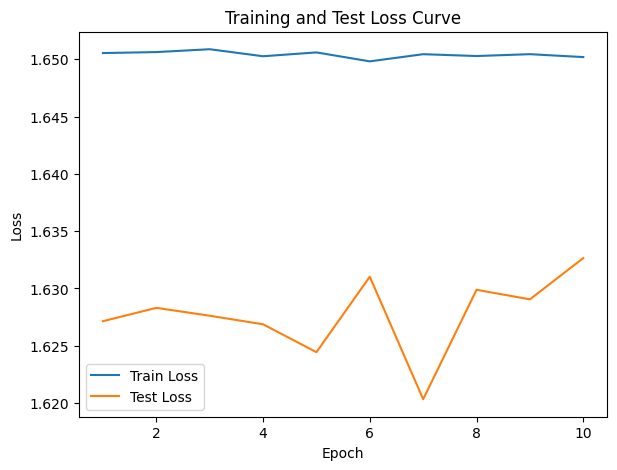

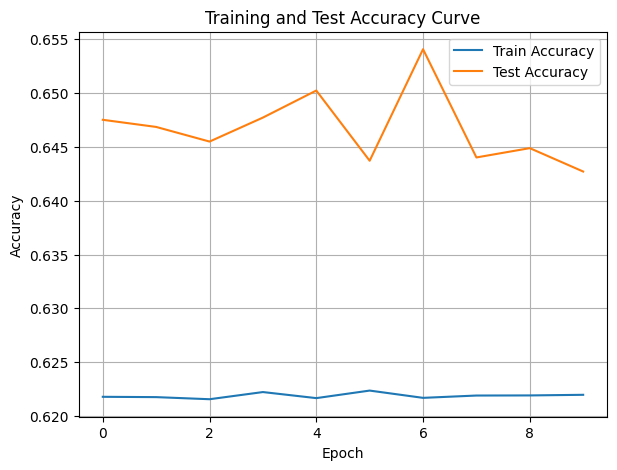

./saved_models/model_23.pth
Training Model with id 21


Training Process:  10%|█         | 1/10 [00:37<05:40, 37.80s/it]

Epoch [1/10], Train F1:0.5873072932718104, Train Loss: 1.6502, Train Acc: 0.6221, Test F1:0.6075941412526107, Test Loss: 1.6267, Test Acc: 0.6469


Training Process:  20%|██        | 2/10 [01:17<05:09, 38.64s/it]

Epoch [2/10], Train F1:0.5876918701506197, Train Loss: 1.6499, Train Acc: 0.6224, Test F1:0.6095877974946242, Test Loss: 1.6260, Test Acc: 0.6476


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.72s/it]

Epoch [3/10], Train F1:0.5879187734345974, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.609589919849343, Test Loss: 1.6265, Test Acc: 0.6475


Training Process:  40%|████      | 4/10 [02:41<04:06, 41.05s/it]

Epoch [4/10], Train F1:0.5879221625284478, Train Loss: 1.6496, Train Acc: 0.6227, Test F1:0.6086984215302277, Test Loss: 1.6274, Test Acc: 0.6468


Training Process:  50%|█████     | 5/10 [03:24<03:28, 41.80s/it]

Epoch [5/10], Train F1:0.5877622393344317, Train Loss: 1.6497, Train Acc: 0.6226, Test F1:0.608854720179641, Test Loss: 1.6272, Test Acc: 0.6469


Training Process:  60%|██████    | 6/10 [04:09<02:52, 43.05s/it]

Epoch [6/10], Train F1:0.5878098363043295, Train Loss: 1.6497, Train Acc: 0.6226, Test F1:0.608567663703724, Test Loss: 1.6279, Test Acc: 0.6464


Training Process:  70%|███████   | 7/10 [04:57<02:13, 44.51s/it]

Epoch [7/10], Train F1:0.587808961186526, Train Loss: 1.6497, Train Acc: 0.6226, Test F1:0.6083525610365293, Test Loss: 1.6282, Test Acc: 0.6461


Training Process:  80%|████████  | 8/10 [05:45<01:31, 45.62s/it]

Epoch [8/10], Train F1:0.5878615945023682, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.6083552353326368, Test Loss: 1.6281, Test Acc: 0.6462


Training Process:  90%|█████████ | 9/10 [06:34<00:46, 46.74s/it]

Epoch [9/10], Train F1:0.5878289210018952, Train Loss: 1.6497, Train Acc: 0.6226, Test F1:0.6082536898984762, Test Loss: 1.6284, Test Acc: 0.6460


Training Process: 100%|██████████| 10/10 [07:27<00:00, 44.72s/it]


Epoch [10/10], Train F1:0.5878417573995415, Train Loss: 1.6496, Train Acc: 0.6226, Test F1:0.6077176439077754, Test Loss: 1.6289, Test Acc: 0.6455
Total Epochs: 10
Train loss start: 1.6363013982772827, Train loss end: 1.6934164762496948
Highest Mean Train Accuracy (over epoch): 0.6226987751987185
Test loss start: 1.5938994884490967, Test loss end: 1.5841631889343262
Highest mean Test Accuracy (over epoch): 0.6475678881518286


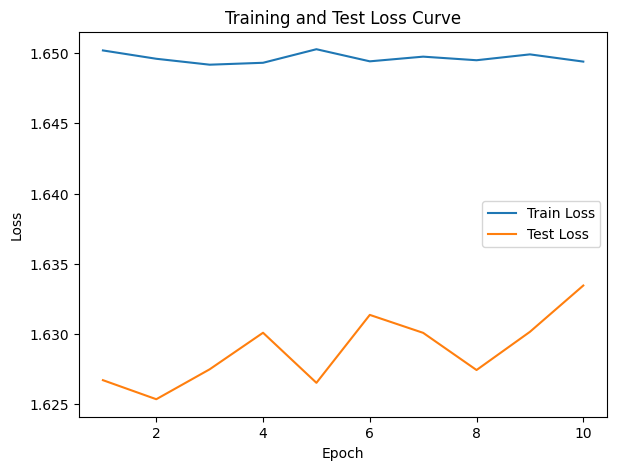

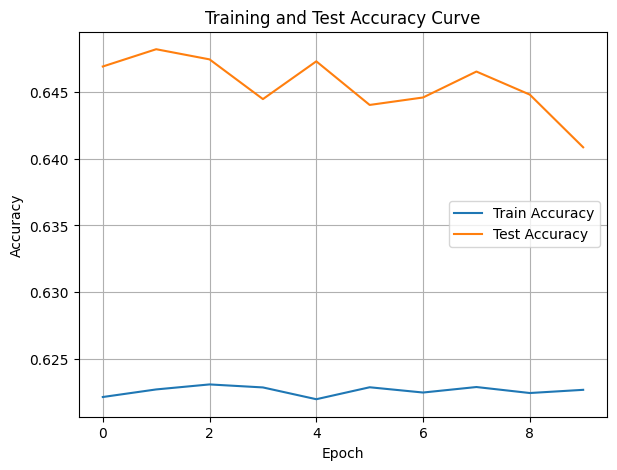

./saved_models/model_21.pth
Training Model with id 19


Training Process:  10%|█         | 1/10 [00:36<05:26, 36.31s/it]

Epoch [1/10], Train F1:0.5891788528174742, Train Loss: 1.6485, Train Acc: 0.6240, Test F1:0.604217169064851, Test Loss: 1.6314, Test Acc: 0.6426


Training Process:  20%|██        | 2/10 [01:15<05:03, 38.00s/it]

Epoch [2/10], Train F1:0.5887062008986287, Train Loss: 1.6488, Train Acc: 0.6235, Test F1:0.6032417278979091, Test Loss: 1.6328, Test Acc: 0.6414


Training Process:  30%|███       | 3/10 [01:56<04:37, 39.59s/it]

Epoch [3/10], Train F1:0.5884789624325057, Train Loss: 1.6490, Train Acc: 0.6233, Test F1:0.6072784487123789, Test Loss: 1.6301, Test Acc: 0.6442


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.11s/it]

Epoch [4/10], Train F1:0.5885825841447501, Train Loss: 1.6488, Train Acc: 0.6235, Test F1:0.6063857785297677, Test Loss: 1.6304, Test Acc: 0.6437


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.35s/it]

Epoch [5/10], Train F1:0.5887407669232166, Train Loss: 1.6487, Train Acc: 0.6236, Test F1:0.6065241708436774, Test Loss: 1.6305, Test Acc: 0.6436


Training Process:  60%|██████    | 6/10 [04:05<02:49, 42.39s/it]

Epoch [6/10], Train F1:0.5886883866687718, Train Loss: 1.6487, Train Acc: 0.6235, Test F1:0.6037793055983317, Test Loss: 1.6323, Test Acc: 0.6415


Training Process:  70%|███████   | 7/10 [04:53<02:12, 44.14s/it]

Epoch [7/10], Train F1:0.5887699371342242, Train Loss: 1.6486, Train Acc: 0.6236, Test F1:0.6035218450629419, Test Loss: 1.6324, Test Acc: 0.6413


Training Process:  80%|████████  | 8/10 [05:42<01:31, 45.66s/it]

Epoch [8/10], Train F1:0.5888620081616903, Train Loss: 1.6486, Train Acc: 0.6237, Test F1:0.6041749785609847, Test Loss: 1.6318, Test Acc: 0.6419


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.22s/it]

Epoch [9/10], Train F1:0.5888075435984444, Train Loss: 1.6486, Train Acc: 0.6236, Test F1:0.604357712849605, Test Loss: 1.6316, Test Acc: 0.6421


Training Process: 100%|██████████| 10/10 [07:25<00:00, 44.56s/it]

Epoch [10/10], Train F1:0.5888196921506751, Train Loss: 1.6486, Train Acc: 0.6236, Test F1:0.6046706061228987, Test Loss: 1.6313, Test Acc: 0.6424
Total Epochs: 10
Train loss start: 1.6716647148132324, Train loss end: 1.5784308910369873
Highest Mean Train Accuracy (over epoch): 0.6239848942014823
Test loss start: 1.5802457332611084, Test loss end: 1.595221996307373
Highest mean Test Accuracy (over epoch): 0.6442301073788547


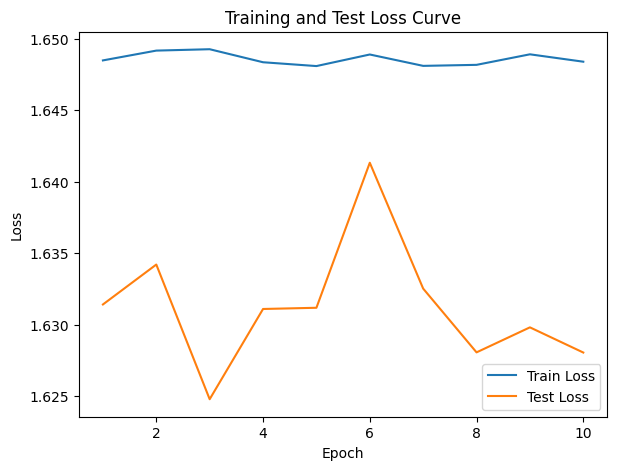

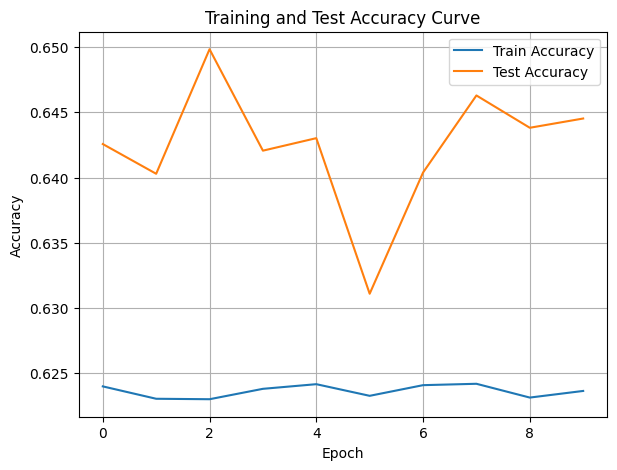

./saved_models/model_19.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:36<05:27, 36.44s/it]

Epoch [1/10], Train F1:0.5897067653539076, Train Loss: 1.6477, Train Acc: 0.6245, Test F1:0.6217089398491532, Test Loss: 1.6211, Test Acc: 0.6580


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.79s/it]

Epoch [2/10], Train F1:0.5897103413982075, Train Loss: 1.6477, Train Acc: 0.6245, Test F1:0.6158629034287542, Test Loss: 1.6251, Test Acc: 0.6515


Training Process:  30%|███       | 3/10 [01:56<04:36, 39.46s/it]

Epoch [3/10], Train F1:0.589527347560653, Train Loss: 1.6479, Train Acc: 0.6243, Test F1:0.6141295571401663, Test Loss: 1.6251, Test Acc: 0.6504


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.34s/it]

Epoch [4/10], Train F1:0.5894231545676885, Train Loss: 1.6480, Train Acc: 0.6242, Test F1:0.6089412278262994, Test Loss: 1.6278, Test Acc: 0.6466


Training Process:  50%|█████     | 5/10 [03:21<03:27, 41.51s/it]

Epoch [5/10], Train F1:0.5893971833118155, Train Loss: 1.6480, Train Acc: 0.6242, Test F1:0.6088404849359569, Test Loss: 1.6284, Test Acc: 0.6460


Training Process:  60%|██████    | 6/10 [04:07<02:52, 43.03s/it]

Epoch [6/10], Train F1:0.5894636035345373, Train Loss: 1.6479, Train Acc: 0.6242, Test F1:0.6017832402374675, Test Loss: 1.6331, Test Acc: 0.6402


Training Process:  70%|███████   | 7/10 [04:53<02:12, 44.04s/it]

Epoch [7/10], Train F1:0.5893863002255684, Train Loss: 1.6480, Train Acc: 0.6241, Test F1:0.6016188044039216, Test Loss: 1.6332, Test Acc: 0.6402


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.69s/it]

Epoch [8/10], Train F1:0.5893755186820158, Train Loss: 1.6480, Train Acc: 0.6241, Test F1:0.6014231994300528, Test Loss: 1.6334, Test Acc: 0.6400


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.31s/it]

Epoch [9/10], Train F1:0.5893532443405104, Train Loss: 1.6480, Train Acc: 0.6241, Test F1:0.6012067952080848, Test Loss: 1.6337, Test Acc: 0.6398


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.64s/it]


Epoch [10/10], Train F1:0.5893689046269351, Train Loss: 1.6480, Train Acc: 0.6241, Test F1:0.6005840226259197, Test Loss: 1.6341, Test Acc: 0.6394
Total Epochs: 10
Train loss start: 1.6440112590789795, Train loss end: 1.5894829034805298
Highest Mean Train Accuracy (over epoch): 0.6244993208141499
Test loss start: 1.571308970451355, Test loss end: 1.5901474952697754
Highest mean Test Accuracy (over epoch): 0.6580496523153366


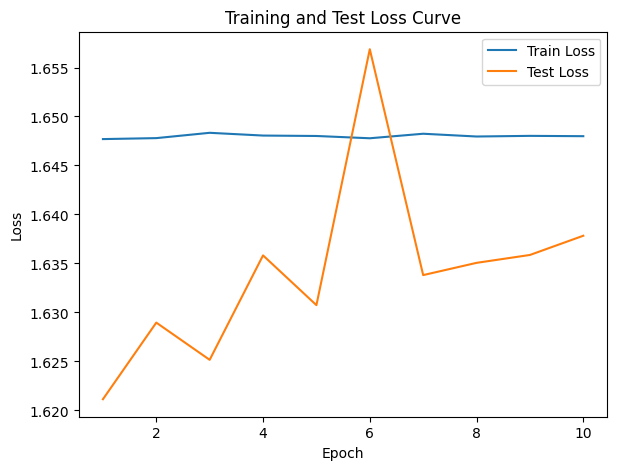

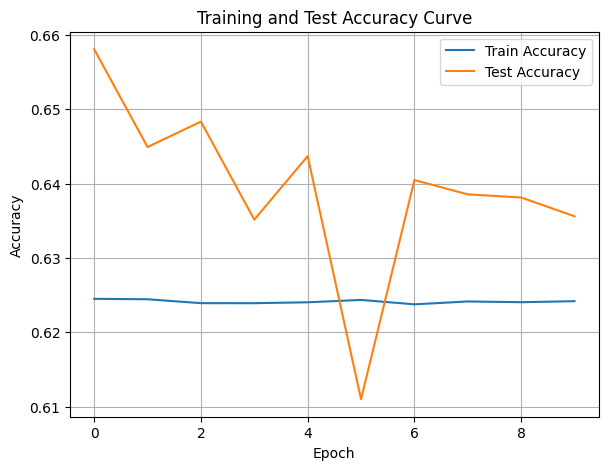

./saved_models/model_22.pth
Training Model with id 23


Training Process:  10%|█         | 1/10 [00:37<05:39, 37.76s/it]

Epoch [1/10], Train F1:0.5889072201282387, Train Loss: 1.6484, Train Acc: 0.6236, Test F1:0.5985742771872872, Test Loss: 1.6361, Test Acc: 0.6374


Training Process:  20%|██        | 2/10 [01:17<05:09, 38.71s/it]

Epoch [2/10], Train F1:0.5897801873098695, Train Loss: 1.6477, Train Acc: 0.6245, Test F1:0.6000797953366426, Test Loss: 1.6347, Test Acc: 0.6388


Training Process:  30%|███       | 3/10 [01:56<04:34, 39.24s/it]

Epoch [3/10], Train F1:0.5900913403704617, Train Loss: 1.6473, Train Acc: 0.6248, Test F1:0.6009899733998559, Test Loss: 1.6338, Test Acc: 0.6396


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.37s/it]

Epoch [4/10], Train F1:0.5902407456117413, Train Loss: 1.6472, Train Acc: 0.6249, Test F1:0.6017761757499157, Test Loss: 1.6339, Test Acc: 0.6401


Training Process:  50%|█████     | 5/10 [03:22<03:26, 41.36s/it]

Epoch [5/10], Train F1:0.5902722432411096, Train Loss: 1.6472, Train Acc: 0.6249, Test F1:0.6015105013613721, Test Loss: 1.6343, Test Acc: 0.6397


Training Process:  60%|██████    | 6/10 [04:07<02:51, 42.83s/it]

Epoch [6/10], Train F1:0.5901862426658008, Train Loss: 1.6473, Train Acc: 0.6249, Test F1:0.6021760600052919, Test Loss: 1.6337, Test Acc: 0.6403


Training Process:  70%|███████   | 7/10 [04:53<02:11, 43.90s/it]

Epoch [7/10], Train F1:0.5902445119348205, Train Loss: 1.6472, Train Acc: 0.6249, Test F1:0.6012993464776429, Test Loss: 1.6343, Test Acc: 0.6396


Training Process:  80%|████████  | 8/10 [05:42<01:31, 45.51s/it]

Epoch [8/10], Train F1:0.5902461238706582, Train Loss: 1.6472, Train Acc: 0.6250, Test F1:0.6010282430276405, Test Loss: 1.6345, Test Acc: 0.6394


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.24s/it]

Epoch [9/10], Train F1:0.5902323090105729, Train Loss: 1.6472, Train Acc: 0.6249, Test F1:0.6010460563837624, Test Loss: 1.6343, Test Acc: 0.6394


Training Process: 100%|██████████| 10/10 [07:26<00:00, 44.63s/it]


Epoch [10/10], Train F1:0.5902903246840495, Train Loss: 1.6472, Train Acc: 0.6250, Test F1:0.6007548183886817, Test Loss: 1.6345, Test Acc: 0.6392
Total Epochs: 10
Train loss start: 1.6939507722854614, Train loss end: 1.6506805419921875
Highest Mean Train Accuracy (over epoch): 0.6249839071152483
Test loss start: 1.5855541229248047, Test loss end: 1.5874525308609009
Highest mean Test Accuracy (over epoch): 0.6402966778399583


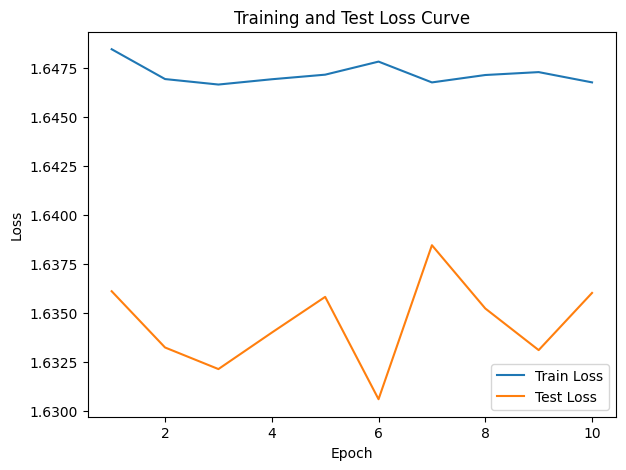

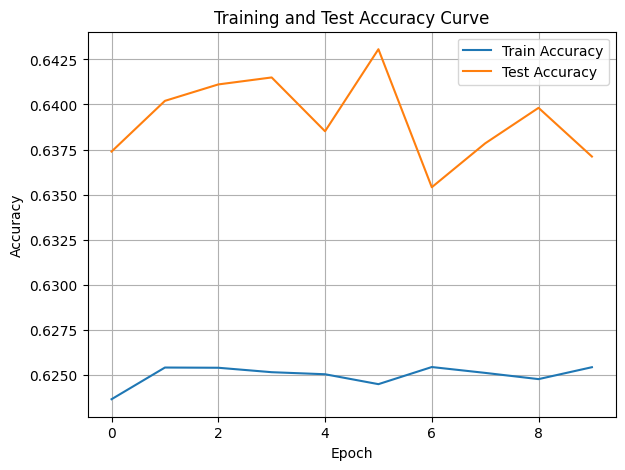

./saved_models/model_23.pth
Training Model with id 21


Training Process:  10%|█         | 1/10 [00:37<05:37, 37.55s/it]

Epoch [1/10], Train F1:0.590490303793308, Train Loss: 1.6471, Train Acc: 0.6250, Test F1:0.6037598889296734, Test Loss: 1.6331, Test Acc: 0.6413


Training Process:  20%|██        | 2/10 [01:17<05:10, 38.85s/it]

Epoch [2/10], Train F1:0.5909552470090923, Train Loss: 1.6467, Train Acc: 0.6254, Test F1:0.6053481464807274, Test Loss: 1.6316, Test Acc: 0.6425


Training Process:  30%|███       | 3/10 [01:57<04:35, 39.39s/it]

Epoch [3/10], Train F1:0.590774908028, Train Loss: 1.6467, Train Acc: 0.6253, Test F1:0.6048294286197338, Test Loss: 1.6315, Test Acc: 0.6421


Training Process:  40%|████      | 4/10 [02:40<04:05, 40.91s/it]

Epoch [4/10], Train F1:0.5904719428575924, Train Loss: 1.6470, Train Acc: 0.6250, Test F1:0.6028287357617339, Test Loss: 1.6332, Test Acc: 0.6406


Training Process:  50%|█████     | 5/10 [03:24<03:29, 41.95s/it]

Epoch [5/10], Train F1:0.5908090361320073, Train Loss: 1.6467, Train Acc: 0.6253, Test F1:0.6046981726428051, Test Loss: 1.6320, Test Acc: 0.6419


Training Process:  60%|██████    | 6/10 [04:09<02:52, 43.00s/it]

Epoch [6/10], Train F1:0.5907906015725738, Train Loss: 1.6467, Train Acc: 0.6253, Test F1:0.6051185168312416, Test Loss: 1.6317, Test Acc: 0.6422


Training Process:  70%|███████   | 7/10 [04:56<02:12, 44.30s/it]

Epoch [7/10], Train F1:0.5908221425414426, Train Loss: 1.6467, Train Acc: 0.6253, Test F1:0.6055611969730521, Test Loss: 1.6312, Test Acc: 0.6426


Training Process:  80%|████████  | 8/10 [05:44<01:30, 45.40s/it]

Epoch [8/10], Train F1:0.5908781833471353, Train Loss: 1.6467, Train Acc: 0.6254, Test F1:0.6048464913146919, Test Loss: 1.6317, Test Acc: 0.6421


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.16s/it]

Epoch [9/10], Train F1:0.59083879207619, Train Loss: 1.6467, Train Acc: 0.6254, Test F1:0.605512762647234, Test Loss: 1.6312, Test Acc: 0.6426


Training Process: 100%|██████████| 10/10 [07:27<00:00, 44.72s/it]

Epoch [10/10], Train F1:0.590865768520086, Train Loss: 1.6467, Train Acc: 0.6254, Test F1:0.6050300278225832, Test Loss: 1.6313, Test Acc: 0.6423
Total Epochs: 10
Train loss start: 1.6530945301055908, Train loss end: 1.5108076333999634
Highest Mean Train Accuracy (over epoch): 0.6254119505646729
Test loss start: 1.5750226974487305, Test loss end: 1.5931262969970703
Highest mean Test Accuracy (over epoch): 0.642614656587074


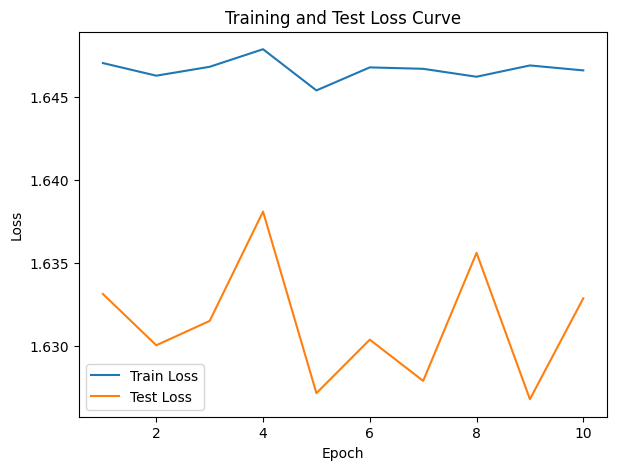

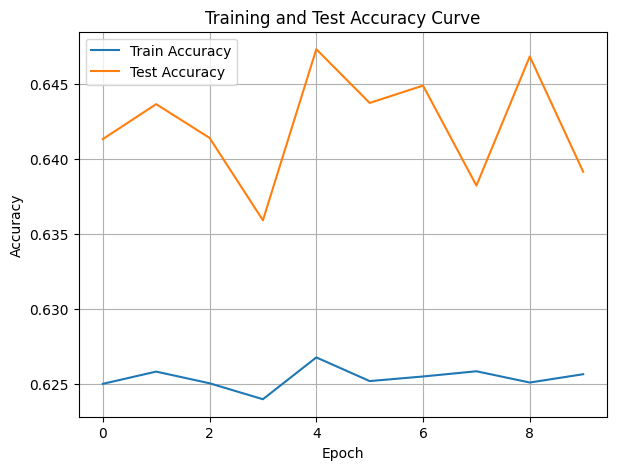

./saved_models/model_21.pth
Training Model with id 23


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.59s/it]

Epoch [1/10], Train F1:0.5914585776097736, Train Loss: 1.6463, Train Acc: 0.6260, Test F1:0.6066058673538551, Test Loss: 1.6287, Test Acc: 0.6435


Training Process:  20%|██        | 2/10 [01:17<05:10, 38.76s/it]

Epoch [2/10], Train F1:0.590681869369252, Train Loss: 1.6468, Train Acc: 0.6253, Test F1:0.6013601501931602, Test Loss: 1.6335, Test Acc: 0.6393


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.80s/it]

Epoch [3/10], Train F1:0.5906602146203506, Train Loss: 1.6468, Train Acc: 0.6253, Test F1:0.5950261246544313, Test Loss: 1.6377, Test Acc: 0.6345


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.46s/it]

Epoch [4/10], Train F1:0.5908607548579141, Train Loss: 1.6467, Train Acc: 0.6254, Test F1:0.5941781411286386, Test Loss: 1.6380, Test Acc: 0.6339


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.79s/it]

Epoch [5/10], Train F1:0.5909663840217623, Train Loss: 1.6466, Train Acc: 0.6255, Test F1:0.5935192382069527, Test Loss: 1.6379, Test Acc: 0.6337


Training Process:  60%|██████    | 6/10 [04:08<02:51, 42.75s/it]

Epoch [6/10], Train F1:0.5909344179211008, Train Loss: 1.6466, Train Acc: 0.6255, Test F1:0.5940089101763799, Test Loss: 1.6379, Test Acc: 0.6340


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.23s/it]

Epoch [7/10], Train F1:0.5911555952287769, Train Loss: 1.6464, Train Acc: 0.6257, Test F1:0.5938233669208696, Test Loss: 1.6381, Test Acc: 0.6338


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.61s/it]

Epoch [8/10], Train F1:0.5911667480894193, Train Loss: 1.6464, Train Acc: 0.6257, Test F1:0.5933493548579996, Test Loss: 1.6386, Test Acc: 0.6333


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.22s/it]

Epoch [9/10], Train F1:0.591252690877069, Train Loss: 1.6464, Train Acc: 0.6258, Test F1:0.5943194142010373, Test Loss: 1.6381, Test Acc: 0.6340


Training Process: 100%|██████████| 10/10 [07:27<00:00, 44.73s/it]


Epoch [10/10], Train F1:0.5912931037043505, Train Loss: 1.6464, Train Acc: 0.6258, Test F1:0.5938721681577981, Test Loss: 1.6385, Test Acc: 0.6336
Total Epochs: 10
Train loss start: 1.6619234085083008, Train loss end: 1.6116130352020264
Highest Mean Train Accuracy (over epoch): 0.6260448044381312
Test loss start: 1.577789068222046, Test loss end: 1.5883468389511108
Highest mean Test Accuracy (over epoch): 0.6435347780708944


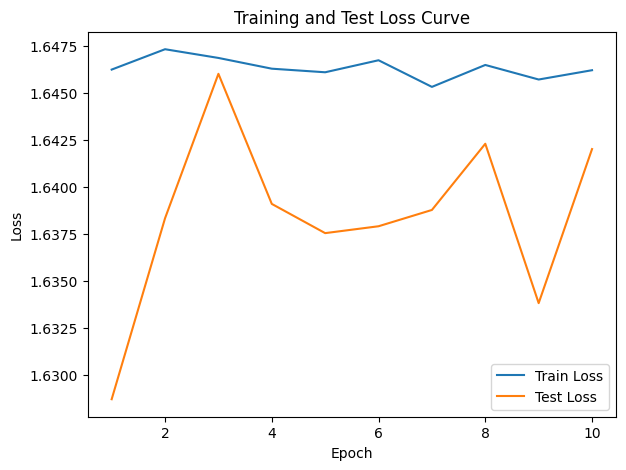

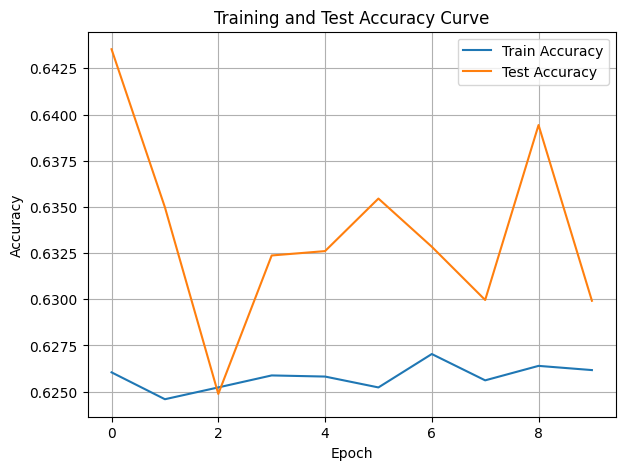

./saved_models/model_23.pth
Training Model with id 24


Training Process:  10%|█         | 1/10 [00:37<05:38, 37.66s/it]

Epoch [1/10], Train F1:0.5918145422891612, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.6045869463602216, Test Loss: 1.6300, Test Acc: 0.6419


Training Process:  20%|██        | 2/10 [01:17<05:11, 38.93s/it]

Epoch [2/10], Train F1:0.5918687675450589, Train Loss: 1.6457, Train Acc: 0.6264, Test F1:0.5983925908304675, Test Loss: 1.6359, Test Acc: 0.6370


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.77s/it]

Epoch [3/10], Train F1:0.5918078946927429, Train Loss: 1.6457, Train Acc: 0.6264, Test F1:0.6007303768238152, Test Loss: 1.6344, Test Acc: 0.6386


Training Process:  40%|████      | 4/10 [02:39<04:02, 40.37s/it]

Epoch [4/10], Train F1:0.591785180107184, Train Loss: 1.6457, Train Acc: 0.6263, Test F1:0.5992748667337604, Test Loss: 1.6354, Test Acc: 0.6376


Training Process:  50%|█████     | 5/10 [03:23<03:28, 41.66s/it]

Epoch [5/10], Train F1:0.5917865310193877, Train Loss: 1.6458, Train Acc: 0.6263, Test F1:0.5980023561644163, Test Loss: 1.6360, Test Acc: 0.6367


Training Process:  60%|██████    | 6/10 [04:08<02:50, 42.66s/it]

Epoch [6/10], Train F1:0.5916491005874385, Train Loss: 1.6459, Train Acc: 0.6262, Test F1:0.598763860083923, Test Loss: 1.6354, Test Acc: 0.6372


Training Process:  70%|███████   | 7/10 [04:55<02:12, 44.16s/it]

Epoch [7/10], Train F1:0.5916364294557163, Train Loss: 1.6459, Train Acc: 0.6262, Test F1:0.5988548374919452, Test Loss: 1.6352, Test Acc: 0.6373


Training Process:  80%|████████  | 8/10 [05:45<01:31, 45.94s/it]

Epoch [8/10], Train F1:0.5917664699236637, Train Loss: 1.6458, Train Acc: 0.6263, Test F1:0.6000803904480215, Test Loss: 1.6343, Test Acc: 0.6382


Training Process:  90%|█████████ | 9/10 [06:35<00:47, 47.49s/it]

Epoch [9/10], Train F1:0.5918590394537584, Train Loss: 1.6457, Train Acc: 0.6264, Test F1:0.5993432543097145, Test Loss: 1.6348, Test Acc: 0.6376


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.80s/it]


Epoch [10/10], Train F1:0.5917565138486298, Train Loss: 1.6458, Train Acc: 0.6263, Test F1:0.5986563969236871, Test Loss: 1.6354, Test Acc: 0.6370
Total Epochs: 10
Train loss start: 1.6841340065002441, Train loss end: 1.7807291746139526
Highest Mean Train Accuracy (over epoch): 0.6263939412722986
Test loss start: 1.5812206268310547, Test loss end: 1.5951615571975708
Highest mean Test Accuracy (over epoch): 0.6419430242162689


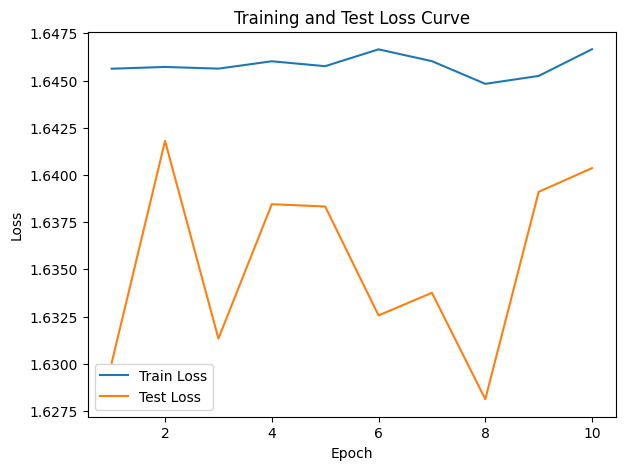

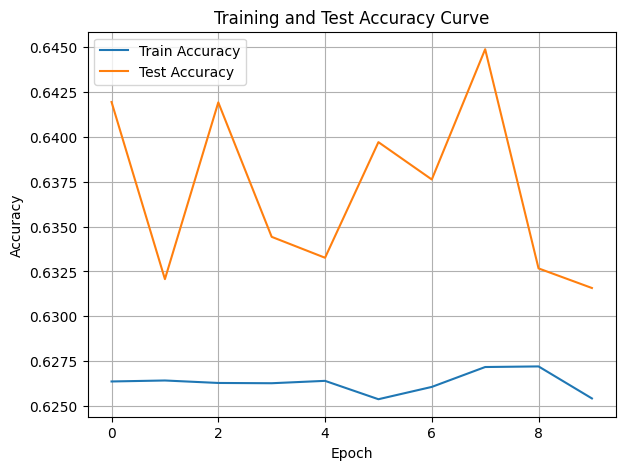

./saved_models/model_24.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:37<05:41, 37.94s/it]

Epoch [1/10], Train F1:0.5916632877904003, Train Loss: 1.6460, Train Acc: 0.6262, Test F1:0.6006548524478688, Test Loss: 1.6343, Test Acc: 0.6393


Training Process:  20%|██        | 2/10 [01:17<05:10, 38.77s/it]

Epoch [2/10], Train F1:0.5913599446690538, Train Loss: 1.6462, Train Acc: 0.6259, Test F1:0.5978099802622461, Test Loss: 1.6360, Test Acc: 0.6366


Training Process:  30%|███       | 3/10 [01:58<04:38, 39.76s/it]

Epoch [3/10], Train F1:0.5915569519333486, Train Loss: 1.6460, Train Acc: 0.6262, Test F1:0.5946368526226198, Test Loss: 1.6384, Test Acc: 0.6343


Training Process:  40%|████      | 4/10 [02:40<04:05, 40.85s/it]

Epoch [4/10], Train F1:0.5915235359257331, Train Loss: 1.6459, Train Acc: 0.6261, Test F1:0.5946444934165733, Test Loss: 1.6385, Test Acc: 0.6341


Training Process:  50%|█████     | 5/10 [03:24<03:29, 41.90s/it]

Epoch [5/10], Train F1:0.5915508488899704, Train Loss: 1.6459, Train Acc: 0.6261, Test F1:0.5927513657960045, Test Loss: 1.6401, Test Acc: 0.6326


Training Process:  60%|██████    | 6/10 [04:09<02:52, 43.03s/it]

Epoch [6/10], Train F1:0.5917314566956946, Train Loss: 1.6458, Train Acc: 0.6263, Test F1:0.5889613870456369, Test Loss: 1.6421, Test Acc: 0.6298


Training Process:  70%|███████   | 7/10 [04:56<02:13, 44.37s/it]

Epoch [7/10], Train F1:0.591731471958986, Train Loss: 1.6458, Train Acc: 0.6263, Test F1:0.587708703864298, Test Loss: 1.6430, Test Acc: 0.6289


Training Process:  80%|████████  | 8/10 [05:46<01:31, 45.89s/it]

Epoch [8/10], Train F1:0.5917868374779959, Train Loss: 1.6457, Train Acc: 0.6264, Test F1:0.5888382133788987, Test Loss: 1.6423, Test Acc: 0.6298


Training Process:  90%|█████████ | 9/10 [06:36<00:47, 47.32s/it]

Epoch [9/10], Train F1:0.5918074161601304, Train Loss: 1.6457, Train Acc: 0.6264, Test F1:0.5895096552733465, Test Loss: 1.6419, Test Acc: 0.6302


Training Process: 100%|██████████| 10/10 [07:28<00:00, 44.86s/it]


Epoch [10/10], Train F1:0.5918276302699578, Train Loss: 1.6457, Train Acc: 0.6264, Test F1:0.5879449191562657, Test Loss: 1.6424, Test Acc: 0.6292
Total Epochs: 10
Train loss start: 1.6633450984954834, Train loss end: 1.7431560754776
Highest Mean Train Accuracy (over epoch): 0.6264101606706897
Test loss start: 1.587048053741455, Test loss end: 1.5933630466461182
Highest mean Test Accuracy (over epoch): 0.6393057752151418


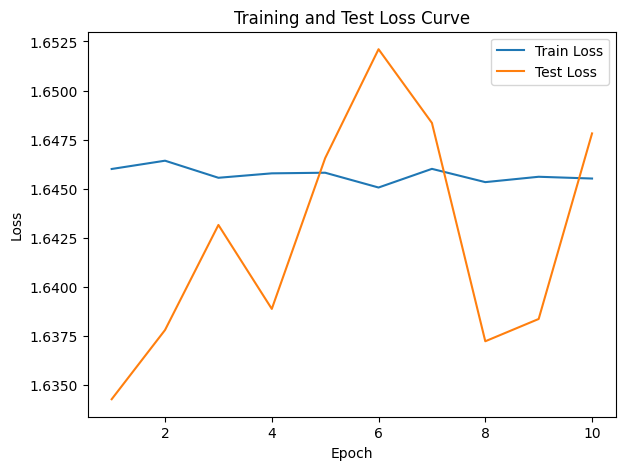

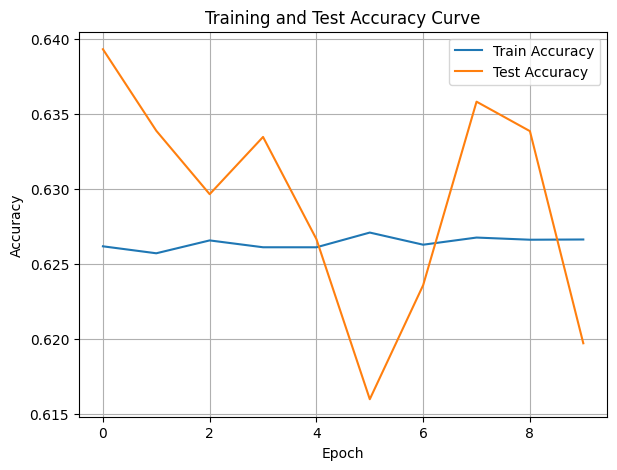

./saved_models/model_22.pth
Training Model with id 20


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.98s/it]

Epoch [1/10], Train F1:0.5915818323833342, Train Loss: 1.6456, Train Acc: 0.6262, Test F1:0.597903621806331, Test Loss: 1.6366, Test Acc: 0.6360


Training Process:  20%|██        | 2/10 [01:16<05:05, 38.25s/it]

Epoch [2/10], Train F1:0.5920586388931455, Train Loss: 1.6453, Train Acc: 0.6267, Test F1:0.5839691522807079, Test Loss: 1.6442, Test Acc: 0.6264


Training Process:  30%|███       | 3/10 [01:56<04:36, 39.44s/it]

Epoch [3/10], Train F1:0.5921034336451505, Train Loss: 1.6452, Train Acc: 0.6267, Test F1:0.5806197265928761, Test Loss: 1.6454, Test Acc: 0.6242


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.43s/it]

Epoch [4/10], Train F1:0.5923581683161843, Train Loss: 1.6451, Train Acc: 0.6269, Test F1:0.5846257456666295, Test Loss: 1.6433, Test Acc: 0.6270


Training Process:  50%|█████     | 5/10 [03:22<03:27, 41.56s/it]

Epoch [5/10], Train F1:0.5923224491802453, Train Loss: 1.6451, Train Acc: 0.6269, Test F1:0.5864787460252364, Test Loss: 1.6425, Test Acc: 0.6282


Training Process:  60%|██████    | 6/10 [04:08<02:52, 43.02s/it]

Epoch [6/10], Train F1:0.5923589900692401, Train Loss: 1.6451, Train Acc: 0.6269, Test F1:0.5873531255594829, Test Loss: 1.6423, Test Acc: 0.6289


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.14s/it]

Epoch [7/10], Train F1:0.5924380801719713, Train Loss: 1.6451, Train Acc: 0.6269, Test F1:0.5892321920807259, Test Loss: 1.6413, Test Acc: 0.6301


Training Process:  80%|████████  | 8/10 [05:44<01:31, 45.86s/it]

Epoch [8/10], Train F1:0.5924567286073101, Train Loss: 1.6451, Train Acc: 0.6270, Test F1:0.5899995028778694, Test Loss: 1.6412, Test Acc: 0.6306


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.28s/it]

Epoch [9/10], Train F1:0.5923663924018557, Train Loss: 1.6452, Train Acc: 0.6269, Test F1:0.589643383569237, Test Loss: 1.6413, Test Acc: 0.6304


Training Process: 100%|██████████| 10/10 [07:27<00:00, 44.71s/it]


Epoch [10/10], Train F1:0.5924131491277087, Train Loss: 1.6451, Train Acc: 0.6269, Test F1:0.5900792043481619, Test Loss: 1.6411, Test Acc: 0.6307
Total Epochs: 10
Train loss start: 1.646100401878357, Train loss end: 1.8194565773010254
Highest Mean Train Accuracy (over epoch): 0.6269725196283872
Test loss start: 1.5819251537322998, Test loss end: 1.5900298357009888
Highest mean Test Accuracy (over epoch): 0.6360190186072123


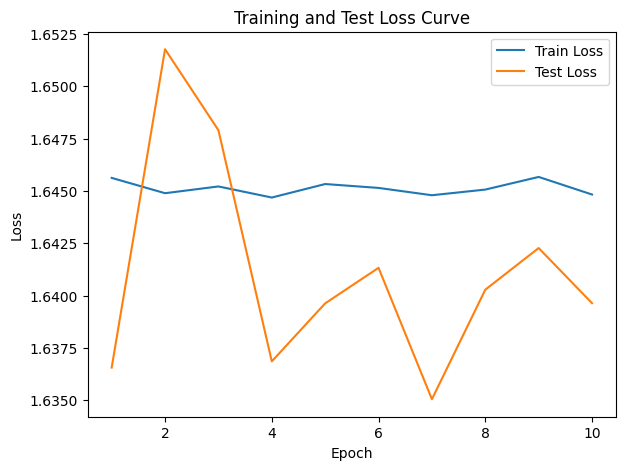

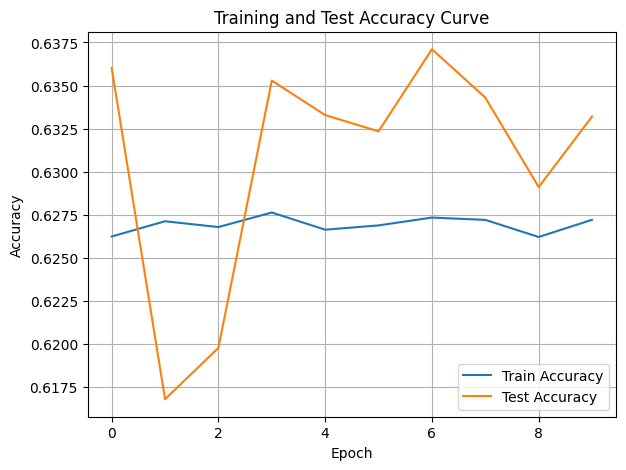

./saved_models/model_20.pth
Training Model with id 18


Training Process:  10%|█         | 1/10 [00:36<05:25, 36.19s/it]

Epoch [1/10], Train F1:0.5923148974279242, Train Loss: 1.6450, Train Acc: 0.6268, Test F1:0.572509072269962, Test Loss: 1.6489, Test Acc: 0.6196


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.97s/it]

Epoch [2/10], Train F1:0.5923282911026976, Train Loss: 1.6452, Train Acc: 0.6267, Test F1:0.5897561703900654, Test Loss: 1.6416, Test Acc: 0.6311


Training Process:  30%|███       | 3/10 [01:56<04:35, 39.41s/it]

Epoch [3/10], Train F1:0.59259253693606, Train Loss: 1.6450, Train Acc: 0.6270, Test F1:0.5859282323565238, Test Loss: 1.6444, Test Acc: 0.6280


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.39s/it]

Epoch [4/10], Train F1:0.5927770338208126, Train Loss: 1.6448, Train Acc: 0.6272, Test F1:0.5895741103476437, Test Loss: 1.6426, Test Acc: 0.6305


Training Process:  50%|█████     | 5/10 [03:22<03:28, 41.68s/it]

Epoch [5/10], Train F1:0.5927158268592997, Train Loss: 1.6449, Train Acc: 0.6271, Test F1:0.5864809191793287, Test Loss: 1.6438, Test Acc: 0.6283


Training Process:  60%|██████    | 6/10 [04:06<02:50, 42.61s/it]

Epoch [6/10], Train F1:0.5926731151815562, Train Loss: 1.6450, Train Acc: 0.6271, Test F1:0.5860987627608314, Test Loss: 1.6442, Test Acc: 0.6280


Training Process:  70%|███████   | 7/10 [04:54<02:12, 44.21s/it]

Epoch [7/10], Train F1:0.5928765654880508, Train Loss: 1.6447, Train Acc: 0.6273, Test F1:0.586222820618515, Test Loss: 1.6442, Test Acc: 0.6281


Training Process:  80%|████████  | 8/10 [05:43<01:31, 45.75s/it]

Epoch [8/10], Train F1:0.5927995025208873, Train Loss: 1.6448, Train Acc: 0.6272, Test F1:0.5858041615072132, Test Loss: 1.6445, Test Acc: 0.6278


Training Process:  90%|█████████ | 9/10 [06:34<00:47, 47.34s/it]

Epoch [9/10], Train F1:0.5927669720551492, Train Loss: 1.6448, Train Acc: 0.6272, Test F1:0.5859724707962087, Test Loss: 1.6446, Test Acc: 0.6279


Training Process: 100%|██████████| 10/10 [07:27<00:00, 44.72s/it]


Epoch [10/10], Train F1:0.5927831070660664, Train Loss: 1.6448, Train Acc: 0.6272, Test F1:0.5876098208335371, Test Loss: 1.6435, Test Acc: 0.6290
Total Epochs: 10
Train loss start: 1.5442522764205933, Train loss end: 1.614676833152771
Highest Mean Train Accuracy (over epoch): 0.6272764659404427
Test loss start: 1.62380051612854, Test loss end: 1.5912737846374512
Highest mean Test Accuracy (over epoch): 0.6310628713758837


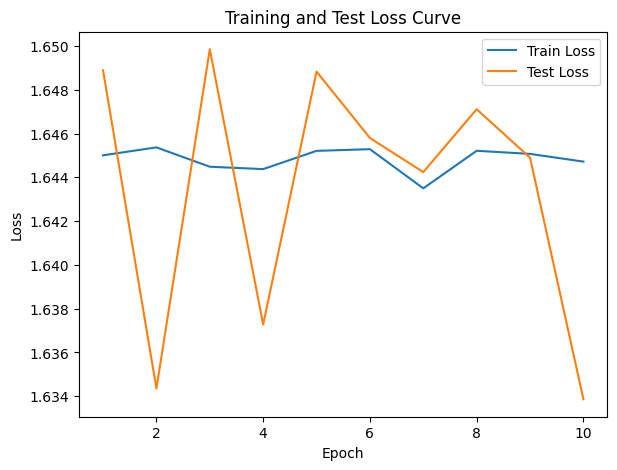

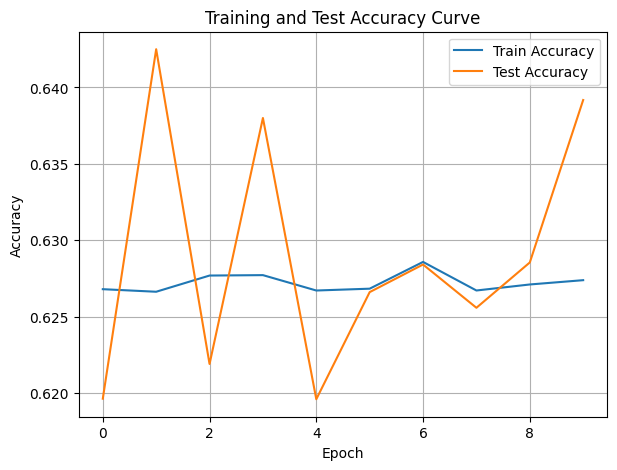

./saved_models/model_18.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [27]:
coverDTEmlp16b.train_DTE()

Training Process:   0%|          | 1/310 [00:37<3:13:06, 37.50s/it]

Epoch [1/310], Train F1:0.37256667819816264, Train Loss: 1.9386, Train Acc: 0.3966, Test F1:0.49698673709559094, Test Loss: 1.8449, Test Acc: 0.5390


Training Process:   1%|          | 2/310 [01:16<3:16:14, 38.23s/it]

Epoch [2/310], Train F1:0.43383615519385305, Train Loss: 1.8627, Train Acc: 0.4544, Test F1:0.5027108764891883, Test Loss: 1.7898, Test Acc: 0.5512


Training Process:   1%|          | 3/310 [01:56<3:20:55, 39.27s/it]

Epoch [3/310], Train F1:0.45723518171198063, Train Loss: 1.8211, Train Acc: 0.4834, Test F1:0.5094926392018265, Test Loss: 1.7613, Test Acc: 0.5622


Training Process:   1%|▏         | 4/310 [02:38<3:25:54, 40.38s/it]

Epoch [4/310], Train F1:0.4712020467547917, Train Loss: 1.7955, Train Acc: 0.5016, Test F1:0.5144962744938385, Test Loss: 1.7424, Test Acc: 0.5687


Training Process:   2%|▏         | 5/310 [03:21<3:28:35, 41.03s/it]

Epoch [5/310], Train F1:0.4829404486500368, Train Loss: 1.7776, Train Acc: 0.5150, Test F1:0.5218873805527386, Test Loss: 1.7294, Test Acc: 0.5743


Training Process:   2%|▏         | 6/310 [04:06<3:35:19, 42.50s/it]

Epoch [6/310], Train F1:0.4928863056044176, Train Loss: 1.7640, Train Acc: 0.5255, Test F1:0.5274686836782503, Test Loss: 1.7191, Test Acc: 0.5788


Training Process:   2%|▏         | 7/310 [04:53<3:42:35, 44.08s/it]

Epoch [7/310], Train F1:0.5010251453462177, Train Loss: 1.7534, Train Acc: 0.5338, Test F1:0.5371531244679468, Test Loss: 1.7097, Test Acc: 0.5853


Training Process:   3%|▎         | 8/310 [05:42<3:49:33, 45.61s/it]

Epoch [8/310], Train F1:0.5078013739252035, Train Loss: 1.7447, Train Acc: 0.5407, Test F1:0.5437475501549904, Test Loss: 1.7022, Test Acc: 0.5898


Training Process:   3%|▎         | 9/310 [06:32<3:55:20, 46.91s/it]

Epoch [9/310], Train F1:0.5134890396007422, Train Loss: 1.7376, Train Acc: 0.5465, Test F1:0.5471111310097947, Test Loss: 1.6972, Test Acc: 0.5929


Training Process:   3%|▎         | 10/310 [07:24<4:02:05, 48.42s/it]

Epoch [10/310], Train F1:0.5183229724580747, Train Loss: 1.7316, Train Acc: 0.5513, Test F1:0.5523894652845148, Test Loss: 1.6915, Test Acc: 0.5968


Training Process:   4%|▎         | 11/310 [08:16<4:07:13, 49.61s/it]

Epoch [11/310], Train F1:0.5224305468014757, Train Loss: 1.7264, Train Acc: 0.5555, Test F1:0.5557810215627297, Test Loss: 1.6875, Test Acc: 0.5995


Training Process:   4%|▍         | 12/310 [09:11<4:14:56, 51.33s/it]

Epoch [12/310], Train F1:0.5260593564625282, Train Loss: 1.7220, Train Acc: 0.5592, Test F1:0.5601387960534279, Test Loss: 1.6832, Test Acc: 0.6028


Training Process:   4%|▍         | 13/310 [10:08<4:22:31, 53.04s/it]

Epoch [13/310], Train F1:0.5293558758575871, Train Loss: 1.7180, Train Acc: 0.5625, Test F1:0.563242536933676, Test Loss: 1.6796, Test Acc: 0.6053


Training Process:   5%|▍         | 14/310 [11:06<4:28:19, 54.39s/it]

Epoch [14/310], Train F1:0.5322543529788566, Train Loss: 1.7145, Train Acc: 0.5655, Test F1:0.5660304046487821, Test Loss: 1.6765, Test Acc: 0.6076


Training Process:   5%|▍         | 15/310 [12:06<4:35:39, 56.07s/it]

Epoch [15/310], Train F1:0.5349035662799463, Train Loss: 1.7113, Train Acc: 0.5681, Test F1:0.5690265172343038, Test Loss: 1.6734, Test Acc: 0.6101


Training Process:   5%|▌         | 16/310 [13:06<4:41:32, 57.46s/it]

Epoch [16/310], Train F1:0.5372770447989428, Train Loss: 1.7084, Train Acc: 0.5705, Test F1:0.572053006814142, Test Loss: 1.6706, Test Acc: 0.6125


Training Process:   5%|▌         | 17/310 [14:09<4:47:41, 58.91s/it]

Epoch [17/310], Train F1:0.5393948507836026, Train Loss: 1.7059, Train Acc: 0.5727, Test F1:0.5740046527462376, Test Loss: 1.6683, Test Acc: 0.6142


Training Process:   6%|▌         | 18/310 [15:13<4:54:21, 60.48s/it]

Epoch [18/310], Train F1:0.5413491847062707, Train Loss: 1.7035, Train Acc: 0.5747, Test F1:0.5754319063780053, Test Loss: 1.6665, Test Acc: 0.6155


Training Process:   6%|▌         | 19/310 [16:18<4:59:57, 61.85s/it]

Epoch [19/310], Train F1:0.5431750012868988, Train Loss: 1.7014, Train Acc: 0.5765, Test F1:0.5773234639538736, Test Loss: 1.6645, Test Acc: 0.6171


Training Process:   6%|▋         | 20/310 [17:26<5:08:09, 63.76s/it]

Epoch [20/310], Train F1:0.544848451866947, Train Loss: 1.6994, Train Acc: 0.5782, Test F1:0.5791645904820106, Test Loss: 1.6626, Test Acc: 0.6187


Training Process:   7%|▋         | 21/310 [18:35<5:15:17, 65.46s/it]

Epoch [21/310], Train F1:0.5464235112387683, Train Loss: 1.6976, Train Acc: 0.5798, Test F1:0.5810644014245242, Test Loss: 1.6608, Test Acc: 0.6204


Training Process:   7%|▋         | 22/310 [19:47<5:22:51, 67.26s/it]

Epoch [22/310], Train F1:0.5478691417355903, Train Loss: 1.6959, Train Acc: 0.5813, Test F1:0.582292709283643, Test Loss: 1.6594, Test Acc: 0.6215


Training Process:   7%|▋         | 23/310 [20:59<5:29:02, 68.79s/it]

Epoch [23/310], Train F1:0.5492066581728248, Train Loss: 1.6943, Train Acc: 0.5827, Test F1:0.5838564674252511, Test Loss: 1.6579, Test Acc: 0.6229


Training Process:   8%|▊         | 24/310 [22:13<5:34:47, 70.24s/it]

Epoch [24/310], Train F1:0.550459311798345, Train Loss: 1.6928, Train Acc: 0.5840, Test F1:0.5850451674069801, Test Loss: 1.6566, Test Acc: 0.6240


Training Process:   8%|▊         | 25/310 [23:29<5:41:32, 71.90s/it]

Epoch [25/310], Train F1:0.5516484816661281, Train Loss: 1.6914, Train Acc: 0.5852, Test F1:0.5862460536794417, Test Loss: 1.6553, Test Acc: 0.6250


Training Process:   8%|▊         | 26/310 [24:47<5:49:49, 73.91s/it]

Epoch [26/310], Train F1:0.552755779936736, Train Loss: 1.6901, Train Acc: 0.5863, Test F1:0.5875501711313617, Test Loss: 1.6540, Test Acc: 0.6262


Training Process:   9%|▊         | 27/310 [26:05<5:54:10, 75.09s/it]

Epoch [27/310], Train F1:0.553790762941542, Train Loss: 1.6889, Train Acc: 0.5874, Test F1:0.5887320805159894, Test Loss: 1.6529, Test Acc: 0.6273


Training Process:   9%|▉         | 28/310 [27:27<6:02:18, 77.09s/it]

Epoch [28/310], Train F1:0.5547820894657157, Train Loss: 1.6877, Train Acc: 0.5884, Test F1:0.5896301260866313, Test Loss: 1.6519, Test Acc: 0.6281


Training Process:   9%|▉         | 29/310 [28:49<6:08:09, 78.61s/it]

Epoch [29/310], Train F1:0.5556747584159762, Train Loss: 1.6867, Train Acc: 0.5893, Test F1:0.5905097700277737, Test Loss: 1.6510, Test Acc: 0.6289


Training Process:  10%|▉         | 30/310 [30:12<6:12:46, 79.88s/it]

Epoch [30/310], Train F1:0.5565371896921135, Train Loss: 1.6857, Train Acc: 0.5902, Test F1:0.5912260041180012, Test Loss: 1.6502, Test Acc: 0.6296


Training Process:  10%|█         | 31/310 [31:38<6:19:31, 81.62s/it]

Epoch [31/310], Train F1:0.5573283346687916, Train Loss: 1.6847, Train Acc: 0.5910, Test F1:0.5920136599147436, Test Loss: 1.6493, Test Acc: 0.6304


Training Process:  10%|█         | 32/310 [33:04<6:25:19, 83.16s/it]

Epoch [32/310], Train F1:0.558088149735998, Train Loss: 1.6838, Train Acc: 0.5918, Test F1:0.5924003434852851, Test Loss: 1.6488, Test Acc: 0.6308


Training Process:  11%|█         | 33/310 [34:33<6:32:02, 84.92s/it]

Epoch [33/310], Train F1:0.5588168001799602, Train Loss: 1.6830, Train Acc: 0.5926, Test F1:0.5930503323145772, Test Loss: 1.6481, Test Acc: 0.6314


Training Process:  11%|█         | 34/310 [36:03<6:37:12, 86.35s/it]

Epoch [34/310], Train F1:0.5594785825904689, Train Loss: 1.6822, Train Acc: 0.5933, Test F1:0.5937111450764991, Test Loss: 1.6473, Test Acc: 0.6320


Training Process:  11%|█▏        | 35/310 [37:35<6:43:10, 87.96s/it]

Epoch [35/310], Train F1:0.5601471610590084, Train Loss: 1.6814, Train Acc: 0.5939, Test F1:0.5944635908390964, Test Loss: 1.6466, Test Acc: 0.6327


Training Process:  12%|█▏        | 36/310 [39:09<6:49:48, 89.74s/it]

Epoch [36/310], Train F1:0.5607939015402149, Train Loss: 1.6806, Train Acc: 0.5946, Test F1:0.5949935761358297, Test Loss: 1.6460, Test Acc: 0.6332


Training Process:  12%|█▏        | 37/310 [40:43<6:55:02, 91.22s/it]

Epoch [37/310], Train F1:0.5614084932792535, Train Loss: 1.6799, Train Acc: 0.5952, Test F1:0.5952605524519042, Test Loss: 1.6456, Test Acc: 0.6335


Training Process:  12%|█▏        | 38/310 [42:18<6:58:57, 92.42s/it]

Epoch [38/310], Train F1:0.5619911769578151, Train Loss: 1.6793, Train Acc: 0.5959, Test F1:0.5957393730734744, Test Loss: 1.6451, Test Acc: 0.6340


Training Process:  13%|█▎        | 39/310 [43:56<7:03:49, 93.83s/it]

Epoch [39/310], Train F1:0.5625498308612841, Train Loss: 1.6786, Train Acc: 0.5964, Test F1:0.5959561182748773, Test Loss: 1.6447, Test Acc: 0.6342


Training Process:  13%|█▎        | 40/310 [45:36<7:11:01, 95.78s/it]

Epoch [40/310], Train F1:0.5630639712377642, Train Loss: 1.6780, Train Acc: 0.5970, Test F1:0.5965125857052751, Test Loss: 1.6441, Test Acc: 0.6348


Training Process:  13%|█▎        | 41/310 [47:17<7:16:12, 97.29s/it]

Epoch [41/310], Train F1:0.5635955155346587, Train Loss: 1.6774, Train Acc: 0.5975, Test F1:0.5969080786008744, Test Loss: 1.6437, Test Acc: 0.6351


Training Process:  14%|█▎        | 42/310 [48:59<7:21:50, 98.92s/it]

Epoch [42/310], Train F1:0.5641020512208472, Train Loss: 1.6768, Train Acc: 0.5980, Test F1:0.5973458507686897, Test Loss: 1.6432, Test Acc: 0.6356


Training Process:  14%|█▍        | 43/310 [50:44<7:27:33, 100.58s/it]

Epoch [43/310], Train F1:0.5645687546136537, Train Loss: 1.6763, Train Acc: 0.5985, Test F1:0.5977096995474509, Test Loss: 1.6428, Test Acc: 0.6359


Training Process:  14%|█▍        | 44/310 [52:29<7:31:39, 101.88s/it]

Epoch [44/310], Train F1:0.5650120500603609, Train Loss: 1.6757, Train Acc: 0.5990, Test F1:0.5981415151257773, Test Loss: 1.6423, Test Acc: 0.6363


Training Process:  15%|█▍        | 45/310 [54:16<7:37:35, 103.60s/it]

Epoch [45/310], Train F1:0.5654418464058977, Train Loss: 1.6752, Train Acc: 0.5994, Test F1:0.5984149734211038, Test Loss: 1.6420, Test Acc: 0.6366


Training Process:  15%|█▍        | 46/310 [56:04<7:41:20, 104.85s/it]

Epoch [46/310], Train F1:0.5658650092166329, Train Loss: 1.6748, Train Acc: 0.5998, Test F1:0.5988805829962935, Test Loss: 1.6415, Test Acc: 0.6371


Training Process:  15%|█▌        | 47/310 [57:55<7:47:21, 106.62s/it]

Epoch [47/310], Train F1:0.566252830041457, Train Loss: 1.6743, Train Acc: 0.6003, Test F1:0.5993406630793016, Test Loss: 1.6410, Test Acc: 0.6375


Training Process:  15%|█▌        | 48/310 [59:47<7:53:13, 108.37s/it]

Epoch [48/310], Train F1:0.5666538957091487, Train Loss: 1.6738, Train Acc: 0.6007, Test F1:0.5998218163039406, Test Loss: 1.6406, Test Acc: 0.6379


Training Process:  16%|█▌        | 49/310 [1:01:40<7:57:22, 109.74s/it]

Epoch [49/310], Train F1:0.567048619859958, Train Loss: 1.6734, Train Acc: 0.6011, Test F1:0.6002235378778233, Test Loss: 1.6402, Test Acc: 0.6382


Training Process:  16%|█▌        | 50/310 [1:03:35<8:02:16, 111.29s/it]

Epoch [50/310], Train F1:0.5674161557252448, Train Loss: 1.6730, Train Acc: 0.6014, Test F1:0.6004849009037566, Test Loss: 1.6399, Test Acc: 0.6385


Training Process:  16%|█▋        | 51/310 [1:05:32<8:07:09, 112.86s/it]

Epoch [51/310], Train F1:0.5677969202671571, Train Loss: 1.6725, Train Acc: 0.6018, Test F1:0.6008877320249622, Test Loss: 1.6395, Test Acc: 0.6389


Training Process:  17%|█▋        | 52/310 [1:07:30<8:12:07, 114.45s/it]

Epoch [52/310], Train F1:0.5681799478853508, Train Loss: 1.6721, Train Acc: 0.6022, Test F1:0.6010823491040708, Test Loss: 1.6392, Test Acc: 0.6391


Training Process:  17%|█▋        | 53/310 [1:09:29<8:16:34, 115.93s/it]

Epoch [53/310], Train F1:0.5685262816286316, Train Loss: 1.6717, Train Acc: 0.6026, Test F1:0.6014133111203239, Test Loss: 1.6388, Test Acc: 0.6394


Training Process:  17%|█▋        | 54/310 [1:11:30<8:20:05, 117.21s/it]

Epoch [54/310], Train F1:0.5688398252923532, Train Loss: 1.6713, Train Acc: 0.6029, Test F1:0.6016865684259948, Test Loss: 1.6385, Test Acc: 0.6396


Training Process:  18%|█▊        | 55/310 [1:13:33<8:26:42, 119.22s/it]

Epoch [55/310], Train F1:0.5691551868563125, Train Loss: 1.6710, Train Acc: 0.6032, Test F1:0.6020257272719821, Test Loss: 1.6382, Test Acc: 0.6399


Training Process:  18%|█▊        | 56/310 [1:15:38<8:31:36, 120.85s/it]

Epoch [56/310], Train F1:0.5694654326954118, Train Loss: 1.6706, Train Acc: 0.6036, Test F1:0.6022798588770362, Test Loss: 1.6379, Test Acc: 0.6402


Training Process:  18%|█▊        | 57/310 [1:17:44<8:36:32, 122.50s/it]

Epoch [57/310], Train F1:0.5697735897490064, Train Loss: 1.6703, Train Acc: 0.6039, Test F1:0.6026565592604995, Test Loss: 1.6375, Test Acc: 0.6405


Training Process:  19%|█▊        | 58/310 [1:19:52<8:40:29, 123.93s/it]

Epoch [58/310], Train F1:0.5700609285784769, Train Loss: 1.6699, Train Acc: 0.6042, Test F1:0.6028423820921048, Test Loss: 1.6373, Test Acc: 0.6407


Training Process:  19%|█▉        | 59/310 [1:22:01<8:44:47, 125.45s/it]

Epoch [59/310], Train F1:0.5703531248432976, Train Loss: 1.6696, Train Acc: 0.6045, Test F1:0.603162140000546, Test Loss: 1.6370, Test Acc: 0.6410


Training Process:  19%|█▉        | 60/310 [1:24:13<8:50:43, 127.37s/it]

Epoch [60/310], Train F1:0.5706390759815333, Train Loss: 1.6693, Train Acc: 0.6048, Test F1:0.6034310228986334, Test Loss: 1.6367, Test Acc: 0.6412


Training Process:  20%|█▉        | 61/310 [1:26:25<8:54:43, 128.85s/it]

Epoch [61/310], Train F1:0.5708960378369159, Train Loss: 1.6690, Train Acc: 0.6050, Test F1:0.6036869106566006, Test Loss: 1.6365, Test Acc: 0.6415


Training Process:  20%|██        | 62/310 [1:28:40<9:00:56, 130.87s/it]

Epoch [62/310], Train F1:0.5711610775733558, Train Loss: 1.6687, Train Acc: 0.6053, Test F1:0.6037324488946394, Test Loss: 1.6363, Test Acc: 0.6415


Training Process:  20%|██        | 63/310 [1:30:57<9:06:14, 132.69s/it]

Epoch [63/310], Train F1:0.5714086806479264, Train Loss: 1.6684, Train Acc: 0.6055, Test F1:0.6039881459551438, Test Loss: 1.6361, Test Acc: 0.6418


Training Process:  21%|██        | 64/310 [1:33:15<9:10:13, 134.20s/it]

Epoch [64/310], Train F1:0.5716376907614334, Train Loss: 1.6681, Train Acc: 0.6058, Test F1:0.6041034221026633, Test Loss: 1.6359, Test Acc: 0.6419


Training Process:  21%|██        | 65/310 [1:35:37<9:17:11, 136.45s/it]

Epoch [65/310], Train F1:0.5718901669602707, Train Loss: 1.6678, Train Acc: 0.6060, Test F1:0.6043877637520518, Test Loss: 1.6356, Test Acc: 0.6421


Training Process:  21%|██▏       | 66/310 [1:37:58<9:20:41, 137.88s/it]

Epoch [66/310], Train F1:0.5721134079364447, Train Loss: 1.6676, Train Acc: 0.6063, Test F1:0.6042715280463425, Test Loss: 1.6356, Test Acc: 0.6421


Training Process:  22%|██▏       | 67/310 [1:40:24<9:27:49, 140.21s/it]

Epoch [67/310], Train F1:0.5723482860799127, Train Loss: 1.6673, Train Acc: 0.6065, Test F1:0.6045169666245171, Test Loss: 1.6354, Test Acc: 0.6423


Training Process:  22%|██▏       | 68/310 [1:42:47<9:29:16, 141.14s/it]

Epoch [68/310], Train F1:0.5725628674601588, Train Loss: 1.6671, Train Acc: 0.6067, Test F1:0.6046677334090474, Test Loss: 1.6352, Test Acc: 0.6425


Training Process:  22%|██▏       | 69/310 [1:45:12<9:31:14, 142.22s/it]

Epoch [69/310], Train F1:0.5727818687461407, Train Loss: 1.6668, Train Acc: 0.6070, Test F1:0.6048361328434857, Test Loss: 1.6350, Test Acc: 0.6426


Training Process:  23%|██▎       | 70/310 [1:47:39<9:35:22, 143.84s/it]

Epoch [70/310], Train F1:0.5729990551615821, Train Loss: 1.6666, Train Acc: 0.6072, Test F1:0.6048233496589019, Test Loss: 1.6349, Test Acc: 0.6426


Training Process:  23%|██▎       | 71/310 [1:50:07<9:37:52, 145.07s/it]

Epoch [71/310], Train F1:0.5732122662879383, Train Loss: 1.6663, Train Acc: 0.6074, Test F1:0.604995886768992, Test Loss: 1.6348, Test Acc: 0.6428


Training Process:  23%|██▎       | 72/310 [1:52:39<9:42:44, 146.91s/it]

Epoch [72/310], Train F1:0.573405651688294, Train Loss: 1.6661, Train Acc: 0.6076, Test F1:0.6051060467466529, Test Loss: 1.6346, Test Acc: 0.6429


Training Process:  24%|██▎       | 73/310 [1:55:11<9:46:35, 148.51s/it]

Epoch [73/310], Train F1:0.5736126730993848, Train Loss: 1.6659, Train Acc: 0.6078, Test F1:0.6053492869443537, Test Loss: 1.6344, Test Acc: 0.6431


Training Process:  24%|██▍       | 74/310 [1:57:44<9:49:26, 149.86s/it]

Epoch [74/310], Train F1:0.5738120577453576, Train Loss: 1.6656, Train Acc: 0.6080, Test F1:0.6055389934042521, Test Loss: 1.6342, Test Acc: 0.6433


Training Process:  24%|██▍       | 75/310 [2:00:21<9:55:46, 152.11s/it]

Epoch [75/310], Train F1:0.5740146877414521, Train Loss: 1.6654, Train Acc: 0.6082, Test F1:0.605749509140719, Test Loss: 1.6340, Test Acc: 0.6434


Training Process:  25%|██▍       | 76/310 [2:02:58<9:59:17, 153.67s/it]

Epoch [76/310], Train F1:0.5742081638035906, Train Loss: 1.6652, Train Acc: 0.6084, Test F1:0.6058804739593875, Test Loss: 1.6338, Test Acc: 0.6436


Training Process:  25%|██▍       | 77/310 [2:05:36<10:01:31, 154.90s/it]

Epoch [77/310], Train F1:0.574391798130726, Train Loss: 1.6650, Train Acc: 0.6086, Test F1:0.6060933118846078, Test Loss: 1.6336, Test Acc: 0.6437


Training Process:  25%|██▌       | 78/310 [2:08:17<10:05:58, 156.72s/it]

Epoch [78/310], Train F1:0.5745933213271395, Train Loss: 1.6648, Train Acc: 0.6088, Test F1:0.6062518980651325, Test Loss: 1.6334, Test Acc: 0.6439


Training Process:  25%|██▌       | 79/310 [2:11:00<10:09:53, 158.41s/it]

Epoch [79/310], Train F1:0.5747898111517162, Train Loss: 1.6646, Train Acc: 0.6090, Test F1:0.6063042830067622, Test Loss: 1.6333, Test Acc: 0.6439


Training Process:  26%|██▌       | 80/310 [2:13:41<10:11:15, 159.46s/it]

Epoch [80/310], Train F1:0.5749675337282396, Train Loss: 1.6644, Train Acc: 0.6092, Test F1:0.6064658723940106, Test Loss: 1.6332, Test Acc: 0.6441


Training Process:  26%|██▌       | 81/310 [2:16:27<10:15:57, 161.38s/it]

Epoch [81/310], Train F1:0.5751513069426591, Train Loss: 1.6642, Train Acc: 0.6094, Test F1:0.6065068564743034, Test Loss: 1.6331, Test Acc: 0.6441


Training Process:  26%|██▋       | 82/310 [2:19:14<10:19:34, 163.05s/it]

Epoch [82/310], Train F1:0.575312013490354, Train Loss: 1.6640, Train Acc: 0.6096, Test F1:0.6065315652844067, Test Loss: 1.6331, Test Acc: 0.6442


Training Process:  27%|██▋       | 83/310 [2:22:05<10:25:14, 165.26s/it]

Epoch [83/310], Train F1:0.5754796515748342, Train Loss: 1.6638, Train Acc: 0.6097, Test F1:0.6066555216124909, Test Loss: 1.6329, Test Acc: 0.6443


Training Process:  27%|██▋       | 84/310 [2:24:57<10:30:20, 167.35s/it]

Epoch [84/310], Train F1:0.575642464992497, Train Loss: 1.6636, Train Acc: 0.6099, Test F1:0.6067857201034572, Test Loss: 1.6328, Test Acc: 0.6444


Training Process:  27%|██▋       | 85/310 [2:27:50<10:34:04, 169.09s/it]

Epoch [85/310], Train F1:0.5758008138083388, Train Loss: 1.6634, Train Acc: 0.6101, Test F1:0.6069531796192805, Test Loss: 1.6326, Test Acc: 0.6445


Training Process:  28%|██▊       | 86/310 [2:30:45<10:37:52, 170.86s/it]

Epoch [86/310], Train F1:0.5759536925605536, Train Loss: 1.6633, Train Acc: 0.6102, Test F1:0.6070335671516299, Test Loss: 1.6325, Test Acc: 0.6446


Training Process:  28%|██▊       | 87/310 [2:33:42<10:42:02, 172.75s/it]

Epoch [87/310], Train F1:0.5761028242504098, Train Loss: 1.6631, Train Acc: 0.6104, Test F1:0.6071355185907742, Test Loss: 1.6325, Test Acc: 0.6447


Training Process:  28%|██▊       | 88/310 [2:36:43<10:47:42, 175.06s/it]

Epoch [88/310], Train F1:0.576259190721853, Train Loss: 1.6629, Train Acc: 0.6105, Test F1:0.6071877729361425, Test Loss: 1.6324, Test Acc: 0.6447


Training Process:  29%|██▊       | 89/310 [2:39:43<10:50:25, 176.59s/it]

Epoch [89/310], Train F1:0.5764207313735311, Train Loss: 1.6627, Train Acc: 0.6107, Test F1:0.6073635818682075, Test Loss: 1.6323, Test Acc: 0.6449


Training Process:  29%|██▉       | 90/310 [2:42:43<10:51:53, 177.79s/it]

Epoch [90/310], Train F1:0.576557174157981, Train Loss: 1.6626, Train Acc: 0.6108, Test F1:0.6074832023705474, Test Loss: 1.6321, Test Acc: 0.6450


Training Process:  29%|██▉       | 91/310 [2:45:46<10:53:50, 179.14s/it]

Epoch [91/310], Train F1:0.5767039140427335, Train Loss: 1.6624, Train Acc: 0.6110, Test F1:0.6075427165023846, Test Loss: 1.6321, Test Acc: 0.6450


Training Process:  30%|██▉       | 92/310 [2:48:52<10:58:15, 181.17s/it]

Epoch [92/310], Train F1:0.5768555909625458, Train Loss: 1.6622, Train Acc: 0.6111, Test F1:0.6076137944617508, Test Loss: 1.6320, Test Acc: 0.6451


Training Process:  30%|███       | 93/310 [2:52:04<11:07:48, 184.65s/it]

Epoch [93/310], Train F1:0.5769955930921037, Train Loss: 1.6621, Train Acc: 0.6113, Test F1:0.6077339141206745, Test Loss: 1.6319, Test Acc: 0.6452


Training Process:  30%|███       | 94/310 [2:55:14<11:09:53, 186.08s/it]

Epoch [94/310], Train F1:0.5771387194408046, Train Loss: 1.6619, Train Acc: 0.6114, Test F1:0.6077669251789586, Test Loss: 1.6318, Test Acc: 0.6452


Training Process:  31%|███       | 95/310 [2:58:25<11:12:36, 187.70s/it]

Epoch [95/310], Train F1:0.577276364015174, Train Loss: 1.6618, Train Acc: 0.6116, Test F1:0.607826965945853, Test Loss: 1.6318, Test Acc: 0.6453


Training Process:  31%|███       | 96/310 [3:01:44<11:21:18, 191.02s/it]

Epoch [96/310], Train F1:0.5774074778044272, Train Loss: 1.6616, Train Acc: 0.6117, Test F1:0.6079713279456258, Test Loss: 1.6316, Test Acc: 0.6454


Training Process:  31%|███▏      | 97/310 [3:05:02<11:25:36, 193.13s/it]

Epoch [97/310], Train F1:0.577540248474324, Train Loss: 1.6615, Train Acc: 0.6118, Test F1:0.608075788299887, Test Loss: 1.6315, Test Acc: 0.6455


Training Process:  32%|███▏      | 98/310 [3:08:19<11:26:55, 194.41s/it]

Epoch [98/310], Train F1:0.577677095384771, Train Loss: 1.6613, Train Acc: 0.6120, Test F1:0.6081967480902368, Test Loss: 1.6314, Test Acc: 0.6456


Training Process:  32%|███▏      | 99/310 [3:11:43<11:33:15, 197.13s/it]

Epoch [99/310], Train F1:0.5778035647640319, Train Loss: 1.6612, Train Acc: 0.6121, Test F1:0.6083133877956074, Test Loss: 1.6313, Test Acc: 0.6457


Training Process:  32%|███▏      | 100/310 [3:15:09<11:38:55, 199.69s/it]

Epoch [100/310], Train F1:0.5779265473638199, Train Loss: 1.6611, Train Acc: 0.6122, Test F1:0.6084420581417187, Test Loss: 1.6312, Test Acc: 0.6458


Training Process:  33%|███▎      | 101/310 [3:18:37<11:45:08, 202.43s/it]

Epoch [101/310], Train F1:0.5780567928836047, Train Loss: 1.6609, Train Acc: 0.6124, Test F1:0.6085557626728515, Test Loss: 1.6311, Test Acc: 0.6459


Training Process:  33%|███▎      | 102/310 [3:22:11<11:53:20, 205.77s/it]

Epoch [102/310], Train F1:0.5781854090200521, Train Loss: 1.6608, Train Acc: 0.6125, Test F1:0.6085497356691532, Test Loss: 1.6311, Test Acc: 0.6459


Training Process:  33%|███▎      | 103/310 [3:25:47<12:00:33, 208.86s/it]

Epoch [103/310], Train F1:0.5783054514589557, Train Loss: 1.6606, Train Acc: 0.6126, Test F1:0.6086428210657043, Test Loss: 1.6310, Test Acc: 0.6460


Training Process:  34%|███▎      | 104/310 [3:29:25<12:06:39, 211.65s/it]

Epoch [104/310], Train F1:0.5784309952112888, Train Loss: 1.6605, Train Acc: 0.6127, Test F1:0.6086911068855835, Test Loss: 1.6310, Test Acc: 0.6460


Training Process:  34%|███▍      | 105/310 [3:33:11<12:17:45, 215.93s/it]

Epoch [105/310], Train F1:0.5785376227968021, Train Loss: 1.6604, Train Acc: 0.6128, Test F1:0.6088254686582321, Test Loss: 1.6309, Test Acc: 0.6461


Training Process:  34%|███▍      | 106/310 [3:37:01<12:28:36, 220.18s/it]

Epoch [106/310], Train F1:0.578647735145262, Train Loss: 1.6603, Train Acc: 0.6129, Test F1:0.6088021311594777, Test Loss: 1.6308, Test Acc: 0.6461


Training Process:  35%|███▍      | 107/310 [3:40:59<12:42:31, 225.38s/it]

Epoch [107/310], Train F1:0.5787701322075903, Train Loss: 1.6601, Train Acc: 0.6131, Test F1:0.6088935975272128, Test Loss: 1.6308, Test Acc: 0.6462


Training Process:  35%|███▍      | 108/310 [3:44:57<12:51:31, 229.17s/it]

Epoch [108/310], Train F1:0.5788730673636143, Train Loss: 1.6600, Train Acc: 0.6132, Test F1:0.6088513793123314, Test Loss: 1.6307, Test Acc: 0.6462


Training Process:  35%|███▌      | 109/310 [3:49:01<13:02:27, 233.57s/it]

Epoch [109/310], Train F1:0.5789923817533684, Train Loss: 1.6599, Train Acc: 0.6133, Test F1:0.6089731929709115, Test Loss: 1.6306, Test Acc: 0.6462


Training Process:  35%|███▌      | 110/310 [3:52:58<13:01:55, 234.58s/it]

Epoch [110/310], Train F1:0.5791011625708394, Train Loss: 1.6598, Train Acc: 0.6134, Test F1:0.6090496797310508, Test Loss: 1.6306, Test Acc: 0.6463


Training Process:  36%|███▌      | 111/310 [3:56:59<13:04:31, 236.54s/it]

Epoch [111/310], Train F1:0.5791990667383499, Train Loss: 1.6597, Train Acc: 0.6135, Test F1:0.608984684037779, Test Loss: 1.6306, Test Acc: 0.6463


Training Process:  36%|███▌      | 112/310 [4:01:17<13:22:19, 243.13s/it]

Epoch [112/310], Train F1:0.5792972973059453, Train Loss: 1.6596, Train Acc: 0.6136, Test F1:0.6090975634170972, Test Loss: 1.6305, Test Acc: 0.6464


Training Process:  36%|███▋      | 113/310 [4:05:41<13:38:25, 249.27s/it]

Epoch [113/310], Train F1:0.579401258079325, Train Loss: 1.6594, Train Acc: 0.6137, Test F1:0.6091719850870053, Test Loss: 1.6304, Test Acc: 0.6465


Training Process:  37%|███▋      | 114/310 [4:09:57<13:41:31, 251.49s/it]

Epoch [114/310], Train F1:0.5795068023006816, Train Loss: 1.6593, Train Acc: 0.6138, Test F1:0.6091449239891866, Test Loss: 1.6304, Test Acc: 0.6464


Training Process:  37%|███▋      | 115/310 [4:14:25<13:53:10, 256.36s/it]

Epoch [115/310], Train F1:0.5796086024663105, Train Loss: 1.6592, Train Acc: 0.6139, Test F1:0.6092178467028395, Test Loss: 1.6303, Test Acc: 0.6465


Training Process:  37%|███▋      | 116/310 [4:18:56<14:03:03, 260.74s/it]

Epoch [116/310], Train F1:0.5797111426875422, Train Loss: 1.6591, Train Acc: 0.6140, Test F1:0.6092716045102229, Test Loss: 1.6303, Test Acc: 0.6465


Training Process:  38%|███▊      | 117/310 [4:23:26<14:07:22, 263.43s/it]

Epoch [117/310], Train F1:0.5798093484645916, Train Loss: 1.6590, Train Acc: 0.6141, Test F1:0.6093053592760262, Test Loss: 1.6303, Test Acc: 0.6465


Training Process:  38%|███▊      | 118/310 [4:28:12<14:24:43, 270.23s/it]

Epoch [118/310], Train F1:0.5799057760143776, Train Loss: 1.6589, Train Acc: 0.6142, Test F1:0.6092505005043489, Test Loss: 1.6303, Test Acc: 0.6465


Training Process:  38%|███▊      | 119/310 [4:33:01<14:38:17, 275.90s/it]

Epoch [119/310], Train F1:0.5799914723207038, Train Loss: 1.6588, Train Acc: 0.6143, Test F1:0.609304929190155, Test Loss: 1.6302, Test Acc: 0.6465


Training Process:  39%|███▊      | 120/310 [4:37:56<14:51:38, 281.57s/it]

Epoch [120/310], Train F1:0.5800920998114149, Train Loss: 1.6587, Train Acc: 0.6144, Test F1:0.6093956404490187, Test Loss: 1.6302, Test Acc: 0.6466


Training Process:  39%|███▉      | 121/310 [4:42:52<15:00:25, 285.85s/it]

Epoch [121/310], Train F1:0.5801948153494277, Train Loss: 1.6586, Train Acc: 0.6145, Test F1:0.6092048692236683, Test Loss: 1.6303, Test Acc: 0.6465


Training Process:  39%|███▉      | 122/310 [4:47:49<15:06:05, 289.18s/it]

Epoch [122/310], Train F1:0.5802808967031439, Train Loss: 1.6585, Train Acc: 0.6146, Test F1:0.6092343275739842, Test Loss: 1.6302, Test Acc: 0.6465


Training Process:  40%|███▉      | 123/310 [4:52:45<15:07:57, 291.33s/it]

Epoch [123/310], Train F1:0.5803722634870074, Train Loss: 1.6584, Train Acc: 0.6147, Test F1:0.6091854100757702, Test Loss: 1.6302, Test Acc: 0.6464


Training Process:  40%|████      | 124/310 [4:58:00<15:25:27, 298.54s/it]

Epoch [124/310], Train F1:0.5804631350967171, Train Loss: 1.6583, Train Acc: 0.6148, Test F1:0.6092145371110131, Test Loss: 1.6302, Test Acc: 0.6465


Training Process:  40%|████      | 125/310 [5:03:14<15:34:17, 303.02s/it]

Epoch [125/310], Train F1:0.5805515361870986, Train Loss: 1.6582, Train Acc: 0.6148, Test F1:0.6091804342344814, Test Loss: 1.6302, Test Acc: 0.6464


Training Process:  41%|████      | 126/310 [5:08:30<15:41:44, 307.09s/it]

Epoch [126/310], Train F1:0.5806339571577624, Train Loss: 1.6581, Train Acc: 0.6149, Test F1:0.6091449314905834, Test Loss: 1.6302, Test Acc: 0.6464


Training Process:  41%|████      | 127/310 [5:14:13<16:09:09, 317.76s/it]

Epoch [127/310], Train F1:0.5807195271322345, Train Loss: 1.6580, Train Acc: 0.6150, Test F1:0.6091592224418213, Test Loss: 1.6302, Test Acc: 0.6464


Training Process:  41%|████▏     | 128/310 [5:19:26<15:59:42, 316.39s/it]

Epoch [128/310], Train F1:0.5808029629545843, Train Loss: 1.6579, Train Acc: 0.6151, Test F1:0.6092305390181235, Test Loss: 1.6301, Test Acc: 0.6465


Training Process:  42%|████▏     | 129/310 [5:24:59<16:09:33, 321.40s/it]

Epoch [129/310], Train F1:0.5808900070659472, Train Loss: 1.6578, Train Acc: 0.6152, Test F1:0.6092368504818361, Test Loss: 1.6301, Test Acc: 0.6465


Training Process:  42%|████▏     | 130/310 [5:30:38<16:19:49, 326.61s/it]

Epoch [130/310], Train F1:0.5809859819807839, Train Loss: 1.6577, Train Acc: 0.6153, Test F1:0.6091798576017248, Test Loss: 1.6301, Test Acc: 0.6464


Training Process:  42%|████▏     | 131/310 [5:36:48<16:53:04, 339.58s/it]

Epoch [131/310], Train F1:0.5810675801030377, Train Loss: 1.6576, Train Acc: 0.6154, Test F1:0.609226860799036, Test Loss: 1.6301, Test Acc: 0.6465


Training Process:  43%|████▎     | 132/310 [5:43:08<17:23:46, 351.84s/it]

Epoch [132/310], Train F1:0.5811606206879872, Train Loss: 1.6575, Train Acc: 0.6155, Test F1:0.6092287709365487, Test Loss: 1.6301, Test Acc: 0.6464


Training Process:  43%|████▎     | 133/310 [5:49:08<17:24:50, 354.18s/it]

Epoch [133/310], Train F1:0.58124324554721, Train Loss: 1.6575, Train Acc: 0.6155, Test F1:0.609188653322042, Test Loss: 1.6301, Test Acc: 0.6464


Training Process:  43%|████▎     | 134/310 [5:55:12<17:27:22, 357.06s/it]

Epoch [134/310], Train F1:0.5813234460668192, Train Loss: 1.6574, Train Acc: 0.6156, Test F1:0.6092447874828216, Test Loss: 1.6301, Test Acc: 0.6464


Training Process:  44%|████▎     | 135/310 [6:01:23<17:33:43, 361.28s/it]

Epoch [135/310], Train F1:0.5814090613082243, Train Loss: 1.6573, Train Acc: 0.6157, Test F1:0.6092625660036791, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  44%|████▍     | 136/310 [6:07:48<17:48:05, 368.31s/it]

Epoch [136/310], Train F1:0.5814890516690333, Train Loss: 1.6572, Train Acc: 0.6158, Test F1:0.609177555019555, Test Loss: 1.6301, Test Acc: 0.6464


Training Process:  44%|████▍     | 137/310 [6:14:05<17:50:12, 371.17s/it]

Epoch [137/310], Train F1:0.5815689963424644, Train Loss: 1.6571, Train Acc: 0.6159, Test F1:0.6091887499411517, Test Loss: 1.6301, Test Acc: 0.6464


Training Process:  45%|████▍     | 138/310 [6:21:01<18:22:30, 384.60s/it]

Epoch [138/310], Train F1:0.5816472050049674, Train Loss: 1.6570, Train Acc: 0.6159, Test F1:0.6092711879200134, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  45%|████▍     | 139/310 [6:27:44<18:31:56, 390.16s/it]

Epoch [139/310], Train F1:0.5817254247060447, Train Loss: 1.6569, Train Acc: 0.6160, Test F1:0.6092987057356405, Test Loss: 1.6300, Test Acc: 0.6465


Training Process:  45%|████▌     | 140/310 [6:34:42<18:48:17, 398.22s/it]

Epoch [140/310], Train F1:0.5818025492035165, Train Loss: 1.6569, Train Acc: 0.6161, Test F1:0.6092268458862338, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  45%|████▌     | 141/310 [6:42:05<19:19:38, 411.71s/it]

Epoch [141/310], Train F1:0.5818782070959391, Train Loss: 1.6568, Train Acc: 0.6162, Test F1:0.6092828111418561, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  46%|████▌     | 142/310 [6:49:34<19:44:40, 423.10s/it]

Epoch [142/310], Train F1:0.5819490315810191, Train Loss: 1.6567, Train Acc: 0.6162, Test F1:0.609209054841432, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  46%|████▌     | 143/310 [6:57:01<19:57:05, 430.09s/it]

Epoch [143/310], Train F1:0.5820188326954081, Train Loss: 1.6566, Train Acc: 0.6163, Test F1:0.6092083354360361, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  46%|████▋     | 144/310 [7:05:22<20:49:17, 451.55s/it]

Epoch [144/310], Train F1:0.5821031688315218, Train Loss: 1.6565, Train Acc: 0.6164, Test F1:0.6092043599158733, Test Loss: 1.6300, Test Acc: 0.6463


Training Process:  47%|████▋     | 145/310 [7:13:32<21:13:14, 463.00s/it]

Epoch [145/310], Train F1:0.5821795000816867, Train Loss: 1.6564, Train Acc: 0.6165, Test F1:0.6092203841391577, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  47%|████▋     | 146/310 [7:21:50<21:33:46, 473.33s/it]

Epoch [146/310], Train F1:0.5822552954255976, Train Loss: 1.6564, Train Acc: 0.6165, Test F1:0.6092383773291209, Test Loss: 1.6300, Test Acc: 0.6464


Training Process:  47%|████▋     | 147/310 [7:30:08<21:46:05, 480.77s/it]

Epoch [147/310], Train F1:0.5823253967086695, Train Loss: 1.6563, Train Acc: 0.6166, Test F1:0.6091816253599122, Test Loss: 1.6300, Test Acc: 0.6463


Training Process:  48%|████▊     | 148/310 [7:38:41<22:04:41, 490.62s/it]

Epoch [148/310], Train F1:0.5824007759536711, Train Loss: 1.6562, Train Acc: 0.6167, Test F1:0.6091699171137982, Test Loss: 1.6300, Test Acc: 0.6463


Training Process:  48%|████▊     | 149/310 [7:47:35<22:31:07, 503.53s/it]

Epoch [149/310], Train F1:0.582475246767705, Train Loss: 1.6561, Train Acc: 0.6168, Test F1:0.6091896581906882, Test Loss: 1.6300, Test Acc: 0.6463


Training Process:  48%|████▊     | 150/310 [7:56:32<22:49:19, 513.50s/it]

Epoch [150/310], Train F1:0.582538962078631, Train Loss: 1.6561, Train Acc: 0.6168, Test F1:0.6091555591951989, Test Loss: 1.6300, Test Acc: 0.6463


Training Process:  49%|████▊     | 151/310 [8:05:38<23:06:31, 523.22s/it]

Epoch [151/310], Train F1:0.5826100144206449, Train Loss: 1.6560, Train Acc: 0.6169, Test F1:0.6090707533313471, Test Loss: 1.6301, Test Acc: 0.6462


Training Process:  49%|████▉     | 152/310 [8:14:37<23:10:49, 528.16s/it]

Epoch [152/310], Train F1:0.5826821502358325, Train Loss: 1.6559, Train Acc: 0.6170, Test F1:0.6090836178438486, Test Loss: 1.6300, Test Acc: 0.6462


Training Process:  49%|████▉     | 153/310 [8:23:45<23:17:39, 534.14s/it]

Epoch [153/310], Train F1:0.582747778391161, Train Loss: 1.6558, Train Acc: 0.6170, Test F1:0.6090159686537643, Test Loss: 1.6301, Test Acc: 0.6461


Training Process:  50%|████▉     | 154/310 [8:33:06<23:29:05, 541.96s/it]

Epoch [154/310], Train F1:0.5828127496492939, Train Loss: 1.6558, Train Acc: 0.6171, Test F1:0.6090488381860297, Test Loss: 1.6300, Test Acc: 0.6461


Training Process:  50%|█████     | 155/310 [8:43:01<24:01:14, 557.90s/it]

Epoch [155/310], Train F1:0.5828753485894991, Train Loss: 1.6557, Train Acc: 0.6172, Test F1:0.6089921758081569, Test Loss: 1.6301, Test Acc: 0.6461


Training Process:  50%|█████     | 156/310 [8:52:37<24:06:20, 563.51s/it]

Epoch [156/310], Train F1:0.5829380127733738, Train Loss: 1.6556, Train Acc: 0.6172, Test F1:0.6089212245280293, Test Loss: 1.6301, Test Acc: 0.6460


Training Process:  51%|█████     | 157/310 [9:02:53<24:36:46, 579.13s/it]

Epoch [157/310], Train F1:0.583004313500434, Train Loss: 1.6556, Train Acc: 0.6173, Test F1:0.6089052074090235, Test Loss: 1.6301, Test Acc: 0.6460


Training Process:  51%|█████     | 158/310 [9:12:56<24:45:22, 586.33s/it]

Epoch [158/310], Train F1:0.583073530193226, Train Loss: 1.6555, Train Acc: 0.6173, Test F1:0.6088866745071465, Test Loss: 1.6302, Test Acc: 0.6460


Training Process:  51%|█████▏    | 159/310 [9:23:49<25:25:35, 606.20s/it]

Epoch [159/310], Train F1:0.5831367949948623, Train Loss: 1.6554, Train Acc: 0.6174, Test F1:0.6088961476726231, Test Loss: 1.6301, Test Acc: 0.6460


Training Process:  52%|█████▏    | 160/310 [9:34:20<25:34:25, 613.77s/it]

Epoch [160/310], Train F1:0.5831978771296273, Train Loss: 1.6554, Train Acc: 0.6175, Test F1:0.6088126178539599, Test Loss: 1.6302, Test Acc: 0.6459


Training Process:  52%|█████▏    | 161/310 [9:45:14<25:54:04, 625.80s/it]

Epoch [161/310], Train F1:0.5832642591796636, Train Loss: 1.6553, Train Acc: 0.6175, Test F1:0.6087216027509283, Test Loss: 1.6303, Test Acc: 0.6458


Training Process:  52%|█████▏    | 162/310 [9:55:52<25:52:52, 629.55s/it]

Epoch [162/310], Train F1:0.5833260060301987, Train Loss: 1.6552, Train Acc: 0.6176, Test F1:0.6086307167323861, Test Loss: 1.6303, Test Acc: 0.6457


Training Process:  53%|█████▎    | 163/310 [10:07:16<26:21:59, 645.71s/it]

Epoch [163/310], Train F1:0.5833880995589689, Train Loss: 1.6552, Train Acc: 0.6177, Test F1:0.6085885887246402, Test Loss: 1.6303, Test Acc: 0.6457


Training Process:  53%|█████▎    | 164/310 [10:18:40<26:39:10, 657.20s/it]

Epoch [164/310], Train F1:0.5834469496180062, Train Loss: 1.6551, Train Acc: 0.6177, Test F1:0.6084487594676763, Test Loss: 1.6304, Test Acc: 0.6456


Training Process:  53%|█████▎    | 165/310 [10:29:54<26:40:23, 662.23s/it]

Epoch [165/310], Train F1:0.5835024038552825, Train Loss: 1.6550, Train Acc: 0.6178, Test F1:0.6084270329558352, Test Loss: 1.6304, Test Acc: 0.6456


Training Process:  54%|█████▎    | 166/310 [10:42:32<27:38:56, 691.23s/it]

Epoch [166/310], Train F1:0.5835643450269998, Train Loss: 1.6550, Train Acc: 0.6178, Test F1:0.6084105908377214, Test Loss: 1.6305, Test Acc: 0.6455


Training Process:  54%|█████▍    | 167/310 [10:55:48<28:41:55, 722.48s/it]

Epoch [167/310], Train F1:0.5836247511999305, Train Loss: 1.6549, Train Acc: 0.6179, Test F1:0.6083536250274587, Test Loss: 1.6305, Test Acc: 0.6455


Training Process:  54%|█████▍    | 168/310 [11:08:21<28:51:29, 731.62s/it]

Epoch [168/310], Train F1:0.583684064438405, Train Loss: 1.6548, Train Acc: 0.6179, Test F1:0.6082889277223936, Test Loss: 1.6305, Test Acc: 0.6454


Training Process:  55%|█████▍    | 169/310 [11:20:31<28:38:31, 731.29s/it]

Epoch [169/310], Train F1:0.5837387329813951, Train Loss: 1.6548, Train Acc: 0.6180, Test F1:0.608195176153129, Test Loss: 1.6306, Test Acc: 0.6453


Training Process:  55%|█████▍    | 170/310 [11:34:14<29:30:09, 758.64s/it]

Epoch [170/310], Train F1:0.5837926230116642, Train Loss: 1.6547, Train Acc: 0.6181, Test F1:0.6081756128865144, Test Loss: 1.6306, Test Acc: 0.6453


Training Process:  55%|█████▌    | 171/310 [11:47:02<29:24:32, 761.68s/it]

Epoch [171/310], Train F1:0.5838492192146364, Train Loss: 1.6547, Train Acc: 0.6181, Test F1:0.6081606601601027, Test Loss: 1.6306, Test Acc: 0.6453


Training Process:  55%|█████▌    | 172/310 [12:00:17<29:34:35, 771.56s/it]

Epoch [172/310], Train F1:0.5839037534706203, Train Loss: 1.6546, Train Acc: 0.6182, Test F1:0.608125997536148, Test Loss: 1.6306, Test Acc: 0.6453


Training Process:  56%|█████▌    | 173/310 [12:14:12<30:04:53, 790.47s/it]

Epoch [173/310], Train F1:0.5839598988957515, Train Loss: 1.6546, Train Acc: 0.6182, Test F1:0.6080921828913158, Test Loss: 1.6306, Test Acc: 0.6452


Training Process:  56%|█████▌    | 174/310 [12:27:49<30:09:46, 798.43s/it]

Epoch [174/310], Train F1:0.5840170565161816, Train Loss: 1.6545, Train Acc: 0.6183, Test F1:0.6081054659270048, Test Loss: 1.6306, Test Acc: 0.6452


Training Process:  56%|█████▋    | 175/310 [12:42:11<30:39:15, 817.45s/it]

Epoch [175/310], Train F1:0.5840697320906952, Train Loss: 1.6544, Train Acc: 0.6183, Test F1:0.608061501822364, Test Loss: 1.6306, Test Acc: 0.6452


Training Process:  57%|█████▋    | 176/310 [12:57:59<31:53:29, 856.79s/it]

Epoch [176/310], Train F1:0.5841302611665782, Train Loss: 1.6544, Train Acc: 0.6184, Test F1:0.608049771054379, Test Loss: 1.6307, Test Acc: 0.6452


Training Process:  57%|█████▋    | 177/310 [13:13:10<32:15:03, 872.96s/it]

Epoch [177/310], Train F1:0.5841838754363976, Train Loss: 1.6543, Train Acc: 0.6184, Test F1:0.6077980505698286, Test Loss: 1.6308, Test Acc: 0.6450


Training Process:  57%|█████▋    | 178/310 [13:29:00<32:51:15, 896.02s/it]

Epoch [178/310], Train F1:0.5842312012879886, Train Loss: 1.6543, Train Acc: 0.6185, Test F1:0.6076675281534639, Test Loss: 1.6309, Test Acc: 0.6449


Training Process:  58%|█████▊    | 179/310 [13:45:12<33:26:34, 919.04s/it]

Epoch [179/310], Train F1:0.5842825659661345, Train Loss: 1.6542, Train Acc: 0.6185, Test F1:0.6074955470145804, Test Loss: 1.6310, Test Acc: 0.6447


Training Process:  58%|█████▊    | 180/310 [14:01:23<33:44:31, 934.40s/it]

Epoch [180/310], Train F1:0.5843360122380801, Train Loss: 1.6542, Train Acc: 0.6186, Test F1:0.6074584388180938, Test Loss: 1.6311, Test Acc: 0.6447


Training Process:  58%|█████▊    | 181/310 [14:18:07<34:14:15, 955.47s/it]

Epoch [181/310], Train F1:0.5843917930701128, Train Loss: 1.6541, Train Acc: 0.6186, Test F1:0.6074221308043772, Test Loss: 1.6311, Test Acc: 0.6446


Training Process:  59%|█████▊    | 182/310 [14:33:55<33:53:19, 953.12s/it]

Epoch [182/310], Train F1:0.5844441484348923, Train Loss: 1.6540, Train Acc: 0.6187, Test F1:0.6073436663983995, Test Loss: 1.6311, Test Acc: 0.6446


Training Process:  59%|█████▉    | 183/310 [14:51:04<34:25:32, 975.84s/it]

Epoch [183/310], Train F1:0.5844965963886564, Train Loss: 1.6540, Train Acc: 0.6187, Test F1:0.6073205032719433, Test Loss: 1.6312, Test Acc: 0.6445


Training Process:  59%|█████▉    | 184/310 [15:08:17<34:45:39, 993.17s/it]

Epoch [184/310], Train F1:0.5845461274730449, Train Loss: 1.6539, Train Acc: 0.6188, Test F1:0.6072532735181192, Test Loss: 1.6312, Test Acc: 0.6445


Training Process:  60%|█████▉    | 185/310 [15:26:20<35:25:00, 1020.00s/it]

Epoch [185/310], Train F1:0.5846007781605628, Train Loss: 1.6539, Train Acc: 0.6188, Test F1:0.6072672592137073, Test Loss: 1.6312, Test Acc: 0.6445


Training Process:  60%|██████    | 186/310 [15:44:21<35:46:05, 1038.43s/it]

Epoch [186/310], Train F1:0.584647657602017, Train Loss: 1.6538, Train Acc: 0.6189, Test F1:0.6072562544293832, Test Loss: 1.6312, Test Acc: 0.6445


Training Process:  60%|██████    | 187/310 [16:03:02<36:19:10, 1063.01s/it]

Epoch [187/310], Train F1:0.5846999131705758, Train Loss: 1.6538, Train Acc: 0.6189, Test F1:0.6072354833596604, Test Loss: 1.6312, Test Acc: 0.6444


Training Process:  61%|██████    | 188/310 [16:21:33<36:30:37, 1077.36s/it]

Epoch [188/310], Train F1:0.5847488479568543, Train Loss: 1.6537, Train Acc: 0.6190, Test F1:0.6072169710727944, Test Loss: 1.6312, Test Acc: 0.6444


Training Process:  61%|██████    | 189/310 [16:43:49<38:49:12, 1154.98s/it]

Epoch [189/310], Train F1:0.5848011898241173, Train Loss: 1.6537, Train Acc: 0.6190, Test F1:0.6070990369950733, Test Loss: 1.6313, Test Acc: 0.6443


Training Process:  61%|██████▏   | 190/310 [17:02:14<38:00:10, 1140.09s/it]

Epoch [190/310], Train F1:0.5848484132577516, Train Loss: 1.6536, Train Acc: 0.6191, Test F1:0.6069758112759529, Test Loss: 1.6314, Test Acc: 0.6442


Training Process:  62%|██████▏   | 191/310 [17:20:36<37:18:17, 1128.55s/it]

Epoch [191/310], Train F1:0.5848948705646757, Train Loss: 1.6536, Train Acc: 0.6191, Test F1:0.6069218154451345, Test Loss: 1.6314, Test Acc: 0.6442


Training Process:  62%|██████▏   | 192/310 [17:39:24<36:59:24, 1128.51s/it]

Epoch [192/310], Train F1:0.5849445576370474, Train Loss: 1.6535, Train Acc: 0.6192, Test F1:0.6068482932655374, Test Loss: 1.6315, Test Acc: 0.6441


Training Process:  62%|██████▏   | 193/310 [17:58:24<36:47:26, 1132.02s/it]

Epoch [193/310], Train F1:0.5849892636886743, Train Loss: 1.6535, Train Acc: 0.6192, Test F1:0.6068932417203102, Test Loss: 1.6314, Test Acc: 0.6441


Training Process:  63%|██████▎   | 194/310 [18:17:25<36:33:52, 1134.77s/it]

Epoch [194/310], Train F1:0.5850337162386444, Train Loss: 1.6534, Train Acc: 0.6193, Test F1:0.6068389584458856, Test Loss: 1.6315, Test Acc: 0.6441


Training Process:  63%|██████▎   | 195/310 [18:37:18<36:48:26, 1152.23s/it]

Epoch [195/310], Train F1:0.585077734910216, Train Loss: 1.6534, Train Acc: 0.6193, Test F1:0.6067593324168439, Test Loss: 1.6315, Test Acc: 0.6440


Training Process:  63%|██████▎   | 196/310 [18:57:50<37:14:43, 1176.17s/it]

Epoch [196/310], Train F1:0.5851234400371511, Train Loss: 1.6533, Train Acc: 0.6194, Test F1:0.6067246200459437, Test Loss: 1.6315, Test Acc: 0.6440


Training Process:  64%|██████▎   | 197/310 [19:17:52<37:09:38, 1183.88s/it]

Epoch [197/310], Train F1:0.58516431978306, Train Loss: 1.6533, Train Acc: 0.6194, Test F1:0.6066405407758543, Test Loss: 1.6316, Test Acc: 0.6439


Training Process:  64%|██████▍   | 198/310 [19:37:52<36:58:36, 1188.54s/it]

Epoch [198/310], Train F1:0.5852049954031461, Train Loss: 1.6532, Train Acc: 0.6194, Test F1:0.6066031647816336, Test Loss: 1.6316, Test Acc: 0.6439


Training Process:  64%|██████▍   | 199/310 [19:58:30<37:06:35, 1203.56s/it]

Epoch [199/310], Train F1:0.58525102757953, Train Loss: 1.6532, Train Acc: 0.6195, Test F1:0.606551843037125, Test Loss: 1.6316, Test Acc: 0.6438


Training Process:  65%|██████▍   | 200/310 [20:18:52<36:56:39, 1209.08s/it]

Epoch [200/310], Train F1:0.5853004425846863, Train Loss: 1.6531, Train Acc: 0.6195, Test F1:0.6064957815478079, Test Loss: 1.6317, Test Acc: 0.6438


Training Process:  65%|██████▍   | 201/310 [20:40:06<37:11:49, 1228.53s/it]

Epoch [201/310], Train F1:0.5853426555254925, Train Loss: 1.6531, Train Acc: 0.6196, Test F1:0.6064653283082899, Test Loss: 1.6317, Test Acc: 0.6437


Training Process:  65%|██████▌   | 202/310 [21:01:11<37:11:05, 1239.49s/it]

Epoch [202/310], Train F1:0.5853848663344805, Train Loss: 1.6530, Train Acc: 0.6196, Test F1:0.606322746431494, Test Loss: 1.6318, Test Acc: 0.6436


Training Process:  65%|██████▌   | 203/310 [21:22:39<37:16:02, 1253.86s/it]

Epoch [203/310], Train F1:0.5854278921799012, Train Loss: 1.6530, Train Acc: 0.6197, Test F1:0.6062215295074386, Test Loss: 1.6318, Test Acc: 0.6435


Training Process:  66%|██████▌   | 204/310 [21:44:09<37:14:20, 1264.72s/it]

Epoch [204/310], Train F1:0.585468558920259, Train Loss: 1.6529, Train Acc: 0.6197, Test F1:0.6061826300853251, Test Loss: 1.6319, Test Acc: 0.6435


Training Process:  66%|██████▌   | 205/310 [22:06:03<37:19:30, 1279.72s/it]

Epoch [205/310], Train F1:0.5855148188715608, Train Loss: 1.6529, Train Acc: 0.6198, Test F1:0.6061311646798364, Test Loss: 1.6319, Test Acc: 0.6435


Training Process:  66%|██████▋   | 206/310 [22:27:10<36:51:32, 1275.89s/it]

Epoch [206/310], Train F1:0.5855550845420198, Train Loss: 1.6529, Train Acc: 0.6198, Test F1:0.6060072278490656, Test Loss: 1.6319, Test Acc: 0.6434


Training Process:  67%|██████▋   | 207/310 [22:49:33<37:04:36, 1295.89s/it]

Epoch [207/310], Train F1:0.5855965585866627, Train Loss: 1.6528, Train Acc: 0.6198, Test F1:0.6059980452565131, Test Loss: 1.6320, Test Acc: 0.6433


Training Process:  67%|██████▋   | 208/310 [23:11:42<37:00:05, 1305.93s/it]

Epoch [208/310], Train F1:0.5856399791724127, Train Loss: 1.6528, Train Acc: 0.6199, Test F1:0.6059947166114239, Test Loss: 1.6320, Test Acc: 0.6433


Training Process:  67%|██████▋   | 209/310 [23:34:12<37:00:18, 1319.00s/it]

Epoch [209/310], Train F1:0.5856797195446892, Train Loss: 1.6527, Train Acc: 0.6199, Test F1:0.6059498863471151, Test Loss: 1.6320, Test Acc: 0.6433


Training Process:  68%|██████▊   | 210/310 [23:56:56<37:00:52, 1332.52s/it]

Epoch [210/310], Train F1:0.58572268757103, Train Loss: 1.6527, Train Acc: 0.6200, Test F1:0.6059004061633178, Test Loss: 1.6320, Test Acc: 0.6432


Training Process:  68%|██████▊   | 211/310 [24:20:18<37:12:52, 1353.26s/it]

Epoch [211/310], Train F1:0.5857627386645488, Train Loss: 1.6526, Train Acc: 0.6200, Test F1:0.6058480867163178, Test Loss: 1.6320, Test Acc: 0.6432


Training Process:  68%|██████▊   | 212/310 [24:44:40<37:43:41, 1385.94s/it]

Epoch [212/310], Train F1:0.5858034741369588, Train Loss: 1.6526, Train Acc: 0.6200, Test F1:0.6058258960496372, Test Loss: 1.6321, Test Acc: 0.6432


Training Process:  69%|██████▊   | 213/310 [25:07:56<37:25:28, 1388.96s/it]

Epoch [213/310], Train F1:0.585845616864059, Train Loss: 1.6525, Train Acc: 0.6201, Test F1:0.6058002613035579, Test Loss: 1.6321, Test Acc: 0.6431


Training Process:  69%|██████▉   | 214/310 [25:31:24<37:11:27, 1394.66s/it]

Epoch [214/310], Train F1:0.5858863968957405, Train Loss: 1.6525, Train Acc: 0.6201, Test F1:0.6057252599782371, Test Loss: 1.6321, Test Acc: 0.6431


Training Process:  69%|██████▉   | 215/310 [25:55:42<37:18:30, 1413.80s/it]

Epoch [215/310], Train F1:0.585927923273874, Train Loss: 1.6525, Train Acc: 0.6202, Test F1:0.605659887067384, Test Loss: 1.6322, Test Acc: 0.6430


Training Process:  70%|██████▉   | 216/310 [26:22:56<38:38:11, 1479.69s/it]

Epoch [216/310], Train F1:0.5859672130703638, Train Loss: 1.6524, Train Acc: 0.6202, Test F1:0.6055853513617329, Test Loss: 1.6323, Test Acc: 0.6429


Training Process:  70%|███████   | 217/310 [26:47:07<38:00:18, 1471.17s/it]

Epoch [217/310], Train F1:0.5860057219781248, Train Loss: 1.6524, Train Acc: 0.6202, Test F1:0.60542946940302, Test Loss: 1.6323, Test Acc: 0.6428


Training Process:  70%|███████   | 218/310 [27:11:41<37:37:17, 1472.15s/it]

Epoch [218/310], Train F1:0.5860474593962371, Train Loss: 1.6523, Train Acc: 0.6203, Test F1:0.6053693092260564, Test Loss: 1.6324, Test Acc: 0.6428


Training Process:  71%|███████   | 219/310 [27:36:23<37:16:58, 1474.93s/it]

Epoch [219/310], Train F1:0.5860889479232932, Train Loss: 1.6523, Train Acc: 0.6203, Test F1:0.6053252316522731, Test Loss: 1.6324, Test Acc: 0.6427


Training Process:  71%|███████   | 220/310 [28:01:13<36:59:19, 1479.55s/it]

Epoch [220/310], Train F1:0.5861312253562385, Train Loss: 1.6522, Train Acc: 0.6204, Test F1:0.6053243317262206, Test Loss: 1.6324, Test Acc: 0.6427


Training Process:  71%|███████▏  | 221/310 [28:26:30<36:51:25, 1490.85s/it]

Epoch [221/310], Train F1:0.5861668136541608, Train Loss: 1.6522, Train Acc: 0.6204, Test F1:0.6052723140525959, Test Loss: 1.6325, Test Acc: 0.6427


Training Process:  72%|███████▏  | 222/310 [28:51:25<36:28:13, 1491.97s/it]

Epoch [222/310], Train F1:0.5862087125316706, Train Loss: 1.6522, Train Acc: 0.6204, Test F1:0.6052256794508748, Test Loss: 1.6325, Test Acc: 0.6426


Training Process:  72%|███████▏  | 223/310 [29:16:41<36:13:55, 1499.26s/it]

Epoch [223/310], Train F1:0.5862432453302665, Train Loss: 1.6521, Train Acc: 0.6205, Test F1:0.6051446758644135, Test Loss: 1.6325, Test Acc: 0.6425


Training Process:  72%|███████▏  | 224/310 [29:42:23<36:07:11, 1511.99s/it]

Epoch [224/310], Train F1:0.5862848174098941, Train Loss: 1.6521, Train Acc: 0.6205, Test F1:0.6051183157355132, Test Loss: 1.6326, Test Acc: 0.6425


Training Process:  73%|███████▎  | 225/310 [30:08:14<35:58:44, 1523.81s/it]

Epoch [225/310], Train F1:0.5863248418157703, Train Loss: 1.6520, Train Acc: 0.6205, Test F1:0.6050147562943856, Test Loss: 1.6326, Test Acc: 0.6424


Training Process:  73%|███████▎  | 226/310 [30:34:33<35:56:14, 1540.17s/it]

Epoch [226/310], Train F1:0.5863613661648848, Train Loss: 1.6520, Train Acc: 0.6206, Test F1:0.6049338715103098, Test Loss: 1.6327, Test Acc: 0.6424


Training Process:  73%|███████▎  | 227/310 [31:00:54<35:47:50, 1552.66s/it]

Epoch [227/310], Train F1:0.5863956312593112, Train Loss: 1.6520, Train Acc: 0.6206, Test F1:0.6048374029872224, Test Loss: 1.6327, Test Acc: 0.6423


Training Process:  74%|███████▎  | 228/310 [31:26:52<35:24:04, 1554.20s/it]

Epoch [228/310], Train F1:0.5864339355898615, Train Loss: 1.6519, Train Acc: 0.6207, Test F1:0.6047302983765028, Test Loss: 1.6328, Test Acc: 0.6422


Training Process:  74%|███████▍  | 229/310 [31:53:32<35:16:34, 1567.83s/it]

Epoch [229/310], Train F1:0.5864678836482782, Train Loss: 1.6519, Train Acc: 0.6207, Test F1:0.6046241238589702, Test Loss: 1.6329, Test Acc: 0.6421


Training Process:  74%|███████▍  | 230/310 [32:19:50<34:54:29, 1570.87s/it]

Epoch [230/310], Train F1:0.5865045703450967, Train Loss: 1.6519, Train Acc: 0.6207, Test F1:0.6045943509511383, Test Loss: 1.6329, Test Acc: 0.6421


Training Process:  75%|███████▍  | 231/310 [32:46:36<34:42:09, 1581.38s/it]

Epoch [231/310], Train F1:0.5865408234658213, Train Loss: 1.6518, Train Acc: 0.6208, Test F1:0.6045505957926293, Test Loss: 1.6329, Test Acc: 0.6420


Training Process:  75%|███████▍  | 232/310 [33:13:26<34:26:58, 1589.97s/it]

Epoch [232/310], Train F1:0.5865742421389636, Train Loss: 1.6518, Train Acc: 0.6208, Test F1:0.604438572522834, Test Loss: 1.6330, Test Acc: 0.6419


Training Process:  75%|███████▌  | 233/310 [33:40:39<34:17:11, 1603.01s/it]

Epoch [233/310], Train F1:0.5866107683157424, Train Loss: 1.6517, Train Acc: 0.6208, Test F1:0.6044156841439481, Test Loss: 1.6330, Test Acc: 0.6419


Training Process:  75%|███████▌  | 234/310 [34:08:46<34:22:16, 1628.11s/it]

Epoch [234/310], Train F1:0.5866428704652408, Train Loss: 1.6517, Train Acc: 0.6209, Test F1:0.6042629056678614, Test Loss: 1.6331, Test Acc: 0.6418


Training Process:  76%|███████▌  | 235/310 [34:36:23<34:06:10, 1636.94s/it]

Epoch [235/310], Train F1:0.5866823326078843, Train Loss: 1.6517, Train Acc: 0.6209, Test F1:0.6042267990571818, Test Loss: 1.6331, Test Acc: 0.6418


Training Process:  76%|███████▌  | 236/310 [35:04:31<33:57:48, 1652.28s/it]

Epoch [236/310], Train F1:0.586719610504951, Train Loss: 1.6516, Train Acc: 0.6209, Test F1:0.6041477178881759, Test Loss: 1.6332, Test Acc: 0.6417


Training Process:  76%|███████▋  | 237/310 [35:32:41<33:43:57, 1663.53s/it]

Epoch [237/310], Train F1:0.5867530457441368, Train Loss: 1.6516, Train Acc: 0.6210, Test F1:0.6040792657573772, Test Loss: 1.6333, Test Acc: 0.6416


Training Process:  77%|███████▋  | 238/310 [36:01:02<33:29:33, 1674.63s/it]

Epoch [238/310], Train F1:0.5867891025978534, Train Loss: 1.6516, Train Acc: 0.6210, Test F1:0.6040397071020407, Test Loss: 1.6333, Test Acc: 0.6416


Training Process:  77%|███████▋  | 239/310 [36:29:00<33:02:58, 1675.75s/it]

Epoch [239/310], Train F1:0.5868280779892324, Train Loss: 1.6515, Train Acc: 0.6210, Test F1:0.6040082707162082, Test Loss: 1.6333, Test Acc: 0.6416


Training Process:  77%|███████▋  | 240/310 [36:57:24<32:45:02, 1684.32s/it]

Epoch [240/310], Train F1:0.5868606990949802, Train Loss: 1.6515, Train Acc: 0.6211, Test F1:0.6039469709847062, Test Loss: 1.6334, Test Acc: 0.6415


Training Process:  78%|███████▊  | 241/310 [37:26:11<32:31:25, 1696.89s/it]

Epoch [241/310], Train F1:0.5868967959922493, Train Loss: 1.6514, Train Acc: 0.6211, Test F1:0.6038934628591539, Test Loss: 1.6334, Test Acc: 0.6415


Training Process:  78%|███████▊  | 242/310 [37:54:44<32:08:44, 1701.84s/it]

Epoch [242/310], Train F1:0.5869289246895125, Train Loss: 1.6514, Train Acc: 0.6211, Test F1:0.6038446016989901, Test Loss: 1.6334, Test Acc: 0.6414


Training Process:  78%|███████▊  | 243/310 [38:23:34<31:49:49, 1710.29s/it]

Epoch [243/310], Train F1:0.5869576810083168, Train Loss: 1.6514, Train Acc: 0.6212, Test F1:0.6037834889043696, Test Loss: 1.6335, Test Acc: 0.6414


Training Process:  79%|███████▊  | 244/310 [38:52:16<31:25:17, 1713.89s/it]

Epoch [244/310], Train F1:0.5869909721290691, Train Loss: 1.6514, Train Acc: 0.6212, Test F1:0.6036941657953805, Test Loss: 1.6335, Test Acc: 0.6413


Training Process:  79%|███████▉  | 245/310 [39:21:33<31:10:28, 1726.59s/it]

Epoch [245/310], Train F1:0.5870259824523589, Train Loss: 1.6513, Train Acc: 0.6212, Test F1:0.603553124872488, Test Loss: 1.6336, Test Acc: 0.6412


Training Process:  79%|███████▉  | 246/310 [39:51:00<30:54:42, 1738.79s/it]

Epoch [246/310], Train F1:0.5870581013017663, Train Loss: 1.6513, Train Acc: 0.6213, Test F1:0.6034983858634035, Test Loss: 1.6337, Test Acc: 0.6411


Training Process:  80%|███████▉  | 247/310 [40:20:25<30:34:03, 1746.72s/it]

Epoch [247/310], Train F1:0.5870955509424652, Train Loss: 1.6512, Train Acc: 0.6213, Test F1:0.6034043449886434, Test Loss: 1.6337, Test Acc: 0.6411


Training Process:  80%|████████  | 248/310 [40:51:17<30:37:32, 1778.27s/it]

Epoch [248/310], Train F1:0.587124803874662, Train Loss: 1.6512, Train Acc: 0.6213, Test F1:0.6033081217411607, Test Loss: 1.6338, Test Acc: 0.6410


Training Process:  80%|████████  | 249/310 [41:20:18<29:56:32, 1767.08s/it]

Epoch [249/310], Train F1:0.5871583168527131, Train Loss: 1.6512, Train Acc: 0.6214, Test F1:0.6032777837537793, Test Loss: 1.6338, Test Acc: 0.6409


Training Process:  81%|████████  | 250/310 [41:51:26<29:57:16, 1797.28s/it]

Epoch [250/310], Train F1:0.587195848962287, Train Loss: 1.6511, Train Acc: 0.6214, Test F1:0.6032429679212544, Test Loss: 1.6338, Test Acc: 0.6409


Training Process:  81%|████████  | 251/310 [42:20:44<29:15:42, 1785.46s/it]

Epoch [251/310], Train F1:0.5872279899140429, Train Loss: 1.6511, Train Acc: 0.6214, Test F1:0.6031660817244019, Test Loss: 1.6339, Test Acc: 0.6408


Training Process:  81%|████████▏ | 252/310 [42:49:59<28:37:20, 1776.55s/it]

Epoch [252/310], Train F1:0.587257663937174, Train Loss: 1.6511, Train Acc: 0.6215, Test F1:0.6031062767465407, Test Loss: 1.6339, Test Acc: 0.6408


Training Process:  82%|████████▏ | 253/310 [43:19:46<28:10:33, 1779.53s/it]

Epoch [253/310], Train F1:0.5872885975703291, Train Loss: 1.6510, Train Acc: 0.6215, Test F1:0.6029522692784063, Test Loss: 1.6340, Test Acc: 0.6407


Training Process:  82%|████████▏ | 254/310 [43:49:22<27:39:59, 1778.57s/it]

Epoch [254/310], Train F1:0.5873188298859282, Train Loss: 1.6510, Train Acc: 0.6215, Test F1:0.6028635215258479, Test Loss: 1.6341, Test Acc: 0.6406


Training Process:  82%|████████▏ | 255/310 [44:19:30<27:18:29, 1787.44s/it]

Epoch [255/310], Train F1:0.5873542104100226, Train Loss: 1.6510, Train Acc: 0.6216, Test F1:0.6028344206376205, Test Loss: 1.6341, Test Acc: 0.6406


Training Process:  83%|████████▎ | 256/310 [44:48:51<26:41:36, 1779.57s/it]

Epoch [256/310], Train F1:0.5873876198446889, Train Loss: 1.6509, Train Acc: 0.6216, Test F1:0.6027485482281524, Test Loss: 1.6342, Test Acc: 0.6405


Training Process:  83%|████████▎ | 257/310 [45:18:52<26:17:36, 1785.97s/it]

Epoch [257/310], Train F1:0.5874216143525074, Train Loss: 1.6509, Train Acc: 0.6216, Test F1:0.6026394149258403, Test Loss: 1.6342, Test Acc: 0.6404


Training Process:  83%|████████▎ | 258/310 [45:49:21<25:58:57, 1798.81s/it]

Epoch [258/310], Train F1:0.5874496926365919, Train Loss: 1.6509, Train Acc: 0.6217, Test F1:0.6026043416540687, Test Loss: 1.6343, Test Acc: 0.6404


Training Process:  84%|████████▎ | 259/310 [46:19:37<25:33:21, 1803.96s/it]

Epoch [259/310], Train F1:0.5874810952025569, Train Loss: 1.6508, Train Acc: 0.6217, Test F1:0.6025400016497526, Test Loss: 1.6343, Test Acc: 0.6403


Training Process:  84%|████████▍ | 260/310 [46:49:55<25:06:43, 1808.08s/it]

Epoch [260/310], Train F1:0.5875129067752392, Train Loss: 1.6508, Train Acc: 0.6217, Test F1:0.6024473484958998, Test Loss: 1.6344, Test Acc: 0.6402


Training Process:  84%|████████▍ | 261/310 [47:20:11<24:38:39, 1810.60s/it]

Epoch [261/310], Train F1:0.5875413404405624, Train Loss: 1.6508, Train Acc: 0.6217, Test F1:0.6024042291111009, Test Loss: 1.6344, Test Acc: 0.6402


Training Process:  85%|████████▍ | 262/310 [47:50:55<24:16:30, 1820.63s/it]

Epoch [262/310], Train F1:0.5875693662140423, Train Loss: 1.6507, Train Acc: 0.6218, Test F1:0.6023602435216141, Test Loss: 1.6345, Test Acc: 0.6402


Training Process:  85%|████████▍ | 263/310 [48:21:06<23:43:48, 1817.62s/it]

Epoch [263/310], Train F1:0.5876011510003304, Train Loss: 1.6507, Train Acc: 0.6218, Test F1:0.6022790721734795, Test Loss: 1.6345, Test Acc: 0.6401


Training Process:  85%|████████▌ | 264/310 [48:51:27<23:14:17, 1818.63s/it]

Epoch [264/310], Train F1:0.5876291381304259, Train Loss: 1.6507, Train Acc: 0.6218, Test F1:0.6022021775182045, Test Loss: 1.6346, Test Acc: 0.6400


Training Process:  85%|████████▌ | 265/310 [49:22:02<22:47:35, 1823.45s/it]

Epoch [265/310], Train F1:0.5876602162366903, Train Loss: 1.6506, Train Acc: 0.6219, Test F1:0.6021538824538696, Test Loss: 1.6346, Test Acc: 0.6400


Training Process:  86%|████████▌ | 266/310 [49:53:34<22:32:26, 1844.24s/it]

Epoch [266/310], Train F1:0.5876894892577621, Train Loss: 1.6506, Train Acc: 0.6219, Test F1:0.6020624318350956, Test Loss: 1.6347, Test Acc: 0.6399


Training Process:  86%|████████▌ | 267/310 [50:24:10<21:59:47, 1841.58s/it]

Epoch [267/310], Train F1:0.5877188001885707, Train Loss: 1.6506, Train Acc: 0.6219, Test F1:0.6019579053281727, Test Loss: 1.6348, Test Acc: 0.6398


Training Process:  86%|████████▋ | 268/310 [50:55:41<21:39:26, 1856.35s/it]

Epoch [268/310], Train F1:0.5877411887499133, Train Loss: 1.6506, Train Acc: 0.6219, Test F1:0.6018639242477553, Test Loss: 1.6348, Test Acc: 0.6397


Training Process:  87%|████████▋ | 269/310 [51:27:29<21:19:15, 1872.08s/it]

Epoch [269/310], Train F1:0.5877706875034682, Train Loss: 1.6505, Train Acc: 0.6220, Test F1:0.6017762358050613, Test Loss: 1.6349, Test Acc: 0.6397


Training Process:  87%|████████▋ | 270/310 [51:59:22<20:56:09, 1884.23s/it]

Epoch [270/310], Train F1:0.5877992412053031, Train Loss: 1.6505, Train Acc: 0.6220, Test F1:0.6017016701895004, Test Loss: 1.6349, Test Acc: 0.6396


Training Process:  87%|████████▋ | 271/310 [52:31:29<20:33:09, 1897.17s/it]

Epoch [271/310], Train F1:0.5878273573377096, Train Loss: 1.6505, Train Acc: 0.6220, Test F1:0.6016576482023218, Test Loss: 1.6350, Test Acc: 0.6396


Training Process:  88%|████████▊ | 272/310 [53:03:25<20:04:59, 1902.62s/it]

Epoch [272/310], Train F1:0.5878563333629406, Train Loss: 1.6504, Train Acc: 0.6221, Test F1:0.6016116032312959, Test Loss: 1.6350, Test Acc: 0.6395


Training Process:  88%|████████▊ | 273/310 [53:35:44<19:40:10, 1913.81s/it]

Epoch [273/310], Train F1:0.5878834089946868, Train Loss: 1.6504, Train Acc: 0.6221, Test F1:0.6015508135751126, Test Loss: 1.6350, Test Acc: 0.6395


Training Process:  88%|████████▊ | 274/310 [54:07:55<19:11:20, 1918.90s/it]

Epoch [274/310], Train F1:0.5879137172816332, Train Loss: 1.6504, Train Acc: 0.6221, Test F1:0.6015105181448682, Test Loss: 1.6351, Test Acc: 0.6394


Training Process:  89%|████████▊ | 275/310 [54:40:51<18:49:18, 1935.95s/it]

Epoch [275/310], Train F1:0.5879431987552411, Train Loss: 1.6504, Train Acc: 0.6221, Test F1:0.6014626918713197, Test Loss: 1.6351, Test Acc: 0.6394


Training Process:  89%|████████▉ | 276/310 [55:12:52<18:14:32, 1931.53s/it]

Epoch [276/310], Train F1:0.5879717702158836, Train Loss: 1.6503, Train Acc: 0.6222, Test F1:0.601362748653188, Test Loss: 1.6352, Test Acc: 0.6393


Training Process:  89%|████████▉ | 277/310 [55:45:34<17:47:17, 1940.54s/it]

Epoch [277/310], Train F1:0.587996797025531, Train Loss: 1.6503, Train Acc: 0.6222, Test F1:0.6012784112129322, Test Loss: 1.6352, Test Acc: 0.6392


Training Process:  90%|████████▉ | 278/310 [56:22:48<18:01:55, 2028.61s/it]

Epoch [278/310], Train F1:0.5880241978319046, Train Loss: 1.6503, Train Acc: 0.6222, Test F1:0.6011832884639061, Test Loss: 1.6353, Test Acc: 0.6392


Training Process:  90%|█████████ | 279/310 [56:55:32<17:18:04, 2009.17s/it]

Epoch [279/310], Train F1:0.58805228380331, Train Loss: 1.6502, Train Acc: 0.6222, Test F1:0.6011194526314076, Test Loss: 1.6354, Test Acc: 0.6391


Training Process:  90%|█████████ | 280/310 [57:28:50<16:42:53, 2005.79s/it]

Epoch [280/310], Train F1:0.5880803631581493, Train Loss: 1.6502, Train Acc: 0.6223, Test F1:0.6010762680983995, Test Loss: 1.6354, Test Acc: 0.6391


Training Process:  91%|█████████ | 281/310 [58:01:49<16:05:34, 1997.75s/it]

Epoch [281/310], Train F1:0.5881128674895781, Train Loss: 1.6502, Train Acc: 0.6223, Test F1:0.6010180996947435, Test Loss: 1.6354, Test Acc: 0.6390


Training Process:  91%|█████████ | 282/310 [58:34:55<15:30:42, 1994.38s/it]

Epoch [282/310], Train F1:0.5881447885013936, Train Loss: 1.6501, Train Acc: 0.6223, Test F1:0.6009690403848211, Test Loss: 1.6355, Test Acc: 0.6390


Training Process:  91%|█████████▏| 283/310 [59:08:49<15:02:48, 2006.24s/it]

Epoch [283/310], Train F1:0.5881696949591873, Train Loss: 1.6501, Train Acc: 0.6224, Test F1:0.6008819370533477, Test Loss: 1.6355, Test Acc: 0.6389


Training Process:  92%|█████████▏| 284/310 [59:42:51<14:34:01, 2016.97s/it]

Epoch [284/310], Train F1:0.5881946599988136, Train Loss: 1.6501, Train Acc: 0.6224, Test F1:0.6008444169619885, Test Loss: 1.6356, Test Acc: 0.6389


Training Process:  92%|█████████▏| 285/310 [60:15:59<13:56:45, 2008.23s/it]

Epoch [285/310], Train F1:0.5882176151371968, Train Loss: 1.6501, Train Acc: 0.6224, Test F1:0.6007716542829683, Test Loss: 1.6356, Test Acc: 0.6388


Training Process:  92%|█████████▏| 286/310 [60:50:31<13:30:54, 2027.28s/it]

Epoch [286/310], Train F1:0.5882432275176375, Train Loss: 1.6500, Train Acc: 0.6224, Test F1:0.6007073199866372, Test Loss: 1.6357, Test Acc: 0.6388


Training Process:  93%|█████████▎| 287/310 [61:25:03<13:02:18, 2040.80s/it]

Epoch [287/310], Train F1:0.5882699778313443, Train Loss: 1.6500, Train Acc: 0.6225, Test F1:0.6006748289606161, Test Loss: 1.6357, Test Acc: 0.6387


Training Process:  93%|█████████▎| 288/310 [61:59:27<12:30:50, 2047.76s/it]

Epoch [288/310], Train F1:0.58829711948363, Train Loss: 1.6500, Train Acc: 0.6225, Test F1:0.6005913924533204, Test Loss: 1.6358, Test Acc: 0.6387


Training Process:  93%|█████████▎| 289/310 [62:34:09<12:00:19, 2058.09s/it]

Epoch [289/310], Train F1:0.5883252688907479, Train Loss: 1.6499, Train Acc: 0.6225, Test F1:0.6005114814864764, Test Loss: 1.6358, Test Acc: 0.6386


Training Process:  94%|█████████▎| 290/310 [63:08:40<11:27:21, 2062.06s/it]

Epoch [290/310], Train F1:0.5883540640124358, Train Loss: 1.6499, Train Acc: 0.6225, Test F1:0.6004946259760015, Test Loss: 1.6358, Test Acc: 0.6386


Training Process:  94%|█████████▍| 291/310 [63:43:11<10:53:46, 2064.57s/it]

Epoch [291/310], Train F1:0.5883810203951332, Train Loss: 1.6499, Train Acc: 0.6226, Test F1:0.600391521540107, Test Loss: 1.6359, Test Acc: 0.6385


Training Process:  94%|█████████▍| 292/310 [64:17:49<10:20:38, 2068.78s/it]

Epoch [292/310], Train F1:0.5884123538498119, Train Loss: 1.6499, Train Acc: 0.6226, Test F1:0.6003114268466782, Test Loss: 1.6359, Test Acc: 0.6384


Training Process:  95%|█████████▍| 293/310 [64:52:59<9:49:34, 2080.88s/it] 

Epoch [293/310], Train F1:0.5884421339539484, Train Loss: 1.6498, Train Acc: 0.6226, Test F1:0.6002095558913535, Test Loss: 1.6360, Test Acc: 0.6383


Training Process:  95%|█████████▍| 294/310 [65:28:38<9:19:33, 2098.36s/it]

Epoch [294/310], Train F1:0.5884723017590124, Train Loss: 1.6498, Train Acc: 0.6227, Test F1:0.6001727420210282, Test Loss: 1.6360, Test Acc: 0.6383


Training Process:  95%|█████████▌| 295/310 [66:04:29<8:48:34, 2114.28s/it]

Epoch [295/310], Train F1:0.588498829146919, Train Loss: 1.6498, Train Acc: 0.6227, Test F1:0.6000367619597404, Test Loss: 1.6361, Test Acc: 0.6382


Training Process:  95%|█████████▌| 296/310 [66:39:59<8:14:26, 2119.05s/it]

Epoch [296/310], Train F1:0.5885219465745971, Train Loss: 1.6498, Train Acc: 0.6227, Test F1:0.5999638946939184, Test Loss: 1.6362, Test Acc: 0.6381


Training Process:  96%|█████████▌| 297/310 [67:15:32<7:40:01, 2123.20s/it]

Epoch [297/310], Train F1:0.5885469975137197, Train Loss: 1.6497, Train Acc: 0.6227, Test F1:0.599895627686499, Test Loss: 1.6362, Test Acc: 0.6381


Training Process:  96%|█████████▌| 298/310 [67:51:38<7:07:10, 2135.91s/it]

Epoch [298/310], Train F1:0.5885712020920527, Train Loss: 1.6497, Train Acc: 0.6228, Test F1:0.5998574421450922, Test Loss: 1.6363, Test Acc: 0.6381


Training Process:  96%|█████████▋| 299/310 [68:27:31<6:32:32, 2141.13s/it]

Epoch [299/310], Train F1:0.5885999629630551, Train Loss: 1.6497, Train Acc: 0.6228, Test F1:0.5997274909661775, Test Loss: 1.6363, Test Acc: 0.6380


Training Process:  97%|█████████▋| 300/310 [69:03:49<5:58:40, 2152.08s/it]

Epoch [300/310], Train F1:0.5886244362791999, Train Loss: 1.6496, Train Acc: 0.6228, Test F1:0.5995003849881089, Test Loss: 1.6365, Test Acc: 0.6378


Training Process:  97%|█████████▋| 301/310 [69:39:33<5:22:28, 2149.83s/it]

Epoch [301/310], Train F1:0.58864926566477, Train Loss: 1.6496, Train Acc: 0.6228, Test F1:0.5994317828596406, Test Loss: 1.6365, Test Acc: 0.6377


Training Process:  97%|█████████▋| 302/310 [70:15:34<4:47:05, 2153.14s/it]

Epoch [302/310], Train F1:0.588673564708081, Train Loss: 1.6496, Train Acc: 0.6229, Test F1:0.5993565074164832, Test Loss: 1.6366, Test Acc: 0.6377


Training Process:  98%|█████████▊| 303/310 [70:52:34<4:13:31, 2173.12s/it]

Epoch [303/310], Train F1:0.5887007443839422, Train Loss: 1.6496, Train Acc: 0.6229, Test F1:0.5992765713110582, Test Loss: 1.6367, Test Acc: 0.6376


Training Process:  98%|█████████▊| 304/310 [71:29:37<3:38:48, 2188.03s/it]

Epoch [304/310], Train F1:0.5887238958069893, Train Loss: 1.6495, Train Acc: 0.6229, Test F1:0.5992076195555706, Test Loss: 1.6367, Test Acc: 0.6375


Training Process:  98%|█████████▊| 305/310 [72:05:33<3:01:32, 2178.52s/it]

Epoch [305/310], Train F1:0.5887493476912071, Train Loss: 1.6495, Train Acc: 0.6229, Test F1:0.5990910164927926, Test Loss: 1.6368, Test Acc: 0.6374


Training Process:  99%|█████████▊| 306/310 [72:41:18<2:24:34, 2168.52s/it]

Epoch [306/310], Train F1:0.5887713641408354, Train Loss: 1.6495, Train Acc: 0.6230, Test F1:0.5989496982029825, Test Loss: 1.6369, Test Acc: 0.6373


Training Process:  99%|█████████▉| 307/310 [73:17:56<1:48:51, 2177.32s/it]

Epoch [307/310], Train F1:0.5887955150293365, Train Loss: 1.6495, Train Acc: 0.6230, Test F1:0.5989009306156183, Test Loss: 1.6369, Test Acc: 0.6373


Training Process:  99%|█████████▉| 308/310 [73:53:23<1:12:04, 2162.13s/it]

Epoch [308/310], Train F1:0.5888184772411085, Train Loss: 1.6494, Train Acc: 0.6230, Test F1:0.598847585339545, Test Loss: 1.6369, Test Acc: 0.6372


Training Process: 100%|█████████▉| 309/310 [74:29:02<35:55, 2155.17s/it]  

Epoch [309/310], Train F1:0.5888424786908517, Train Loss: 1.6494, Train Acc: 0.6230, Test F1:0.5988093230761953, Test Loss: 1.6370, Test Acc: 0.6372


Training Process: 100%|██████████| 310/310 [75:05:33<00:00, 872.04s/it] 


Epoch [310/310], Train F1:0.58887086020251, Train Loss: 1.6494, Train Acc: 0.6231, Test F1:0.5987230322499867, Test Loss: 1.6370, Test Acc: 0.6371
Total Epochs: 310
Train loss start: 2.0546786785125732, Train loss end: 1.7245616912841797
Highest Mean Train Accuracy (over epoch): 0.6230506930761341
Test loss start: 1.800978660583496, Test loss end: 1.5885533094406128
Highest Mean Test Accuracy (over epoch): 0.6466108248866664


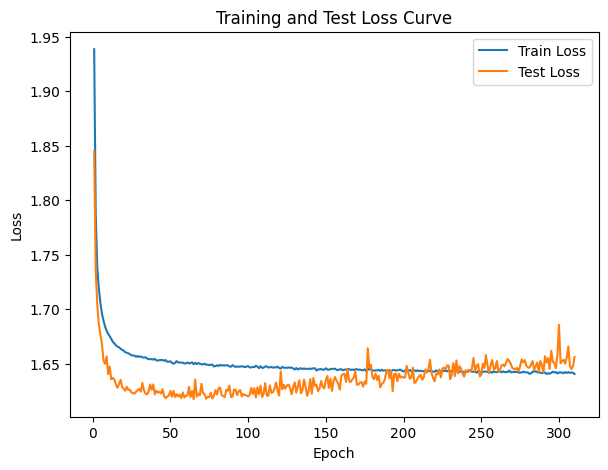

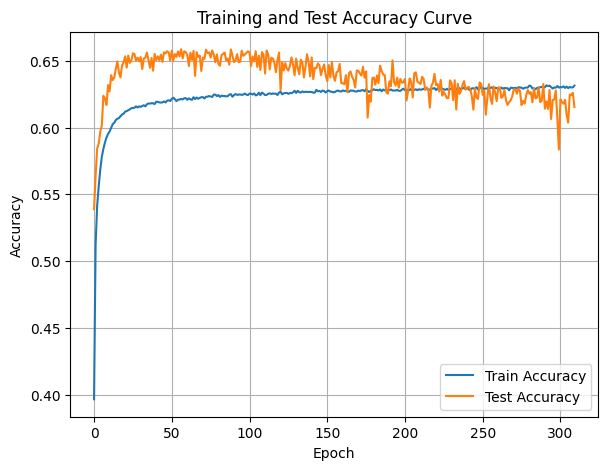

In [28]:
coverDTEmlp16b.train_single_model()

Randomly initializing 16 models
Training Model with id 1


Training Process:  10%|█         | 1/10 [00:41<06:12, 41.40s/it]

Epoch [1/10], Train F1:0.3939868055429784, Train Loss: 1.9498, Train Acc: 0.3768, Test F1:0.41839719846617673, Test Loss: 1.7973, Test Acc: 0.5201


Training Process:  20%|██        | 2/10 [01:21<05:22, 40.37s/it]

Epoch [2/10], Train F1:0.4405841731371579, Train Loss: 1.8650, Train Acc: 0.4503, Test F1:0.41534433907461776, Test Loss: 1.7692, Test Acc: 0.5212


Training Process:  30%|███       | 3/10 [02:01<04:42, 40.32s/it]

Epoch [3/10], Train F1:0.4601101053916799, Train Loss: 1.8205, Train Acc: 0.4829, Test F1:0.4461379939273, Test Loss: 1.7485, Test Acc: 0.5376


Training Process:  40%|████      | 4/10 [02:41<04:01, 40.32s/it]

Epoch [4/10], Train F1:0.4741246351831567, Train Loss: 1.7937, Train Acc: 0.5026, Test F1:0.4579301670655494, Test Loss: 1.7375, Test Acc: 0.5450


Training Process:  50%|█████     | 5/10 [03:24<03:26, 41.28s/it]

Epoch [5/10], Train F1:0.4864227402685628, Train Loss: 1.7752, Train Acc: 0.5167, Test F1:0.458627854832602, Test Loss: 1.7324, Test Acc: 0.5462


Training Process:  60%|██████    | 6/10 [04:09<02:49, 42.49s/it]

Epoch [6/10], Train F1:0.49663971009662544, Train Loss: 1.7614, Train Acc: 0.5274, Test F1:0.46938017595460374, Test Loss: 1.7244, Test Acc: 0.5520


Training Process:  70%|███████   | 7/10 [04:54<02:10, 43.38s/it]

Epoch [7/10], Train F1:0.5049380654759146, Train Loss: 1.7506, Train Acc: 0.5360, Test F1:0.478565602284303, Test Loss: 1.7174, Test Acc: 0.5569


Training Process:  80%|████████  | 8/10 [05:42<01:29, 44.92s/it]

Epoch [8/10], Train F1:0.5119201455563176, Train Loss: 1.7418, Train Acc: 0.5432, Test F1:0.49051558347077956, Test Loss: 1.7104, Test Acc: 0.5634


Training Process:  90%|█████████ | 9/10 [06:32<00:46, 46.43s/it]

Epoch [9/10], Train F1:0.5175601542410101, Train Loss: 1.7347, Train Acc: 0.5490, Test F1:0.497531010766075, Test Loss: 1.7054, Test Acc: 0.5675


Training Process: 100%|██████████| 10/10 [07:23<00:00, 44.40s/it]


Epoch [10/10], Train F1:0.5223166594133574, Train Loss: 1.7286, Train Acc: 0.5539, Test F1:0.5003097299032775, Test Loss: 1.7025, Test Acc: 0.5695
Total Epochs: 10
Train loss start: 2.064467430114746, Train loss end: 1.6603964567184448
Highest Mean Train Accuracy (over epoch): 0.553943648772764
Test loss start: 1.7835731506347656, Test loss end: 1.6175132989883423
Highest mean Test Accuracy (over epoch): 0.5694660591256019


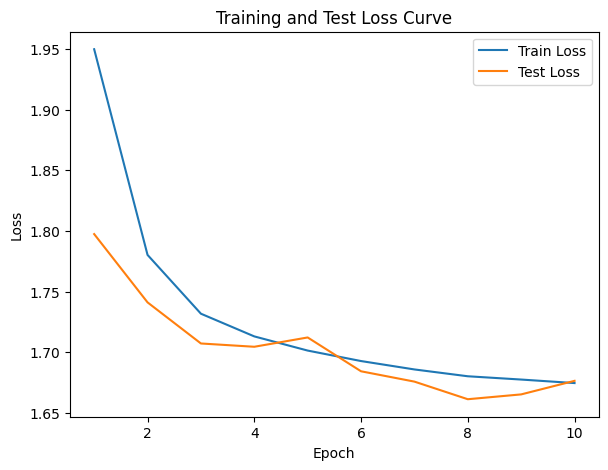

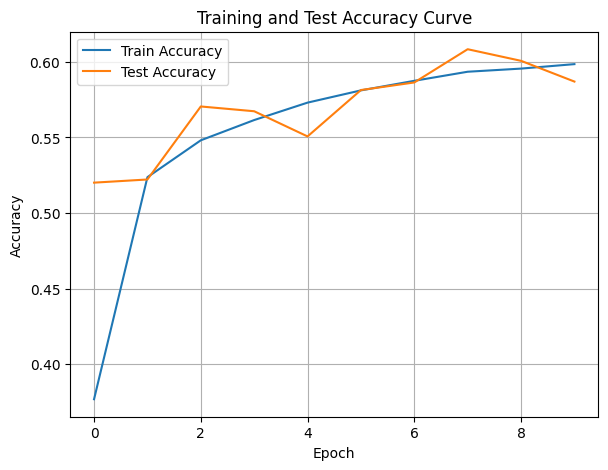

./saved_models/model_1.pth
Training Model with id 2


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.05s/it]

Epoch [1/10], Train F1:0.3970494820040008, Train Loss: 1.9365, Train Acc: 0.4101, Test F1:0.479468912670585, Test Loss: 1.8483, Test Acc: 0.5236


Training Process:  20%|██        | 2/10 [01:15<05:03, 38.00s/it]

Epoch [2/10], Train F1:0.4230645504008418, Train Loss: 1.8596, Train Acc: 0.4608, Test F1:0.49352061426441624, Test Loss: 1.7890, Test Acc: 0.5477


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.85s/it]

Epoch [3/10], Train F1:0.4382931260031828, Train Loss: 1.8208, Train Acc: 0.4847, Test F1:0.5008236586306389, Test Loss: 1.7606, Test Acc: 0.5592


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.14s/it]

Epoch [4/10], Train F1:0.4504430292996952, Train Loss: 1.7973, Train Acc: 0.4999, Test F1:0.5066620989748207, Test Loss: 1.7433, Test Acc: 0.5666


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.86s/it]

Epoch [5/10], Train F1:0.46010080470479386, Train Loss: 1.7814, Train Acc: 0.5109, Test F1:0.5120513973820984, Test Loss: 1.7315, Test Acc: 0.5721


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.10s/it]

Epoch [6/10], Train F1:0.46792781408176937, Train Loss: 1.7695, Train Acc: 0.5194, Test F1:0.5156986144658171, Test Loss: 1.7229, Test Acc: 0.5758


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.73s/it]

Epoch [7/10], Train F1:0.47418781091962964, Train Loss: 1.7604, Train Acc: 0.5260, Test F1:0.5200113981116429, Test Loss: 1.7160, Test Acc: 0.5797


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.14s/it]

Epoch [8/10], Train F1:0.4794502384458545, Train Loss: 1.7531, Train Acc: 0.5316, Test F1:0.5242711857918972, Test Loss: 1.7104, Test Acc: 0.5832


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.24s/it]

Epoch [9/10], Train F1:0.4839064951131275, Train Loss: 1.7470, Train Acc: 0.5362, Test F1:0.5272994207981024, Test Loss: 1.7059, Test Acc: 0.5859


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.94s/it]


Epoch [10/10], Train F1:0.4877242929904379, Train Loss: 1.7419, Train Acc: 0.5402, Test F1:0.5292885978900372, Test Loss: 1.7024, Test Acc: 0.5877
Total Epochs: 10
Train loss start: 2.0697672367095947, Train loss end: 1.809905767440796
Highest Mean Train Accuracy (over epoch): 0.5401815930140405
Test loss start: 1.8034471273422241, Test loss end: 1.6133514642715454
Highest mean Test Accuracy (over epoch): 0.5877038165275074


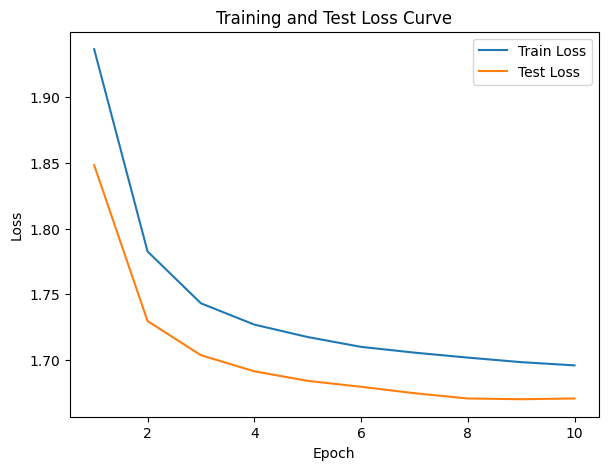

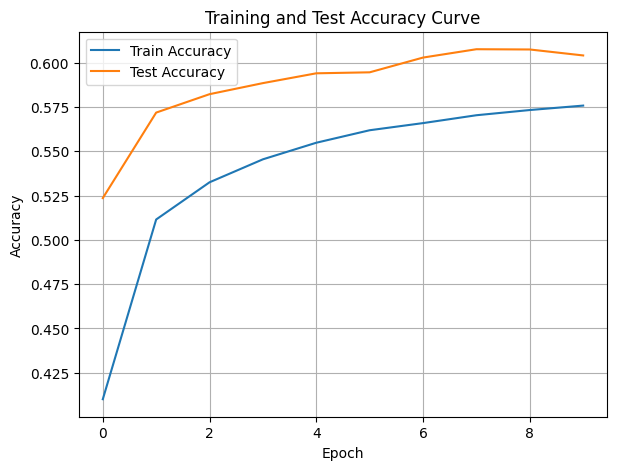

./saved_models/model_2.pth
Training Model with id 3


Training Process:  10%|█         | 1/10 [00:35<05:19, 35.52s/it]

Epoch [1/10], Train F1:0.3407139752064113, Train Loss: 2.0004, Train Acc: 0.3221, Test F1:0.3328951948442037, Test Loss: 1.8338, Test Acc: 0.4820


Training Process:  20%|██        | 2/10 [01:14<04:58, 37.35s/it]

Epoch [2/10], Train F1:0.40466424328790446, Train Loss: 1.9004, Train Acc: 0.4170, Test F1:0.3372497771549756, Test Loss: 1.8007, Test Acc: 0.4863


Training Process:  30%|███       | 3/10 [01:54<04:30, 38.64s/it]

Epoch [3/10], Train F1:0.4334917057933476, Train Loss: 1.8474, Train Acc: 0.4578, Test F1:0.37435105119540446, Test Loss: 1.7761, Test Acc: 0.5020


Training Process:  40%|████      | 4/10 [02:34<03:55, 39.33s/it]

Epoch [4/10], Train F1:0.45452083179397446, Train Loss: 1.8151, Train Acc: 0.4827, Test F1:0.4166593579212496, Test Loss: 1.7571, Test Acc: 0.5212


Training Process:  50%|█████     | 5/10 [03:17<03:23, 40.72s/it]

Epoch [5/10], Train F1:0.47087568786148687, Train Loss: 1.7929, Train Acc: 0.5003, Test F1:0.44671836077102556, Test Loss: 1.7418, Test Acc: 0.5363


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.23s/it]

Epoch [6/10], Train F1:0.4834446694305754, Train Loss: 1.7766, Train Acc: 0.5134, Test F1:0.4673432108880903, Test Loss: 1.7298, Test Acc: 0.5477


Training Process:  70%|███████   | 7/10 [04:48<02:10, 43.42s/it]

Epoch [7/10], Train F1:0.49335642132001517, Train Loss: 1.7639, Train Acc: 0.5236, Test F1:0.48375653210599295, Test Loss: 1.7204, Test Acc: 0.5569


Training Process:  80%|████████  | 8/10 [05:37<01:30, 45.09s/it]

Epoch [8/10], Train F1:0.5015390407484906, Train Loss: 1.7537, Train Acc: 0.5320, Test F1:0.49265133288572327, Test Loss: 1.7136, Test Acc: 0.5627


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.61s/it]

Epoch [9/10], Train F1:0.5081488276553483, Train Loss: 1.7455, Train Acc: 0.5388, Test F1:0.5021584446988319, Test Loss: 1.7077, Test Acc: 0.5684


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.90s/it]


Epoch [10/10], Train F1:0.513793174289971, Train Loss: 1.7385, Train Acc: 0.5447, Test F1:0.5100015541004832, Test Loss: 1.7025, Test Acc: 0.5735
Total Epochs: 10
Train loss start: 2.128697633743286, Train loss end: 1.7223869562149048
Highest Mean Train Accuracy (over epoch): 0.5446839330149806
Test loss start: 1.821882963180542, Test loss end: 1.643578052520752
Highest mean Test Accuracy (over epoch): 0.5734956275291978


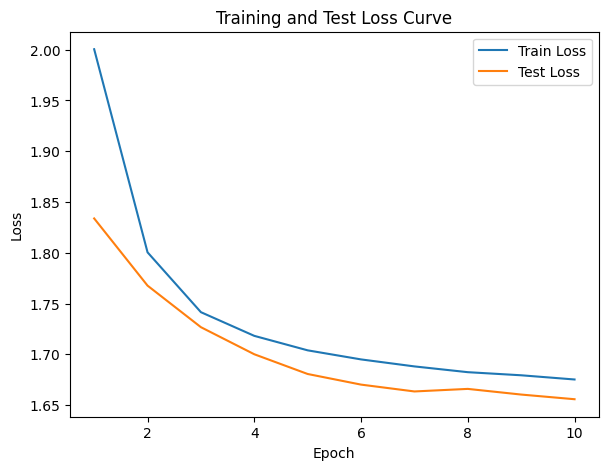

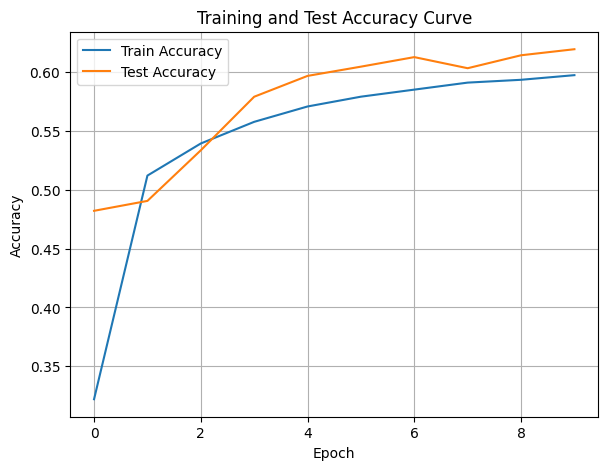

./saved_models/model_3.pth
Training Model with id 4


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.83s/it]

Epoch [1/10], Train F1:0.4080035205801825, Train Loss: 1.9240, Train Acc: 0.4339, Test F1:0.36475057698625385, Test Loss: 1.8040, Test Acc: 0.4982


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.74s/it]

Epoch [2/10], Train F1:0.42457430648498684, Train Loss: 1.8529, Train Acc: 0.4734, Test F1:0.3819919847663383, Test Loss: 1.7768, Test Acc: 0.5067


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.80s/it]

Epoch [3/10], Train F1:0.440686608635779, Train Loss: 1.8162, Train Acc: 0.4938, Test F1:0.41029641882829704, Test Loss: 1.7586, Test Acc: 0.5211


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.67s/it]

Epoch [4/10], Train F1:0.456168099362574, Train Loss: 1.7933, Train Acc: 0.5078, Test F1:0.42924927242798466, Test Loss: 1.7460, Test Acc: 0.5312


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.98s/it]

Epoch [5/10], Train F1:0.469675179477092, Train Loss: 1.7768, Train Acc: 0.5190, Test F1:0.44549636367355516, Test Loss: 1.7363, Test Acc: 0.5394


Training Process:  60%|██████    | 6/10 [04:04<02:49, 42.32s/it]

Epoch [6/10], Train F1:0.4807480069511633, Train Loss: 1.7642, Train Acc: 0.5279, Test F1:0.46002735288782504, Test Loss: 1.7274, Test Acc: 0.5467


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.33s/it]

Epoch [7/10], Train F1:0.4900498592044425, Train Loss: 1.7540, Train Acc: 0.5353, Test F1:0.4709849374992948, Test Loss: 1.7202, Test Acc: 0.5528


Training Process:  80%|████████  | 8/10 [05:38<01:30, 45.00s/it]

Epoch [8/10], Train F1:0.49769740693953857, Train Loss: 1.7457, Train Acc: 0.5416, Test F1:0.47991914848898, Test Loss: 1.7143, Test Acc: 0.5579


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.54s/it]

Epoch [9/10], Train F1:0.5040422365170719, Train Loss: 1.7388, Train Acc: 0.5468, Test F1:0.48793149679040304, Test Loss: 1.7090, Test Acc: 0.5628


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.01s/it]


Epoch [10/10], Train F1:0.5095086647765209, Train Loss: 1.7329, Train Acc: 0.5514, Test F1:0.49463599797726815, Test Loss: 1.7045, Test Acc: 0.5668
Total Epochs: 10
Train loss start: 2.035203456878662, Train loss end: 1.752369999885559
Highest Mean Train Accuracy (over epoch): 0.5514235985180483
Test loss start: 1.7925339937210083, Test loss end: 1.629267692565918
Highest mean Test Accuracy (over epoch): 0.5667756449454461


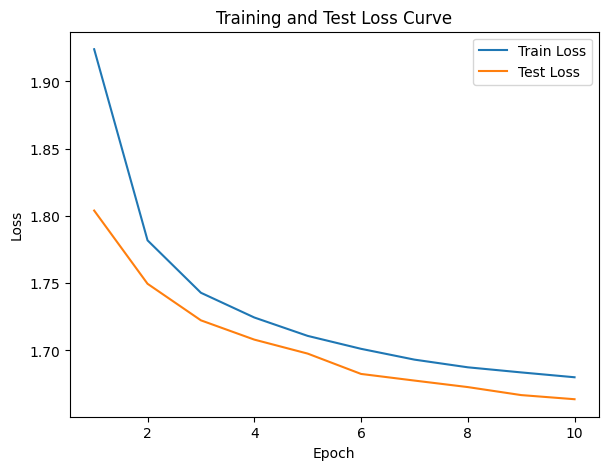

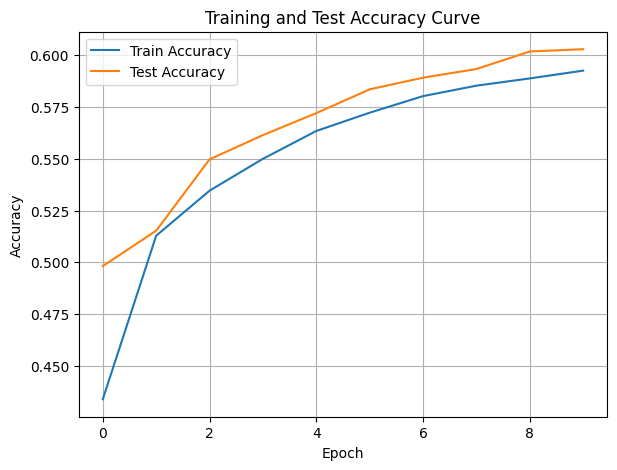

./saved_models/model_4.pth
Training Model with id 5


Training Process:  10%|█         | 1/10 [00:35<05:21, 35.77s/it]

Epoch [1/10], Train F1:0.37288301342310487, Train Loss: 1.9414, Train Acc: 0.3928, Test F1:0.37187225247099565, Test Loss: 1.8182, Test Acc: 0.4929


Training Process:  20%|██        | 2/10 [01:14<05:01, 37.63s/it]

Epoch [2/10], Train F1:0.42610872341581735, Train Loss: 1.8665, Train Acc: 0.4484, Test F1:0.3815785712551688, Test Loss: 1.7840, Test Acc: 0.5035


Training Process:  30%|███       | 3/10 [01:54<04:31, 38.75s/it]

Epoch [3/10], Train F1:0.4459870305295008, Train Loss: 1.8254, Train Acc: 0.4770, Test F1:0.40780951830869505, Test Loss: 1.7649, Test Acc: 0.5186


Training Process:  40%|████      | 4/10 [02:35<03:56, 39.43s/it]

Epoch [4/10], Train F1:0.45798103749983843, Train Loss: 1.8003, Train Acc: 0.4950, Test F1:0.4326765717344839, Test Loss: 1.7501, Test Acc: 0.5318


Training Process:  50%|█████     | 5/10 [03:18<03:23, 40.69s/it]

Epoch [5/10], Train F1:0.4666168574132404, Train Loss: 1.7833, Train Acc: 0.5074, Test F1:0.4510908552450295, Test Loss: 1.7393, Test Acc: 0.5418


Training Process:  60%|██████    | 6/10 [04:02<02:48, 42.09s/it]

Epoch [6/10], Train F1:0.4735664343276165, Train Loss: 1.7708, Train Acc: 0.5169, Test F1:0.4643702769639971, Test Loss: 1.7313, Test Acc: 0.5493


Training Process:  70%|███████   | 7/10 [04:47<02:09, 43.04s/it]

Epoch [7/10], Train F1:0.47921548611765086, Train Loss: 1.7612, Train Acc: 0.5243, Test F1:0.47534431769699825, Test Loss: 1.7244, Test Acc: 0.5557


Training Process:  80%|████████  | 8/10 [05:36<01:29, 44.80s/it]

Epoch [8/10], Train F1:0.48392396036223, Train Loss: 1.7536, Train Acc: 0.5302, Test F1:0.48120792833663967, Test Loss: 1.7199, Test Acc: 0.5595


Training Process:  90%|█████████ | 9/10 [06:24<00:45, 45.90s/it]

Epoch [9/10], Train F1:0.48800214276724707, Train Loss: 1.7473, Train Acc: 0.5352, Test F1:0.4855130890749777, Test Loss: 1.7163, Test Acc: 0.5624


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.64s/it]

Epoch [10/10], Train F1:0.4915757436080346, Train Loss: 1.7420, Train Acc: 0.5394, Test F1:0.4877645810726997, Test Loss: 1.7137, Test Acc: 0.5641
Total Epochs: 10
Train loss start: 2.0800859928131104, Train loss end: 1.7248435020446777
Highest Mean Train Accuracy (over epoch): 0.5394331400717972
Test loss start: 1.7936333417892456, Test loss end: 1.6788508892059326
Highest mean Test Accuracy (over epoch): 0.5641392363423319


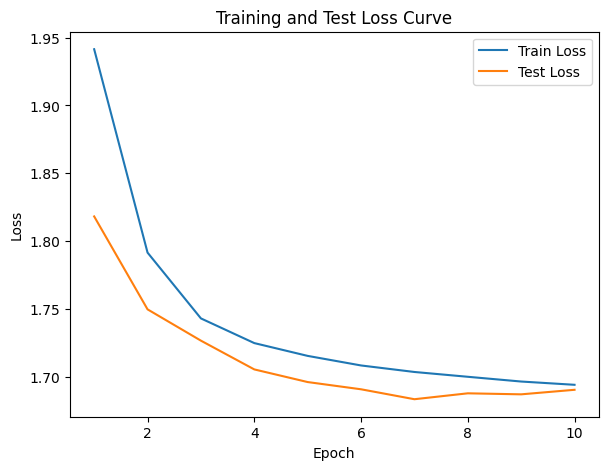

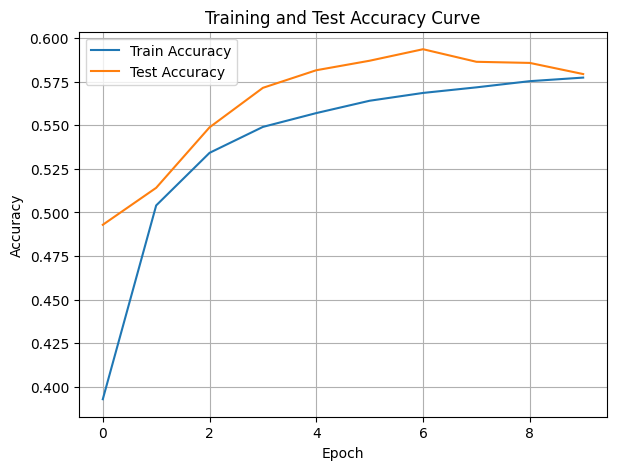

./saved_models/model_5.pth
Training Model with id 6


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.97s/it]

Epoch [1/10], Train F1:0.38671913917286765, Train Loss: 1.9661, Train Acc: 0.3673, Test F1:0.3607502739044993, Test Loss: 1.8322, Test Acc: 0.4867


Training Process:  20%|██        | 2/10 [01:15<05:03, 38.00s/it]

Epoch [2/10], Train F1:0.43419686399439067, Train Loss: 1.8842, Train Acc: 0.4343, Test F1:0.37727274973878805, Test Loss: 1.7928, Test Acc: 0.4962


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.07s/it]

Epoch [3/10], Train F1:0.4567488126509443, Train Loss: 1.8375, Train Acc: 0.4685, Test F1:0.4021537654122509, Test Loss: 1.7700, Test Acc: 0.5107


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.99s/it]

Epoch [4/10], Train F1:0.4719826007533808, Train Loss: 1.8079, Train Acc: 0.4907, Test F1:0.42762383876462456, Test Loss: 1.7529, Test Acc: 0.5247


Training Process:  50%|█████     | 5/10 [03:21<03:26, 41.37s/it]

Epoch [5/10], Train F1:0.48382695053145375, Train Loss: 1.7872, Train Acc: 0.5066, Test F1:0.452172661500116, Test Loss: 1.7383, Test Acc: 0.5383


Training Process:  60%|██████    | 6/10 [04:05<02:48, 42.20s/it]

Epoch [6/10], Train F1:0.4935575320193465, Train Loss: 1.7718, Train Acc: 0.5188, Test F1:0.47317064862945674, Test Loss: 1.7263, Test Acc: 0.5502


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.54s/it]

Epoch [7/10], Train F1:0.5016247337261869, Train Loss: 1.7598, Train Acc: 0.5285, Test F1:0.4861023814983499, Test Loss: 1.7175, Test Acc: 0.5582


Training Process:  80%|████████  | 8/10 [05:39<01:30, 45.09s/it]

Epoch [8/10], Train F1:0.5083436012348308, Train Loss: 1.7500, Train Acc: 0.5363, Test F1:0.4976784870776674, Test Loss: 1.7096, Test Acc: 0.5654


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.62s/it]

Epoch [9/10], Train F1:0.5140945005698417, Train Loss: 1.7420, Train Acc: 0.5429, Test F1:0.5062584756468322, Test Loss: 1.7037, Test Acc: 0.5710


Training Process: 100%|██████████| 10/10 [07:21<00:00, 44.11s/it]

Epoch [10/10], Train F1:0.5189882796104984, Train Loss: 1.7352, Train Acc: 0.5485, Test F1:0.5122591839359246, Test Loss: 1.6988, Test Acc: 0.5751
Total Epochs: 10
Train loss start: 2.082139492034912, Train loss end: 1.5840035676956177
Highest Mean Train Accuracy (over epoch): 0.5484562426750352
Test loss start: 1.8182533979415894, Test loss end: 1.6127650737762451
Highest mean Test Accuracy (over epoch): 0.5751336633029401


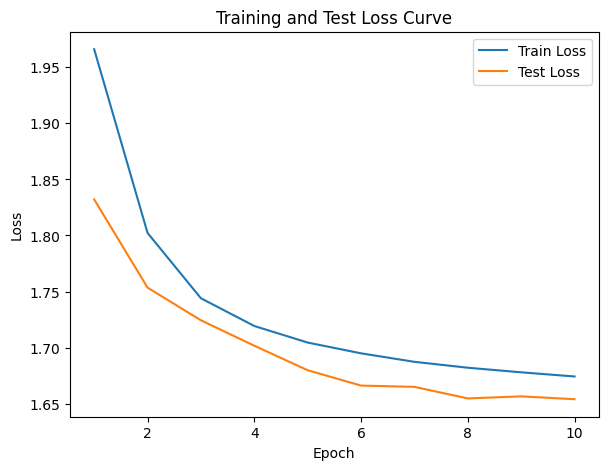

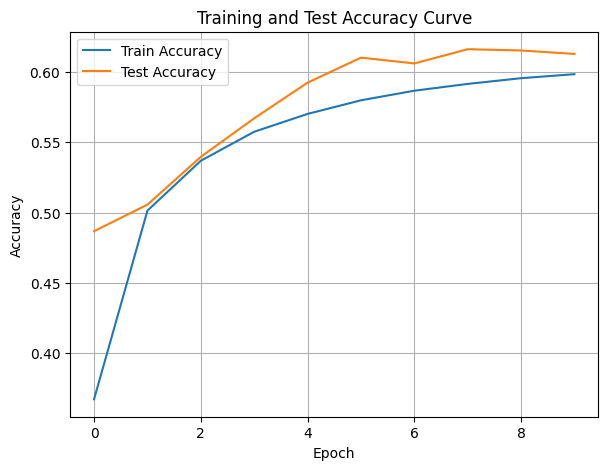

./saved_models/model_6.pth
Training Model with id 7


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.88s/it]

Epoch [1/10], Train F1:0.3608870683405496, Train Loss: 1.9727, Train Acc: 0.3583, Test F1:0.43249695471142074, Test Loss: 1.8498, Test Acc: 0.5313


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.93s/it]

Epoch [2/10], Train F1:0.40475418933049684, Train Loss: 1.8851, Train Acc: 0.4354, Test F1:0.4224064969428445, Test Loss: 1.7972, Test Acc: 0.5290


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.03s/it]

Epoch [3/10], Train F1:0.43159018843807956, Train Loss: 1.8371, Train Acc: 0.4706, Test F1:0.4502626121185386, Test Loss: 1.7674, Test Acc: 0.5432


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.03s/it]

Epoch [4/10], Train F1:0.45271977562165455, Train Loss: 1.8070, Train Acc: 0.4931, Test F1:0.47163064506069624, Test Loss: 1.7489, Test Acc: 0.5541


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.71s/it]

Epoch [5/10], Train F1:0.4682825888764688, Train Loss: 1.7864, Train Acc: 0.5087, Test F1:0.4894139953782236, Test Loss: 1.7346, Test Acc: 0.5633


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.10s/it]

Epoch [6/10], Train F1:0.4804740950102822, Train Loss: 1.7711, Train Acc: 0.5204, Test F1:0.502425996309738, Test Loss: 1.7233, Test Acc: 0.5706


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.54s/it]

Epoch [7/10], Train F1:0.4902194049019327, Train Loss: 1.7592, Train Acc: 0.5297, Test F1:0.5120025042999067, Test Loss: 1.7147, Test Acc: 0.5763


Training Process:  80%|████████  | 8/10 [05:38<01:30, 45.04s/it]

Epoch [8/10], Train F1:0.49838979970813774, Train Loss: 1.7495, Train Acc: 0.5374, Test F1:0.5205651790223859, Test Loss: 1.7072, Test Acc: 0.5814


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.04s/it]

Epoch [9/10], Train F1:0.5050790610466656, Train Loss: 1.7417, Train Acc: 0.5437, Test F1:0.5276939935391239, Test Loss: 1.7009, Test Acc: 0.5858


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.86s/it]


Epoch [10/10], Train F1:0.5108528671706396, Train Loss: 1.7350, Train Acc: 0.5491, Test F1:0.5343303510181888, Test Loss: 1.6954, Test Acc: 0.5902
Total Epochs: 10
Train loss start: 2.085355281829834, Train loss end: 1.693145990371704
Highest Mean Train Accuracy (over epoch): 0.5491283501744558
Test loss start: 1.8320142030715942, Test loss end: 1.653203010559082
Highest mean Test Accuracy (over epoch): 0.5901561579564082


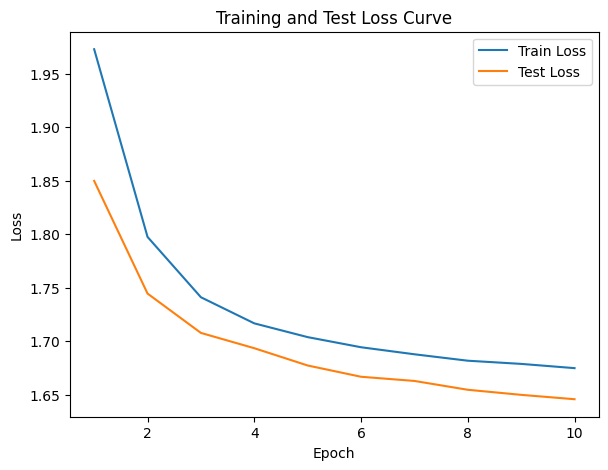

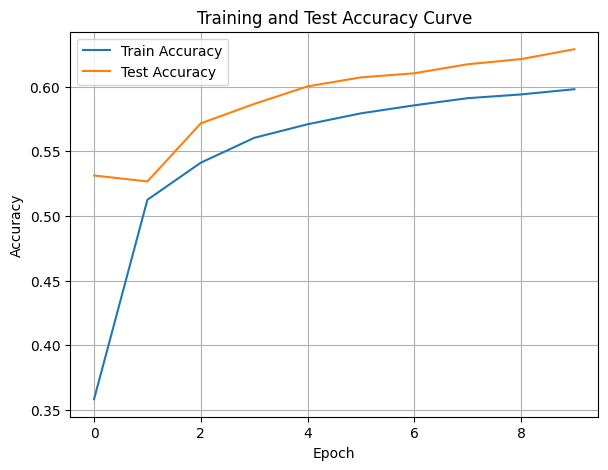

./saved_models/model_7.pth
Training Model with id 8


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.14s/it]

Epoch [1/10], Train F1:0.34919263047591337, Train Loss: 1.9493, Train Acc: 0.4183, Test F1:0.31867396872749265, Test Loss: 1.8652, Test Acc: 0.4861


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.09s/it]

Epoch [2/10], Train F1:0.37240734099936085, Train Loss: 1.8697, Train Acc: 0.4616, Test F1:0.3714836430913822, Test Loss: 1.8087, Test Acc: 0.5075


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.92s/it]

Epoch [3/10], Train F1:0.4031857321523366, Train Loss: 1.8286, Train Acc: 0.4841, Test F1:0.426115810683962, Test Loss: 1.7761, Test Acc: 0.5318


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.03s/it]

Epoch [4/10], Train F1:0.4275214647041925, Train Loss: 1.8034, Train Acc: 0.4994, Test F1:0.45690929171432315, Test Loss: 1.7554, Test Acc: 0.5471


Training Process:  50%|█████     | 5/10 [03:20<03:24, 40.91s/it]

Epoch [5/10], Train F1:0.4442689979527028, Train Loss: 1.7862, Train Acc: 0.5106, Test F1:0.47476589808529707, Test Loss: 1.7419, Test Acc: 0.5568


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.10s/it]

Epoch [6/10], Train F1:0.4561555538899292, Train Loss: 1.7736, Train Acc: 0.5191, Test F1:0.4875127874840763, Test Loss: 1.7316, Test Acc: 0.5639


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.46s/it]

Epoch [7/10], Train F1:0.4654047543596646, Train Loss: 1.7637, Train Acc: 0.5261, Test F1:0.49611901436737615, Test Loss: 1.7238, Test Acc: 0.5691


Training Process:  80%|████████  | 8/10 [05:37<01:28, 44.42s/it]

Epoch [8/10], Train F1:0.47244714065833937, Train Loss: 1.7559, Train Acc: 0.5317, Test F1:0.5034843340964462, Test Loss: 1.7174, Test Acc: 0.5736


Training Process:  90%|█████████ | 9/10 [06:26<00:46, 46.10s/it]

Epoch [9/10], Train F1:0.47821012133450347, Train Loss: 1.7494, Train Acc: 0.5364, Test F1:0.5090325271311928, Test Loss: 1.7124, Test Acc: 0.5771


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.87s/it]

Epoch [10/10], Train F1:0.4830006624291729, Train Loss: 1.7440, Train Acc: 0.5404, Test F1:0.5130146554545288, Test Loss: 1.7085, Test Acc: 0.5799
Total Epochs: 10
Train loss start: 2.079406499862671, Train loss end: 1.7419610023498535
Highest Mean Train Accuracy (over epoch): 0.5403900974031425
Test loss start: 1.844402551651001, Test loss end: 1.619447946548462
Highest mean Test Accuracy (over epoch): 0.5798875547459277


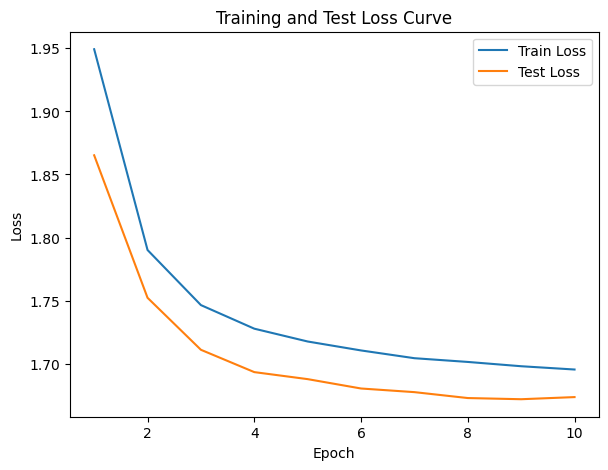

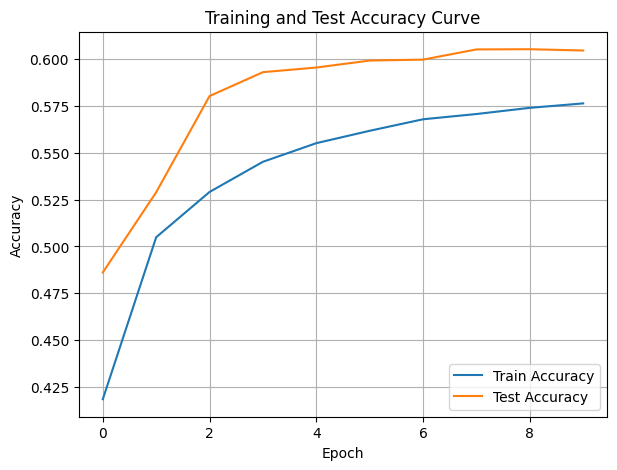

./saved_models/model_8.pth
Training Model with id 9


Training Process:  10%|█         | 1/10 [00:36<05:29, 36.58s/it]

Epoch [1/10], Train F1:0.38219181984516837, Train Loss: 1.9382, Train Acc: 0.3970, Test F1:0.5141191306706177, Test Loss: 1.8341, Test Acc: 0.5608


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.83s/it]

Epoch [2/10], Train F1:0.4374760537907752, Train Loss: 1.8595, Train Acc: 0.4565, Test F1:0.5089220565094299, Test Loss: 1.7795, Test Acc: 0.5637


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.88s/it]

Epoch [3/10], Train F1:0.4569894821191517, Train Loss: 1.8191, Train Acc: 0.4840, Test F1:0.5082679625566456, Test Loss: 1.7544, Test Acc: 0.5672


Training Process:  40%|████      | 4/10 [02:36<03:59, 39.85s/it]

Epoch [4/10], Train F1:0.46782828413693867, Train Loss: 1.7950, Train Acc: 0.5006, Test F1:0.5115530740833218, Test Loss: 1.7392, Test Acc: 0.5715


Training Process:  50%|█████     | 5/10 [03:18<03:22, 40.58s/it]

Epoch [5/10], Train F1:0.4756145893945476, Train Loss: 1.7788, Train Acc: 0.5123, Test F1:0.5158594858603324, Test Loss: 1.7286, Test Acc: 0.5758


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.99s/it]

Epoch [6/10], Train F1:0.48173166910526816, Train Loss: 1.7669, Train Acc: 0.5210, Test F1:0.5188817261014464, Test Loss: 1.7208, Test Acc: 0.5787


Training Process:  70%|███████   | 7/10 [04:49<02:10, 43.43s/it]

Epoch [7/10], Train F1:0.4867218294083589, Train Loss: 1.7578, Train Acc: 0.5279, Test F1:0.5212019274199536, Test Loss: 1.7153, Test Acc: 0.5808


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.98s/it]

Epoch [8/10], Train F1:0.49129785858473857, Train Loss: 1.7503, Train Acc: 0.5336, Test F1:0.5233358986490793, Test Loss: 1.7107, Test Acc: 0.5827


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.62s/it]

Epoch [9/10], Train F1:0.4963360731816171, Train Loss: 1.7438, Train Acc: 0.5387, Test F1:0.5251305943981177, Test Loss: 1.7068, Test Acc: 0.5844


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.96s/it]

Epoch [10/10], Train F1:0.501754955807278, Train Loss: 1.7380, Train Acc: 0.5434, Test F1:0.5276600426308478, Test Loss: 1.7029, Test Acc: 0.5863
Total Epochs: 10
Train loss start: 2.0470612049102783, Train loss end: 1.758933663368225
Highest Mean Train Accuracy (over epoch): 0.543421210873354
Test loss start: 1.7871532440185547, Test loss end: 1.6594080924987793
Highest mean Test Accuracy (over epoch): 0.5863368691412253


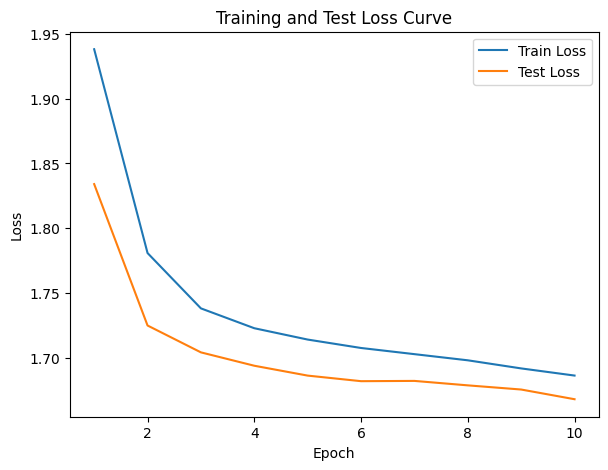

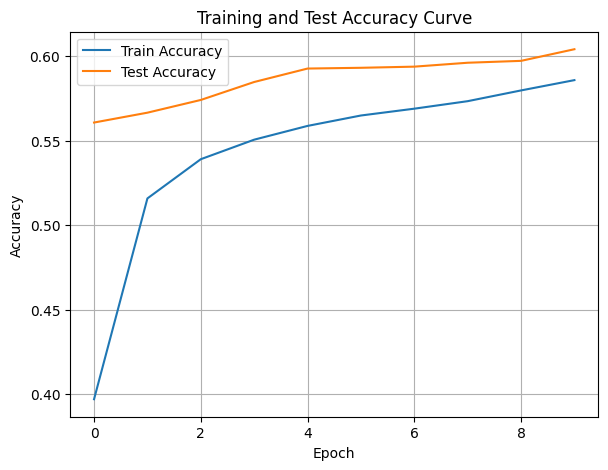

./saved_models/model_9.pth
Training Model with id 10


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.04s/it]

Epoch [1/10], Train F1:0.39531667642035045, Train Loss: 1.9611, Train Acc: 0.3754, Test F1:0.3785561799488446, Test Loss: 1.8178, Test Acc: 0.4972


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.81s/it]

Epoch [2/10], Train F1:0.4383787163147493, Train Loss: 1.8722, Train Acc: 0.4490, Test F1:0.38717589719799894, Test Loss: 1.7832, Test Acc: 0.5058


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.84s/it]

Epoch [3/10], Train F1:0.4576404775020988, Train Loss: 1.8264, Train Acc: 0.4808, Test F1:0.40815380918739463, Test Loss: 1.7634, Test Acc: 0.5180


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.98s/it]

Epoch [4/10], Train F1:0.47311108817399766, Train Loss: 1.7981, Train Acc: 0.5012, Test F1:0.42675489647313214, Test Loss: 1.7500, Test Acc: 0.5285


Training Process:  50%|█████     | 5/10 [03:18<03:22, 40.56s/it]

Epoch [5/10], Train F1:0.4854341575105119, Train Loss: 1.7787, Train Acc: 0.5155, Test F1:0.441411701156964, Test Loss: 1.7400, Test Acc: 0.5367


Training Process:  60%|██████    | 6/10 [04:04<02:49, 42.37s/it]

Epoch [6/10], Train F1:0.4953847227557621, Train Loss: 1.7644, Train Acc: 0.5265, Test F1:0.4555514788970489, Test Loss: 1.7305, Test Acc: 0.5445


Training Process:  70%|███████   | 7/10 [04:51<02:11, 43.80s/it]

Epoch [7/10], Train F1:0.5038041403535, Train Loss: 1.7529, Train Acc: 0.5355, Test F1:0.46516800050252954, Test Loss: 1.7235, Test Acc: 0.5500


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.70s/it]

Epoch [8/10], Train F1:0.5107000737316129, Train Loss: 1.7439, Train Acc: 0.5427, Test F1:0.47258131224379796, Test Loss: 1.7178, Test Acc: 0.5544


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.19s/it]

Epoch [9/10], Train F1:0.5165013897714464, Train Loss: 1.7363, Train Acc: 0.5488, Test F1:0.4834281236979498, Test Loss: 1.7110, Test Acc: 0.5605


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.89s/it]


Epoch [10/10], Train F1:0.5213201119097602, Train Loss: 1.7301, Train Acc: 0.5538, Test F1:0.4911178960609664, Test Loss: 1.7058, Test Acc: 0.5651
Total Epochs: 10
Train loss start: 2.103670835494995, Train loss end: 1.736002802848816
Highest Mean Train Accuracy (over epoch): 0.5538051198355849
Test loss start: 1.7892595529556274, Test loss end: 1.628307580947876
Highest mean Test Accuracy (over epoch): 0.5650876254994365


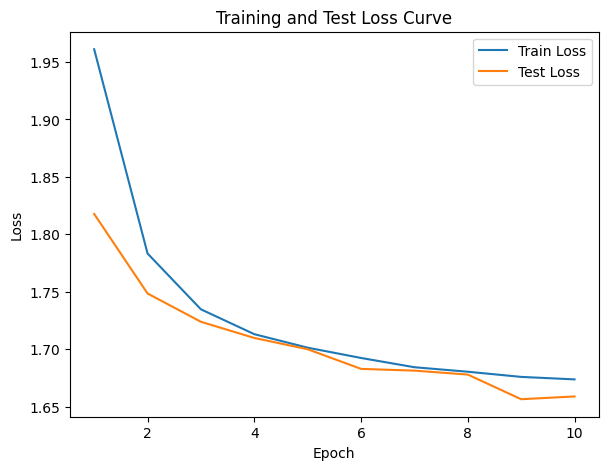

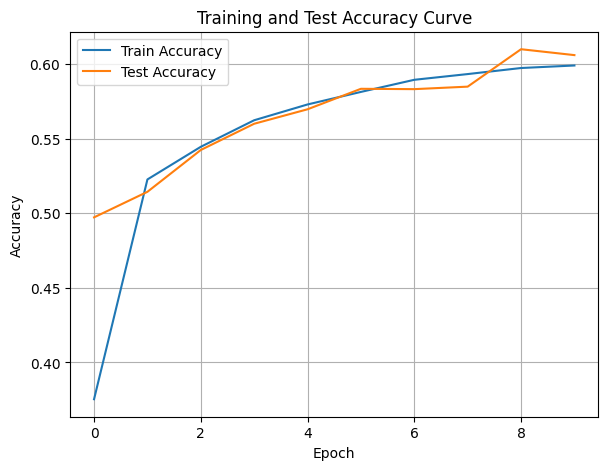

./saved_models/model_10.pth
Training Model with id 11


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.79s/it]

Epoch [1/10], Train F1:0.3245797683793368, Train Loss: 2.0028, Train Acc: 0.3152, Test F1:0.3438029125413656, Test Loss: 1.8531, Test Acc: 0.4746


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.86s/it]

Epoch [2/10], Train F1:0.37986098063232226, Train Loss: 1.9093, Train Acc: 0.4043, Test F1:0.3559032359891581, Test Loss: 1.8099, Test Acc: 0.4865


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.78s/it]

Epoch [3/10], Train F1:0.40713734848646826, Train Loss: 1.8583, Train Acc: 0.4438, Test F1:0.3743304076722678, Test Loss: 1.7862, Test Acc: 0.4981


Training Process:  40%|████      | 4/10 [02:36<03:59, 39.83s/it]

Epoch [4/10], Train F1:0.43140033503363734, Train Loss: 1.8260, Train Acc: 0.4696, Test F1:0.4015376968610763, Test Loss: 1.7671, Test Acc: 0.5130


Training Process:  50%|█████     | 5/10 [03:18<03:22, 40.49s/it]

Epoch [5/10], Train F1:0.45102260591293136, Train Loss: 1.8033, Train Acc: 0.4882, Test F1:0.4292777483132645, Test Loss: 1.7511, Test Acc: 0.5274


Training Process:  60%|██████    | 6/10 [04:02<02:47, 41.79s/it]

Epoch [6/10], Train F1:0.46654354479698096, Train Loss: 1.7861, Train Acc: 0.5026, Test F1:0.443237616208321, Test Loss: 1.7411, Test Acc: 0.5354


Training Process:  70%|███████   | 7/10 [04:48<02:09, 43.26s/it]

Epoch [7/10], Train F1:0.4788115756620428, Train Loss: 1.7726, Train Acc: 0.5140, Test F1:0.4567157537443521, Test Loss: 1.7322, Test Acc: 0.5430


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.94s/it]

Epoch [8/10], Train F1:0.48869314893863885, Train Loss: 1.7618, Train Acc: 0.5232, Test F1:0.4712010327134339, Test Loss: 1.7233, Test Acc: 0.5511


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.45s/it]

Epoch [9/10], Train F1:0.49656352516639535, Train Loss: 1.7530, Train Acc: 0.5307, Test F1:0.4801311483593116, Test Loss: 1.7171, Test Acc: 0.5563


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.69s/it]


Epoch [10/10], Train F1:0.5032879601624773, Train Loss: 1.7455, Train Acc: 0.5371, Test F1:0.4874396115483956, Test Loss: 1.7118, Test Acc: 0.5607
Total Epochs: 10
Train loss start: 2.1257688999176025, Train loss end: 1.7305669784545898
Highest Mean Train Accuracy (over epoch): 0.5370601033302773
Test loss start: 1.8618544340133667, Test loss end: 1.6735236644744873
Highest mean Test Accuracy (over epoch): 0.5606610090538878


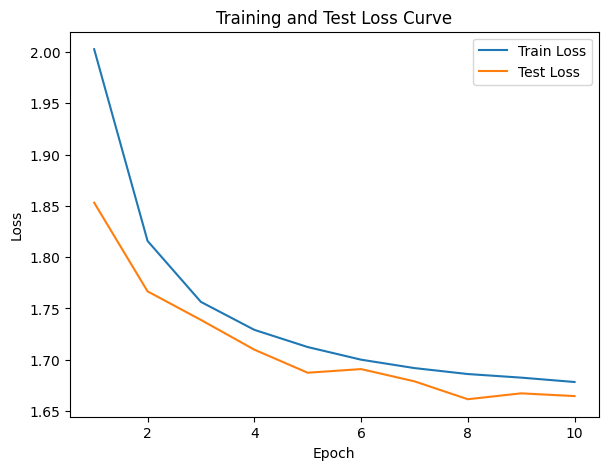

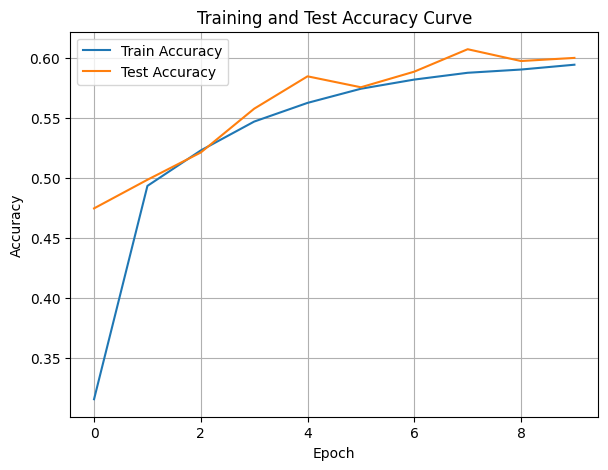

./saved_models/model_11.pth
Training Model with id 12


Training Process:  10%|█         | 1/10 [00:35<05:18, 35.42s/it]

Epoch [1/10], Train F1:0.4047435006070003, Train Loss: 1.8957, Train Acc: 0.4603, Test F1:0.3427754728736095, Test Loss: 1.8009, Test Acc: 0.4945


Training Process:  20%|██        | 2/10 [01:13<04:55, 36.92s/it]

Epoch [2/10], Train F1:0.4204757987617428, Train Loss: 1.8342, Train Acc: 0.4877, Test F1:0.36735022530180766, Test Loss: 1.7718, Test Acc: 0.5057


Training Process:  30%|███       | 3/10 [01:53<04:28, 38.30s/it]

Epoch [3/10], Train F1:0.43748657938115987, Train Loss: 1.8026, Train Acc: 0.5037, Test F1:0.4174390300870234, Test Loss: 1.7508, Test Acc: 0.5277


Training Process:  40%|████      | 4/10 [02:33<03:54, 39.07s/it]

Epoch [4/10], Train F1:0.4517712250522039, Train Loss: 1.7827, Train Acc: 0.5153, Test F1:0.43751322190506314, Test Loss: 1.7388, Test Acc: 0.5381


Training Process:  50%|█████     | 5/10 [03:16<03:22, 40.47s/it]

Epoch [5/10], Train F1:0.4624883069565427, Train Loss: 1.7690, Train Acc: 0.5240, Test F1:0.45745471122830256, Test Loss: 1.7287, Test Acc: 0.5479


Training Process:  60%|██████    | 6/10 [04:01<02:47, 41.99s/it]

Epoch [6/10], Train F1:0.47055036026875285, Train Loss: 1.7589, Train Acc: 0.5306, Test F1:0.46969841049291694, Test Loss: 1.7217, Test Acc: 0.5544


Training Process:  70%|███████   | 7/10 [04:47<02:10, 43.35s/it]

Epoch [7/10], Train F1:0.47702668932834513, Train Loss: 1.7509, Train Acc: 0.5361, Test F1:0.47917725339860134, Test Loss: 1.7160, Test Acc: 0.5596


Training Process:  80%|████████  | 8/10 [05:35<01:29, 44.64s/it]

Epoch [8/10], Train F1:0.4823007787070836, Train Loss: 1.7445, Train Acc: 0.5407, Test F1:0.48580687840224335, Test Loss: 1.7117, Test Acc: 0.5634


Training Process:  90%|█████████ | 9/10 [06:24<00:46, 46.17s/it]

Epoch [9/10], Train F1:0.4865260952054162, Train Loss: 1.7394, Train Acc: 0.5443, Test F1:0.4923204253682361, Test Loss: 1.7078, Test Acc: 0.5673


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.60s/it]


Epoch [10/10], Train F1:0.4903060243093212, Train Loss: 1.7349, Train Acc: 0.5477, Test F1:0.4944938281695698, Test Loss: 1.7057, Test Acc: 0.5688
Total Epochs: 10
Train loss start: 2.0022594928741455, Train loss end: 1.7103344202041626
Highest Mean Train Accuracy (over epoch): 0.5476538494474164
Test loss start: 1.783287763595581, Test loss end: 1.654283046722412
Highest mean Test Accuracy (over epoch): 0.568827076503432


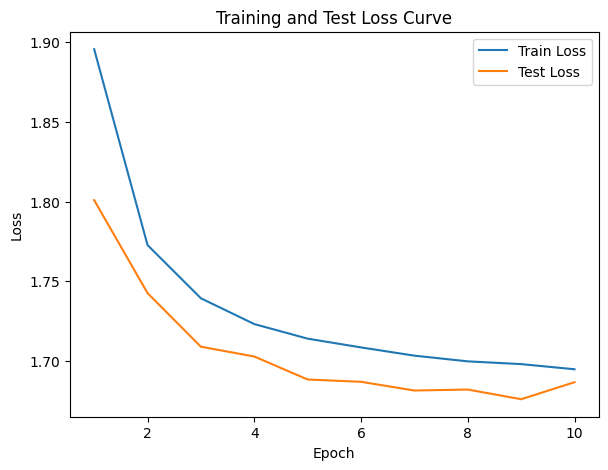

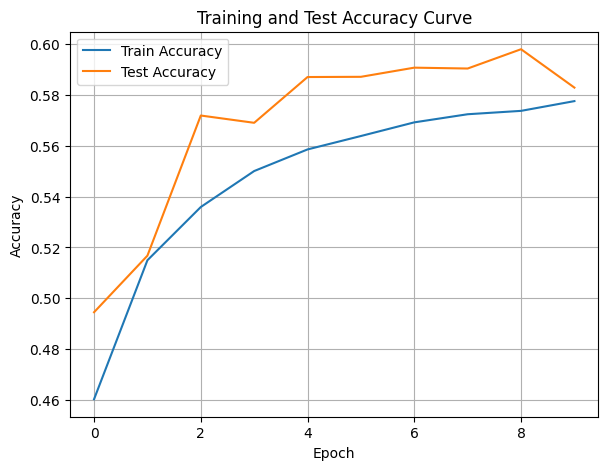

./saved_models/model_12.pth
Training Model with id 13


Training Process:  10%|█         | 1/10 [00:36<05:25, 36.13s/it]

Epoch [1/10], Train F1:0.423122525850716, Train Loss: 1.9086, Train Acc: 0.4542, Test F1:0.4067699936582002, Test Loss: 1.8045, Test Acc: 0.5239


Training Process:  20%|██        | 2/10 [01:14<04:59, 37.40s/it]

Epoch [2/10], Train F1:0.4400560031899667, Train Loss: 1.8406, Train Acc: 0.4877, Test F1:0.4283332782774919, Test Loss: 1.7671, Test Acc: 0.5346


Training Process:  30%|███       | 3/10 [01:53<04:27, 38.18s/it]

Epoch [3/10], Train F1:0.45303252654876514, Train Loss: 1.8060, Train Acc: 0.5052, Test F1:0.45156898394699824, Test Loss: 1.7472, Test Acc: 0.5462


Training Process:  40%|████      | 4/10 [02:35<03:57, 39.55s/it]

Epoch [4/10], Train F1:0.4635130712865967, Train Loss: 1.7851, Train Acc: 0.5168, Test F1:0.4703088357712577, Test Loss: 1.7343, Test Acc: 0.5558


Training Process:  50%|█████     | 5/10 [03:18<03:24, 40.80s/it]

Epoch [5/10], Train F1:0.47174818142902697, Train Loss: 1.7707, Train Acc: 0.5253, Test F1:0.4829060216571442, Test Loss: 1.7249, Test Acc: 0.5626


Training Process:  60%|██████    | 6/10 [04:02<02:48, 42.09s/it]

Epoch [6/10], Train F1:0.4782567309172851, Train Loss: 1.7602, Train Acc: 0.5319, Test F1:0.4915196234772496, Test Loss: 1.7181, Test Acc: 0.5676


Training Process:  70%|███████   | 7/10 [04:48<02:10, 43.44s/it]

Epoch [7/10], Train F1:0.48350295050517433, Train Loss: 1.7521, Train Acc: 0.5372, Test F1:0.5008291570106154, Test Loss: 1.7120, Test Acc: 0.5731


Training Process:  80%|████████  | 8/10 [05:36<01:29, 44.68s/it]

Epoch [8/10], Train F1:0.4878313851282982, Train Loss: 1.7455, Train Acc: 0.5416, Test F1:0.5073720343540364, Test Loss: 1.7072, Test Acc: 0.5771


Training Process:  90%|█████████ | 9/10 [06:25<00:45, 45.95s/it]

Epoch [9/10], Train F1:0.4915185581032298, Train Loss: 1.7401, Train Acc: 0.5453, Test F1:0.5125782007115616, Test Loss: 1.7033, Test Acc: 0.5804


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.67s/it]


Epoch [10/10], Train F1:0.4946535939790871, Train Loss: 1.7356, Train Acc: 0.5484, Test F1:0.5169267179243168, Test Loss: 1.6999, Test Acc: 0.5832
Total Epochs: 10
Train loss start: 2.0147056579589844, Train loss end: 1.63960862159729
Highest Mean Train Accuracy (over epoch): 0.5484152942327131
Test loss start: 1.7845525741577148, Test loss end: 1.653363585472107
Highest mean Test Accuracy (over epoch): 0.5832230344291056


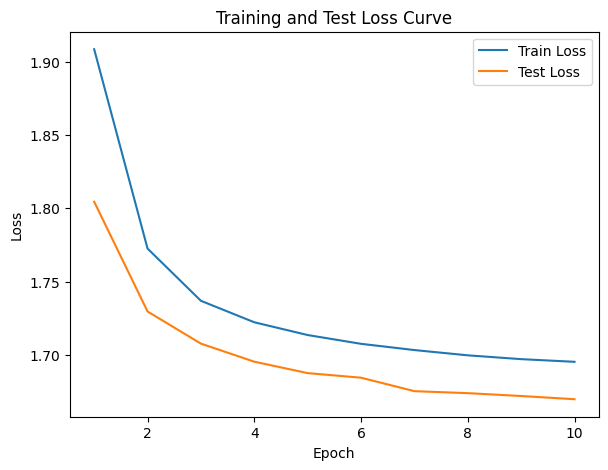

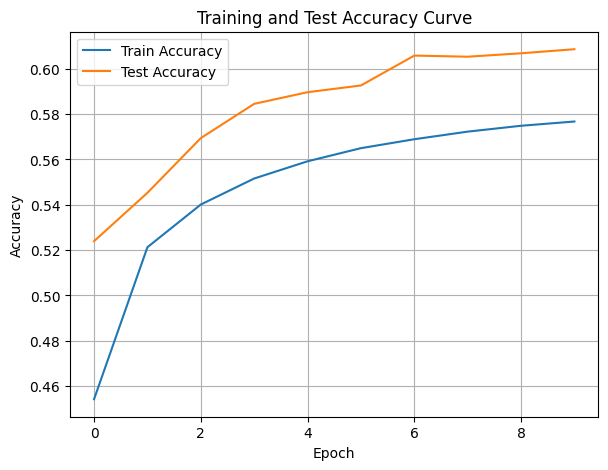

./saved_models/model_13.pth
Training Model with id 14


Training Process:  10%|█         | 1/10 [00:35<05:22, 35.82s/it]

Epoch [1/10], Train F1:0.37309025510788696, Train Loss: 1.9521, Train Acc: 0.3688, Test F1:0.40673352185875766, Test Loss: 1.8165, Test Acc: 0.5103


Training Process:  20%|██        | 2/10 [01:14<05:00, 37.53s/it]

Epoch [2/10], Train F1:0.4344336671534072, Train Loss: 1.8720, Train Acc: 0.4404, Test F1:0.4081217101267878, Test Loss: 1.7832, Test Acc: 0.5137


Training Process:  30%|███       | 3/10 [01:54<04:30, 38.64s/it]

Epoch [3/10], Train F1:0.4560950855711981, Train Loss: 1.8284, Train Acc: 0.4732, Test F1:0.4127881158844883, Test Loss: 1.7647, Test Acc: 0.5189


Training Process:  40%|████      | 4/10 [02:35<03:58, 39.73s/it]

Epoch [4/10], Train F1:0.4700838251943986, Train Loss: 1.8014, Train Acc: 0.4936, Test F1:0.44085454643157407, Test Loss: 1.7483, Test Acc: 0.5345


Training Process:  50%|█████     | 5/10 [03:20<03:26, 41.32s/it]

Epoch [5/10], Train F1:0.4814507463565783, Train Loss: 1.7824, Train Acc: 0.5084, Test F1:0.453942148572095, Test Loss: 1.7388, Test Acc: 0.5426


Training Process:  60%|██████    | 6/10 [04:04<02:50, 42.51s/it]

Epoch [6/10], Train F1:0.4909242058389747, Train Loss: 1.7682, Train Acc: 0.5198, Test F1:0.465280844279558, Test Loss: 1.7304, Test Acc: 0.5492


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.56s/it]

Epoch [7/10], Train F1:0.49885431477427555, Train Loss: 1.7571, Train Acc: 0.5288, Test F1:0.47786536128119106, Test Loss: 1.7218, Test Acc: 0.5563


Training Process:  80%|████████  | 8/10 [05:38<01:30, 45.08s/it]

Epoch [8/10], Train F1:0.5055301917969489, Train Loss: 1.7481, Train Acc: 0.5363, Test F1:0.4884101817774654, Test Loss: 1.7146, Test Acc: 0.5623


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.50s/it]

Epoch [9/10], Train F1:0.5111112431887135, Train Loss: 1.7406, Train Acc: 0.5425, Test F1:0.4954172861792255, Test Loss: 1.7092, Test Acc: 0.5666


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.96s/it]

Epoch [10/10], Train F1:0.515962009443088, Train Loss: 1.7343, Train Acc: 0.5477, Test F1:0.5034577470462018, Test Loss: 1.7040, Test Acc: 0.5714
Total Epochs: 10
Train loss start: 2.0878565311431885, Train loss end: 1.6762570142745972
Highest Mean Train Accuracy (over epoch): 0.5477265586433746
Test loss start: 1.8203297853469849, Test loss end: 1.6127647161483765
Highest mean Test Accuracy (over epoch): 0.5713753833815695


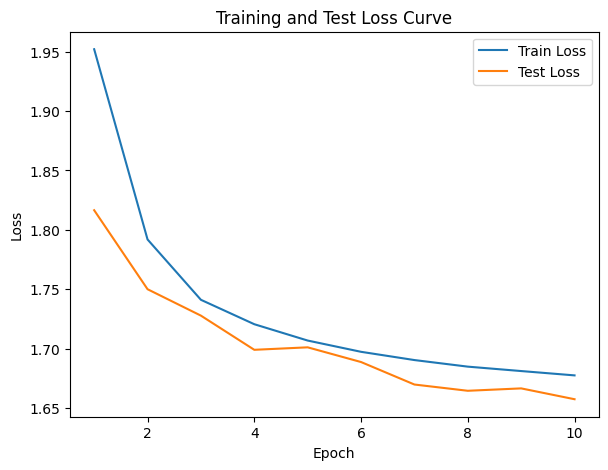

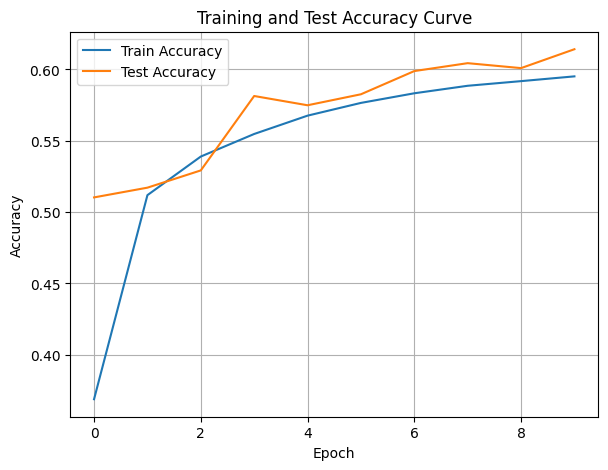

./saved_models/model_14.pth
Training Model with id 15


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.91s/it]

Epoch [1/10], Train F1:0.3698443797047199, Train Loss: 1.9251, Train Acc: 0.4277, Test F1:0.3414389038643439, Test Loss: 1.8008, Test Acc: 0.4938


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.83s/it]

Epoch [2/10], Train F1:0.39686894582584004, Train Loss: 1.8549, Train Acc: 0.4688, Test F1:0.3782739406411805, Test Loss: 1.7734, Test Acc: 0.5094


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.76s/it]

Epoch [3/10], Train F1:0.42106115613147727, Train Loss: 1.8179, Train Acc: 0.4904, Test F1:0.41688671453665654, Test Loss: 1.7531, Test Acc: 0.5274


Training Process:  40%|████      | 4/10 [02:35<03:56, 39.46s/it]

Epoch [4/10], Train F1:0.44310423514463737, Train Loss: 1.7939, Train Acc: 0.5060, Test F1:0.43996962026394404, Test Loss: 1.7393, Test Acc: 0.5391


Training Process:  50%|█████     | 5/10 [03:18<03:23, 40.71s/it]

Epoch [5/10], Train F1:0.460627986934731, Train Loss: 1.7768, Train Acc: 0.5180, Test F1:0.4569684715695664, Test Loss: 1.7287, Test Acc: 0.5477


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.06s/it]

Epoch [6/10], Train F1:0.4743027244097133, Train Loss: 1.7638, Train Acc: 0.5276, Test F1:0.4709609459115013, Test Loss: 1.7200, Test Acc: 0.5548


Training Process:  70%|███████   | 7/10 [04:48<02:09, 43.01s/it]

Epoch [7/10], Train F1:0.4851104763266757, Train Loss: 1.7534, Train Acc: 0.5354, Test F1:0.48090050859328526, Test Loss: 1.7134, Test Acc: 0.5600


Training Process:  80%|████████  | 8/10 [05:36<01:29, 44.70s/it]

Epoch [8/10], Train F1:0.4939179506648939, Train Loss: 1.7449, Train Acc: 0.5419, Test F1:0.4898776261620304, Test Loss: 1.7077, Test Acc: 0.5649


Training Process:  90%|█████████ | 9/10 [06:26<00:46, 46.31s/it]

Epoch [9/10], Train F1:0.5012629834304152, Train Loss: 1.7377, Train Acc: 0.5475, Test F1:0.49465798371976005, Test Loss: 1.7039, Test Acc: 0.5680


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.82s/it]

Epoch [10/10], Train F1:0.5075256565365078, Train Loss: 1.7316, Train Acc: 0.5524, Test F1:0.5004767190860668, Test Loss: 1.7001, Test Acc: 0.5715
Total Epochs: 10
Train loss start: 2.0778324604034424, Train loss end: 1.6186013221740723
Highest Mean Train Accuracy (over epoch): 0.5524106480222175
Test loss start: 1.8098719120025635, Test loss end: 1.632501482963562
Highest mean Test Accuracy (over epoch): 0.571452519913431


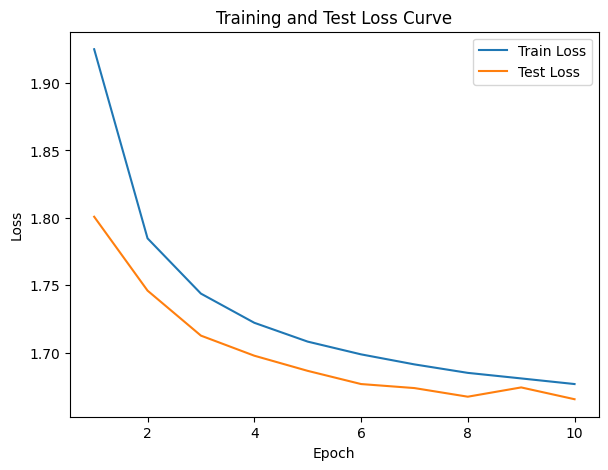

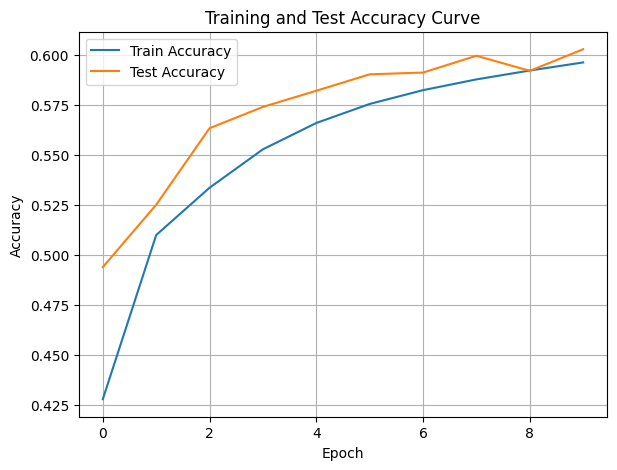

./saved_models/model_15.pth
Training Model with id 16


Training Process:  10%|█         | 1/10 [00:37<05:35, 37.25s/it]

Epoch [1/10], Train F1:0.37811502712811906, Train Loss: 1.9758, Train Acc: 0.3597, Test F1:0.35439806866597245, Test Loss: 1.8452, Test Acc: 0.4904


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.10s/it]

Epoch [2/10], Train F1:0.4194928554235142, Train Loss: 1.8888, Train Acc: 0.4330, Test F1:0.38275207805151407, Test Loss: 1.7973, Test Acc: 0.5048


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.06s/it]

Epoch [3/10], Train F1:0.43890420747983894, Train Loss: 1.8417, Train Acc: 0.4661, Test F1:0.41563466601783383, Test Loss: 1.7709, Test Acc: 0.5213


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.08s/it]

Epoch [4/10], Train F1:0.4552427360180815, Train Loss: 1.8126, Train Acc: 0.4872, Test F1:0.436770610145652, Test Loss: 1.7540, Test Acc: 0.5328


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.78s/it]

Epoch [5/10], Train F1:0.46881617947384296, Train Loss: 1.7923, Train Acc: 0.5024, Test F1:0.45556158767405963, Test Loss: 1.7398, Test Acc: 0.5429


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.07s/it]

Epoch [6/10], Train F1:0.4802021714318103, Train Loss: 1.7770, Train Acc: 0.5142, Test F1:0.46837782957020496, Test Loss: 1.7298, Test Acc: 0.5500


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.63s/it]

Epoch [7/10], Train F1:0.4896642203583458, Train Loss: 1.7650, Train Acc: 0.5238, Test F1:0.48279808864326407, Test Loss: 1.7207, Test Acc: 0.5580


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.58s/it]

Epoch [8/10], Train F1:0.4971151343861034, Train Loss: 1.7554, Train Acc: 0.5314, Test F1:0.4961213707871283, Test Loss: 1.7126, Test Acc: 0.5655


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.21s/it]

Epoch [9/10], Train F1:0.5037410793080864, Train Loss: 1.7473, Train Acc: 0.5380, Test F1:0.5070433911874608, Test Loss: 1.7055, Test Acc: 0.5721


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.93s/it]

Epoch [10/10], Train F1:0.509253446681085, Train Loss: 1.7405, Train Acc: 0.5435, Test F1:0.5152332672202313, Test Loss: 1.7002, Test Acc: 0.5772
Total Epochs: 10
Train loss start: 2.105923891067505, Train loss end: 1.6506189107894897
Highest Mean Train Accuracy (over epoch): 0.5434911338541825
Test loss start: 1.8277837038040161, Test loss end: 1.6709867715835571
Highest mean Test Accuracy (over epoch): 0.5771706079999487


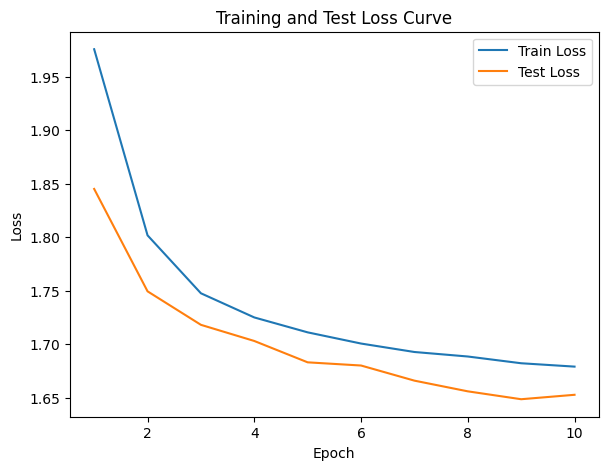

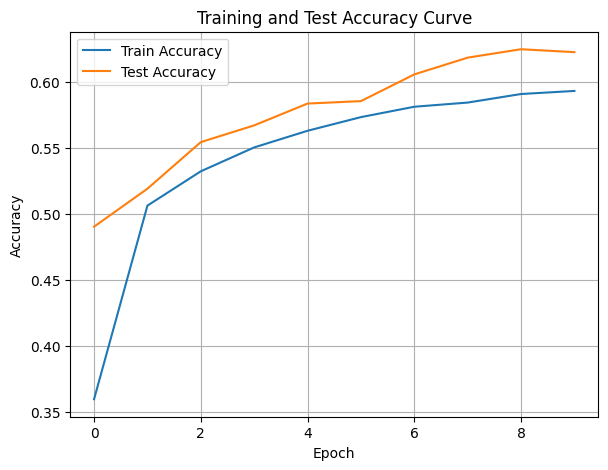

./saved_models/model_16.pth
Training Model with id 21


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.81s/it]

Epoch [1/10], Train F1:0.5613913899203345, Train Loss: 1.6755, Train Acc: 0.5973, Test F1:0.5393522924257886, Test Loss: 1.6690, Test Acc: 0.5950


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.84s/it]

Epoch [2/10], Train F1:0.5632360803890912, Train Loss: 1.6737, Train Acc: 0.5990, Test F1:0.5588619363051663, Test Loss: 1.6605, Test Acc: 0.6082


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.97s/it]

Epoch [3/10], Train F1:0.5638634705236236, Train Loss: 1.6730, Train Acc: 0.5996, Test F1:0.5700670172846021, Test Loss: 1.6547, Test Acc: 0.6161


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.01s/it]

Epoch [4/10], Train F1:0.5648182903760272, Train Loss: 1.6719, Train Acc: 0.6005, Test F1:0.5730749617873298, Test Loss: 1.6523, Test Acc: 0.6185


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.63s/it]

Epoch [5/10], Train F1:0.5659110076250446, Train Loss: 1.6709, Train Acc: 0.6015, Test F1:0.57605705323026, Test Loss: 1.6505, Test Acc: 0.6208


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.95s/it]

Epoch [6/10], Train F1:0.566885293005541, Train Loss: 1.6699, Train Acc: 0.6025, Test F1:0.5729573752232936, Test Loss: 1.6520, Test Acc: 0.6186


Training Process:  70%|███████   | 7/10 [04:49<02:10, 43.37s/it]

Epoch [7/10], Train F1:0.5676453179492145, Train Loss: 1.6692, Train Acc: 0.6032, Test F1:0.574617847096744, Test Loss: 1.6511, Test Acc: 0.6198


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.92s/it]

Epoch [8/10], Train F1:0.5683499589122729, Train Loss: 1.6685, Train Acc: 0.6039, Test F1:0.5751091217798738, Test Loss: 1.6505, Test Acc: 0.6202


Training Process:  90%|█████████ | 9/10 [06:26<00:45, 45.95s/it]

Epoch [9/10], Train F1:0.5689613753261348, Train Loss: 1.6678, Train Acc: 0.6045, Test F1:0.5771395788487574, Test Loss: 1.6494, Test Acc: 0.6217


Training Process: 100%|██████████| 10/10 [07:17<00:00, 43.76s/it]


Epoch [10/10], Train F1:0.5695633768341473, Train Loss: 1.6672, Train Acc: 0.6051, Test F1:0.5785539466335665, Test Loss: 1.6486, Test Acc: 0.6228
Total Epochs: 10
Train loss start: 1.6446030139923096, Train loss end: 1.6407440900802612
Highest Mean Train Accuracy (over epoch): 0.605073556079427
Test loss start: 1.6473798751831055, Test loss end: 1.6292729377746582
Highest mean Test Accuracy (over epoch): 0.6227776274843766


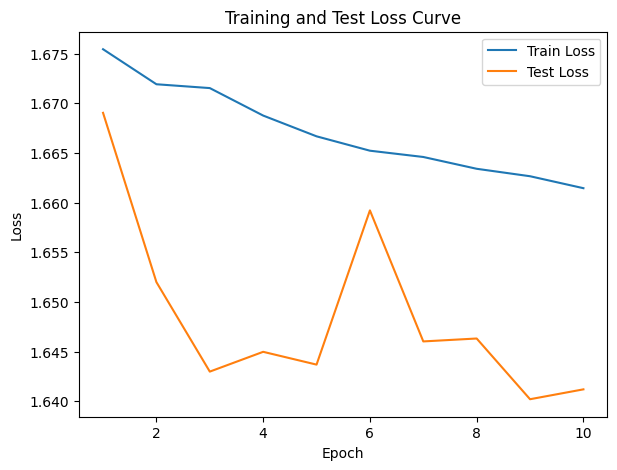

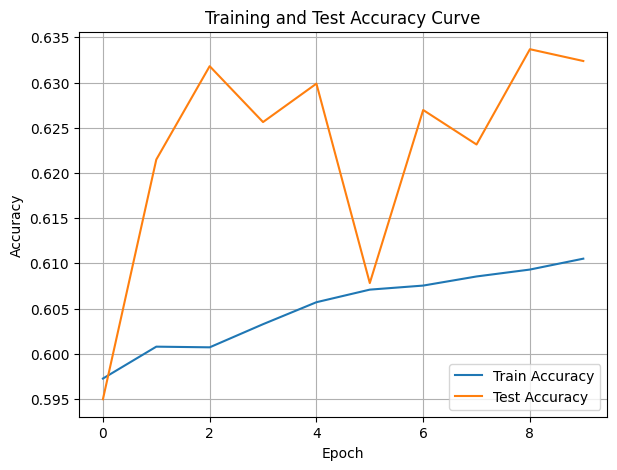

./saved_models/model_21.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.20s/it]

Epoch [1/10], Train F1:0.5763036432580501, Train Loss: 1.6609, Train Acc: 0.6114, Test F1:0.5974896996308899, Test Loss: 1.6385, Test Acc: 0.6373


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.88s/it]

Epoch [2/10], Train F1:0.5759522969021145, Train Loss: 1.6611, Train Acc: 0.6112, Test F1:0.597505446364676, Test Loss: 1.6382, Test Acc: 0.6368


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.90s/it]

Epoch [3/10], Train F1:0.5765186764855675, Train Loss: 1.6604, Train Acc: 0.6118, Test F1:0.5975811663640627, Test Loss: 1.6381, Test Acc: 0.6368


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.92s/it]

Epoch [4/10], Train F1:0.5767189076222508, Train Loss: 1.6603, Train Acc: 0.6120, Test F1:0.5973294236040756, Test Loss: 1.6382, Test Acc: 0.6365


Training Process:  50%|█████     | 5/10 [03:20<03:25, 41.10s/it]

Epoch [5/10], Train F1:0.5770824219600577, Train Loss: 1.6599, Train Acc: 0.6123, Test F1:0.5991558589419833, Test Loss: 1.6371, Test Acc: 0.6379


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.90s/it]

Epoch [6/10], Train F1:0.5774087204451335, Train Loss: 1.6597, Train Acc: 0.6126, Test F1:0.5973568423504917, Test Loss: 1.6383, Test Acc: 0.6365


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.35s/it]

Epoch [7/10], Train F1:0.5776903079632354, Train Loss: 1.6594, Train Acc: 0.6129, Test F1:0.5985487152678465, Test Loss: 1.6373, Test Acc: 0.6375


Training Process:  80%|████████  | 8/10 [05:38<01:30, 45.00s/it]

Epoch [8/10], Train F1:0.5779876088867533, Train Loss: 1.6591, Train Acc: 0.6132, Test F1:0.5984123372468023, Test Loss: 1.6370, Test Acc: 0.6375


Training Process:  90%|█████████ | 9/10 [06:33<00:47, 47.92s/it]

Epoch [9/10], Train F1:0.5782900785570054, Train Loss: 1.6588, Train Acc: 0.6135, Test F1:0.5977863602010841, Test Loss: 1.6375, Test Acc: 0.6370


Training Process: 100%|██████████| 10/10 [07:30<00:00, 45.03s/it]


Epoch [10/10], Train F1:0.5786025078111846, Train Loss: 1.6585, Train Acc: 0.6138, Test F1:0.5986164344277579, Test Loss: 1.6367, Test Acc: 0.6377
Total Epochs: 10
Train loss start: 1.6432143449783325, Train loss end: 1.6111400127410889
Highest Mean Train Accuracy (over epoch): 0.6137790091694287
Test loss start: 1.5974401235580444, Test loss end: 1.5999927520751953
Highest mean Test Accuracy (over epoch): 0.6378912653032477


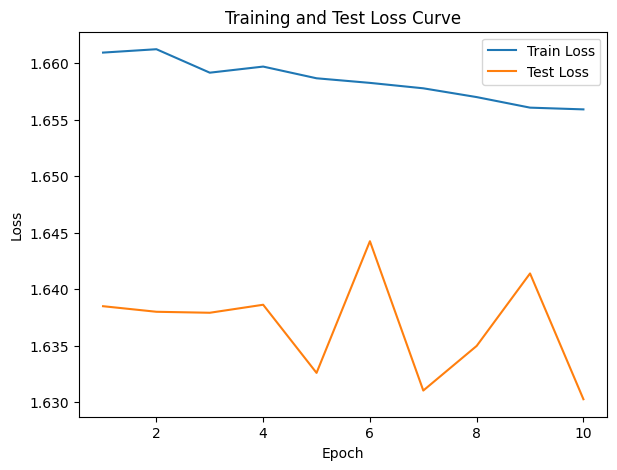

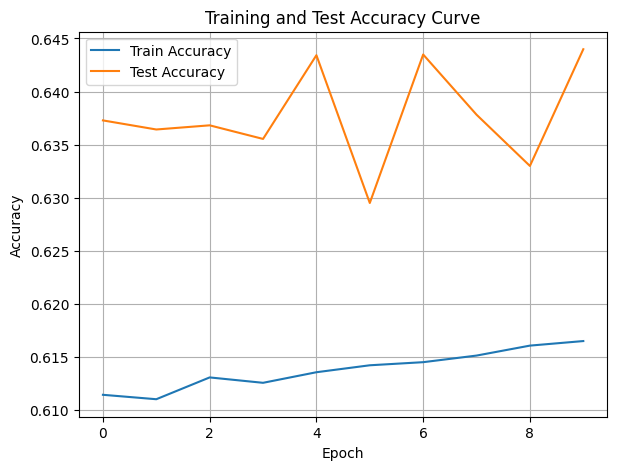

./saved_models/model_22.pth
Training Model with id 20


Training Process:  10%|█         | 1/10 [00:36<05:32, 36.97s/it]

Epoch [1/10], Train F1:0.5814913600553769, Train Loss: 1.6558, Train Acc: 0.6166, Test F1:0.5900813028703067, Test Loss: 1.6397, Test Acc: 0.6321


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.99s/it]

Epoch [2/10], Train F1:0.581528036473535, Train Loss: 1.6557, Train Acc: 0.6166, Test F1:0.5995687627571227, Test Loss: 1.6342, Test Acc: 0.6396


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.89s/it]

Epoch [3/10], Train F1:0.5814685175419383, Train Loss: 1.6557, Train Acc: 0.6165, Test F1:0.601306635942094, Test Loss: 1.6333, Test Acc: 0.6408


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.03s/it]

Epoch [4/10], Train F1:0.5816135628146296, Train Loss: 1.6555, Train Acc: 0.6167, Test F1:0.6005038416108025, Test Loss: 1.6344, Test Acc: 0.6397


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.78s/it]

Epoch [5/10], Train F1:0.5816429223012589, Train Loss: 1.6555, Train Acc: 0.6167, Test F1:0.601546110643159, Test Loss: 1.6338, Test Acc: 0.6405


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.08s/it]

Epoch [6/10], Train F1:0.5817957791085573, Train Loss: 1.6553, Train Acc: 0.6168, Test F1:0.6001394540997064, Test Loss: 1.6350, Test Acc: 0.6391


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.50s/it]

Epoch [7/10], Train F1:0.5820092393637153, Train Loss: 1.6551, Train Acc: 0.6170, Test F1:0.5993915583683123, Test Loss: 1.6355, Test Acc: 0.6385


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.87s/it]

Epoch [8/10], Train F1:0.5820793526625353, Train Loss: 1.6551, Train Acc: 0.6171, Test F1:0.5992771299811189, Test Loss: 1.6355, Test Acc: 0.6384


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.46s/it]

Epoch [9/10], Train F1:0.5823642814375538, Train Loss: 1.6548, Train Acc: 0.6173, Test F1:0.5987137429460296, Test Loss: 1.6358, Test Acc: 0.6380


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.97s/it]

Epoch [10/10], Train F1:0.5823904540029449, Train Loss: 1.6548, Train Acc: 0.6174, Test F1:0.5986103415823627, Test Loss: 1.6358, Test Acc: 0.6379
Total Epochs: 10
Train loss start: 1.6135550737380981, Train loss end: 1.7740797996520996
Highest Mean Train Accuracy (over epoch): 0.6173635824996725
Test loss start: 1.6051074266433716, Test loss end: 1.5974539518356323
Highest mean Test Accuracy (over epoch): 0.6408444372588191


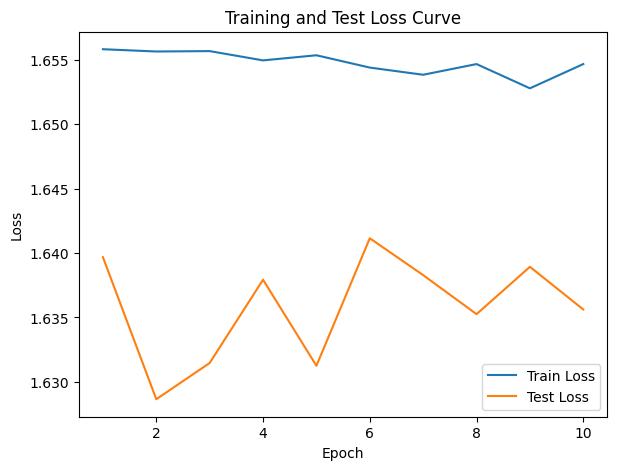

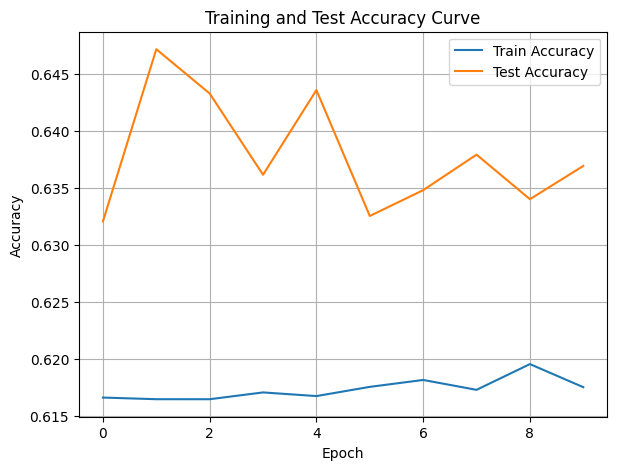

./saved_models/model_20.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.12s/it]

Epoch [1/10], Train F1:0.5834035721200536, Train Loss: 1.6540, Train Acc: 0.6183, Test F1:0.5844323323786742, Test Loss: 1.6442, Test Acc: 0.6273


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.95s/it]

Epoch [2/10], Train F1:0.5843198403363993, Train Loss: 1.6530, Train Acc: 0.6193, Test F1:0.5896776146604243, Test Loss: 1.6414, Test Acc: 0.6310


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.94s/it]

Epoch [3/10], Train F1:0.5842917465926407, Train Loss: 1.6530, Train Acc: 0.6193, Test F1:0.5912097629831149, Test Loss: 1.6405, Test Acc: 0.6321


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.11s/it]

Epoch [4/10], Train F1:0.5842096227637344, Train Loss: 1.6530, Train Acc: 0.6192, Test F1:0.5926641519921919, Test Loss: 1.6395, Test Acc: 0.6332


Training Process:  50%|█████     | 5/10 [03:19<03:24, 40.90s/it]

Epoch [5/10], Train F1:0.5843370202348991, Train Loss: 1.6528, Train Acc: 0.6193, Test F1:0.594092319025161, Test Loss: 1.6386, Test Acc: 0.6342


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.14s/it]

Epoch [6/10], Train F1:0.584353480285642, Train Loss: 1.6528, Train Acc: 0.6193, Test F1:0.596391353324704, Test Loss: 1.6372, Test Acc: 0.6360


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.57s/it]

Epoch [7/10], Train F1:0.5842781668508328, Train Loss: 1.6529, Train Acc: 0.6192, Test F1:0.5983003893699055, Test Loss: 1.6361, Test Acc: 0.6373


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.72s/it]

Epoch [8/10], Train F1:0.5844122288285188, Train Loss: 1.6527, Train Acc: 0.6194, Test F1:0.5981126163817079, Test Loss: 1.6362, Test Acc: 0.6372


Training Process:  90%|█████████ | 9/10 [06:26<00:45, 45.91s/it]

Epoch [9/10], Train F1:0.5844842727821438, Train Loss: 1.6527, Train Acc: 0.6194, Test F1:0.5974161145709116, Test Loss: 1.6366, Test Acc: 0.6367


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.84s/it]

Epoch [10/10], Train F1:0.58456932541864, Train Loss: 1.6526, Train Acc: 0.6195, Test F1:0.596771264485144, Test Loss: 1.6371, Test Acc: 0.6362
Total Epochs: 10
Train loss start: 1.6357415914535522, Train loss end: 1.5612683296203613
Highest Mean Train Accuracy (over epoch): 0.6195153119049779
Test loss start: 1.6072742938995361, Test loss end: 1.5899251699447632
Highest mean Test Accuracy (over epoch): 0.637336614048985


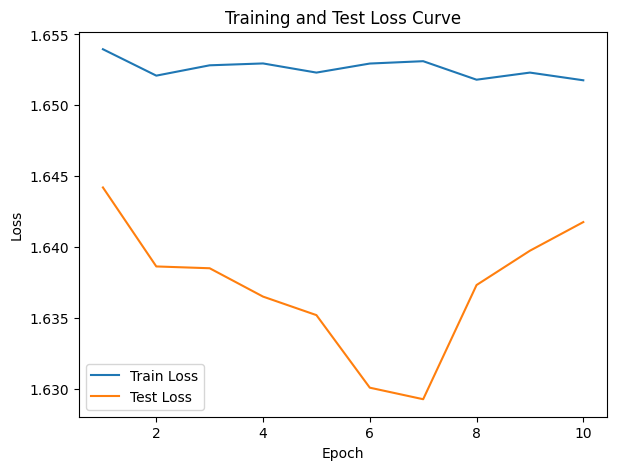

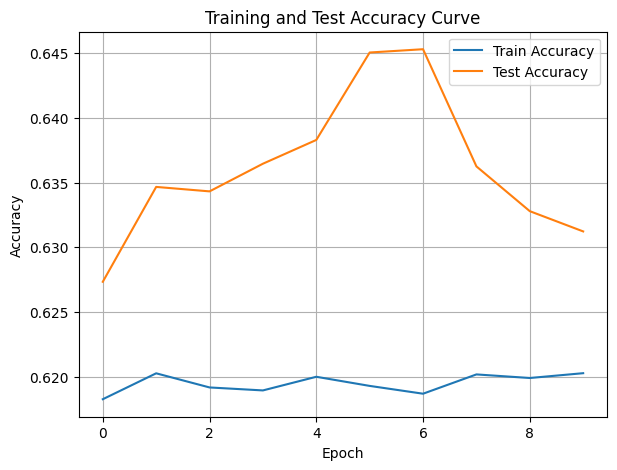

./saved_models/model_22.pth
Training Model with id 23


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.06s/it]

Epoch [1/10], Train F1:0.5847481705564619, Train Loss: 1.6523, Train Acc: 0.6197, Test F1:0.5810749745641731, Test Loss: 1.6439, Test Acc: 0.6260


Training Process:  20%|██        | 2/10 [01:15<05:05, 38.15s/it]

Epoch [2/10], Train F1:0.585373194763554, Train Loss: 1.6519, Train Acc: 0.6203, Test F1:0.5855510642179586, Test Loss: 1.6442, Test Acc: 0.6279


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.00s/it]

Epoch [3/10], Train F1:0.585679882802198, Train Loss: 1.6516, Train Acc: 0.6206, Test F1:0.5909137970778827, Test Loss: 1.6409, Test Acc: 0.6318


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.09s/it]

Epoch [4/10], Train F1:0.5855602604984629, Train Loss: 1.6516, Train Acc: 0.6205, Test F1:0.5952451217648372, Test Loss: 1.6378, Test Acc: 0.6350


Training Process:  50%|█████     | 5/10 [03:20<03:24, 40.91s/it]

Epoch [5/10], Train F1:0.5856458929080812, Train Loss: 1.6515, Train Acc: 0.6206, Test F1:0.5946953939851648, Test Loss: 1.6380, Test Acc: 0.6348


Training Process:  60%|██████    | 6/10 [04:04<02:49, 42.26s/it]

Epoch [6/10], Train F1:0.5858426122019481, Train Loss: 1.6513, Train Acc: 0.6207, Test F1:0.596608917490376, Test Loss: 1.6370, Test Acc: 0.6362


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.57s/it]

Epoch [7/10], Train F1:0.5858284891277759, Train Loss: 1.6513, Train Acc: 0.6207, Test F1:0.5965268112691976, Test Loss: 1.6372, Test Acc: 0.6361


Training Process:  80%|████████  | 8/10 [05:39<01:29, 44.91s/it]

Epoch [8/10], Train F1:0.5858358280441707, Train Loss: 1.6513, Train Acc: 0.6207, Test F1:0.5960514416689301, Test Loss: 1.6375, Test Acc: 0.6357


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.48s/it]

Epoch [9/10], Train F1:0.5858900618648214, Train Loss: 1.6513, Train Acc: 0.6208, Test F1:0.5961156811088314, Test Loss: 1.6373, Test Acc: 0.6358


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.03s/it]

Epoch [10/10], Train F1:0.5859538026377388, Train Loss: 1.6512, Train Acc: 0.6208, Test F1:0.5965411986102109, Test Loss: 1.6370, Test Acc: 0.6361
Total Epochs: 10
Train loss start: 1.5610157251358032, Train loss end: 1.7101701498031616
Highest Mean Train Accuracy (over epoch): 0.6208481354291548
Test loss start: 1.617368459701538, Test loss end: 1.591765284538269
Highest mean Test Accuracy (over epoch): 0.6362190133247105


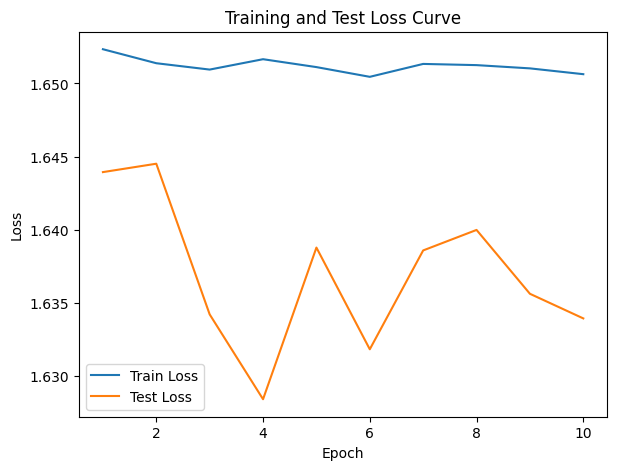

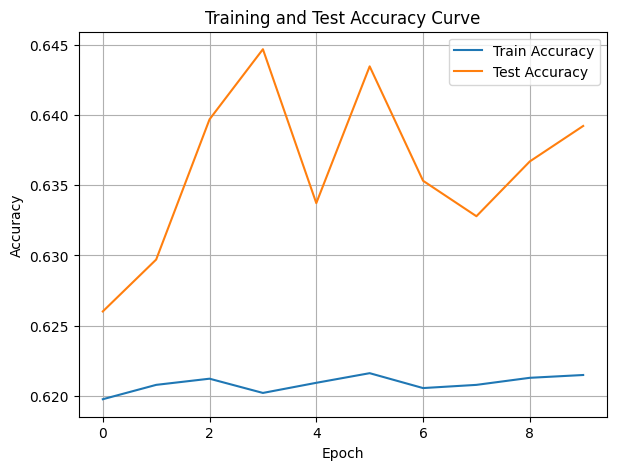

./saved_models/model_23.pth
Training Model with id 21


Training Process:  10%|█         | 1/10 [00:37<05:34, 37.16s/it]

Epoch [1/10], Train F1:0.5867673572830134, Train Loss: 1.6507, Train Acc: 0.6214, Test F1:0.6030700361858501, Test Loss: 1.6349, Test Acc: 0.6404


Training Process:  20%|██        | 2/10 [01:15<05:03, 37.88s/it]

Epoch [2/10], Train F1:0.5869705666717708, Train Loss: 1.6506, Train Acc: 0.6216, Test F1:0.6047171148733063, Test Loss: 1.6333, Test Acc: 0.6416


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.87s/it]

Epoch [3/10], Train F1:0.5869350836485164, Train Loss: 1.6506, Train Acc: 0.6216, Test F1:0.604541072810812, Test Loss: 1.6333, Test Acc: 0.6414


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.92s/it]

Epoch [4/10], Train F1:0.5871450190419524, Train Loss: 1.6504, Train Acc: 0.6218, Test F1:0.6024535207206942, Test Loss: 1.6344, Test Acc: 0.6399


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.69s/it]

Epoch [5/10], Train F1:0.5872647292317751, Train Loss: 1.6503, Train Acc: 0.6220, Test F1:0.602262309149678, Test Loss: 1.6340, Test Acc: 0.6398


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.03s/it]

Epoch [6/10], Train F1:0.5871438014134631, Train Loss: 1.6504, Train Acc: 0.6219, Test F1:0.6017549063274955, Test Loss: 1.6346, Test Acc: 0.6394


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.47s/it]

Epoch [7/10], Train F1:0.5872296007802396, Train Loss: 1.6502, Train Acc: 0.6220, Test F1:0.6012104337947677, Test Loss: 1.6348, Test Acc: 0.6391


Training Process:  80%|████████  | 8/10 [05:38<01:30, 45.02s/it]

Epoch [8/10], Train F1:0.5872495570705132, Train Loss: 1.6502, Train Acc: 0.6220, Test F1:0.6012611540578388, Test Loss: 1.6350, Test Acc: 0.6392


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.45s/it]

Epoch [9/10], Train F1:0.5874477776295386, Train Loss: 1.6500, Train Acc: 0.6222, Test F1:0.6010391572623065, Test Loss: 1.6351, Test Acc: 0.6390


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.90s/it]


Epoch [10/10], Train F1:0.5875309980306533, Train Loss: 1.6500, Train Acc: 0.6222, Test F1:0.6000861502170666, Test Loss: 1.6356, Test Acc: 0.6383
Total Epochs: 10
Train loss start: 1.605177879333496, Train loss end: 1.543790340423584
Highest Mean Train Accuracy (over epoch): 0.6222485627117733
Test loss start: 1.57103431224823, Test loss end: 1.596771240234375
Highest mean Test Accuracy (over epoch): 0.6415512386666326


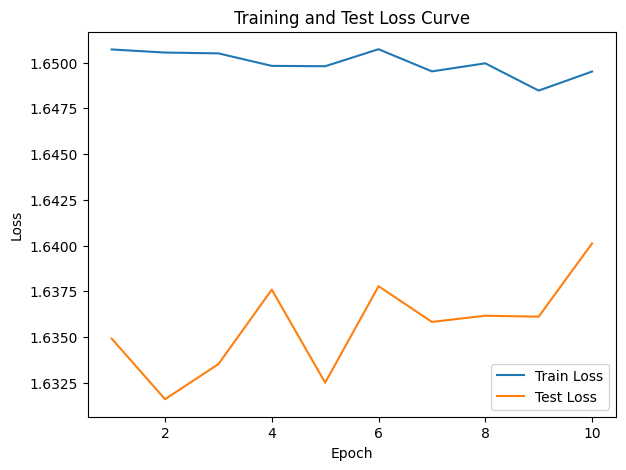

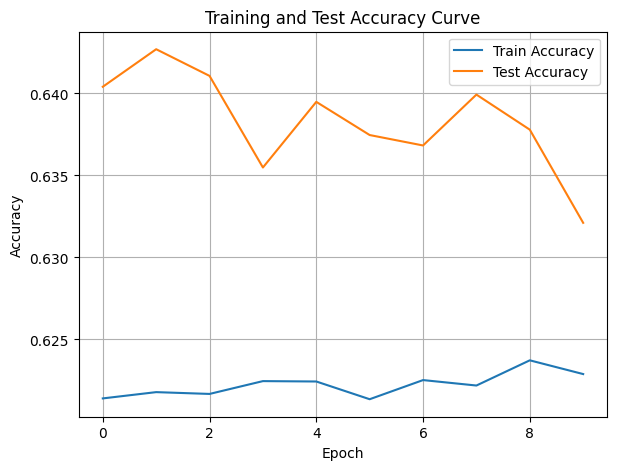

./saved_models/model_21.pth
Training Model with id 19


Training Process:  10%|█         | 1/10 [00:36<05:26, 36.25s/it]

Epoch [1/10], Train F1:0.5884371883316166, Train Loss: 1.6492, Train Acc: 0.6231, Test F1:0.5978382033854018, Test Loss: 1.6351, Test Acc: 0.6370


Training Process:  20%|██        | 2/10 [01:14<04:59, 37.47s/it]

Epoch [2/10], Train F1:0.5879259727982783, Train Loss: 1.6494, Train Acc: 0.6226, Test F1:0.6007522382663448, Test Loss: 1.6345, Test Acc: 0.6388


Training Process:  30%|███       | 3/10 [01:54<04:31, 38.74s/it]

Epoch [3/10], Train F1:0.5879426263876296, Train Loss: 1.6494, Train Acc: 0.6227, Test F1:0.5977971391602046, Test Loss: 1.6363, Test Acc: 0.6366


Training Process:  40%|████      | 4/10 [02:36<03:58, 39.75s/it]

Epoch [4/10], Train F1:0.5879679762560838, Train Loss: 1.6494, Train Acc: 0.6227, Test F1:0.59729217184607, Test Loss: 1.6373, Test Acc: 0.6362


Training Process:  50%|█████     | 5/10 [03:19<03:25, 41.00s/it]

Epoch [5/10], Train F1:0.5881295217105287, Train Loss: 1.6492, Train Acc: 0.6229, Test F1:0.5962781263347564, Test Loss: 1.6379, Test Acc: 0.6354


Training Process:  60%|██████    | 6/10 [04:04<02:49, 42.27s/it]

Epoch [6/10], Train F1:0.5880118638274883, Train Loss: 1.6493, Train Acc: 0.6228, Test F1:0.5942361608528047, Test Loss: 1.6391, Test Acc: 0.6339


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.19s/it]

Epoch [7/10], Train F1:0.588017356368659, Train Loss: 1.6493, Train Acc: 0.6228, Test F1:0.5941119140443701, Test Loss: 1.6392, Test Acc: 0.6339


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.78s/it]

Epoch [8/10], Train F1:0.5880183284279117, Train Loss: 1.6493, Train Acc: 0.6228, Test F1:0.5936889719005382, Test Loss: 1.6394, Test Acc: 0.6336


Training Process:  90%|█████████ | 9/10 [06:25<00:45, 45.90s/it]

Epoch [9/10], Train F1:0.5880463822874317, Train Loss: 1.6493, Train Acc: 0.6228, Test F1:0.593978869585355, Test Loss: 1.6394, Test Acc: 0.6338


Training Process: 100%|██████████| 10/10 [07:15<00:00, 43.55s/it]


Epoch [10/10], Train F1:0.5880538226445285, Train Loss: 1.6493, Train Acc: 0.6228, Test F1:0.5934626478550111, Test Loss: 1.6400, Test Acc: 0.6334
Total Epochs: 10
Train loss start: 1.6348257064819336, Train loss end: 1.6899466514587402
Highest Mean Train Accuracy (over epoch): 0.6230734188150431
Test loss start: 1.594881296157837, Test loss end: 1.5860697031021118
Highest mean Test Accuracy (over epoch): 0.6388024368340847


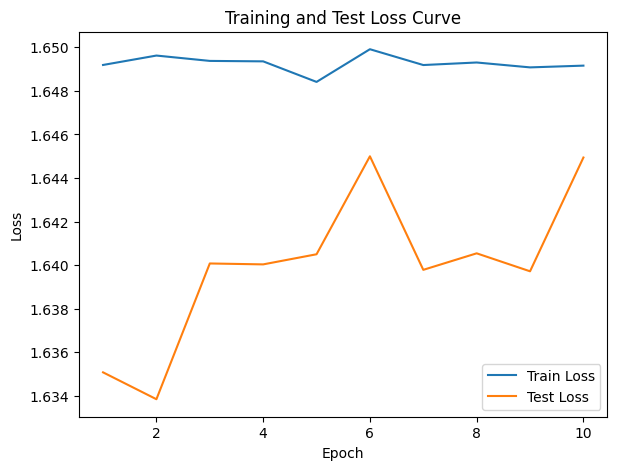

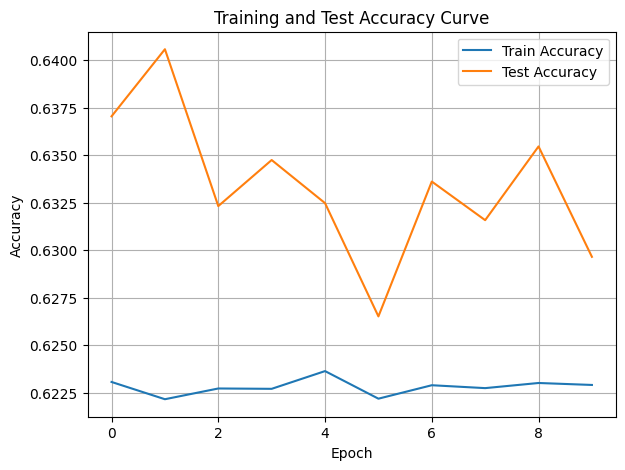

./saved_models/model_19.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.09s/it]

Epoch [1/10], Train F1:0.5886269633210041, Train Loss: 1.6486, Train Acc: 0.6233, Test F1:0.5926056251384969, Test Loss: 1.6395, Test Acc: 0.6334


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.12s/it]

Epoch [2/10], Train F1:0.5888307831615212, Train Loss: 1.6486, Train Acc: 0.6235, Test F1:0.5927080503077989, Test Loss: 1.6395, Test Acc: 0.6332


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.04s/it]

Epoch [3/10], Train F1:0.5891269664935544, Train Loss: 1.6483, Train Acc: 0.6238, Test F1:0.5967860164838558, Test Loss: 1.6373, Test Acc: 0.6359


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.93s/it]

Epoch [4/10], Train F1:0.5890978260403344, Train Loss: 1.6483, Train Acc: 0.6237, Test F1:0.5988106833770257, Test Loss: 1.6361, Test Acc: 0.6371


Training Process:  50%|█████     | 5/10 [03:20<03:25, 41.07s/it]

Epoch [5/10], Train F1:0.5890990095556773, Train Loss: 1.6484, Train Acc: 0.6237, Test F1:0.5961486797850866, Test Loss: 1.6379, Test Acc: 0.6351


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.84s/it]

Epoch [6/10], Train F1:0.5891758076538955, Train Loss: 1.6483, Train Acc: 0.6238, Test F1:0.5976601380402504, Test Loss: 1.6368, Test Acc: 0.6362


Training Process:  70%|███████   | 7/10 [04:49<02:09, 43.26s/it]

Epoch [7/10], Train F1:0.5892729482181521, Train Loss: 1.6483, Train Acc: 0.6239, Test F1:0.599310762321149, Test Loss: 1.6356, Test Acc: 0.6372


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.92s/it]

Epoch [8/10], Train F1:0.5893132732321572, Train Loss: 1.6482, Train Acc: 0.6239, Test F1:0.5990149777493821, Test Loss: 1.6357, Test Acc: 0.6370


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.55s/it]

Epoch [9/10], Train F1:0.5892974223190068, Train Loss: 1.6482, Train Acc: 0.6239, Test F1:0.5931915273673751, Test Loss: 1.6397, Test Acc: 0.6325


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.97s/it]


Epoch [10/10], Train F1:0.5892281906376337, Train Loss: 1.6483, Train Acc: 0.6239, Test F1:0.5943573116865339, Test Loss: 1.6392, Test Acc: 0.6334
Total Epochs: 10
Train loss start: 1.6902434825897217, Train loss end: 1.4770251512527466
Highest Mean Train Accuracy (over epoch): 0.6239424778802855
Test loss start: 1.5987237691879272, Test loss end: 1.5857478380203247
Highest mean Test Accuracy (over epoch): 0.6372290774053448


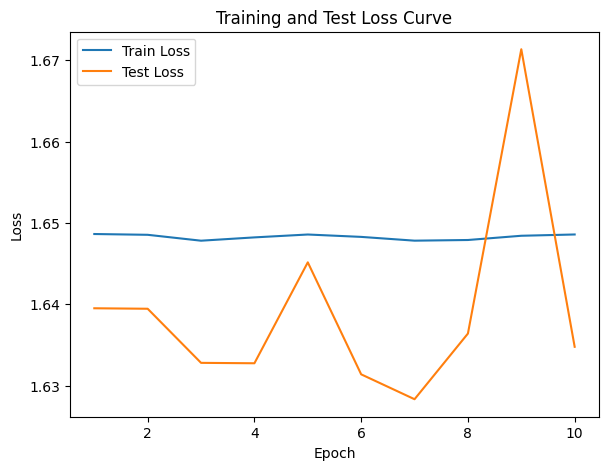

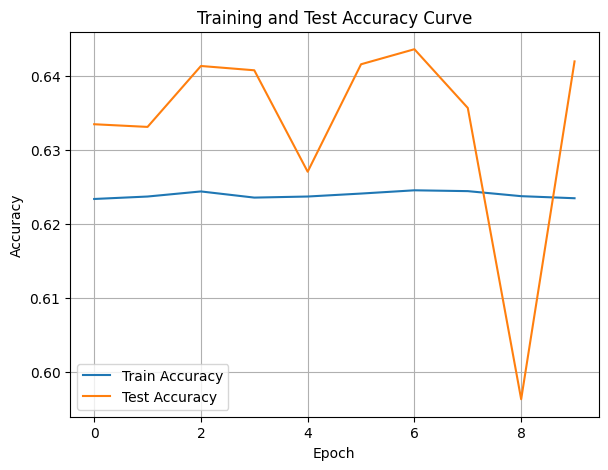

./saved_models/model_22.pth
Training Model with id 23


Training Process:  10%|█         | 1/10 [00:36<05:31, 36.84s/it]

Epoch [1/10], Train F1:0.5892743471388209, Train Loss: 1.6481, Train Acc: 0.6241, Test F1:0.578748265619295, Test Loss: 1.6497, Test Acc: 0.6225


Training Process:  20%|██        | 2/10 [01:15<05:02, 37.86s/it]

Epoch [2/10], Train F1:0.5891916684918782, Train Loss: 1.6481, Train Acc: 0.6241, Test F1:0.585685571759075, Test Loss: 1.6451, Test Acc: 0.6277


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.90s/it]

Epoch [3/10], Train F1:0.5894163477092556, Train Loss: 1.6480, Train Acc: 0.6242, Test F1:0.5834013156410335, Test Loss: 1.6466, Test Acc: 0.6260


Training Process:  40%|████      | 4/10 [02:37<03:59, 39.96s/it]

Epoch [4/10], Train F1:0.5893734073809211, Train Loss: 1.6480, Train Acc: 0.6242, Test F1:0.5855402354936722, Test Loss: 1.6457, Test Acc: 0.6275


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.65s/it]

Epoch [5/10], Train F1:0.5893386778909396, Train Loss: 1.6481, Train Acc: 0.6241, Test F1:0.586157394465472, Test Loss: 1.6451, Test Acc: 0.6279


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.10s/it]

Epoch [6/10], Train F1:0.5893033467857619, Train Loss: 1.6481, Train Acc: 0.6240, Test F1:0.5890565741277302, Test Loss: 1.6435, Test Acc: 0.6301


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.45s/it]

Epoch [7/10], Train F1:0.5893678339863191, Train Loss: 1.6481, Train Acc: 0.6241, Test F1:0.5891616468563239, Test Loss: 1.6437, Test Acc: 0.6301


Training Process:  80%|████████  | 8/10 [05:36<01:29, 44.51s/it]

Epoch [8/10], Train F1:0.5893461924909164, Train Loss: 1.6481, Train Acc: 0.6241, Test F1:0.5886461822828076, Test Loss: 1.6440, Test Acc: 0.6297


Training Process:  90%|█████████ | 9/10 [06:26<00:46, 46.18s/it]

Epoch [9/10], Train F1:0.589390298609441, Train Loss: 1.6480, Train Acc: 0.6241, Test F1:0.5889505715200775, Test Loss: 1.6438, Test Acc: 0.6299


Training Process: 100%|██████████| 10/10 [07:18<00:00, 43.83s/it]


Epoch [10/10], Train F1:0.5894848386538831, Train Loss: 1.6479, Train Acc: 0.6242, Test F1:0.5889195976367213, Test Loss: 1.6437, Test Acc: 0.6299
Total Epochs: 10
Train loss start: 1.6483535766601562, Train loss end: 1.5812304019927979
Highest Mean Train Accuracy (over epoch): 0.6242455181289731
Test loss start: 1.605368971824646, Test loss end: 1.595433235168457
Highest mean Test Accuracy (over epoch): 0.6301085908572014


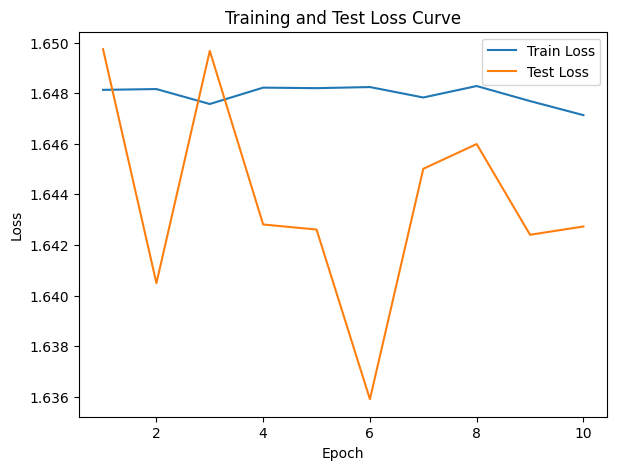

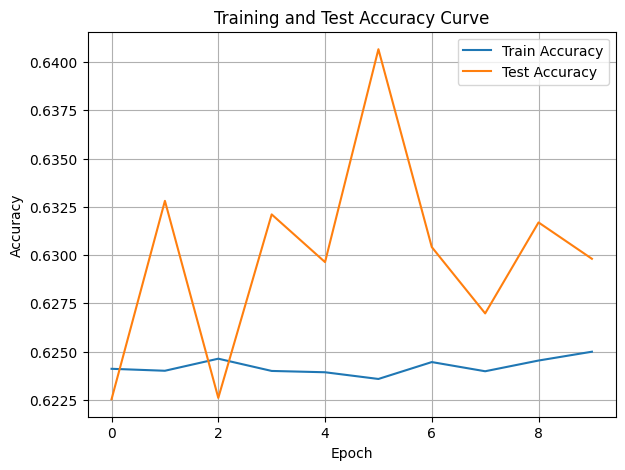

./saved_models/model_23.pth
Training Model with id 21


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.03s/it]

Epoch [1/10], Train F1:0.5894663716583487, Train Loss: 1.6480, Train Acc: 0.6240, Test F1:0.5907110801372334, Test Loss: 1.6435, Test Acc: 0.6313


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.02s/it]

Epoch [2/10], Train F1:0.5898928073632838, Train Loss: 1.6475, Train Acc: 0.6245, Test F1:0.5887216568771448, Test Loss: 1.6436, Test Acc: 0.6298


Training Process:  30%|███       | 3/10 [01:56<04:33, 39.11s/it]

Epoch [3/10], Train F1:0.5900784459425398, Train Loss: 1.6473, Train Acc: 0.6247, Test F1:0.5874852159338095, Test Loss: 1.6441, Test Acc: 0.6290


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.07s/it]

Epoch [4/10], Train F1:0.590068982823225, Train Loss: 1.6474, Train Acc: 0.6246, Test F1:0.5876801442777047, Test Loss: 1.6438, Test Acc: 0.6291


Training Process:  50%|█████     | 5/10 [03:19<03:23, 40.69s/it]

Epoch [5/10], Train F1:0.5899002109874353, Train Loss: 1.6475, Train Acc: 0.6244, Test F1:0.5885911602276006, Test Loss: 1.6436, Test Acc: 0.6298


Training Process:  60%|██████    | 6/10 [04:04<02:48, 42.05s/it]

Epoch [6/10], Train F1:0.5899875002179623, Train Loss: 1.6474, Train Acc: 0.6245, Test F1:0.5892364926224145, Test Loss: 1.6431, Test Acc: 0.6301


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.42s/it]

Epoch [7/10], Train F1:0.5899334866088678, Train Loss: 1.6475, Train Acc: 0.6245, Test F1:0.5910586893705795, Test Loss: 1.6421, Test Acc: 0.6313


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.81s/it]

Epoch [8/10], Train F1:0.5899487235562878, Train Loss: 1.6475, Train Acc: 0.6245, Test F1:0.5904837905558263, Test Loss: 1.6425, Test Acc: 0.6309


Training Process:  90%|█████████ | 9/10 [06:28<00:46, 46.55s/it]

Epoch [9/10], Train F1:0.5901406131521995, Train Loss: 1.6473, Train Acc: 0.6247, Test F1:0.5895678042193337, Test Loss: 1.6431, Test Acc: 0.6303


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.95s/it]


Epoch [10/10], Train F1:0.5902043452084118, Train Loss: 1.6473, Train Acc: 0.6248, Test F1:0.5896106609653576, Test Loss: 1.6430, Test Acc: 0.6303
Total Epochs: 10
Train loss start: 1.6410596370697021, Train loss end: 1.6233649253845215
Highest Mean Train Accuracy (over epoch): 0.6248045084423892
Test loss start: 1.5844472646713257, Test loss end: 1.594908595085144
Highest mean Test Accuracy (over epoch): 0.6313070155740045


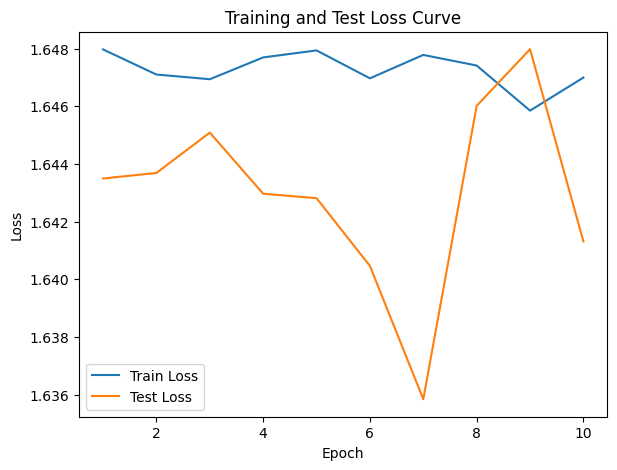

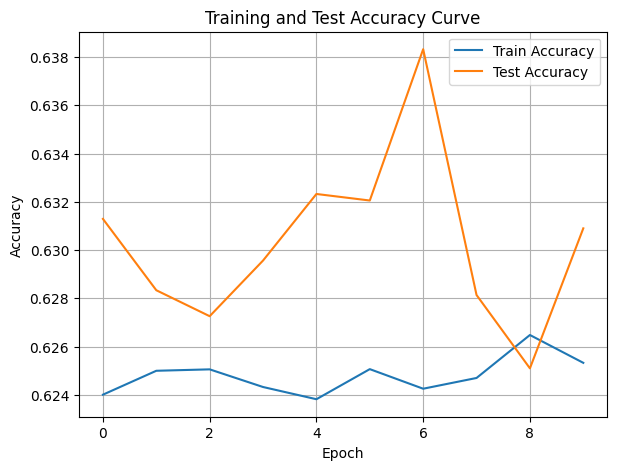

./saved_models/model_21.pth
Training Model with id 23


Training Process:  10%|█         | 1/10 [00:36<05:27, 36.34s/it]

Epoch [1/10], Train F1:0.5892427524919321, Train Loss: 1.6482, Train Acc: 0.6238, Test F1:0.5861288516391174, Test Loss: 1.6449, Test Acc: 0.6277


Training Process:  20%|██        | 2/10 [01:14<05:00, 37.60s/it]

Epoch [2/10], Train F1:0.5902133834984862, Train Loss: 1.6473, Train Acc: 0.6248, Test F1:0.59334262680141, Test Loss: 1.6406, Test Acc: 0.6324


Training Process:  30%|███       | 3/10 [01:55<04:31, 38.84s/it]

Epoch [3/10], Train F1:0.5904177306561108, Train Loss: 1.6471, Train Acc: 0.6250, Test F1:0.5941118305939564, Test Loss: 1.6410, Test Acc: 0.6331


Training Process:  40%|████      | 4/10 [02:36<03:59, 39.98s/it]

Epoch [4/10], Train F1:0.5902534213763067, Train Loss: 1.6472, Train Acc: 0.6248, Test F1:0.592278741475925, Test Loss: 1.6422, Test Acc: 0.6319


Training Process:  50%|█████     | 5/10 [03:18<03:22, 40.57s/it]

Epoch [5/10], Train F1:0.5903488714728762, Train Loss: 1.6471, Train Acc: 0.6249, Test F1:0.5911746866045418, Test Loss: 1.6426, Test Acc: 0.6312


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.02s/it]

Epoch [6/10], Train F1:0.5904864509632788, Train Loss: 1.6470, Train Acc: 0.6251, Test F1:0.5908304867718243, Test Loss: 1.6426, Test Acc: 0.6310


Training Process:  70%|███████   | 7/10 [04:49<02:10, 43.44s/it]

Epoch [7/10], Train F1:0.5904818815654436, Train Loss: 1.6470, Train Acc: 0.6250, Test F1:0.5899782428975798, Test Loss: 1.6431, Test Acc: 0.6304


Training Process:  80%|████████  | 8/10 [05:36<01:29, 44.51s/it]

Epoch [8/10], Train F1:0.5904947277453526, Train Loss: 1.6469, Train Acc: 0.6251, Test F1:0.5888902734162993, Test Loss: 1.6437, Test Acc: 0.6296


Training Process:  90%|█████████ | 9/10 [06:24<00:45, 45.66s/it]

Epoch [9/10], Train F1:0.5905660738473244, Train Loss: 1.6469, Train Acc: 0.6251, Test F1:0.5897057933921617, Test Loss: 1.6434, Test Acc: 0.6302


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.62s/it]


Epoch [10/10], Train F1:0.5905439935502702, Train Loss: 1.6469, Train Acc: 0.6251, Test F1:0.5901991248949782, Test Loss: 1.6428, Test Acc: 0.6305
Total Epochs: 10
Train loss start: 1.5144857168197632, Train loss end: 1.7026787996292114
Highest Mean Train Accuracy (over epoch): 0.6251401153132763
Test loss start: 1.5915619134902954, Test loss end: 1.599366307258606
Highest mean Test Accuracy (over epoch): 0.6330834950099034


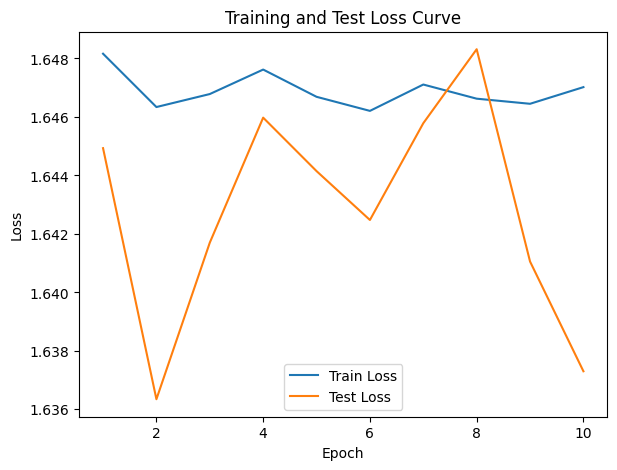

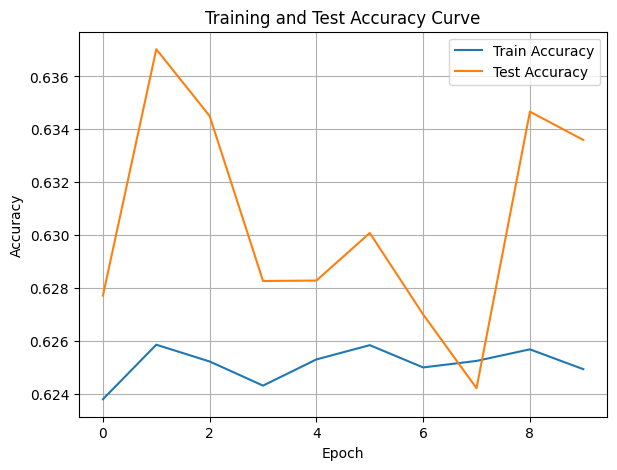

./saved_models/model_23.pth
Training Model with id 24


Training Process:  10%|█         | 1/10 [00:37<05:33, 37.08s/it]

Epoch [1/10], Train F1:0.5910099774554161, Train Loss: 1.6465, Train Acc: 0.6256, Test F1:0.5877107362270702, Test Loss: 1.6472, Test Acc: 0.6287


Training Process:  20%|██        | 2/10 [01:15<05:04, 38.04s/it]

Epoch [2/10], Train F1:0.5908983766881454, Train Loss: 1.6466, Train Acc: 0.6254, Test F1:0.585518062480659, Test Loss: 1.6473, Test Acc: 0.6273


Training Process:  30%|███       | 3/10 [01:55<04:33, 39.02s/it]

Epoch [3/10], Train F1:0.5910598964967503, Train Loss: 1.6464, Train Acc: 0.6256, Test F1:0.5827859478339596, Test Loss: 1.6486, Test Acc: 0.6254


Training Process:  40%|████      | 4/10 [02:38<04:02, 40.38s/it]

Epoch [4/10], Train F1:0.5910741476060567, Train Loss: 1.6464, Train Acc: 0.6256, Test F1:0.5846695062416992, Test Loss: 1.6476, Test Acc: 0.6268


Training Process:  50%|█████     | 5/10 [03:20<03:24, 40.98s/it]

Epoch [5/10], Train F1:0.5910472365347571, Train Loss: 1.6465, Train Acc: 0.6256, Test F1:0.5850193797087874, Test Loss: 1.6471, Test Acc: 0.6270


Training Process:  60%|██████    | 6/10 [04:05<02:48, 42.20s/it]

Epoch [6/10], Train F1:0.5910282979795152, Train Loss: 1.6465, Train Acc: 0.6256, Test F1:0.5867943827894823, Test Loss: 1.6462, Test Acc: 0.6282


Training Process:  70%|███████   | 7/10 [04:51<02:10, 43.66s/it]

Epoch [7/10], Train F1:0.5911008623042211, Train Loss: 1.6464, Train Acc: 0.6256, Test F1:0.5874216063537437, Test Loss: 1.6458, Test Acc: 0.6286


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.15s/it]

Epoch [8/10], Train F1:0.5910495186179094, Train Loss: 1.6464, Train Acc: 0.6256, Test F1:0.5867779999534202, Test Loss: 1.6460, Test Acc: 0.6282


Training Process:  90%|█████████ | 9/10 [06:30<00:46, 46.86s/it]

Epoch [9/10], Train F1:0.5909386579459762, Train Loss: 1.6465, Train Acc: 0.6255, Test F1:0.5839765710114174, Test Loss: 1.6474, Test Acc: 0.6262


Training Process: 100%|██████████| 10/10 [07:22<00:00, 44.21s/it]

Epoch [10/10], Train F1:0.5909180570599347, Train Loss: 1.6466, Train Acc: 0.6255, Test F1:0.5831791897371901, Test Loss: 1.6477, Test Acc: 0.6256
Total Epochs: 10
Train loss start: 1.6752784252166748, Train loss end: 1.6003235578536987
Highest Mean Train Accuracy (over epoch): 0.6256456418288293
Test loss start: 1.5895847082138062, Test loss end: 1.592880368232727
Highest mean Test Accuracy (over epoch): 0.6286539305014854


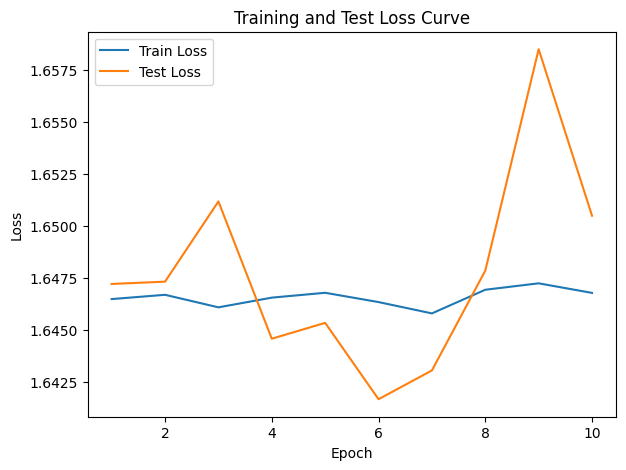

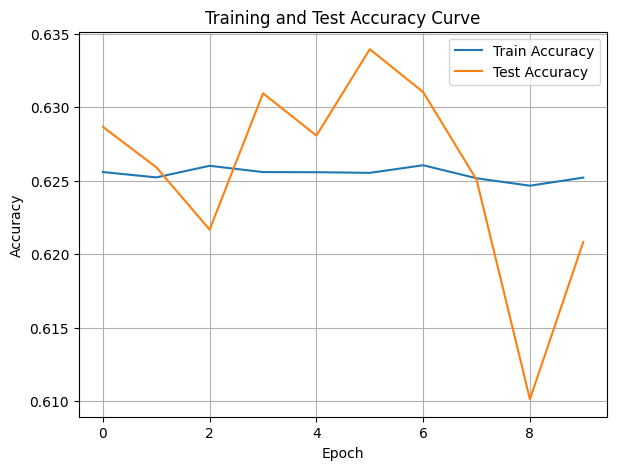

./saved_models/model_24.pth
Training Model with id 22


Training Process:  10%|█         | 1/10 [00:36<05:28, 36.46s/it]

Epoch [1/10], Train F1:0.5919427633420775, Train Loss: 1.6457, Train Acc: 0.6265, Test F1:0.5968649734165913, Test Loss: 1.6393, Test Acc: 0.6352


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.74s/it]

Epoch [2/10], Train F1:0.5917049473182021, Train Loss: 1.6459, Train Acc: 0.6263, Test F1:0.5940129736914994, Test Loss: 1.6406, Test Acc: 0.6329


Training Process:  30%|███       | 3/10 [01:55<04:32, 38.96s/it]

Epoch [3/10], Train F1:0.5916879460808507, Train Loss: 1.6459, Train Acc: 0.6262, Test F1:0.5952461014120529, Test Loss: 1.6402, Test Acc: 0.6337


Training Process:  40%|████      | 4/10 [02:37<04:00, 40.08s/it]

Epoch [4/10], Train F1:0.5915105600400835, Train Loss: 1.6460, Train Acc: 0.6260, Test F1:0.5934759773580419, Test Loss: 1.6415, Test Acc: 0.6325


Training Process:  50%|█████     | 5/10 [03:20<03:26, 41.33s/it]

Epoch [5/10], Train F1:0.5915282804351205, Train Loss: 1.6460, Train Acc: 0.6260, Test F1:0.5941198921593709, Test Loss: 1.6411, Test Acc: 0.6330


Training Process:  60%|██████    | 6/10 [04:05<02:50, 42.56s/it]

Epoch [6/10], Train F1:0.5914436829214004, Train Loss: 1.6461, Train Acc: 0.6259, Test F1:0.592742494695224, Test Loss: 1.6422, Test Acc: 0.6320


Training Process:  70%|███████   | 7/10 [04:52<02:11, 43.85s/it]

Epoch [7/10], Train F1:0.5915574487607905, Train Loss: 1.6460, Train Acc: 0.6261, Test F1:0.5904626227068797, Test Loss: 1.6440, Test Acc: 0.6304


Training Process:  80%|████████  | 8/10 [05:40<01:30, 45.08s/it]

Epoch [8/10], Train F1:0.5915484836331194, Train Loss: 1.6460, Train Acc: 0.6261, Test F1:0.5900456654868012, Test Loss: 1.6444, Test Acc: 0.6302


Training Process:  90%|█████████ | 9/10 [06:29<00:46, 46.40s/it]

Epoch [9/10], Train F1:0.5914809075156658, Train Loss: 1.6460, Train Acc: 0.6260, Test F1:0.5889658143614795, Test Loss: 1.6452, Test Acc: 0.6295


Training Process: 100%|██████████| 10/10 [07:20<00:00, 44.03s/it]

Epoch [10/10], Train F1:0.5915105060925081, Train Loss: 1.6460, Train Acc: 0.6260, Test F1:0.5897923392819814, Test Loss: 1.6447, Test Acc: 0.6300
Total Epochs: 10
Train loss start: 1.673886775970459, Train loss end: 1.5481178760528564
Highest Mean Train Accuracy (over epoch): 0.6264964231504149
Test loss start: 1.5816572904586792, Test loss end: 1.587375521659851
Highest mean Test Accuracy (over epoch): 0.6352444517723594


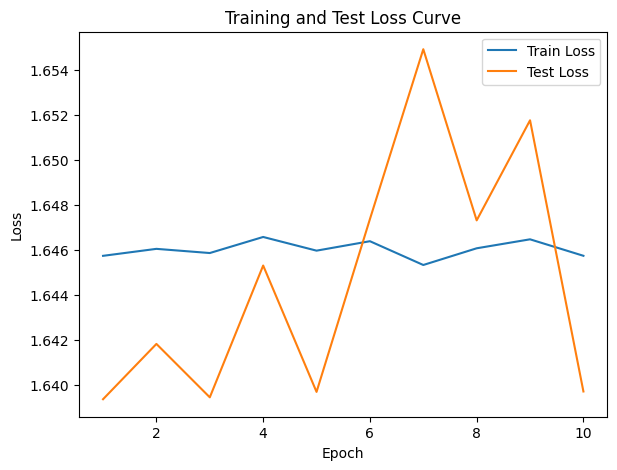

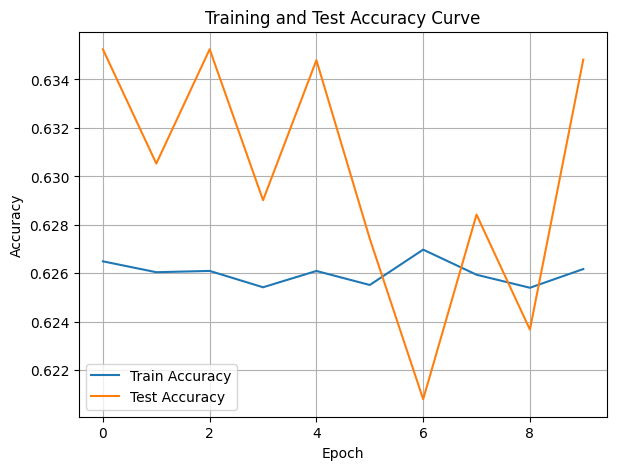

./saved_models/model_22.pth
Training Model with id 20


Training Process:  10%|█         | 1/10 [00:36<05:25, 36.17s/it]

Epoch [1/10], Train F1:0.5915696103114462, Train Loss: 1.6460, Train Acc: 0.6259, Test F1:0.5836086368150497, Test Loss: 1.6500, Test Acc: 0.6257


Training Process:  20%|██        | 2/10 [01:14<05:00, 37.55s/it]

Epoch [2/10], Train F1:0.5917126655655489, Train Loss: 1.6460, Train Acc: 0.6261, Test F1:0.5894808771899169, Test Loss: 1.6454, Test Acc: 0.6296


Training Process:  30%|███       | 3/10 [01:54<04:31, 38.80s/it]

Epoch [3/10], Train F1:0.5919108595172186, Train Loss: 1.6457, Train Acc: 0.6263, Test F1:0.5885553201113424, Test Loss: 1.6459, Test Acc: 0.6292


Training Process:  40%|████      | 4/10 [02:36<03:59, 39.90s/it]

Epoch [4/10], Train F1:0.5919810160450137, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.5876262062201317, Test Loss: 1.6460, Test Acc: 0.6286


Training Process:  50%|█████     | 5/10 [03:19<03:25, 41.08s/it]

Epoch [5/10], Train F1:0.59196953398636, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.5870056396299074, Test Loss: 1.6464, Test Acc: 0.6283


Training Process:  60%|██████    | 6/10 [04:03<02:47, 41.97s/it]

Epoch [6/10], Train F1:0.5919809293752262, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.5856789642473302, Test Loss: 1.6473, Test Acc: 0.6274


Training Process:  70%|███████   | 7/10 [04:49<02:10, 43.45s/it]

Epoch [7/10], Train F1:0.5920025335090972, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.5850725666493539, Test Loss: 1.6475, Test Acc: 0.6270


Training Process:  80%|████████  | 8/10 [05:38<01:29, 44.96s/it]

Epoch [8/10], Train F1:0.5919995782631504, Train Loss: 1.6456, Train Acc: 0.6264, Test F1:0.5856777731005067, Test Loss: 1.6471, Test Acc: 0.6275


Training Process:  90%|█████████ | 9/10 [06:27<00:46, 46.44s/it]

Epoch [9/10], Train F1:0.5920148714324445, Train Loss: 1.6456, Train Acc: 0.6265, Test F1:0.5873623043701262, Test Loss: 1.6460, Test Acc: 0.6285


Training Process: 100%|██████████| 10/10 [07:19<00:00, 43.92s/it]


Epoch [10/10], Train F1:0.592047913558034, Train Loss: 1.6455, Train Acc: 0.6265, Test F1:0.5878716881862037, Test Loss: 1.6459, Test Acc: 0.6289
Total Epochs: 10
Train loss start: 1.6433603763580322, Train loss end: 1.658945083618164
Highest Mean Train Accuracy (over epoch): 0.6264738658267933
Test loss start: 1.5987821817398071, Test loss end: 1.5855132341384888
Highest mean Test Accuracy (over epoch): 0.6296411980714066


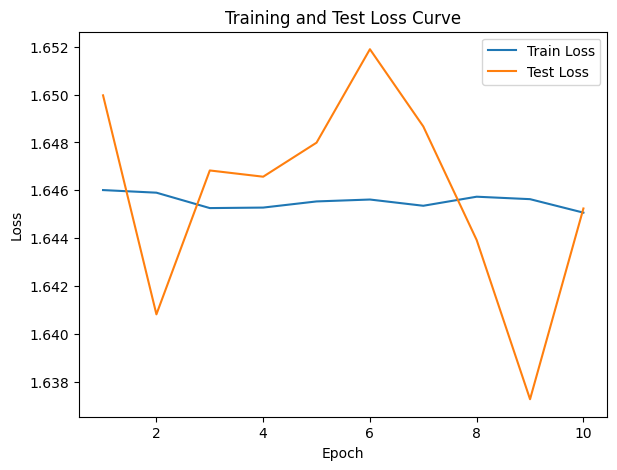

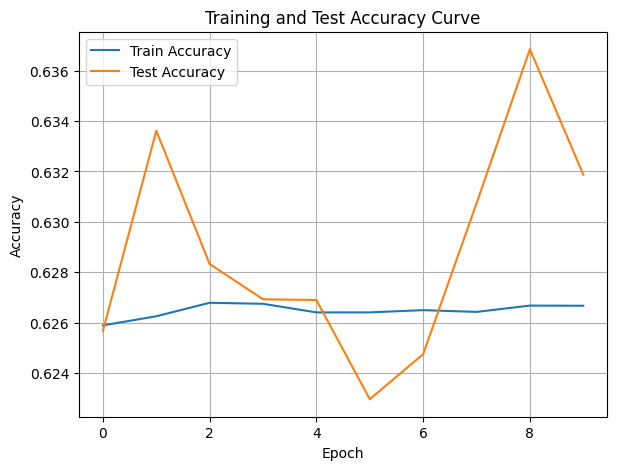

./saved_models/model_20.pth
Training Model with id 18


Training Process:  10%|█         | 1/10 [00:36<05:29, 36.59s/it]

Epoch [1/10], Train F1:0.5920260335377798, Train Loss: 1.6458, Train Acc: 0.6265, Test F1:0.5890553238234166, Test Loss: 1.6447, Test Acc: 0.6300


Training Process:  20%|██        | 2/10 [01:15<05:01, 37.67s/it]

Epoch [2/10], Train F1:0.5923278897110684, Train Loss: 1.6454, Train Acc: 0.6268, Test F1:0.5871649971987913, Test Loss: 1.6463, Test Acc: 0.6286


Training Process:  30%|███       | 3/10 [01:54<04:30, 38.70s/it]

Epoch [3/10], Train F1:0.5924483346089937, Train Loss: 1.6453, Train Acc: 0.6269, Test F1:0.5868401118774693, Test Loss: 1.6464, Test Acc: 0.6284


Training Process:  40%|████      | 4/10 [02:35<03:56, 39.43s/it]

Epoch [4/10], Train F1:0.5923018062716623, Train Loss: 1.6454, Train Acc: 0.6267, Test F1:0.5855432841410625, Test Loss: 1.6478, Test Acc: 0.6275


Training Process:  50%|█████     | 5/10 [03:18<03:23, 40.71s/it]

Epoch [5/10], Train F1:0.592225743687419, Train Loss: 1.6455, Train Acc: 0.6266, Test F1:0.5828259703450557, Test Loss: 1.6490, Test Acc: 0.6255


Training Process:  60%|██████    | 6/10 [04:03<02:48, 42.10s/it]

Epoch [6/10], Train F1:0.5922000407477941, Train Loss: 1.6455, Train Acc: 0.6266, Test F1:0.581666561232323, Test Loss: 1.6499, Test Acc: 0.6247


Training Process:  70%|███████   | 7/10 [04:50<02:10, 43.62s/it]

Epoch [7/10], Train F1:0.5923138670046657, Train Loss: 1.6454, Train Acc: 0.6267, Test F1:0.5834884328043434, Test Loss: 1.6489, Test Acc: 0.6259


Training Process:  80%|████████  | 8/10 [05:37<01:29, 44.71s/it]

Epoch [8/10], Train F1:0.5922569073380914, Train Loss: 1.6454, Train Acc: 0.6267, Test F1:0.5835244934859433, Test Loss: 1.6491, Test Acc: 0.6259


Training Process:  90%|█████████ | 9/10 [06:25<00:45, 45.88s/it]

Epoch [9/10], Train F1:0.5921910036251828, Train Loss: 1.6454, Train Acc: 0.6266, Test F1:0.5840210409278008, Test Loss: 1.6486, Test Acc: 0.6262


Training Process: 100%|██████████| 10/10 [07:16<00:00, 43.69s/it]


Epoch [10/10], Train F1:0.592113258377114, Train Loss: 1.6455, Train Acc: 0.6265, Test F1:0.5847689911381531, Test Loss: 1.6485, Test Acc: 0.6267
Total Epochs: 10
Train loss start: 1.5913403034210205, Train loss end: 1.5297605991363525
Highest Mean Train Accuracy (over epoch): 0.6268950460570281
Test loss start: 1.5878398418426514, Test loss end: 1.5843101739883423
Highest mean Test Accuracy (over epoch): 0.6300175763241471


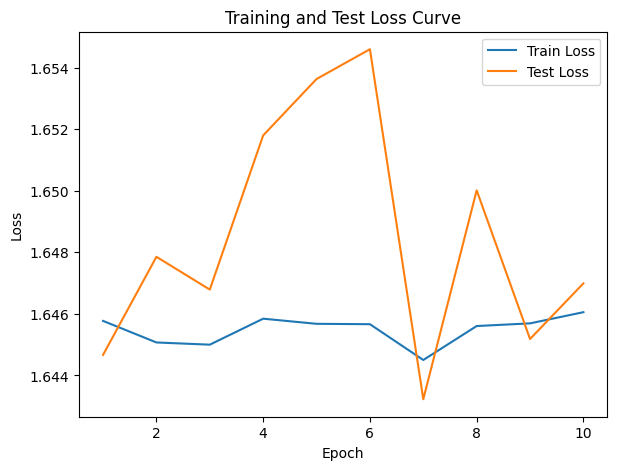

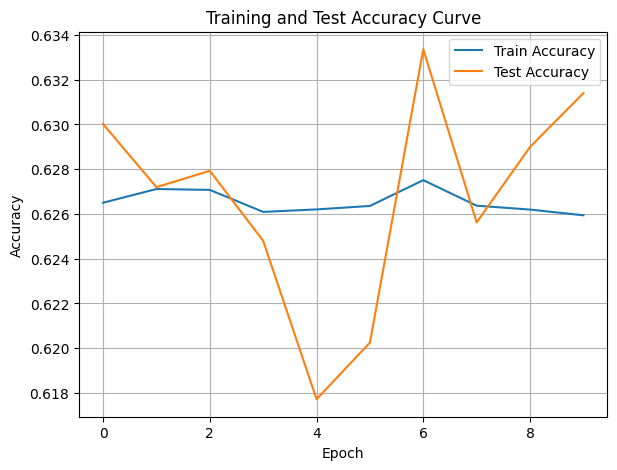

./saved_models/model_18.pth


MLP(
  (layers): ModuleList(
    (0): Linear(in_features=54, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
  )
  (batch_norms): ModuleList(
    (0): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (1): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (output): Linear(in_features=50, out_features=8, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [29]:
coverDTEmlp16b.train_DTE()

In [30]:
coverDTEmlp16b.train_single_model()

Training Process:   0%|          | 1/310 [00:36<3:10:22, 36.97s/it]

Epoch [1/310], Train F1:0.3731438228708657, Train Loss: 1.9647, Train Acc: 0.3700, Test F1:0.35885625761980694, Test Loss: 1.8389, Test Acc: 0.4966


Training Process:   1%|          | 2/310 [01:15<3:14:27, 37.88s/it]

Epoch [2/310], Train F1:0.41064595566919343, Train Loss: 1.8764, Train Acc: 0.4424, Test F1:0.3845114001401829, Test Loss: 1.7930, Test Acc: 0.5090


Training Process:   1%|          | 3/310 [01:55<3:18:53, 38.87s/it]

Epoch [3/310], Train F1:0.42879001899733543, Train Loss: 1.8325, Train Acc: 0.4724, Test F1:0.41650632191962217, Test Loss: 1.7688, Test Acc: 0.5253


Training Process:   1%|▏         | 4/310 [02:36<3:23:27, 39.89s/it]

Epoch [4/310], Train F1:0.44468600796742963, Train Loss: 1.8054, Train Acc: 0.4917, Test F1:0.4458305485406883, Test Loss: 1.7505, Test Acc: 0.5396


Training Process:   2%|▏         | 5/310 [03:19<3:27:31, 40.82s/it]

Epoch [5/310], Train F1:0.458591079161806, Train Loss: 1.7867, Train Acc: 0.5055, Test F1:0.4596929174718232, Test Loss: 1.7391, Test Acc: 0.5477


Training Process:   2%|▏         | 6/310 [04:04<3:33:19, 42.10s/it]

Epoch [6/310], Train F1:0.47120408697553284, Train Loss: 1.7724, Train Acc: 0.5166, Test F1:0.468510810779554, Test Loss: 1.7309, Test Acc: 0.5531


Training Process:   2%|▏         | 7/310 [04:50<3:39:18, 43.43s/it]

Epoch [7/310], Train F1:0.482111866475453, Train Loss: 1.7610, Train Acc: 0.5257, Test F1:0.47575925290525745, Test Loss: 1.7241, Test Acc: 0.5573


Training Process:   3%|▎         | 8/310 [05:36<3:43:43, 44.45s/it]

Epoch [8/310], Train F1:0.49106192306301333, Train Loss: 1.7519, Train Acc: 0.5332, Test F1:0.48590584533199355, Test Loss: 1.7173, Test Acc: 0.5626


Training Process:   3%|▎         | 9/310 [06:26<3:51:37, 46.17s/it]

Epoch [9/310], Train F1:0.4986408799406641, Train Loss: 1.7442, Train Acc: 0.5395, Test F1:0.49574440979141826, Test Loss: 1.7109, Test Acc: 0.5679


Training Process:   3%|▎         | 10/310 [07:18<3:59:53, 47.98s/it]

Epoch [10/310], Train F1:0.5050878768593546, Train Loss: 1.7376, Train Acc: 0.5450, Test F1:0.5015817635865618, Test Loss: 1.7064, Test Acc: 0.5712


Training Process:   4%|▎         | 11/310 [08:11<4:06:46, 49.52s/it]

Epoch [11/310], Train F1:0.5106749312691525, Train Loss: 1.7319, Train Acc: 0.5498, Test F1:0.5103586825997437, Test Loss: 1.7009, Test Acc: 0.5761


Training Process:   4%|▍         | 12/310 [09:06<4:13:15, 50.99s/it]

Epoch [12/310], Train F1:0.5154435218787582, Train Loss: 1.7270, Train Acc: 0.5539, Test F1:0.5167712998639686, Test Loss: 1.6966, Test Acc: 0.5799


Training Process:   4%|▍         | 13/310 [10:02<4:20:11, 52.56s/it]

Epoch [13/310], Train F1:0.5196211279997223, Train Loss: 1.7227, Train Acc: 0.5576, Test F1:0.5228914987615932, Test Loss: 1.6926, Test Acc: 0.5836


Training Process:   5%|▍         | 14/310 [10:59<4:26:34, 54.04s/it]

Epoch [14/310], Train F1:0.5233116529520068, Train Loss: 1.7189, Train Acc: 0.5609, Test F1:0.5279262690241042, Test Loss: 1.6892, Test Acc: 0.5867


Training Process:   5%|▍         | 15/310 [11:58<4:32:12, 55.36s/it]

Epoch [15/310], Train F1:0.5266041241004416, Train Loss: 1.7155, Train Acc: 0.5638, Test F1:0.5317223135387221, Test Loss: 1.6864, Test Acc: 0.5892


Training Process:   5%|▌         | 16/310 [12:58<4:38:41, 56.88s/it]

Epoch [16/310], Train F1:0.5295034540118748, Train Loss: 1.7124, Train Acc: 0.5664, Test F1:0.5354843220400587, Test Loss: 1.6838, Test Acc: 0.5916


Training Process:   5%|▌         | 17/310 [13:59<4:44:07, 58.18s/it]

Epoch [17/310], Train F1:0.5321768267453472, Train Loss: 1.7096, Train Acc: 0.5689, Test F1:0.5383620886463933, Test Loss: 1.6817, Test Acc: 0.5935


Training Process:   6%|▌         | 18/310 [15:03<4:50:49, 59.76s/it]

Epoch [18/310], Train F1:0.5345834025471878, Train Loss: 1.7070, Train Acc: 0.5711, Test F1:0.5402015662762327, Test Loss: 1.6799, Test Acc: 0.5949


Training Process:   6%|▌         | 19/310 [16:08<4:57:04, 61.25s/it]

Epoch [19/310], Train F1:0.5367905878553427, Train Loss: 1.7047, Train Acc: 0.5731, Test F1:0.5431341437651322, Test Loss: 1.6779, Test Acc: 0.5968


Training Process:   6%|▋         | 20/310 [17:14<5:03:55, 62.88s/it]

Epoch [20/310], Train F1:0.5388032111429246, Train Loss: 1.7026, Train Acc: 0.5749, Test F1:0.546619697662919, Test Loss: 1.6757, Test Acc: 0.5991


Training Process:   7%|▋         | 21/310 [18:22<5:10:08, 64.39s/it]

Epoch [21/310], Train F1:0.5406551087952157, Train Loss: 1.7006, Train Acc: 0.5767, Test F1:0.5488649921768156, Test Loss: 1.6741, Test Acc: 0.6006


Training Process:   7%|▋         | 22/310 [19:32<5:17:30, 66.15s/it]

Epoch [22/310], Train F1:0.5423871288202938, Train Loss: 1.6987, Train Acc: 0.5783, Test F1:0.5509276156921273, Test Loss: 1.6726, Test Acc: 0.6020


Training Process:   7%|▋         | 23/310 [20:44<5:23:54, 67.71s/it]

Epoch [23/310], Train F1:0.5439824832247646, Train Loss: 1.6970, Train Acc: 0.5798, Test F1:0.5527802007300334, Test Loss: 1.6712, Test Acc: 0.6033


Training Process:   8%|▊         | 24/310 [21:57<5:30:11, 69.27s/it]

Epoch [24/310], Train F1:0.5454480274879961, Train Loss: 1.6955, Train Acc: 0.5811, Test F1:0.5543999088915559, Test Loss: 1.6700, Test Acc: 0.6044


Training Process:   8%|▊         | 25/310 [23:13<5:39:07, 71.40s/it]

Epoch [25/310], Train F1:0.5468377992870583, Train Loss: 1.6940, Train Acc: 0.5825, Test F1:0.5562697193179444, Test Loss: 1.6687, Test Acc: 0.6057


Training Process:   8%|▊         | 26/310 [24:30<5:45:47, 73.05s/it]

Epoch [26/310], Train F1:0.5480848247587335, Train Loss: 1.6926, Train Acc: 0.5837, Test F1:0.557863195540151, Test Loss: 1.6675, Test Acc: 0.6069


Training Process:   9%|▊         | 27/310 [25:48<5:51:35, 74.54s/it]

Epoch [27/310], Train F1:0.549270326528279, Train Loss: 1.6913, Train Acc: 0.5848, Test F1:0.5588144310021317, Test Loss: 1.6667, Test Acc: 0.6076


Training Process:   9%|▉         | 28/310 [27:07<5:57:24, 76.04s/it]

Epoch [28/310], Train F1:0.5504184417637793, Train Loss: 1.6901, Train Acc: 0.5859, Test F1:0.5604894588108933, Test Loss: 1.6655, Test Acc: 0.6088


Training Process:   9%|▉         | 29/310 [28:28<6:02:31, 77.41s/it]

Epoch [29/310], Train F1:0.5514788704444717, Train Loss: 1.6889, Train Acc: 0.5869, Test F1:0.5615894339820419, Test Loss: 1.6646, Test Acc: 0.6096


Training Process:  10%|▉         | 30/310 [29:50<6:07:19, 78.71s/it]

Epoch [30/310], Train F1:0.5524802550664095, Train Loss: 1.6879, Train Acc: 0.5879, Test F1:0.5632047156533805, Test Loss: 1.6635, Test Acc: 0.6107


Training Process:  10%|█         | 31/310 [31:14<6:13:27, 80.31s/it]

Epoch [31/310], Train F1:0.5534209324041481, Train Loss: 1.6868, Train Acc: 0.5888, Test F1:0.5644676487803337, Test Loss: 1.6626, Test Acc: 0.6116


Training Process:  10%|█         | 32/310 [32:40<6:20:50, 82.19s/it]

Epoch [32/310], Train F1:0.5543126810335385, Train Loss: 1.6859, Train Acc: 0.5896, Test F1:0.5657950226459902, Test Loss: 1.6617, Test Acc: 0.6126


Training Process:  11%|█         | 33/310 [34:08<6:27:21, 83.90s/it]

Epoch [33/310], Train F1:0.5551797090549924, Train Loss: 1.6849, Train Acc: 0.5904, Test F1:0.5661828031220582, Test Loss: 1.6613, Test Acc: 0.6129


Training Process:  11%|█         | 34/310 [35:37<6:32:38, 85.36s/it]

Epoch [34/310], Train F1:0.5560100389972209, Train Loss: 1.6840, Train Acc: 0.5912, Test F1:0.5670781457775883, Test Loss: 1.6606, Test Acc: 0.6135


Training Process:  11%|█▏        | 35/310 [37:08<6:38:37, 86.97s/it]

Epoch [35/310], Train F1:0.55679697449671, Train Loss: 1.6832, Train Acc: 0.5920, Test F1:0.5675142434865316, Test Loss: 1.6602, Test Acc: 0.6139


Training Process:  12%|█▏        | 36/310 [38:40<6:43:46, 88.42s/it]

Epoch [36/310], Train F1:0.5575255656467136, Train Loss: 1.6824, Train Acc: 0.5927, Test F1:0.5679973665546381, Test Loss: 1.6597, Test Acc: 0.6143


Training Process:  12%|█▏        | 37/310 [40:14<6:49:50, 90.08s/it]

Epoch [37/310], Train F1:0.5582360453388344, Train Loss: 1.6816, Train Acc: 0.5934, Test F1:0.5689690693679462, Test Loss: 1.6590, Test Acc: 0.6150


Training Process:  12%|█▏        | 38/310 [41:48<6:54:48, 91.50s/it]

Epoch [38/310], Train F1:0.5588927996471221, Train Loss: 1.6809, Train Acc: 0.5940, Test F1:0.5695657894217265, Test Loss: 1.6585, Test Acc: 0.6155


Training Process:  13%|█▎        | 39/310 [43:25<7:00:12, 93.03s/it]

Epoch [39/310], Train F1:0.5595330491935567, Train Loss: 1.6802, Train Acc: 0.5947, Test F1:0.569752924763613, Test Loss: 1.6581, Test Acc: 0.6157


Training Process:  13%|█▎        | 40/310 [45:03<7:05:35, 94.57s/it]

Epoch [40/310], Train F1:0.5601355787393303, Train Loss: 1.6796, Train Acc: 0.5952, Test F1:0.5707289205768604, Test Loss: 1.6574, Test Acc: 0.6164


Training Process:  13%|█▎        | 41/310 [46:43<7:11:13, 96.18s/it]

Epoch [41/310], Train F1:0.5607483506465667, Train Loss: 1.6789, Train Acc: 0.5958, Test F1:0.5714528610304749, Test Loss: 1.6569, Test Acc: 0.6169


Training Process:  14%|█▎        | 42/310 [48:24<7:16:27, 97.71s/it]

Epoch [42/310], Train F1:0.5613261758049358, Train Loss: 1.6783, Train Acc: 0.5964, Test F1:0.5722932878813944, Test Loss: 1.6563, Test Acc: 0.6176


Training Process:  14%|█▍        | 43/310 [50:08<7:23:05, 99.57s/it]

Epoch [43/310], Train F1:0.561852513237062, Train Loss: 1.6777, Train Acc: 0.5969, Test F1:0.572980620879025, Test Loss: 1.6557, Test Acc: 0.6181


Training Process:  14%|█▍        | 44/310 [51:54<7:29:43, 101.44s/it]

Epoch [44/310], Train F1:0.5623908399304528, Train Loss: 1.6771, Train Acc: 0.5974, Test F1:0.5733435279235528, Test Loss: 1.6554, Test Acc: 0.6183


Training Process:  15%|█▍        | 45/310 [53:42<7:36:00, 103.25s/it]

Epoch [45/310], Train F1:0.5628867652134519, Train Loss: 1.6766, Train Acc: 0.5979, Test F1:0.5740516943556718, Test Loss: 1.6549, Test Acc: 0.6189


Training Process:  15%|█▍        | 46/310 [55:29<7:40:22, 104.63s/it]

Epoch [46/310], Train F1:0.5633805882489045, Train Loss: 1.6761, Train Acc: 0.5984, Test F1:0.5747581217040443, Test Loss: 1.6543, Test Acc: 0.6194


Training Process:  15%|█▌        | 47/310 [57:19<7:44:34, 105.99s/it]

Epoch [47/310], Train F1:0.5638335112655548, Train Loss: 1.6756, Train Acc: 0.5988, Test F1:0.5754621041703604, Test Loss: 1.6538, Test Acc: 0.6200


Training Process:  15%|█▌        | 48/310 [59:09<7:48:26, 107.28s/it]

Epoch [48/310], Train F1:0.5642916322864191, Train Loss: 1.6751, Train Acc: 0.5993, Test F1:0.575366202769818, Test Loss: 1.6538, Test Acc: 0.6199


Training Process:  16%|█▌        | 49/310 [1:01:01<7:52:42, 108.67s/it]

Epoch [49/310], Train F1:0.5647178536791677, Train Loss: 1.6746, Train Acc: 0.5997, Test F1:0.5758898342773022, Test Loss: 1.6533, Test Acc: 0.6203


Training Process:  16%|█▌        | 50/310 [1:02:56<7:59:51, 110.74s/it]

Epoch [50/310], Train F1:0.5651457595546316, Train Loss: 1.6742, Train Acc: 0.6001, Test F1:0.5762352698006127, Test Loss: 1.6530, Test Acc: 0.6206


Training Process:  16%|█▋        | 51/310 [1:04:53<8:05:27, 112.46s/it]

Epoch [51/310], Train F1:0.5655449971829186, Train Loss: 1.6737, Train Acc: 0.6005, Test F1:0.5768646257490387, Test Loss: 1.6526, Test Acc: 0.6211


Training Process:  17%|█▋        | 52/310 [1:06:51<8:10:22, 114.04s/it]

Epoch [52/310], Train F1:0.5659343267034829, Train Loss: 1.6733, Train Acc: 0.6009, Test F1:0.5774019522776205, Test Loss: 1.6522, Test Acc: 0.6215


Training Process:  17%|█▋        | 53/310 [1:08:51<8:16:19, 115.87s/it]

Epoch [53/310], Train F1:0.5663280695166606, Train Loss: 1.6729, Train Acc: 0.6013, Test F1:0.5775329507522422, Test Loss: 1.6520, Test Acc: 0.6216


Training Process:  17%|█▋        | 54/310 [1:10:51<8:20:07, 117.22s/it]

Epoch [54/310], Train F1:0.5667065176304819, Train Loss: 1.6725, Train Acc: 0.6017, Test F1:0.5778118758613036, Test Loss: 1.6518, Test Acc: 0.6218


Training Process:  18%|█▊        | 55/310 [1:12:53<8:24:09, 118.62s/it]

Epoch [55/310], Train F1:0.5670516396263443, Train Loss: 1.6721, Train Acc: 0.6020, Test F1:0.5779377990452603, Test Loss: 1.6516, Test Acc: 0.6219


Training Process:  18%|█▊        | 56/310 [1:14:57<8:29:24, 120.33s/it]

Epoch [56/310], Train F1:0.5673998167996106, Train Loss: 1.6717, Train Acc: 0.6023, Test F1:0.5782821371354373, Test Loss: 1.6514, Test Acc: 0.6222


Training Process:  18%|█▊        | 57/310 [1:17:03<8:33:36, 121.81s/it]

Epoch [57/310], Train F1:0.5677429273859522, Train Loss: 1.6713, Train Acc: 0.6027, Test F1:0.578530167898624, Test Loss: 1.6512, Test Acc: 0.6224


Training Process:  19%|█▊        | 58/310 [1:19:09<8:37:31, 123.22s/it]

Epoch [58/310], Train F1:0.568078409931096, Train Loss: 1.6710, Train Acc: 0.6030, Test F1:0.5788825270969814, Test Loss: 1.6509, Test Acc: 0.6226


Training Process:  19%|█▉        | 59/310 [1:21:19<8:43:40, 125.18s/it]

Epoch [59/310], Train F1:0.5684230345487005, Train Loss: 1.6706, Train Acc: 0.6033, Test F1:0.5793695613687873, Test Loss: 1.6505, Test Acc: 0.6230


Training Process:  19%|█▉        | 60/310 [1:23:31<8:50:17, 127.27s/it]

Epoch [60/310], Train F1:0.5687316825307955, Train Loss: 1.6703, Train Acc: 0.6036, Test F1:0.5796752745802901, Test Loss: 1.6502, Test Acc: 0.6233


Training Process:  20%|█▉        | 61/310 [1:25:44<8:54:50, 128.88s/it]

Epoch [61/310], Train F1:0.5690269448746149, Train Loss: 1.6700, Train Acc: 0.6039, Test F1:0.5796270281673354, Test Loss: 1.6502, Test Acc: 0.6233


Training Process:  20%|██        | 62/310 [1:27:58<8:58:59, 130.40s/it]

Epoch [62/310], Train F1:0.5693310488550326, Train Loss: 1.6696, Train Acc: 0.6042, Test F1:0.5797241685544169, Test Loss: 1.6501, Test Acc: 0.6233


Training Process:  20%|██        | 63/310 [1:30:12<9:02:26, 131.77s/it]

Epoch [63/310], Train F1:0.5696144040775852, Train Loss: 1.6693, Train Acc: 0.6045, Test F1:0.5798317141688523, Test Loss: 1.6499, Test Acc: 0.6234


Training Process:  21%|██        | 64/310 [1:32:29<9:06:15, 133.23s/it]

Epoch [64/310], Train F1:0.5698923071368398, Train Loss: 1.6690, Train Acc: 0.6048, Test F1:0.5799896258776084, Test Loss: 1.6498, Test Acc: 0.6235


Training Process:  21%|██        | 65/310 [1:34:48<9:10:19, 134.77s/it]

Epoch [65/310], Train F1:0.5701718142030249, Train Loss: 1.6687, Train Acc: 0.6051, Test F1:0.580071635983782, Test Loss: 1.6497, Test Acc: 0.6236


Training Process:  21%|██▏       | 66/310 [1:37:08<9:14:54, 136.45s/it]

Epoch [66/310], Train F1:0.5704531137562219, Train Loss: 1.6684, Train Acc: 0.6053, Test F1:0.5804251315903901, Test Loss: 1.6494, Test Acc: 0.6239


Training Process:  22%|██▏       | 67/310 [1:39:30<9:19:44, 138.21s/it]

Epoch [67/310], Train F1:0.5707207541353594, Train Loss: 1.6681, Train Acc: 0.6056, Test F1:0.5807396910787131, Test Loss: 1.6492, Test Acc: 0.6241


Training Process:  22%|██▏       | 68/310 [1:41:53<9:23:36, 139.74s/it]

Epoch [68/310], Train F1:0.5709805695383456, Train Loss: 1.6679, Train Acc: 0.6059, Test F1:0.5808643534008606, Test Loss: 1.6490, Test Acc: 0.6242


Training Process:  22%|██▏       | 69/310 [1:44:20<9:29:18, 141.74s/it]

Epoch [69/310], Train F1:0.5712346021373733, Train Loss: 1.6676, Train Acc: 0.6061, Test F1:0.5809979460534197, Test Loss: 1.6489, Test Acc: 0.6243


Training Process:  23%|██▎       | 70/310 [1:46:45<9:31:34, 142.89s/it]

Epoch [70/310], Train F1:0.571473678367177, Train Loss: 1.6673, Train Acc: 0.6063, Test F1:0.581252131997742, Test Loss: 1.6487, Test Acc: 0.6245


Training Process:  23%|██▎       | 71/310 [1:49:15<9:36:36, 144.76s/it]

Epoch [71/310], Train F1:0.5717007233398745, Train Loss: 1.6671, Train Acc: 0.6066, Test F1:0.5814862175176728, Test Loss: 1.6485, Test Acc: 0.6247


Training Process:  23%|██▎       | 72/310 [1:51:45<9:40:25, 146.32s/it]

Epoch [72/310], Train F1:0.5719398721153987, Train Loss: 1.6668, Train Acc: 0.6068, Test F1:0.5818826381660227, Test Loss: 1.6482, Test Acc: 0.6250


Training Process:  24%|██▎       | 73/310 [1:54:17<9:44:39, 148.02s/it]

Epoch [73/310], Train F1:0.5721751022453399, Train Loss: 1.6666, Train Acc: 0.6070, Test F1:0.5820405014531776, Test Loss: 1.6481, Test Acc: 0.6252


Training Process:  24%|██▍       | 74/310 [1:56:50<9:48:05, 149.52s/it]

Epoch [74/310], Train F1:0.5723904236094595, Train Loss: 1.6664, Train Acc: 0.6072, Test F1:0.5823577508210399, Test Loss: 1.6479, Test Acc: 0.6254


Training Process:  24%|██▍       | 75/310 [1:59:25<9:52:04, 151.17s/it]

Epoch [75/310], Train F1:0.5725879489082139, Train Loss: 1.6661, Train Acc: 0.6074, Test F1:0.5827566313747169, Test Loss: 1.6476, Test Acc: 0.6257


Training Process:  25%|██▍       | 76/310 [2:02:00<9:54:18, 152.39s/it]

Epoch [76/310], Train F1:0.5728019803529425, Train Loss: 1.6659, Train Acc: 0.6077, Test F1:0.5830239854991088, Test Loss: 1.6474, Test Acc: 0.6259


Training Process:  25%|██▍       | 77/310 [2:04:38<9:58:40, 154.16s/it]

Epoch [77/310], Train F1:0.5730181652844765, Train Loss: 1.6657, Train Acc: 0.6079, Test F1:0.5832599627726885, Test Loss: 1.6472, Test Acc: 0.6261


Training Process:  25%|██▌       | 78/310 [2:07:18<10:03:10, 155.99s/it]

Epoch [78/310], Train F1:0.5732351419239018, Train Loss: 1.6654, Train Acc: 0.6081, Test F1:0.5832993028506583, Test Loss: 1.6471, Test Acc: 0.6261


Training Process:  25%|██▌       | 79/310 [2:10:00<10:06:37, 157.56s/it]

Epoch [79/310], Train F1:0.5734378328468852, Train Loss: 1.6652, Train Acc: 0.6083, Test F1:0.5833823076683882, Test Loss: 1.6470, Test Acc: 0.6262


Training Process:  26%|██▌       | 80/310 [2:12:46<10:13:48, 160.13s/it]

Epoch [80/310], Train F1:0.5736325375998751, Train Loss: 1.6650, Train Acc: 0.6085, Test F1:0.5834857183568161, Test Loss: 1.6469, Test Acc: 0.6263


Training Process:  26%|██▌       | 81/310 [2:15:31<10:16:45, 161.59s/it]

Epoch [81/310], Train F1:0.5738201979733139, Train Loss: 1.6648, Train Acc: 0.6087, Test F1:0.5834308992529634, Test Loss: 1.6469, Test Acc: 0.6262


Training Process:  26%|██▋       | 82/310 [2:18:19<10:22:01, 163.69s/it]

Epoch [82/310], Train F1:0.5740122021716775, Train Loss: 1.6646, Train Acc: 0.6088, Test F1:0.5833922886928882, Test Loss: 1.6469, Test Acc: 0.6262


Training Process:  27%|██▋       | 83/310 [2:21:09<10:25:50, 165.42s/it]

Epoch [83/310], Train F1:0.5742068154005638, Train Loss: 1.6644, Train Acc: 0.6090, Test F1:0.5834781068320137, Test Loss: 1.6468, Test Acc: 0.6263


Training Process:  27%|██▋       | 84/310 [2:24:01<10:30:34, 167.41s/it]

Epoch [84/310], Train F1:0.5743895923744149, Train Loss: 1.6642, Train Acc: 0.6092, Test F1:0.5837470637645339, Test Loss: 1.6466, Test Acc: 0.6265


Training Process:  27%|██▋       | 85/310 [2:26:53<10:32:40, 168.72s/it]

Epoch [85/310], Train F1:0.574567888129352, Train Loss: 1.6640, Train Acc: 0.6094, Test F1:0.58374015995533, Test Loss: 1.6466, Test Acc: 0.6265


Training Process:  28%|██▊       | 86/310 [2:29:47<10:35:54, 170.33s/it]

Epoch [86/310], Train F1:0.5747448666727208, Train Loss: 1.6638, Train Acc: 0.6096, Test F1:0.5838910016136686, Test Loss: 1.6464, Test Acc: 0.6266


Training Process:  28%|██▊       | 87/310 [2:32:42<10:39:08, 171.97s/it]

Epoch [87/310], Train F1:0.5749173893584537, Train Loss: 1.6637, Train Acc: 0.6097, Test F1:0.5838643996992197, Test Loss: 1.6464, Test Acc: 0.6266


Training Process:  28%|██▊       | 88/310 [2:35:39<10:41:40, 173.43s/it]

Epoch [88/310], Train F1:0.5750882818178433, Train Loss: 1.6635, Train Acc: 0.6099, Test F1:0.5839541551428064, Test Loss: 1.6463, Test Acc: 0.6267


Training Process:  29%|██▊       | 89/310 [2:38:39<10:46:03, 175.40s/it]

Epoch [89/310], Train F1:0.5752538229948719, Train Loss: 1.6633, Train Acc: 0.6101, Test F1:0.5840198615482225, Test Loss: 1.6462, Test Acc: 0.6267


Training Process:  29%|██▉       | 90/310 [2:41:40<10:48:31, 176.87s/it]

Epoch [90/310], Train F1:0.575422333588584, Train Loss: 1.6631, Train Acc: 0.6102, Test F1:0.5840324505753868, Test Loss: 1.6462, Test Acc: 0.6267


Training Process:  29%|██▉       | 91/310 [2:44:42<10:51:24, 178.47s/it]

Epoch [91/310], Train F1:0.5755914755467222, Train Loss: 1.6629, Train Acc: 0.6104, Test F1:0.5839821455476707, Test Loss: 1.6461, Test Acc: 0.6267


Training Process:  30%|██▉       | 92/310 [2:47:46<10:55:09, 180.32s/it]

Epoch [92/310], Train F1:0.5757561753254413, Train Loss: 1.6628, Train Acc: 0.6105, Test F1:0.5841143041501453, Test Loss: 1.6460, Test Acc: 0.6268


Training Process:  30%|███       | 93/310 [2:50:52<10:57:50, 181.89s/it]

Epoch [93/310], Train F1:0.575907258900474, Train Loss: 1.6626, Train Acc: 0.6107, Test F1:0.5841417215274448, Test Loss: 1.6460, Test Acc: 0.6268


Training Process:  30%|███       | 94/310 [2:54:01<11:02:42, 184.09s/it]

Epoch [94/310], Train F1:0.5760650381070531, Train Loss: 1.6624, Train Acc: 0.6109, Test F1:0.5841019501176384, Test Loss: 1.6460, Test Acc: 0.6268


Training Process:  31%|███       | 95/310 [2:57:11<11:06:07, 185.90s/it]

Epoch [95/310], Train F1:0.5762170773346055, Train Loss: 1.6623, Train Acc: 0.6110, Test F1:0.5842213219528056, Test Loss: 1.6459, Test Acc: 0.6269


Training Process:  31%|███       | 96/310 [3:00:28<11:14:59, 189.25s/it]

Epoch [96/310], Train F1:0.5763678597981413, Train Loss: 1.6621, Train Acc: 0.6111, Test F1:0.5842789827175101, Test Loss: 1.6459, Test Acc: 0.6269


Training Process:  31%|███▏      | 97/310 [3:03:51<11:25:43, 193.16s/it]

Epoch [97/310], Train F1:0.5765116546116869, Train Loss: 1.6620, Train Acc: 0.6113, Test F1:0.5843495092327018, Test Loss: 1.6458, Test Acc: 0.6270


Training Process:  32%|███▏      | 98/310 [3:07:17<11:36:19, 197.08s/it]

Epoch [98/310], Train F1:0.5766566435642545, Train Loss: 1.6618, Train Acc: 0.6114, Test F1:0.5845294989453546, Test Loss: 1.6457, Test Acc: 0.6271


Training Process:  32%|███▏      | 99/310 [3:10:44<11:44:02, 200.20s/it]

Epoch [99/310], Train F1:0.5767942552074228, Train Loss: 1.6617, Train Acc: 0.6116, Test F1:0.584572467749585, Test Loss: 1.6456, Test Acc: 0.6271


Training Process:  32%|███▏      | 100/310 [3:14:18<11:55:05, 204.31s/it]

Epoch [100/310], Train F1:0.5769336160025532, Train Loss: 1.6615, Train Acc: 0.6117, Test F1:0.5846945078445765, Test Loss: 1.6455, Test Acc: 0.6272


Training Process:  33%|███▎      | 101/310 [3:17:59<12:08:41, 209.19s/it]

Epoch [101/310], Train F1:0.5770670287311013, Train Loss: 1.6614, Train Acc: 0.6118, Test F1:0.5848369546149931, Test Loss: 1.6454, Test Acc: 0.6273


Training Process:  33%|███▎      | 102/310 [3:21:30<12:06:48, 209.66s/it]

Epoch [102/310], Train F1:0.577201068798241, Train Loss: 1.6612, Train Acc: 0.6120, Test F1:0.5850840452125985, Test Loss: 1.6453, Test Acc: 0.6275


Training Process:  33%|███▎      | 103/310 [3:25:09<12:12:54, 212.44s/it]

Epoch [103/310], Train F1:0.5773358683015335, Train Loss: 1.6611, Train Acc: 0.6121, Test F1:0.5850855024498915, Test Loss: 1.6452, Test Acc: 0.6275


Training Process:  34%|███▎      | 104/310 [3:28:49<12:17:36, 214.84s/it]

Epoch [104/310], Train F1:0.5774630796006991, Train Loss: 1.6610, Train Acc: 0.6122, Test F1:0.5851139193019756, Test Loss: 1.6452, Test Acc: 0.6276


Training Process:  34%|███▍      | 105/310 [3:32:40<12:30:14, 219.58s/it]

Epoch [105/310], Train F1:0.5775881864784017, Train Loss: 1.6608, Train Acc: 0.6123, Test F1:0.5850058869183823, Test Loss: 1.6452, Test Acc: 0.6275


Training Process:  34%|███▍      | 106/310 [3:36:24<12:31:28, 221.02s/it]

Epoch [106/310], Train F1:0.5777078184107343, Train Loss: 1.6607, Train Acc: 0.6124, Test F1:0.5850896799017195, Test Loss: 1.6451, Test Acc: 0.6276


Training Process:  35%|███▍      | 107/310 [3:40:23<12:46:27, 226.54s/it]

Epoch [107/310], Train F1:0.5778286456729401, Train Loss: 1.6606, Train Acc: 0.6126, Test F1:0.5850138335397436, Test Loss: 1.6451, Test Acc: 0.6275


Training Process:  35%|███▍      | 108/310 [3:44:15<12:47:28, 227.96s/it]

Epoch [108/310], Train F1:0.5779583472980907, Train Loss: 1.6604, Train Acc: 0.6127, Test F1:0.5850692795737702, Test Loss: 1.6450, Test Acc: 0.6275


Training Process:  35%|███▌      | 109/310 [3:48:22<13:02:44, 233.66s/it]

Epoch [109/310], Train F1:0.5780732755748287, Train Loss: 1.6603, Train Acc: 0.6128, Test F1:0.585029382986434, Test Loss: 1.6450, Test Acc: 0.6275


Training Process:  35%|███▌      | 110/310 [3:52:22<13:05:21, 235.61s/it]

Epoch [110/310], Train F1:0.5781800981672295, Train Loss: 1.6602, Train Acc: 0.6129, Test F1:0.5851843346623631, Test Loss: 1.6449, Test Acc: 0.6276


Training Process:  36%|███▌      | 111/310 [3:56:39<13:23:12, 242.17s/it]

Epoch [111/310], Train F1:0.5783031547283556, Train Loss: 1.6601, Train Acc: 0.6130, Test F1:0.5852252756400812, Test Loss: 1.6449, Test Acc: 0.6277


Training Process:  36%|███▌      | 112/310 [4:01:00<13:37:02, 247.59s/it]

Epoch [112/310], Train F1:0.5784173956599692, Train Loss: 1.6599, Train Acc: 0.6131, Test F1:0.5852744648083421, Test Loss: 1.6449, Test Acc: 0.6277


Training Process:  36%|███▋      | 113/310 [4:05:25<13:50:15, 252.87s/it]

Epoch [113/310], Train F1:0.57853046859796, Train Loss: 1.6598, Train Acc: 0.6133, Test F1:0.5853459475138755, Test Loss: 1.6448, Test Acc: 0.6277


Training Process:  37%|███▋      | 114/310 [4:09:48<13:56:37, 256.11s/it]

Epoch [114/310], Train F1:0.5786458913511497, Train Loss: 1.6597, Train Acc: 0.6134, Test F1:0.5853096302302198, Test Loss: 1.6448, Test Acc: 0.6277


Training Process:  37%|███▋      | 115/310 [4:14:20<14:07:08, 260.66s/it]

Epoch [115/310], Train F1:0.5787603324837182, Train Loss: 1.6596, Train Acc: 0.6135, Test F1:0.5853563761257965, Test Loss: 1.6448, Test Acc: 0.6277


Training Process:  37%|███▋      | 116/310 [4:18:51<14:13:04, 263.84s/it]

Epoch [116/310], Train F1:0.5788670436868051, Train Loss: 1.6595, Train Acc: 0.6136, Test F1:0.5854637868735376, Test Loss: 1.6447, Test Acc: 0.6278


Training Process:  38%|███▊      | 117/310 [4:23:16<14:10:05, 264.28s/it]

Epoch [117/310], Train F1:0.5789770760434526, Train Loss: 1.6594, Train Acc: 0.6137, Test F1:0.5855385992590316, Test Loss: 1.6447, Test Acc: 0.6279


Training Process:  38%|███▊      | 118/310 [4:27:57<14:21:13, 269.13s/it]

Epoch [118/310], Train F1:0.5790850851424194, Train Loss: 1.6592, Train Acc: 0.6138, Test F1:0.585561818772119, Test Loss: 1.6446, Test Acc: 0.6279


Training Process:  38%|███▊      | 119/310 [4:32:45<14:35:11, 274.93s/it]

Epoch [119/310], Train F1:0.5791902559649484, Train Loss: 1.6591, Train Acc: 0.6139, Test F1:0.5854479164769012, Test Loss: 1.6447, Test Acc: 0.6278


Training Process:  39%|███▊      | 120/310 [4:37:37<14:47:04, 280.13s/it]

Epoch [120/310], Train F1:0.5792861473095632, Train Loss: 1.6590, Train Acc: 0.6140, Test F1:0.5855215205858314, Test Loss: 1.6446, Test Acc: 0.6278


Training Process:  39%|███▉      | 121/310 [4:42:26<14:50:01, 282.55s/it]

Epoch [121/310], Train F1:0.5793892583938581, Train Loss: 1.6589, Train Acc: 0.6141, Test F1:0.5854853988298144, Test Loss: 1.6446, Test Acc: 0.6278


Training Process:  39%|███▉      | 122/310 [4:47:23<14:59:17, 287.01s/it]

Epoch [122/310], Train F1:0.5794947529973102, Train Loss: 1.6588, Train Acc: 0.6142, Test F1:0.5855215861435945, Test Loss: 1.6446, Test Acc: 0.6278


Training Process:  40%|███▉      | 123/310 [4:52:23<15:06:34, 290.88s/it]

Epoch [123/310], Train F1:0.5796022829521018, Train Loss: 1.6587, Train Acc: 0.6143, Test F1:0.5855022189358549, Test Loss: 1.6446, Test Acc: 0.6278


Training Process:  40%|████      | 124/310 [4:57:33<15:19:24, 296.58s/it]

Epoch [124/310], Train F1:0.5796985870473585, Train Loss: 1.6586, Train Acc: 0.6144, Test F1:0.5855078540881076, Test Loss: 1.6446, Test Acc: 0.6278


Training Process:  40%|████      | 125/310 [5:03:01<15:43:37, 306.04s/it]

Epoch [125/310], Train F1:0.57979574974804, Train Loss: 1.6585, Train Acc: 0.6145, Test F1:0.5855949175152482, Test Loss: 1.6445, Test Acc: 0.6279


Training Process:  41%|████      | 126/310 [5:08:24<15:54:04, 311.11s/it]

Epoch [126/310], Train F1:0.5798926667265197, Train Loss: 1.6584, Train Acc: 0.6146, Test F1:0.5854255622459569, Test Loss: 1.6446, Test Acc: 0.6278


Training Process:  41%|████      | 127/310 [5:13:43<15:56:14, 313.52s/it]

Epoch [127/310], Train F1:0.5799772244630121, Train Loss: 1.6583, Train Acc: 0.6147, Test F1:0.5853241728805292, Test Loss: 1.6446, Test Acc: 0.6277


Training Process:  41%|████▏     | 128/310 [5:19:10<16:03:32, 317.65s/it]

Epoch [128/310], Train F1:0.5800663325805292, Train Loss: 1.6582, Train Acc: 0.6147, Test F1:0.5851527385884772, Test Loss: 1.6447, Test Acc: 0.6276


Training Process:  42%|████▏     | 129/310 [5:25:02<16:29:13, 327.92s/it]

Epoch [129/310], Train F1:0.5801617014423294, Train Loss: 1.6581, Train Acc: 0.6148, Test F1:0.5851413893936764, Test Loss: 1.6447, Test Acc: 0.6276


Training Process:  42%|████▏     | 130/310 [5:31:00<16:51:03, 337.02s/it]

Epoch [130/310], Train F1:0.5802544667238004, Train Loss: 1.6580, Train Acc: 0.6149, Test F1:0.5851690962625067, Test Loss: 1.6447, Test Acc: 0.6276


Training Process:  42%|████▏     | 131/310 [5:36:52<16:58:01, 341.24s/it]

Epoch [131/310], Train F1:0.5803407297285748, Train Loss: 1.6579, Train Acc: 0.6150, Test F1:0.5850483098047935, Test Loss: 1.6447, Test Acc: 0.6275


Training Process:  43%|████▎     | 132/310 [5:43:26<17:39:18, 357.07s/it]

Epoch [132/310], Train F1:0.5804333511969908, Train Loss: 1.6578, Train Acc: 0.6151, Test F1:0.5850679559191564, Test Loss: 1.6447, Test Acc: 0.6275


Training Process:  43%|████▎     | 133/310 [5:49:18<17:29:21, 355.71s/it]

Epoch [133/310], Train F1:0.580519129348872, Train Loss: 1.6577, Train Acc: 0.6152, Test F1:0.5848822368918135, Test Loss: 1.6448, Test Acc: 0.6274


Training Process:  43%|████▎     | 134/310 [5:55:27<17:35:26, 359.81s/it]

Epoch [134/310], Train F1:0.5806068321502145, Train Loss: 1.6576, Train Acc: 0.6153, Test F1:0.5846856696845644, Test Loss: 1.6449, Test Acc: 0.6272


Training Process:  44%|████▎     | 135/310 [6:01:55<17:53:43, 368.13s/it]

Epoch [135/310], Train F1:0.5806841087172251, Train Loss: 1.6576, Train Acc: 0.6153, Test F1:0.5845944637642112, Test Loss: 1.6450, Test Acc: 0.6271


Training Process:  44%|████▍     | 136/310 [6:08:21<18:03:07, 373.49s/it]

Epoch [136/310], Train F1:0.5807709002213571, Train Loss: 1.6575, Train Acc: 0.6154, Test F1:0.5843997491426628, Test Loss: 1.6451, Test Acc: 0.6270


Training Process:  44%|████▍     | 137/310 [6:15:59<19:09:41, 398.74s/it]

Epoch [137/310], Train F1:0.5808580523122173, Train Loss: 1.6574, Train Acc: 0.6155, Test F1:0.5841662728790996, Test Loss: 1.6452, Test Acc: 0.6268


Training Process:  45%|████▍     | 138/310 [6:23:18<19:38:05, 410.96s/it]

Epoch [138/310], Train F1:0.5809384913684559, Train Loss: 1.6573, Train Acc: 0.6156, Test F1:0.5841214971193536, Test Loss: 1.6452, Test Acc: 0.6268


Training Process:  45%|████▍     | 139/310 [6:30:36<19:54:15, 419.04s/it]

Epoch [139/310], Train F1:0.5810180707148567, Train Loss: 1.6572, Train Acc: 0.6157, Test F1:0.5841382534363719, Test Loss: 1.6452, Test Acc: 0.6268


Training Process:  45%|████▌     | 140/310 [6:38:03<20:10:43, 427.32s/it]

Epoch [140/310], Train F1:0.5811009620541339, Train Loss: 1.6571, Train Acc: 0.6158, Test F1:0.5841655214153889, Test Loss: 1.6452, Test Acc: 0.6268


Training Process:  45%|████▌     | 141/310 [6:46:08<20:52:32, 444.69s/it]

Epoch [141/310], Train F1:0.5811810635806552, Train Loss: 1.6570, Train Acc: 0.6158, Test F1:0.5840229946296912, Test Loss: 1.6452, Test Acc: 0.6267


Training Process:  46%|████▌     | 142/310 [6:53:40<20:51:36, 447.00s/it]

Epoch [142/310], Train F1:0.5812596863760464, Train Loss: 1.6570, Train Acc: 0.6159, Test F1:0.5839436858748092, Test Loss: 1.6452, Test Acc: 0.6267


Training Process:  46%|████▌     | 143/310 [7:01:42<21:13:28, 457.53s/it]

Epoch [143/310], Train F1:0.5813456956569037, Train Loss: 1.6569, Train Acc: 0.6160, Test F1:0.5839228452209345, Test Loss: 1.6453, Test Acc: 0.6266


Training Process:  46%|████▋     | 144/310 [7:09:29<21:13:37, 460.35s/it]

Epoch [144/310], Train F1:0.5814205173179762, Train Loss: 1.6568, Train Acc: 0.6161, Test F1:0.5839285002904893, Test Loss: 1.6453, Test Acc: 0.6266


Training Process:  47%|████▋     | 145/310 [7:17:42<21:32:43, 470.08s/it]

Epoch [145/310], Train F1:0.5814975159988369, Train Loss: 1.6567, Train Acc: 0.6161, Test F1:0.583840181771872, Test Loss: 1.6453, Test Acc: 0.6266


Training Process:  47%|████▋     | 146/310 [7:27:13<22:47:53, 500.45s/it]

Epoch [146/310], Train F1:0.5815776415936658, Train Loss: 1.6566, Train Acc: 0.6162, Test F1:0.5838306056016992, Test Loss: 1.6453, Test Acc: 0.6266


Training Process:  47%|████▋     | 147/310 [7:35:53<22:54:54, 506.10s/it]

Epoch [147/310], Train F1:0.5816479790692682, Train Loss: 1.6566, Train Acc: 0.6163, Test F1:0.5838091321274118, Test Loss: 1.6453, Test Acc: 0.6265


Training Process:  48%|████▊     | 148/310 [7:45:11<23:28:25, 521.64s/it]

Epoch [148/310], Train F1:0.5817234779708911, Train Loss: 1.6565, Train Acc: 0.6164, Test F1:0.583725948744416, Test Loss: 1.6453, Test Acc: 0.6265


Training Process:  48%|████▊     | 149/310 [7:54:11<23:34:41, 527.21s/it]

Epoch [149/310], Train F1:0.5817982403189373, Train Loss: 1.6564, Train Acc: 0.6164, Test F1:0.5836674446687606, Test Loss: 1.6453, Test Acc: 0.6265


Training Process:  48%|████▊     | 150/310 [8:03:28<23:50:00, 536.25s/it]

Epoch [150/310], Train F1:0.5818770152236962, Train Loss: 1.6563, Train Acc: 0.6165, Test F1:0.5835264303237186, Test Loss: 1.6454, Test Acc: 0.6263


Training Process:  49%|████▊     | 151/310 [8:12:43<23:55:34, 541.72s/it]

Epoch [151/310], Train F1:0.5819480893786656, Train Loss: 1.6562, Train Acc: 0.6166, Test F1:0.5834611125441276, Test Loss: 1.6454, Test Acc: 0.6263


Training Process:  49%|████▉     | 152/310 [8:22:04<24:01:58, 547.59s/it]

Epoch [152/310], Train F1:0.58202016353783, Train Loss: 1.6562, Train Acc: 0.6167, Test F1:0.583421020167595, Test Loss: 1.6454, Test Acc: 0.6263


Training Process:  49%|████▉     | 153/310 [8:31:14<23:55:07, 548.45s/it]

Epoch [153/310], Train F1:0.582094666049441, Train Loss: 1.6561, Train Acc: 0.6167, Test F1:0.5832773525125081, Test Loss: 1.6455, Test Acc: 0.6262


Training Process:  50%|████▉     | 154/310 [8:40:59<24:14:31, 559.43s/it]

Epoch [154/310], Train F1:0.5821631877981678, Train Loss: 1.6560, Train Acc: 0.6168, Test F1:0.5832571516503724, Test Loss: 1.6455, Test Acc: 0.6262


Training Process:  50%|█████     | 155/310 [8:50:30<24:13:56, 562.82s/it]

Epoch [155/310], Train F1:0.5822308059423801, Train Loss: 1.6559, Train Acc: 0.6169, Test F1:0.5833083724625692, Test Loss: 1.6455, Test Acc: 0.6262


Training Process:  50%|█████     | 156/310 [9:00:28<24:31:42, 573.39s/it]

Epoch [156/310], Train F1:0.5823021920874498, Train Loss: 1.6559, Train Acc: 0.6169, Test F1:0.5832531371280826, Test Loss: 1.6455, Test Acc: 0.6261


Training Process:  51%|█████     | 157/310 [9:11:06<25:11:46, 592.85s/it]

Epoch [157/310], Train F1:0.5823649983164528, Train Loss: 1.6558, Train Acc: 0.6170, Test F1:0.5831279488883216, Test Loss: 1.6456, Test Acc: 0.6261


Training Process:  51%|█████     | 158/310 [9:21:18<25:16:12, 598.50s/it]

Epoch [158/310], Train F1:0.5824300965822992, Train Loss: 1.6557, Train Acc: 0.6171, Test F1:0.583145460189967, Test Loss: 1.6456, Test Acc: 0.6261


Training Process:  51%|█████▏    | 159/310 [9:32:02<25:40:48, 612.24s/it]

Epoch [159/310], Train F1:0.5824998144395304, Train Loss: 1.6557, Train Acc: 0.6171, Test F1:0.583118763929466, Test Loss: 1.6456, Test Acc: 0.6260


Training Process:  52%|█████▏    | 160/310 [9:42:48<25:55:37, 622.25s/it]

Epoch [160/310], Train F1:0.5825657839616063, Train Loss: 1.6556, Train Acc: 0.6172, Test F1:0.5832207981187837, Test Loss: 1.6455, Test Acc: 0.6261


Training Process:  52%|█████▏    | 161/310 [9:53:30<25:59:46, 628.10s/it]

Epoch [161/310], Train F1:0.582632517750302, Train Loss: 1.6555, Train Acc: 0.6173, Test F1:0.5830930826901324, Test Loss: 1.6455, Test Acc: 0.6260


Training Process:  52%|█████▏    | 162/310 [10:04:37<26:18:05, 639.77s/it]

Epoch [162/310], Train F1:0.5826988107844567, Train Loss: 1.6555, Train Acc: 0.6173, Test F1:0.5830400066204967, Test Loss: 1.6456, Test Acc: 0.6260


Training Process:  53%|█████▎    | 163/310 [10:15:50<26:32:09, 649.86s/it]

Epoch [163/310], Train F1:0.582755919843106, Train Loss: 1.6554, Train Acc: 0.6174, Test F1:0.5830612889488024, Test Loss: 1.6456, Test Acc: 0.6260


Training Process:  53%|█████▎    | 164/310 [10:27:37<27:02:50, 666.92s/it]

Epoch [164/310], Train F1:0.582818893288717, Train Loss: 1.6553, Train Acc: 0.6174, Test F1:0.5830693226766291, Test Loss: 1.6455, Test Acc: 0.6260


Training Process:  53%|█████▎    | 165/310 [10:40:03<27:48:52, 690.57s/it]

Epoch [165/310], Train F1:0.5828776140302394, Train Loss: 1.6553, Train Acc: 0.6175, Test F1:0.5829139049042161, Test Loss: 1.6456, Test Acc: 0.6259


Training Process:  54%|█████▎    | 166/310 [10:52:30<28:18:20, 707.64s/it]

Epoch [166/310], Train F1:0.5829362235927265, Train Loss: 1.6552, Train Acc: 0.6175, Test F1:0.5829403983586673, Test Loss: 1.6456, Test Acc: 0.6259


Training Process:  54%|█████▍    | 167/310 [11:05:16<28:47:55, 725.00s/it]

Epoch [167/310], Train F1:0.5830001140593265, Train Loss: 1.6551, Train Acc: 0.6176, Test F1:0.5829561280219503, Test Loss: 1.6456, Test Acc: 0.6259


Training Process:  54%|█████▍    | 168/310 [11:17:48<28:55:04, 733.13s/it]

Epoch [168/310], Train F1:0.5830656250083508, Train Loss: 1.6551, Train Acc: 0.6177, Test F1:0.5829845776916324, Test Loss: 1.6456, Test Acc: 0.6259


Training Process:  55%|█████▍    | 169/310 [11:30:47<29:15:32, 747.04s/it]

Epoch [169/310], Train F1:0.5831248025714235, Train Loss: 1.6550, Train Acc: 0.6177, Test F1:0.5829138491296392, Test Loss: 1.6456, Test Acc: 0.6259


Training Process:  55%|█████▍    | 170/310 [11:44:58<30:15:59, 778.28s/it]

Epoch [170/310], Train F1:0.5831901836137965, Train Loss: 1.6549, Train Acc: 0.6178, Test F1:0.5828585507201306, Test Loss: 1.6456, Test Acc: 0.6258


Training Process:  55%|█████▌    | 171/310 [11:58:53<30:42:07, 795.16s/it]

Epoch [171/310], Train F1:0.5832537498079928, Train Loss: 1.6549, Train Acc: 0.6179, Test F1:0.5827241989791941, Test Loss: 1.6457, Test Acc: 0.6257


Training Process:  55%|█████▌    | 172/310 [12:13:18<31:16:44, 815.97s/it]

Epoch [172/310], Train F1:0.5833140281241102, Train Loss: 1.6548, Train Acc: 0.6179, Test F1:0.5827275973425068, Test Loss: 1.6457, Test Acc: 0.6257


Training Process:  56%|█████▌    | 173/310 [12:27:38<31:33:45, 829.39s/it]

Epoch [173/310], Train F1:0.5833737661241984, Train Loss: 1.6548, Train Acc: 0.6180, Test F1:0.5826595867456513, Test Loss: 1.6457, Test Acc: 0.6257


Training Process:  56%|█████▌    | 174/310 [12:42:57<32:20:39, 856.17s/it]

Epoch [174/310], Train F1:0.5834409726857246, Train Loss: 1.6547, Train Acc: 0.6180, Test F1:0.5826672883697553, Test Loss: 1.6457, Test Acc: 0.6257


Training Process:  56%|█████▋    | 175/310 [12:58:04<32:40:52, 871.50s/it]

Epoch [175/310], Train F1:0.5835049468220681, Train Loss: 1.6546, Train Acc: 0.6181, Test F1:0.5825616144227459, Test Loss: 1.6458, Test Acc: 0.6256


Training Process:  57%|█████▋    | 176/310 [13:13:36<33:06:56, 889.67s/it]

Epoch [176/310], Train F1:0.5835595865207297, Train Loss: 1.6546, Train Acc: 0.6182, Test F1:0.58254615470893, Test Loss: 1.6458, Test Acc: 0.6256


Training Process:  57%|█████▋    | 177/310 [13:29:34<33:37:17, 910.06s/it]

Epoch [177/310], Train F1:0.5836098067301388, Train Loss: 1.6545, Train Acc: 0.6182, Test F1:0.5825164248314304, Test Loss: 1.6458, Test Acc: 0.6256


Training Process:  57%|█████▋    | 178/310 [13:46:19<34:24:54, 938.59s/it]

Epoch [178/310], Train F1:0.5836642004143759, Train Loss: 1.6545, Train Acc: 0.6183, Test F1:0.5824153408876553, Test Loss: 1.6459, Test Acc: 0.6255


Training Process:  58%|█████▊    | 179/310 [14:03:08<34:55:24, 959.73s/it]

Epoch [179/310], Train F1:0.5837223239099634, Train Loss: 1.6544, Train Acc: 0.6183, Test F1:0.5823345279069501, Test Loss: 1.6459, Test Acc: 0.6254


Training Process:  58%|█████▊    | 180/310 [14:19:34<34:56:20, 967.54s/it]

Epoch [180/310], Train F1:0.5837758285793945, Train Loss: 1.6543, Train Acc: 0.6184, Test F1:0.5823089767229433, Test Loss: 1.6459, Test Acc: 0.6254


Training Process:  58%|█████▊    | 181/310 [14:36:33<35:13:22, 982.97s/it]

Epoch [181/310], Train F1:0.5838300667342085, Train Loss: 1.6543, Train Acc: 0.6184, Test F1:0.5823990964371676, Test Loss: 1.6459, Test Acc: 0.6255


Training Process:  59%|█████▊    | 182/310 [14:53:34<35:21:16, 994.35s/it]

Epoch [182/310], Train F1:0.5838808048957742, Train Loss: 1.6542, Train Acc: 0.6185, Test F1:0.5822848097466249, Test Loss: 1.6459, Test Acc: 0.6254


Training Process:  59%|█████▉    | 183/310 [15:11:19<35:49:32, 1015.53s/it]

Epoch [183/310], Train F1:0.5839372990329771, Train Loss: 1.6542, Train Acc: 0.6185, Test F1:0.5821732114518405, Test Loss: 1.6460, Test Acc: 0.6253


Training Process:  59%|█████▉    | 184/310 [15:28:00<35:23:35, 1011.23s/it]

Epoch [184/310], Train F1:0.5839877398327737, Train Loss: 1.6541, Train Acc: 0.6186, Test F1:0.5821933959293176, Test Loss: 1.6460, Test Acc: 0.6253


Training Process:  60%|█████▉    | 185/310 [15:45:59<35:49:07, 1031.58s/it]

Epoch [185/310], Train F1:0.5840391516234427, Train Loss: 1.6541, Train Acc: 0.6186, Test F1:0.5822001174830934, Test Loss: 1.6459, Test Acc: 0.6253


Training Process:  60%|██████    | 186/310 [16:03:25<35:40:41, 1035.82s/it]

Epoch [186/310], Train F1:0.5840920638402675, Train Loss: 1.6540, Train Acc: 0.6187, Test F1:0.5821041336085496, Test Loss: 1.6460, Test Acc: 0.6253


Training Process:  60%|██████    | 187/310 [16:22:13<36:20:27, 1063.64s/it]

Epoch [187/310], Train F1:0.5841415058983056, Train Loss: 1.6540, Train Acc: 0.6187, Test F1:0.5821025800812696, Test Loss: 1.6460, Test Acc: 0.6253


Training Process:  61%|██████    | 188/310 [16:40:37<36:27:16, 1075.71s/it]

Epoch [188/310], Train F1:0.5841968678066921, Train Loss: 1.6539, Train Acc: 0.6188, Test F1:0.5821165279620285, Test Loss: 1.6460, Test Acc: 0.6253


Training Process:  61%|██████    | 189/310 [16:58:57<36:23:54, 1082.93s/it]

Epoch [189/310], Train F1:0.5842512903008471, Train Loss: 1.6538, Train Acc: 0.6188, Test F1:0.5820081870582811, Test Loss: 1.6460, Test Acc: 0.6252


Training Process:  61%|██████▏   | 190/310 [17:18:05<36:45:11, 1102.60s/it]

Epoch [190/310], Train F1:0.5843032402083237, Train Loss: 1.6538, Train Acc: 0.6189, Test F1:0.5819958997246237, Test Loss: 1.6460, Test Acc: 0.6252


Training Process:  62%|██████▏   | 191/310 [17:39:47<38:25:33, 1162.47s/it]

Epoch [191/310], Train F1:0.5843567566940916, Train Loss: 1.6537, Train Acc: 0.6189, Test F1:0.5819550130278365, Test Loss: 1.6460, Test Acc: 0.6252


Training Process:  62%|██████▏   | 192/310 [17:59:00<38:00:17, 1159.47s/it]

Epoch [192/310], Train F1:0.5844045395627804, Train Loss: 1.6537, Train Acc: 0.6190, Test F1:0.5818137871172007, Test Loss: 1.6461, Test Acc: 0.6251


Training Process:  62%|██████▏   | 193/310 [18:18:55<38:01:47, 1170.15s/it]

Epoch [193/310], Train F1:0.5844540341585337, Train Loss: 1.6536, Train Acc: 0.6190, Test F1:0.5818312019593092, Test Loss: 1.6461, Test Acc: 0.6251


Training Process:  63%|██████▎   | 194/310 [18:38:22<37:40:38, 1169.30s/it]

Epoch [194/310], Train F1:0.5845053384001081, Train Loss: 1.6536, Train Acc: 0.6191, Test F1:0.5818538030596626, Test Loss: 1.6461, Test Acc: 0.6251


Training Process:  63%|██████▎   | 195/310 [18:58:53<37:56:41, 1187.84s/it]

Epoch [195/310], Train F1:0.5845542853529233, Train Loss: 1.6535, Train Acc: 0.6191, Test F1:0.5817601321624429, Test Loss: 1.6462, Test Acc: 0.6250


Training Process:  63%|██████▎   | 196/310 [19:19:27<38:02:56, 1201.54s/it]

Epoch [196/310], Train F1:0.584602562467916, Train Loss: 1.6535, Train Acc: 0.6192, Test F1:0.581775757768842, Test Loss: 1.6462, Test Acc: 0.6250


Training Process:  64%|██████▎   | 197/310 [19:40:03<38:02:29, 1211.94s/it]

Epoch [197/310], Train F1:0.5846493475242102, Train Loss: 1.6534, Train Acc: 0.6192, Test F1:0.5816627785243377, Test Loss: 1.6462, Test Acc: 0.6249


Training Process:  64%|██████▍   | 198/310 [20:00:28<37:49:39, 1215.89s/it]

Epoch [198/310], Train F1:0.5846963541499111, Train Loss: 1.6534, Train Acc: 0.6193, Test F1:0.5816481592369425, Test Loss: 1.6462, Test Acc: 0.6249


Training Process:  64%|██████▍   | 199/310 [20:21:11<37:44:10, 1223.88s/it]

Epoch [199/310], Train F1:0.5847413836562659, Train Loss: 1.6533, Train Acc: 0.6193, Test F1:0.581552531250437, Test Loss: 1.6463, Test Acc: 0.6249


Training Process:  65%|██████▍   | 200/310 [20:42:24<37:50:47, 1238.61s/it]

Epoch [200/310], Train F1:0.5847901503767163, Train Loss: 1.6533, Train Acc: 0.6194, Test F1:0.5814926257246539, Test Loss: 1.6463, Test Acc: 0.6248


Training Process:  65%|██████▍   | 201/310 [21:04:10<38:06:52, 1258.83s/it]

Epoch [201/310], Train F1:0.584837331136648, Train Loss: 1.6532, Train Acc: 0.6194, Test F1:0.5813984214951361, Test Loss: 1.6464, Test Acc: 0.6247


Training Process:  65%|██████▌   | 202/310 [21:26:03<38:15:26, 1275.25s/it]

Epoch [202/310], Train F1:0.5848844441677823, Train Loss: 1.6532, Train Acc: 0.6194, Test F1:0.581342643051248, Test Loss: 1.6464, Test Acc: 0.6247


Training Process:  65%|██████▌   | 203/310 [21:48:01<38:16:41, 1287.86s/it]

Epoch [203/310], Train F1:0.5849319622255769, Train Loss: 1.6531, Train Acc: 0.6195, Test F1:0.5811836787272763, Test Loss: 1.6465, Test Acc: 0.6246


Training Process:  66%|██████▌   | 204/310 [22:10:12<38:18:09, 1300.85s/it]

Epoch [204/310], Train F1:0.5849752869796975, Train Loss: 1.6531, Train Acc: 0.6195, Test F1:0.5811469677714849, Test Loss: 1.6465, Test Acc: 0.6246


Training Process:  66%|██████▌   | 205/310 [22:32:20<38:10:58, 1309.13s/it]

Epoch [205/310], Train F1:0.5850215934411824, Train Loss: 1.6530, Train Acc: 0.6196, Test F1:0.581034204273506, Test Loss: 1.6466, Test Acc: 0.6245


Training Process:  66%|██████▋   | 206/310 [22:55:01<38:15:52, 1324.55s/it]

Epoch [206/310], Train F1:0.5850613952388354, Train Loss: 1.6530, Train Acc: 0.6196, Test F1:0.5810338536153351, Test Loss: 1.6466, Test Acc: 0.6245


Training Process:  67%|██████▋   | 207/310 [23:17:57<38:20:28, 1340.08s/it]

Epoch [207/310], Train F1:0.5851087752147409, Train Loss: 1.6530, Train Acc: 0.6197, Test F1:0.5809524127984182, Test Loss: 1.6466, Test Acc: 0.6244


Training Process:  67%|██████▋   | 208/310 [23:41:08<38:23:51, 1355.21s/it]

Epoch [208/310], Train F1:0.5851540721719573, Train Loss: 1.6529, Train Acc: 0.6197, Test F1:0.5808893905528015, Test Loss: 1.6466, Test Acc: 0.6244


Training Process:  67%|██████▋   | 209/310 [24:04:25<38:22:21, 1367.73s/it]

Epoch [209/310], Train F1:0.5851980490368884, Train Loss: 1.6529, Train Acc: 0.6197, Test F1:0.5808656969733309, Test Loss: 1.6467, Test Acc: 0.6244


Training Process:  68%|██████▊   | 210/310 [24:27:36<38:11:14, 1374.75s/it]

Epoch [210/310], Train F1:0.5852442011669177, Train Loss: 1.6528, Train Acc: 0.6198, Test F1:0.5807838708511746, Test Loss: 1.6467, Test Acc: 0.6243


Training Process:  68%|██████▊   | 211/310 [24:51:37<38:21:09, 1394.64s/it]

Epoch [211/310], Train F1:0.5852946536957624, Train Loss: 1.6528, Train Acc: 0.6198, Test F1:0.5807149271011116, Test Loss: 1.6467, Test Acc: 0.6242


Training Process:  68%|██████▊   | 212/310 [25:15:12<38:08:15, 1400.97s/it]

Epoch [212/310], Train F1:0.5853386473021998, Train Loss: 1.6527, Train Acc: 0.6199, Test F1:0.5807412720952915, Test Loss: 1.6467, Test Acc: 0.6243


Training Process:  69%|██████▊   | 213/310 [25:38:57<37:56:26, 1408.11s/it]

Epoch [213/310], Train F1:0.5853833133915526, Train Loss: 1.6527, Train Acc: 0.6199, Test F1:0.5806532989334997, Test Loss: 1.6468, Test Acc: 0.6242


Training Process:  69%|██████▉   | 214/310 [26:03:02<37:50:40, 1419.17s/it]

Epoch [214/310], Train F1:0.5854257906200349, Train Loss: 1.6526, Train Acc: 0.6200, Test F1:0.5806173635395462, Test Loss: 1.6468, Test Acc: 0.6242


Training Process:  69%|██████▉   | 215/310 [26:27:04<37:38:00, 1426.11s/it]

Epoch [215/310], Train F1:0.5854673683453273, Train Loss: 1.6526, Train Acc: 0.6200, Test F1:0.5805266337423136, Test Loss: 1.6469, Test Acc: 0.6241


Training Process:  70%|██████▉   | 216/310 [26:51:10<37:23:20, 1431.92s/it]

Epoch [216/310], Train F1:0.5855063437241184, Train Loss: 1.6526, Train Acc: 0.6200, Test F1:0.5804718449272853, Test Loss: 1.6469, Test Acc: 0.6241


Training Process:  70%|███████   | 217/310 [27:16:13<37:32:19, 1453.11s/it]

Epoch [217/310], Train F1:0.5855499303760238, Train Loss: 1.6525, Train Acc: 0.6201, Test F1:0.5803888633371419, Test Loss: 1.6469, Test Acc: 0.6240


Training Process:  70%|███████   | 218/310 [27:41:39<37:41:47, 1475.09s/it]

Epoch [218/310], Train F1:0.5855934942119374, Train Loss: 1.6525, Train Acc: 0.6201, Test F1:0.5803371173556217, Test Loss: 1.6470, Test Acc: 0.6240


Training Process:  71%|███████   | 219/310 [28:07:18<37:46:24, 1494.33s/it]

Epoch [219/310], Train F1:0.5856360967646197, Train Loss: 1.6524, Train Acc: 0.6202, Test F1:0.5802373390821225, Test Loss: 1.6470, Test Acc: 0.6239


Training Process:  71%|███████   | 220/310 [28:32:50<37:38:25, 1505.61s/it]

Epoch [220/310], Train F1:0.5856781069844277, Train Loss: 1.6524, Train Acc: 0.6202, Test F1:0.5801955021756847, Test Loss: 1.6470, Test Acc: 0.6239


Training Process:  71%|███████▏  | 221/310 [28:58:27<37:27:03, 1514.87s/it]

Epoch [221/310], Train F1:0.5857183103340136, Train Loss: 1.6523, Train Acc: 0.6202, Test F1:0.5801192773330472, Test Loss: 1.6471, Test Acc: 0.6238


Training Process:  72%|███████▏  | 222/310 [29:23:52<37:06:40, 1518.19s/it]

Epoch [222/310], Train F1:0.5857597304283719, Train Loss: 1.6523, Train Acc: 0.6203, Test F1:0.5800711290063345, Test Loss: 1.6471, Test Acc: 0.6238


Training Process:  72%|███████▏  | 223/310 [29:50:05<37:04:53, 1534.41s/it]

Epoch [223/310], Train F1:0.5857988023345859, Train Loss: 1.6523, Train Acc: 0.6203, Test F1:0.5799858843408255, Test Loss: 1.6472, Test Acc: 0.6237


Training Process:  72%|███████▏  | 224/310 [30:16:39<37:05:01, 1552.34s/it]

Epoch [224/310], Train F1:0.5858379266772749, Train Loss: 1.6522, Train Acc: 0.6204, Test F1:0.5799271844819396, Test Loss: 1.6472, Test Acc: 0.6237


Training Process:  73%|███████▎  | 225/310 [30:43:18<36:59:07, 1566.44s/it]

Epoch [225/310], Train F1:0.585877034873854, Train Loss: 1.6522, Train Acc: 0.6204, Test F1:0.5798873613092776, Test Loss: 1.6472, Test Acc: 0.6236


Training Process:  73%|███████▎  | 226/310 [31:09:22<36:31:59, 1565.70s/it]

Epoch [226/310], Train F1:0.585916861848932, Train Loss: 1.6521, Train Acc: 0.6204, Test F1:0.5798501898516878, Test Loss: 1.6472, Test Acc: 0.6236


Training Process:  73%|███████▎  | 227/310 [31:35:56<36:17:20, 1573.98s/it]

Epoch [227/310], Train F1:0.585956285148961, Train Loss: 1.6521, Train Acc: 0.6205, Test F1:0.5797194999966497, Test Loss: 1.6473, Test Acc: 0.6235


Training Process:  74%|███████▎  | 228/310 [32:02:41<36:04:01, 1583.44s/it]

Epoch [228/310], Train F1:0.5859965446493657, Train Loss: 1.6521, Train Acc: 0.6205, Test F1:0.5796103316534066, Test Loss: 1.6474, Test Acc: 0.6234


Training Process:  74%|███████▍  | 229/310 [32:34:41<37:54:06, 1684.53s/it]

Epoch [229/310], Train F1:0.586035781666709, Train Loss: 1.6520, Train Acc: 0.6206, Test F1:0.5794643560939087, Test Loss: 1.6475, Test Acc: 0.6233


Training Process:  74%|███████▍  | 230/310 [33:01:54<37:05:24, 1669.05s/it]

Epoch [230/310], Train F1:0.5860761298005274, Train Loss: 1.6520, Train Acc: 0.6206, Test F1:0.5794098332564013, Test Loss: 1.6475, Test Acc: 0.6233


Training Process:  75%|███████▍  | 231/310 [33:29:44<36:37:46, 1669.19s/it]

Epoch [231/310], Train F1:0.5861113863097226, Train Loss: 1.6519, Train Acc: 0.6206, Test F1:0.5793083588920401, Test Loss: 1.6476, Test Acc: 0.6232


Training Process:  75%|███████▍  | 232/310 [33:57:29<36:08:27, 1668.05s/it]

Epoch [232/310], Train F1:0.5861549053942426, Train Loss: 1.6519, Train Acc: 0.6207, Test F1:0.579177821862681, Test Loss: 1.6476, Test Acc: 0.6231


Training Process:  75%|███████▌  | 233/310 [34:25:34<35:46:57, 1672.95s/it]

Epoch [233/310], Train F1:0.5861934957405063, Train Loss: 1.6519, Train Acc: 0.6207, Test F1:0.5791069920046891, Test Loss: 1.6477, Test Acc: 0.6231


Training Process:  75%|███████▌  | 234/310 [34:54:02<35:32:34, 1683.61s/it]

Epoch [234/310], Train F1:0.5862270036941507, Train Loss: 1.6518, Train Acc: 0.6207, Test F1:0.5790134954649914, Test Loss: 1.6477, Test Acc: 0.6230


Training Process:  76%|███████▌  | 235/310 [35:22:31<35:13:50, 1691.08s/it]

Epoch [235/310], Train F1:0.5862648845410445, Train Loss: 1.6518, Train Acc: 0.6208, Test F1:0.5789476380813338, Test Loss: 1.6478, Test Acc: 0.6230


Training Process:  76%|███████▌  | 236/310 [35:51:47<35:09:53, 1710.73s/it]

Epoch [236/310], Train F1:0.5862994760069727, Train Loss: 1.6517, Train Acc: 0.6208, Test F1:0.5788452594661841, Test Loss: 1.6478, Test Acc: 0.6229


Training Process:  76%|███████▋  | 237/310 [36:20:07<34:37:20, 1707.40s/it]

Epoch [237/310], Train F1:0.5863357155094747, Train Loss: 1.6517, Train Acc: 0.6208, Test F1:0.5787491759858501, Test Loss: 1.6479, Test Acc: 0.6228


Training Process:  77%|███████▋  | 238/310 [36:48:25<34:05:28, 1704.57s/it]

Epoch [238/310], Train F1:0.5863737190436983, Train Loss: 1.6517, Train Acc: 0.6209, Test F1:0.5786702056000899, Test Loss: 1.6479, Test Acc: 0.6228


Training Process:  77%|███████▋  | 238/310 [37:11:16<11:15:00, 562.51s/it] 


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "c:\Users\primo\anaconda3\envs\vit\Lib\site-packages\sklearn\_config.py", line 353, in config_context
    yield
  File "c:\Users\primo\anaconda3\envs\vit\Lib\site-packages\sklearn\utils\_param_validation.py", line 211, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\primo\anaconda3\envs\vit\Lib\site-packages\sklearn\metrics\_classification.py", line 1238, in f1_score
    return fbeta_score(
           ^^^^^^^^^^^^
  File "c:\Users\primo\anaconda3\envs\vit\Lib\site-packages\sklearn\utils\_param_validation.py", line 184, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\primo\anaconda3\envs\vit\Lib\site-packages\sklearn\metrics\_classification.py", line 1411, in fbeta_score
    _, _, f, _ = precision_recall_fscore_support(
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\primo\anaconda3\envs\vit\Lib\site-packages\sklearn\utils\_param_valida

In [ ]:
coverDTEmlp16b.train_DTE()

In [ ]:
coverDTEmlp16b.train_single_model()

# Base 16 Increased Complextiy 20 epochs

In [ ]:
hidden_layers = [100, 200, 100]
multiLayerPerceptron = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size+1, dropout=.5) #hidden size default at 100

# Fill DTE params
modelSaveDirectory = './saved_models/'
coverDTEmlp16b = DeepTreeEnsemble(task_name='multi-classification',
                                model_arch=multiLayerPerceptron,
                                model_dir=modelSaveDirectory, 
                                base_number=16,
                                epochs=20,
                                train_dataloader=train_dataloader, 
                                test_dataloader=test_dataloader,
                                learning_rate=0.00001)

In [ ]:
coverDTEmlp16b.train_DTE()

In [ ]:
coverDTEmlp16b.train_single_model()